In [976]:
import urllib.request
import re
import json
import matplotlib.pyplot as plt
import math
import sklearn.linear_model as lm
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.metrics import mean_squared_error as MSE
from datetime import date
import copy
import os
%matplotlib inline

In [604]:
site = 'https://vk.com/meduzaproject' # vk-public meduza
# какие-то посты в нём дублируются с той же подписью

In [605]:
title = site.split('/')[-1]

In [606]:
key = "099d9696099d9696099d96967a09ffdc410099d099d96965357a63d615a97ea025c229e" # сервисный ключ доступа

In [607]:
req = urllib.request.Request('https://api.vk.com/method/wall.get?domain={}&count=1&filter=all&v=5.74&access_token={}'.format(title, key))
response = urllib.request.urlopen(req)
result = response.read().decode('utf-8')
result = json.loads(result)

In [611]:
total = result['response']['count'] # общее число записей в сообществе
owner_id = result['response']['items'][0]['from_id'] # определяем owner_id по названию public-а
post_id = result['response']['items'][0]['id'] # post_id самого верхнего комментария
w = 20000 # обоудйсь скачиванием первых 20000 постов
total, owner_id, post_id # на момент скачивания общее кол-во постов было именно таким

(32310, -76982440, 1898311)

In [620]:
offsets = [str(i * 100) for i in range(w // 100)] # заведём массив с нужным числом отсутпов

In [621]:
offsets

['0',
 '100',
 '200',
 '300',
 '400',
 '500',
 '600',
 '700',
 '800',
 '900',
 '1000',
 '1100',
 '1200',
 '1300',
 '1400',
 '1500',
 '1600',
 '1700',
 '1800',
 '1900',
 '2000',
 '2100',
 '2200',
 '2300',
 '2400',
 '2500',
 '2600',
 '2700',
 '2800',
 '2900',
 '3000',
 '3100',
 '3200',
 '3300',
 '3400',
 '3500',
 '3600',
 '3700',
 '3800',
 '3900',
 '4000',
 '4100',
 '4200',
 '4300',
 '4400',
 '4500',
 '4600',
 '4700',
 '4800',
 '4900',
 '5000',
 '5100',
 '5200',
 '5300',
 '5400',
 '5500',
 '5600',
 '5700',
 '5800',
 '5900',
 '6000',
 '6100',
 '6200',
 '6300',
 '6400',
 '6500',
 '6600',
 '6700',
 '6800',
 '6900',
 '7000',
 '7100',
 '7200',
 '7300',
 '7400',
 '7500',
 '7600',
 '7700',
 '7800',
 '7900',
 '8000',
 '8100',
 '8200',
 '8300',
 '8400',
 '8500',
 '8600',
 '8700',
 '8800',
 '8900',
 '9000',
 '9100',
 '9200',
 '9300',
 '9400',
 '9500',
 '9600',
 '9700',
 '9800',
 '9900',
 '10000',
 '10100',
 '10200',
 '10300',
 '10400',
 '10500',
 '10600',
 '10700',
 '10800',
 '10900',
 '11000',
 '

In [639]:
len(offsets)

200

In [674]:
n = 100
posts = [] # массив для записи постов
post_ids = [] # массив для записи id-ников постов, чтобы потом получить комментарии к ним

In [675]:
# заполняем массивы
k = 0
for offset in offsets:
    req = urllib.request.Request('https://api.vk.com/method/wall.get?domain={}&count={}&offset={}&filter=all&v=5.74&access_token={}'.format(title, n, offset, key))
    response = urllib.request.urlopen(req)
    result = response.read().decode('utf-8')
    result = json.loads(result)
    for i in range(n):
        print(result['response']['items'][i]['id'], k, len(posts), len(post_ids))
        k += 1
        post_ids.append(result['response']['items'][i]['id'])
        posts.append(result['response']['items'][i]['text'])

1898311 0 0 0
1898257 1 1 1
1898160 2 2 2
1898083 3 3 3
1898019 4 4 4
1897959 5 5 5
1897902 6 6 6
1897814 7 7 7
1897663 8 8 8
1897506 9 9 9
1897371 10 10 10
1897316 11 11 11
1897275 12 12 12
1897253 13 13 13
1897211 14 14 14
1897140 15 15 15
1897038 16 16 16
1896979 17 17 17
1896928 18 18 18
1896882 19 19 19
1896794 20 20 20
1896654 21 21 21
1896615 22 22 22
1896579 23 23 23
1896495 24 24 24
1896439 25 25 25
1896266 26 26 26
1896111 27 27 27
1896052 28 28 28
1895975 29 29 29
1895927 30 30 30
1895839 31 31 31
1895731 32 32 32
1895638 33 33 33
1895518 34 34 34
1895370 35 35 35
1895227 36 36 36
1895067 37 37 37
1894951 38 38 38
1894850 39 39 39
1894733 40 40 40
1894621 41 41 41
1894463 42 42 42
1894329 43 43 43
1894249 44 44 44
1894170 45 45 45
1894082 46 46 46
1894001 47 47 47
1893937 48 48 48
1893879 49 49 49
1893843 50 50 50
1893819 51 51 51
1893765 52 52 52
1893707 53 53 53
1893651 54 54 54
1893570 55 55 55
1893524 56 56 56
1893459 57 57 57
1893383 58 58 58
1893307 59 59 59
1893231 60

1860557 442 442 442
1860502 443 443 443
1860465 444 444 444
1860402 445 445 445
1860352 446 446 446
1860320 447 447 447
1860295 448 448 448
1860259 449 449 449
1860237 450 450 450
1860206 451 451 451
1860165 452 452 452
1860058 453 453 453
1859961 454 454 454
1859844 455 455 455
1859740 456 456 456
1859640 457 457 457
1859548 458 458 458
1859428 459 459 459
1859292 460 460 460
1859161 461 461 461
1859040 462 462 462
1859038 463 463 463
1858919 464 464 464
1858846 465 465 465
1858739 466 466 466
1858673 467 467 467
1858594 468 468 468
1858525 469 469 469
1858457 470 470 470
1858405 471 471 471
1858327 472 472 472
1858271 473 473 473
1858226 474 474 474
1858153 475 475 475
1858080 476 476 476
1858005 477 477 477
1857949 478 478 478
1857811 479 479 479
1857667 480 480 480
1857562 481 481 481
1857501 482 482 482
1857434 483 483 483
1857348 484 484 484
1857245 485 485 485
1857188 486 486 486
1857136 487 487 487
1857093 488 488 488
1857050 489 489 489
1856999 490 490 490
1856938 491 491 491


1840584 921 921 921
1840582 922 922 922
1840580 923 923 923
1840579 924 924 924
1840575 925 925 925
1840574 926 926 926
1840573 927 927 927
1840572 928 928 928
1840560 929 929 929
1840557 930 930 930
1840556 931 931 931
1840554 932 932 932
1840553 933 933 933
1840552 934 934 934
1840550 935 935 935
1840549 936 936 936
1840546 937 937 937
1840543 938 938 938
1840542 939 939 939
1840541 940 940 940
1840540 941 941 941
1840538 942 942 942
1840537 943 943 943
1840535 944 944 944
1840533 945 945 945
1840532 946 946 946
1840529 947 947 947
1840528 948 948 948
1840526 949 949 949
1840525 950 950 950
1840524 951 951 951
1840523 952 952 952
1840522 953 953 953
1840520 954 954 954
1840519 955 955 955
1840518 956 956 956
1840516 957 957 957
1840514 958 958 958
1840512 959 959 959
1840511 960 960 960
1840507 961 961 961
1840505 962 962 962
1840503 963 963 963
1840501 964 964 964
1840500 965 965 965
1840499 966 966 966
1840497 967 967 967
1840496 968 968 968
1840495 969 969 969
1840494 970 970 970


1808999 1347 1347 1347
1808824 1348 1348 1348
1808710 1349 1349 1349
1808621 1350 1350 1350
1808528 1351 1351 1351
1808425 1352 1352 1352
1808379 1353 1353 1353
1808294 1354 1354 1354
1808160 1355 1355 1355
1808036 1356 1356 1356
1807967 1357 1357 1357
1807817 1358 1358 1358
1807809 1359 1359 1359
1807763 1360 1360 1360
1807579 1361 1361 1361
1807557 1362 1362 1362
1807461 1363 1363 1363
1807361 1364 1364 1364
1807281 1365 1365 1365
1807188 1366 1366 1366
1807092 1367 1367 1367
1806932 1368 1368 1368
1806831 1369 1369 1369
1806727 1370 1370 1370
1806645 1371 1371 1371
1806575 1372 1372 1372
1806534 1373 1373 1373
1806464 1374 1374 1374
1806410 1375 1375 1375
1806380 1376 1376 1376
1806337 1377 1377 1377
1806286 1378 1378 1378
1806194 1379 1379 1379
1806108 1380 1380 1380
1806024 1381 1381 1381
1805939 1382 1382 1382
1805846 1383 1383 1383
1805744 1384 1384 1384
1805567 1385 1385 1385
1805474 1386 1386 1386
1805378 1387 1387 1387
1805273 1388 1388 1388
1805199 1389 1389 1389
1805073 139

1780879 1738 1738 1738
1780835 1739 1739 1739
1780810 1740 1740 1740
1780780 1741 1741 1741
1780737 1742 1742 1742
1780712 1743 1743 1743
1780691 1744 1744 1744
1780676 1745 1745 1745
1780647 1746 1746 1746
1780613 1747 1747 1747
1780597 1748 1748 1748
1780584 1749 1749 1749
1780576 1750 1750 1750
1780556 1751 1751 1751
1780525 1752 1752 1752
1780491 1753 1753 1753
1780456 1754 1754 1754
1780401 1755 1755 1755
1780361 1756 1756 1756
1780298 1757 1757 1757
1780220 1758 1758 1758
1780164 1759 1759 1759
1780011 1760 1760 1760
1779978 1761 1761 1761
1779855 1762 1762 1762
1779756 1763 1763 1763
1779690 1764 1764 1764
1779611 1765 1765 1765
1779518 1766 1766 1766
1779231 1767 1767 1767
1779145 1768 1768 1768
1779097 1769 1769 1769
1779071 1770 1770 1770
1779043 1771 1771 1771
1779010 1772 1772 1772
1778980 1773 1773 1773
1778934 1774 1774 1774
1778870 1775 1775 1775
1778825 1776 1776 1776
1778768 1777 1777 1777
1778699 1778 1778 1778
1778624 1779 1779 1779
1778550 1780 1780 1780
1778400 178

1752828 2118 2118 2118
1752721 2119 2119 2119
1752653 2120 2120 2120
1752580 2121 2121 2121
1752517 2122 2122 2122
1752443 2123 2123 2123
1752401 2124 2124 2124
1752344 2125 2125 2125
1752267 2126 2126 2126
1752154 2127 2127 2127
1752106 2128 2128 2128
1751897 2129 2129 2129
1751865 2130 2130 2130
1751700 2131 2131 2131
1751555 2132 2132 2132
1751386 2133 2133 2133
1751200 2134 2134 2134
1751051 2135 2135 2135
1750955 2136 2136 2136
1750874 2137 2137 2137
1750791 2138 2138 2138
1750571 2139 2139 2139
1750458 2140 2140 2140
1750355 2141 2141 2141
1750289 2142 2142 2142
1750240 2143 2143 2143
1750204 2144 2144 2144
1750155 2145 2145 2145
1750112 2146 2146 2146
1749950 2147 2147 2147
1749838 2148 2148 2148
1749812 2149 2149 2149
1749786 2150 2150 2150
1749756 2151 2151 2151
1749695 2152 2152 2152
1749619 2153 2153 2153
1749556 2154 2154 2154
1749514 2155 2155 2155
1749464 2156 2156 2156
1749428 2157 2157 2157
1749374 2158 2158 2158
1749328 2159 2159 2159
1749280 2160 2160 2160
1749142 216

1723552 2538 2538 2538
1723499 2539 2539 2539
1723440 2540 2540 2540
1723393 2541 2541 2541
1723333 2542 2542 2542
1723273 2543 2543 2543
1723234 2544 2544 2544
1723167 2545 2545 2545
1723106 2546 2546 2546
1723057 2547 2547 2547
1723015 2548 2548 2548
1722997 2549 2549 2549
1722963 2550 2550 2550
1722929 2551 2551 2551
1722876 2552 2552 2552
1722793 2553 2553 2553
1722711 2554 2554 2554
1722673 2555 2555 2555
1722605 2556 2556 2556
1722557 2557 2557 2557
1722520 2558 2558 2558
1722482 2559 2559 2559
1722452 2560 2560 2560
1722385 2561 2561 2561
1722343 2562 2562 2562
1722310 2563 2563 2563
1722264 2564 2564 2564
1722230 2565 2565 2565
1722181 2566 2566 2566
1722126 2567 2567 2567
1722054 2568 2568 2568
1721988 2569 2569 2569
1721905 2570 2570 2570
1721839 2571 2571 2571
1721782 2572 2572 2572
1721708 2573 2573 2573
1721587 2574 2574 2574
1721488 2575 2575 2575
1721418 2576 2576 2576
1721352 2577 2577 2577
1721289 2578 2578 2578
1721244 2579 2579 2579
1721191 2580 2580 2580
1721157 258

1697386 2963 2963 2963
1697264 2964 2964 2964
1697134 2965 2965 2965
1697040 2966 2966 2966
1696930 2967 2967 2967
1696821 2968 2968 2968
1696649 2969 2969 2969
1696515 2970 2970 2970
1696466 2971 2971 2971
1696401 2972 2972 2972
1696223 2973 2973 2973
1696160 2974 2974 2974
1696106 2975 2975 2975
1696088 2976 2976 2976
1696072 2977 2977 2977
1696036 2978 2978 2978
1696025 2979 2979 2979
1695979 2980 2980 2980
1695890 2981 2981 2981
1695781 2982 2982 2982
1695728 2983 2983 2983
1695699 2984 2984 2984
1695658 2985 2985 2985
1695619 2986 2986 2986
1695551 2987 2987 2987
1695449 2988 2988 2988
1695360 2989 2989 2989
1695277 2990 2990 2990
1695209 2991 2991 2991
1695125 2992 2992 2992
1695072 2993 2993 2993
1694979 2994 2994 2994
1694882 2995 2995 2995
1694778 2996 2996 2996
1694693 2997 2997 2997
1694646 2998 2998 2998
1694530 2999 2999 2999
1694432 3000 3000 3000
1694344 3001 3001 3001
1694282 3002 3002 3002
1694212 3003 3003 3003
1694097 3004 3004 3004
1694038 3005 3005 3005
1693918 300

1668706 3355 3355 3355
1668598 3356 3356 3356
1668556 3357 3357 3357
1668471 3358 3358 3358
1668376 3359 3359 3359
1668324 3360 3360 3360
1668209 3361 3361 3361
1668124 3362 3362 3362
1668039 3363 3363 3363
1667945 3364 3364 3364
1667901 3365 3365 3365
1667830 3366 3366 3366
1667733 3367 3367 3367
1667700 3368 3368 3368
1667585 3369 3369 3369
1667509 3370 3370 3370
1667406 3371 3371 3371
1667306 3372 3372 3372
1667250 3373 3373 3373
1667152 3374 3374 3374
1667115 3375 3375 3375
1667049 3376 3376 3376
1667012 3377 3377 3377
1666976 3378 3378 3378
1666953 3379 3379 3379
1666943 3380 3380 3380
1666893 3381 3381 3381
1666857 3382 3382 3382
1666841 3383 3383 3383
1666795 3384 3384 3384
1666731 3385 3385 3385
1666647 3386 3386 3386
1666584 3387 3387 3387
1666524 3388 3388 3388
1666472 3389 3389 3389
1666428 3390 3390 3390
1666389 3391 3391 3391
1666321 3392 3392 3392
1666243 3393 3393 3393
1666195 3394 3394 3394
1666147 3395 3395 3395
1666108 3396 3396 3396
1666035 3397 3397 3397
1665967 339

1639319 3760 3760 3760
1639304 3761 3761 3761
1639254 3762 3762 3762
1639205 3763 3763 3763
1639166 3764 3764 3764
1639055 3765 3765 3765
1638944 3766 3766 3766
1638827 3767 3767 3767
1638657 3768 3768 3768
1638575 3769 3769 3769
1638476 3770 3770 3770
1638373 3771 3771 3771
1638301 3772 3772 3772
1638259 3773 3773 3773
1638170 3774 3774 3774
1638031 3775 3775 3775
1637900 3776 3776 3776
1637818 3777 3777 3777
1637772 3778 3778 3778
1637689 3779 3779 3779
1637665 3780 3780 3780
1637656 3781 3781 3781
1637608 3782 3782 3782
1637550 3783 3783 3783
1637516 3784 3784 3784
1637471 3785 3785 3785
1637403 3786 3786 3786
1637366 3787 3787 3787
1637296 3788 3788 3788
1637194 3789 3789 3789
1637059 3790 3790 3790
1636968 3791 3791 3791
1636926 3792 3792 3792
1636893 3793 3793 3793
1636845 3794 3794 3794
1636725 3795 3795 3795
1636627 3796 3796 3796
1636532 3797 3797 3797
1636469 3798 3798 3798
1636466 3799 3799 3799
1636415 3800 3800 3800
1636366 3801 3801 3801
1636310 3802 3802 3802
1636252 380

1615306 4154 4154 4154
1615252 4155 4155 4155
1615193 4156 4156 4156
1615128 4157 4157 4157
1615080 4158 4158 4158
1615022 4159 4159 4159
1614987 4160 4160 4160
1614954 4161 4161 4161
1614908 4162 4162 4162
1614854 4163 4163 4163
1614802 4164 4164 4164
1614783 4165 4165 4165
1614751 4166 4166 4166
1614693 4167 4167 4167
1614677 4168 4168 4168
1614656 4169 4169 4169
1614636 4170 4170 4170
1614619 4171 4171 4171
1614590 4172 4172 4172
1614497 4173 4173 4173
1614404 4174 4174 4174
1614377 4175 4175 4175
1614310 4176 4176 4176
1614224 4177 4177 4177
1614035 4178 4178 4178
1613821 4179 4179 4179
1613761 4180 4180 4180
1613676 4181 4181 4181
1613644 4182 4182 4182
1613588 4183 4183 4183
1613545 4184 4184 4184
1613523 4185 4185 4185
1613464 4186 4186 4186
1613368 4187 4187 4187
1613258 4188 4188 4188
1613018 4189 4189 4189
1612888 4190 4190 4190
1612672 4191 4191 4191
1612421 4192 4192 4192
1612296 4193 4193 4193
1612203 4194 4194 4194
1612006 4195 4195 4195
1611963 4196 4196 4196
1611937 419

1590393 4550 4550 4550
1590304 4551 4551 4551
1590280 4552 4552 4552
1590241 4553 4553 4553
1590218 4554 4554 4554
1590175 4555 4555 4555
1590121 4556 4556 4556
1590120 4557 4557 4557
1590033 4558 4558 4558
1589935 4559 4559 4559
1589846 4560 4560 4560
1589824 4561 4561 4561
1589706 4562 4562 4562
1589647 4563 4563 4563
1589589 4564 4564 4564
1589519 4565 4565 4565
1589494 4566 4566 4566
1589439 4567 4567 4567
1589412 4568 4568 4568
1589357 4569 4569 4569
1589291 4570 4570 4570
1589190 4571 4571 4571
1589150 4572 4572 4572
1589112 4573 4573 4573
1589023 4574 4574 4574
1588873 4575 4575 4575
1588855 4576 4576 4576
1588840 4577 4577 4577
1588792 4578 4578 4578
1588723 4579 4579 4579
1588663 4580 4580 4580
1588635 4581 4581 4581
1588590 4582 4582 4582
1588558 4583 4583 4583
1588469 4584 4584 4584
1588393 4585 4585 4585
1588367 4586 4586 4586
1588298 4587 4587 4587
1588182 4588 4588 4588
1588120 4589 4589 4589
1588020 4590 4590 4590
1587924 4591 4591 4591
1587888 4592 4592 4592
1587686 459

1566313 4927 4927 4927
1566251 4928 4928 4928
1566208 4929 4929 4929
1566178 4930 4930 4930
1566139 4931 4931 4931
1566104 4932 4932 4932
1566052 4933 4933 4933
1566039 4934 4934 4934
1565990 4935 4935 4935
1565950 4936 4936 4936
1565886 4937 4937 4937
1565810 4938 4938 4938
1565802 4939 4939 4939
1565756 4940 4940 4940
1565705 4941 4941 4941
1565636 4942 4942 4942
1565601 4943 4943 4943
1565574 4944 4944 4944
1565539 4945 4945 4945
1565498 4946 4946 4946
1565444 4947 4947 4947
1565329 4948 4948 4948
1565274 4949 4949 4949
1565240 4950 4950 4950
1565196 4951 4951 4951
1565138 4952 4952 4952
1565060 4953 4953 4953
1565018 4954 4954 4954
1564983 4955 4955 4955
1564937 4956 4956 4956
1564892 4957 4957 4957
1564785 4958 4958 4958
1564685 4959 4959 4959
1564646 4960 4960 4960
1564576 4961 4961 4961
1564472 4962 4962 4962
1564427 4963 4963 4963
1564417 4964 4964 4964
1564392 4965 4965 4965
1564351 4966 4966 4966
1564299 4967 4967 4967
1564250 4968 4968 4968
1564221 4969 4969 4969
1564164 497

1545860 5327 5327 5327
1545811 5328 5328 5328
1545772 5329 5329 5329
1545723 5330 5330 5330
1545663 5331 5331 5331
1545612 5332 5332 5332
1545561 5333 5333 5333
1545533 5334 5334 5334
1545507 5335 5335 5335
1545458 5336 5336 5336
1545412 5337 5337 5337
1545374 5338 5338 5338
1545298 5339 5339 5339
1545194 5340 5340 5340
1545177 5341 5341 5341
1545101 5342 5342 5342
1545032 5343 5343 5343
1544973 5344 5344 5344
1544845 5345 5345 5345
1544791 5346 5346 5346
1544712 5347 5347 5347
1544663 5348 5348 5348
1544596 5349 5349 5349
1544524 5350 5350 5350
1544445 5351 5351 5351
1544349 5352 5352 5352
1544308 5353 5353 5353
1544277 5354 5354 5354
1544186 5355 5355 5355
1544163 5356 5356 5356
1544110 5357 5357 5357
1544073 5358 5358 5358
1544031 5359 5359 5359
1543936 5360 5360 5360
1543837 5361 5361 5361
1543826 5362 5362 5362
1543799 5363 5363 5363
1543703 5364 5364 5364
1543640 5365 5365 5365
1543602 5366 5366 5366
1543576 5367 5367 5367
1543573 5368 5368 5368
1543529 5369 5369 5369
1543467 537

1522481 5752 5752 5752
1522418 5753 5753 5753
1522372 5754 5754 5754
1522335 5755 5755 5755
1522284 5756 5756 5756
1522188 5757 5757 5757
1522123 5758 5758 5758
1522004 5759 5759 5759
1521955 5760 5760 5760
1521900 5761 5761 5761
1521841 5762 5762 5762
1521742 5763 5763 5763
1521684 5764 5764 5764
1521604 5765 5765 5765
1521492 5766 5766 5766
1521429 5767 5767 5767
1521383 5768 5768 5768
1521353 5769 5769 5769
1521256 5770 5770 5770
1521192 5771 5771 5771
1521129 5772 5772 5772
1521027 5773 5773 5773
1520931 5774 5774 5774
1520864 5775 5775 5775
1520759 5776 5776 5776
1520656 5777 5777 5777
1520589 5778 5778 5778
1520555 5779 5779 5779
1520512 5780 5780 5780
1520453 5781 5781 5781
1520402 5782 5782 5782
1520348 5783 5783 5783
1520294 5784 5784 5784
1520218 5785 5785 5785
1520176 5786 5786 5786
1520158 5787 5787 5787
1520115 5788 5788 5788
1520070 5789 5789 5789
1520022 5790 5790 5790
1519958 5791 5791 5791
1519905 5792 5792 5792
1519876 5793 5793 5793
1519806 5794 5794 5794
1519650 579

1498666 6135 6135 6135
1498624 6136 6136 6136
1498603 6137 6137 6137
1498544 6138 6138 6138
1498434 6139 6139 6139
1498343 6140 6140 6140
1498250 6141 6141 6141
1498201 6142 6142 6142
1498105 6143 6143 6143
1497982 6144 6144 6144
1497957 6145 6145 6145
1497926 6146 6146 6146
1497901 6147 6147 6147
1497791 6148 6148 6148
1497683 6149 6149 6149
1497616 6150 6150 6150
1497544 6151 6151 6151
1497497 6152 6152 6152
1497474 6153 6153 6153
1497391 6154 6154 6154
1497343 6155 6155 6155
1497297 6156 6156 6156
1497197 6157 6157 6157
1497117 6158 6158 6158
1497076 6159 6159 6159
1496993 6160 6160 6160
1496949 6161 6161 6161
1496814 6162 6162 6162
1496696 6163 6163 6163
1496618 6164 6164 6164
1496544 6165 6165 6165
1496485 6166 6166 6166
1496451 6167 6167 6167
1496430 6168 6168 6168
1496397 6169 6169 6169
1496367 6170 6170 6170
1496332 6171 6171 6171
1496287 6172 6172 6172
1496208 6173 6173 6173
1496122 6174 6174 6174
1496091 6175 6175 6175
1496047 6176 6176 6176
1495992 6177 6177 6177
1495898 617

1471617 6540 6540 6540
1471449 6541 6541 6541
1471375 6542 6542 6542
1471310 6543 6543 6543
1471278 6544 6544 6544
1471181 6545 6545 6545
1471164 6546 6546 6546
1471134 6547 6547 6547
1471104 6548 6548 6548
1471012 6549 6549 6549
1470921 6550 6550 6550
1470844 6551 6551 6551
1470820 6552 6552 6552
1470806 6553 6553 6553
1470766 6554 6554 6554
1470709 6555 6555 6555
1470674 6556 6556 6556
1470646 6557 6557 6557
1470618 6558 6558 6558
1470574 6559 6559 6559
1470479 6560 6560 6560
1470444 6561 6561 6561
1470419 6562 6562 6562
1470389 6563 6563 6563
1470318 6564 6564 6564
1470245 6565 6565 6565
1470204 6566 6566 6566
1470149 6567 6567 6567
1470120 6568 6568 6568
1470080 6569 6569 6569
1469998 6570 6570 6570
1469881 6571 6571 6571
1469862 6572 6572 6572
1469845 6573 6573 6573
1469831 6574 6574 6574
1469793 6575 6575 6575
1469762 6576 6576 6576
1469711 6577 6577 6577
1469636 6578 6578 6578
1469559 6579 6579 6579
1469474 6580 6580 6580
1469379 6581 6581 6581
1469294 6582 6582 6582
1469178 658

1446084 6943 6943 6943
1445997 6944 6944 6944
1445844 6945 6945 6945
1445803 6946 6946 6946
1445789 6947 6947 6947
1445695 6948 6948 6948
1445653 6949 6949 6949
1445573 6950 6950 6950
1445493 6951 6951 6951
1445440 6952 6952 6952
1445394 6953 6953 6953
1445362 6954 6954 6954
1445292 6955 6955 6955
1445229 6956 6956 6956
1445155 6957 6957 6957
1445098 6958 6958 6958
1445055 6959 6959 6959
1444990 6960 6960 6960
1444980 6961 6961 6961
1444962 6962 6962 6962
1444937 6963 6963 6963
1444882 6964 6964 6964
1444826 6965 6965 6965
1444791 6966 6966 6966
1444754 6967 6967 6967
1444705 6968 6968 6968
1444664 6969 6969 6969
1444618 6970 6970 6970
1444568 6971 6971 6971
1444540 6972 6972 6972
1444490 6973 6973 6973
1444408 6974 6974 6974
1444297 6975 6975 6975
1444245 6976 6976 6976
1444176 6977 6977 6977
1444106 6978 6978 6978
1444037 6979 6979 6979
1444005 6980 6980 6980
1443952 6981 6981 6981
1443921 6982 6982 6982
1443853 6983 6983 6983
1443806 6984 6984 6984
1443743 6985 6985 6985
1443671 698

1421765 7353 7353 7353
1421734 7354 7354 7354
1421685 7355 7355 7355
1421633 7356 7356 7356
1421606 7357 7357 7357
1421544 7358 7358 7358
1421506 7359 7359 7359
1421450 7360 7360 7360
1421343 7361 7361 7361
1421319 7362 7362 7362
1421276 7363 7363 7363
1421223 7364 7364 7364
1421118 7365 7365 7365
1421068 7366 7366 7366
1421033 7367 7367 7367
1420958 7368 7368 7368
1420897 7369 7369 7369
1420825 7370 7370 7370
1420727 7371 7371 7371
1420666 7372 7372 7372
1420618 7373 7373 7373
1420499 7374 7374 7374
1420466 7375 7375 7375
1420415 7376 7376 7376
1420375 7377 7377 7377
1420340 7378 7378 7378
1420288 7379 7379 7379
1420242 7380 7380 7380
1420147 7381 7381 7381
1420105 7382 7382 7382
1419965 7383 7383 7383
1419930 7384 7384 7384
1419888 7385 7385 7385
1419841 7386 7386 7386
1419820 7387 7387 7387
1419750 7388 7388 7388
1419711 7389 7389 7389
1419633 7390 7390 7390
1419532 7391 7391 7391
1419457 7392 7392 7392
1419409 7393 7393 7393
1419350 7394 7394 7394
1419280 7395 7395 7395
1419230 739

1399870 7744 7744 7744
1399826 7745 7745 7745
1399768 7746 7746 7746
1399700 7747 7747 7747
1399660 7748 7748 7748
1399614 7749 7749 7749
1399507 7750 7750 7750
1399449 7751 7751 7751
1399404 7752 7752 7752
1399354 7753 7753 7753
1399320 7754 7754 7754
1399280 7755 7755 7755
1399236 7756 7756 7756
1399175 7757 7757 7757
1399102 7758 7758 7758
1399039 7759 7759 7759
1398989 7760 7760 7760
1398874 7761 7761 7761
1398774 7762 7762 7762
1398745 7763 7763 7763
1398710 7764 7764 7764
1398623 7765 7765 7765
1398557 7766 7766 7766
1398522 7767 7767 7767
1398501 7768 7768 7768
1398459 7769 7769 7769
1398355 7770 7770 7770
1398266 7771 7771 7771
1398249 7772 7772 7772
1398202 7773 7773 7773
1398137 7774 7774 7774
1398083 7775 7775 7775
1398048 7776 7776 7776
1398027 7777 7777 7777
1397994 7778 7778 7778
1397971 7779 7779 7779
1397953 7780 7780 7780
1397927 7781 7781 7781
1397888 7782 7782 7782
1397855 7783 7783 7783
1397819 7784 7784 7784
1397760 7785 7785 7785
1397671 7786 7786 7786
1397614 778

1378307 8146 8146 8146
1378265 8147 8147 8147
1378238 8148 8148 8148
1378164 8149 8149 8149
1378033 8150 8150 8150
1378013 8151 8151 8151
1377985 8152 8152 8152
1377948 8153 8153 8153
1377937 8154 8154 8154
1377913 8155 8155 8155
1377891 8156 8156 8156
1377861 8157 8157 8157
1377799 8158 8158 8158
1377766 8159 8159 8159
1377739 8160 8160 8160
1377708 8161 8161 8161
1377679 8162 8162 8162
1377658 8163 8163 8163
1377635 8164 8164 8164
1377607 8165 8165 8165
1377542 8166 8166 8166
1377482 8167 8167 8167
1377454 8168 8168 8168
1377395 8169 8169 8169
1377315 8170 8170 8170
1377269 8171 8171 8171
1377221 8172 8172 8172
1377169 8173 8173 8173
1377134 8174 8174 8174
1377094 8175 8175 8175
1377055 8176 8176 8176
1376992 8177 8177 8177
1376948 8178 8178 8178
1376893 8179 8179 8179
1376816 8180 8180 8180
1376781 8181 8181 8181
1376738 8182 8182 8182
1376694 8183 8183 8183
1376630 8184 8184 8184
1376581 8185 8185 8185
1376550 8186 8186 8186
1376496 8187 8187 8187
1376470 8188 8188 8188
1376456 818

1360198 8533 8533 8533
1360177 8534 8534 8534
1360169 8535 8535 8535
1360142 8536 8536 8536
1360121 8537 8537 8537
1360100 8538 8538 8538
1360066 8539 8539 8539
1360035 8540 8540 8540
1359991 8541 8541 8541
1359947 8542 8542 8542
1359913 8543 8543 8543
1359874 8544 8544 8544
1359860 8545 8545 8545
1359841 8546 8546 8546
1359798 8547 8547 8547
1359789 8548 8548 8548
1359760 8549 8549 8549
1359730 8550 8550 8550
1359706 8551 8551 8551
1359688 8552 8552 8552
1359658 8553 8553 8553
1359625 8554 8554 8554
1359588 8555 8555 8555
1359521 8556 8556 8556
1359516 8557 8557 8557
1359471 8558 8558 8558
1359434 8559 8559 8559
1359399 8560 8560 8560
1359357 8561 8561 8561
1359298 8562 8562 8562
1359249 8563 8563 8563
1359207 8564 8564 8564
1359181 8565 8565 8565
1359076 8566 8566 8566
1359042 8567 8567 8567
1358933 8568 8568 8568
1358852 8569 8569 8569
1358815 8570 8570 8570
1358730 8571 8571 8571
1358656 8572 8572 8572
1358571 8573 8573 8573
1358535 8574 8574 8574
1358516 8575 8575 8575
1358472 857

1343107 8902 8902 8902
1343036 8903 8903 8903
1343005 8904 8904 8904
1342928 8905 8905 8905
1342835 8906 8906 8906
1342773 8907 8907 8907
1342724 8908 8908 8908
1342648 8909 8909 8909
1342560 8910 8910 8910
1342476 8911 8911 8911
1342428 8912 8912 8912
1342354 8913 8913 8913
1342320 8914 8914 8914
1342297 8915 8915 8915
1342269 8916 8916 8916
1342255 8917 8917 8917
1342215 8918 8918 8918
1342192 8919 8919 8919
1342152 8920 8920 8920
1342094 8921 8921 8921
1342034 8922 8922 8922
1341959 8923 8923 8923
1341899 8924 8924 8924
1341834 8925 8925 8925
1341796 8926 8926 8926
1341762 8927 8927 8927
1341685 8928 8928 8928
1341619 8929 8929 8929
1341547 8930 8930 8930
1341518 8931 8931 8931
1341459 8932 8932 8932
1341404 8933 8933 8933
1341323 8934 8934 8934
1341282 8935 8935 8935
1341240 8936 8936 8936
1341136 8937 8937 8937
1341069 8938 8938 8938
1341034 8939 8939 8939
1340992 8940 8940 8940
1340959 8941 8941 8941
1340889 8942 8942 8942
1340830 8943 8943 8943
1340793 8944 8944 8944
1340756 894

1321492 9324 9324 9324
1321465 9325 9325 9325
1321402 9326 9326 9326
1321340 9327 9327 9327
1321300 9328 9328 9328
1321258 9329 9329 9329
1321205 9330 9330 9330
1321152 9331 9331 9331
1321080 9332 9332 9332
1321020 9333 9333 9333
1320953 9334 9334 9334
1320898 9335 9335 9335
1320858 9336 9336 9336
1320841 9337 9337 9337
1320822 9338 9338 9338
1320774 9339 9339 9339
1320696 9340 9340 9340
1320654 9341 9341 9341
1320581 9342 9342 9342
1320526 9343 9343 9343
1320478 9344 9344 9344
1320407 9345 9345 9345
1320362 9346 9346 9346
1320292 9347 9347 9347
1320253 9348 9348 9348
1320171 9349 9349 9349
1320128 9350 9350 9350
1320058 9351 9351 9351
1319975 9352 9352 9352
1319804 9353 9353 9353
1319632 9354 9354 9354
1319571 9355 9355 9355
1319507 9356 9356 9356
1319460 9357 9357 9357
1319414 9358 9358 9358
1319379 9359 9359 9359
1319357 9360 9360 9360
1319261 9361 9361 9361
1319196 9362 9362 9362
1319159 9363 9363 9363
1319100 9364 9364 9364
1319043 9365 9365 9365
1319005 9366 9366 9366
1318949 936

1298092 9732 9732 9732
1298039 9733 9733 9733
1297865 9734 9734 9734
1297813 9735 9735 9735
1297743 9736 9736 9736
1297695 9737 9737 9737
1297616 9738 9738 9738
1297597 9739 9739 9739
1297545 9740 9740 9740
1297511 9741 9741 9741
1297443 9742 9742 9742
1297382 9743 9743 9743
1297321 9744 9744 9744
1297224 9745 9745 9745
1297159 9746 9746 9746
1297071 9747 9747 9747
1296991 9748 9748 9748
1296959 9749 9749 9749
1296921 9750 9750 9750
1296892 9751 9751 9751
1296839 9752 9752 9752
1296820 9753 9753 9753
1296802 9754 9754 9754
1296739 9755 9755 9755
1296700 9756 9756 9756
1296682 9757 9757 9757
1296657 9758 9758 9758
1296627 9759 9759 9759
1296603 9760 9760 9760
1296562 9761 9761 9761
1296535 9762 9762 9762
1296476 9763 9763 9763
1296380 9764 9764 9764
1296312 9765 9765 9765
1296253 9766 9766 9766
1296201 9767 9767 9767
1296167 9768 9768 9768
1296148 9769 9769 9769
1296037 9770 9770 9770
1296014 9771 9771 9771
1295980 9772 9772 9772
1295963 9773 9773 9773
1295914 9774 9774 9774
1295831 977

1275314 10148 10148 10148
1275269 10149 10149 10149
1275095 10150 10150 10150
1274976 10151 10151 10151
1274928 10152 10152 10152
1274808 10153 10153 10153
1274753 10154 10154 10154
1274686 10155 10155 10155
1274631 10156 10156 10156
1274509 10157 10157 10157
1274489 10158 10158 10158
1274445 10159 10159 10159
1274433 10160 10160 10160
1274405 10161 10161 10161
1274384 10162 10162 10162
1274373 10163 10163 10163
1274330 10164 10164 10164
1274303 10165 10165 10165
1274255 10166 10166 10166
1274199 10167 10167 10167
1274152 10168 10168 10168
1274125 10169 10169 10169
1274085 10170 10170 10170
1274025 10171 10171 10171
1273946 10172 10172 10172
1273865 10173 10173 10173
1273768 10174 10174 10174
1273686 10175 10175 10175
1273633 10176 10176 10176
1273608 10177 10177 10177
1273547 10178 10178 10178
1273463 10179 10179 10179
1273413 10180 10180 10180
1273380 10181 10181 10181
1273304 10182 10182 10182
1273253 10183 10183 10183
1273168 10184 10184 10184
1273153 10185 10185 10185
1273106 1018

1254351 10541 10541 10541
1254316 10542 10542 10542
1254257 10543 10543 10543
1254225 10544 10544 10544
1254191 10545 10545 10545
1254156 10546 10546 10546
1254113 10547 10547 10547
1254048 10548 10548 10548
1253999 10549 10549 10549
1253941 10550 10550 10550
1253851 10551 10551 10551
1253805 10552 10552 10552
1253741 10553 10553 10553
1253659 10554 10554 10554
1253602 10555 10555 10555
1253526 10556 10556 10556
1253465 10557 10557 10557
1253374 10558 10558 10558
1253293 10559 10559 10559
1253183 10560 10560 10560
1253121 10561 10561 10561
1253084 10562 10562 10562
1253059 10563 10563 10563
1253017 10564 10564 10564
1252904 10565 10565 10565
1252888 10566 10566 10566
1252870 10567 10567 10567
1252854 10568 10568 10568
1252826 10569 10569 10569
1252796 10570 10570 10570
1252770 10571 10571 10571
1252707 10572 10572 10572
1252655 10573 10573 10573
1252597 10574 10574 10574
1252491 10575 10575 10575
1252424 10576 10576 10576
1252315 10577 10577 10577
1252258 10578 10578 10578
1252181 1057

1232734 10923 10923 10923
1232690 10924 10924 10924
1232663 10925 10925 10925
1232538 10926 10926 10926
1232501 10927 10927 10927
1232477 10928 10928 10928
1232457 10929 10929 10929
1232381 10930 10930 10930
1232348 10931 10931 10931
1232260 10932 10932 10932
1232182 10933 10933 10933
1232142 10934 10934 10934
1232112 10935 10935 10935
1232076 10936 10936 10936
1232047 10937 10937 10937
1231995 10938 10938 10938
1231948 10939 10939 10939
1231896 10940 10940 10940
1231867 10941 10941 10941
1231828 10942 10942 10942
1231803 10943 10943 10943
1231711 10944 10944 10944
1231694 10945 10945 10945
1231588 10946 10946 10946
1231523 10947 10947 10947
1231437 10948 10948 10948
1231370 10949 10949 10949
1231245 10950 10950 10950
1231182 10951 10951 10951
1231106 10952 10952 10952
1231024 10953 10953 10953
1230930 10954 10954 10954
1230891 10955 10955 10955
1230850 10956 10956 10956
1230791 10957 10957 10957
1230758 10958 10958 10958
1230726 10959 10959 10959
1230638 10960 10960 10960
1230581 1096

1210382 11254 11254 11254
1210328 11255 11255 11255
1210098 11256 11256 11256
1209889 11257 11257 11257
1209750 11258 11258 11258
1209616 11259 11259 11259
1209455 11260 11260 11260
1209375 11261 11261 11261
1209358 11262 11262 11262
1209229 11263 11263 11263
1209186 11264 11264 11264
1209141 11265 11265 11265
1209095 11266 11266 11266
1209048 11267 11267 11267
1209005 11268 11268 11268
1208962 11269 11269 11269
1208918 11270 11270 11270
1208856 11271 11271 11271
1208840 11272 11272 11272
1208819 11273 11273 11273
1208762 11274 11274 11274
1208700 11275 11275 11275
1208681 11276 11276 11276
1208618 11277 11277 11277
1208572 11278 11278 11278
1208502 11279 11279 11279
1208463 11280 11280 11280
1208404 11281 11281 11281
1208344 11282 11282 11282
1208273 11283 11283 11283
1208226 11284 11284 11284
1208147 11285 11285 11285
1208089 11286 11286 11286
1208042 11287 11287 11287
1208006 11288 11288 11288
1207956 11289 11289 11289
1207926 11290 11290 11290
1207765 11291 11291 11291
1207691 1129

1183297 11623 11623 11623
1183284 11624 11624 11624
1183250 11625 11625 11625
1183206 11626 11626 11626
1183152 11627 11627 11627
1183118 11628 11628 11628
1183087 11629 11629 11629
1183038 11630 11630 11630
1182859 11631 11631 11631
1182844 11632 11632 11632
1182813 11633 11633 11633
1182793 11634 11634 11634
1182735 11635 11635 11635
1182696 11636 11636 11636
1182633 11637 11637 11637
1182610 11638 11638 11638
1182562 11639 11639 11639
1182534 11640 11640 11640
1182501 11641 11641 11641
1182475 11642 11642 11642
1182448 11643 11643 11643
1182424 11644 11644 11644
1182371 11645 11645 11645
1182357 11646 11646 11646
1182324 11647 11647 11647
1182295 11648 11648 11648
1182250 11649 11649 11649
1182213 11650 11650 11650
1182149 11651 11651 11651
1182090 11652 11652 11652
1182035 11653 11653 11653
1182013 11654 11654 11654
1181924 11655 11655 11655
1181873 11656 11656 11656
1181825 11657 11657 11657
1181783 11658 11658 11658
1181745 11659 11659 11659
1181702 11660 11660 11660
1181658 1166

1155908 12029 12029 12029
1155776 12030 12030 12030
1155749 12031 12031 12031
1155711 12032 12032 12032
1155673 12033 12033 12033
1155593 12034 12034 12034
1155538 12035 12035 12035
1155462 12036 12036 12036
1155397 12037 12037 12037
1155351 12038 12038 12038
1155305 12039 12039 12039
1155277 12040 12040 12040
1155252 12041 12041 12041
1155237 12042 12042 12042
1155195 12043 12043 12043
1155171 12044 12044 12044
1155092 12045 12045 12045
1154995 12046 12046 12046
1154909 12047 12047 12047
1154854 12048 12048 12048
1154774 12049 12049 12049
1154726 12050 12050 12050
1154672 12051 12051 12051
1154590 12052 12052 12052
1154557 12053 12053 12053
1154536 12054 12054 12054
1154491 12055 12055 12055
1154395 12056 12056 12056
1154377 12057 12057 12057
1154359 12058 12058 12058
1154339 12059 12059 12059
1154286 12060 12060 12060
1154239 12061 12061 12061
1154182 12062 12062 12062
1154104 12063 12063 12063
1154049 12064 12064 12064
1154019 12065 12065 12065
1153970 12066 12066 12066
1153952 1206

1135297 12359 12359 12359
1135212 12360 12360 12360
1135173 12361 12361 12361
1135085 12362 12362 12362
1134971 12363 12363 12363
1134931 12364 12364 12364
1134859 12365 12365 12365
1134660 12366 12366 12366
1134548 12367 12367 12367
1134456 12368 12368 12368
1134250 12369 12369 12369
1133983 12370 12370 12370
1133906 12371 12371 12371
1133806 12372 12372 12372
1133782 12373 12373 12373
1133761 12374 12374 12374
1133732 12375 12375 12375
1133498 12376 12376 12376
1133361 12377 12377 12377
1133271 12378 12378 12378
1133230 12379 12379 12379
1133205 12380 12380 12380
1133202 12381 12381 12381
1133140 12382 12382 12382
1133103 12383 12383 12383
1133052 12384 12384 12384
1132990 12385 12385 12385
1132919 12386 12386 12386
1132845 12387 12387 12387
1132821 12388 12388 12388
1132735 12389 12389 12389
1132695 12390 12390 12390
1132600 12391 12391 12391
1132541 12392 12392 12392
1132482 12393 12393 12393
1132306 12394 12394 12394
1132249 12395 12395 12395
1132186 12396 12396 12396
1132146 1239

1105021 12762 12762 12762
1105007 12763 12763 12763
1104916 12764 12764 12764
1104849 12765 12765 12765
1104793 12766 12766 12766
1104738 12767 12767 12767
1104668 12768 12768 12768
1104591 12769 12769 12769
1104569 12770 12770 12770
1104530 12771 12771 12771
1104498 12772 12772 12772
1104437 12773 12773 12773
1104246 12774 12774 12774
1104177 12775 12775 12775
1104115 12776 12776 12776
1104040 12777 12777 12777
1104006 12778 12778 12778
1103892 12779 12779 12779
1103865 12780 12780 12780
1103824 12781 12781 12781
1103687 12782 12782 12782
1103596 12783 12783 12783
1103488 12784 12784 12784
1103243 12785 12785 12785
1103173 12786 12786 12786
1103038 12787 12787 12787
1103000 12788 12788 12788
1102942 12789 12789 12789
1102904 12790 12790 12790
1102811 12791 12791 12791
1102664 12792 12792 12792
1102605 12793 12793 12793
1102539 12794 12794 12794
1102475 12795 12795 12795
1102447 12796 12796 12796
1102217 12797 12797 12797
1102133 12798 12798 12798
1102048 12799 12799 12799
1101945 1280

1078723 13138 13138 13138
1078646 13139 13139 13139
1078607 13140 13140 13140
1078592 13141 13141 13141
1078553 13142 13142 13142
1078522 13143 13143 13143
1078474 13144 13144 13144
1078454 13145 13145 13145
1078411 13146 13146 13146
1078377 13147 13147 13147
1078333 13148 13148 13148
1078250 13149 13149 13149
1078218 13150 13150 13150
1078182 13151 13151 13151
1078123 13152 13152 13152
1078051 13153 13153 13153
1077972 13154 13154 13154
1077892 13155 13155 13155
1077794 13156 13156 13156
1077739 13157 13157 13157
1077718 13158 13158 13158
1077694 13159 13159 13159
1077638 13160 13160 13160
1077585 13161 13161 13161
1077531 13162 13162 13162
1077499 13163 13163 13163
1077470 13164 13164 13164
1077431 13165 13165 13165
1077383 13166 13166 13166
1077284 13167 13167 13167
1077239 13168 13168 13168
1077218 13169 13169 13169
1077177 13170 13170 13170
1077140 13171 13171 13171
1077067 13172 13172 13172
1077021 13173 13173 13173
1076944 13174 13174 13174
1076899 13175 13175 13175
1076824 1317

1051248 13538 13538 13538
1051201 13539 13539 13539
1051149 13540 13540 13540
1051115 13541 13541 13541
1051080 13542 13542 13542
1050941 13543 13543 13543
1050885 13544 13544 13544
1050839 13545 13545 13545
1050747 13546 13546 13546
1050730 13547 13547 13547
1050702 13548 13548 13548
1050644 13549 13549 13549
1050574 13550 13550 13550
1050515 13551 13551 13551
1050445 13552 13552 13552
1050429 13553 13553 13553
1050360 13554 13554 13554
1050287 13555 13555 13555
1050262 13556 13556 13556
1050258 13557 13557 13557
1050211 13558 13558 13558
1050159 13559 13559 13559
1050115 13560 13560 13560
1050068 13561 13561 13561
1050051 13562 13562 13562
1049969 13563 13563 13563
1049936 13564 13564 13564
1049831 13565 13565 13565
1049775 13566 13566 13566
1049751 13567 13567 13567
1049655 13568 13568 13568
1049491 13569 13569 13569
1049455 13570 13570 13570
1049319 13571 13571 13571
1049245 13572 13572 13572
1049148 13573 13573 13573
1048900 13574 13574 13574
1048776 13575 13575 13575
1048694 1357

1014609 13935 13935 13935
1014451 13936 13936 13936
1014329 13937 13937 13937
1014291 13938 13938 13938
1014148 13939 13939 13939
1013989 13940 13940 13940
1013904 13941 13941 13941
1013733 13942 13942 13942
1013706 13943 13943 13943
1013363 13944 13944 13944
1013303 13945 13945 13945
1013234 13946 13946 13946
1013132 13947 13947 13947
1012953 13948 13948 13948
1012938 13949 13949 13949
1012759 13950 13950 13950
1012573 13951 13951 13951
1012497 13952 13952 13952
1012381 13953 13953 13953
1012294 13954 13954 13954
1012196 13955 13955 13955
1012057 13956 13956 13956
1012009 13957 13957 13957
1011894 13958 13958 13958
1011842 13959 13959 13959
1011740 13960 13960 13960
1011674 13961 13961 13961
1011606 13962 13962 13962
1011534 13963 13963 13963
1011508 13964 13964 13964
1011467 13965 13965 13965
1011375 13966 13966 13966
1011356 13967 13967 13967
1011301 13968 13968 13968
1011268 13969 13969 13969
1011205 13970 13970 13970
1010927 13971 13971 13971
1010897 13972 13972 13972
1010876 1397

995041 14255 14255 14255
995027 14256 14256 14256
994970 14257 14257 14257
994924 14258 14258 14258
994884 14259 14259 14259
994829 14260 14260 14260
994806 14261 14261 14261
994776 14262 14262 14262
994708 14263 14263 14263
994641 14264 14264 14264
994599 14265 14265 14265
994531 14266 14266 14266
994476 14267 14267 14267
994425 14268 14268 14268
994359 14269 14269 14269
994292 14270 14270 14270
994194 14271 14271 14271
994147 14272 14272 14272
993926 14273 14273 14273
993878 14274 14274 14274
993831 14275 14275 14275
993774 14276 14276 14276
993704 14277 14277 14277
993674 14278 14278 14278
993635 14279 14279 14279
993552 14280 14280 14280
993507 14281 14281 14281
993445 14282 14282 14282
993353 14283 14283 14283
993293 14284 14284 14284
993228 14285 14285 14285
993171 14286 14286 14286
993095 14287 14287 14287
993086 14288 14288 14288
993045 14289 14289 14289
992987 14290 14290 14290
992919 14291 14291 14291
992832 14292 14292 14292
992749 14293 14293 14293
992587 14294 14294 14294


974026 14646 14646 14646
973980 14647 14647 14647
973965 14648 14648 14648
973929 14649 14649 14649
973892 14650 14650 14650
973821 14651 14651 14651
973807 14652 14652 14652
973780 14653 14653 14653
973729 14654 14654 14654
973680 14655 14655 14655
973626 14656 14656 14656
973581 14657 14657 14657
973549 14658 14658 14658
973503 14659 14659 14659
973419 14660 14660 14660
973387 14661 14661 14661
973280 14662 14662 14662
973221 14663 14663 14663
973155 14664 14664 14664
973053 14665 14665 14665
973022 14666 14666 14666
972883 14667 14667 14667
972790 14668 14668 14668
972787 14669 14669 14669
972733 14670 14670 14670
972724 14671 14671 14671
972686 14672 14672 14672
972646 14673 14673 14673
972566 14674 14674 14674
972513 14675 14675 14675
972423 14676 14676 14676
972384 14677 14677 14677
972339 14678 14678 14678
972302 14679 14679 14679
972240 14680 14680 14680
972218 14681 14681 14681
972193 14682 14682 14682
972147 14683 14683 14683
972111 14684 14684 14684
972068 14685 14685 14685


952845 15052 15052 15052
952812 15053 15053 15053
952776 15054 15054 15054
952655 15055 15055 15055
952547 15056 15056 15056
952516 15057 15057 15057
952434 15058 15058 15058
952390 15059 15059 15059
952293 15060 15060 15060
952219 15061 15061 15061
952094 15062 15062 15062
952035 15063 15063 15063
951976 15064 15064 15064
951955 15065 15065 15065
951936 15066 15066 15066
951896 15067 15067 15067
951861 15068 15068 15068
951775 15069 15069 15069
951734 15070 15070 15070
951693 15071 15071 15071
951643 15072 15072 15072
951611 15073 15073 15073
951576 15074 15074 15074
951534 15075 15075 15075
951492 15076 15076 15076
951464 15077 15077 15077
951436 15078 15078 15078
951416 15079 15079 15079
951379 15080 15080 15080
951344 15081 15081 15081
951316 15082 15082 15082
951274 15083 15083 15083
951238 15084 15084 15084
951212 15085 15085 15085
951177 15086 15086 15086
951157 15087 15087 15087
951126 15088 15088 15088
951086 15089 15089 15089
951003 15090 15090 15090
950986 15091 15091 15091


932793 15450 15450 15450
932686 15451 15451 15451
932636 15452 15452 15452
932579 15453 15453 15453
932538 15454 15454 15454
932520 15455 15455 15455
932469 15456 15456 15456
932430 15457 15457 15457
932359 15458 15458 15458
932294 15459 15459 15459
932207 15460 15460 15460
932112 15461 15461 15461
932024 15462 15462 15462
931953 15463 15463 15463
931803 15464 15464 15464
931717 15465 15465 15465
931671 15466 15466 15466
931655 15467 15467 15467
931644 15468 15468 15468
931622 15469 15469 15469
931586 15470 15470 15470
931574 15471 15471 15471
931540 15472 15472 15472
931527 15473 15473 15473
931498 15474 15474 15474
931444 15475 15475 15475
931421 15476 15476 15476
931340 15477 15477 15477
931244 15478 15478 15478
931177 15479 15479 15479
931115 15480 15480 15480
931091 15481 15481 15481
931076 15482 15482 15482
931040 15483 15483 15483
930997 15484 15484 15484
930929 15485 15485 15485
930886 15486 15486 15486
930825 15487 15487 15487
930755 15488 15488 15488
930729 15489 15489 15489


909160 15842 15842 15842
909081 15843 15843 15843
909055 15844 15844 15844
909014 15845 15845 15845
908950 15846 15846 15846
908876 15847 15847 15847
908822 15848 15848 15848
908759 15849 15849 15849
908725 15850 15850 15850
908682 15851 15851 15851
908664 15852 15852 15852
908629 15853 15853 15853
908569 15854 15854 15854
908520 15855 15855 15855
908361 15856 15856 15856
908333 15857 15857 15857
908307 15858 15858 15858
908263 15859 15859 15859
908245 15860 15860 15860
908191 15861 15861 15861
908174 15862 15862 15862
908145 15863 15863 15863
908107 15864 15864 15864
908001 15865 15865 15865
907940 15866 15866 15866
907874 15867 15867 15867
907839 15868 15868 15868
907786 15869 15869 15869
907746 15870 15870 15870
907701 15871 15871 15871
907675 15872 15872 15872
907635 15873 15873 15873
907614 15874 15874 15874
907581 15875 15875 15875
907533 15876 15876 15876
907505 15877 15877 15877
907448 15878 15878 15878
907421 15879 15879 15879
907387 15880 15880 15880
907356 15881 15881 15881


888353 16239 16239 16239
888300 16240 16240 16240
888176 16241 16241 16241
888120 16242 16242 16242
888042 16243 16243 16243
887969 16244 16244 16244
887933 16245 16245 16245
887896 16246 16246 16246
887849 16247 16247 16247
887840 16248 16248 16248
887768 16249 16249 16249
887743 16250 16250 16250
887711 16251 16251 16251
887691 16252 16252 16252
887649 16253 16253 16253
887585 16254 16254 16254
887571 16255 16255 16255
887510 16256 16256 16256
887459 16257 16257 16257
887436 16258 16258 16258
887389 16259 16259 16259
887328 16260 16260 16260
887293 16261 16261 16261
887243 16262 16262 16262
887223 16263 16263 16263
887189 16264 16264 16264
887173 16265 16265 16265
887156 16266 16266 16266
887142 16267 16267 16267
887128 16268 16268 16268
887078 16269 16269 16269
887001 16270 16270 16270
886971 16271 16271 16271
886931 16272 16272 16272
886905 16273 16273 16273
886870 16274 16274 16274
886826 16275 16275 16275
886805 16276 16276 16276
886780 16277 16277 16277
886742 16278 16278 16278


867211 16639 16639 16639
867207 16640 16640 16640
867168 16641 16641 16641
867133 16642 16642 16642
867091 16643 16643 16643
867051 16644 16644 16644
866986 16645 16645 16645
866933 16646 16646 16646
866891 16647 16647 16647
866847 16648 16648 16648
866835 16649 16649 16649
866782 16650 16650 16650
866762 16651 16651 16651
866695 16652 16652 16652
866652 16653 16653 16653
866582 16654 16654 16654
866563 16655 16655 16655
866505 16656 16656 16656
866476 16657 16657 16657
866430 16658 16658 16658
866420 16659 16659 16659
866381 16660 16660 16660
866365 16661 16661 16661
866242 16662 16662 16662
866180 16663 16663 16663
866142 16664 16664 16664
866062 16665 16665 16665
866005 16666 16666 16666
865942 16667 16667 16667
865912 16668 16668 16668
865867 16669 16669 16669
865810 16670 16670 16670
865771 16671 16671 16671
865751 16672 16672 16672
865718 16673 16673 16673
865662 16674 16674 16674
865621 16675 16675 16675
865587 16676 16676 16676
865555 16677 16677 16677
865503 16678 16678 16678


847696 17048 17048 17048
847637 17049 17049 17049
847544 17050 17050 17050
847521 17051 17051 17051
847455 17052 17052 17052
847414 17053 17053 17053
847353 17054 17054 17054
847342 17055 17055 17055
847311 17056 17056 17056
847281 17057 17057 17057
847252 17058 17058 17058
847218 17059 17059 17059
847189 17060 17060 17060
847141 17061 17061 17061
847124 17062 17062 17062
847110 17063 17063 17063
847101 17064 17064 17064
846990 17065 17065 17065
846955 17066 17066 17066
846887 17067 17067 17067
846862 17068 17068 17068
846796 17069 17069 17069
846767 17070 17070 17070
846715 17071 17071 17071
846695 17072 17072 17072
846629 17073 17073 17073
846558 17074 17074 17074
846498 17075 17075 17075
846447 17076 17076 17076
846411 17077 17077 17077
846395 17078 17078 17078
846306 17079 17079 17079
846258 17080 17080 17080
846202 17081 17081 17081
846164 17082 17082 17082
846125 17083 17083 17083
846099 17084 17084 17084
846073 17085 17085 17085
846040 17086 17086 17086
846008 17087 17087 17087


828965 17458 17458 17458
828954 17459 17459 17459
828889 17460 17460 17460
828839 17461 17461 17461
828778 17462 17462 17462
828665 17463 17463 17463
828571 17464 17464 17464
828518 17465 17465 17465
828424 17466 17466 17466
828300 17467 17467 17467
828237 17468 17468 17468
828164 17469 17469 17469
828105 17470 17470 17470
828067 17471 17471 17471
828000 17472 17472 17472
827947 17473 17473 17473
827756 17474 17474 17474
827703 17475 17475 17475
827698 17476 17476 17476
827648 17477 17477 17477
827622 17478 17478 17478
827598 17479 17479 17479
827523 17480 17480 17480
827491 17481 17481 17481
827455 17482 17482 17482
827407 17483 17483 17483
827360 17484 17484 17484
827284 17485 17485 17485
827253 17486 17486 17486
827159 17487 17487 17487
827133 17488 17488 17488
827098 17489 17489 17489
827062 17490 17490 17490
827039 17491 17491 17491
827002 17492 17492 17492
826960 17493 17493 17493
826923 17494 17494 17494
826769 17495 17495 17495
826699 17496 17496 17496
826662 17497 17497 17497


807713 17835 17835 17835
807659 17836 17836 17836
807604 17837 17837 17837
807530 17838 17838 17838
807502 17839 17839 17839
807473 17840 17840 17840
807419 17841 17841 17841
807374 17842 17842 17842
807337 17843 17843 17843
807290 17844 17844 17844
807223 17845 17845 17845
807172 17846 17846 17846
807171 17847 17847 17847
807147 17848 17848 17848
807101 17849 17849 17849
807061 17850 17850 17850
807045 17851 17851 17851
807035 17852 17852 17852
806961 17853 17853 17853
806857 17854 17854 17854
806840 17855 17855 17855
806776 17856 17856 17856
806756 17857 17857 17857
806719 17858 17858 17858
806677 17859 17859 17859
806652 17860 17860 17860
806622 17861 17861 17861
806564 17862 17862 17862
806460 17863 17863 17863
806382 17864 17864 17864
806338 17865 17865 17865
806325 17866 17866 17866
806279 17867 17867 17867
806216 17868 17868 17868
806150 17869 17869 17869
806101 17870 17870 17870
805972 17871 17871 17871
805910 17872 17872 17872
805808 17873 17873 17873
805758 17874 17874 17874


786997 18244 18244 18244
786962 18245 18245 18245
786862 18246 18246 18246
786754 18247 18247 18247
786728 18248 18248 18248
786704 18249 18249 18249
786643 18250 18250 18250
786591 18251 18251 18251
786545 18252 18252 18252
786508 18253 18253 18253
786475 18254 18254 18254
786415 18255 18255 18255
786327 18256 18256 18256
786294 18257 18257 18257
786251 18258 18258 18258
786173 18259 18259 18259
786147 18260 18260 18260
786099 18261 18261 18261
786044 18262 18262 18262
786007 18263 18263 18263
785952 18264 18264 18264
785940 18265 18265 18265
785922 18266 18266 18266
785910 18267 18267 18267
785891 18268 18268 18268
785865 18269 18269 18269
785766 18270 18270 18270
785746 18271 18271 18271
785678 18272 18272 18272
785659 18273 18273 18273
785634 18274 18274 18274
785541 18275 18275 18275
785491 18276 18276 18276
785431 18277 18277 18277
785381 18278 18278 18278
785324 18279 18279 18279
785285 18280 18280 18280
785253 18281 18281 18281
785176 18282 18282 18282
785153 18283 18283 18283


766707 18638 18638 18638
766683 18639 18639 18639
766630 18640 18640 18640
766583 18641 18641 18641
766536 18642 18642 18642
766467 18643 18643 18643
766350 18644 18644 18644
766286 18645 18645 18645
766195 18646 18646 18646
766162 18647 18647 18647
766111 18648 18648 18648
766079 18649 18649 18649
766036 18650 18650 18650
765996 18651 18651 18651
765922 18652 18652 18652
765845 18653 18653 18653
765823 18654 18654 18654
765815 18655 18655 18655
765781 18656 18656 18656
765753 18657 18657 18657
765732 18658 18658 18658
765690 18659 18659 18659
765655 18660 18660 18660
765613 18661 18661 18661
765565 18662 18662 18662
765510 18663 18663 18663
765491 18664 18664 18664
765441 18665 18665 18665
765401 18666 18666 18666
765382 18667 18667 18667
765363 18668 18668 18668
765307 18669 18669 18669
765306 18670 18670 18670
765281 18671 18671 18671
765159 18672 18672 18672
765094 18673 18673 18673
765063 18674 18674 18674
765018 18675 18675 18675
764968 18676 18676 18676
764951 18677 18677 18677


744688 19052 19052 19052
744625 19053 19053 19053
744594 19054 19054 19054
744548 19055 19055 19055
744522 19056 19056 19056
744491 19057 19057 19057
744445 19058 19058 19058
744404 19059 19059 19059
744323 19060 19060 19060
744283 19061 19061 19061
744254 19062 19062 19062
744226 19063 19063 19063
744190 19064 19064 19064
744160 19065 19065 19065
744144 19066 19066 19066
744100 19067 19067 19067
744084 19068 19068 19068
744034 19069 19069 19069
744011 19070 19070 19070
743968 19071 19071 19071
743936 19072 19072 19072
743907 19073 19073 19073
743877 19074 19074 19074
743843 19075 19075 19075
743816 19076 19076 19076
743787 19077 19077 19077
743757 19078 19078 19078
743720 19079 19079 19079
743692 19080 19080 19080
743688 19081 19081 19081
743592 19082 19082 19082
743569 19083 19083 19083
743528 19084 19084 19084
743495 19085 19085 19085
743451 19086 19086 19086
743401 19087 19087 19087
743384 19088 19088 19088
743328 19089 19089 19089
743298 19090 19090 19090
743275 19091 19091 19091


725110 19449 19449 19449
725076 19450 19450 19450
725034 19451 19451 19451
724999 19452 19452 19452
724885 19453 19453 19453
724790 19454 19454 19454
724679 19455 19455 19455
724626 19456 19456 19456
724525 19457 19457 19457
724446 19458 19458 19458
724388 19459 19459 19459
724348 19460 19460 19460
724319 19461 19461 19461
724275 19462 19462 19462
724198 19463 19463 19463
724127 19464 19464 19464
723987 19465 19465 19465
723834 19466 19466 19466
723757 19467 19467 19467
723645 19468 19468 19468
723600 19469 19469 19469
723586 19470 19470 19470
723548 19471 19471 19471
723533 19472 19472 19472
723449 19473 19473 19473
723410 19474 19474 19474
723346 19475 19475 19475
723229 19476 19476 19476
723150 19477 19477 19477
723116 19478 19478 19478
723077 19479 19479 19479
723071 19480 19480 19480
723036 19481 19481 19481
722995 19482 19482 19482
722938 19483 19483 19483
722917 19484 19484 19484
722881 19485 19485 19485
722769 19486 19486 19486
722751 19487 19487 19487
722719 19488 19488 19488


703463 19858 19858 19858
703410 19859 19859 19859
703321 19860 19860 19860
703259 19861 19861 19861
703213 19862 19862 19862
703137 19863 19863 19863
703062 19864 19864 19864
703014 19865 19865 19865
702961 19866 19866 19866
702901 19867 19867 19867
702835 19868 19868 19868
702713 19869 19869 19869
702660 19870 19870 19870
702556 19871 19871 19871
702523 19872 19872 19872
702495 19873 19873 19873
702477 19874 19874 19874
702441 19875 19875 19875
702404 19876 19876 19876
702397 19877 19877 19877
702361 19878 19878 19878
702305 19879 19879 19879
702227 19880 19880 19880
702140 19881 19881 19881
702113 19882 19882 19882
702096 19883 19883 19883
702035 19884 19884 19884
701957 19885 19885 19885
701759 19886 19886 19886
701742 19887 19887 19887
701672 19888 19888 19888
701647 19889 19889 19889
701599 19890 19890 19890
701541 19891 19891 19891
701481 19892 19892 19892
701336 19893 19893 19893
701300 19894 19894 19894
701235 19895 19895 19895
701193 19896 19896 19896
701160 19897 19897 19897


In [691]:
comments = [] # массив для комментариев к постам
id_commentators = [] # массив для id-ников комментаторов, чтобы затем собрать социолингвистическую информацию про них

In [692]:
for i, post_id in enumerate(post_ids):
    print(post_id, i)
    req = urllib.request.Request('https://api.vk.com/method/wall.getComments?owner_id={}&post_id={}&count=1&v=5.74&access_token={}'.format(owner_id, post_id, key))
    response = urllib.request.urlopen(req)
    result = response.read().decode('utf-8')
    result = json.loads(result)
    total = result['response']['count'] # общее количество комментариев
    comments.append([]) # в этот массив будем класть комментарии
    id_commentators.append([]) # а сюда id-ники комментаторов
    for j, offset in enumerate([i * 100 for i in range(math.ceil(total / 100))]): # подбираем нужное кол-во отступов по кол-ву комментариев к посту
        req = urllib.request.Request('https://api.vk.com/method/wall.getComments?owner_id={}&post_id={}&offset={}&count={}&v=5.74&access_token={}'.format(owner_id, post_id, offset, n, key)) # скачиваем сразу по n=100 комментариев
        response = urllib.request.urlopen(req)
        result = response.read().decode('utf-8')
        result = json.loads(result)
        for comment in result['response']['items']:
            comments[i].append(comment['text'])
            id_commentators[i].append(comment['from_id'])

1898311 0
1898257 1
1898160 2
1898083 3
1898019 4
1897959 5
1897902 6
1897814 7
1897663 8
1897506 9
1897371 10
1897316 11
1897275 12
1897253 13
1897211 14
1897140 15
1897038 16
1896979 17
1896928 18
1896882 19
1896794 20
1896654 21
1896615 22
1896579 23
1896495 24
1896439 25
1896266 26
1896111 27
1896052 28
1895975 29
1895927 30
1895839 31
1895731 32
1895638 33
1895518 34
1895370 35
1895227 36
1895067 37
1894951 38
1894850 39
1894733 40
1894621 41
1894463 42
1894329 43
1894249 44
1894170 45
1894082 46
1894001 47
1893937 48
1893879 49
1893843 50
1893819 51
1893765 52
1893707 53
1893651 54
1893570 55
1893524 56
1893459 57
1893383 58
1893307 59
1893231 60
1893163 61
1893060 62
1893000 63
1892910 64
1892833 65
1892737 66
1892664 67
1892538 68
1892411 69
1892310 70
1892220 71
1892109 72
1891975 73
1891877 74
1891802 75
1891723 76
1891664 77
1891616 78
1891539 79
1891479 80
1891408 81
1891312 82
1891240 83
1891155 84
1891089 85
1891061 86
1890991 87
1890935 88
1890887 89
1890829 90
1890805 9

1842739 692
1842665 693
1842558 694
1842506 695
1842472 696
1842429 697
1842398 698
1842340 699
1842272 700
1842194 701
1842143 702
1842044 703
1841981 704
1841912 705
1841868 706
1841833 707
1841790 708
1841746 709
1841664 710
1841609 711
1841571 712
1841488 713
1841431 714
1841351 715
1841347 716
1841285 717
1841221 718
1841156 719
1841103 720
1841021 721
1840972 722
1840967 723
1840966 724
1840965 725
1840964 726
1840963 727
1840962 728
1840961 729
1840959 730
1840957 731
1840951 732
1840942 733
1840925 734
1840919 735
1840913 736
1840908 737
1840906 738
1840905 739
1840904 740
1840903 741
1840902 742
1840901 743
1840900 744
1840899 745
1840897 746
1840895 747
1840893 748
1840892 749
1840891 750
1840890 751
1840889 752
1840886 753
1840884 754
1840883 755
1840882 756
1840881 757
1840880 758
1840879 759
1840878 760
1840877 761
1840875 762
1840874 763
1840873 764
1840872 765
1840871 766
1840853 767
1840842 768
1840836 769
1840835 770
1840834 771
1840833 772
1840832 773
1840831 774
1840

1809098 1346
1808999 1347
1808824 1348
1808710 1349
1808621 1350
1808528 1351
1808425 1352
1808379 1353
1808294 1354
1808160 1355
1808036 1356
1807967 1357
1807817 1358
1807809 1359
1807763 1360
1807579 1361
1807557 1362
1807461 1363
1807361 1364
1807281 1365
1807188 1366
1807092 1367
1806932 1368
1806831 1369
1806727 1370
1806645 1371
1806575 1372
1806534 1373
1806464 1374
1806410 1375
1806380 1376
1806337 1377
1806286 1378
1806194 1379
1806108 1380
1806024 1381
1805939 1382
1805846 1383
1805744 1384
1805567 1385
1805474 1386
1805378 1387
1805273 1388
1805199 1389
1805073 1390
1804987 1391
1804898 1392
1804803 1393
1804692 1394
1804639 1395
1804551 1396
1804491 1397
1804424 1398
1804286 1399
1804161 1400
1803999 1401
1803934 1402
1803890 1403
1803769 1404
1803654 1405
1803592 1406
1803522 1407
1803421 1408
1803323 1409
1803246 1410
1803159 1411
1803099 1412
1803020 1413
1802894 1414
1802804 1415
1802762 1416
1802720 1417
1802692 1418
1802647 1419
1802619 1420
1802563 1421
1802516 1422

1761837 1977
1761809 1978
1761783 1979
1761746 1980
1761707 1981
1761664 1982
1761627 1983
1761580 1984
1761529 1985
1761480 1986
1761434 1987
1761366 1988
1761266 1989
1761179 1990
1761078 1991
1761014 1992
1760956 1993
1760899 1994
1760809 1995
1760739 1996
1760628 1997
1760504 1998
1760413 1999
1760355 2000
1760249 2001
1760150 2002
1760091 2003
1760043 2004
1759977 2005
1759908 2006
1759854 2007
1759770 2008
1759716 2009
1759683 2010
1759610 2011
1759542 2012
1759476 2013
1759411 2014
1759329 2015
1759240 2016
1759197 2017
1759164 2018
1759145 2019
1759104 2020
1759073 2021
1759028 2022
1758943 2023
1758875 2024
1758790 2025
1758702 2026
1758614 2027
1758474 2028
1758386 2029
1758295 2030
1758214 2031
1758175 2032
1758103 2033
1758029 2034
1757896 2035
1757681 2036
1757453 2037
1757415 2038
1757328 2039
1757261 2040
1757217 2041
1757195 2042
1757158 2043
1757133 2044
1757119 2045
1757094 2046
1757002 2047
1756959 2048
1756907 2049
1756874 2050
1756832 2051
1756787 2052
1756738 2053

1719394 2608
1719344 2609
1719299 2610
1719247 2611
1719206 2612
1719128 2613
1719083 2614
1719015 2615
1718985 2616
1718939 2617
1718904 2618
1718863 2619
1718836 2620
1718817 2621
1718791 2622
1718743 2623
1718700 2624
1718657 2625
1718604 2626
1718499 2627
1718458 2628
1718386 2629
1718302 2630
1718252 2631
1718156 2632
1718063 2633
1717966 2634
1717871 2635
1717751 2636
1717680 2637
1717618 2638
1717552 2639
1717504 2640
1717393 2641
1717361 2642
1717269 2643
1717166 2644
1717014 2645
1716935 2646
1716893 2647
1716846 2648
1716788 2649
1716754 2650
1716702 2651
1716658 2652
1716609 2653
1716580 2654
1716542 2655
1716474 2656
1716410 2657
1716386 2658
1716338 2659
1716244 2660
1716194 2661
1716153 2662
1716085 2663
1716035 2664
1715972 2665
1715932 2666
1715862 2667
1715798 2668
1715750 2669
1715712 2670
1715634 2671
1715570 2672
1715472 2673
1715369 2674
1715322 2675
1715256 2676
1715162 2677
1715051 2678
1714951 2679
1714843 2680
1714738 2681
1714688 2682
1714626 2683
1714535 2684

1675143 3239
1675066 3240
1675044 3241
1675007 3242
1674970 3243
1674936 3244
1674893 3245
1674839 3246
1674788 3247
1674760 3248
1674731 3249
1674681 3250
1674617 3251
1674485 3252
1674419 3253
1674377 3254
1674341 3255
1674284 3256
1674234 3257
1674170 3258
1674134 3259
1674063 3260
1673957 3261
1673922 3262
1673835 3263
1673780 3264
1673703 3265
1673619 3266
1673551 3267
1673528 3268
1673438 3269
1673386 3270
1673301 3271
1673253 3272
1673214 3273
1673152 3274
1673096 3275
1673010 3276
1672911 3277
1672812 3278
1672748 3279
1672677 3280
1672646 3281
1672618 3282
1672579 3283
1672547 3284
1672533 3285
1672512 3286
1672497 3287
1672464 3288
1672436 3289
1672381 3290
1672335 3291
1672243 3292
1672052 3293
1672007 3294
1671948 3295
1671864 3296
1671835 3297
1671804 3298
1671743 3299
1671685 3300
1671622 3301
1671572 3302
1671532 3303
1671497 3304
1671426 3305
1671358 3306
1671262 3307
1671212 3308
1671151 3309
1671089 3310
1671051 3311
1671004 3312
1670973 3313
1670928 3314
1670895 3315

1632876 3870
1632832 3871
1632754 3872
1632690 3873
1632645 3874
1632597 3875
1632564 3876
1632537 3877
1632498 3878
1632451 3879
1632389 3880
1632323 3881
1632264 3882
1632183 3883
1632103 3884
1632056 3885
1632005 3886
1631950 3887
1631896 3888
1631743 3889
1631567 3890
1631522 3891
1631489 3892
1631450 3893
1631391 3894
1631350 3895
1631294 3896
1631260 3897
1631235 3898
1631210 3899
1631185 3900
1631164 3901
1631129 3902
1631109 3903
1631089 3904
1631075 3905
1631034 3906
1630988 3907
1630942 3908
1630907 3909
1630868 3910
1630847 3911
1630810 3912
1630792 3913
1630771 3914
1630753 3915
1630710 3916
1630670 3917
1630634 3918
1630606 3919
1630586 3920
1630560 3921
1630532 3922
1630519 3923
1630496 3924
1630448 3925
1630413 3926
1630388 3927
1630361 3928
1630298 3929
1630255 3930
1630205 3931
1630158 3932
1630068 3933
1630040 3934
1630016 3935
1629983 3936
1629925 3937
1629890 3938
1629851 3939
1629806 3940
1629767 3941
1629651 3942
1629630 3943
1629592 3944
1629543 3945
1629510 3946

1593570 4501
1593492 4502
1593420 4503
1593333 4504
1593302 4505
1593262 4506
1593160 4507
1593133 4508
1593072 4509
1593038 4510
1592979 4511
1592918 4512
1592911 4513
1592851 4514
1592772 4515
1592733 4516
1592654 4517
1592638 4518
1592568 4519
1592480 4520
1592377 4521
1592319 4522
1592286 4523
1592263 4524
1592232 4525
1592189 4526
1592146 4527
1592100 4528
1592032 4529
1591993 4530
1591937 4531
1591876 4532
1591823 4533
1591746 4534
1591695 4535
1591628 4536
1591499 4537
1591445 4538
1591383 4539
1591322 4540
1591285 4541
1591230 4542
1591156 4543
1591035 4544
1590915 4545
1590809 4546
1590712 4547
1590599 4548
1590418 4549
1590393 4550
1590304 4551
1590280 4552
1590241 4553
1590218 4554
1590175 4555
1590121 4556
1590120 4557
1590033 4558
1589935 4559
1589846 4560
1589824 4561
1589706 4562
1589647 4563
1589589 4564
1589519 4565
1589494 4566
1589439 4567
1589412 4568
1589357 4569
1589291 4570
1589190 4571
1589150 4572
1589112 4573
1589023 4574
1588873 4575
1588855 4576
1588840 4577

1555225 5132
1555160 5133
1555126 5134
1555101 5135
1555048 5136
1555006 5137
1554986 5138
1554955 5139
1554905 5140
1554845 5141
1554828 5142
1554794 5143
1554745 5144
1554693 5145
1554670 5146
1554647 5147
1554611 5148
1554558 5149
1554499 5150
1554429 5151
1554363 5152
1554347 5153
1554192 5154
1554191 5155
1554140 5156
1554128 5157
1554025 5158
1553981 5159
1553908 5160
1553834 5161
1553754 5162
1553608 5163
1553541 5164
1553470 5165
1553423 5166
1553379 5167
1553364 5168
1553309 5169
1553234 5170
1553168 5171
1553062 5172
1553003 5173
1552899 5174
1552837 5175
1552809 5176
1552721 5177
1552671 5178
1552626 5179
1552583 5180
1552556 5181
1552526 5182
1552494 5183
1552463 5184
1552429 5185
1552395 5186
1552360 5187
1552311 5188
1552272 5189
1552217 5190
1552186 5191
1552134 5192
1552076 5193
1552013 5194
1551986 5195
1551934 5196
1551901 5197
1551867 5198
1551828 5199
1551780 5200
1551735 5201
1551691 5202
1551643 5203
1551575 5204
1551515 5205
1551421 5206
1551384 5207
1551338 5208

1521742 5763
1521684 5764
1521604 5765
1521492 5766
1521429 5767
1521383 5768
1521353 5769
1521256 5770
1521192 5771
1521129 5772
1521027 5773
1520931 5774
1520864 5775
1520759 5776
1520656 5777
1520589 5778
1520555 5779
1520512 5780
1520453 5781
1520402 5782
1520348 5783
1520294 5784
1520218 5785
1520176 5786
1520158 5787
1520115 5788
1520070 5789
1520022 5790
1519958 5791
1519905 5792
1519876 5793
1519806 5794
1519650 5795
1519634 5796
1519588 5797
1519516 5798
1519451 5799
1519394 5800
1519313 5801
1519238 5802
1519197 5803
1519153 5804
1519122 5805
1519065 5806
1519045 5807
1519026 5808
1518954 5809
1518884 5810
1518840 5811
1518774 5812
1518739 5813
1518685 5814
1518633 5815
1518613 5816
1518593 5817
1518568 5818
1518543 5819
1518483 5820
1518442 5821
1518413 5822
1518379 5823
1518330 5824
1518256 5825
1518162 5826
1517895 5827
1517822 5828
1517756 5829
1517673 5830
1517595 5831
1517450 5832
1517310 5833
1517124 5834
1517085 5835
1517036 5836
1516997 5837
1516958 5838
1516910 5839

1482163 6394
1482058 6395
1482037 6396
1482003 6397
1481956 6398
1481899 6399
1481821 6400
1481794 6401
1481751 6402
1481664 6403
1481606 6404
1481563 6405
1481517 6406
1481446 6407
1481384 6408
1481383 6409
1481367 6410
1481326 6411
1481292 6412
1481272 6413
1481244 6414
1481174 6415
1481079 6416
1480990 6417
1480800 6418
1480701 6419
1480653 6420
1480591 6421
1480555 6422
1480510 6423
1480427 6424
1480246 6425
1480160 6426
1480079 6427
1480010 6428
1479910 6429
1479857 6430
1479688 6431
1479619 6432
1479520 6433
1479472 6434
1479415 6435
1479385 6436
1479272 6437
1479242 6438
1479166 6439
1479096 6440
1479033 6441
1478898 6442
1478799 6443
1478715 6444
1478647 6445
1478583 6446
1478537 6447
1478519 6448
1478499 6449
1478468 6450
1478396 6451
1478343 6452
1478247 6453
1478135 6454
1478025 6455
1477830 6456
1477653 6457
1477514 6458
1477475 6459
1477335 6460
1477291 6461
1477261 6462
1477202 6463
1477116 6464
1477078 6465
1476965 6466
1476915 6467
1476876 6468
1476771 6469
1476708 6470

1440996 7025
1440951 7026
1440912 7027
1440882 7028
1440848 7029
1440782 7030
1440717 7031
1440687 7032
1440652 7033
1440640 7034
1440604 7035
1440558 7036
1440517 7037
1440470 7038
1440415 7039
1440375 7040
1440298 7041
1440274 7042
1440247 7043
1440193 7044
1440131 7045
1440071 7046
1440022 7047
1439996 7048
1439900 7049
1439846 7050
1439795 7051
1439746 7052
1439720 7053
1439681 7054
1439639 7055
1439625 7056
1439611 7057
1439575 7058
1439539 7059
1439516 7060
1439436 7061
1439400 7062
1439348 7063
1439275 7064
1439181 7065
1439093 7066
1438986 7067
1438919 7068
1438845 7069
1438798 7070
1438718 7071
1438601 7072
1438531 7073
1438438 7074
1438374 7075
1438331 7076
1438209 7077
1438144 7078
1438045 7079
1438020 7080
1437963 7081
1437940 7082
1437925 7083
1437864 7084
1437799 7085
1437652 7086
1437536 7087
1437476 7088
1437416 7089
1437178 7090
1436953 7091
1436788 7092
1436603 7093
1436442 7094
1436315 7095
1436233 7096
1436203 7097
1436101 7098
1436054 7099
1435968 7100
1435849 7101

1404781 7656
1404753 7657
1404722 7658
1404688 7659
1404645 7660
1404600 7661
1404567 7662
1404389 7663
1404349 7664
1404308 7665
1404216 7666
1404115 7667
1404003 7668
1403909 7669
1403863 7670
1403822 7671
1403767 7672
1403702 7673
1403678 7674
1403650 7675
1403635 7676
1403615 7677
1403568 7678
1403525 7679
1403466 7680
1403423 7681
1403366 7682
1403331 7683
1403285 7684
1403180 7685
1403088 7686
1403057 7687
1402967 7688
1402891 7689
1402857 7690
1402764 7691
1402675 7692
1402624 7693
1402573 7694
1402524 7695
1402508 7696
1402481 7697
1402461 7698
1402438 7699
1402400 7700
1402349 7701
1402299 7702
1402224 7703
1402175 7704
1402058 7705
1401977 7706
1401940 7707
1401879 7708
1401856 7709
1401830 7710
1401731 7711
1401712 7712
1401657 7713
1401583 7714
1401545 7715
1401504 7716
1401453 7717
1401429 7718
1401352 7719
1401315 7720
1401253 7721
1401213 7722
1401150 7723
1401104 7724
1401078 7725
1401058 7726
1401013 7727
1400919 7728
1400828 7729
1400772 7730
1400726 7731
1400669 7732

1372012 8287
1371951 8288
1371878 8289
1371833 8290
1371750 8291
1371676 8292
1371598 8293
1371531 8294
1371492 8295
1371453 8296
1371414 8297
1371372 8298
1371326 8299
1371265 8300
1371237 8301
1371214 8302
1371063 8303
1370992 8304
1370894 8305
1370778 8306
1370702 8307
1370611 8308
1370556 8309
1370516 8310
1370496 8311
1370480 8312
1370470 8313
1370451 8314
1370431 8315
1370400 8316
1370361 8317
1370327 8318
1370309 8319
1370224 8320
1370180 8321
1370142 8322
1370031 8323
1369994 8324
1369966 8325
1369914 8326
1369892 8327
1369872 8328
1369778 8329
1369731 8330
1369611 8331
1369557 8332
1369522 8333
1369484 8334
1369411 8335
1369369 8336
1369327 8337
1369263 8338
1369216 8339
1369204 8340
1369135 8341
1369023 8342
1368934 8343
1368878 8344
1368836 8345
1368809 8346
1368794 8347
1368763 8348
1368704 8349
1368672 8350
1368612 8351
1368584 8352
1368563 8353
1368543 8354
1368520 8355
1368514 8356
1368491 8357
1368433 8358
1368352 8359
1368275 8360
1368164 8361
1368110 8362
1368080 8363

1342215 8918
1342192 8919
1342152 8920
1342094 8921
1342034 8922
1341959 8923
1341899 8924
1341834 8925
1341796 8926
1341762 8927
1341685 8928
1341619 8929
1341547 8930
1341518 8931
1341459 8932
1341404 8933
1341323 8934
1341282 8935
1341240 8936
1341136 8937
1341069 8938
1341034 8939
1340992 8940
1340959 8941
1340889 8942
1340830 8943
1340793 8944
1340756 8945
1340716 8946
1340678 8947
1340640 8948
1340589 8949
1340550 8950
1340483 8951
1340442 8952
1340409 8953
1340359 8954
1340325 8955
1340301 8956
1340252 8957
1340213 8958
1340168 8959
1340055 8960
1340028 8961
1339991 8962
1339960 8963
1339846 8964
1339784 8965
1339764 8966
1339681 8967
1339643 8968
1339571 8969
1339563 8970
1339504 8971
1339474 8972
1339428 8973
1339365 8974
1339327 8975
1339263 8976
1339202 8977
1339158 8978
1339109 8979
1339066 8980
1339046 8981
1338991 8982
1338952 8983
1338940 8984
1338922 8985
1338896 8986
1338859 8987
1338857 8988
1338819 8989
1338792 8990
1338736 8991
1338689 8992
1338644 8993
1338611 8994

1309915 9549
1309850 9550
1309811 9551
1309758 9552
1309687 9553
1309566 9554
1309494 9555
1309418 9556
1309315 9557
1309260 9558
1309213 9559
1309168 9560
1309101 9561
1309060 9562
1309039 9563
1309016 9564
1308976 9565
1308952 9566
1308929 9567
1308868 9568
1308840 9569
1308824 9570
1308761 9571
1308682 9572
1308637 9573
1308588 9574
1308511 9575
1308477 9576
1308434 9577
1308349 9578
1308317 9579
1308285 9580
1308244 9581
1308214 9582
1308172 9583
1308132 9584
1308115 9585
1308061 9586
1308016 9587
1307927 9588
1307867 9589
1307773 9590
1307679 9591
1307423 9592
1307417 9593
1307321 9594
1307272 9595
1307232 9596
1307168 9597
1307076 9598
1306992 9599
1306926 9600
1306835 9601
1306757 9602
1306675 9603
1306644 9604
1306597 9605
1306549 9606
1306497 9607
1306479 9608
1306460 9609
1306447 9610
1306415 9611
1306388 9612
1306358 9613
1306312 9614
1306237 9615
1306157 9616
1306095 9617
1306007 9618
1305915 9619
1305855 9620
1305804 9621
1305770 9622
1305693 9623
1305645 9624
1305608 9625

1274199 10167
1274152 10168
1274125 10169
1274085 10170
1274025 10171
1273946 10172
1273865 10173
1273768 10174
1273686 10175
1273633 10176
1273608 10177
1273547 10178
1273463 10179
1273413 10180
1273380 10181
1273304 10182
1273253 10183
1273168 10184
1273153 10185
1273106 10186
1273070 10187
1273019 10188
1272958 10189
1272947 10190
1272923 10191
1272877 10192
1272836 10193
1272803 10194
1272728 10195
1272668 10196
1272575 10197
1272516 10198
1272445 10199
1272373 10200
1272312 10201
1272251 10202
1272218 10203
1272184 10204
1272163 10205
1272145 10206
1272100 10207
1272002 10208
1271915 10209
1271845 10210
1271764 10211
1271668 10212
1271537 10213
1271479 10214
1271444 10215
1271355 10216
1271350 10217
1271277 10218
1271164 10219
1271105 10220
1271028 10221
1270951 10222
1270899 10223
1270825 10224
1270795 10225
1270694 10226
1270612 10227
1270554 10228
1270506 10229
1270414 10230
1270288 10231
1270278 10232
1270196 10233
1270163 10234
1270096 10235
1270056 10236
1269985 10237
126992

1242649 10753
1242622 10754
1242599 10755
1242571 10756
1242552 10757
1242542 10758
1242528 10759
1242493 10760
1242472 10761
1242431 10762
1242376 10763
1242340 10764
1242280 10765
1242228 10766
1242161 10767
1242101 10768
1242069 10769
1241978 10770
1241866 10771
1241841 10772
1241760 10773
1241686 10774
1241592 10775
1241572 10776
1241559 10777
1241522 10778
1241468 10779
1241415 10780
1241366 10781
1241300 10782
1241244 10783
1241180 10784
1241138 10785
1241089 10786
1241046 10787
1240950 10788
1240920 10789
1240883 10790
1240832 10791
1240823 10792
1240770 10793
1240746 10794
1240718 10795
1240698 10796
1240505 10797
1240317 10798
1240135 10799
1240060 10800
1240019 10801
1239996 10802
1239959 10803
1239929 10804
1239889 10805
1239830 10806
1239779 10807
1239736 10808
1239685 10809
1239651 10810
1239583 10811
1239489 10812
1239458 10813
1239435 10814
1239396 10815
1239354 10816
1239258 10817
1239233 10818
1239203 10819
1239153 10820
1239100 10821
1239056 10822
1239037 10823
123900

1204345 11339
1204192 11340
1204090 11341
1204013 11342
1203988 11343
1203865 11344
1203798 11345
1203666 11346
1203583 11347
1203555 11348
1203451 11349
1203314 11350
1203201 11351
1203121 11352
1203039 11353
1202935 11354
1202793 11355
1202608 11356
1202519 11357
1202399 11358
1202329 11359
1202281 11360
1202209 11361
1201866 11362
1201816 11363
1201743 11364
1201667 11365
1201612 11366
1201502 11367
1201373 11368
1201318 11369
1201176 11370
1200916 11371
1200822 11372
1200722 11373
1200611 11374
1200452 11375
1200406 11376
1200325 11377
1200284 11378
1200271 11379
1200233 11380
1200165 11381
1200162 11382
1200118 11383
1199978 11384
1199938 11385
1199880 11386
1199795 11387
1199705 11388
1199633 11389
1199580 11390
1199503 11391
1199394 11392
1199325 11393
1199296 11394
1199118 11395
1199013 11396
1198967 11397
1198905 11398
1198819 11399
1198754 11400
1198647 11401
1198584 11402
1198506 11403
1198445 11404
1198339 11405
1198250 11406
1198202 11407
1198138 11408
1198067 11409
119798

1162331 11925
1162280 11926
1162256 11927
1162220 11928
1162128 11929
1162069 11930
1162019 11931
1161979 11932
1161915 11933
1161868 11934
1161851 11935
1161825 11936
1161684 11937
1161660 11938
1161623 11939
1161603 11940
1161566 11941
1161506 11942
1161466 11943
1161367 11944
1161258 11945
1161149 11946
1161065 11947
1160963 11948
1160807 11949
1160732 11950
1160672 11951
1160616 11952
1160516 11953
1160340 11954
1160250 11955
1160216 11956
1160178 11957
1160111 11958
1160052 11959
1160027 11960
1159991 11961
1159814 11962
1159712 11963
1159623 11964
1159577 11965
1159536 11966
1159492 11967
1159377 11968
1159316 11969
1159244 11970
1159168 11971
1159093 11972
1159017 11973
1158868 11974
1158747 11975
1158640 11976
1158434 11977
1158321 11978
1158282 11979
1158130 11980
1158075 11981
1158031 11982
1157948 11983
1157853 11984
1157833 11985
1157785 11986
1157761 11987
1157739 11988
1157664 11989
1157603 11990
1157579 11991
1157555 11992
1157506 11993
1157456 11994
1157433 11995
115739

1124578 12511
1124511 12512
1124455 12513
1124358 12514
1124331 12515
1124233 12516
1124124 12517
1124023 12518
1124008 12519
1123948 12520
1123764 12521
1123745 12522
1123703 12523
1123682 12524
1123649 12525
1123603 12526
1123521 12527
1123440 12528
1123337 12529
1123144 12530
1123001 12531
1122866 12532
1122780 12533
1122678 12534
1122661 12535
1122577 12536
1122514 12537
1122439 12538
1122342 12539
1122310 12540
1122283 12541
1122244 12542
1122183 12543
1122140 12544
1122087 12545
1122011 12546
1121998 12547
1121949 12548
1121904 12549
1121841 12550
1121813 12551
1121793 12552
1121780 12553
1121752 12554
1121710 12555
1121512 12556
1121446 12557
1121371 12558
1121299 12559
1121234 12560
1121232 12561
1121144 12562
1121071 12563
1120991 12564
1120903 12565
1120796 12566
1120672 12567
1120607 12568
1120541 12569
1120406 12570
1120338 12571
1120255 12572
1120218 12573
1120126 12574
1120022 12575
1119998 12576
1119956 12577
1119920 12578
1119784 12579
1119746 12580
1119700 12581
111965

1081061 13097
1080983 13098
1080967 13099
1080931 13100
1080838 13101
1080815 13102
1080766 13103
1080734 13104
1080711 13105
1080684 13106
1080639 13107
1080590 13108
1080556 13109
1080425 13110
1080367 13111
1080313 13112
1080261 13113
1080149 13114
1080095 13115
1080028 13116
1079978 13117
1079925 13118
1079873 13119
1079849 13120
1079732 13121
1079688 13122
1079666 13123
1079652 13124
1079621 13125
1079547 13126
1079524 13127
1079488 13128
1079463 13129
1079382 13130
1079333 13131
1079245 13132
1079067 13133
1079007 13134
1078941 13135
1078827 13136
1078774 13137
1078723 13138
1078646 13139
1078607 13140
1078592 13141
1078553 13142
1078522 13143
1078474 13144
1078454 13145
1078411 13146
1078377 13147
1078333 13148
1078250 13149
1078218 13150
1078182 13151
1078123 13152
1078051 13153
1077972 13154
1077892 13155
1077794 13156
1077739 13157
1077718 13158
1077694 13159
1077638 13160
1077585 13161
1077531 13162
1077499 13163
1077470 13164
1077431 13165
1077383 13166
1077284 13167
107723

1039760 13683
1039631 13684
1039478 13685
1039346 13686
1039289 13687
1039217 13688
1039117 13689
1039052 13690
1038962 13691
1038898 13692
1038766 13693
1038686 13694
1038561 13695
1038518 13696
1038387 13697
1038367 13698
1038098 13699
1037814 13700
1037709 13701
1037481 13702
1037413 13703
1037383 13704
1037349 13705
1037327 13706
1037293 13707
1037237 13708
1037173 13709
1037098 13710
1037051 13711
1037019 13712
1036989 13713
1036606 13714
1036548 13715
1036469 13716
1036397 13717
1036303 13718
1036217 13719
1036118 13720
1036013 13721
1035903 13722
1035737 13723
1035611 13724
1035569 13725
1035513 13726
1035358 13727
1035337 13728
1035156 13729
1035026 13730
1034914 13731
1034782 13732
1034672 13733
1034591 13734
1034487 13735
1034459 13736
1034381 13737
1034330 13738
1034316 13739
1033996 13740
1033817 13741
1033669 13742
1033201 13743
1033063 13744
1032889 13745
1032725 13746
1032659 13747
1032568 13748
1032496 13749
1032409 13750
1032337 13751
1032267 13752
1032143 13753
103208

993774 14276
993704 14277
993674 14278
993635 14279
993552 14280
993507 14281
993445 14282
993353 14283
993293 14284
993228 14285
993171 14286
993095 14287
993086 14288
993045 14289
992987 14290
992919 14291
992832 14292
992749 14293
992587 14294
992579 14295
992485 14296
992417 14297
992350 14298
992302 14299
992282 14300
992229 14301
992148 14302
992111 14303
992060 14304
992049 14305
991998 14306
991975 14307
991844 14308
991829 14309
991788 14310
991729 14311
991671 14312
991629 14313
991545 14314
991501 14315
991411 14316
991368 14317
991270 14318
991242 14319
991181 14320
991157 14321
991126 14322
991116 14323
991056 14324
991017 14325
990978 14326
990940 14327
990889 14328
990847 14329
990801 14330
990767 14331
990703 14332
990674 14333
990622 14334
990571 14335
990519 14336
990474 14337
990432 14338
990401 14339
990370 14340
990320 14341
990295 14342
990228 14343
990222 14344
990200 14345
990131 14346
990085 14347
990007 14348
989960 14349
989874 14350
989823 14351
989736 14352

960805 14907
960775 14908
960741 14909
960661 14910
960565 14911
960529 14912
960494 14913
960441 14914
960424 14915
960372 14916
960319 14917
960214 14918
960197 14919
960159 14920
960140 14921
960115 14922
960105 14923
960088 14924
960067 14925
960006 14926
959989 14927
959908 14928
959884 14929
959860 14930
959766 14931
959744 14932
959721 14933
959676 14934
959596 14935
959565 14936
959529 14937
959494 14938
959424 14939
959350 14940
959307 14941
959213 14942
959178 14943
959098 14944
959061 14945
958977 14946
958936 14947
958882 14948
958801 14949
958747 14950
958697 14951
958638 14952
958526 14953
958414 14954
958341 14955
958186 14956
958100 14957
958011 14958
957788 14959
957620 14960
957603 14961
957561 14962
957514 14963
957499 14964
957468 14965
957415 14966
957385 14967
957349 14968
957301 14969
957200 14970
957152 14971
957105 14972
957012 14973
956965 14974
956849 14975
956810 14976
956706 14977
956659 14978
956604 14979
956577 14980
956484 14981
956450 14982
956416 14983

928014 15538
927960 15539
927884 15540
927827 15541
927774 15542
927707 15543
927610 15544
927573 15545
927527 15546
927496 15547
927438 15548
927366 15549
927352 15550
927309 15551
927278 15552
927226 15553
927195 15554
927129 15555
927061 15556
927018 15557
926982 15558
926873 15559
926825 15560
926788 15561
926678 15562
926573 15563
926496 15564
926449 15565
926408 15566
926381 15567
926310 15568
926226 15569
926131 15570
926017 15571
925928 15572
925756 15573
925684 15574
925611 15575
925561 15576
925510 15577
925476 15578
925449 15579
925375 15580
925257 15581
925222 15582
925184 15583
925124 15584
925081 15585
925039 15586
924999 15587
924924 15588
924874 15589
924823 15590
924739 15591
924675 15592
924614 15593
924563 15594
924523 15595
924480 15596
924454 15597
924382 15598
924315 15599
924240 15600
924176 15601
924129 15602
924058 15603
924033 15604
924011 15605
923969 15606
923947 15607
923912 15608
923863 15609
923832 15610
923800 15611
923607 15612
923594 15613
923459 15614

892480 16169
892459 16170
892433 16171
892389 16172
892377 16173
892349 16174
892327 16175
892312 16176
892167 16177
892045 16178
891884 16179
891810 16180
891787 16181
891724 16182
891664 16183
891649 16184
891638 16185
891588 16186
891560 16187
891492 16188
891444 16189
891416 16190
891383 16191
891331 16192
891299 16193
891212 16194
891162 16195
891104 16196
891077 16197
890917 16198
890844 16199
890757 16200
890667 16201
890563 16202
890489 16203
890467 16204
890392 16205
890334 16206
890277 16207
890163 16208
890068 16209
889975 16210
889912 16211
889844 16212
889741 16213
889646 16214
889582 16215
889513 16216
889397 16217
889364 16218
889296 16219
889180 16220
889135 16221
889094 16222
889080 16223
889001 16224
888950 16225
888904 16226
888875 16227
888843 16228
888760 16229
888713 16230
888651 16231
888606 16232
888567 16233
888517 16234
888478 16235
888463 16236
888427 16237
888388 16238
888353 16239
888300 16240
888176 16241
888120 16242
888042 16243
887969 16244
887933 16245

859190 16800
859096 16801
859053 16802
859012 16803
858928 16804
858823 16805
858751 16806
858654 16807
858615 16808
858548 16809
858454 16810
858390 16811
858318 16812
858182 16813
858085 16814
857974 16815
857930 16816
857903 16817
857869 16818
857800 16819
857772 16820
857758 16821
857740 16822
857618 16823
857556 16824
857521 16825
857487 16826
857462 16827
857443 16828
857420 16829
857390 16830
857354 16831
857336 16832
857298 16833
857255 16834
857218 16835
857157 16836
857133 16837
857074 16838
857040 16839
857011 16840
856987 16841
856949 16842
856928 16843
856897 16844
856874 16845
856856 16846
856808 16847
856759 16848
856718 16849
856662 16850
856611 16851
856572 16852
856530 16853
856499 16854
856471 16855
856459 16856
856340 16857
856240 16858
856177 16859
856099 16860
856080 16861
856047 16862
856019 16863
855989 16864
855922 16865
855845 16866
855797 16867
855756 16868
855709 16869
855651 16870
855566 16871
855513 16872
855492 16873
855400 16874
855343 16875
855285 16876

830379 17431
830341 17432
830284 17433
830251 17434
830206 17435
830159 17436
830082 17437
830032 17438
829983 17439
829893 17440
829869 17441
829827 17442
829760 17443
829695 17444
829615 17445
829549 17446
829501 17447
829459 17448
829389 17449
829310 17450
829261 17451
829220 17452
829200 17453
829126 17454
829085 17455
829044 17456
828982 17457
828965 17458
828954 17459
828889 17460
828839 17461
828778 17462
828665 17463
828571 17464
828518 17465
828424 17466
828300 17467
828237 17468
828164 17469
828105 17470
828067 17471
828000 17472
827947 17473
827756 17474
827703 17475
827698 17476
827648 17477
827622 17478
827598 17479
827523 17480
827491 17481
827455 17482
827407 17483
827360 17484
827284 17485
827253 17486
827159 17487
827133 17488
827098 17489
827062 17490
827039 17491
827002 17492
826960 17493
826923 17494
826769 17495
826699 17496
826662 17497
826626 17498
826595 17499
826549 17500
826515 17501
826493 17502
826480 17503
826458 17504
826419 17505
826372 17506
826356 17507

797378 18062
797335 18063
797321 18064
797307 18065
797288 18066
797259 18067
797227 18068
797194 18069
797176 18070
797126 18071
797101 18072
797069 18073
797012 18074
796968 18075
796939 18076
796896 18077
796889 18078
796863 18079
796698 18080
796636 18081
796485 18082
796347 18083
796293 18084
796247 18085
796208 18086
796169 18087
796070 18088
796040 18089
795741 18090
795644 18091
795580 18092
795533 18093
795493 18094
795451 18095
795406 18096
795380 18097
795350 18098
795340 18099
795218 18100
795135 18101
795044 18102
795019 18103
794946 18104
794905 18105
794774 18106
794711 18107
794685 18108
794626 18109
794560 18110
794473 18111
794425 18112
794377 18113
794284 18114
794216 18115
794190 18116
794157 18117
794088 18118
793955 18119
793859 18120
793774 18121
793688 18122
793590 18123
793481 18124
793417 18125
793334 18126
793261 18127
793209 18128
793181 18129
793173 18130
793161 18131
793139 18132
793107 18133
793081 18134
793043 18135
792936 18136
792857 18137
792818 18138

764322 18693
764297 18694
764277 18695
764254 18696
764194 18697
764180 18698
764162 18699
764136 18700
764103 18701
764078 18702
764024 18703
764005 18704
763970 18705
763948 18706
763852 18707
763808 18708
763758 18709
763700 18710
763686 18711
763661 18712
763640 18713
763549 18714
763400 18715
763354 18716
763319 18717
763225 18718
763162 18719
763118 18720
762968 18721
762930 18722
762803 18723
762750 18724
762683 18725
762665 18726
762622 18727
762609 18728
762535 18729
762517 18730
762488 18731
762395 18732
762312 18733
762248 18734
762185 18735
762127 18736
762005 18737
761962 18738
761911 18739
761857 18740
761780 18741
761703 18742
761630 18743
761512 18744
761397 18745
761378 18746
761347 18747
761300 18748
761252 18749
761228 18750
761211 18751
761185 18752
761131 18753
761078 18754
761037 18755
760989 18756
760974 18757
760949 18758
760893 18759
760868 18760
760836 18761
760816 18762
760787 18763
760721 18764
760662 18765
760633 18766
760607 18767
760597 18768
760567 18769

731583 19324
731531 19325
731473 19326
731417 19327
731372 19328
731324 19329
731253 19330
731197 19331
731121 19332
731045 19333
730953 19334
730899 19335
730794 19336
730754 19337
730688 19338
730642 19339
730598 19340
730517 19341
730492 19342
730444 19343
730413 19344
730397 19345
730330 19346
730249 19347
730197 19348
730163 19349
730124 19350
730077 19351
730042 19352
730001 19353
729920 19354
729851 19355
729807 19356
729743 19357
729683 19358
729629 19359
729544 19360
729534 19361
729471 19362
729326 19363
729300 19364
729280 19365
729249 19366
729218 19367
729156 19368
729086 19369
729031 19370
728998 19371
728989 19372
728937 19373
728920 19374
728829 19375
728765 19376
728699 19377
728648 19378
728621 19379
728594 19380
728562 19381
728459 19382
728243 19383
728191 19384
728153 19385
728110 19386
728056 19387
728013 19388
727982 19389
727940 19390
727915 19391
727849 19392
727829 19393
727817 19394
727758 19395
727633 19396
727539 19397
727479 19398
727444 19399
727430 19400

698063 19955
698021 19956
697984 19957
697941 19958
697894 19959
697855 19960
697798 19961
697730 19962
697705 19963
697672 19964
697556 19965
697446 19966
697416 19967
697390 19968
697338 19969
697317 19970
697270 19971
697199 19972
697179 19973
697138 19974
697093 19975
697061 19976
697046 19977
697000 19978
696926 19979
696853 19980
696826 19981
696747 19982
696720 19983
696635 19984
696597 19985
696548 19986
696522 19987
696488 19988
696458 19989
696403 19990
696370 19991
696350 19992
696310 19993
696282 19994
696264 19995
696208 19996
696184 19997
696115 19998
696024 19999


In [715]:
comment_lens = [] # массив для средней длины комментов к посту
post_lens = [] # массив для длин постов

In [716]:
for i in range(len(comments)):
    num_ = 0
    sum_ = 0
    for j, comment in enumerate(comments[i]):
        comments[i][j] = re.sub('[.,;:?!@#$%^&()_+=—]', '', comment) # очищаем от знаков препинания, чтобы не ошибиться с кол-м слов
        num_ += 1
        sum_ += len(comments[i][j].split())
    if num_ != 0:
        comment_lens.append(sum_ / num_)
    else: # бывают комменты с картинкой => без слов
        comment_lens.append(0)
    posts[i] = re.sub('[.,;:?!@#$%^&()_+=—]', '', posts[i]) # очищаем от знаков препинания, чтобы не ошибиться с кол-м слов
    post_lens.append(len(posts[i].split()))
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

2182
2183
2184
2185
2186
2187
2188
2189
2190
2191
2192
2193
2194
2195
2196
2197
2198
2199
2200
2201
2202
2203
2204
2205
2206
2207
2208
2209
2210
2211
2212
2213
2214
2215
2216
2217
2218
2219
2220
2221
2222
2223
2224
2225
2226
2227
2228
2229
2230
2231
2232
2233
2234
2235
2236
2237
2238
2239
2240
2241
2242
2243
2244
2245
2246
2247
2248
2249
2250
2251
2252
2253
2254
2255
2256
2257
2258
2259
2260
2261
2262
2263
2264
2265
2266
2267
2268
2269
2270
2271
2272
2273
2274
2275
2276
2277
2278
2279
2280
2281
2282
2283
2284
2285
2286
2287
2288
2289
2290
2291
2292
2293
2294
2295
2296
2297
2298
2299
2300
2301
2302
2303
2304
2305
2306
2307
2308
2309
2310
2311
2312
2313
2314
2315
2316
2317
2318
2319
2320
2321
2322
2323
2324
2325
2326
2327
2328
2329
2330
2331
2332
2333
2334
2335
2336
2337
2338
2339
2340
2341
2342
2343
2344
2345
2346
2347
2348
2349
2350
2351
2352
2353
2354
2355
2356
2357
2358
2359
2360
2361
2362
2363
2364
2365
2366
2367
2368
2369
2370
2371
2372
2373
2374
2375
2376
2377
2378
2379
2380
2381


4513
4514
4515
4516
4517
4518
4519
4520
4521
4522
4523
4524
4525
4526
4527
4528
4529
4530
4531
4532
4533
4534
4535
4536
4537
4538
4539
4540
4541
4542
4543
4544
4545
4546
4547
4548
4549
4550
4551
4552
4553
4554
4555
4556
4557
4558
4559
4560
4561
4562
4563
4564
4565
4566
4567
4568
4569
4570
4571
4572
4573
4574
4575
4576
4577
4578
4579
4580
4581
4582
4583
4584
4585
4586
4587
4588
4589
4590
4591
4592
4593
4594
4595
4596
4597
4598
4599
4600
4601
4602
4603
4604
4605
4606
4607
4608
4609
4610
4611
4612
4613
4614
4615
4616
4617
4618
4619
4620
4621
4622
4623
4624
4625
4626
4627
4628
4629
4630
4631
4632
4633
4634
4635
4636
4637
4638
4639
4640
4641
4642
4643
4644
4645
4646
4647
4648
4649
4650
4651
4652
4653
4654
4655
4656
4657
4658
4659
4660
4661
4662
4663
4664
4665
4666
4667
4668
4669
4670
4671
4672
4673
4674
4675
4676
4677
4678
4679
4680
4681
4682
4683
4684
4685
4686
4687
4688
4689
4690
4691
4692
4693
4694
4695
4696
4697
4698
4699
4700
4701
4702
4703
4704
4705
4706
4707
4708
4709
4710
4711
4712


6699
6700
6701
6702
6703
6704
6705
6706
6707
6708
6709
6710
6711
6712
6713
6714
6715
6716
6717
6718
6719
6720
6721
6722
6723
6724
6725
6726
6727
6728
6729
6730
6731
6732
6733
6734
6735
6736
6737
6738
6739
6740
6741
6742
6743
6744
6745
6746
6747
6748
6749
6750
6751
6752
6753
6754
6755
6756
6757
6758
6759
6760
6761
6762
6763
6764
6765
6766
6767
6768
6769
6770
6771
6772
6773
6774
6775
6776
6777
6778
6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898


9083
9084
9085
9086
9087
9088
9089
9090
9091
9092
9093
9094
9095
9096
9097
9098
9099
9100
9101
9102
9103
9104
9105
9106
9107
9108
9109
9110
9111
9112
9113
9114
9115
9116
9117
9118
9119
9120
9121
9122
9123
9124
9125
9126
9127
9128
9129
9130
9131
9132
9133
9134
9135
9136
9137
9138
9139
9140
9141
9142
9143
9144
9145
9146
9147
9148
9149
9150
9151
9152
9153
9154
9155
9156
9157
9158
9159
9160
9161
9162
9163
9164
9165
9166
9167
9168
9169
9170
9171
9172
9173
9174
9175
9176
9177
9178
9179
9180
9181
9182
9183
9184
9185
9186
9187
9188
9189
9190
9191
9192
9193
9194
9195
9196
9197
9198
9199
9200
9201
9202
9203
9204
9205
9206
9207
9208
9209
9210
9211
9212
9213
9214
9215
9216
9217
9218
9219
9220
9221
9222
9223
9224
9225
9226
9227
9228
9229
9230
9231
9232
9233
9234
9235
9236
9237
9238
9239
9240
9241
9242
9243
9244
9245
9246
9247
9248
9249
9250
9251
9252
9253
9254
9255
9256
9257
9258
9259
9260
9261
9262
9263
9264
9265
9266
9267
9268
9269
9270
9271
9272
9273
9274
9275
9276
9277
9278
9279
9280
9281
9282


11180
11181
11182
11183
11184
11185
11186
11187
11188
11189
11190
11191
11192
11193
11194
11195
11196
11197
11198
11199
11200
11201
11202
11203
11204
11205
11206
11207
11208
11209
11210
11211
11212
11213
11214
11215
11216
11217
11218
11219
11220
11221
11222
11223
11224
11225
11226
11227
11228
11229
11230
11231
11232
11233
11234
11235
11236
11237
11238
11239
11240
11241
11242
11243
11244
11245
11246
11247
11248
11249
11250
11251
11252
11253
11254
11255
11256
11257
11258
11259
11260
11261
11262
11263
11264
11265
11266
11267
11268
11269
11270
11271
11272
11273
11274
11275
11276
11277
11278
11279
11280
11281
11282
11283
11284
11285
11286
11287
11288
11289
11290
11291
11292
11293
11294
11295
11296
11297
11298
11299
11300
11301
11302
11303
11304
11305
11306
11307
11308
11309
11310
11311
11312
11313
11314
11315
11316
11317
11318
11319
11320
11321
11322
11323
11324
11325
11326
11327
11328
11329
11330
11331
11332
11333
11334
11335
11336
11337
11338
11339
11340
11341
11342
11343
11344
11345
1134

12694
12695
12696
12697
12698
12699
12700
12701
12702
12703
12704
12705
12706
12707
12708
12709
12710
12711
12712
12713
12714
12715
12716
12717
12718
12719
12720
12721
12722
12723
12724
12725
12726
12727
12728
12729
12730
12731
12732
12733
12734
12735
12736
12737
12738
12739
12740
12741
12742
12743
12744
12745
12746
12747
12748
12749
12750
12751
12752
12753
12754
12755
12756
12757
12758
12759
12760
12761
12762
12763
12764
12765
12766
12767
12768
12769
12770
12771
12772
12773
12774
12775
12776
12777
12778
12779
12780
12781
12782
12783
12784
12785
12786
12787
12788
12789
12790
12791
12792
12793
12794
12795
12796
12797
12798
12799
12800
12801
12802
12803
12804
12805
12806
12807
12808
12809
12810
12811
12812
12813
12814
12815
12816
12817
12818
12819
12820
12821
12822
12823
12824
12825
12826
12827
12828
12829
12830
12831
12832
12833
12834
12835
12836
12837
12838
12839
12840
12841
12842
12843
12844
12845
12846
12847
12848
12849
12850
12851
12852
12853
12854
12855
12856
12857
12858
12859
1286

14198
14199
14200
14201
14202
14203
14204
14205
14206
14207
14208
14209
14210
14211
14212
14213
14214
14215
14216
14217
14218
14219
14220
14221
14222
14223
14224
14225
14226
14227
14228
14229
14230
14231
14232
14233
14234
14235
14236
14237
14238
14239
14240
14241
14242
14243
14244
14245
14246
14247
14248
14249
14250
14251
14252
14253
14254
14255
14256
14257
14258
14259
14260
14261
14262
14263
14264
14265
14266
14267
14268
14269
14270
14271
14272
14273
14274
14275
14276
14277
14278
14279
14280
14281
14282
14283
14284
14285
14286
14287
14288
14289
14290
14291
14292
14293
14294
14295
14296
14297
14298
14299
14300
14301
14302
14303
14304
14305
14306
14307
14308
14309
14310
14311
14312
14313
14314
14315
14316
14317
14318
14319
14320
14321
14322
14323
14324
14325
14326
14327
14328
14329
14330
14331
14332
14333
14334
14335
14336
14337
14338
14339
14340
14341
14342
14343
14344
14345
14346
14347
14348
14349
14350
14351
14352
14353
14354
14355
14356
14357
14358
14359
14360
14361
14362
14363
1436

15702
15703
15704
15705
15706
15707
15708
15709
15710
15711
15712
15713
15714
15715
15716
15717
15718
15719
15720
15721
15722
15723
15724
15725
15726
15727
15728
15729
15730
15731
15732
15733
15734
15735
15736
15737
15738
15739
15740
15741
15742
15743
15744
15745
15746
15747
15748
15749
15750
15751
15752
15753
15754
15755
15756
15757
15758
15759
15760
15761
15762
15763
15764
15765
15766
15767
15768
15769
15770
15771
15772
15773
15774
15775
15776
15777
15778
15779
15780
15781
15782
15783
15784
15785
15786
15787
15788
15789
15790
15791
15792
15793
15794
15795
15796
15797
15798
15799
15800
15801
15802
15803
15804
15805
15806
15807
15808
15809
15810
15811
15812
15813
15814
15815
15816
15817
15818
15819
15820
15821
15822
15823
15824
15825
15826
15827
15828
15829
15830
15831
15832
15833
15834
15835
15836
15837
15838
15839
15840
15841
15842
15843
15844
15845
15846
15847
15848
15849
15850
15851
15852
15853
15854
15855
15856
15857
15858
15859
15860
15861
15862
15863
15864
15865
15866
15867
1586

17191
17192
17193
17194
17195
17196
17197
17198
17199
17200
17201
17202
17203
17204
17205
17206
17207
17208
17209
17210
17211
17212
17213
17214
17215
17216
17217
17218
17219
17220
17221
17222
17223
17224
17225
17226
17227
17228
17229
17230
17231
17232
17233
17234
17235
17236
17237
17238
17239
17240
17241
17242
17243
17244
17245
17246
17247
17248
17249
17250
17251
17252
17253
17254
17255
17256
17257
17258
17259
17260
17261
17262
17263
17264
17265
17266
17267
17268
17269
17270
17271
17272
17273
17274
17275
17276
17277
17278
17279
17280
17281
17282
17283
17284
17285
17286
17287
17288
17289
17290
17291
17292
17293
17294
17295
17296
17297
17298
17299
17300
17301
17302
17303
17304
17305
17306
17307
17308
17309
17310
17311
17312
17313
17314
17315
17316
17317
17318
17319
17320
17321
17322
17323
17324
17325
17326
17327
17328
17329
17330
17331
17332
17333
17334
17335
17336
17337
17338
17339
17340
17341
17342
17343
17344
17345
17346
17347
17348
17349
17350
17351
17352
17353
17354
17355
17356
1735

18691
18692
18693
18694
18695
18696
18697
18698
18699
18700
18701
18702
18703
18704
18705
18706
18707
18708
18709
18710
18711
18712
18713
18714
18715
18716
18717
18718
18719
18720
18721
18722
18723
18724
18725
18726
18727
18728
18729
18730
18731
18732
18733
18734
18735
18736
18737
18738
18739
18740
18741
18742
18743
18744
18745
18746
18747
18748
18749
18750
18751
18752
18753
18754
18755
18756
18757
18758
18759
18760
18761
18762
18763
18764
18765
18766
18767
18768
18769
18770
18771
18772
18773
18774
18775
18776
18777
18778
18779
18780
18781
18782
18783
18784
18785
18786
18787
18788
18789
18790
18791
18792
18793
18794
18795
18796
18797
18798
18799
18800
18801
18802
18803
18804
18805
18806
18807
18808
18809
18810
18811
18812
18813
18814
18815
18816
18817
18818
18819
18820
18821
18822
18823
18824
18825
18826
18827
18828
18829
18830
18831
18832
18833
18834
18835
18836
18837
18838
18839
18840
18841
18842
18843
18844
18845
18846
18847
18848
18849
18850
18851
18852
18853
18854
18855
18856
1885

In [722]:
# проведём построенную с помощью линейной регрессии прямую, чтобы оценить тренд
LR = lm.LinearRegression()
LR.fit(np.array(post_lens).reshape(len(post_lens), 1), np.array(comment_lens).reshape(len(comment_lens), 1))
y_pred = LR.predict(np.array(post_lens).reshape(len(post_lens), 1))

In [723]:
# mean squared error: насколько хорошо приближает прямая данные
print('Значение MSE:', MSE(y_pred, np.array(comment_lens).reshape(len(comment_lens), 1)))

Значение MSE: 73.5088170137


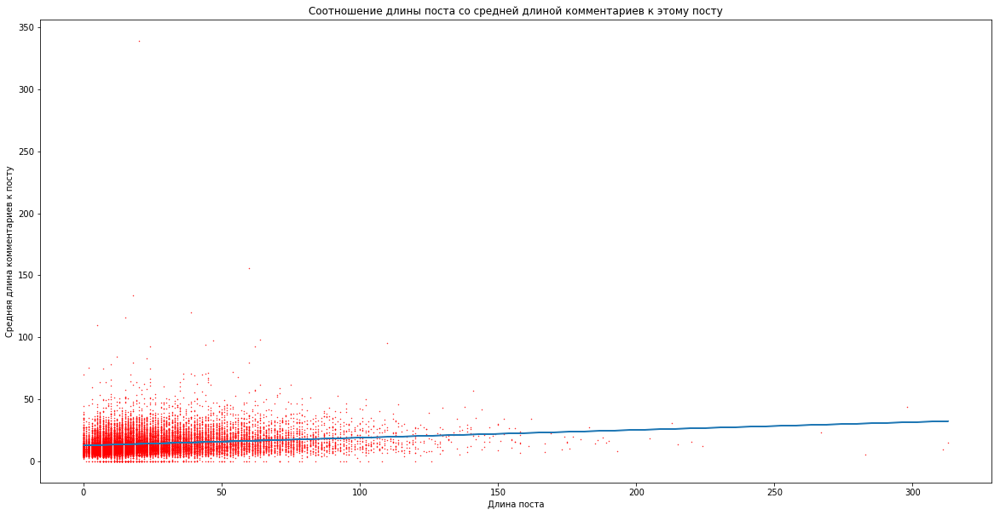

In [727]:
# Чем больше пост, тем длиннее комментарии? Логично.
plt.figure(figsize=(20,10))
plt.scatter(post_lens, comment_lens, s=0.2, c='r')
plt.plot(np.array(post_lens).reshape(len(post_lens), 1), y_pred)
plt.title('Соотношение длины поста со средней длиной комментариев к этому посту')
plt.xlabel('Длина поста')
plt.ylabel('Средняя длина комментариев к посту')
plt.savefig('lengths.png')
plt.show()

In [731]:
# пост с максимальным количеством комментариев
# это пост из далёкого прошлого о выходе на свободе насильника Дианы Шурыгиной
max = 0
j = 0
for i, comment in enumerate(comments):
    if len(comment) > max:
        max = len(comment)
        j = i
print(max)
print(posts[j])

3866
Когда именно Сергей Семенов выйдет на свободу пока не уточняется


In [740]:
# собираем социо-лингвистическую информацию про комментаторов
# на meduza.io нельзя постить своё, поэтому рассматриваем только комментарии пользователей
ages = dict() # массив соотношения возрастов и длин комментов
cities = dict() # массив соотношения городов и длин комментов

Поскольку очень долго обкачивать, скачаю только данные первой тысячи постов

In [742]:
k = 0 # индекс поста
for i, ids in enumerate(id_commentators[:1000]): # ограничение на 1000 постов
    num = 0 # внутренний индекс комментария
    ids = [str(id_) for id_ in ids]
    for id_ in ids:
        # если родной город человека и город, указанный в контактах, не совпадают, то я считаю, что человек связан с 2 городами
        fl = 0 # чтобы два раза не считать совпадающие родной город и город в контактах
        req = urllib.request.Request('https://api.vk.com/method/users.get?user_ids={}&fields={}&v=5.74&access_token={}'.format(id_, 'bdate,city,home_town', key))
        response = urllib.request.urlopen(req)
        result = response.read().decode('utf-8')
        result = json.loads(result)
        print(result, i)
        if 'response' not in result: # к примеру, комменты может оставлять сообщество https://vk.com/tg_me, что вызывает ошибку
            continue
        elem = result['response'][0]
        
        if 'city' in elem:
            fl = 1 # city указан
            tmp = elem['city']['title']
            if tmp not in cities: # заполняем словарь cities
                cities[tmp] = [len(comments[i][num].split())]
            else:
                cities[tmp].append(len(comments[i][num].split()))
                
        if 'home_town' in elem and elem['home_town'] != '': # часто встречается пустое поле ('') вместо названия
            if fl == 1 and tmp == elem['home_town']: # city есть + совпадает с home_town
                pass
            else:
                tmp = elem['home_town']
                if tmp not in cities: # заполняем словарь cities
                    cities[tmp] = [len(comments[i][num].split())] # записываем также в cities
                else:
                    cities[tmp].append(len(comments[i][num].split()))
                
        if 'bdate' in elem:
            a = list(map(int, elem['bdate'].split('.')))
            if len(a) == 3:
                today = date.today()
                age_ = today.year - a[2] - ((today.month, today.day) < (a[1], a[0])) # узнаём возраст
                if age_ not in ages: # заполняем словарь ages
                    ages[age_] = [len(comments[i][num].split())]
                else:
                    ages[age_].append(len(comments[i][num].split()))
        
        num += 1

{'response': [{'id': 62131810, 'first_name': 'Влад', 'last_name': 'Коваленко', 'bdate': '25.10', 'home_town': ''}]} 0
{'response': [{'id': 421830674, 'first_name': 'Luis', 'last_name': 'Suarez'}]} 0
{'response': [{'id': 28186, 'first_name': 'Юрий', 'last_name': 'Вихров', 'bdate': '2.8.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Первомайск (Николаевская область)'}]} 0
{'response': [{'id': 378688948, 'first_name': 'Антон', 'last_name': 'Поперник', 'bdate': '28.4.1990', 'home_town': 'Мирный'}]} 0
{'response': [{'id': 300872272, 'first_name': 'Ярославна', 'last_name': 'Левина', 'bdate': '9.1'}]} 0
{'response': [{'id': 268175320, 'first_name': 'Даниил', 'last_name': 'Дедиков', 'bdate': '10.1.1999', 'home_town': ''}]} 0
{'response': [{'id': 13877, 'first_name': 'Александр', 'last_name': 'Емельянов', 'bdate': '17.4.1989', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 0
{'response': [{'id': 31894448, 'first_name': 'Ярамир', 'last_name'

{'response': [{'id': 195976, 'first_name': 'Тёма', 'last_name': 'Мызин', 'bdate': '18.6.1989', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 1
{'response': [{'id': 403737427, 'first_name': 'Кирилл', 'last_name': 'Бородин', 'bdate': '6.6', 'city': {'id': 104, 'title': 'Омск'}}]} 1
{'response': [{'id': 195976, 'first_name': 'Тёма', 'last_name': 'Мызин', 'bdate': '18.6.1989', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 1
{'response': [{'id': 369693987, 'first_name': 'Ян', 'last_name': 'Маслович', 'bdate': '26.3', 'city': {'id': 169, 'title': 'Ярославль'}}]} 1
{'response': [{'id': 193115247, 'first_name': 'Александр', 'last_name': 'Проскоков', 'bdate': '6.6', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': ''}]} 2
{'response': [{'id': 157218755, 'first_name': 'Максим', 'last_name': 'Иваненко', 'bdate': '13.4'}]} 2
{'response': [{'id': 91485333, 'first_name': 'Андрей', 'last_name': 'Безруков', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town

{'response': [{'id': 40531250, 'first_name': 'Виктор', 'last_name': 'Успенский', 'bdate': '5.1.1981', 'city': {'id': 1141697, 'title': 'Павлово'}}]} 4
{'response': [{'id': 450954933, 'first_name': 'Анастасия', 'last_name': 'Чишко', 'bdate': '18.4', 'home_town': ''}]} 4
{'response': [{'id': 108162373, 'first_name': 'Даниил', 'last_name': 'Латыпов', 'bdate': '10.10.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 4
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 4
{'response': [{'id': 42754429, 'first_name': 'Максим', 'last_name': 'Семяшкин', 'city': {'id': 589, 'title': 'Печора'}}]} 4
{'response': [{'id': 22192193, 'first_name': 'Максим', 'last_name': 'Шпилёв', 'bdate': '14.11.1987', 'city': {'id': 910, 'title': 'Егорьевск'}, 'home_town': 'Егорьевск'}]} 4
{'response': [{'id': 9922987, 'first_name': 'Денис', 'last_name': 'Марченков', 'bdate': '14.5.1987', 'home_town': ''}]} 4
{'re

{'response': [{'id': 283109166, 'first_name': 'Алексей', 'last_name': 'Амосов', 'bdate': '25.6', 'home_town': ''}]} 6
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-68154873'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 6
{'response': [{'id': 417825616, 'first_name': 'Soul', 'last_name': 'Cremation', 'bdate': '1.6', 'home_town': '841'}]} 6
{'response': [{'id': 423985248, 'first_name': 'Яшка', 'last_name': 'Львов', 'home_town': ''}]} 6
{'response': [{'id': 91280812, 'first_name': 'Alexander', 'last_name': 'Krylov', 'city': {'id': 1, 'title': 'Москва'}}]} 6
{'response': [{'id': 286259510, 'first_name': 'Artyom', 'last_name': 'Artyomov', 'city': {'id': 1941, 'title': 'Auckland'}, 'home_town': ''}]} 6
{'response': [{'id': 455627769, 'first_name': 'Конский', 'last_name': 'Друг', 'home_town': ''}]} 7
{'response': [

{'response': [{'id': 3723001, 'first_name': 'Людмила', 'last_name': 'Шорстова'}]} 8
{'response': [{'id': 3185778, 'first_name': 'Евгений', 'last_name': 'Головлев', 'bdate': '6.5', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 8
{'response': [{'id': 292962224, 'first_name': 'Владислав', 'last_name': 'Балашов', 'bdate': '9.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 8
{'response': [{'id': 292962224, 'first_name': 'Владислав', 'last_name': 'Балашов', 'bdate': '9.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 8
{'response': [{'id': 292962224, 'first_name': 'Владислав', 'last_name': 'Балашов', 'bdate': '9.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 8
{'response': [{'id': 3723001, 'first_name': 'Людмила', 'last_name': 'Шорстова'}]} 8
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 8
{'response': [{'id

{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 8
{'response': [{'id': 386218225, 'first_name': 'Лилия', 'last_name': 'Медведева', 'city': {'id': 11688, 'title': 'Марс'}}]} 8
{'response': [{'id': 153539510, 'first_name': 'Алексей', 'last_name': 'Никифоров', 'bdate': '13.4.1978', 'city': {'id': 706, 'title': 'Уральск'}, 'home_town': 'уральск казахстан'}]} 8
{'response': [{'id': 164060000, 'first_name': 'Игорь', 'last_name': 'Каменский', 'bdate': '10.11'}]} 8
{'response': [{'id': 153539510, 'first_name': 'Алексей', 'last_name': 'Никифоров', 'bdate': '13.4.1978', 'city': {'id': 706, 'title': 'Уральск'}, 'home_town': 'уральск казахстан'}]} 8
{'response': [{'id': 164060000, 'first_name': 'Игорь', 'last_name': 'Каменский', 'bdate': '10.11'}]} 8
{'response': [{'id': 157613284, 'first_name': 'Ледяной', 'last_name': 'Герцог', 'bdate': '6.10', 'city': {'id': 2182, 'title': 'Reykjavík'}}]} 9
{'response': [{'id': 4881353, 'first_name': 'Ян', 'last_name': 'Шкуро', '

{'response': [{'id': 364248323, 'first_name': 'Андрей', 'last_name': 'Шульгин', 'bdate': '21.8.2003', 'home_town': ''}]} 9
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 9
{'response': [{'id': 589441, 'first_name': 'Сергей', 'last_name': 'Пелевин', 'home_town': ''}]} 9
{'response': [{'id': 153347797, 'first_name': 'Андрей', 'last_name': 'Сандро', 'bdate': '25.8.1997', 'city': {'id': 1, 'title': 'Москва'}}]} 9
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 9
{'response': [{'id': 120777699, 'first_name': 'Александр', 'last_name': 'Малышев', 'bdate': '3.2.1991', 'city': {'id': 125, 'title': 'Саратов'}}]} 9
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 9
{'response': [{'id': 120777699, 'first_name': 'Александр', 'last_name': 'Малышев', 'bdate': '3.2.1991', 'city': {'id': 125, 'title': 'Саратов'}}]} 9
{'response': [{'id': 48347514

{'response': [{'id': 97223392, 'first_name': 'Кирилл', 'last_name': 'Гордиевич', 'bdate': '24.7.1998', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 9
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 9
{'response': [{'id': 30511787, 'first_name': 'Евгений', 'last_name': 'Презбулевский'}]} 9
{'response': [{'id': 30511787, 'first_name': 'Евгений', 'last_name': 'Презбулевский'}]} 9
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 9
{'response': [{'id': 30511787, 'first_name': 'Евгений', 'last_name': 'Презбулевский'}]} 9
{'response': [{'id': 97223392, 'first_name': 'Кирилл', 'last_name': 'Гордиевич', 'bdate': '24.7.1998', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 9
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 9
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко',

{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 10
{'response': [{'id': 29866956, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '2.8'}]} 10
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 10
{'response': [{'id': 223785964, 'first_name': 'Владислав', 'last_name': 'Рождественский', 'bdate': '15.11', 'home_town': ''}]} 10
{'response': [{'id': 143283014, 'first_name': 'Dmitry', 'last_name': 'Asanov', 'city': {'id': 1, 'title': 'Москва'}}]} 10
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 10
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 10
{'response': [{'id': 164202883, 'first_name': 'Игорь', 'last_name': 'Вахромеев', 'bdate': '6.2.1966', 'city': {'id': 

{'response': [{'id': 1890790, 'first_name': 'Георгий', 'last_name': 'Чентемиров', 'bdate': '9.8.1985', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 10
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 10
{'response': [{'id': 1890790, 'first_name': 'Георгий', 'last_name': 'Чентемиров', 'bdate': '9.8.1985', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 10
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 10
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 10
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 10
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokoto

{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 12
{'response': [{'id': 275387802, 'first_name': 'Юрий', 'last_name': 'Кожев', 'bdate': '9.12'}]} 12
{'response': [{'id': 335614104, 'first_name': 'Сергей', 'last_name': 'Гришунин'}]} 12
{'response': [{'id': 153268774, 'first_name': 'Станислав', 'last_name': 'Логинов', 'city': {'id': 161, 'title': 'Чита'}, 'home_town': 'Чита'}]} 12
{'response': [{'id': 81952384, 'first_name': 'Александр', 'last_name': 'Максимов', 'bdate': '21.8.1981', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 12
{'response': [{'id': 24878920, 'first_name': 'Леонид', 'last_name': 'Латышев', 'bdate': '10.7.1973', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 12
{'response': [{'id': 24878920, 'first_name': 'Леонид', 'last_name': 'Латышев', 'bdate': '10.7.1973', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 12
{'response': [{'id': 153746006, 'first_name': 'Даня', 'last_n

{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 13
{'response': [{'id': 398204816, 'first_name': 'Александр', 'last_name': 'Колчак'}]} 13
{'response': [{'id': 398204816, 'first_name': 'Александр', 'last_name': 'Колчак'}]} 13
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 13
{'response': [{'id': 398204816, 'first_name': 'Александр', 'last_name': 'Колчак'}]} 13
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 13
{'response': [{'id': 398204816, 'first_name': 'Александр', 'last_name': 'Колчак'}]} 13
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 13
{'response': [{'id': 67616494, 'first_name': 'Антон'

{'response': [{'id': 77802142, 'first_name': 'Светлана', 'last_name': 'Сивец', 'bdate': '17.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 14
{'response': [{'id': 77802142, 'first_name': 'Светлана', 'last_name': 'Сивец', 'bdate': '17.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 14
{'response': [{'id': 420522725, 'first_name': 'Эдуард', 'last_name': 'Сединкин', 'bdate': '9.4.1970', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 14
{'response': [{'id': 190220154, 'first_name': 'Тахир', 'last_name': 'Ахметов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 14
{'response': [{'id': 21356533, 'first_name': 'Роман', 'last_name': 'Кошурников', 'bdate': '14.7.1994', 'city': {'id': 66, 'title': 'Киров'}, 'home_town': 'Белая Холуница'}]} 14
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 14
{'response': [{'id': 17679547, 'first_name': 'Мирон', 'last_name': 'Pogosyan', 'bdate': '15.1.1988', 'city': {'id': 1, 'titl

{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 15
{'response': [{'id': 396649273, 'first_name': 'Марк', 'last_name': 'Савченко', 'bdate': '3.10.1989', 'city': {'id': 872, 'title': 'Чехов'}}]} 15
{'response': [{'id': 2334554, 'first_name': 'Максим', 'last_name': 'Степанов', 'bdate': '5.10.1992', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 15
{'response': [{'id': 3421212, 'first_name': 'Антон', 'last_name': 'Данилкин', 'city': {'id': 1919616, 'title': 'San Pedro Sula'}, 'home_town': ''}]} 15
{'response': [{'id': 3421212, 'first_name': 'Антон', 'last_name': 'Данилкин', 'city': {'id': 1919616, 'title': 'San Pedro Sula'}, 'home_town': ''}]} 15
{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 15
{'response': [{'id': 3421212, 'first_name': 'Антон', 'last_name': 'Данилкин', 'city': {'id': 1919616, 'title': 'San Pedro S

{'response': [{'id': 18344299, 'first_name': 'Егор', 'last_name': 'Лис'}]} 16
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 16
{'response': [{'id': 189032491, 'first_name': 'Павел', 'last_name': 'Скок', 'bdate': '29.11.1998', 'city': {'id': 39, 'title': 'Владимир'}, 'home_town': ''}]} 16
{'response': [{'id': 260407604, 'first_name': 'Dmitriy', 'last_name': 'Morrow', 'city': {'id': 1, 'title': 'Москва'}}]} 16
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 16
{'response': [{'id': 370686396, 'first_name': 'Никита', 'last_name': 'Лапаев', 'bdate': '15.9.1997', 'home_town': 'Москва'}]} 16
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 16
{'response': [{'id': 44580131, 'first_name': 'Арви

{'response': [{'id': 475997432, 'first_name': 'Максим', 'last_name': 'Кузьмин'}]} 16
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 16
{'response': [{'id': 479226265, 'first_name': 'Евлампий', 'last_name': 'Брагин', 'bdate': '7.7.1907', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 16
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 16
{'response': [{'id': 475997432, 'first_name': 'Максим', 'last_name': 'Кузьмин'}]} 16
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 16
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 16
{'response': [{'id': 479226265, 'first_name': 'Евлампий', '

{'response': [{'id': 223434805, 'first_name': 'Никита', 'last_name': 'Калюжный', 'city': {'id': 354, 'title': 'Анапа'}}]} 17
{'response': [{'id': 1937509, 'first_name': 'Юрий', 'last_name': 'Прошин', 'bdate': '22.4.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 17
{'response': [{'id': 10698327, 'first_name': 'Ivan', 'last_name': 'Rozonov', 'bdate': '13.7', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Нижний Новгород'}]} 17
{'response': [{'id': 35378828, 'first_name': 'Максим', 'last_name': 'Гинтоев', 'bdate': '1.9.1992', 'city': {'id': 650, 'title': 'Днепропетровск (Днепр)'}, 'home_town': 'Днепропетровск'}]} 17
{'response': [{'id': 259294437, 'first_name': 'Александр', 'last_name': 'Мизес', 'bdate': '16.11.1999', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 17
{'response': [{'id': 455627769, 'first_name': 'Конский', 'last_name': 'Друг', 'home_town': ''}]} 17
{'response': [{'id': 18272040, 'first_name': 'Russian', 'last_name': 'Yugi', 'bdate': '18.11.1

{'response': [{'id': 32388757, 'first_name': 'Srtjwtyh', 'last_name': 'Weryaetyhewt', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 18
{'response': [{'id': 17597539, 'first_name': 'Дамир', 'last_name': 'Садыков', 'bdate': '27.7', 'city': {'id': 151, 'title': 'Уфа'}, 'home_town': 'Уфа'}]} 18
{'response': [{'id': 240863662, 'first_name': 'Light', 'last_name': 'Yagami', 'city': {'id': 183, 'title': 'Алматы'}, 'home_town': ''}]} 18
{'response': [{'id': 172973643, 'first_name': 'Просто', 'last_name': 'Виктор', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'все города для меня как родные'}]} 18
{'response': [{'id': 157846833, 'first_name': 'Дмитрий', 'last_name': 'Васильченко', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': ''}]} 18
{'response': [{'id': 768678, 'first_name': 'Аркадий', 'last_name': 'Виноградов', 'home_town': ''}]} 18
{'response': [{'id': 157218755, 'first_name': 'Максим', 'last_name': 'Иваненко', 'bdate': '13.4'}]} 18
{'response': [

{'response': [{'id': 82132213, 'first_name': 'Алексей', 'last_name': 'Парфёнов', 'home_town': 'Санкт-Петербург, Москва'}]} 20
{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 20
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 20
{'response': [{'id': 193923163, 'first_name': 'Артём', 'last_name': 'Погосян', 'bdate': '3.3.1995', 'home_town': 'СПб'}]} 20
{'response': [{'id': 18456597, 'first_name': 'Євген', 'last_name': 'Ковальчук', 'bdate': '4.5'}]} 20
{'response': [{'id': 82132213, 'first_name': 'Алексей', 'last_name': 'Парфёнов', 'home_town': 'Санкт-Петербург, Москва'}]} 20
{'response': [{'id': 18456597, 'first_name': 'Євген', 'last_name': 'Ковальчук', 'bdate': '4.5'}]} 20
{'response': [{'id': 82132213, 'first_name': 'Алексей', 'last_name': 'Парфёнов', 'home_town': 'Санкт-Пе

{'response': [{'id': 18628160, 'first_name': 'Алексей', 'last_name': 'Тесаков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 21
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 21
{'response': [{'id': 3336391, 'first_name': 'Степан', 'last_name': 'Субботин', 'home_town': 'город Земля'}]} 21
{'response': [{'id': 3336391, 'first_name': 'Степан', 'last_name': 'Субботин', 'home_town': 'город Земля'}]} 21
{'response': [{'id': 479429876, 'first_name': 'Димка', 'last_name': 'Дикий', 'bdate': '4.5.1982', 'home_town': ''}]} 21
{'response': [{'id': 213661081, 'first_name': 'Антон', 'last_name': 'Попов', 'bdate': '2.5.1976'}]} 21
{'response': [{'id': 146874579, 'first_name': 'Алексей', 'last_name': 'Подгорнов', 'city': {'id': 74, 'title': 'Курган'}, 'home_town': 'Курган'}]} 21
{'response': [{'id': 16840271, 'first_name': 'Екатерина', 'last_name': 'Горелова', 'bdate': '9.5.1985', 'city': {'id': 

{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 22
{'response': [{'id': 26631366, 'first_name': 'Владимир', 'last_name': 'Тимаков', 'bdate': '1.7', 'city': {'id': 1781, 'title': 'Кулебаки'}, 'home_town': 'Кулебаки'}]} 22
{'response': [{'id': 483074666, 'first_name': 'Pascal', 'last_name': 'Goebbels', 'bdate': '22.7.1996', 'city': {'id': 5265529, 'title': 'Nürnberg'}}]} 22
{'response': [{'id': 104977103, 'first_name': 'Денис', 'last_name': 'Корепанов', 'bdate': '2.2.1989', 'city': {'id': 4636106, 'title': 'Hafnarfjörður'}}]} 22
{'response': [{'id': 223785964, 'first_name': 'Владислав', 'last_name': 'Рождественский', 'bdate': '15.11', 'home_town': ''}]} 22
{'response': [{'id': 429535913, 'first_name': 'Мария', 'last_name': 'Моро', 'bdate': '25.12.1984', 'home_town': 'Петроград'}]} 22
{'response': [{'id': 2384695, 'first_name': 'Антон', 'last_name': 'Спирин', 'bdate': '12.9', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 22
{'response': [{'

{'response': [{'id': 299329561, 'first_name': 'Тим', 'last_name': 'Сойер', 'bdate': '8.6', 'city': {'id': 1, 'title': 'Москва'}}]} 22
{'response': [{'id': 333448876, 'first_name': 'Olimpiard', 'last_name': 'Ohuliardovich'}]} 22
{'response': [{'id': 59748143, 'first_name': 'Анатолий', 'last_name': 'Вершинин', 'city': {'id': 1121583, 'title': 'Майма'}}]} 22
{'response': [{'id': 369002009, 'first_name': 'Роман', 'last_name': 'Литвинов', 'bdate': '1.8', 'city': {'id': 1, 'title': 'Москва'}}]} 22
{'response': [{'id': 191903109, 'first_name': 'Андрей', 'last_name': 'Попов', 'bdate': '21.1', 'home_town': ''}]} 22
{'response': [{'id': 435911897, 'first_name': 'Rage', 'last_name': 'Against', 'bdate': '1.1.1951'}]} 22
{'response': [{'id': 37762375, 'first_name': 'Никита', 'last_name': 'Михеев', 'bdate': '13.7', 'city': {'id': 1, 'title': 'Москва'}}]} 22
{'response': [{'id': 435911897, 'first_name': 'Rage', 'last_name': 'Against', 'bdate': '1.1.1951'}]} 22
{'response': [{'id': 5071130, 'first_nam

{'response': [{'id': 424913645, 'first_name': 'Екатерина', 'last_name': 'Гринвич', 'bdate': '6.6.2003', 'home_town': ''}]} 22
{'response': [{'id': 474628005, 'first_name': 'Лолита', 'last_name': 'Вистерия', 'home_town': ''}]} 22
{'response': [{'id': 359762, 'first_name': 'Marina', 'last_name': 'Gavrilenko'}]} 22
{'response': [{'id': 255267840, 'first_name': 'Виктор', 'last_name': 'Онопко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 22
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-81786801'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 22
{'response': [{'id': 1822085, 'first_name': 'Дмитрий', 'last_name': 'Лаврентьев', 'bdate': '27.5.1987', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 22
{'response': [{'id': 4816350, 'first_name': 'Дима', 'last_name': 'Зайцев', 'city': {'id': 1, 'title': 'Москва'}}]}

{'response': [{'id': 180720943, 'first_name': 'Арсений', 'last_name': 'Шиловский', 'bdate': '14.5.1992', 'city': {'id': 1549, 'title': 'Таруса'}, 'home_town': 'Таруса'}]} 24
{'response': [{'id': 140939090, 'first_name': 'Иван', 'last_name': 'Будько', 'city': {'id': 7076, 'title': 'Жодино'}, 'home_town': 'Жодино'}]} 24
{'response': [{'id': 165537904, 'first_name': 'Денис', 'last_name': 'Шимада', 'city': {'id': 280, 'title': 'Харьков'}}]} 24
{'response': [{'id': 157246251, 'first_name': 'Руся', 'last_name': 'Крутиенко', 'bdate': '29.11.1996', 'city': {'id': 153, 'title': 'Хабаровск'}, 'home_town': ''}]} 24
{'response': [{'id': 141660069, 'first_name': 'Вова', 'last_name': 'Сурский', 'bdate': '22.6'}]} 24
{'response': [{'id': 15186941, 'first_name': 'Эрес', 'last_name': 'Монгуш', 'bdate': '18.1'}]} 24
{'response': [{'id': 307296345, 'first_name': 'Sergey', 'last_name': 'Gennadievich'}]} 24
{'response': [{'id': 3175197, 'first_name': 'Юлия', 'last_name': 'Гридина', 'bdate': '24.6', 'city':

{'response': [{'id': 10656752, 'first_name': 'Ivan', 'last_name': 'Sharov', 'bdate': '12.9.1987', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 24
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 24
{'response': [{'id': 10656752, 'first_name': 'Ivan', 'last_name': 'Sharov', 'bdate': '12.9.1987', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 24
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 24
{'response': [{'id': 10656752, 'first_name': 'Ivan', 'last_name': 'Sharov', 'bdate': '12.9.1987', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 24
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 24
{'response': [{'id': 10656752, 'first_name': 'Ivan', 'last

{'response': [{'id': 168138178, 'first_name': 'Денис', 'last_name': 'Суровцев', 'home_town': ''}]} 26
{'response': [{'id': 6829714, 'first_name': 'Александр', 'last_name': 'Петрищев', 'home_town': ''}]} 26
{'response': [{'id': 30184921, 'first_name': 'Артур', 'last_name': 'Миллер', 'bdate': '30.1'}]} 26
{'response': [{'id': 56313394, 'first_name': 'Sergey', 'last_name': 'Lazarev'}]} 26
{'response': [{'id': 234015530, 'first_name': 'Ruslan', 'last_name': 'Kazarkin', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': ''}]} 26
{'response': [{'id': 270301314, 'first_name': 'Андрей', 'last_name': 'Забелин', 'bdate': '2.11'}]} 26
{'response': [{'id': 24217209, 'first_name': 'Andrey', 'last_name': 'Prikhodko', 'bdate': '19.6.1996', 'home_town': 'Москва'}]} 26
{'response': [{'id': 216456778, 'first_name': 'Галя', 'last_name': 'Федорова', 'bdate': '17.7.1998', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Бродокалмак'}]} 26
{'response': [{'id': 39944604, 'first_name': 'Антон', 

{'response': [{'id': 66927087, 'first_name': 'Валерия', 'last_name': 'Редина', 'bdate': '14.4'}]} 26
{'response': [{'id': 475973030, 'first_name': 'Василий', 'last_name': 'Чуйков', 'bdate': '12.2.1990', 'city': {'id': 151, 'title': 'Уфа'}}]} 26
{'response': [{'id': 59500934, 'first_name': 'Антон', 'last_name': 'Лушанкин', 'bdate': '27.1', 'city': {'id': 314, 'title': 'Киев'}, 'home_town': 'Киев'}]} 26
{'response': [{'id': 186034517, 'first_name': 'Эльдар', 'last_name': 'Туменов', 'bdate': '30.9.1947', 'city': {'id': 85, 'title': 'Махачкала'}}]} 26
{'response': [{'id': 339042592, 'first_name': 'Евгений', 'last_name': 'Чечеткин', 'bdate': '15.2.1967', 'home_town': ''}]} 26
{'response': [{'id': 484298938, 'first_name': 'Игорь', 'last_name': 'Крутский', 'bdate': '5.6.1985', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 26
{'response': [{'id': 207320148, 'first_name': 'Максим', 'last_name': 'Торопов', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town': ''}]} 26
{'resp

{'response': [{'id': 220926022, 'first_name': 'Антон', 'last_name': 'Шейкин', 'bdate': '22.10'}]} 27
{'response': [{'id': 376222552, 'first_name': 'Павел', 'last_name': 'Москаленко', 'bdate': '14.3', 'city': {'id': 61, 'title': 'Калининград'}}]} 27
{'response': [{'id': 3698548, 'first_name': 'Андрей', 'last_name': 'Рыбаков', 'bdate': '28.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 27
{'response': [{'id': 9108684, 'first_name': 'Александр', 'last_name': 'Жернаков', 'bdate': '11.4.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 27
{'response': [{'id': 160589862, 'first_name': 'Александр', 'last_name': 'Еретиков'}]} 27
{'response': [{'id': 11174683, 'first_name': 'Алексей', 'last_name': 'Сиротюк', 'bdate': '17.1.1989'}]} 27
{'response': [{'id': 49015334, 'first_name': 'Наталья', 'last_name': 'Костянская', 'bdate': '31.10.1991', 'city': {'id': 1, 'title': 'Москва'}}]} 27
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Г

{'response': [{'id': 80883974, 'first_name': 'Полина', 'last_name': 'Ерёмченко', 'bdate': '24.2'}]} 27
{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 27
{'response': [{'id': 137593517, 'first_name': 'Гела', 'last_name': 'Смирнова'}]} 27
{'response': [{'id': 188303257, 'first_name': 'Прокофий', 'last_name': 'Гришан', 'bdate': '7.2', 'city': {'id': 3063, 'title': 'Кобрин'}, 'home_town': ''}]} 27
{'response': [{'id': 288179562, 'first_name': 'Алексей', 'last_name': 'Федоров', 'bdate': '24.11.1960', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 27
{'response': [{'id': 317244468, 'first_name': 'Александр', 'last_name': 'Столбовой', 'bdate': '2.9.1997', 'city': {'id': 1, 'title': 'Москва'}}]} 27
{'response': [{'id': 484298938, 'first_name': 'Игорь', 'last_name': 'Крутский', 'bdate': '5.6.1985', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 27
{'response': [{'id': 13759

{'response': [{'id': 196417650, 'first_name': 'Тимур', 'last_name': 'Юнусов', 'city': {'id': 160, 'title': 'Грозный'}, 'home_town': 'Грозный'}]} 28
{'response': [{'id': 125845539, 'first_name': 'Ян', 'last_name': 'Королев', 'bdate': '18.5', 'home_town': ''}]} 28
{'response': [{'id': 405433697, 'first_name': 'Санта', 'last_name': 'Крампус', 'bdate': '30.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 28
{'response': [{'id': 371133535, 'first_name': 'Иван', 'last_name': 'Субботкин', 'bdate': '31.1.1997', 'home_town': 'Сызрань'}]} 28
{'response': [{'id': 294010920, 'first_name': 'Astra', 'last_name': 'Drift'}]} 28
{'response': [{'id': 484298938, 'first_name': 'Игорь', 'last_name': 'Крутский', 'bdate': '5.6.1985', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 28
{'response': [{'id': 90722740, 'first_name': 'Дмитрий', 'last_name': 'Овчинников', 'bdate': '15.4.1997', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 28
{'response': [{'id': 70049099, 'fir

{'response': [{'id': 30136505, 'first_name': 'Галина', 'last_name': 'Войнова', 'bdate': '23.1', 'city': {'id': 2974, 'title': 'Медвежьегорск'}, 'home_town': ''}]} 29
{'response': [{'id': 218838629, 'first_name': 'Марк', 'last_name': 'Черный', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Казань'}]} 29
{'response': [{'id': 12025189, 'first_name': 'Дмитрий', 'last_name': 'Сенин', 'bdate': '25.6', 'city': {'id': 1, 'title': 'Москва'}}]} 29
{'response': [{'id': 180206887, 'first_name': 'Евгения', 'last_name': 'Левандовская'}]} 29
{'response': [{'id': 49235701, 'first_name': 'Рустам', 'last_name': 'Гильманов', 'city': {'id': 56, 'title': 'Ижевск'}}]} 29
{'response': [{'id': 49235701, 'first_name': 'Рустам', 'last_name': 'Гильманов', 'city': {'id': 56, 'title': 'Ижевск'}}]} 29
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 29
{'response': [{'id': 184419443, 'first_name': 'Марат', 'last_

{'response': [{'id': 26452621, 'first_name': 'Руслан', 'last_name': 'Волков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 30
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 30
{'response': [{'id': 466403995, 'first_name': 'Александр', 'last_name': 'Недлявсех', 'bdate': '2.2.1976'}]} 30
{'response': [{'id': 24878920, 'first_name': 'Леонид', 'last_name': 'Латышев', 'bdate': '10.7.1973', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 30
{'response': [{'id': 16516915, 'first_name': 'Павел', 'last_name': 'Пархоменко', 'city': {'id': 73, 'title': 'Красноярск'}}]} 30
{'response': [{'id': 424727954, 'first_name': 'Евлампий', 'last_name': 'Берестов', 'bdate': '13.9.1971', 'home_town': ''}]} 30
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 30
{'response': [{'id': 5

{'response': [{'id': 59163309, 'first_name': 'Сергей', 'last_name': 'Воеводин', 'bdate': '1.1.1920', 'city': {'id': 22, 'title': 'Архангельск'}}]} 32
{'response': [{'id': 12939126, 'first_name': 'Владимир', 'last_name': 'Цуканов', 'city': {'id': 1, 'title': 'Москва'}}]} 32
{'response': [{'id': 44093217, 'first_name': 'Руслан', 'last_name': 'Хакимов'}]} 32
{'response': [{'id': 283109166, 'first_name': 'Алексей', 'last_name': 'Амосов', 'bdate': '25.6', 'home_town': ''}]} 32
{'response': [{'id': 2670697, 'first_name': 'Дмитрий', 'last_name': 'Рихтер', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 32
{'response': [{'id': 26883082, 'first_name': 'Ренат', 'last_name': 'Юргенс', 'bdate': '1.1.1967', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 32
{'response': [{'id': 4444480, 'first_name': 'David', 'last_name': 'Daniel', 'bdate': '23.11', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 32
{'response': [{'id': 173491217, 'first_name': 'Артур', 'last_name': 'Галимуллин'}]} 32
{'response': 

{'response': [{'id': 399967378, 'first_name': 'Михаил', 'last_name': 'Певко'}]} 32
{'response': [{'id': 380373579, 'first_name': 'Марк', 'last_name': 'Тулий', 'bdate': '29.2', 'city': {'id': 4722255, 'title': 'Limón'}}]} 32
{'response': [{'id': 399967378, 'first_name': 'Михаил', 'last_name': 'Певко'}]} 32
{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 32
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 32
{'response': [{'id': 224395112, 'first_name': 'Борис', 'last_name': 'Шеншинов', 'bdate': '4.5'}]} 32
{'response': [{'id': 229748382, 'first_name': 'Елена', 'last_name': 'Шишкова', 'home_town': 'Москва'}]} 32
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 32
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 32
{'response': [{'id': 1107015, '

{'response': [{'id': 4372151, 'first_name': 'Игорь', 'last_name': 'Иванов', 'home_town': 'Гаджиево'}]} 33
{'response': [{'id': 135904226, 'first_name': 'Маргарита', 'last_name': 'Овчинникова', 'bdate': '23.8.1997', 'city': {'id': 72, 'title': 'Краснодар'}}]} 33
{'response': [{'id': 64091547, 'first_name': 'Паша', 'last_name': 'Белокуров', 'bdate': '7.3.1998', 'city': {'id': 122, 'title': 'Рязань'}, 'home_town': 'Рязань'}]} 33
{'response': [{'id': 12954537, 'first_name': 'Вячеслав', 'last_name': 'Ларионов', 'bdate': '13.2.1985'}]} 33
{'response': [{'id': 301988950, 'first_name': 'Джони', 'last_name': 'Мнемоник', 'bdate': '22.4.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 33
{'response': [{'id': 163231682, 'first_name': 'Алик', 'last_name': 'Асланян', 'home_town': ''}]} 33
{'response': [{'id': 4372151, 'first_name': 'Игорь', 'last_name': 'Иванов', 'home_town': 'Гаджиево'}]} 33
{'response': [{'id': 4372151, 'first_name': 'Игорь', 'last_name': 'Иванов', 'home_town': 'Гаджиево'}]

{'response': [{'id': 55128665, 'first_name': 'Евгений', 'last_name': 'Кривоборский', 'bdate': '16.5', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 34
{'response': [{'id': 208549711, 'first_name': 'Алексей', 'last_name': 'Терехов', 'bdate': '8.2', 'city': {'id': 1, 'title': 'Москва'}}]} 34
{'response': [{'id': 136704676, 'first_name': 'Владимир', 'last_name': 'Лянгузов', 'bdate': '12.5.1982', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': ''}]} 34
{'response': [{'id': 178465156, 'first_name': 'Артем', 'last_name': 'Карамышев', 'bdate': '3.10', 'city': {'id': 55, 'title': 'Иваново'}}]} 34
{'response': [{'id': 136704676, 'first_name': 'Владимир', 'last_name': 'Лянгузов', 'bdate': '12.5.1982', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': ''}]} 34
{'response': [{'id': 178465156, 'first_name': 'Артем', 'last_name': 'Карамышев', 'bdate': '3.10', 'city': {'id': 55, 'title': 'Иваново'}}]} 34
{'response': [{'id': 136704676, 'first_name': 'Владимир', 'last_name': 'Лянгуз

{'response': [{'id': 233223865, 'first_name': 'Радима', 'last_name': 'Гукова', 'bdate': '24.1', 'city': {'id': 90, 'title': 'Нальчик'}}]} 35
{'response': [{'id': 375026832, 'first_name': 'Jonny', 'last_name': 'Tyson', 'home_town': ''}]} 35
{'response': [{'id': 323590640, 'first_name': 'Николай', 'last_name': 'Сведенцов', 'bdate': '13.3.1997', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 35
{'response': [{'id': 33636441, 'first_name': 'Андрей', 'last_name': 'Гнусарёв', 'bdate': '26.12.1989', 'city': {'id': 586, 'title': 'Заречный'}, 'home_town': 'Заречный'}]} 35
{'response': [{'id': 220402033, 'first_name': 'Леонид', 'last_name': 'Андреев', 'bdate': '21.8', 'home_town': 'Орел '}]} 35
{'response': [{'id': 33636441, 'first_name': 'Андрей', 'last_name': 'Гнусарёв', 'bdate': '26.12.1989', 'city': {'id': 586, 'title': 'Заречный'}, 'home_town': 'Заречный'}]} 35
{'response': [{'id': 4773432, 'first_name': 'Егор', 'last_name': 'Фролов', 'bdate': '17.5.1986', 'city': {'id': 392

{'response': [{'id': 5294949, 'first_name': 'Ярослава', 'last_name': 'Морозова', 'bdate': '31.12.1992', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 36
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 36
{'response': [{'id': 1890790, 'first_name': 'Георгий', 'last_name': 'Чентемиров', 'bdate': '9.8.1985', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 36
{'response': [{'id': 1937509, 'first_name': 'Юрий', 'last_name': 'Прошин', 'bdate': '22.4.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 36
{'response': [{'id': 42741335, 'first_name': 'Борис', 'last_name': 'Корочкин', 'city': {'id': 628, 'title': 'Запорожье'}}]} 36
{'response': [{'id': 19475834, 'first_name': 'Тамара', 'last_name': 'Рахманова', 'city': {'id': 62, 'title': 'Калуга'}, 'home_town': 'Билибино'}]} 36
{'response': [{'id': 6257074, 'first_name': 'Ольга', 'last_name': 'Холодная', 'bdate': '24.3.1991', 'city': {'id': 2, 'ti

{'response': [{'id': 395989986, 'first_name': 'Даниил', 'last_name': 'Луганский', 'bdate': '10.8.1941'}]} 37
{'response': [{'id': 9862624, 'first_name': 'Александр', 'last_name': 'Никифоров', 'bdate': '21.6.1986', 'city': {'id': 121, 'title': 'Рыбинск'}, 'home_town': 'Рыбинск'}]} 37
{'response': [{'id': 15279323, 'first_name': 'Фаригорн', 'last_name': 'Габриев', 'bdate': '26.4', 'city': {'id': 151, 'title': 'Уфа'}}]} 37
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 37
{'response': [{'id': 2274839, 'first_name': 'Timur', 'last_name': 'Galimzyanov', 'bdate': '27.9', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Tashkent'}]} 37
{'response': [{'id': 444052506, 'first_name': 'Александр', 'last_name': 'Волков', 'bdate': '23.5.1992', 'city': {'id': 53, 'title': 'Жуковский'}, 'home_town': 'Mосква'}]} 37
{'response': [{'id': 171647103, 'first_name': 'Денис', 'last_name': 'Анопка', 'bdate': '17.9', 'city': {'id': 2001, 

{'response': [{'id': 15279323, 'first_name': 'Фаригорн', 'last_name': 'Габриев', 'bdate': '26.4', 'city': {'id': 151, 'title': 'Уфа'}}]} 37
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 37
{'response': [{'id': 3698548, 'first_name': 'Андрей', 'last_name': 'Рыбаков', 'bdate': '28.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 37
{'response': [{'id': 38716878, 'first_name': 'Berrys', 'last_name': 'Well'}]} 37
{'response': [{'id': 417443086, 'first_name': 'Александр', 'last_name': 'Каменский', 'bdate': '16.6', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': ''}]} 37
{'response': [{'id': 136133259, 'first_name': 'Женя', 'last_name': 'Мороз', 'bdate': '21.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 37
{'response': [{'id': 38716878, 'first_name': 'Berrys', 'last_name': 'Well'}]} 37
{'response': [{'id': 34011043, 'first_name': 'Оля', 'last_name':

{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 37
{'response': [{'id': 316285046, 'first_name': 'Саша', 'last_name': 'Стрижов', 'bdate': '16.1', 'city': {'id': 7159, 'title': 'Миасс'}}]} 37
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 37
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 37
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 37
{'response': [{'id': 316285046, 'first_name': 'Саша', 'last_name': 'Стрижов', 'bdate': '16.1', 'city': {'id': 7159, 'title': 'Миасс'}}]} 37
{'response': [{'id': 20053

{'response': [{'id': 57213107, 'first_name': 'Анна', 'last_name': 'Ушакова', 'bdate': '24.2.1997', 'city': {'id': 141, 'title': 'Тверь'}}]} 38
{'response': [{'id': 457151014, 'first_name': 'Андрей', 'last_name': 'Сироткин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 38
{'response': [{'id': 142552954, 'first_name': 'Александр', 'last_name': 'Гермацкий', 'bdate': '10.3.1992', 'city': {'id': 282, 'title': 'Минск'}}]} 38
{'response': [{'id': 154403889, 'first_name': 'Константин', 'last_name': 'Ражев', 'bdate': '2.6', 'city': {'id': 1060979, 'title': 'Едрово'}, 'home_town': 'Едрово навсегда'}]} 38
{'response': [{'id': 303678357, 'first_name': 'Баба-С', 'last_name': 'Топором', 'bdate': '25.9', 'city': {'id': 133, 'title': 'Сочи'}}]} 38
{'response': [{'id': 403221143, 'first_name': 'Владимир', 'last_name': 'Зманов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 38
{'response': [{'id': 239908117, 'first_name': 'Александр', 'last_name': 'Веселов', 'bdate

{'response': [{'id': 14166426, 'first_name': 'Константин', 'last_name': 'Молчанов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Орёл'}]} 38
{'response': [{'id': 83204170, 'first_name': 'Денис', 'last_name': 'Кореев', 'bdate': '25.5.1994', 'city': {'id': 60, 'title': 'Казань'}}]} 38
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 38
{'response': [{'id': 271971535, 'first_name': 'Мурад', 'last_name': 'Абитов', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 38
{'response': [{'id': 297926602, 'first_name': 'Ира', 'last_name': 'Панова', 'bdate': '19.7', 'city': {'id': 580, 'title': 'Электросталь'}}]} 38
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 38
{'response': [{'id': 13824464, 'first_name': 'Толик', 'last_name': 'Мишин', 'bdate': '14.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 38
{'response': [{'i

{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 39
{'response': [{'id': 328851487, 'first_name': 'Ксения', 'last_name': 'Меркулова', 'bdate': '12.2', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 39
{'response': [{'id': 431773742, 'first_name': 'Ginger', 'last_name': 'Show', 'bdate': '7.3.2000'}]} 39
{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 39
{'response': [{'id': 92888047, 'first_name': 'Павел', 'last_name': 'Банкевич', 'bdate': '9.7.1996', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 39
{'response': [{'id': 360333565, 'first_name': 'Аня', 'last_name': 'Сергеева', 'bdate': '23.1', 'city': {'id': 6209, 'title': 'Вершино-Дарасунский'}, 'home_town': 'Вершино-Дарасунский'}]} 39
{'response': [{'id': 125162265, 'first_name': 'Антон', 'last_name': 'Иванов', 'bdate': '1.1', 'city': {'id': 143, 'title'

{'response': [{'id': 263522044, 'first_name': 'Антон', 'last_name': 'Ульянов', 'bdate': '3.2.1986', 'city': {'id': 23, 'title': 'Астрахань'}, 'home_town': 'Астрахань'}]} 40
{'response': [{'id': 71105336, 'first_name': 'Рина', 'last_name': 'Алискина', 'bdate': '27.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 40
{'response': [{'id': 8948237, 'first_name': 'Дмитрий', 'last_name': 'Белоусов', 'bdate': '11.10.1995', 'city': {'id': 1, 'title': 'Москва'}}]} 40
{'response': [{'id': 1474918, 'first_name': 'Владимир', 'last_name': 'Никитин', 'bdate': '4.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 40
{'response': [{'id': 13403561, 'first_name': 'Андрей', 'last_name': 'Писарев', 'city': {'id': 3090219, 'title': 'Homs'}}]} 40
{'response': [{'id': 13403561, 'first_name': 'Андрей', 'last_name': 'Писарев', 'city': {'id': 3090219, 'title': 'Homs'}}]} 40
{'response': [{'id': 311874318, 'first_name': 'Павел', 'last_name': 'Вакуленко', 'bdate': '24.8.1970', 'city': {'id': 2, 'title': 'С

{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 40
{'response': [{'id': 2051027, 'first_name': 'Андрей', 'last_name': 'Серебренников', 'bdate': '6.9.1960', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 40
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 40
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 40
{'response': [{'id': 9942899, 'first_name': 'Олег', 'last_name': 'Майбородов', 'bdate': '4.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 40
{'response': [{'id': 9191415, 'first_name': 'Павел', 'last_name': 'Кривицкий', 'bdate': '21.8.1988', 'city': {'id': 649, 'title': 'Гродно'}}]} 40
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988'

{'response': [{'id': 183282178, 'first_name': 'Господин', 'last_name': 'Студент'}]} 41
{'response': [{'id': 328091820, 'first_name': 'Null', 'last_name': 'Null', 'bdate': '31.12.1985'}]} 41
{'response': [{'id': 411512905, 'first_name': 'Andrey', 'last_name': 'Kaufman', 'bdate': '19.1.1992', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': 'Ташкент - Оренбург - Иваново'}]} 41
{'response': [{'id': 220296374, 'first_name': 'Владимир', 'last_name': 'Владимирский', 'city': {'id': 1017, 'title': 'Chicago'}}]} 41
{'response': [{'id': 477582153, 'first_name': 'Кафир', 'last_name': 'Сиринов', 'bdate': '24.3.1998', 'city': {'id': 1921911, 'title': 'Pristina'}, 'home_town': ''}]} 41
{'response': [{'id': 239613052, 'first_name': 'Паша', 'last_name': 'Подшофе'}]} 41
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 41
{'response': [{'id': 193408304, 'first_name': 'Panther', 'last_name': 'Benz', 'city': {'id': 1, 'title': 'Москва'}, 'home_town

{'response': [{'id': 188874871, 'first_name': 'Евгения', 'last_name': 'Матуа', 'bdate': '1.6.1993', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Пермь'}]} 42
{'response': [{'id': 440892045, 'first_name': 'Владимир', 'last_name': 'Владимиров', 'bdate': '28.7.1997', 'city': {'id': 122, 'title': 'Рязань'}}]} 42
{'response': [{'id': 191943359, 'first_name': 'Михаил', 'last_name': 'Крейген', 'bdate': '16.12.1996', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 42
{'response': [{'id': 440892045, 'first_name': 'Владимир', 'last_name': 'Владимиров', 'bdate': '28.7.1997', 'city': {'id': 122, 'title': 'Рязань'}}]} 42
{'response': [{'id': 188874871, 'first_name': 'Евгения', 'last_name': 'Матуа', 'bdate': '1.6.1993', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Пермь'}]} 42
{'response': [{'id': 188874871, 'first_name': 'Евгения', 'last_name': 'Матуа', 'bdate': '1.6.1993', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Пермь'}]} 42
{'response': [{'id': 191943359, 'first_name': 

{'response': [{'id': 195662865, 'first_name': 'Ильмир', 'last_name': 'Бикмухаметов', 'bdate': '18.9.1993'}]} 43
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 43
{'response': [{'id': 273213974, 'first_name': 'Jana', 'last_name': 'Petrowa', 'home_town': 'Санкт _Петербург'}]} 43
{'response': [{'id': 11371017, 'first_name': 'Денис', 'last_name': 'Опимах', 'bdate': '25.8.1980', 'city': {'id': 75, 'title': 'Курск'}}]} 43
{'response': [{'id': 35616633, 'first_name': 'Александр', 'last_name': 'Владимирович', 'bdate': '19.12.1987', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 43
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 43
{'response': [{'id': 374816712, 'first_name': 'Kill', 'last_name': 'Yourself', 'bdate': '20.6.1998', 'city': {'id': 1, 'title': 'Москва'}}]} 43
{'respo

{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 43
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 43
{'response': [{'id': 155293769, 'first_name': 'Зепар', 'last_name': 'Бен-шварценбард', 'bdate': '3.1.1992', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'ירושלים'}]} 43
{'response': [{'id': 190601120, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '26.11', 'city': {'id': 138, 'title': 'Сыктывкар'}}]} 43
{'response': [{'id': 139519754, 'first_name': 'Rin', 'last_name': 'Rhineford', 'city': {'id': 37, 'title': 'Владивосток'}}]} 43
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Геленджик'}]} 43
{'response': [{'id': 15148504, 'first_name

{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 43
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Геленджик'}]} 43
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 43
{'response': [{'id': 135677217, 'first_name': 'Кирилл', 'last_name': 'Сергеевич', 'bdate': '8.1', 'home_town': 'Тайшет'}]} 43
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 43
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 43
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 

{'response': [{'id': 479226265, 'first_name': 'Евлампий', 'last_name': 'Брагин', 'bdate': '7.7.1907', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 43
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 43
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 43
{'response': [{'id': 316745313, 'first_name': 'Эрик', 'last_name': 'Картман', 'bdate': '24.7.1995', 'home_town': ''}]} 43
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 43
{'response': [{'id': 1215285, 'first_name': 'Xozt', 'last_name': 'Rubber', 'city': {'id': 1, 'title': 'Москва'}}]} 43
{'response': [{'id': 207411437, 'first_name': 'Бубль', 'last_name': 'Гум'}]} 43
{'response': [{'id': 135141253, 'first

{'response': [{'id': 307101258, 'first_name': 'Готфрид', 'last_name': 'Бульонский', 'bdate': '1.5', 'city': {'id': 1904869, 'title': 'Helsinki'}}]} 43
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 43
{'response': [{'id': 121445121, 'first_name': 'Денис', 'last_name': 'Барышников', 'bdate': '1.8.1992', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 43
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 43
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 43
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 43
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохи

{'response': [{'id': 117606926, 'first_name': 'Кирилл', 'last_name': 'Сергеевич', 'bdate': '5.10.1997', 'city': {'id': 1315, 'title': 'Мелитополь'}, 'home_town': 'Мелитополь'}]} 44
{'response': [{'id': 8356709, 'first_name': 'Ольга', 'last_name': 'Dark', 'bdate': '14.7.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Пенза, Санкт-Петербург'}]} 44
{'response': [{'id': 12516253, 'first_name': 'Лёха', 'last_name': 'Литовский', 'bdate': '14.4.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 44
{'response': [{'id': 396799914, 'first_name': 'Арсений', 'last_name': 'Смирнов', 'city': {'id': 1, 'title': 'Москва'}}]} 44
{'response': [{'id': 301568109, 'first_name': 'Юрий', 'last_name': 'Труфанов', 'bdate': '9.3', 'city': {'id': 26, 'title': 'Белгород'}, 'home_town': 'Белгород'}]} 44
{'response': [{'id': 13375190, 'first_name': 'Оля', 'last_name': 'Петрова', 'bdate': '8.1'}]} 45
{'response': [{'id': 150613942, 'first_name': 'Игорь', 'last_name': 'Кондрашов', 'bdate': '18.6', 'ci

{'response': [{'id': 468292654, 'first_name': 'Нина', 'last_name': 'Аккерман', 'bdate': '20.3.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 279792155, 'first_name': 'Rheu', 'last_name': 'Rdflhfn'}]} 45
{'response': [{'id': 273213974, 'first_name': 'Jana', 'last_name': 'Petrowa', 'home_town': 'Санкт _Петербург'}]} 45
{'response': [{'id': 183639524, 'first_name': 'Сергей', 'last_name': 'Кошелев', 'bdate': '1.6.1989', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 45
{'response': [{'id': 268492361, 'first_name': 'Дмитрий', 'last_name': 'Бричевский', 'bdate': '31.1.1994', 'city': {'id': 42, 'title': 'Воронеж'}}]} 45
{'response': [{'id': 120262534, 'first_name': 'Нино', 'last_name': 'Царь', 'bdate': '9.9.1998', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 462997313, 'first_name': 'Darya', 'last_name': 'Yakovlenko', 'bdate': '19.6.1994', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 45
{'response': [{'id': 279792155, 'first_name': 'Rheu', 'last

{'response': [{'id': 257012, 'first_name': 'Юлько', 'last_name': 'Шланг-Бассейн', 'bdate': '21.7.1920'}]} 45
{'response': [{'id': 150613942, 'first_name': 'Игорь', 'last_name': 'Кондрашов', 'bdate': '18.6', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 150613942, 'first_name': 'Игорь', 'last_name': 'Кондрашов', 'bdate': '18.6', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 375327712, 'first_name': 'Музыкальный-Лекторий', 'last_name': 'Менестрель', 'bdate': '21.12', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 14582, 'first_name': 'Наталья', 'last_name': 'Атаманюк', 'bdate': '2.1', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 150613942, 'first_name': 'Игорь', 'last_name': 'Кондрашов', 'bdate': '18.6', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 375327712, 'first_name': 'Музыкальный-Лекторий', 'last_name': 'Менестрель', 'bdate': '21.12', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{

{'response': [{'id': 150613942, 'first_name': 'Игорь', 'last_name': 'Кондрашов', 'bdate': '18.6', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 19441179, 'first_name': 'Толя', 'last_name': 'Например', 'bdate': '14.8.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 54429492, 'first_name': 'Павел', 'last_name': 'Снежко', 'bdate': '15.12.1985', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': 'Новочебоксарск'}]} 45
{'response': [{'id': 171432632, 'first_name': 'Надежда', 'last_name': 'Королева'}]} 45
{'response': [{'id': 150613942, 'first_name': 'Игорь', 'last_name': 'Кондрашов', 'bdate': '18.6', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 19441179, 'first_name': 'Толя', 'last_name': 'Например', 'bdate': '14.8.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 19441179, 'first_name': 'Толя', 'last_name': 'Например', 'bdate': '14.8.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 45
{'response': [{'id': 33

{'response': [{'id': 58707062, 'first_name': 'Ксения', 'last_name': 'Нечесанова', 'bdate': '28.5.1998', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Мурманск'}]} 45
{'response': [{'id': 45213957, 'first_name': 'Андрей', 'last_name': 'Богданов', 'city': {'id': 185, 'title': 'Севастополь'}}]} 45
{'response': [{'id': 58707062, 'first_name': 'Ксения', 'last_name': 'Нечесанова', 'bdate': '28.5.1998', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Мурманск'}]} 45
{'response': [{'id': 45213957, 'first_name': 'Андрей', 'last_name': 'Богданов', 'city': {'id': 185, 'title': 'Севастополь'}}]} 45
{'response': [{'id': 58707062, 'first_name': 'Ксения', 'last_name': 'Нечесанова', 'bdate': '28.5.1998', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Мурманск'}]} 45
{'response': [{'id': 45213957, 'first_name': 'Андрей', 'last_name': 'Богданов', 'city': {'id': 185, 'title': 'Севастополь'}}]} 45
{'response': [{'id': 58707062, 'first_name': 'Ксения', 'last_name':

{'response': [{'id': 15698349, 'first_name': 'Евгений', 'last_name': 'Мельцев', 'city': {'id': 22, 'title': 'Архангельск'}}]} 46
{'response': [{'id': 145988645, 'first_name': 'Егор', 'last_name': 'Мительштет', 'bdate': '9.11'}]} 46
{'response': [{'id': 2713592, 'first_name': 'Илья', 'last_name': 'Лаптев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 46
{'response': [{'id': 18909012, 'first_name': 'Семён', 'last_name': 'Кузнецов', 'bdate': '21.10', 'city': {'id': 1, 'title': 'Москва'}}]} 46
{'response': [{'id': 10064003, 'first_name': 'Алексей', 'last_name': 'Скороход', 'city': {'id': 1, 'title': 'Москва'}}]} 46
{'response': [{'id': 7663874, 'first_name': 'Алексей', 'last_name': 'Казидуб', 'city': {'id': 185, 'title': 'Севастополь'}, 'home_town': ''}]} 46
{'response': [{'id': 8058126, 'first_name': 'Илья', 'last_name': 'Царев', 'bdate': '28.1.1985', 'city': {'id': 621, 'title': 'Дзержинск'}}]} 46
{'response': [{'id': 4773432, 'first_name': 'Егор', 'last_name': 'Фролов', 'bdate': '17

{'response': [{'id': 246892713, 'first_name': 'Полина', 'last_name': 'Епифанцева', 'bdate': '28.6.2003', 'city': {'id': 25, 'title': 'Барнаул'}}]} 47
{'response': [{'id': 13286125, 'first_name': 'Светлана', 'last_name': 'Кудрявцева'}]} 47
{'response': [{'id': 2712105, 'first_name': 'Валерий', 'last_name': 'Тюхтин', 'city': {'id': 1710302, 'title': 'Kaunas'}}]} 47
{'response': [{'id': 298838684, 'first_name': 'Павел', 'last_name': 'Разин'}]} 47
{'response': [{'id': 220043529, 'first_name': 'Кирилл', 'last_name': 'Волченков', 'bdate': '22.3', 'city': {'id': 1, 'title': 'Москва'}}]} 47
{'response': [{'id': 75692155, 'first_name': 'Константин', 'last_name': 'Самсонов', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Томск'}]} 47
{'response': [{'id': 177494132, 'first_name': 'Иван', 'last_name': 'Дубков', 'bdate': '17.7', 'city': {'id': 1043, 'title': 'Шарья'}, 'home_town': ''}]} 47
{'response': [{'id': 323688692, 'first_name': 'Никита', 'last_name': 'Зубарев', 'home_town': ''}]} 47
{'r

{'response': [{'id': 176346772, 'first_name': 'Валентина', 'last_name': 'Говорухина', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 48
{'response': [{'id': 180186226, 'first_name': 'Gematogen', 'last_name': 'Tomsk', 'home_town': ''}]} 48
{'response': [{'id': 170058305, 'first_name': 'Oigen', 'last_name': 'Oigen', 'city': {'id': 143, 'title': 'Тольятти'}}]} 48
{'response': [{'id': 3652154, 'first_name': 'Максим', 'last_name': 'Завалевский', 'bdate': '7.12.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 48
{'response': [{'id': 432646319, 'first_name': 'Иван', 'last_name': 'Виноградов', 'bdate': '5.12.1989'}]} 48
{'response': [{'id': 70414730, 'first_name': 'Константин', 'last_name': 'Ловягин', 'bdate': '17.10', 'city': {'id': 1, 'title': 'Москва'}}]} 48
{'response': [{'id': 246892713, 'first_name': 'Полина', 'last_name': 'Епифанцева', 'bdate': '28.6.2003', 'city': {'id': 25, 'title': 'Барнаул'}}]} 48
{'response': [{'id': 10519089, 'first_name': 'Константин', 'last_name': 'Ландышев', 'bdat

{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 48
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 48
{'response': [{'id': 383898268, 'first_name': 'Алексей', 'last_name': 'Дудаев', 'bdate': '13.4', 'city': {'id': 1513435, 'title': 'Жванец'}}]} 48
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 48
{'response': [{'id': 204909887, 'first_name': 'Лаура', 'last_name': 'Сапега'}]} 48
{'response': [{'id': 204909887, 'first_name': 'Лаура', 'last_name': 'Сапега'}]} 48
{'response': [{'id': 204909887, 'first_name': 'Лаура', 'last_name': 'Сапега'}]} 48
{'response': [{'id': 204909887, 'first_name': 'Лаура', 'last_name': 'Сапега'}]} 48
{'response': [{'id': 305504426, 'first_name': 

{'response': [{'id': 9428467, 'first_name': 'Лев', 'last_name': 'Мазурин', 'bdate': '8.6.1996', 'home_town': 'Москва'}]} 49
{'response': [{'id': 198838939, 'first_name': 'Роман', 'last_name': 'Мызников', 'bdate': '18.4', 'city': {'id': 70, 'title': 'Комсомольск-на-Амуре'}}]} 49
{'response': [{'id': 459895056, 'first_name': 'Максим', 'last_name': 'Заварза', 'city': {'id': 100, 'title': 'Новоуральск'}}]} 49
{'response': [{'id': 111183082, 'first_name': 'Андрей', 'last_name': 'Кузнецов', 'bdate': '31.1.1986', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Омск'}]} 49
{'response': [{'id': 283653306, 'first_name': 'Гэст', 'last_name': 'Штраус', 'bdate': '31.12.1976', 'city': {'id': 1, 'title': 'Москва'}}]} 49
{'response': [{'id': 17683877, 'first_name': 'Александр', 'last_name': 'Бормотин', 'city': {'id': 55, 'title': 'Иваново'}}]} 49
{'response': [{'id': 286259510, 'first_name': 'Artyom', 'last_name': 'Artyomov', 'city': {'id': 1941, 'title': 'Auckland'}, 'home_town': ''}]} 49
{'respo

{'response': [{'id': 18260780, 'first_name': 'Ромалег', 'last_name': 'Самодуров', 'bdate': '25.9.1993', 'city': {'id': 8162, 'title': 'Лобня'}, 'home_town': 'Москва'}]} 49
{'response': [{'id': 23615489, 'first_name': 'Пётр', 'last_name': 'Ложечко', 'bdate': '13.6.1992'}]} 49
{'response': [{'id': 23615489, 'first_name': 'Пётр', 'last_name': 'Ложечко', 'bdate': '13.6.1992'}]} 49
{'response': [{'id': 236571330, 'first_name': 'Всеволод', 'last_name': 'Ершов', 'bdate': '29.9.1989'}]} 49
{'response': [{'id': 23615489, 'first_name': 'Пётр', 'last_name': 'Ложечко', 'bdate': '13.6.1992'}]} 49
{'response': [{'id': 236571330, 'first_name': 'Всеволод', 'last_name': 'Ершов', 'bdate': '29.9.1989'}]} 49
{'response': [{'id': 23615489, 'first_name': 'Пётр', 'last_name': 'Ложечко', 'bdate': '13.6.1992'}]} 49
{'response': [{'id': 236571330, 'first_name': 'Всеволод', 'last_name': 'Ершов', 'bdate': '29.9.1989'}]} 49
{'response': [{'id': 331643058, 'first_name': 'Рамзан', 'last_name': 'Ахматов', 'bdate': '5

{'response': [{'id': 71105336, 'first_name': 'Рина', 'last_name': 'Алискина', 'bdate': '27.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 52
{'response': [{'id': 174122209, 'first_name': 'Никита', 'last_name': 'Метелев'}]} 52
{'response': [{'id': 139417845, 'first_name': 'Евгений', 'last_name': 'Комаров', 'bdate': '30.11.1965', 'city': {'id': 15216, 'title': 'Богородицк'}}]} 52
{'response': [{'id': 112620104, 'first_name': 'Юрий', 'last_name': 'Судаков', 'bdate': '6.9', 'city': {'id': 23, 'title': 'Астрахань'}}]} 52
{'response': [{'id': 160943555, 'first_name': 'Юрий', 'last_name': 'Револьт', 'bdate': '21.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 52
{'response': [{'id': 152358658, 'first_name': 'Галина', 'last_name': 'Погильдякова', 'bdate': '25.6', 'city': {'id': 14829, 'title': 'Похвистнево'}}]} 52
{'response': [{'id': 59406406, 'first_name': 'Денис', 'last_name': 'Макаров', 'bdate': '16.3', 'city': {'id': 1, 'title': 'Москва'}, 'hom

{'response': [{'id': 309410756, 'first_name': 'Bent', 'last_name': 'Bent', 'bdate': '7.5.1996', 'city': {'id': 135, 'title': 'Стерлитамак'}, 'home_town': ''}]} 53
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 53
{'response': [{'id': 2073830, 'first_name': 'Алексей', 'last_name': 'Халанский', 'bdate': '28.5', 'city': {'id': 1, 'title': 'Москва'}}]} 53
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 53
{'response': [{'id': 200226, 'first_name': 'Евгений', 'last_name': 'Трифонов', 'bdate': '1.4', 'home_town': 'Его нет на карте'}]} 53
{'response': [{'id': 64243900, 'first_name': 'Данила', 'last_name': 'Яровенко', 'bdate': '22.11', 'city': {'id': 139, 'title': 'Таганрог'}, 'home_town': 'Таганрог'}]} 53
{'response': [{'id': 476079620, 'first_name': 'Руслан', 'last_name': 'Тагиров', 'home_town': ''}]} 53
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко

{'response': [{'id': 395714291, 'first_name': 'Вадим', 'last_name': 'Каффаров', 'bdate': '9.8', 'city': {'id': 81, 'title': 'Магадан'}, 'home_town': ''}]} 54
{'response': [{'id': 281361299, 'first_name': 'Никита', 'last_name': 'Авдонкин', 'bdate': '16.7.2000', 'city': {'id': 312, 'title': 'Мытищи'}, 'home_town': 'Мытищи'}]} 54
{'response': [{'id': 176001108, 'first_name': 'Ярослав', 'last_name': 'Ильин', 'bdate': '31.7', 'city': {'id': 483, 'title': 'Красногорск'}}]} 54
{'response': [{'id': 254434380, 'first_name': 'Poll', 'last_name': 'Ismailova', 'bdate': '6.3.1960', 'city': {'id': 133, 'title': 'Сочи'}}]} 54
{'response': [{'id': 170239600, 'first_name': 'Bilal', 'last_name': 'Agaev', 'bdate': '7.2', 'city': {'id': 1475, 'title': 'Calgary'}, 'home_town': 'Vladivostok'}]} 54
{'response': [{'id': 395714291, 'first_name': 'Вадим', 'last_name': 'Каффаров', 'bdate': '9.8', 'city': {'id': 81, 'title': 'Магадан'}, 'home_town': ''}]} 54
{'response': [{'id': 170239600, 'first_name': 'Bilal', 

{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 55
{'response': [{'id': 23803356, 'first_name': 'Александр', 'last_name': 'Гирман', 'bdate': '22.9.1994'}]} 55
{'response': [{'id': 480286416, 'first_name': 'Kurt', 'last_name': 'Volkner', 'bdate': '4.1.1980', 'city': {'id': 1933924, 'title': 'Praha'}}]} 55
{'response': [{'id': 404314502, 'first_name': 'Андрей', 'last_name': 'Ландау', 'bdate': '7.8', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 55
{'response': [{'id': 63617490, 'first_name': 'Сергей', 'last_name': 'Иванов', 'bdate': '6.8', 'home_town': 'Москва'}]} 55
{'response': [{'id': 84403336, 'first_name': 'Игорь', 'last_name': 'Клюев', 'bdate': '13.6.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 55
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_tow

{'response': [{'id': 211311349, 'first_name': 'Антонина', 'last_name': 'Поляруш', 'city': {'id': 1, 'title': 'Москва'}}]} 55
{'response': [{'id': 8735141, 'first_name': 'Михаил', 'last_name': 'Рогачевский', 'bdate': '25.1.1968', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 55
{'response': [{'id': 427931157, 'first_name': 'Прокопий', 'last_name': 'Подкамышенский', 'bdate': '12.4.1967', 'home_town': ''}]} 55
{'response': [{'id': 9846626, 'first_name': 'Александр', 'last_name': 'Курицын', 'bdate': '22.9.1972', 'city': {'id': 169, 'title': 'Ярославль'}}]} 55
{'response': [{'id': 55861907, 'first_name': 'Руслан', 'last_name': 'Аюпов', 'bdate': '27.7.1994', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 55
{'response': [{'id': 138303414, 'first_name': 'Эрик', 'last_name': 'Шарифуллин', 'city': {'id': 1, 'title': 'Москва'}}]} 55
{'response': [{'id': 426557829, 'first_name': 'Rayan', 'last_name': 'Tedder', 'city': {'id': 171, 'title': 'Дербент'}}]} 55
{'response': [{'id': 3779678, 'first_na

{'response': [{'id': 99517945, 'first_name': 'Vlad', 'last_name': 'Brants', 'bdate': '25.12'}]} 57
{'response': [{'id': 15592312, 'first_name': 'Ильдар', 'last_name': 'Салахиев', 'home_town': 'N'}]} 57
{'response': [{'id': 150944150, 'first_name': 'Артём', 'last_name': 'Тесла', 'home_town': 'San Junipero'}]} 57
{'response': [{'id': 54255719, 'first_name': 'Дмитрий', 'last_name': 'Афошкин', 'bdate': '7.10', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Рузаевка'}]} 57
{'response': [{'id': 395054072, 'first_name': 'Алексей', 'last_name': 'Волков', 'bdate': '4.2.1981'}]} 57
{'response': [{'id': 364246981, 'first_name': 'Евгений', 'last_name': 'Светлов', 'bdate': '7.2.1991', 'home_town': 'Fort Meade, Maryland'}]} 57
{'response': [{'id': 219249333, 'first_name': 'Евгений', 'last_name': 'Подергин', 'bdate': '28.2.1995', 'city': {'id': 1, 'title': 'Москва'}}]} 57
{'response': [{'id': 5952129, 'first_name': 'Григорий', 'last_name': 'Никитин', 'city': {'id': 103, 'title': 'Обнинск'}}]} 57

{'response': [{'id': 483934058, 'first_name': 'Машка', 'last_name': 'Клюкина', 'bdate': '6.6.1990', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 58
{'response': [{'id': 361083598, 'first_name': 'Рома', 'last_name': 'Родионов', 'bdate': '8.8.2002', 'city': {'id': 2816, 'title': 'Рошаль'}, 'home_town': 'Рошаль'}]} 58
{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 58
{'response': [{'id': 292807748, 'first_name': 'Дима', 'last_name': 'Гара', 'bdate': '9.11.1999', 'home_town': ''}]} 58
{'response': [{'id': 136940901, 'first_name': 'Егор', 'last_name': 'Парфенов', 'bdate': '26.9', 'home_town': 'москва'}]} 59
{'response': [{'id': 328977296, 'first_name': 'Eji', 'last_name': 'San', 'bdate': '6.12', 'home_town': ''}]} 59
{'response': [{'id': 185285423, 'first_name': 'Роман', 'last_name': 'Брыль'}]} 59
{'response': [{'id': 152053194, 'first_name': 'Слава', 'last_name': 'Бо

{'response': [{'id': 5475117, 'first_name': 'Илья', 'last_name': 'Лавров', 'bdate': '27.3.1987'}]} 60
{'response': [{'id': 20715442, 'first_name': 'Дима', 'last_name': 'Терёшкин', 'city': {'id': 1134017, 'title': 'Астрахань'}}]} 60
{'response': [{'id': 293314584, 'first_name': 'Ilnaz', 'last_name': 'Kash', 'bdate': '2.11', 'city': {'id': 88, 'title': 'Набережные Челны'}, 'home_town': ''}]} 60
{'response': [{'id': 14954368, 'first_name': 'Юрий', 'last_name': 'Заворотный', 'bdate': '9.8.1990', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 60
{'response': [{'id': 14954368, 'first_name': 'Юрий', 'last_name': 'Заворотный', 'bdate': '9.8.1990', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 60
{'response': [{'id': 949787, 'first_name': 'Владимир', 'last_name': 'Ипатов', 'bdate': '24.7.1983', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'на болотах Невы'}]} 60
{'response': [{'id': 14954368, 'first_name': 'Юрий

{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 61
{'response': [{'id': 399322735, 'first_name': 'Сара', 'last_name': 'Куртц'}]} 61
{'response': [{'id': 399322735, 'first_name': 'Сара', 'last_name': 'Куртц'}]} 61
{'response': [{'id': 208549711, 'first_name': 'Алексей', 'last_name': 'Терехов', 'bdate': '8.2', 'city': {'id': 1, 'title': 'Москва'}}]} 61
{'response': [{'id': 399322735, 'first_name': 'Сара', 'last_name': 'Куртц'}]} 61
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 61
{'response': [{'id': 399322735, 'first_name': 'Сара', 'last_name': 'Куртц'}]} 61
{'response': [{'id': 4457969, 'first_name': 'Кира', 'last_name': 'Тян', 'city': {'id': 1, 'title': 'Москва'}}]} 61
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'titl

{'response': [{'id': 341026009, 'first_name': 'Мирас', 'last_name': 'Жанбулатов', 'city': {'id': 183, 'title': 'Алматы'}}]} 61
{'response': [{'id': 341026009, 'first_name': 'Мирас', 'last_name': 'Жанбулатов', 'city': {'id': 183, 'title': 'Алматы'}}]} 61
{'response': [{'id': 341026009, 'first_name': 'Мирас', 'last_name': 'Жанбулатов', 'city': {'id': 183, 'title': 'Алматы'}}]} 61
{'response': [{'id': 341026009, 'first_name': 'Мирас', 'last_name': 'Жанбулатов', 'city': {'id': 183, 'title': 'Алматы'}}]} 61
{'response': [{'id': 341026009, 'first_name': 'Мирас', 'last_name': 'Жанбулатов', 'city': {'id': 183, 'title': 'Алматы'}}]} 61
{'response': [{'id': 205789759, 'first_name': 'Руслан', 'last_name': 'Ошман', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 61
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 61
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 

{'response': [{'id': 155432249, 'first_name': 'Марина', 'last_name': 'Хачкинаева', 'bdate': '1.3.2000', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 62
{'response': [{'id': 156591136, 'first_name': 'Руслан', 'last_name': 'Бойченко', 'bdate': '18.4.1989', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Краснодар'}]} 62
{'response': [{'id': 258500737, 'first_name': 'Морис', 'last_name': 'Большаков', 'city': {'id': 10, 'title': 'Волгоград'}}]} 62
{'response': [{'id': 156591136, 'first_name': 'Руслан', 'last_name': 'Бойченко', 'bdate': '18.4.1989', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Краснодар'}]} 62
{'response': [{'id': 34674778, 'first_name': 'Арсений', 'last_name': 'Белоусов', 'bdate': '16.1', 'city': {'id': 402, 'title': 'Хайфа'}}]} 62
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Геленджик'}]} 62
{'response': [{'id': 365476807, 'fi

{'response': [{'id': 1534624, 'first_name': 'Анастасия', 'last_name': 'Джусова', 'bdate': '19.1', 'city': {'id': 483, 'title': 'Красногорск'}}]} 63
{'response': [{'id': 320822747, 'first_name': 'Макс', 'last_name': 'Рокатански', 'bdate': '1.11'}]} 63
{'response': [{'id': 28234483, 'first_name': 'Dan', 'last_name': 'Slupskiy', 'bdate': '21.9'}]} 63
{'response': [{'id': 35534416, 'first_name': 'Никита', 'last_name': 'Вольхин', 'city': {'id': 169, 'title': 'Ярославль'}}]} 63
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 63
{'response': [{'id': 43699052, 'first_name': 'Андрей', 'last_name': 'Анчуков', 'bdate': '22.2.1991', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 63
{'response': [{'id': 2073830, 'first_name': 'Алексей', 'last_name': 'Халанский', 'bdate': '28.5', 'city': {'id': 1, 'title': 'Москва'}}]} 63
{'response': [{'id': 463753917, 'first_name': 'Почтальон', '

{'response': [{'id': 5826643, 'first_name': 'Евгений', 'last_name': 'Электра', 'bdate': '13.11.1981', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Planet Earth'}]} 64
{'response': [{'id': 52060907, 'first_name': 'Андрей', 'last_name': 'Лушкин', 'city': {'id': 146, 'title': 'Тула'}}]} 64
{'response': [{'id': 15988418, 'first_name': 'Иван', 'last_name': 'Ковалев', 'bdate': '1.11.1983', 'city': {'id': 292, 'title': 'Одесса'}}]} 64
{'response': [{'id': 51757142, 'first_name': 'Олег', 'last_name': 'Князев', 'bdate': '22.9.1991', 'city': {'id': 42, 'title': 'Воронеж'}, 'home_town': 'Воронеж'}]} 64
{'response': [{'id': 51757142, 'first_name': 'Олег', 'last_name': 'Князев', 'bdate': '22.9.1991', 'city': {'id': 42, 'title': 'Воронеж'}, 'home_town': 'Воронеж'}]} 64
{'response': [{'id': 49726411, 'first_name': 'Евгений', 'last_name': 'Белый', 'bdate': '14.5.1995', 'city': {'id': 87, 'title': 'Мурманск'}}]} 64
{'response': [{'id': 200407359, 'first_name': 'Алиса', 'last_name': 'Фо

{'response': [{'id': 371133535, 'first_name': 'Иван', 'last_name': 'Субботкин', 'bdate': '31.1.1997', 'home_town': 'Сызрань'}]} 65
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 65
{'response': [{'id': 12308493, 'first_name': 'Дмитрий', 'last_name': 'Шерман', 'bdate': '23.6.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 65
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 65
{'response': [{'id': 49611181, 'first_name': 'Дмитрий', 'last_name': 'Евстафьев', 'bdate': '17.12', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Челябинск'}]} 65
{'response': [{'id': 479333815, 'first_name': 'Станислав', 'last_name': 'Стогний', 'bdate': '15.1.1988', 'city': {'id': 282, 'title': 'Минск'}, 'home_town': ''}]} 65
{'response': [{'id': 106058787, 'first_name': 'Саша', 'last_name': 'Си...'}]} 65
{'response': [{'id': 2779596, 'first_name': 'Kirill', '

{'response': [{'id': 229400831, 'first_name': 'Дмитрий', 'last_name': 'Борисов', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': 'Владивосток'}]} 65
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 65
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 66
{'response': [{'id': 405433697, 'first_name': 'Санта', 'last_name': 'Крампус', 'bdate': '30.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 66
{'response': [{'id': 82740325, 'first_name': 'Андрей', 'last_name': 'Лобанов', 'bdate': '10.8.1980', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Ростов'}]} 66
{'response': [{'id': 436793609, 'first_name': 'Да', 'last_name': 'Ниил'}]} 66
{'response': [{'id': 31665376, 'first_name': 'Иван', 'last_name': 'Куликов'}]} 66
{'response': [{'id': 480286416, 'first_name': 'Kurt', 'last_name': 'Volkner', 'bdate': 

{'response': [{'id': 180376353, 'first_name': 'Вероника', 'last_name': 'Майнангер', 'bdate': '29.10.1998', 'city': {'id': 2210985, 'title': 'Stockholm'}, 'home_town': 'Стокгольм'}]} 67
{'response': [{'id': 126324235, 'first_name': 'Дима', 'last_name': 'Ильченко'}]} 67
{'response': [{'id': 26025537, 'first_name': 'Дмитрий', 'last_name': 'Бедросян', 'bdate': '5.2', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Ростов-на-Дону'}]} 67
{'response': [{'id': 224958704, 'first_name': 'Тимур', 'last_name': 'Каракумов', 'bdate': '29.6.1993', 'home_town': 'Москва'}]} 67
{'response': [{'id': 4174458, 'first_name': 'Андрей', 'last_name': 'Вязовов', 'bdate': '22.4.1988', 'city': {'id': 140, 'title': 'Тамбов'}}]} 67
{'response': [{'id': 435866018, 'first_name': 'Дима', 'last_name': 'Цветочный', 'bdate': '11.12', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Выкса'}]} 67
{'response': [{'id': 16896117, 'first_name': 'Серёга', 'last_name': 'Мухлынин', 'bdate': '12.7.1967',

{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 68
{'response': [{'id': 790148, 'first_name': 'Николай', 'last_name': 'Гедзевич', 'bdate': '2.5.1984', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 68
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-135061369'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 68
{'response': [{'id': 171432632, 'first_name': 'Надежда', 'last_name': 'Королева'}]} 68
{'response': [{'id': 43699052, 'first_name': 'Андрей', 'last_name': 'Анчуков', 'bdate': '22.2.1991', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 68
{'response': [{'id': 157003137, 'first_name': 'Павел', 'last_name': 'Баширов', 'bdate': '20.9.1991', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Краснодар'}]} 68


{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 68
{'response': [{'id': 250654210, 'first_name': 'Павел', 'last_name': 'Ххххх', 'city': {'id': 1, 'title': 'Москва'}}]} 68
{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 68
{'response': [{'id': 382388927, 'first_name': 'Павел', 'last_name': 'Сидорин', 'bdate': '3.6.1995', 'home_town': ''}]} 68
{'response': [{'id': 382388927, 'first_name': 'Павел', 'last_name': 'Сидорин', 'bdate': '3.6.1995', 'home_town': ''}]} 68
{'response': [{'id': 16344745, 'first_name': 'Василий', 'last_name': 'Шуйский', 'city': {'id': 41, 'title': 'Вологда'}}]} 68
{'response': [{'id': 250654210, 'first_name': 'Павел', 'last_name': 'Ххххх', 'city': {'id': 1, 'title': 'Москва'}}]} 68
{'response': [{'id': 382388927, 'first_name': 'Павел', 'last_name': 'Сидорин', 'bdate': '3.6.1995', 'home_town': ''}]} 68
{

{'response': [{'id': 41227461, 'first_name': 'Дмитрий', 'last_name': 'Лепин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 69
{'response': [{'id': 125086303, 'first_name': 'Виктория', 'last_name': 'Петрова'}]} 69
{'response': [{'id': 939898, 'first_name': 'Евгений', 'last_name': 'Александрович', 'home_town': ''}]} 69
{'response': [{'id': 305375928, 'first_name': 'Илларион', 'last_name': 'Кирилин', 'city': {'id': 1, 'title': 'Москва'}}]} 69
{'response': [{'id': 41227461, 'first_name': 'Дмитрий', 'last_name': 'Лепин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 69
{'response': [{'id': 41227461, 'first_name': 'Дмитрий', 'last_name': 'Лепин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 69
{'response': [{'id': 125086303, 'first_name': 'Виктория', 'last_name': 'Петрова'}]} 69
{'response': [{'id': 41227461, 'first_name': 'Дмитрий', 'last_name': 'Лепин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 69
{'response': [{'id': 143986632, 'first_name': 'Владимир', 'last_name': 'Хим

{'response': [{'id': 132221052, 'first_name': 'Дмитрий', 'last_name': 'Молотов', 'city': {'id': 26, 'title': 'Белгород'}, 'home_town': ''}]} 70
{'response': [{'id': 202790024, 'first_name': 'Тимур', 'last_name': 'Ибатулов', 'home_town': 'Тольятти'}]} 70
{'response': [{'id': 254390262, 'first_name': 'Ivan', 'last_name': 'Ivanov', 'city': {'id': 72, 'title': 'Краснодар'}}]} 70
{'response': [{'id': 385358324, 'first_name': 'Михаил', 'last_name': 'Иванов', 'bdate': '23.10.2001', 'city': {'id': 8, 'title': 'Череповец'}, 'home_town': 'Череповец , РФ.'}]} 70
{'response': [{'id': 153539510, 'first_name': 'Алексей', 'last_name': 'Никифоров', 'bdate': '13.4.1978', 'city': {'id': 706, 'title': 'Уральск'}, 'home_town': 'уральск казахстан'}]} 70
{'response': [{'id': 7409335, 'first_name': 'Ваня', 'last_name': 'Вайс'}]} 70
{'response': [{'id': 19827598, 'first_name': 'Семён', 'last_name': 'Grishin', 'bdate': '20.6', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Королев'}]} 70
{'response': [{'i

{'response': [{'id': 252545320, 'first_name': 'Евгений', 'last_name': 'Урлашев', 'bdate': '24.1.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 70
{'response': [{'id': 232244558, 'first_name': 'Евгений', 'last_name': 'Жилин', 'bdate': '23.8', 'city': {'id': 1035195, 'title': 'Севастополь'}, 'home_town': '海参崴, (оккупационное название - "Владивосток")'}]} 70
{'response': [{'id': 2423335, 'first_name': 'Алесандер', 'last_name': 'Белоногоу'}]} 70
{'response': [{'id': 232244558, 'first_name': 'Евгений', 'last_name': 'Жилин', 'bdate': '23.8', 'city': {'id': 1035195, 'title': 'Севастополь'}, 'home_town': '海参崴, (оккупационное название - "Владивосток")'}]} 70
{'response': [{'id': 229748382, 'first_name': 'Елена', 'last_name': 'Шишкова', 'home_town': 'Москва'}]} 70
{'response': [{'id': 2423335, 'first_name': 'Алесандер', 'last_name': 'Белоногоу'}]} 70
{'response': [{'id': 20816585, 'first_name': 'Людмилла', 'last_name': 'Вечер', 'home_town': ''}]} 70
{'response': [{'id': 155701636, 'firs

{'response': [{'id': 435651910, 'first_name': 'Вероника', 'last_name': 'Михайлова', 'bdate': '7.7.1977', 'city': {'id': 110, 'title': 'Пермь'}}]} 71
{'response': [{'id': 435651910, 'first_name': 'Вероника', 'last_name': 'Михайлова', 'bdate': '7.7.1977', 'city': {'id': 110, 'title': 'Пермь'}}]} 71
{'response': [{'id': 435651910, 'first_name': 'Вероника', 'last_name': 'Михайлова', 'bdate': '7.7.1977', 'city': {'id': 110, 'title': 'Пермь'}}]} 71
{'response': [{'id': 435651910, 'first_name': 'Вероника', 'last_name': 'Михайлова', 'bdate': '7.7.1977', 'city': {'id': 110, 'title': 'Пермь'}}]} 71
{'response': [{'id': 435651910, 'first_name': 'Вероника', 'last_name': 'Михайлова', 'bdate': '7.7.1977', 'city': {'id': 110, 'title': 'Пермь'}}]} 71
{'response': [{'id': 14507604, 'first_name': 'Александр', 'last_name': 'Златов', 'bdate': '26.3.1995', 'city': {'id': 292, 'title': 'Одесса'}, 'home_town': 'Одесса'}]} 71
{'response': [{'id': 115163608, 'first_name': 'Николай', 'last_name': 'Кушанов', 'ci

{'response': [{'id': 159670457, 'first_name': 'Данил', 'last_name': 'Котов', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 71
{'response': [{'id': 159670457, 'first_name': 'Данил', 'last_name': 'Котов', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 71
{'response': [{'id': 469270534, 'first_name': 'Лев', 'last_name': 'Бронштейн', 'bdate': '7.6.1994', 'city': {'id': 1943933, 'title': 'Скопје'}, 'home_town': 'Быдлоград'}]} 71
{'response': [{'id': 469270534, 'first_name': 'Лев', 'last_name': 'Бронштейн', 'bdate': '7.6.1994', 'city': {'id': 1943933, 'title': 'Скопје'}, 'home_town': 'Быдлоград'}]} 71
{'response': [{'id': 469270534, 'first_name': 'Лев', 'last_name': 'Бронштейн', 'bdate': '7.6.1994', 'city': {'id': 1943933, 'title': 'Скопје'}, 'home_town': 'Быдлоград'}]} 71
{'response': [{'id': 159670457, 'first_name': 'Данил', 'last_name': 'Котов', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 71
{'response': [{'id': 159670457, 'first_name': 'Данил', 'last_name': 'Котов', 'city': {'id': 82

{'response': [{'id': 148173382, 'first_name': 'Александр', 'last_name': 'Скукин', 'bdate': '22.12.1999', 'city': {'id': 42, 'title': 'Воронеж'}}]} 72
{'response': [{'id': 372475371, 'first_name': 'Станислав', 'last_name': 'Блиндовский', 'bdate': '16.11.1998', 'city': {'id': 1463, 'title': 'Зеленоград'}, 'home_town': 'Тольятти'}]} 72
{'response': [{'id': 155620146, 'first_name': 'Сергей', 'last_name': 'Бачерников', 'home_town': ''}]} 72
{'response': [{'id': 6301097, 'first_name': 'Максим', 'last_name': 'Трофимович', 'bdate': '15.2.1990', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 72
{'response': [{'id': 5585492, 'first_name': 'Владимир', 'last_name': 'Чепелев', 'bdate': '15.4.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 72
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 72
{'response': [{'id': 4128073, 'first_name': 'Bubble', 'last_name': 'Bio', 'bdate': '29.4.1994'}]} 72
{'response': [{'id': 222834874, 'first_name': 'Александр', 'last_name

{'response': [{'id': 207320148, 'first_name': 'Максим', 'last_name': 'Торопов', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town': ''}]} 72
{'response': [{'id': 113494077, 'first_name': 'Игорь', 'last_name': 'Кузняев', 'bdate': '15.11', 'home_town': ''}]} 72
{'response': [{'id': 1195085, 'first_name': 'Ольга', 'last_name': 'Фёдорова', 'bdate': '19.9.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 72
{'response': [{'id': 30330065, 'first_name': 'Слава', 'last_name': 'Краснов', 'bdate': '27.6', 'city': {'id': 1, 'title': 'Москва'}}]} 72
{'response': [{'id': 113494077, 'first_name': 'Игорь', 'last_name': 'Кузняев', 'bdate': '15.11', 'home_town': ''}]} 72
{'response': [{'id': 1195085, 'first_name': 'Ольга', 'last_name': 'Фёдорова', 'bdate': '19.9.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 72
{'response': [{'id': 902223, 'first_name': 'Алина', 'last_name': 'Рапота', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 72
{'response': [{'id': 193070139, 'fi

{'response': [{'id': 217579461, 'first_name': 'Henry', 'last_name': 'Westwood'}]} 73
{'response': [{'id': 38426439, 'first_name': 'Вячеслав', 'last_name': 'Поляков', 'city': {'id': 1, 'title': 'Москва'}}]} 73
{'response': [{'id': 217579461, 'first_name': 'Henry', 'last_name': 'Westwood'}]} 73
{'response': [{'id': 38426439, 'first_name': 'Вячеслав', 'last_name': 'Поляков', 'city': {'id': 1, 'title': 'Москва'}}]} 73
{'response': [{'id': 217579461, 'first_name': 'Henry', 'last_name': 'Westwood'}]} 73
{'response': [{'id': 217579461, 'first_name': 'Henry', 'last_name': 'Westwood'}]} 73
{'response': [{'id': 15334133, 'first_name': 'Константин', 'last_name': 'Кустиков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 73
{'response': [{'id': 15334133, 'first_name': 'Константин', 'last_name': 'Кустиков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 73
{'response': [{'id': 217579461, 'first_name': 'Henry', 'last_name': 'Westwood'}]} 73
{'response': [{'id': 217579461, 'first_name': 'Henry', 

{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 74
{'response': [{'id': 259204380, 'first_name': 'Лисбет', 'last_name': 'Саландер'}]} 74
{'response': [{'id': 197800163, 'first_name': 'Паха', 'last_name': 'Добрилко', 'bdate': '20.10.1992', 'city': {'id': 1960250, 'title': 'Winnetka'}, 'home_town': ''}]} 74
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 74
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 74
{'response': [{'id': 197800163, 'first_name': 'Паха', 'last_name': 'Добрилко', 'bdate': '20.10.1992', 'city': {'id': 1960250, 'title': 'Winnetka'}, 'home_town': ''}]} 74
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 74
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city':

{'response': [{'id': 344301251, 'first_name': 'Александр', 'last_name': 'Невский', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Набережные Челны'}]} 75
{'response': [{'id': 344301251, 'first_name': 'Александр', 'last_name': 'Невский', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Набережные Челны'}]} 75
{'response': [{'id': 344301251, 'first_name': 'Александр', 'last_name': 'Невский', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Набережные Челны'}]} 75
{'response': [{'id': 321405984, 'first_name': 'An-Endless', 'last_name': 'War', 'home_town': ''}]} 75
{'response': [{'id': 344301251, 'first_name': 'Александр', 'last_name': 'Невский', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Набережные Челны'}]} 75
{'response': [{'id': 22716591, 'first_name': 'Андрей', 'last_name': 'Староверов', 'bdate': '8.1', 'city': {'id': 93, 'title': 'Нижневартовск'}, 'home_town': 'Нижневартовск'}]} 75
{'response': [{'id': 321405984, 'first_name': 'An-Endless',

{'response': [{'id': 326387031, 'first_name': 'Александр', 'last_name': 'Васильевич', 'home_town': ''}]} 76
{'response': [{'id': 4642234, 'first_name': 'Сергей', 'last_name': 'Филиппов', 'bdate': '10.8.1993', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 76
{'response': [{'id': 326387031, 'first_name': 'Александр', 'last_name': 'Васильевич', 'home_town': ''}]} 76
{'response': [{'id': 3539296, 'first_name': 'Денис', 'last_name': 'Попов', 'bdate': '26.4.1983', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 76
{'response': [{'id': 1012771, 'first_name': 'Тимур', 'last_name': 'Тимуркин', 'bdate': '10.6.1982', 'city': {'id': 459, 'title': 'Реутов'}}]} 76
{'response': [{'id': 202721934, 'first_name': 'Галина', 'last_name': 'Жаворонкова', 'city': {'id': 1, 'title': 'Москва'}}]} 76
{'response': [{'id': 179715353, 'first_name': 'Полина', 'last_name': 'Вишневская', 'bdate': '30.3.1992', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Сочи'}]} 76
{'response': [{'id': 394

{'response': [{'id': 141229365, 'first_name': 'Павел', 'last_name': 'Рогов', 'city': {'id': 14179, 'title': 'Darwin'}, 'home_town': ''}]} 76
{'response': [{'id': 422781774, 'first_name': 'Екатерина', 'last_name': 'Поликанова', 'bdate': '9.8', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 76
{'response': [{'id': 422781774, 'first_name': 'Екатерина', 'last_name': 'Поликанова', 'bdate': '9.8', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 76
{'response': [{'id': 466969951, 'first_name': 'Mike', 'last_name': 'Robinson', 'deactivated': 'deleted'}]} 76
{'response': [{'id': 422781774, 'first_name': 'Екатерина', 'last_name': 'Поликанова', 'bdate': '9.8', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 76
{'response': [{'id': 466969951, 'first_name': 'Mike', 'last_name': 'Robinson', 'deactivated': 'deleted'}]} 76
{'response': [{'id': 422781774, 'first_name': 'Екатерина', 'last_name': 'Поликанова', 'bdate': '9.8', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 

{'response': [{'id': 321405984, 'first_name': 'An-Endless', 'last_name': 'War', 'home_town': ''}]} 76
{'response': [{'id': 128181752, 'first_name': 'Ростислав', 'last_name': 'Шорохов'}]} 76
{'response': [{'id': 31439294, 'first_name': 'Анатолий', 'last_name': 'Бондарев', 'bdate': '5.8', 'city': {'id': 123, 'title': 'Самара'}, 'home_town': ''}]} 76
{'response': [{'id': 65759591, 'first_name': 'Александр', 'last_name': 'Семакин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 76
{'response': [{'id': 128181752, 'first_name': 'Ростислав', 'last_name': 'Шорохов'}]} 76
{'response': [{'id': 65759591, 'first_name': 'Александр', 'last_name': 'Семакин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 76
{'response': [{'id': 128181752, 'first_name': 'Ростислав', 'last_name': 'Шорохов'}]} 76
{'response': [{'id': 70011928, 'first_name': 'Юлия', 'last_name': 'Кустова', 'bdate': '19.9.1980', 'city': {'id': 1386, 'title': 'Сергиев Посад'}}]} 76
{'response': [{'id': 326387031, 'first

{'response': [{'id': 454144515, 'first_name': 'Vadim', 'last_name': 'Petrov', 'bdate': '11.9.1995'}]} 76
{'response': [{'id': 475860264, 'first_name': 'Анна', 'last_name': 'Хеллер'}]} 76
{'response': [{'id': 454144515, 'first_name': 'Vadim', 'last_name': 'Petrov', 'bdate': '11.9.1995'}]} 76
{'response': [{'id': 475860264, 'first_name': 'Анна', 'last_name': 'Хеллер'}]} 76
{'response': [{'id': 454144515, 'first_name': 'Vadim', 'last_name': 'Petrov', 'bdate': '11.9.1995'}]} 76
{'response': [{'id': 454144515, 'first_name': 'Vadim', 'last_name': 'Petrov', 'bdate': '11.9.1995'}]} 76
{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 76
{'response': [{'id': 53094799, 'first_name': 'Nikolay', 'last_name': 'Voronov', 'home_town': 'Москва'}]} 76
{'response': [{'id': 53094799, 'first_name': 'Nikolay', 'last_name': 'Voronov', 'home_town': 'Москва'}]} 76
{'response': [{'id': 8947614, 'first_name': 'Соня', 'last_name': '

{'response': [{'id': 326387031, 'first_name': 'Александр', 'last_name': 'Васильевич', 'home_town': ''}]} 76
{'response': [{'id': 326387031, 'first_name': 'Александр', 'last_name': 'Васильевич', 'home_town': ''}]} 76
{'response': [{'id': 153121, 'first_name': 'Елена', 'last_name': 'Петухова', 'bdate': '24.6.1983', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Saint-Petersburg'}]} 76
{'response': [{'id': 326387031, 'first_name': 'Александр', 'last_name': 'Васильевич', 'home_town': ''}]} 76
{'response': [{'id': 272580659, 'first_name': 'Ольга', 'last_name': 'Горская', 'bdate': '16.2', 'city': {'id': 1469, 'title': 'Энгельс'}, 'home_town': 'Энгельс'}]} 76
{'response': [{'id': 273358367, 'first_name': 'Настя', 'last_name': 'Эльяс', 'bdate': '1.4.1990', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 77
{'response': [{'id': 21027189, 'first_name': 'Артём', 'last_name': 'Янин', 'bdate': '24.3', 'city': {'id': 1, 'title': 'Москва'}}]} 77
{'response': [{'id': 188436, 'first_name

{'response': [{'id': 236642863, 'first_name': 'Данил', 'last_name': 'Швед', 'bdate': '22.6.2001', 'city': {'id': 147, 'title': 'Тюмень'}, 'home_town': 'Тюмень'}]} 77
{'response': [{'id': 24520815, 'first_name': 'Ольга', 'last_name': 'Андреевна', 'city': {'id': 1032, 'title': 'Полоцк'}}]} 77
{'response': [{'id': 41890037, 'first_name': 'Нара', 'last_name': 'Циханович', 'bdate': '1.3.1995', 'city': {'id': 295, 'title': 'London'}, 'home_town': 'Rīga'}]} 77
{'response': [{'id': 29640429, 'first_name': 'Александр', 'last_name': 'Кокорин', 'bdate': '4.5.1996', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 77
{'response': [{'id': 143986632, 'first_name': 'Владимир', 'last_name': 'Химеров', 'bdate': '20.6.1994', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Химки'}]} 77
{'response': [{'id': 33297617, 'first_name': 'Виктория', 'last_name': 'Семенова', 'bdate': '14.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 77
{'response': [{'id': 143986632, 'first_name': 'Владимир', 'last_na

{'response': [{'id': 6929503, 'first_name': 'Ольга', 'last_name': 'Дёмина', 'bdate': '10.11', 'city': {'id': 1, 'title': 'Москва'}}]} 77
{'response': [{'id': 393785305, 'first_name': 'Илья', 'last_name': 'Расторгуев'}]} 77
{'response': [{'id': 49723203, 'first_name': 'Артём', 'last_name': 'Музалёв', 'city': {'id': 1, 'title': 'Москва'}}]} 77
{'response': [{'id': 6929503, 'first_name': 'Ольга', 'last_name': 'Дёмина', 'bdate': '10.11', 'city': {'id': 1, 'title': 'Москва'}}]} 77
{'response': [{'id': 49723203, 'first_name': 'Артём', 'last_name': 'Музалёв', 'city': {'id': 1, 'title': 'Москва'}}]} 77
{'response': [{'id': 6929503, 'first_name': 'Ольга', 'last_name': 'Дёмина', 'bdate': '10.11', 'city': {'id': 1, 'title': 'Москва'}}]} 77
{'response': [{'id': 49723203, 'first_name': 'Артём', 'last_name': 'Музалёв', 'city': {'id': 1, 'title': 'Москва'}}]} 77
{'response': [{'id': 43544617, 'first_name': 'Вадим', 'last_name': 'Иванов', 'bdate': '26.6.1990', 'city': {'id': 2, 'title': 'Санкт-Петербу

{'response': [{'id': 8810297, 'first_name': 'Александр', 'last_name': 'Агарков', 'bdate': '12.10.1990', 'city': {'id': 158, 'title': 'Челябинск'}}]} 79
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 79
{'response': [{'id': 184041703, 'first_name': 'Максим', 'last_name': 'Добронравов', 'city': {'id': 105, 'title': 'Орёл'}}]} 79
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 79
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 79
{'response': [{'id': 451010661, 'first_name': 'Андрей', 'last_name': 'Жимович', 'bdate': '7.10.1952', 'city': {'id': 14725, 'title': 'Форос'}, 'home_town': 'Ялта'}]} 79
{'response': [{'id': 354071675, 'first_name': 'Игорь', 'last_name': 'Бекреев', 'bdate': '24.4.1995', 'city': {'id':

{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 79
{'response': [{'id': 184041703, 'first_name': 'Максим', 'last_name': 'Добронравов', 'city': {'id': 105, 'title': 'Орёл'}}]} 79
{'response': [{'id': 50666290, 'first_name': 'Илья', 'last_name': 'Коваленко', 'bdate': '10.6.2004', 'home_town': '∀∃'}]} 79
{'response': [{'id': 334606268, 'first_name': 'Татьяна', 'last_name': 'Комиссарова', 'bdate': '26.5.1970', 'city': {'id': 1, 'title': 'Москва'}}]} 79
{'response': [{'id': 117606926, 'first_name': 'Кирилл', 'last_name': 'Сергеевич', 'bdate': '5.10.1997', 'city': {'id': 1315, 'title': 'Мелитополь'}, 'home_town': 'Мелитополь'}]} 79
{'response': [{'id': 184041703, 'first_name': 'Максим', 'last_name': 'Добронравов', 'city': {'id': 105, 'title': 'Орёл'}}]} 79
{'response': [{'id': 95204111, 'first_name': 'Павел', 'last_name': 'Николаев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 79
{'response': [

{'response': [{'id': 92492563, 'first_name': 'Дмитрий', 'last_name': 'Сысоев', 'bdate': '23.7', 'city': {'id': 1, 'title': 'Москва'}}]} 80
{'response': [{'id': 363298107, 'first_name': 'Николя', 'last_name': 'Пуканберг', 'bdate': '7.9', 'city': {'id': 458, 'title': 'Berlin'}, 'home_town': 'Сталинград'}]} 80
{'response': [{'id': 19219702, 'first_name': 'Артём', 'last_name': 'Иволин', 'bdate': '27.1.1992', 'city': {'id': 108, 'title': 'Орск'}}]} 80
{'response': [{'id': 4297305, 'first_name': 'Lilith', 'last_name': 'Stefanescu', 'city': {'id': 762, 'title': 'Ереван'}}]} 80
{'response': [{'id': 9654731, 'first_name': 'Виктор', 'last_name': 'Соколов', 'bdate': '10.2.1981', 'city': {'id': 56, 'title': 'Ижевск'}, 'home_town': 'ижевск'}]} 80
{'response': [{'id': 4693784, 'first_name': 'Игорь', 'last_name': 'Новиков', 'city': {'id': 73, 'title': 'Красноярск'}}]} 80
{'response': [{'id': 9654731, 'first_name': 'Виктор', 'last_name': 'Соколов', 'bdate': '10.2.1981', 'city': {'id': 56, 'title': 'Иж

{'response': [{'id': 17790377, 'first_name': 'Виталий', 'last_name': 'Збуржинский', 'bdate': '23.7.1987'}]} 81
{'response': [{'id': 44519, 'first_name': 'Антон', 'last_name': 'Иголкин', 'bdate': '17.10.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 81
{'response': [{'id': 3769662, 'first_name': 'Артём', 'last_name': 'Колышницын', 'bdate': '17.1.1988', 'city': {'id': 66, 'title': 'Киров'}, 'home_town': 'Киров'}]} 81
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 81
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 81
{'response': [{'id': 346781622, 'first_name': 'Осип', 'last_name': 'Похмелье', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград'}]} 82
{'response': [{'id': 4170620, 'first_name': 'Ваня', 'last_name': 'Иезбера', 'bdate': '25.9.1993'}]} 82
{'response': [{'id': 193115247, 'first_name': 'Александр', 'last_name': 'Проскоков', 'bdate': '6.6', 'city': {'id': 144, 'tit

{'response': [{'id': 14600989, 'first_name': 'Игорь', 'last_name': 'Захаров', 'bdate': '4.12.1976', 'city': {'id': 109, 'title': 'Пенза'}, 'home_town': ''}]} 82
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 82
{'response': [{'id': 356781651, 'first_name': 'Stash', 'last_name': 'Beauty', 'city': {'id': 5096, 'title': 'Atlanta'}}]} 82
{'response': [{'id': 55498583, 'first_name': 'Роман', 'last_name': 'Зайцев', 'bdate': '6.8.1991', 'city': {'id': 373, 'title': 'Конаково'}, 'home_town': 'Тверь'}]} 82
{'response': [{'id': 101511459, 'first_name': 'Валентин', 'last_name': 'Валюшка', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 82
{'response': [{'id': 478042499, 'first_name': 'Sofard', 'last_name': 'Doplin', 'bdate': '6.6.1979', 'home_town': ''}]} 82
{'response': [{'id': 281356636, 'first_name': 'Rookie', 'last_name': 'Crewkie', 'city': {'id': 1, 'title': '

{'response': [{'id': 304946209, 'first_name': 'Владислав', 'last_name': 'Новак', 'bdate': '28.5.2004', 'home_town': 'Барнаул'}]} 83
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 83
{'response': [{'id': 304946209, 'first_name': 'Владислав', 'last_name': 'Новак', 'bdate': '28.5.2004', 'home_town': 'Барнаул'}]} 83
{'response': [{'id': 16553704, 'first_name': 'Искандер', 'last_name': 'Громов', 'city': {'id': 1704691, 'title': 'Kingston'}}]} 83
{'response': [{'id': 274460896, 'first_name': 'Ян', 'last_name': 'Макарец', 'bdate': '4.2'}]} 83
{'response': [{'id': 200407359, 'first_name': 'Алиса', 'last_name': 'Фокина', 'bdate': '13.6.1966', 'home_town': ''}]} 83
{'response': [{'id': 1706999, 'first_name': 'Даниил', 'last_name': 'Георгиевич', 'bdate': '30.10.1992', 'city': {'id': 1515615, 'title': 'Ришон ЛеЦион'}}]} 83
{'response': [{'id': 35787881, 'first_name': 'Виктория', 'last_name': 'Шинкаренко', 'bdate': '9.5.1994', 'city': {'id': 1, '

{'response': [{'id': 59163309, 'first_name': 'Сергей', 'last_name': 'Воеводин', 'bdate': '1.1.1920', 'city': {'id': 22, 'title': 'Архангельск'}}]} 85
{'response': [{'id': 472096574, 'first_name': 'Виктор', 'last_name': 'Вильнёв', 'city': {'id': 9620, 'title': 'Perth'}}]} 86
{'response': [{'id': 7927540, 'first_name': 'Кирилл', 'last_name': 'Смолокуров', 'bdate': '31.12', 'city': {'id': 1710182, 'title': 'Rio de Janeiro'}}]} 86
{'response': [{'id': 392623178, 'first_name': 'Варвара', 'last_name': 'Воронцова', 'bdate': '23.2', 'city': {'id': 1, 'title': 'Москва'}}]} 86
{'response': [{'id': 91485333, 'first_name': 'Андрей', 'last_name': 'Безруков', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': 'Оренбург'}]} 86
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новосибирск'}]} 86
{'response': [{'id': 28574930, 'first_name': 'Антон', 'last_name': 'Первин', 'bdate': '19.7.19

{'response': [{'id': 147639890, 'first_name': 'Сергей', 'last_name': 'Ковешников', 'city': {'id': 143, 'title': 'Тольятти'}}]} 87
{'response': [{'id': 4693784, 'first_name': 'Игорь', 'last_name': 'Новиков', 'city': {'id': 73, 'title': 'Красноярск'}}]} 87
{'response': [{'id': 214552263, 'first_name': 'Жанна', 'last_name': 'Московских', 'bdate': '26.11', 'city': {'id': 17, 'title': 'Абакан'}, 'home_town': ''}]} 87
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-62444663'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 87
{'response': [{'id': 133826706, 'first_name': 'Артём', 'last_name': 'Заматырин', 'bdate': '29.1.1988', 'city': {'id': 125, 'title': 'Саратов'}}]} 87
{'response': [{'id': 170058305, 'first_name': 'Oigen', 'last_name': 'Oigen', 'city': {'id': 143, 'title': 'Тольятти'}}]} 87
{'response': [{'id': 49529

{'response': [{'id': 351675595, 'first_name': 'Innocence', 'last_name': 'Delirium'}]} 88
{'response': [{'id': 53548043, 'first_name': 'Лена', 'last_name': 'Васильева'}]} 88
{'response': [{'id': 53548043, 'first_name': 'Лена', 'last_name': 'Васильева'}]} 88
{'response': [{'id': 27950, 'first_name': 'Михаил', 'last_name': 'Гречухин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 88
{'response': [{'id': 53548043, 'first_name': 'Лена', 'last_name': 'Васильева'}]} 88
{'response': [{'id': 140655651, 'first_name': 'Дмитрий', 'last_name': 'Кротов', 'bdate': '6.1.1997', 'city': {'id': 64, 'title': 'Кемерово'}, 'home_town': 'Кемерово'}]} 88
{'response': [{'id': 27950, 'first_name': 'Михаил', 'last_name': 'Гречухин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 88
{'response': [{'id': 53548043, 'first_name': 'Лена', 'last_name': 'Васильева'}]} 88
{'response': [{'id': 382745737, 'first_name': 'Людмила', 'last_name': 'Коновалова', 'home_town': ''}]} 88
{'response': [{'id': 3185778, 'first_na

{'response': [{'id': 194531253, 'first_name': 'Дмитрий', 'last_name': 'Сифириди', 'city': {'id': 72, 'title': 'Краснодар'}}]} 90
{'response': [{'id': 121976167, 'first_name': 'Алексей', 'last_name': 'Крючков', 'bdate': '21.4', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 90
{'response': [{'id': 88420595, 'first_name': 'Игорь', 'last_name': 'Коскин', 'bdate': '14.9.1994'}]} 90
{'response': [{'id': 240692130, 'first_name': 'Тамара', 'last_name': 'Подкорытова', 'bdate': '28.5.1998', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Екатеринбург'}]} 90
{'response': [{'id': 376931267, 'first_name': 'Gangsta', 'last_name': 'Panda', 'bdate': '14.2'}]} 90
{'response': [{'id': 93875261, 'first_name': 'Руслан', 'last_name': 'Лысенко', 'bdate': '31.1', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 90
{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 90
{'response': [{'id': 425263379, 'first_nam

{'response': [{'id': 135934239, 'first_name': 'Владислав', 'last_name': 'Жеколдин', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Челябинск'}]} 90
{'response': [{'id': 204356222, 'first_name': 'Алексей', 'last_name': 'Гаро', 'bdate': '20.6', 'home_town': 'Минск'}]} 90
{'response': [{'id': 231375890, 'first_name': 'Малик', 'last_name': 'Исмайлов'}]} 90
{'response': [{'id': 231375890, 'first_name': 'Малик', 'last_name': 'Исмайлов'}]} 90
{'response': [{'id': 84361072, 'first_name': 'Сельма', 'last_name': 'Жескова', 'bdate': '3.12', 'city': {'id': 1057, 'title': 'Львов'}}]} 90
{'response': [{'id': 135934239, 'first_name': 'Владислав', 'last_name': 'Жеколдин', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Челябинск'}]} 90
{'response': [{'id': 231375890, 'first_name': 'Малик', 'last_name': 'Исмайлов'}]} 90
{'response': [{'id': 231375890, 'first_name': 'Малик', 'last_name': 'Исмайлов'}]} 90
{'response': [{'id': 135934239, 'first_name': 'Владислав', 'last_name': 'Жеколдин

{'response': [{'id': 425263379, 'first_name': 'Farid', 'last_name': 'Cagliostro', 'bdate': '2.5.1990', 'city': {'id': 9858, 'title': 'Lawrence'}, 'home_town': ''}]} 90
{'response': [{'id': 244393082, 'first_name': 'Петр', 'last_name': 'Звонарев', 'bdate': '8.5.1970'}]} 90
{'response': [{'id': 244393082, 'first_name': 'Петр', 'last_name': 'Звонарев', 'bdate': '8.5.1970'}]} 90
{'response': [{'id': 425263379, 'first_name': 'Farid', 'last_name': 'Cagliostro', 'bdate': '2.5.1990', 'city': {'id': 9858, 'title': 'Lawrence'}, 'home_town': ''}]} 90
{'response': [{'id': 425263379, 'first_name': 'Farid', 'last_name': 'Cagliostro', 'bdate': '2.5.1990', 'city': {'id': 9858, 'title': 'Lawrence'}, 'home_town': ''}]} 90
{'response': [{'id': 244393082, 'first_name': 'Петр', 'last_name': 'Звонарев', 'bdate': '8.5.1970'}]} 90
{'response': [{'id': 425263379, 'first_name': 'Farid', 'last_name': 'Cagliostro', 'bdate': '2.5.1990', 'city': {'id': 9858, 'title': 'Lawrence'}, 'home_town': ''}]} 90
{'response': 

{'response': [{'id': 449420185, 'first_name': 'Alexander', 'last_name': 'Dönitz'}]} 91
{'response': [{'id': 5234342, 'first_name': 'Илия', 'last_name': 'Соловьёв', 'city': {'id': 1, 'title': 'Москва'}}]} 91
{'response': [{'id': 183564346, 'first_name': 'Orange', 'last_name': 'Fox', 'bdate': '29.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 91
{'response': [{'id': 356797586, 'first_name': 'Der', 'last_name': 'Einsiedler', 'bdate': '10.10'}]} 91
{'response': [{'id': 33057703, 'first_name': 'Илья', 'last_name': 'Шульковский', 'bdate': '7.7.1992', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 91
{'response': [{'id': 425856050, 'first_name': 'Диманджо', 'last_name': 'Балотелли', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 91
{'response': [{'id': 54451937, 'first_name': 'Артур', 'last_name': 'Хитров', 'bdate': '14.6'}]} 91
{'response': [{'id': 424913645, 'first_name': 'Екатерина', 'last_name': 'Гринвич', 'bdate': '6.6.2003', 'home_town': ''}]} 92
{

{'response': [{'id': 297374648, 'first_name': 'Рустам', 'last_name': 'Боташев', 'bdate': '1.1.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва-Сити'}]} 93
{'response': [{'id': 209876358, 'first_name': 'Мария', 'last_name': 'Кусь', 'bdate': '14.7', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 93
{'response': [{'id': 430713289, 'first_name': 'Маркус', 'last_name': 'Раттман', 'city': {'id': 21280, 'title': 'Gdańsk'}}]} 94
{'response': [{'id': 45081165, 'first_name': 'Виталий', 'last_name': 'Антонов', 'bdate': '3.7', 'city': {'id': 25, 'title': 'Барнаул'}}]} 94
{'response': [{'id': 4558559, 'first_name': 'Анатолий', 'last_name': 'Приволжский', 'bdate': '19.11.1976', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Казань'}]} 94
{'response': [{'id': 78316997, 'first_name': 'Павел', 'last_name': 'Зорин', 'bdate': '23.9.1990'}]} 94
{'response': [{'id': 1460113, 'first_name': 'Денис', 'last_name': 'Иванов', 'bdate': '1.5.1987', 'city': {'id': 1, 'title

{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 95
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 95
{'response': [{'id': 377745526, 'first_name': 'Andrew', 'last_name': 'Borodin', 'bdate': '5.4.1959', 'city': {'id': 1, 'title': 'Москва'}}]} 95
{'response': [{'id': 1560950, 'first_name': 'Илья', 'last_name': 'Панов', 'bdate': '12.5.1989', 'city': {'id': 552, 'title': 'Луганск'}}]} 95
{'response': [{'id': 81084997, 'first_name': 'Ирина', 'last_name': 'Кравцова', 'bdate': '16.4', 'city': {'id': 1, 'title': 'Москва'}}]} 95
{'response': [{'id': 91337270, 'first_name': 'Дмитрий', 'last_name': 'Григорьев', 'home_town': ''}]} 95
{'response': [{'id': 152922588, 'first_name': 'Иван', 'last_name': 'Жугинский', 'bdate': '8.6.2001', 'city': {'id': 1463, 'title': 'Зеленоград'}}]} 95
{'response': [{'id': 3050274, 'first_name'

{'response': [{'id': 150380413, 'first_name': 'Павел', 'last_name': 'Гладкий', 'bdate': '18.1.1994', 'city': {'id': 282, 'title': 'Минск'}, 'home_town': ''}]} 96
{'response': [{'id': 73174747, 'first_name': 'Степан', 'last_name': 'Флоря', 'bdate': '11.1.1990', 'city': {'id': 153, 'title': 'Хабаровск'}}]} 96
{'response': [{'id': 1580640, 'first_name': 'Инна', 'last_name': 'Никитенко', 'city': {'id': 1, 'title': 'Москва'}}]} 96
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 96
{'response': [{'id': 55883894, 'first_name': 'Санек', 'last_name': 'Тепляков', 'bdate': '20.1.1999', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Хабаровск'}]} 96
{'response': [{'id': 414520028, 'first_name': 'Михаил', 'last_name': 'Росин', 'city': {'id': 55, 'title': 'Иваново'}}]} 96
{'response': [{'id': 5234342, 'first_name': 'Илия', 'last_name': 'Соловьёв', 'city': {'id': 1, 'title': 'Москва'}}]} 96
{'response': [{'id': 243882683, 'fir

{'response': [{'id': 475525023, 'first_name': 'Анна', 'last_name': 'Колесникова', 'bdate': '1.3.1972', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 98
{'response': [{'id': 91280812, 'first_name': 'Alexander', 'last_name': 'Krylov', 'city': {'id': 1, 'title': 'Москва'}}]} 98
{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 98
{'response': [{'id': 706339, 'first_name': 'Станислав', 'last_name': 'Горбунов', 'home_town': ''}]} 98
{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 98
{'response': [{'id': 215042092, 'first_name': 'Voshod', 'last_name': 'Groma', 'home_town': ''}]} 98
{'response': [{'id': 9922987, 'first_name': 'Денис', 'last_name': 'Марченков', 'bdate': '14.5.1987', 'home_town': ''}]} 98
{'response': [{'id': 170239600, 'first_name': 'Bilal', 'last_name': 'Agaev', 'bdate': '7.2', 'city': {'id': 1475, 'titl

{'response': [{'id': 475997432, 'first_name': 'Максим', 'last_name': 'Кузьмин'}]} 99
{'response': [{'id': 222604161, 'first_name': 'Мария', 'last_name': 'Барскова'}]} 100
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 100
{'response': [{'id': 42651820, 'first_name': 'Егор', 'last_name': 'Чухутов', 'bdate': '26.2.1980', 'city': {'id': 1139062, 'title': 'Бор'}, 'home_town': 'Бор'}]} 100
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-42323744'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 100
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 100
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 't

{'response': [{'id': 367225717, 'first_name': 'Андрей', 'last_name': 'Леонидович', 'home_town': ''}]} 101
{'response': [{'id': 12890824, 'first_name': 'Евгений', 'last_name': 'Жук', 'city': {'id': 110, 'title': 'Пермь'}}]} 101
{'response': [{'id': 7241213, 'first_name': 'Александр', 'last_name': 'Золотарев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 101
{'response': [{'id': 4389116, 'first_name': 'Денис', 'last_name': 'Григорьев', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Ленинград и Кёнигсберг'}]} 101
{'response': [{'id': 12890824, 'first_name': 'Евгений', 'last_name': 'Жук', 'city': {'id': 110, 'title': 'Пермь'}}]} 101
{'response': [{'id': 4389116, 'first_name': 'Денис', 'last_name': 'Григорьев', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Ленинград и Кёнигсберг'}]} 101
{'response': [{'id': 76764436, 'first_name': 'Игорь', 'last_name': 'Пешкичев', 'bdate': '25.10', 'city': {'id': 1253, 'title': 'Трехгорный'}}]} 101
{'response': [{'id': 411456494, 

{'response': [{'id': 390626949, 'first_name': 'Ваня', 'last_name': 'Осипов', 'bdate': '3.6.1998', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'спб'}]} 102
{'response': [{'id': 213473087, 'first_name': 'Phlat', 'last_name': 'Imir'}]} 102
{'response': [{'id': 14269364, 'first_name': 'Маша', 'last_name': 'Косачева'}]} 102
{'response': [{'id': 427076316, 'first_name': 'Moon', 'last_name': 'Child', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 102
{'response': [{'id': 22088133, 'first_name': 'Саша', 'last_name': 'Паганель', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 102
{'response': [{'id': 419148030, 'first_name': 'Алексей', 'last_name': 'Судаков', 'city': {'id': 1, 'title': 'Москва'}}]} 102
{'response': [{'id': 470584962, 'first_name': 'Константин', 'last_name': 'Кириченко', 'bdate': '6.4', 'city': {'id': 346, 'title': 'Кирово-Чепецк'}, 'home_town': ''}]} 102
{'response': [{'id': 337465672, 'first_name': 'Левап', 'last_name': 'Никлепас', 'bdate': '2.3.1994

{'response': [{'id': 171264392, 'first_name': 'Михаил', 'last_name': 'Удальцов', 'bdate': '24.6.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 104
{'response': [{'id': 210611195, 'first_name': 'Алексей', 'last_name': 'Кузнецов', 'home_town': ''}]} 104
{'response': [{'id': 4418806, 'first_name': 'Алексей', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 104
{'response': [{'id': 8236098, 'first_name': 'Алексей', 'last_name': 'Смирнов', 'city': {'id': 35, 'title': 'Великий Новгород'}}]} 104
{'response': [{'id': 75692155, 'first_name': 'Константин', 'last_name': 'Самсонов', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Томск'}]} 104
{'response': [{'id': 399322735, 'first_name': 'Сара', 'last_name': 'Куртц'}]} 104
{'response': [{'id': 364267125, 'first_name': 'Анатолий', 'last_name': 'Стрельцов', 'home_town': ''}]} 104
{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 104
{'response': [{'id

{'response': [{'id': 431052541, 'first_name': 'Liana', 'last_name': 'Leslie', 'deactivated': 'deleted'}]} 104
{'response': [{'id': 135031209, 'first_name': 'Анна', 'last_name': 'Дитлер', 'bdate': '14.6.1990', 'city': {'id': 1145158, 'title': 'Гауф'}, 'home_town': ''}]} 104
{'response': [{'id': 8236098, 'first_name': 'Алексей', 'last_name': 'Смирнов', 'city': {'id': 35, 'title': 'Великий Новгород'}}]} 104
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 104
{'response': [{'id': 399322735, 'first_name': 'Сара', 'last_name': 'Куртц'}]} 104
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 104
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 104
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', '

{'response': [{'id': 8236098, 'first_name': 'Алексей', 'last_name': 'Смирнов', 'city': {'id': 35, 'title': 'Великий Новгород'}}]} 104
{'response': [{'id': 266131475, 'first_name': 'Денис', 'last_name': 'Павлов', 'bdate': '19.4.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 104
{'response': [{'id': 8236098, 'first_name': 'Алексей', 'last_name': 'Смирнов', 'city': {'id': 35, 'title': 'Великий Новгород'}}]} 104
{'response': [{'id': 266131475, 'first_name': 'Денис', 'last_name': 'Павлов', 'bdate': '19.4.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 104
{'response': [{'id': 266131475, 'first_name': 'Денис', 'last_name': 'Павлов', 'bdate': '19.4.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 104
{'response': [{'id': 8236098, 'first_name': 'Алексей', 'last_name': 'Смирнов', 'city': {'id': 35, 'title': 'Великий Новгород'}}]} 104
{'response': [{'id': 118081484, 'first_name': 'Ярослав', 'last_name': 'Пронин', 'bdate': '10.8.1996', 'city': {'id': 140, 'title': 'Тамбов'}, 'home_town': ''}]} 104
{

{'response': [{'id': 30455004, 'first_name': 'Нияз', 'last_name': 'Валидов', 'bdate': '8.5', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Лениногорск'}]} 105
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-62879281'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 105
{'response': [{'id': 416711659, 'first_name': 'Ёнот', 'last_name': 'Ёпрст', 'city': {'id': 288, 'title': 'Крымск'}, 'home_town': ''}]} 105
{'response': [{'id': 60680682, 'first_name': 'Роман', 'last_name': 'Пешиков', 'bdate': '26.1', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 105
{'response': [{'id': 338808611, 'first_name': 'Дальше', 'last_name': 'Бесконечности', 'bdate': '16.2.1994', 'home_town': 'Хурхуяловка'}]} 105
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луга

{'response': [{'id': 25702507, 'first_name': 'Иван', 'last_name': 'Никитин', 'bdate': '11.9.1987', 'city': {'id': 1904869, 'title': 'Helsinki'}}]} 107
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 107
{'response': [{'id': 15988418, 'first_name': 'Иван', 'last_name': 'Ковалев', 'bdate': '1.11.1983', 'city': {'id': 292, 'title': 'Одесса'}}]} 107
{'response': [{'id': 451010661, 'first_name': 'Андрей', 'last_name': 'Жимович', 'bdate': '7.10.1952', 'city': {'id': 14725, 'title': 'Форос'}, 'home_town': 'Ялта'}]} 107
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 107
{'response': [{'id': 15988418, 'first_name': 'Иван', 'last_name': 'Ковалев', 'bdate': '1.11.1983', 'city': {'id': 292, 'title': 'Одесса'}}]} 107
{'response': [{'id': 15200764, 'first_name': 'Данил', '

{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Геленджик'}]} 107
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 107
{'response': [{'id': 102684058, 'first_name': 'Карина', 'last_name': 'Скобелева', 'bdate': '9.8.1996', 'city': {'id': 1, 'title': 'Москва'}}]} 107
{'response': [{'id': 150333110, 'first_name': 'Котя', 'last_name': 'Чуклин'}]} 107
{'response': [{'id': 365914342, 'first_name': 'Алексей', 'last_name': 'Сергеевич', 'city': {'id': 94, 'title': 'Нижнекамск'}, 'home_town': 'Нижнекамск'}]} 107
{'response': [{'id': 416711659, 'first_name': 'Ёнот', 'last_name': 'Ёпрст', 'city': {'id': 288, 'title': 'Крымск'}, 'home_town': ''}]} 107
{'response': [{'id': 102684058, 'first_name': 'Карина', 'last_name': 'Скобелева', 'bdate': '9.8.1996', 'city': {'id': 1,

{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 108
{'response': [{'id': 56076729, 'first_name': 'Никитка', 'last_name': 'Шишов', 'bdate': '5.2', 'city': {'id': 183, 'title': 'Алматы'}, 'home_town': 'Актау'}]} 108
{'response': [{'id': 110399394, 'first_name': 'Алексей', 'last_name': 'Голованов', 'bdate': '6.10.1991', 'city': {'id': 62, 'title': 'Калуга'}}]} 108
{'response': [{'id': 483074666, 'first_name': 'Pascal', 'last_name': 'Goebbels', 'bdate': '22.7.1996', 'city': {'id': 5265529, 'title': 'Nürnberg'}}]} 108
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 108
{'response': [{'id': 110399394, 'first_name': 'Алексей', 'last_name': 'Голованов', 'bdate': '6.10.1991', 'city': {'id': 62, 'title': 'Калуга'}}]} 108
{'response': [{'id': 56076729, 'first_name': 'Никитка', 'last_name': 'Шишов', 'bd

{'response': [{'id': 401945206, 'first_name': 'Субару', 'last_name': 'Нацуки', 'bdate': '20.6.1999', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Королевство Лугника'}]} 108
{'response': [{'id': 4319214, 'first_name': 'Татьяна', 'last_name': 'Шеваренкова', 'city': {'id': 621, 'title': 'Дзержинск'}}]} 108
{'response': [{'id': 10656752, 'first_name': 'Ivan', 'last_name': 'Sharov', 'bdate': '12.9.1987', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 108
{'response': [{'id': 396799914, 'first_name': 'Арсений', 'last_name': 'Смирнов', 'city': {'id': 1, 'title': 'Москва'}}]} 108
{'response': [{'id': 168710534, 'first_name': 'Андрей', 'last_name': 'Беляев'}]} 108
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 108
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 108
{'response': [{'id': 125845539, 'first_name': 'Ян', 'last_name': 'Королев', 'bdate': '18.5', '

{'response': [{'id': 139260466, 'first_name': 'Дмитрий', 'last_name': 'Зырянов', 'bdate': '13.11.1984', 'city': {'id': 397, 'title': 'Ступино'}, 'home_town': 'ступино, москва'}]} 110
{'response': [{'id': 167499057, 'first_name': 'Игорь', 'last_name': 'Гнёт', 'bdate': '15.2.1986', 'city': {'id': 105, 'title': 'Орёл'}, 'home_town': ''}]} 110
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 110
{'response': [{'id': 318606371, 'first_name': 'Дмитрий', 'last_name': 'Калентьев', 'bdate': '22.11.1992', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': ''}]} 110
{'response': [{'id': 235358861, 'first_name': 'Дмитрий', 'last_name': 'Лебедкин', 'bdate': '6.11', 'city': {'id': 1907036, 'title': 'Cambrils'}}]} 110
{'response': [{'id': 779090, 'first_name': 'Максим', 'last_name': 'Mann', 'city': {'id': 1, 'title': 'Москва'}}]} 110
{'response': [{'id': 214552263, 'first_name': 'Жанна', 'last_name':

{'response': [{'id': 257784657, 'first_name': 'Вадим', 'last_name': 'Тюрбиев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 111
{'response': [{'id': 1015704, 'first_name': 'Марк', 'last_name': 'Каваленков', 'bdate': '7.11.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 111
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 111
{'response': [{'id': 437761028, 'first_name': 'Александр', 'last_name': 'Веденеев', 'bdate': '1.5.1992'}]} 111
{'response': [{'id': 2401397, 'first_name': 'Анастасия', 'last_name': 'Пацева', 'bdate': '10.11', 'city': {'id': 1, 'title': 'Москва'}}]} 111
{'response': [{'id': 339490936, 'first_name': 'Андрей', 'last_name': 'Казаков', 'bdate': '3.9.1974', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'воркута'}]} 111
{'response': [{'id': 132125034, 'first_name': 'Геннадий', 'last_name': 'Будаев', 'bdate': '22.5', 'home_town': ''}]} 111
{'re

{'response': [{'id': 43346398, 'first_name': 'Анастасия', 'last_name': 'Фукс'}]} 111
{'response': [{'id': 213661081, 'first_name': 'Антон', 'last_name': 'Попов', 'bdate': '2.5.1976'}]} 111
{'response': [{'id': 408732996, 'first_name': 'Саша', 'last_name': 'Бржековский', 'bdate': '25.5', 'home_town': ''}]} 111
{'response': [{'id': 39254087, 'first_name': 'Веста', 'last_name': 'Гришина', 'bdate': '27.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Волжский'}]} 111
{'response': [{'id': 179517354, 'first_name': 'Максим', 'last_name': 'Погорелов', 'bdate': '24.8.1992', 'city': {'id': 113, 'title': 'Петропавловск-Камчатский'}, 'home_town': ''}]} 111
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 111
{'response': [{'id': 43346398, 'first_name': 'Анастасия', 'last_name': 'Фукс'}]} 111
{'response': [{'id': 184180176, 'first_name': 'Александр', 'last_name': 'Зубакин', 'home_town': 'Прокопьевск'}]} 111
{'response':

{'response': [{'id': 268492361, 'first_name': 'Дмитрий', 'last_name': 'Бричевский', 'bdate': '31.1.1994', 'city': {'id': 42, 'title': 'Воронеж'}}]} 111
{'response': [{'id': 195687407, 'first_name': 'Григорий', 'last_name': 'Шумилов', 'bdate': '22.7.1995', 'home_town': 'Чебоксары'}]} 111
{'response': [{'id': 192269740, 'first_name': 'Екатерина', 'last_name': 'Абросимова', 'bdate': '16.10', 'city': {'id': 55, 'title': 'Иваново'}, 'home_town': 'г. Луга Ленинградской обл., г. Иваново'}]} 111
{'response': [{'id': 110399394, 'first_name': 'Алексей', 'last_name': 'Голованов', 'bdate': '6.10.1991', 'city': {'id': 62, 'title': 'Калуга'}}]} 111
{'response': [{'id': 3698548, 'first_name': 'Андрей', 'last_name': 'Рыбаков', 'bdate': '28.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 111
{'response': [{'id': 57367077, 'first_name': 'Veronika', 'last_name': 'Kartamysheva', 'bdate': '10.11'}]} 111
{'response': [{'id': 110399394, 'first_name': 'Алексей', 'last_name': 'Голованов', 'bdate': '6.10.1991'

{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 111
{'response': [{'id': 264519798, 'first_name': 'Саша', 'last_name': 'Карпов', 'bdate': '15.12', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 111
{'response': [{'id': 214328638, 'first_name': 'Иоанн', 'last_name': 'Чигур', 'bdate': '16.11'}]} 111
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 111
{'response': [{'id': 214328638, 'first_name': 'Иоанн', 'last_name': 'Чигур', 'bdate': '16.11'}]} 111
{'response': [{'id': 214328638, 'first_name': 'Иоанн', 'last_name': 'Чигур', 'bdate': '16.11'}]} 111
{'response': [{'id': 214328638, 'first_name': 'Иоанн', 'last_name': 'Чигур', 'bdate': '16.11'}]} 111
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 111
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': '

{'response': [{'id': 85652833, 'first_name': 'Евгений', 'last_name': 'Забродин', 'home_town': 'Лос-Сантос'}]} 112
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 112
{'response': [{'id': 76746837, 'first_name': 'Елизавета', 'last_name': 'Питерская', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 112
{'response': [{'id': 2824656, 'first_name': 'Max', 'last_name': 'Che', 'bdate': '16.9.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 112
{'response': [{'id': 393525251, 'first_name': 'Миша', 'last_name': 'Зуев', 'bdate': '1.11', 'city': {'id': 2509, 'title': 'Denver'}, 'home_town': 'Новый Уренгой'}]} 112
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 112
{'response': [{'id': 229911651, 'first_name': 'Кирилл', 'last_name': 'Семёнов', 'bdate': '16.6.1995', 'city': {'id': 1129456, 'title': 'Междуреченск'}, 'home_town': 'междуреченск'}]} 112
{'re

{'response': [{'id': 154095852, 'first_name': 'Павел', 'last_name': 'Толкачев', 'bdate': '24.4.1997', 'city': {'id': 73, 'title': 'Красноярск'}}]} 112
{'response': [{'id': 11371017, 'first_name': 'Денис', 'last_name': 'Опимах', 'bdate': '25.8.1980', 'city': {'id': 75, 'title': 'Курск'}}]} 112
{'response': [{'id': 44093217, 'first_name': 'Руслан', 'last_name': 'Хакимов'}]} 112
{'response': [{'id': 306315900, 'first_name': 'Андрей', 'last_name': 'Мирный', 'bdate': '5.11.1995'}]} 112
{'response': [{'id': 30436145, 'first_name': 'Вова', 'last_name': 'Санников', 'bdate': '15.3.1982', 'city': {'id': 168, 'title': 'Якутск'}}]} 112
{'response': [{'id': 432646319, 'first_name': 'Иван', 'last_name': 'Виноградов', 'bdate': '5.12.1989'}]} 112
{'response': [{'id': 422282666, 'first_name': 'Магомед', 'last_name': 'Ширваниев'}]} 112
{'response': [{'id': 457151014, 'first_name': 'Андрей', 'last_name': 'Сироткин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 112
{'re

{'response': [{'id': 32290867, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdate': '18.3.1991', 'city': {'id': 96, 'title': 'Нижний Тагил'}}]} 112
{'response': [{'id': 254390262, 'first_name': 'Ivan', 'last_name': 'Ivanov', 'city': {'id': 72, 'title': 'Краснодар'}}]} 112
{'response': [{'id': 466710, 'first_name': 'Алексей', 'last_name': 'Яцык', 'bdate': '25.10.1986'}]} 112
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 112
{'response': [{'id': 32290867, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdate': '18.3.1991', 'city': {'id': 96, 'title': 'Нижний Тагил'}}]} 112
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 112
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 112
{'response': [{'id': 44

{'response': [{'id': 323787962, 'first_name': 'Андрей', 'last_name': 'Заитов', 'bdate': '11.9.1974'}]} 112
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 112
{'response': [{'id': 84101608, 'first_name': 'Виталий', 'last_name': 'Демин', 'bdate': '18.1.2004', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ижевск'}]} 112
{'response': [{'id': 323787962, 'first_name': 'Андрей', 'last_name': 'Заитов', 'bdate': '11.9.1974'}]} 112
{'response': [{'id': 479226265, 'first_name': 'Евлампий', 'last_name': 'Брагин', 'bdate': '7.7.1907', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 112
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 112
{'response': [{'id': 84101608, 'first_name': 'Виталий', 'last_name': 'Демин', 'bdate': '18.1.2004', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'И

{'response': [{'id': 12974945, 'first_name': 'Иван', 'last_name': 'Пахомкин', 'city': {'id': 155, 'title': 'Химки'}, 'home_town': ''}]} 113
{'response': [{'id': 409874137, 'first_name': 'Fall', 'last_name': 'Apart', 'bdate': '3.4.1986', 'home_town': ''}]} 113
{'response': [{'id': 636636, 'first_name': 'Артём', 'last_name': 'Леонов', 'bdate': '21.7.1979', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 113
{'response': [{'id': 202243372, 'first_name': 'Костя', 'last_name': 'Подольский', 'home_town': 'Припять'}]} 113
{'response': [{'id': 7122538, 'first_name': 'Никита', 'last_name': 'Кудрин', 'city': {'id': 1, 'title': 'Москва'}}]} 113
{'response': [{'id': 259160311, 'first_name': 'Mozzi', 'last_name': 'Hate', 'bdate': '28.8.1992', 'home_town': ''}]} 113
{'response': [{'id': 370236967, 'first_name': 'Денис', 'last_name': 'Дым', 'city': {'id': 2182, 'title': 'Reykjavík'}}]} 114
{'response': [{'id': 11208477, 'first_name': 'Иван', 'last_name': 'Егоров', 'bdate': '21.10.1991', 'city': {'id

{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 115
{'response': [{'id': 354071675, 'first_name': 'Игорь', 'last_name': 'Бекреев', 'bdate': '24.4.1995', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 115
{'response': [{'id': 277758396, 'first_name': 'Олег', 'last_name': 'Иванов', 'bdate': '1.6.1982', 'city': {'id': 1901962, 'title': 'Benidorm'}, 'home_town': ''}]} 115
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 115
{'response': [{'id': 232391776, 'first_name': 'Константин', 'last_name': 'Веселов', 'bdate': '15.8', 'home_town': 'Тверь'}]} 115
{'response': [{'id': 277758396, 'first_name': 'Олег', 'last_name': 'Иванов', 'bdate': '1.6.1982', 'city': {'id': 1901962, 'title': 'Benidorm'}, 'home_town': ''}]} 115
{'response': [{'id': 1658775, 'first_na

{'response': [{'id': 166845104, 'first_name': 'Антон', 'last_name': 'Хамский', 'city': {'id': 1, 'title': 'Москва'}}]} 116
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 116
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 116
{'response': [{'id': 144980339, 'first_name': 'Оля', 'last_name': 'Нестерова', 'bdate': '13.4', 'city': {'id': 1, 'title': 'Москва'}}]} 116
{'response': [{'id': 145159212, 'first_name': 'Роберт', 'last_name': 'Энгель', 'bdate': '15.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 116
{'response': [{'id': 166845104, 'first_name': 'Антон', 'last_name': 'Хамский', 'city': {'id': 1, 'title': 'Москва'}}]} 116
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 116
{'response': [{'id': 166845104

{'response': [{'id': 202959370, 'first_name': 'Андрей', 'last_name': 'Малинин', 'bdate': '30.11.1976', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 117
{'response': [{'id': 151783675, 'first_name': 'Александр', 'last_name': 'Иваницкий'}]} 117
{'response': [{'id': 157290576, 'first_name': 'Maria', 'last_name': 'Vanna', 'city': {'id': 1802375, 'title': 'Miami'}}]} 117
{'response': [{'id': 5801476, 'first_name': 'Анатолий', 'last_name': 'Мальцев', 'bdate': '21.4.1986', 'city': {'id': 190, 'title': 'Воркута'}, 'home_town': 'пос. Мельзавод Куйбышевской обл.'}]} 117
{'response': [{'id': 151783675, 'first_name': 'Александр', 'last_name': 'Иваницкий'}]} 117
{'response': [{'id': 441865279, 'first_name': 'Иван', 'last_name': 'Романычев', 'bdate': '19.1.2000'}]} 117
{'response': [{'id': 157290576, 'first_name': 'Maria', 'last_name': 'Vanna', 'city': {'id': 1802375, 'title': 'Miami'}}]} 117
{'response': [{'id': 151783675, 'first_name': 'Александр', 'last_name': 'Иваницки

{'response': [{'id': 235358861, 'first_name': 'Дмитрий', 'last_name': 'Лебедкин', 'bdate': '6.11', 'city': {'id': 1907036, 'title': 'Cambrils'}}]} 118
{'response': [{'id': 250820205, 'first_name': 'Дмитрий', 'last_name': 'Стырёв', 'bdate': '21.11.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 119
{'response': [{'id': 3050429, 'first_name': 'Иван', 'last_name': 'Старк', 'city': {'id': 61, 'title': 'Калининград'}}]} 119
{'response': [{'id': 100596343, 'first_name': 'Алексей', 'last_name': 'Рязанов', 'bdate': '8.1.1982', 'city': {'id': 346, 'title': 'Кирово-Чепецк'}}]} 119
{'response': [{'id': 392623178, 'first_name': 'Варвара', 'last_name': 'Воронцова', 'bdate': '23.2', 'city': {'id': 1, 'title': 'Москва'}}]} 119
{'response': [{'id': 4674991, 'first_name': 'Илья', 'last_name': 'Дорханов', 'bdate': '8.10.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 119
{'response': [{'id': 368698, 'first_name': 'Фёдор', 'last_name': 'Ильин', 'bdate': '2.12.1979', 'city': {'id': 2, 'title': 'Сан

{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 119
{'response': [{'id': 140440176, 'first_name': 'Ваня', 'last_name': 'Иванов', 'city': {'id': 1100121, 'title': '1 Мая'}}]} 119
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 119
{'response': [{'id': 30695702, 'first_name': 'Влад', 'last_name': 'Сирош', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 119
{'response': [{'id': 140440176, 'first_name': 'Ваня', 'last_name': 'Иванов', 'city': {'id': 1100121, 'title': '1 Мая'}}]} 119
{'response': [{'id': 9108684, 'first_name': 'Александр', 'last_name': 'Жернаков', 'bdate': '11.4.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 119
{'response': [{'id': 124933, 'first_name': 'Евгения', 'last_name': 'Дмитриева', 'bdate': '6.3', 'city': {'id': 1, 'title': 'Москва'}}]} 119
{'response': [{'id': 471518905, 'first_name': 'Фемида', 'last_name': 'Т

{'response': [{'id': 297374648, 'first_name': 'Рустам', 'last_name': 'Боташев', 'bdate': '1.1.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва-Сити'}]} 120
{'response': [{'id': 193115247, 'first_name': 'Александр', 'last_name': 'Проскоков', 'bdate': '6.6', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': ''}]} 121
{'response': [{'id': 88165670, 'first_name': 'Анатолий', 'last_name': 'Мирошниченко', 'bdate': '23.6.1999', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 121
{'response': [{'id': 150607203, 'first_name': 'Андрей', 'last_name': 'Якубовский', 'bdate': '16.8.1990', 'city': {'id': 980, 'title': 'Melbourne'}}]} 121
{'response': [{'id': 8873730, 'first_name': 'Алексей', 'last_name': 'Ющенко', 'bdate': '18.8.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 121
{'response': [{'id': 109567380, 'first_name': 'Александр', 'last_name': 'Лапшов', 'bdate': '18.12'}]} 121
{'response': [{'id': 1215285, 'first_name': 'Xozt', 'last_name': 'Rubber', 'city': {'id': 

{'response': [{'id': 408030071, 'first_name': 'Римма', 'last_name': 'Кикеева', 'home_town': ''}]} 121
{'response': [{'id': 293908589, 'first_name': 'Тимофей', 'last_name': 'Дударенко', 'city': {'id': 1, 'title': 'Москва'}}]} 121
{'response': [{'id': 261793792, 'first_name': 'Влад', 'last_name': 'Кривец', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Икстлан'}]} 122
{'response': [{'id': 18657749, 'first_name': 'Вадим', 'last_name': 'Хорохорин', 'bdate': '30.10.1994', 'city': {'id': 126, 'title': 'Северск'}, 'home_town': 'Северск'}]} 122
{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 122
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 122
{'response': [{'id': 322707821, 'first_name': 'Фарит', 'last_name': 'Хусаинов'}]} 122
{'response': [{'id': 241611329, 'first_name': 'Алексей', 'last_name': 'Архаров'}

{'response': [{'id': 13743147, 'first_name': 'Сергей', 'last_name': 'Новиков', 'bdate': '30.1.1989', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 122
{'response': [{'id': 3619737, 'first_name': 'Дмитрий', 'last_name': 'Мочалов', 'bdate': '2.9.1987', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 122
{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 122
{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 122
{'response': [{'id': 2730422, 'first_name': 'Артем', 'last_name': 'Нарзанов', 'bdate': '12.10', 'city': {'id': 110, 'title': 'Пермь'}}]} 122
{'response': [{'id': 7134444, 'first_name': 'Арс', 'last_name': 'Клименко', 'bdate': '16.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 122
{'response': [{'id': 3471819, 'first_name': 'Crispy', 'last_name': 'Chip', 'bdate': '29.6.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 122
{'response': [{'id': 223146

{'response': [{'id': 17654556, 'first_name': 'Константин', 'last_name': 'Скальский', 'bdate': '12.1', 'city': {'id': 1, 'title': 'Москва'}}]} 122
{'response': [{'id': 3471819, 'first_name': 'Crispy', 'last_name': 'Chip', 'bdate': '29.6.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 122
{'response': [{'id': 2409623, 'first_name': 'Wladimir', 'last_name': 'Wolfram', 'bdate': '19.3', 'city': {'id': 155, 'title': 'Химки'}}]} 122
{'response': [{'id': 3471819, 'first_name': 'Crispy', 'last_name': 'Chip', 'bdate': '29.6.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 122
{'response': [{'id': 165571714, 'first_name': 'Толя', 'last_name': 'Соколов'}]} 122
{'response': [{'id': 17654556, 'first_name': 'Константин', 'last_name': 'Скальский', 'bdate': '12.1', 'city': {'id': 1, 'title': 'Москва'}}]} 122
{'response': [{'id': 176173417, 'first_name': 'Станислав', 'last_name': 'Глебов', 'bdate': '21.1.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 1

{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 123
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новосибирск'}]} 123
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новосибирск'}]} 123
{'response': [{'id': 261403154, 'first_name': 'Захар', 'last_name': 'Штанько', 'bdate': '11.5', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Байкал'}]} 123
{'response': [{'id': 279792155, 'first_name': 'Rheu', 'last_name': 'Rdflhfn'}]} 123
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 123
{'response': [{'id': 17381423, 'first_name': 'Николай', 'last_name': 'Тищенко', 'bdate': '30.

{'response': [{'id': 461552438, 'first_name': 'Black', 'last_name': 'Bazuka', 'home_town': ''}]} 125
{'response': [{'id': 472827959, 'first_name': 'Ветер', 'last_name': 'Североюжный', 'home_town': ''}]} 125
{'response': [{'id': 193822318, 'first_name': 'Рина', 'last_name': 'Миронова'}]} 125
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 125
{'response': [{'id': 136050559, 'first_name': 'Александр', 'last_name': 'Горбачев'}]} 125
{'response': [{'id': 537870, 'first_name': 'Роман', 'last_name': 'Александров', 'bdate': '20.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 125
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 125
{'response': [{'id': 537870, 'first_name': 'Роман', 'last_name': 'Александров', 'bdate': '20.1', 'city': {'id': 2, 'title': 'Санкт-Петербу

{'response': [{'id': 153539510, 'first_name': 'Алексей', 'last_name': 'Никифоров', 'bdate': '13.4.1978', 'city': {'id': 706, 'title': 'Уральск'}, 'home_town': 'уральск казахстан'}]} 126
{'response': [{'id': 155874611, 'first_name': 'Константин', 'last_name': 'Степанов', 'city': {'id': 593, 'title': 'Воскресенск'}}]} 126
{'response': [{'id': 11816208, 'first_name': 'Алексей', 'last_name': 'Дюжов', 'bdate': '17.3.1993', 'city': {'id': 270, 'title': 'Подольск'}}]} 127
{'response': [{'id': 376571326, 'first_name': 'Владимир', 'last_name': 'Иванов', 'city': {'id': 859, 'title': 'Королёв'}, 'home_town': ''}]} 127
{'response': [{'id': 136058245, 'first_name': 'Вася', 'last_name': 'Есенина', 'bdate': '9.7.1998', 'city': {'id': 314, 'title': 'Киев'}}]} 127
{'response': [{'id': 11816208, 'first_name': 'Алексей', 'last_name': 'Дюжов', 'bdate': '17.3.1993', 'city': {'id': 270, 'title': 'Подольск'}}]} 127
{'response': [{'id': 92500526, 'first_name': 'Ростислав', 'last_name': 'Пестрецов', 'bdate': '

{'response': [{'id': 264519798, 'first_name': 'Саша', 'last_name': 'Карпов', 'bdate': '15.12', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 127
{'response': [{'id': 264519798, 'first_name': 'Саша', 'last_name': 'Карпов', 'bdate': '15.12', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 127
{'response': [{'id': 242484645, 'first_name': 'Всеволод', 'last_name': 'Иглин', 'bdate': '4.3.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 127
{'response': [{'id': 210440377, 'first_name': 'Наталья', 'last_name': 'Сычева', 'bdate': '29.6', 'city': {'id': 143, 'title': 'Тольятти'}}]} 127
{'response': [{'id': 242484645, 'first_name': 'Всеволод', 'last_name': 'Иглин', 'bdate': '4.3.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 127
{'response': [{'id': 264519798, 'first_name': 'Саша', 'last_name': 'Карпов', 'bdate': '15.12', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 127
{'response': [{'id': 5572090, 'first_name': 'Albert', 'last_n

{'response': [{'id': 34137922, 'first_name': 'Егор', 'last_name': 'Марков'}]} 128
{'response': [{'id': 479333815, 'first_name': 'Станислав', 'last_name': 'Стогний', 'bdate': '15.1.1988', 'city': {'id': 282, 'title': 'Минск'}, 'home_town': ''}]} 128
{'response': [{'id': 392885179, 'first_name': 'Ванька', 'last_name': 'Встанька', 'bdate': '8.2', 'city': {'id': 110, 'title': 'Пермь'}}]} 128
{'response': [{'id': 266467489, 'first_name': 'Вардан', 'last_name': 'Бабаян'}]} 128
{'response': [{'id': 200533556, 'first_name': 'Эдвард', 'last_name': 'Устинов', 'bdate': '22.7.1974', 'city': {'id': 143, 'title': 'Тольятти'}, 'home_town': ''}]} 128
{'response': [{'id': 283109166, 'first_name': 'Алексей', 'last_name': 'Амосов', 'bdate': '25.6', 'home_town': ''}]} 128
{'response': [{'id': 114765583, 'first_name': 'Михаил', 'last_name': 'Петров', 'bdate': '1.1.1986', 'city': {'id': 1151, 'title': 'Туапсе'}}]} 128
{'response': [{'id': 7927540, 'first_name': 'Кирилл', 'last_name': 'Смолокуров', 'bdate': 

{'response': [{'id': 17947511, 'first_name': 'Костян', 'last_name': 'Парфенович', 'bdate': '13.6.1913', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 129
{'response': [{'id': 1649173, 'first_name': 'Олег', 'last_name': 'Сиденко', 'bdate': '24.7', 'city': {'id': 26, 'title': 'Белгород'}}]} 129
{'response': [{'id': 133638307, 'first_name': 'Иннокентий', 'last_name': 'Филимонов', 'bdate': '30.6', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 129
{'response': [{'id': 96987296, 'first_name': 'Михаил', 'last_name': 'Шекета', 'bdate': '14.11', 'home_town': 'Североморск'}]} 129
{'response': [{'id': 96987296, 'first_name': 'Михаил', 'last_name': 'Шекета', 'bdate': '14.11', 'home_town': 'Североморск'}]} 129
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 129
{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 130
{'response': [{'id': 472445060, 'first_name': 'Putin'

{'response': [{'id': 23171678, 'first_name': 'Юрий', 'last_name': 'Кухтерин', 'home_town': 'Родился четыреста лет назад в горах Шотландии'}]} 131
{'response': [{'id': 7229225, 'first_name': 'Максим', 'last_name': 'Кокин', 'city': {'id': 64, 'title': 'Кемерово'}}]} 131
{'response': [{'id': 382388927, 'first_name': 'Павел', 'last_name': 'Сидорин', 'bdate': '3.6.1995', 'home_town': ''}]} 131
{'response': [{'id': 7229225, 'first_name': 'Максим', 'last_name': 'Кокин', 'city': {'id': 64, 'title': 'Кемерово'}}]} 131
{'response': [{'id': 22019844, 'first_name': 'Александр', 'last_name': 'Почекаев', 'bdate': '8.2', 'city': {'id': 1, 'title': 'Москва'}}]} 131
{'response': [{'id': 416191734, 'first_name': 'Klara', 'last_name': 'Tsetkin', 'bdate': '1.1', 'home_town': ''}]} 131
{'response': [{'id': 382388927, 'first_name': 'Павел', 'last_name': 'Сидорин', 'bdate': '3.6.1995', 'home_town': ''}]} 131
{'response': [{'id': 238110646, 'first_name': 'Гертруда', 'last_name': 'Шикльгрубер', 'city': {'id': 

{'response': [{'id': 366483, 'first_name': 'Елена', 'last_name': 'Праздникова', 'bdate': '24.12', 'city': {'id': 487, 'title': 'Колтуши'}}]} 131
{'response': [{'id': 382388927, 'first_name': 'Павел', 'last_name': 'Сидорин', 'bdate': '3.6.1995', 'home_town': ''}]} 131
{'response': [{'id': 10155125, 'first_name': 'Светлана', 'last_name': 'Крылова', 'bdate': '18.7', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 131
{'response': [{'id': 194627203, 'first_name': 'White', 'last_name': 'Firefly', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 131
{'response': [{'id': 194627203, 'first_name': 'White', 'last_name': 'Firefly', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 131
{'response': [{'id': 382388927, 'first_name': 'Павел', 'last_name': 'Сидорин', 'bdate': '3.6.1995', 'home_town': ''}]} 131
{'response': [{'id': 710899, 'first_name': 'Юра', 'last_name': 'Минин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 131
{'response': [{'id': 710899, 'first_name': 'Юра', 'last_name': 'Минин'

{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 133
{'response': [{'id': 5336586, 'first_name': 'Майя', 'last_name': 'Ледневская', 'bdate': '31.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 133
{'response': [{'id': 176346772, 'first_name': 'Валентина', 'last_name': 'Говорухина', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 133
{'response': [{'id': 362857380, 'first_name': 'Роман', 'last_name': 'Богорад', 'bdate': '4.3.1923', 'city': {'id': 22168, 'title': 'Amsterdam'}}]} 133
{'response': [{'id': 92777407, 'first_name': 'Святослав', 'last_name': 'Гусев', 'city': {'id': 1, 'title': 'Москва'}}]} 133
{'response': [{'id': 33147619, 'first_name': 'Олег', 'last_name': 'Халудоров', 'bdate': '5.1.1917'}]} 133
{'response': [{'id': 122797314, 'first_name': 'Женя', 'last_name': 'Орлан', 'home_town': ''}]} 133
{'response': [{'id': 74428531, 'first_name': 'Захар', 'last_name': 'Сорокин', 'bdate': '11.10', 'city': {'id': 16

{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 133
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 133
{'response': [{'id': 151197267, 'first_name': 'Ivan', 'last_name': 'Korzin', 'city': {'id': 123, 'title': 'Самара'}}]} 133
{'response': [{'id': 99806575, 'first_name': 'Джордж', 'last_name': 'Эндо', 'bdate': '12.8'}]} 133
{'response': [{'id': 151197267, 'first_name': 'Ivan', 'last_name': 'Korzin', 'city': {'id': 123, 'title': 'Самара'}}]} 133
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 133
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 133
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 133
{'response': [{'id': 151197267, 'first_name':

{'response': [{'id': 54051705, 'first_name': 'Юлия', 'last_name': 'Мительштет', 'bdate': '17.1', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': ''}]} 134
{'response': [{'id': 413446319, 'first_name': 'System', 'last_name': 'Error', 'bdate': '14.3', 'home_town': ''}]} 134
{'response': [{'id': 54051705, 'first_name': 'Юлия', 'last_name': 'Мительштет', 'bdate': '17.1', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': ''}]} 134
{'response': [{'id': 363281346, 'first_name': 'Павел', 'last_name': 'Губарев', 'home_town': 'Boston'}]} 134
{'response': [{'id': 54051705, 'first_name': 'Юлия', 'last_name': 'Мительштет', 'bdate': '17.1', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': ''}]} 134
{'response': [{'id': 54051705, 'first_name': 'Юлия', 'last_name': 'Мительштет', 'bdate': '17.1', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': ''}]} 134
{'response': [{'id': 413446319, 'first_name': 'System', 'last_name': 'Error', 'bdate': '14.3', 'home_town': ''}]} 134


{'response': [{'id': 466412, 'first_name': 'Андрей', 'last_name': 'Петров', 'bdate': '27.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 134
{'response': [{'id': 439827087, 'first_name': 'Александра', 'last_name': 'Орлова', 'bdate': '2.12.1999', 'city': {'id': 17, 'title': 'Абакан'}, 'home_town': ''}]} 134
{'response': [{'id': 394634325, 'first_name': 'Ольга', 'last_name': 'Семёнова', 'bdate': '18.10', 'city': {'id': 87, 'title': 'Мурманск'}, 'home_town': ''}]} 134
{'response': [{'id': 6184447, 'first_name': 'Oly', 'last_name': 'German', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 134
{'response': [{'id': 439827087, 'first_name': 'Александра', 'last_name': 'Орлова', 'bdate': '2.12.1999', 'city': {'id': 17, 'title': 'Абакан'}, 'home_town': ''}]} 134
{'response': [{'id': 15026565, 'first_name': 'Иван', 'last_name': 'Кудрявцев', 'bdate': '9.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 134
{'response': [{'id': 394634325, 'first_name': 'Ольга', 'last_name': 'Семёнова', 'bd

{'response': [{'id': 89023458, 'first_name': 'Павел', 'last_name': 'Масленников', 'bdate': '31.1', 'city': {'id': 1, 'title': 'Москва'}}]} 135
{'response': [{'id': 61292037, 'first_name': 'Евгений', 'last_name': 'Елисеев', 'bdate': '15.10'}]} 135
{'response': [{'id': 1514790, 'first_name': 'Александр', 'last_name': 'Бархатов', 'bdate': '11.9.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 135
{'response': [{'id': 268910929, 'first_name': 'Helgi', 'last_name': 'Oiisac', 'city': {'id': 1, 'title': 'Москва'}}]} 135
{'response': [{'id': 1514790, 'first_name': 'Александр', 'last_name': 'Бархатов', 'bdate': '11.9.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 135
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 135
{'response': [{'id': 50357372, 'first_name': 'Яков', 'last_name': 'Кондратьев'}]} 135
{'response': [{'id': 386064807, 'first_name': 'Кузьма', 'last_name': 'Громов', 'home_town': ''}]} 135
{'response': [{'id': 1427

{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 137
{'response': [{'id': 269847121, 'first_name': 'Ирина', 'last_name': 'Матвеева', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 137
{'response': [{'id': 269847121, 'first_name': 'Ирина', 'last_name': 'Матвеева', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 137
{'response': [{'id': 23679806, 'first_name': 'Алексей', 'last_name': 'Муравьев', 'city': {'id': 1394, 'title': 'Апшеронск'}}]} 137
{'response': [{'id': 82562722, 'first_name': 'Oleg', 'last_name': 'Taranenko', 'bdate': '20.2.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': '๑۩๑ Санкт-Петербург ๑۩๑'}]} 137
{'response': [{'id': 35299751, 'first_name': 'Леонид', 'last_name': 'Коваленко'}]} 137
{'response': [{'id': 409808880, 'first_name': 'Дмитрий', 'last_name': 'Петров', 'bdate': '29.7', 'city': {'id': 1137256, 'title': 'Барнаул'}}]} 137
{'response': [{'id

{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 139
{'response': [{'id': 251845384, 'first_name': 'Attero', 'last_name': 'Dominatus', 'bdate': '25.12', 'home_town': ''}]} 139
{'response': [{'id': 275189948, 'first_name': 'Дмитрий', 'last_name': 'Одинцов', 'city': {'id': 71, 'title': 'Кострома'}, 'home_town': 'Кострома'}]} 139
{'response': [{'id': 363631734, 'first_name': 'Алия', 'last_name': 'Амирова', 'home_town': ''}]} 139
{'response': [{'id': 251845384, 'first_name': 'Attero', 'last_name': 'Dominatus', 'bdate': '25.12', 'home_town': ''}]} 139
{'response': [{'id': 409063689, 'first_name': 'Анастасия', 'last_name': 'Советова', 'bdate': '18.3.1993'}]} 139
{'response': [{'id': 25033404, 'first_name': 'Олег', 'last_name': 'Блиндяев', 'bdate': '2.4'}]} 139
{'response': [{'id': 184151665, 'first_name': 'Василий', 'last_name': 'Жандин', 'city': {'id': 123, 'title': 'Самара'}}]} 1

{'response': [{'id': 423985248, 'first_name': 'Яшка', 'last_name': 'Львов', 'home_town': ''}]} 140
{'response': [{'id': 473475967, 'first_name': 'Aiden', 'last_name': 'Wilson', 'bdate': '12.11.1984', 'home_town': ''}]} 140
{'response': [{'id': 195976, 'first_name': 'Тёма', 'last_name': 'Мызин', 'bdate': '18.6.1989', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 140
{'response': [{'id': 221834528, 'first_name': 'Алексей', 'last_name': 'Янчук', 'city': {'id': 1004845, 'title': 'Сухополь'}}]} 140
{'response': [{'id': 7241213, 'first_name': 'Александр', 'last_name': 'Золотарев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 140
{'response': [{'id': 12890824, 'first_name': 'Евгений', 'last_name': 'Жук', 'city': {'id': 110, 'title': 'Пермь'}}]} 140
{'response': [{'id': 133795648, 'first_name': 'Матвей', 'last_name': 'Мазуров', 'bdate': '11.9.1999', 'city': {'id': 282, 'title': 'Минск'}, 'home_town': 'Минск'}]} 140
{'response': [{'id': 171432632, 'first_name': 'Надежда'

{'response': [{'id': 45732262, 'first_name': 'Алёна', 'last_name': 'Носик', 'bdate': '8.8.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 142
{'response': [{'id': 191980924, 'first_name': 'Антон', 'last_name': 'Задворнов', 'bdate': '14.11.1982', 'city': {'id': 1489, 'title': 'Новокуйбышевск'}, 'home_town': 'Новокуйбышевск (Кущевка)'}]} 142
{'response': [{'id': 444268551, 'first_name': 'Ярослав', 'last_name': 'Крапивин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 142
{'response': [{'id': 7241213, 'first_name': 'Александр', 'last_name': 'Золотарев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 142
{'response': [{'id': 444268551, 'first_name': 'Ярослав', 'last_name': 'Крапивин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 142
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-108452073'}, {'key': 'fields', 'value': 'bdate,city

{'response': [{'id': 176256054, 'first_name': 'Santis', 'last_name': 'Delirium', 'city': {'id': 1, 'title': 'Москва'}}]} 143
{'response': [{'id': 208855925, 'first_name': 'Богдан', 'last_name': 'Колмогоров', 'home_town': 'Сухум'}]} 143
{'response': [{'id': 418327211, 'first_name': 'Николай', 'last_name': 'Браманис', 'bdate': '16.5', 'city': {'id': 1933924, 'title': 'Praha'}, 'home_town': ''}]} 143
{'response': [{'id': 240182, 'first_name': 'Марина', 'last_name': 'Горчакова', 'bdate': '22.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 143
{'response': [{'id': 208855925, 'first_name': 'Богдан', 'last_name': 'Колмогоров', 'home_town': 'Сухум'}]} 143
{'response': [{'id': 142712346, 'first_name': 'Ильяс', 'last_name': 'Сулаев', 'bdate': '9.12.1998', 'city': {'id': 85, 'title': 'Махачкала'}}]} 143
{'response': [{'id': 246183376, 'first_name': 'Elizaveta', 'last_name': 'Safina', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 143
{'response': [{'id': 88165670, 'first_name

{'response': [{'id': 50516588, 'first_name': 'Тимур', 'last_name': 'Хром', 'bdate': '1.7.1996', 'city': {'id': 183, 'title': 'Алматы'}}]} 144
{'response': [{'id': 88165670, 'first_name': 'Анатолий', 'last_name': 'Мирошниченко', 'bdate': '23.6.1999', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 145
{'response': [{'id': 300910541, 'first_name': 'Михаил', 'last_name': 'Михайлов', 'home_town': ''}]} 145
{'response': [{'id': 12895044, 'first_name': 'Анна', 'last_name': 'Кузьмина', 'bdate': '15.9.1975', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'павлодар'}]} 145
{'response': [{'id': 291784355, 'first_name': 'Сергей', 'last_name': 'Ментцел', 'bdate': '15.1.1997'}]} 145
{'response': [{'id': 1560950, 'first_name': 'Илья', 'last_name': 'Панов', 'bdate': '12.5.1989', 'city': {'id': 552, 'title': 'Луганск'}}]} 145
{'response': [{'id': 435651910, 'first_name': 'Вероника', 'last_name': 'Михайлова', 'bdate': '7.7.1977', 'city': {'id': 110, 'title': 'Пермь'}}]} 145
{'response': [

{'response': [{'id': 358475681, 'first_name': 'Артем', 'last_name': 'Александрович', 'home_town': 'Минск'}]} 145
{'response': [{'id': 211311349, 'first_name': 'Антонина', 'last_name': 'Поляруш', 'city': {'id': 1, 'title': 'Москва'}}]} 145
{'response': [{'id': 14511549, 'first_name': 'Александр', 'last_name': 'Азорекс', 'bdate': '19.9', 'city': {'id': 1, 'title': 'Москва'}}]} 145
{'response': [{'id': 27475373, 'first_name': 'Дмитрий', 'last_name': 'Поцелуев', 'bdate': '29.8.1990', 'city': {'id': 169, 'title': 'Ярославль'}, 'home_town': ''}]} 145
{'response': [{'id': 172371327, 'first_name': 'Максим', 'last_name': 'Фролов', 'bdate': '24.6.1996', 'city': {'id': 42, 'title': 'Воронеж'}, 'home_town': 'Воронеж'}]} 145
{'response': [{'id': 358475681, 'first_name': 'Артем', 'last_name': 'Александрович', 'home_town': 'Минск'}]} 145
{'response': [{'id': 108475, 'first_name': 'Nikita', 'last_name': 'Chesnokov', 'bdate': '6.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 145
{'response': [{'

{'response': [{'id': 194607574, 'first_name': 'Марина', 'last_name': 'Санникова', 'bdate': '27.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 145
{'response': [{'id': 4535138, 'first_name': 'Мария', 'last_name': 'Добрушина', 'bdate': '14.3.1985', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 145
{'response': [{'id': 194607574, 'first_name': 'Марина', 'last_name': 'Санникова', 'bdate': '27.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 145
{'response': [{'id': 4535138, 'first_name': 'Мария', 'last_name': 'Добрушина', 'bdate': '14.3.1985', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 145
{'response': [{'id': 194607574, 'first_name': 'Марина', 'last_name': 'Санникова', 'bdate': '27.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 145
{'response': [{'id': 23460401, 'first_name': 'Андрей', 'last_name': 'Скляров'}]} 145
{'response': [{'id': 233223865, 'first_name': 'Радима', 'last_name': 'Гукова', 'bdate': '24.1', 'city': {'id': 90, 'titl

{'response': [{'id': 27572000, 'first_name': 'Евгений', 'last_name': 'Шамро', 'home_town': ''}]} 146
{'response': [{'id': 12550472, 'first_name': 'Роман', 'last_name': 'Кожушко', 'bdate': '9.7.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 146
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-42323744'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 146
{'response': [{'id': 472096574, 'first_name': 'Виктор', 'last_name': 'Вильнёв', 'city': {'id': 9620, 'title': 'Perth'}}]} 146
{'response': [{'id': 63194220, 'first_name': 'Вячеслав', 'last_name': 'Арисов', 'city': {'id': 1, 'title': 'Москва'}}]} 146
{'response': [{'id': 63194220, 'first_name': 'Вячеслав', 'last_name': 'Арисов', 'city': {'id': 1, 'title': 'Москва'}}]} 146
{'response': [{'id': 376571326, 'first_name': 'Владимир', 'last_name': 'Иванов', 'city

{'response': [{'id': 20072496, 'first_name': 'Владислав', 'last_name': 'Безверхов', 'bdate': '13.4', 'home_town': ''}]} 146
{'response': [{'id': 408260850, 'first_name': 'Никита', 'last_name': 'Иванов', 'bdate': '9.5.1991', 'city': {'id': 1, 'title': 'Москва'}}]} 146
{'response': [{'id': 20072496, 'first_name': 'Владислав', 'last_name': 'Безверхов', 'bdate': '13.4', 'home_town': ''}]} 146
{'response': [{'id': 408260850, 'first_name': 'Никита', 'last_name': 'Иванов', 'bdate': '9.5.1991', 'city': {'id': 1, 'title': 'Москва'}}]} 146
{'response': [{'id': 20072496, 'first_name': 'Владислав', 'last_name': 'Безверхов', 'bdate': '13.4', 'home_town': ''}]} 146
{'response': [{'id': 408260850, 'first_name': 'Никита', 'last_name': 'Иванов', 'bdate': '9.5.1991', 'city': {'id': 1, 'title': 'Москва'}}]} 146
{'response': [{'id': 20072496, 'first_name': 'Владислав', 'last_name': 'Безверхов', 'bdate': '13.4', 'home_town': ''}]} 146
{'response': [{'id': 16058981, 'first_name': 'Александр', 'last_name': '

{'response': [{'id': 15604845, 'first_name': 'Александр', 'last_name': 'Дементьев'}]} 147
{'response': [{'id': 354481213, 'first_name': 'Владислав', 'last_name': 'Егоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 147
{'response': [{'id': 5026105, 'first_name': 'Вадим', 'last_name': 'Игнаткин', 'bdate': '26.1', 'city': {'id': 1, 'title': 'Москва'}}]} 147
{'response': [{'id': 298771934, 'first_name': 'Григорий', 'last_name': 'Викторович', 'bdate': '27.6.1992', 'home_town': 'Нижний Тагил'}]} 147
{'response': [{'id': 52252400, 'first_name': 'Алексей', 'last_name': 'Клименко', 'bdate': '25.1.1997', 'city': {'id': 280, 'title': 'Харьков'}, 'home_town': ''}]} 147
{'response': [{'id': 136498176, 'first_name': 'Dima', 'last_name': 'Fedotov', 'bdate': '28.4', 'city': {'id': 1, 'title': 'Москва'}}]} 147
{'response': [{'id': 352022190, 'first_name': 'Анастасия', 'last_name': 'Смирнова', 'deactivated': 'banned'}]} 147
{'response': [{'id': 136498176, 'first_name': 'Dima', 'last_name': 'Fedot

{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-108452073'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 148
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 148
{'response': [{'id': 263677125, 'first_name': 'Сергей', 'last_name': 'Верещагин', 'bdate': '28.5', 'city': {'id': 1, 'title': 'Москва'}}]} 148
{'response': [{'id': 141212391, 'first_name': 'Роман', 'last_name': 'Решетов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 148
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 35616633, 'first_name': 'Александр', 'last_name': 'Владимирович', 'bdate': '19.12.1987', 'city': {'id': 73, 'title':

{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 339894113, 'first_name': 'James', 'last_name': 'Baker', 'bdate': '13.4.1991', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Омск'}]} 148
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 285087899, 'first_name': 'Михаил', 'last_name': 'Юх'}]} 148
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 278994579, 'first_name': 'Юрген', 'last_name': 'Рейх', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Magdeburg'}]} 148
{'response': [{'id': 339894113, 'first_name': 'James', 'last_name': 'Baker', 'bdate': '13.4.1991', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Омск'}]} 148
{'response': [{'id': 168420524,

{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 207320148, 'first_name': 'Максим', 'last_name': 'Торопов', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town': ''}]} 148
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 339894113, 'first_name': 'James', 'last_name': 'Baker', 'bdate': '13.4.1991', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Омск'}]} 148
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 207320148, 'first_name': 'Максим', 'last_name': 'Торопов', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town': ''}]} 148
{'response': [{'id': 207320148, 'first_name': 'Максим', 'last_name': 'Торопов', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town

{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 5128528, 'first_name': 'Румия', 'last_name': 'Мамонтова', 'bdate': '30.1.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 148
{'response': [{'id': 5128528, 'first_name': 'Румия', 'last_name': 'Мамонтова', 'bdate': '30.1.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 148
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 148
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 5128528, 'first_name': 'Румия', 'last_name': 'Мамонтова', 'bdate': '30.1.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 148
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 148
{'response': [{'id': 207956775, 'first_name': 'Валентин', 'last_nam

{'response': [{'id': 229836530, 'first_name': 'Максим', 'last_name': 'Котик', 'bdate': '8.2', 'city': {'id': 1057, 'title': 'Львов'}}]} 149
{'response': [{'id': 376571326, 'first_name': 'Владимир', 'last_name': 'Иванов', 'city': {'id': 859, 'title': 'Королёв'}, 'home_town': ''}]} 149
{'response': [{'id': 493680, 'first_name': 'Катя', 'last_name': 'Терехова', 'bdate': '3.8.1991', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 149
{'response': [{'id': 15238624, 'first_name': 'Антон', 'last_name': 'Чистяков'}]} 149
{'response': [{'id': 304946209, 'first_name': 'Владислав', 'last_name': 'Новак', 'bdate': '28.5.2004', 'home_town': 'Барнаул'}]} 149
{'response': [{'id': 96657693, 'first_name': 'Ольга', 'last_name': 'Котова'}]} 149
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 149
{'response': [{'id': 66927087, 'first_name': 'Валерия', 'last_name': 'Редина', 'bdate': '14.4'}]} 149
{'response': [{'id': 462086345, 'fir

{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 150
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 150
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 150
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 150
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 150
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 150
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин'

{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 150
{'response': [{'id': 1827831, 'first_name': 'Максим', 'last_name': 'Киевский', 'bdate': '6.6', 'city': {'id': 1, 'title': 'Москва'}}]} 150
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 150
{'response': [{'id': 4729266, 'first_name': 'Roma', 'last_name': 'Ehromaroma', 'bdate': '4.6.1989', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 150
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 150
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made

{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 151
{'response': [{'id': 334968029, 'first_name': 'Таира', 'last_name': 'Сиянова', 'home_town': ''}]} 151
{'response': [{'id': 374148808, 'first_name': 'Павел', 'last_name': 'Шустов', 'home_town': ''}]} 151
{'response': [{'id': 197605793, 'first_name': 'Вячеслав', 'last_name': 'Григорьев', 'bdate': '5.1', 'city': {'id': 96, 'title': 'Нижний Тагил'}, 'home_town': 'Нижний Тагил'}]} 151
{'response': [{'id': 23165897, 'first_name': 'Ольга', 'last_name': 'Утва', 'city': {'id': 42, 'title': 'Воронеж'}}]} 151
{'response': [{'id': 10883217, 'first_name': 'Денис', 'last_name': 'Blibol', 'bdate': '16.4.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 151
{'response': [{'id': 277758396, 'first_name': 'Олег', 'last_name': 'Иванов', 'bdate': '1.6.1982', 'city': {'id': 1901962, 'title': 'Benidorm'}, 'home_town': ''}]} 151
{'response': [{'id': 103630188, 'first_name': 'Алексан

{'response': [{'id': 22248126, 'first_name': 'Надежда', 'last_name': 'Бардина', 'bdate': '30.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 152
{'response': [{'id': 244480448, 'first_name': 'Марина', 'last_name': 'Маринина', 'home_town': ''}]} 152
{'response': [{'id': 19199280, 'first_name': 'Катя', 'last_name': 'Останина', 'bdate': '21.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 152
{'response': [{'id': 193408304, 'first_name': 'Panther', 'last_name': 'Benz', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 152
{'response': [{'id': 302590123, 'first_name': 'Людмила', 'last_name': 'Кашина', 'bdate': '18.10', 'city': {'id': 158, 'title': 'Челябинск'}}]} 152
{'response': [{'id': 408030071, 'first_name': 'Римма', 'last_name': 'Кикеева', 'home_town': ''}]} 152
{'response': [{'id': 176445412, 'first_name': 'Алихан', 'last_name': 'Джанабаев', 'city': {'id': 183, 'title': 'Алматы'}, 'home_town': 'Almaty'}]} 152
{'response': [{'id': 429982

{'response': [{'id': 434781753, 'first_name': 'Тихая', 'last_name': 'Музыка', 'bdate': '17.1', 'city': {'id': 1708139, 'title': 'Армавир'}, 'home_town': 'Лузервилль-Битардск-Чевенгур'}]} 153
{'response': [{'id': 9108684, 'first_name': 'Александр', 'last_name': 'Жернаков', 'bdate': '11.4.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 153
{'response': [{'id': 229400831, 'first_name': 'Дмитрий', 'last_name': 'Борисов', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': 'Владивосток'}]} 153
{'response': [{'id': 478042499, 'first_name': 'Sofard', 'last_name': 'Doplin', 'bdate': '6.6.1979', 'home_town': ''}]} 153
{'response': [{'id': 465808917, 'first_name': 'Андрей', 'last_name': 'Нескин', 'deactivated': 'banned'}]} 153
{'response': [{'id': 465807999, 'first_name': 'Сергей', 'last_name': 'Бакулов', 'bdate': '18.11.1977', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 153
{'response': [{'id': 25584221, 'first_name': 'Валерий', 'last_name': 'Селиванов', 'city': {'id':

{'response': [{'id': 503055, 'first_name': 'Олег', 'last_name': 'Гракело', 'bdate': '16.3.1982', 'city': {'id': 1710959, 'title': 'Кишинев'}, 'home_town': 'Рыбница'}]} 154
{'response': [{'id': 26508569, 'first_name': 'Артем', 'last_name': 'Пилипчук', 'bdate': '6.12.1990', 'city': {'id': 2538, 'title': 'Каменец-Подольский'}, 'home_town': 'Каменец-Подольский'}]} 154
{'response': [{'id': 22309305, 'first_name': 'Сергей', 'last_name': 'Яковенко', 'bdate': '27.7.1990', 'city': {'id': 467, 'title': 'Могилёв'}}]} 154
{'response': [{'id': 85269659, 'first_name': 'Elis', 'last_name': 'Makintosh', 'city': {'id': 4284658, 'title': 'Katwijk aan Zee'}}]} 154
{'response': [{'id': 408108014, 'first_name': 'Un', 'last_name': 'Known', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 154
{'response': [{'id': 362925036, 'first_name': 'Leni', 'last_name': 'Lavalamp'}]} 154
{'response': [{'id': 267358293, 'first_name': 'Ольга', 'last_name': 'Казакова', 'bdate': '8.7.1995', 'city': {'id': 

{'response': [{'id': 51003024, 'first_name': 'Яна', 'last_name': 'Микуц', 'bdate': '18.9', 'city': {'id': 281, 'title': 'Брест'}}]} 154
{'response': [{'id': 308397570, 'first_name': 'Арцемій', 'last_name': 'Вольскі', 'home_town': ''}]} 154
{'response': [{'id': 308397570, 'first_name': 'Арцемій', 'last_name': 'Вольскі', 'home_town': ''}]} 154
{'response': [{'id': 51003024, 'first_name': 'Яна', 'last_name': 'Микуц', 'bdate': '18.9', 'city': {'id': 281, 'title': 'Брест'}}]} 154
{'response': [{'id': 51003024, 'first_name': 'Яна', 'last_name': 'Микуц', 'bdate': '18.9', 'city': {'id': 281, 'title': 'Брест'}}]} 154
{'response': [{'id': 15422415, 'first_name': 'Яна', 'last_name': 'Стручок', 'bdate': '3.12.1993', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 154
{'response': [{'id': 51003024, 'first_name': 'Яна', 'last_name': 'Микуц', 'bdate': '18.9', 'city': {'id': 281, 'title': 'Брест'}}]} 154
{'response': [{'id': 15422415, 'first_name': 'Яна', 'last_name': 'Стручок', 'bdate': '3.12.1993',

{'response': [{'id': 21230813, 'first_name': 'Аркадий', 'last_name': 'Побережский', 'bdate': '5.8', 'home_town': 'Ленинград'}]} 155
{'response': [{'id': 29828619, 'first_name': 'Ксения', 'last_name': 'Рогова', 'bdate': '28.6', 'home_town': 'Петрозаводск'}]} 155
{'response': [{'id': 452697987, 'first_name': 'Ярослав', 'last_name': 'Левко', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 155
{'response': [{'id': 91739614, 'first_name': 'Владислав', 'last_name': 'Бутусов', 'deactivated': 'deleted'}]} 155
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-147639624'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 155
{'response': [{'id': 360304697, 'first_name': 'Азъ', 'last_name': 'Есмь', 'bdate': '26.7.1983', 'city': {'id': 761, 'title': 'Винница'}, 'home_town': ''}]} 155
{'response': [{'id': 178423992, 'first_name': '

{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_name': 'Κиселев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 156
{'response': [{'id': 278994579, 'first_name': 'Юрген', 'last_name': 'Рейх', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Magdeburg'}]} 156
{'response': [{'id': 451325, 'first_name': 'Дмитрий', 'last_name': 'Бердяев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 156
{'response': [{'id': 4699331, 'first_name': 'Иван', 'last_name': 'Минаков', 'bdate': '22.11.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 156
{'response': [{'id': 257744099, 'first_name': 'Съемник', 'last_name': 'Шатунов', 'bdate': '1.1.1990', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 156
{'response': [{'id': 190601120, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '26.11', 'city': {'id': 138, 'title': 'Сыктывкар'}}]} 156
{'response': [{'id': 178084777, 'first_name': 'Алексей', 'last_name': 'Верховенский', 'city': {'id': 57, 'title': '

{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 156
{'response': [{'id': 12049338, 'first_name': 'Александр', 'last_name': 'Пупкин', 'bdate': '6.2.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 156
{'response': [{'id': 227258, 'first_name': 'Сергей', 'last_name': 'Ефимов', 'bdate': '23.10.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 156
{'response': [{'id': 25788485, 'first_name': 'Константин', 'last_name': 'Сергеев', 'city': {'id': 125, 'title': 'Саратов'}}]} 156
{'response': [{'id': 466032936, 'first_name': 'Nutella', 'last_name': 'Moon', 'bdate': '23.11', 'city': {'id': 1901501, 'title': 'Barcelona'}}]} 156
{'response': [{'id': 62588578, 'first_name': 'Александр', 'last_name': 'Горбатов', 'bdate': '12.9.1994', 'city': {'id': 144, 'title': 'Томск'}}]} 156
{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 156
{'response': [{'id': 25788485

{'response': [{'id': 2930746, 'first_name': 'Платон', 'last_name': 'Юсупов'}]} 157
{'response': [{'id': 65462795, 'first_name': 'Глеб', 'last_name': 'Карташев', 'bdate': '29.12.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 157
{'response': [{'id': 96766674, 'first_name': 'Никита', 'last_name': 'Громадский', 'bdate': '25.11', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 157
{'response': [{'id': 4461454, 'first_name': 'Илья', 'last_name': 'Шубенок'}]} 157
{'response': [{'id': 192898031, 'first_name': 'Forest', 'last_name': 'Wind', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Нижний Новгород'}]} 157
{'response': [{'id': 157613284, 'first_name': 'Ледяной', 'last_name': 'Герцог', 'bdate': '6.10', 'city': {'id': 2182, 'title': 'Reykjavík'}}]} 157
{'response': [{'id': 456428068, 'first_name': 'Nicholas', 'last_name': 'Flamel', 'bdate': '16.11.1998', 'city': {'id': 133, 'title': 'Сочи'}, 'home_town': ''}]} 157
{'response': [{'id': 247519520, 'first_name': 'Диман

{'response': [{'id': 49403782, 'first_name': 'Марк', 'last_name': 'Королёв', 'bdate': '6.4', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Cone Forest'}]} 157
{'response': [{'id': 6345607, 'first_name': 'Иришка', 'last_name': 'Прусакова', 'bdate': '16.7.1995', 'home_town': 'Москва'}]} 157
{'response': [{'id': 6670315, 'first_name': 'Дмитрий', 'last_name': 'Бывальцев', 'bdate': '25.2.1986', 'city': {'id': 56, 'title': 'Ижевск'}}]} 157
{'response': [{'id': 479983462, 'first_name': 'Маша', 'last_name': 'Пупкина', 'home_town': ''}]} 157
{'response': [{'id': 6670315, 'first_name': 'Дмитрий', 'last_name': 'Бывальцев', 'bdate': '25.2.1986', 'city': {'id': 56, 'title': 'Ижевск'}}]} 157
{'response': [{'id': 24958510, 'first_name': 'Борис', 'last_name': 'Золотов', 'bdate': '27.11.1997', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Гатчина'}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]

{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{'id': 51606555, 'first_name': 'Василий', 'last_name': 'Антюшин', 'bdate': '27.5.1992', 'city': {'id': 1091587, 'title': 'Капельница'}, 'home_town': 'Пятигорск'}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{'id': 260230206, 'first_name': 'Glass', 'last_name': 'Blower', 'city': {'id': 1, 'title': 'Москва'}}]} 157
{'response': [{'id': 479983462, 'first_name': 'Маша', 'last_name': 'Пупкина', 'home_town': ''}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia

{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 157
{'response': [{'id': 479983462, 'first_name': 'Маша', 'last_name': 'Пупкина', 'home_town': ''}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 193776

{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 157
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 157
{'response': [{'id': 138323311, 'first_name': 'Nathalia', 'last_name': 'Rahmatulova', 'city': {'id': 1937764, 'title': 'Paris'}}]} 157
{'response': [{

{'response': [{'id': 405433697, 'first_name': 'Санта', 'last_name': 'Крампус', 'bdate': '30.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 158
{'response': [{'id': 476622250, 'first_name': 'Илья', 'last_name': 'Иванов', 'home_town': ''}]} 158
{'response': [{'id': 405433697, 'first_name': 'Санта', 'last_name': 'Крампус', 'bdate': '30.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 158
{'response': [{'id': 164202883, 'first_name': 'Игорь', 'last_name': 'Вахромеев', 'bdate': '6.2.1966', 'city': {'id': 1769, 'title': 'Кимры'}, 'home_town': ''}]} 158
{'response': [{'id': 14853458, 'first_name': 'Мария', 'last_name': 'Иванова', 'bdate': '12.6'}]} 158
{'response': [{'id': 471241854, 'first_name': 'Арсен', 'last_name': 'Холод'}]} 158
{'response': [{'id': 334968029, 'first_name': 'Таира', 'last_name': 'Сиянова', 'home_town': ''}]} 158
{'response': [{'id': 234464816, 'first_name': 'Дмитрий', 'last_name': 'Попов', 'bdate': '8.6'}]} 158
{'response': [{'id': 11965285, 'first_name': 'Эмма

{'response': [{'id': 209084559, 'first_name': 'Ваня', 'last_name': 'Кекарь'}]} 159
{'response': [{'id': 178475856, 'first_name': 'Олег', 'last_name': 'Пропастин', 'bdate': '29.5.1999', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Планета Земля'}]} 159
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 159
{'response': [{'id': 164401135, 'first_name': 'Никита', 'last_name': 'Лохов', 'bdate': '16.9', 'city': {'id': 25, 'title': 'Барнаул'}, 'home_town': 'Барнаул'}]} 159
{'response': [{'id': 9571910, 'first_name': 'Дмитрий', 'last_name': 'Черненко', 'city': {'id': 1, 'title': 'Москва'}}]} 159
{'response': [{'id': 229342031, 'first_name': 'Федор', 'last_name': 'Кузнецов', 'deactivated': 'deleted'}]} 159
{'response': [{'id': 221497698, 'first_name': 'Артур', 'last_name': 'Зоммер', 'bdate': '19.8'}]} 159
{'response': [{'id': 77578218, 'first_name': 'Григорий', 'last_n

{'response': [{'id': 142844984, 'first_name': 'Алексей', 'last_name': 'Петров', 'bdate': '1.2'}]} 160
{'response': [{'id': 354481213, 'first_name': 'Владислав', 'last_name': 'Егоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 160
{'response': [{'id': 354481213, 'first_name': 'Владислав', 'last_name': 'Егоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 160
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 160
{'response': [{'id': 142844984, 'first_name': 'Алексей', 'last_name': 'Петров', 'bdate': '1.2'}]} 160
{'response': [{'id': 142844984, 'first_name': 'Алексей', 'last_name': 'Петров', 'bdate': '1.2'}]} 160
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 160
{'response': [{'id': 142844984, 'first_name': 'Алексей', 'last_name': 'Петров', 'bdate': '1.2'}]} 160
{'response': [{'id

{'response': [{'id': 44570905, 'first_name': 'Алексей', 'last_name': 'Забайкальский', 'bdate': '29.9.1994', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Ачинск'}]} 161
{'response': [{'id': 478042499, 'first_name': 'Sofard', 'last_name': 'Doplin', 'bdate': '6.6.1979', 'home_town': ''}]} 161
{'response': [{'id': 170128121, 'first_name': 'Иван', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Moscow'}]} 161
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 161
{'response': [{'id': 235781740, 'first_name': 'Лосев', 'last_name': 'Александр', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 161
{'response': [{'id': 110880710, 'first_name': 'Павел', 'last_name': 'Зайцев', 'home_town': 'Хиккавиль'}]} 161
{'response': [{'id': 5302489, 'first_name': 'Алексей', 'last_name': 'Чепинога', 'bdate': '17.11'}]} 161
{'response': [{'id': 7157191, 'first_name':

{'response': [{'id': 42227434, 'first_name': 'Татьяна', 'last_name': 'Вохмякова', 'bdate': '17.7.1967', 'city': {'id': 483, 'title': 'Красногорск'}}]} 161
{'response': [{'id': 452282876, 'first_name': 'Тётя', 'last_name': 'Мотя', 'city': {'id': 6050, 'title': 'Кыштым'}, 'home_town': ''}]} 161
{'response': [{'id': 21597616, 'first_name': 'Констнатин', 'last_name': 'Гречн', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 161
{'response': [{'id': 6774083, 'first_name': 'Георгий', 'last_name': 'Филиппов', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 161
{'response': [{'id': 5066667, 'first_name': 'Сергей', 'last_name': 'Васильевич', 'bdate': '9.3.1989', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 161
{'response': [{'id': 34253468, 'first_name': 'Константин', 'last_name': 'Суровцев', 'bdate': '29.1', 'city': {'id': 5331, 'title': 'Los Angeles'}}]} 161
{'response': [{'id': 153539510, 'first_name': 'Алексей', 'last_name': 'Никифоров', 'bdate':

{'response': [{'id': 3986424, 'first_name': 'Антон', 'last_name': 'Александрин', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': "Р'льех"}]} 162
{'response': [{'id': 144349758, 'first_name': 'Олег', 'last_name': 'Роин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 162
{'response': [{'id': 20501020, 'first_name': 'Никита', 'last_name': 'Шестопалов', 'bdate': '22.10.1993', 'city': {'id': 42, 'title': 'Воронеж'}, 'home_town': 'Воронеж'}]} 162
{'response': [{'id': 155223512, 'first_name': 'Витя', 'last_name': 'Шин', 'bdate': '8.3', 'city': {'id': 103, 'title': 'Обнинск'}}]} 162
{'response': [{'id': 51466400, 'first_name': 'Сергей', 'last_name': 'Максимов', 'bdate': '5.2.1974', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 162
{'response': [{'id': 144349758, 'first_name': 'Олег', 'last_name': 'Роин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 162
{'response': [{'id': 51466400, 'first_name': 'Сергей', 'last_name': 'Максимов', 'bdate': '5.2.1

{'response': [{'id': 2690003, 'first_name': 'Светлана', 'last_name': 'Никитченко', 'bdate': '21.11', 'city': {'id': 1, 'title': 'Москва'}}]} 163
{'response': [{'id': 403950452, 'first_name': 'Антонина', 'last_name': 'Чехова', 'city': {'id': 5021815, 'title': 'Wyoming'}, 'home_town': ''}]} 163
{'response': [{'id': 262074525, 'first_name': 'Вилли', 'last_name': 'Дасильва', 'bdate': '11.2', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 163
{'response': [{'id': 2690003, 'first_name': 'Светлана', 'last_name': 'Никитченко', 'bdate': '21.11', 'city': {'id': 1, 'title': 'Москва'}}]} 163
{'response': [{'id': 392623178, 'first_name': 'Варвара', 'last_name': 'Воронцова', 'bdate': '23.2', 'city': {'id': 1, 'title': 'Москва'}}]} 163
{'response': [{'id': 35137699, 'first_name': 'Анастасия', 'last_name': 'Кир', 'bdate': '24.4', 'home_town': ''}]} 163
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербур

{'response': [{'id': 34377364, 'first_name': 'Дмитрий', 'last_name': 'Гусев', 'city': {'id': 1964189, 'title': 'Hannover'}, 'home_town': 'Мiргород'}]} 163
{'response': [{'id': 5234342, 'first_name': 'Илия', 'last_name': 'Соловьёв', 'city': {'id': 1, 'title': 'Москва'}}]} 163
{'response': [{'id': 73430359, 'first_name': 'Алексей', 'last_name': 'Воробьев', 'bdate': '31.1.1995', 'city': {'id': 5489, 'title': 'Озёры'}, 'home_town': 'Озеры'}]} 163
{'response': [{'id': 5234342, 'first_name': 'Илия', 'last_name': 'Соловьёв', 'city': {'id': 1, 'title': 'Москва'}}]} 163
{'response': [{'id': 6261651, 'first_name': 'Алексей', 'last_name': 'Грубый', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 163
{'response': [{'id': 245965387, 'first_name': 'Елена', 'last_name': 'Новосад', 'bdate': '7.11.1917', 'home_town': ''}]} 163
{'response': [{'id': 5234342, 'first_name': 'Илия', 'last_name': 'Соловьёв', 'city': {'id': 1, 'title': 'Москва'}}]} 163
{'response': [{'id': 36383964, 'first_name': 'Дмитрий',

{'response': [{'id': 927154, 'first_name': 'Михаил', 'last_name': 'Фёдоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 163
{'response': [{'id': 1195085, 'first_name': 'Ольга', 'last_name': 'Фёдорова', 'bdate': '19.9.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 163
{'response': [{'id': 927154, 'first_name': 'Михаил', 'last_name': 'Фёдоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 163
{'response': [{'id': 190349432, 'first_name': 'Sunny', 'last_name': 'Skynewcomer', 'bdate': '12.12.1912', 'city': {'id': 4798739, 'title': 'Les Dalias'}}]} 163
{'response': [{'id': 1195085, 'first_name': 'Ольга', 'last_name': 'Фёдорова', 'bdate': '19.9.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 163
{'response': [{'id': 927154, 'first_name': 'Михаил', 'last_name': 'Фёдоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 163
{'response': [{'id': 10559403, 'first_name': 'Виолетта', 'last_name': 'Хайдарова', 'bdate': '18.8'}]} 163
{'response': [{'id': 31004659, 'first_

{'response': [{'id': 77802142, 'first_name': 'Светлана', 'last_name': 'Сивец', 'bdate': '17.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 163
{'response': [{'id': 33666918, 'first_name': 'Роза', 'last_name': 'Басырова', 'bdate': '20.4.1990', 'city': {'id': 141, 'title': 'Тверь'}}]} 163
{'response': [{'id': 77802142, 'first_name': 'Светлана', 'last_name': 'Сивец', 'bdate': '17.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 163
{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 163
{'response': [{'id': 178606995, 'first_name': 'Наталия', 'last_name': 'Казачёк', 'bdate': '17.8'}]} 163
{'response': [{'id': 434645565, 'first_name': 'Максим', 'last_name': 'Андросов', 'bdate': '28.8', 'city': {'id': 75, 'title': 'Курск'}, 'home_town': ''}]} 163
{'response': [{'id': 434645565, 'first_name': 'Максим', 'last_name': 'Андросов', 'bdate': '28.8', 'city': {'id': 75, 'title': 'Кур

{'response': [{'id': 358008334, 'first_name': 'Pavel', 'last_name': 'Povar', 'home_town': ''}]} 164
{'response': [{'id': 7853237, 'first_name': 'Владислав', 'last_name': 'Калганов', 'bdate': '28.9.1993', 'city': {'id': 8162, 'title': 'Лобня'}}]} 164
{'response': [{'id': 3816158, 'first_name': 'Ольга', 'last_name': 'Самсонова', 'bdate': '4.10', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 164
{'response': [{'id': 364034925, 'first_name': 'Дмитрий', 'last_name': 'Волков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 164
{'response': [{'id': 301831176, 'first_name': 'Сергей', 'last_name': 'Семенов', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 164
{'response': [{'id': 221257585, 'first_name': 'Александр', 'last_name': 'Кобзарь', 'bdate': '5.12.1998'}]} 164
{'response': [{'id': 22630542, 'first_name': 'Ирина', 'last_name': 'Пашкина', 'bdate': '2.11', 'city': {'id': 125, 'title': 'Саратов'}}]} 164
{'response': [{'id': 463753917, 'first_

{'response': [{'id': 1045770, 'first_name': 'Сергей', 'last_name': 'Калабушкин', 'bdate': '27.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 164
{'response': [{'id': 5066667, 'first_name': 'Сергей', 'last_name': 'Васильевич', 'bdate': '9.3.1989', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 164
{'response': [{'id': 384204270, 'first_name': 'Яна', 'last_name': 'Свердлова'}]} 164
{'response': [{'id': 212592406, 'first_name': 'Тимур', 'last_name': 'Хафизов', 'bdate': '1.3.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 164
{'response': [{'id': 209749717, 'first_name': 'Daniel', 'last_name': 'Laurent', 'bdate': '16.12'}]} 164
{'response': [{'id': 212592406, 'first_name': 'Тимур', 'last_name': 'Хафизов', 'bdate': '1.3.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 164
{'response': [{'id': 209749717, 'first_name': 'Daniel', 'last_name': 'Laurent', 'bdate': '16.12'}]} 164
{'response': [{'id': 114180262, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 

{'response': [{'id': 379468180, 'first_name': 'Варюша', 'last_name': 'Лейкина', 'bdate': '9.12', 'city': {'id': 146, 'title': 'Тула'}, 'home_town': 'Тула'}]} 165
{'response': [{'id': 227258, 'first_name': 'Сергей', 'last_name': 'Ефимов', 'bdate': '23.10.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 165
{'response': [{'id': 453618191, 'first_name': 'Anastasiia', 'last_name': 'Smirnova', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Клайпеда, Литва'}]} 165
{'response': [{'id': 197112606, 'first_name': 'Майя', 'last_name': 'Геращенко', 'bdate': '19.2', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 165
{'response': [{'id': 54451937, 'first_name': 'Артур', 'last_name': 'Хитров', 'bdate': '14.6'}]} 165
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 165
{'response': [{'id': 86888297, 'first_name': 'Денис', 'last_name':

{'response': [{'id': 342004265, 'first_name': 'Eldridge', 'last_name': 'Moran', 'bdate': '12.9', 'city': {'id': 376, 'title': 'Полярные Зори'}}]} 165
{'response': [{'id': 137991161, 'first_name': 'Глеб', 'last_name': 'Аракчеев', 'bdate': '11.9.1995', 'city': {'id': 114, 'title': 'Псков'}}]} 165
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 165
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 165
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 165
{'response': [{'id': 7206530, 'first_name': 'Никита', 'last_name': 'Горохов', 'bdate': '12.7.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 165

{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 165
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 165
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 165
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 165
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 165
{'response': [{'id': 155620146, 'first_name': 'Сергей', 'last_name': 'Бачерников', 'home_town': ''}]} 165
{'response': [{'id': 101906941, 'first_name': 'Наташа', 'last_name': 'Белая'}]} 165
{'response': [{'id': 12173524, 'first_name': 'Кирил

{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 165
{'response': [{'id': 12173524, 'first_name': 'Кирилл', 'last_name': 'Тупиконенко', 'bdate': '29.4.1989', 'city': {'id': 64, 'title': 'Кемерово'}}]} 165
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 165
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 165
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 165
{'response': [{'id': 12173524, 'first_name': 'Кирилл', 'last_name': 'Тупиконенко', 'bdate': '29.4.1989', 'city': {'id': 64, 'title': 'Кемерово'}}]} 165
{'response': [{'id': 11070

{'response': [{'id': 131631556, 'first_name': 'Евгений', 'last_name': 'Шмолнавер', 'bdate': '18.7.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 166
{'response': [{'id': 4773432, 'first_name': 'Егор', 'last_name': 'Фролов', 'bdate': '17.5.1986', 'city': {'id': 392, 'title': 'Гомель'}, 'home_town': 'Москва'}]} 166
{'response': [{'id': 210650094, 'first_name': 'Nataly', 'last_name': 'Keller', 'bdate': '24.11'}]} 166
{'response': [{'id': 645937, 'first_name': 'Vadim', 'last_name': 'Braun'}]} 166
{'response': [{'id': 374816712, 'first_name': 'Kill', 'last_name': 'Yourself', 'bdate': '20.6.1998', 'city': {'id': 1, 'title': 'Москва'}}]} 166
{'response': [{'id': 100193333, 'first_name': 'Artūrs', 'last_name': 'Punte', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Rīga'}]} 166
{'response': [{'id': 79323331, 'first_name': 'Антон', 'last_name': 'Архипов', 'bdate': '10.4.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 166
{'response': [{'id': 157290576, 'first_name': 'Maria', 'last_name'

{'response': [{'id': 3050274, 'first_name': 'Станислав', 'last_name': 'Неволин', 'bdate': '30.4.1984', 'city': {'id': 10833, 'title': 'Лысьва'}}]} 166
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 166
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 160898858, 'first_name': 'Михаил', 'last_name': 'Парягин', 'city': {'id': 161, 'title': 'Чита'}}]} 166
{'response': [{'id': 160898858, 'first_name': 'Михаил', 'last_name': 'Парягин', 'city': {'id': 161, 'title': 'Чита'}}]} 166
{'response': [{'id': 160898858, 'first_name': 'Михаил', 'last_name': 'Парягин', 'city': {'id': 161, 'title': 'Чита'}}]} 166
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 166
{'response': [{'id': 7229225, 'first_name': 'Ма

{'response': [{'id': 3442925, 'first_name': 'Роман', 'last_name': 'Ерофеев', 'bdate': '9.7.1974'}]} 166
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 166
{'response': [{'id': 364726330, 'first_name': 'Sasha', 'last_name': 'Golosov', 'bdate': '8.1.1993', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 166
{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 166
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 49298005, 'first_name': 'Pavel', 'last_name': 'Kanevskiy', 'bdate': '3.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 166
{'response': [{'id': 46280330, 'first_name': 'Александра', 'last_name': 'Епифанова', 'bdate': '20.9.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 166
{'response': [{'id': 245338414, 'first_name': 'Оле

{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 166
{'response': [{'id': 271028402, 'first_name': 'Руслан', 'last_name': 'Мавлютов', 'bdate': '8.2', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 166
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 166
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 166
{'response': [{'id': 221257585, 'first_name': 'Александр', 'last_name': 'Кобзарь', 'bdate': '5.12.1998'}]} 166
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 41

{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 166
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 259092960, 'first_name': 'Никита', 'last_name': 'Иванов', 'bdate': '7.9.1988', 'city': {'id': 158, 'title': 'Челябинск'}}]} 166
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 166
{'response': [{'id': 411456494, 'first_name

{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 259092960, 'first_name': 'Никита', 'last_name': 'Иванов', 'bdate': '7.9.1988', 'city': {'id': 158, 'title': 'Челябинск'}}]} 166
{'response': [{'id': 113904377, 'first_name': 'Александр', 'last_name': 'Самосенко', 'city': {'id': 295, 'title': 'London'}}]} 166
{'response': [{'id': 244928798, 'first_name': 'Евгений', 'last_name': 'Апанасенко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 166
{'response': [{'id': 259092960, 'first_name': 'Никита', 'last_name': 'Иванов', 'bdate': '7.9.1988', 'city': {'id': 158, 'title': 'Челябинск'}}]} 166
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 166
{'response': [{'id': 21270006, 'first_name': 'Ванёк', 'last_name': 'Небольсин', 'bdate': '18.5', 'city': {'id': 1, 'title': 'Москва'}}]} 166
{'response': [{'id': 259092960, 'first_na

{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 167
{'response': [{'id': 4170620, 'first_name': 'Ваня', 'last_name': 'Иезбера', 'bdate': '25.9.1993'}]} 168
{'response': [{'id': 12740651, 'first_name': 'Павел', 'last_name': 'Богданов', 'bdate': '9.6.1996', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 168
{'response': [{'id': 157534703, 'first_name': 'Алексей', 'last_name': 'Князев', 'bdate': '25.11', 'city': {'id': 1, 'title': 'Москва'}}]} 168
{'response': [{'id': 91485333, 'first_name': 'Андрей', 'last_name': 'Безруков', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': 'Оренбург'}]} 168
{'response': [{'id': 370106376, 'first_name': 'Алена', 'last_name': 'Купчык', 'bdate': '26.9', 'city': {'id': 413, 'title': 'Борисов'}, 'home_town': ''}]} 168
{'response': [{'id': 49884225, 'first_name': 'Сергей', 'last_name': 'Максимюк', 'bdate': '5.3.1997', 'city': {'id': 598, 'title': 'Дедовск'}}]} 168
{'response': [{'id': 1240807

{'response': [{'id': 429342815, 'first_name': 'Алексей', 'last_name': 'Иванов', 'bdate': '10.1.1975', 'home_town': ''}]} 169
{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_name': 'Κиселев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 169
{'response': [{'id': 23541634, 'first_name': 'Николай', 'last_name': 'Филинцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 169
{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_name': 'Κиселев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 169
{'response': [{'id': 23541634, 'first_name': 'Николай', 'last_name': 'Филинцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 169
{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_name': 'Κиселев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 169
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 169
{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_na

{'response': [{'id': 206610681, 'first_name': 'Андрей', 'last_name': 'Андреев', 'bdate': '17.11.1975', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 170
{'response': [{'id': 8890532, 'first_name': 'Дмитрий', 'last_name': 'Белкин'}]} 170
{'response': [{'id': 192288340, 'first_name': 'Misha', 'last_name': 'Statskiy', 'city': {'id': 143, 'title': 'Тольятти'}, 'home_town': ''}]} 170
{'response': [{'id': 233264805, 'first_name': 'Вячеслав', 'last_name': 'Алфёров', 'bdate': '21.8.1974', 'city': {'id': 8, 'title': 'Череповец'}}]} 171
{'response': [{'id': 2779596, 'first_name': 'Kirill', 'last_name': 'Starkov', 'bdate': '26.10', 'home_town': ''}]} 171
{'response': [{'id': 367374904, 'first_name': 'Алиса', 'last_name': 'Абрамова', 'bdate': '19.6', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Москва'}]} 171
{'response': [{'id': 7741532, 'first_name': 'Евгений', 'last_name': 'Горюнов', 'bdate': '18.9.1989', 'city': {'id': 11234, 'title': 'Сим'}}]} 171
{'response': [{'id': 322925857, 'f

{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 171
{'response': [{'id': 154924835, 'first_name': 'Илья', 'last_name': 'Бурыка', 'bdate': '8.7.1993', 'city': {'id': 39, 'title': 'Владимир'}, 'home_town': 'Владимир'}]} 171
{'response': [{'id': 175793076, 'first_name': 'Татьяна', 'last_name': 'Кузьмина', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 171
{'response': [{'id': 175793076, 'first_name': 'Татьяна', 'last_name': 'Кузьмина', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 171
{'response': [{'id': 175793076, 'first_name': 'Татьяна', 'last_name': 'Кузьмина', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 171
{'response': [{'id': 551606, 'first_name': 'Pasha', 'last_name': 'Syroeshkin', 'bdate': '21.8', 'city': {'id': 1, 'title': 'Москва'}}]} 171
{'response': [{'id': 457

{'response': [{'id': 424476194, 'first_name': 'Герда', 'last_name': 'Вольф'}]} 172
{'response': [{'id': 119551381, 'first_name': 'Денис', 'last_name': 'Сергеев'}]} 172
{'response': [{'id': 13820728, 'first_name': 'Дмитрий', 'last_name': 'Беляк', 'bdate': '21.11.1989', 'city': {'id': 102, 'title': 'Норильск'}, 'home_town': 'Норильск'}]} 172
{'response': [{'id': 33147619, 'first_name': 'Олег', 'last_name': 'Халудоров', 'bdate': '5.1.1917'}]} 172
{'response': [{'id': 37911262, 'first_name': 'Баир', 'last_name': 'Цыбикжапов', 'bdate': '24.5.1993', 'city': {'id': 148, 'title': 'Улан-Удэ'}, 'home_town': 'Улан-Удэ'}]} 172
{'response': [{'id': 147754864, 'first_name': 'Денис', 'last_name': 'Анисимов', 'bdate': '5.10', 'home_town': ''}]} 172
{'response': [{'id': 119551381, 'first_name': 'Денис', 'last_name': 'Сергеев'}]} 172
{'response': [{'id': 400415705, 'first_name': 'Алексей', 'last_name': 'Фокин', 'home_town': ''}]} 172
{'response': [{'id': 633664, 'first_name': 'Кирилл', 'last_name': 'Лыс

{'response': [{'id': 104051157, 'first_name': 'Никита', 'last_name': 'Резчиков', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 172
{'response': [{'id': 72088468, 'first_name': 'Кот', 'last_name': 'Мефодий'}]} 172
{'response': [{'id': 92500526, 'first_name': 'Ростислав', 'last_name': 'Пестрецов', 'bdate': '22.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 172
{'response': [{'id': 194956859, 'first_name': 'Виктория', 'last_name': 'Емельянова', 'city': {'id': 627, 'title': 'Симферополь'}}]} 172
{'response': [{'id': 362720551, 'first_name': 'Medusa', 'last_name': 'Gorgon'}]} 172
{'response': [{'id': 11371017, 'first_name': 'Денис', 'last_name': 'Опимах', 'bdate': '25.8.1980', 'city': {'id': 75, 'title': 'Курск'}}]} 172
{'response': [{'id': 50337530, 'first_name': 'Лёня', 'last_name': 'Зыбцев', 'bdate': '9.6', 'city': {'id': 4531678, 'title': 'Reine'}, 'home_town': ''}]} 172
{'response': [{'id': 5935411, 'first_name': 'Анна', 'last_name': 'Топкина', 'bdate': '21.9', 'city': {'id': 1

{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 172
{'response': [{'id': 351675595, 'first_name': 'Innocence', 'last_name': 'Delirium'}]} 172
{'response': [{'id': 121728010, 'first_name': 'Павел', 'last_name': 'Виниченко', 'city': {'id': 628, 'title': 'Запорожье'}}]} 172
{'response': [{'id': 353945613, 'first_name': 'Dr', 'last_name': 'Zoidberg', 'home_town': ''}]} 172
{'response': [{'id': 133797837, 'first_name': 'Василиса', 'last_name': 'Шокурова', 'bdate': '30.12.1997', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 172
{'response': [{'id': 143088529, 'first_name': 'Игорь', 'last_name': 'Савенко', 'bdate': '16.6.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 172
{'response': [{'id': 143088529, 'first_name': 'Игорь', 'last_name': 'Савенко', 'bdate': '16.6.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 172
{'response': [{'id': 73202809, 'first_name': 'Александр', 'l

{'response': [{'id': 119551381, 'first_name': 'Денис', 'last_name': 'Сергеев'}]} 172
{'response': [{'id': 307086725, 'first_name': 'Александр', 'last_name': 'Куликов', 'city': {'id': 1, 'title': 'Москва'}}]} 172
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 172
{'response': [{'id': 443827427, 'first_name': 'Амалия', 'last_name': 'Касымова', 'bdate': '31.12'}]} 172
{'response': [{'id': 424476194, 'first_name': 'Герда', 'last_name': 'Вольф'}]} 172
{'response': [{'id': 119551381, 'first_name': 'Денис', 'last_name': 'Сергеев'}]} 172
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 172
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 172
{'response': [{'id': 307086725, 'first_name': 'Александр

{'response': [{'id': 70049099, 'first_name': 'Андрей', 'last_name': 'Орлов', 'bdate': '4.10.1993', 'home_town': 'Зведный Котел'}]} 172
{'response': [{'id': 52650598, 'first_name': 'Гил', 'last_name': 'Гриссом', 'bdate': '9.1.1987', 'city': {'id': 97, 'title': 'Новокузнецк'}, 'home_town': ''}]} 172
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 172
{'response': [{'id': 4250328, 'first_name': 'Денис', 'last_name': 'Володин', 'bdate': '23.9', 'city': {'id': 354, 'title': 'Анапа'}}]} 172
{'response': [{'id': 4250328, 'first_name': 'Денис', 'last_name': 'Володин', 'bdate': '23.9', 'city': {'id': 354, 'title': 'Анапа'}}]} 172
{'response': [{'id': 52650598, 'first_name': 'Гил', 'last_name': 'Гриссом', 'bdate': '9.1.1987', 'city': {'id': 97, 'title': 'Новокузнецк'}, 'home_town': ''}]} 172
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'c

{'response': [{'id': 221632510, 'first_name': 'Семён', 'last_name': 'Калинин', 'bdate': '15.8', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 172
{'response': [{'id': 219545919, 'first_name': 'Павел', 'last_name': 'Кадетов', 'bdate': '27.6', 'city': {'id': 1, 'title': 'Москва'}}]} 173
{'response': [{'id': 1732383, 'first_name': 'Nikolai', 'last_name': 'Mandzyuk', 'bdate': '12.5'}]} 173
{'response': [{'id': 181253086, 'first_name': 'Андрей', 'last_name': 'Николаев', 'city': {'id': 274, 'title': 'Старый Оскол'}, 'home_town': 'СтарыйОскол'}]} 173
{'response': [{'id': 12403465, 'first_name': 'Виктор', 'last_name': 'Терёшкин', 'bdate': '25.10.1951', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 173
{'response': [{'id': 13039831, 'first_name': 'Владимир', 'last_name': 'Рогожкин', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': 'Волгоград'}]} 173
{'response': [{'id': 100596343, 'first_name': 'Алексей', 'last_name': 'Рязанов', 'bdate': '8.1.1982', 'city': {'id': 346,

{'response': [{'id': 1215285, 'first_name': 'Xozt', 'last_name': 'Rubber', 'city': {'id': 1, 'title': 'Москва'}}]} 174
{'response': [{'id': 4729266, 'first_name': 'Roma', 'last_name': 'Ehromaroma', 'bdate': '4.6.1989', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 174
{'response': [{'id': 400029474, 'first_name': 'Никита', 'last_name': 'Варюшкин', 'city': {'id': 1201, 'title': 'Glasgow'}}]} 174
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 174
{'response': [{'id': 175793076, 'first_name': 'Татьяна', 'last_name': 'Кузьмина', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 174
{'response': [{'id': 8735141, 'first_name': 'Михаил', 'last_name': 'Рогачевский', 'bdate': '25.1.1968', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 174
{'response': [{'id': 8735141, 'first_name': 'Михаил', 'last_name': 'Рогачевский', 'b

{'response': [{'id': 1227578, 'first_name': 'Олег', 'last_name': 'Барнаев', 'city': {'id': 1973675, 'title': 'Victoria'}}]} 175
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 175
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 175
{'response': [{'id': 1227578, 'first_name': 'Олег', 'last_name': 'Барнаев', 'city': {'id': 1973675, 'title': 'Victoria'}}]} 175
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 175
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 175
{'response': [{'id': 19577093, 'first_name': 'Маргарита', 'last_

{'response': [{'id': 455054379, 'first_name': 'Super', 'last_name': 'Visor', 'home_town': ''}]} 178
{'response': [{'id': 583468, 'first_name': 'Кир', 'last_name': 'Кириллов', 'bdate': '12.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 178
{'response': [{'id': 2824656, 'first_name': 'Max', 'last_name': 'Che', 'bdate': '16.9.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 178
{'response': [{'id': 479983462, 'first_name': 'Маша', 'last_name': 'Пупкина', 'home_town': ''}]} 178
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 178
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 178
{'response': [{'id': 479983462, 'first_name': 'Маша', 'last_name': 'Пупкина', 'home_town': ''}]} 178
{'response': [{'id': 422305607, 'first_name': 'Ксюша', 'last_name': 'Макарова', 'bdate': '28.10.1995', 'city': {'id': 1707488, 'title': 'Indianapolis'}}]} 178
{'error': {'error_code': 113, 'error_msg': 'In

{'response': [{'id': 255055258, 'first_name': 'Никита', 'last_name': 'Малахин', 'bdate': '22.9.1998', 'city': {'id': 1, 'title': 'Москва'}}]} 178
{'response': [{'id': 416457861, 'first_name': 'Настенька', 'last_name': 'Морозова'}]} 178
{'response': [{'id': 10162944, 'first_name': 'Варвара', 'last_name': 'Чёрная'}]} 178
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 178
{'response': [{'id': 55528331, 'first_name': 'Антон', 'last_name': 'Корежатков', 'city': {'id': 96, 'title': 'Нижний Тагил'}, 'home_town': 'Нижний Тагил'}]} 178
{'response': [{'id': 416457861, 'first_name': 'Настенька', 'last_name': 'Морозова'}]} 178
{'response': [{'id': 175215595, 'first_name': 'Марина', 'last_name': 'Ахметшина', 'bdate': '4.4', 'city': {'id': 139, 'title': 'Таганрог'}, 'home_town': 'Владивосток'}]} 178
{'response': [{'id': 1215285, 'first_name': 'Xozt', 'last_name': 'Rubber', 'city': {'id': 1, 'title': 'Москва'}}]} 178
{'response': [{'id': 175215595, 

{'response': [{'id': 299360432, 'first_name': 'Ильяс', 'last_name': 'Исаев', 'bdate': '16.7.2001', 'city': {'id': 102, 'title': 'Норильск'}, 'home_town': ''}]} 179
{'response': [{'id': 7927540, 'first_name': 'Кирилл', 'last_name': 'Смолокуров', 'bdate': '31.12', 'city': {'id': 1710182, 'title': 'Rio de Janeiro'}}]} 179
{'response': [{'id': 10065913, 'first_name': 'Дмитрий', 'last_name': 'Игнаткин', 'bdate': '6.8', 'city': {'id': 72, 'title': 'Краснодар'}}]} 179
{'response': [{'id': 255918062, 'first_name': 'Данил', 'last_name': 'Рыбалко', 'bdate': '12.9', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 179
{'response': [{'id': 455627769, 'first_name': 'Конский', 'last_name': 'Друг', 'home_town': ''}]} 179
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 179
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 179
{'

{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 215042092, 'first_name': 'Voshod', 'last_name': 'Groma', 'home_town': ''}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 442596047, 'first_name': 'Res', 'last_name': 'Publica', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 180
{'response': [{'id': 1873219, 'first_name': 'Юля', 'last_name': 'Ермаченкова', 'bdate': '13.10.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Люберцы'}]} 180
{'response': [{'id': 1490004, 'first_name': 'Дмитрий', 'last_name': 'Абросимов', 'bdate': '7.11.1980', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_

{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 118611152, 'first_name': 'Николай', 'last_name': 'Новоенко', 'bdate': '31.7', 'city': {'id': 57, 'title': 'Иркутск'}}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 180
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 180
{'response': [{'id': 79317962, 'first_name': 'Андрей', 'last_name': 'Лев', 'bdate': '20.12.1952', 'city': {'id': 151, 'title': 'Уфа'}}]

{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 118611152, 'first_name': 'Николай', 'last_name': 'Новоенко', 'bdate': '31.7', 'city': {'id': 57, 'title': 'Иркутск'}}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 180
{'response': [{'id': 118611152, 'first_name': 'Николай', 'last_name': 'Новоенко', 'bdate': '31.7', 'city': {'id': 57, 'title': 'Иркутск'}}]} 180
{'response': [{'id': 118611152, 'first_name': 'Николай', 'last_name': 'Нов

{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bda

{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 180
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 180
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 180
{'response': [{'id': 235781740, 'first_name': 'Лосев', 'last_name': 'Александр', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 180
{'response': [{'id': 1107015, '

{'response': [{'id': 304320620, 'first_name': 'Георгий', 'last_name': 'Березин', 'bdate': '10.5', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': 'Yoshi City'}]} 182
{'response': [{'id': 286259510, 'first_name': 'Artyom', 'last_name': 'Artyomov', 'city': {'id': 1941, 'title': 'Auckland'}, 'home_town': ''}]} 182
{'response': [{'id': 286259510, 'first_name': 'Artyom', 'last_name': 'Artyomov', 'city': {'id': 1941, 'title': 'Auckland'}, 'home_town': ''}]} 182
{'response': [{'id': 472096574, 'first_name': 'Виктор', 'last_name': 'Вильнёв', 'city': {'id': 9620, 'title': 'Perth'}}]} 182
{'response': [{'id': 100673833, 'first_name': 'Ильдар', 'last_name': 'Ягудин', 'bdate': '9.3.1994', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'Гражданин мира'}]} 182
{'response': [{'id': 122877550, 'first_name': 'Jack', 'last_name': 'Thompson', 'bdate': '8.6'}]} 182
{'response': [{'id': 338098089, 'first_name': 'Герман', 'last_name': 'Гречневый', 'bdate': '29.2', 'city': {'id': 1, 'title': '

{'response': [{'id': 44093217, 'first_name': 'Руслан', 'last_name': 'Хакимов'}]} 182
{'response': [{'id': 13909658, 'first_name': 'Миша', 'last_name': 'Полеванов', 'bdate': '24.1.1995', 'city': {'id': 312, 'title': 'Мытищи'}, 'home_town': 'Мытищи'}]} 182
{'response': [{'id': 170181274, 'first_name': 'Ian', 'last_name': 'Carter', 'bdate': '1.5', 'city': {'id': 1937764, 'title': 'Paris'}, 'home_town': 'Кишинёв - Париж'}]} 182
{'response': [{'id': 104209380, 'first_name': 'Михаил', 'last_name': 'Белов', 'bdate': '11.9.1996', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 182
{'response': [{'id': 110604182, 'first_name': 'Аня', 'last_name': 'Возженикова', 'bdate': '27.11.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 182
{'response': [{'id': 104209380, 'first_name': 'Михаил', 'last_name': 'Белов', 'bdate': '11.9.1996', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 182
{'response': [{'id': 85658195, 'first_name': 'Казбек', 'last_name': 'Дзодзик

{'response': [{'id': 315936289, 'first_name': 'Михаил', 'last_name': 'Минаев', 'bdate': '19.7.2001', 'city': {'id': 1944575, 'title': 'Saas-Fee'}, 'home_town': ''}]} 183
{'response': [{'id': 184944786, 'first_name': 'Евгений', 'last_name': 'Соколов', 'bdate': '25.2', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Краснодар'}]} 183
{'response': [{'id': 6710396, 'first_name': 'Михаил', 'last_name': 'Павлов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'москва'}]} 183
{'response': [{'id': 126324235, 'first_name': 'Дима', 'last_name': 'Ильченко'}]} 183
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 183
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 183
{'response': [{'id': 67659831, 'first_name': 'Артём', 'last_name': 'Лис', 'city': {'id': 4983471, 'title': '

{'response': [{'id': 66809579, 'first_name': 'Даниил', 'last_name': 'Банкин', 'bdate': '26.9.1997', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 184
{'response': [{'id': 112912920, 'first_name': 'Фёдор', 'last_name': 'Калашников', 'bdate': '26.8.1970', 'city': {'id': 1, 'title': 'Москва'}}]} 184
{'response': [{'id': 38136012, 'first_name': 'Тигран', 'last_name': 'Абрамян', 'city': {'id': 1489, 'title': 'Новокуйбышевск'}}]} 184
{'response': [{'id': 191484918, 'first_name': 'Александр', 'last_name': 'Крит', 'bdate': '17.9.1943', 'home_town': ''}]} 184
{'response': [{'id': 328010571, 'first_name': 'Леонид', 'last_name': 'Пчёлкин', 'bdate': '21.10', 'city': {'id': 1703185, 'title': 'Куманово'}, 'home_town': 'Sarajevo'}]} 184
{'response': [{'id': 392623178, 'first_name': 'Варвара', 'last_name': 'Воронцова', 'bdate': '23.2', 'city': {'id': 1, 'title': 'Москва'}}]} 184
{'response': [{'id': 350722789, 'first_name': 'Снежный', 'last_name': 'Барс', 'bdate': '23.10', 'home_town'

{'response': [{'id': 183748796, 'first_name': 'Сергей', 'last_name': 'Арсентьев', 'bdate': '27.8.1952', 'city': {'id': 177, 'title': 'Выборг'}, 'home_town': 'Выборг'}]} 185
{'response': [{'id': 48363462, 'first_name': 'Евгений', 'last_name': 'Шабанов', 'bdate': '22.8.1984', 'city': {'id': 1253, 'title': 'Трехгорный'}, 'home_town': ''}]} 185
{'response': [{'id': 79102026, 'first_name': 'Никита', 'last_name': 'Балашов', 'bdate': '31.8.1996', 'city': {'id': 39, 'title': 'Владимир'}}]} 185
{'response': [{'id': 16772704, 'first_name': 'Влад', 'last_name': 'Фёдоров', 'bdate': '11.11', 'city': {'id': 859, 'title': 'Королёв'}, 'home_town': 'Королёв'}]} 185
{'response': [{'id': 159161596, 'first_name': 'Андрей', 'last_name': 'Ильинский', 'bdate': '19.7', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Нижневартовск'}]} 185
{'response': [{'id': 247519520, 'first_name': 'Диман', 'last_name': 'Кисель', 'city': {'id': 185, 'title': 'Севастополь'}, 'home_town': ''}]} 185
{'response': [{'id': 200

{'response': [{'id': 12677311, 'first_name': 'Роман', 'last_name': 'Венжега', 'bdate': '20.5.1985', 'city': {'id': 1, 'title': 'Москва'}}]} 185
{'response': [{'id': 23460401, 'first_name': 'Андрей', 'last_name': 'Скляров'}]} 185
{'response': [{'id': 431052541, 'first_name': 'Liana', 'last_name': 'Leslie', 'deactivated': 'deleted'}]} 185
{'response': [{'id': 113494077, 'first_name': 'Игорь', 'last_name': 'Кузняев', 'bdate': '15.11', 'home_town': ''}]} 185
{'response': [{'id': 431052541, 'first_name': 'Liana', 'last_name': 'Leslie', 'deactivated': 'deleted'}]} 185
{'response': [{'id': 99139216, 'first_name': 'Никита', 'last_name': 'Деветьяров', 'home_town': 'Челябинск'}]} 185
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 185
{'response': [{'id': 535397, 'first_name': 'Сергей', 'last_name': 'Прохоров', 'bdate': '11.12.1986', 'city': {'id': 2210985, 'title': 'Stockholm'}, 'home_town': 'Москва'}]} 185
{'response'

{'response': [{'id': 7438314, 'first_name': 'Мурад', 'last_name': 'Маков', 'bdate': '9.7.1989', 'city': {'id': 134, 'title': 'Ставрополь'}}]} 186
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 186
{'response': [{'id': 7438314, 'first_name': 'Мурад', 'last_name': 'Маков', 'bdate': '9.7.1989', 'city': {'id': 134, 'title': 'Ставрополь'}}]} 186
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 186
{'response': [{'id': 7438314, 'first_name': 'Мурад', 'last_name': 'Маков', 'bdate': '9.7.1989', 'city': {'id': 134, 'title': 'Ставрополь'}}]} 186
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 186
{'response': [{'id': 7438314, 'first_name': 'Мурад', 'last

{'response': [{'id': 161068078, 'first_name': 'Антон', 'last_name': 'Палын', 'bdate': '15.12', 'city': {'id': 61, 'title': 'Калининград'}}]} 187
{'response': [{'id': 200221585, 'first_name': 'Кирилл', 'last_name': 'Елисеев', 'bdate': '17.2', 'city': {'id': 5661, 'title': 'Старый Надым'}, 'home_town': 'Старый Надым'}]} 187
{'response': [{'id': 161068078, 'first_name': 'Антон', 'last_name': 'Палын', 'bdate': '15.12', 'city': {'id': 61, 'title': 'Калининград'}}]} 187
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 187
{'response': [{'id': 207320148, 'first_name': 'Максим', 'last_name': 'Торопов', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town': ''}]} 187
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 187
{'response': [{'id': 465425686, 'first_name': 'Сергей', 'last_name': 'Долг

{'response': [{'id': 138827248, 'first_name': 'Семен', 'last_name': 'Луговой', 'bdate': '16.9.1990', 'city': {'id': 552, 'title': 'Луганск'}}]} 187
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 187
{'response': [{'id': 363281346, 'first_name': 'Павел', 'last_name': 'Губарев', 'home_town': 'Boston'}]} 187
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 187
{'response': [{'id': 465425686, 'first_name': 'Сергей', 'last_name': 'Долгов', 'bdate': '10.2.1973', 'city': {'id': 8, 'title': 'Череповец'}}]} 187
{'response': [{'id': 138827248, 'first_name': 'Семен', 'last_name': 'Луговой', 'bdate': '16.9.1990', 'city': {'id': 552, 'title': 'Луганск'}}]} 187
{'response': [{'id': 161068078, 'first_name': 'Антон', 'last_name': 'Палын', 'bdate': '15.12', 'city': {'id': 61, 'title':

{'response': [{'id': 465425686, 'first_name': 'Сергей', 'last_name': 'Долгов', 'bdate': '10.2.1973', 'city': {'id': 8, 'title': 'Череповец'}}]} 187
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 187
{'response': [{'id': 161068078, 'first_name': 'Антон', 'last_name': 'Палын', 'bdate': '15.12', 'city': {'id': 61, 'title': 'Калининград'}}]} 187
{'response': [{'id': 138827248, 'first_name': 'Семен', 'last_name': 'Луговой', 'bdate': '16.9.1990', 'city': {'id': 552, 'title': 'Луганск'}}]} 187
{'response': [{'id': 161068078, 'first_name': 'Антон', 'last_name': 'Палын', 'bdate': '15.12', 'city': {'id': 61, 'title': 'Калининград'}}]} 187
{'response': [{'id': 3698548, 'first_name': 'Андрей', 'last_name': 'Рыбаков', 'bdate': '28.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 187
{'response': [{'id': 80304585, 'first_name': 'Владимир', 'last_name': 'Красильников', 'bdate': '28.3', 'cit

{'response': [{'id': 349618409, 'first_name': 'Александр', 'last_name': 'Коновалов', 'bdate': '10.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 188
{'response': [{'id': 374683403, 'first_name': 'Алексей', 'last_name': 'Александров', 'bdate': '21.7.1993', 'city': {'id': 130, 'title': 'Смоленск'}, 'home_town': ''}]} 188
{'response': [{'id': 535397, 'first_name': 'Сергей', 'last_name': 'Прохоров', 'bdate': '11.12.1986', 'city': {'id': 2210985, 'title': 'Stockholm'}, 'home_town': 'Москва'}]} 188
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 188
{'response': [{'id': 7629616, 'first_name': 'Алексей', 'last_name': 'Новиков', 'bdate': '29.3.1988', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 188
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 188
{'response': [{'id': 7026920

{'response': [{'id': 459144499, 'first_name': 'Инга', 'last_name': 'Анисимова', 'home_town': ''}]} 190
{'response': [{'id': 169082556, 'first_name': 'Денис', 'last_name': 'Фурцев', 'city': {'id': 158, 'title': 'Челябинск'}}]} 190
{'response': [{'id': 405941071, 'first_name': 'Жук', 'last_name': 'Котожук'}]} 190
{'response': [{'id': 91485333, 'first_name': 'Андрей', 'last_name': 'Безруков', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': 'Оренбург'}]} 190
{'response': [{'id': 28659098, 'first_name': 'Артём', 'last_name': 'Беляев', 'bdate': '7.5.1993', 'home_town': 'Омск'}]} 190
{'response': [{'id': 12408074, 'first_name': 'Максим', 'last_name': 'Голубов', 'city': {'id': 8350, 'title': 'Adelaide'}}]} 190
{'response': [{'id': 22762896, 'first_name': 'Виктор', 'last_name': 'Семёнов', 'bdate': '11.7', 'city': {'id': 151, 'title': 'Уфа'}, 'home_town': ''}]} 190
{'response': [{'id': 374148808, 'first_name': 'Павел', 'last_name': 'Шустов', 'home_town': ''}]} 190
{'response': [{'id': 157

{'response': [{'id': 78393473, 'first_name': 'Николай', 'last_name': 'Выровой', 'bdate': '11.12.1997', 'city': {'id': 149, 'title': 'Ульяновск'}}]} 190
{'response': [{'id': 29951030, 'first_name': 'Стас', 'last_name': 'Рубановский', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 190
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Геленджик'}]} 190
{'response': [{'id': 23460401, 'first_name': 'Андрей', 'last_name': 'Скляров'}]} 190
{'response': [{'id': 1215285, 'first_name': 'Xozt', 'last_name': 'Rubber', 'city': {'id': 1, 'title': 'Москва'}}]} 190
{'response': [{'id': 384113259, 'first_name': 'Юрий', 'last_name': 'Власов'}]} 191
{'response': [{'id': 459144499, 'first_name': 'Инга', 'last_name': 'Анисимова', 'home_town': ''}]} 191
{'response': [{'id': 188344548, 'first_name': 'Светлана', 'last_name': 'Ярко', 'home_town': 'Там, где живу сейчас'}]} 191
{'response': [

{'response': [{'id': 17597539, 'first_name': 'Дамир', 'last_name': 'Садыков', 'bdate': '27.7', 'city': {'id': 151, 'title': 'Уфа'}, 'home_town': 'Уфа'}]} 191
{'response': [{'id': 31234830, 'first_name': 'Андрей', 'last_name': 'Лукьянов', 'bdate': '23.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 191
{'response': [{'id': 384113259, 'first_name': 'Юрий', 'last_name': 'Власов'}]} 191
{'response': [{'id': 289132975, 'first_name': 'Виталий', 'last_name': 'Бусыгин', 'home_town': ''}]} 191
{'response': [{'id': 19218817, 'first_name': 'Каптейн', 'last_name': 'Альфред', 'city': {'id': 1573, 'title': 'Каменск-Уральский'}, 'home_town': 'Воркута'}]} 191
{'response': [{'id': 384113259, 'first_name': 'Юрий', 'last_name': 'Власов'}]} 191
{'response': [{'id': 455627769, 'first_name': 'Конский', 'last_name': 'Друг', 'home_town': ''}]} 191
{'response': [{'id': 31234830, 'first_name': 'Андрей', 'last_name': 'Лукьянов', 'bdate': '23.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 

{'response': [{'id': 55676985, 'first_name': 'Алексей', 'last_name': 'Коминов', 'bdate': '25.1.1996'}]} 192
{'response': [{'id': 267712477, 'first_name': 'Проксимов', 'last_name': 'Прксимович', 'city': {'id': 1, 'title': 'Москва'}}]} 192
{'response': [{'id': 91485333, 'first_name': 'Андрей', 'last_name': 'Безруков', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': 'Оренбург'}]} 192
{'response': [{'id': 193115247, 'first_name': 'Александр', 'last_name': 'Проскоков', 'bdate': '6.6', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': ''}]} 192
{'response': [{'id': 334888220, 'first_name': 'Артем', 'last_name': 'Стрельченко', 'bdate': '4.6'}]} 192
{'response': [{'id': 6452293, 'first_name': 'Александр', 'last_name': 'Бакаткин', 'bdate': '14.2.1984', 'city': {'id': 62, 'title': 'Калуга'}}]} 192
{'response': [{'id': 25817248, 'first_name': 'Евгений', 'last_name': 'Морозов'}]} 192
{'response': [{'id': 286343309, 'first_name': 'Павел', 'last_name': 'Антонов', 'home_town': 'Москва'}]} 19

{'response': [{'id': 1312624, 'first_name': 'Данила', 'last_name': 'Трошинкин', 'bdate': '11.3.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 192
{'response': [{'id': 381396826, 'first_name': 'Виталий', 'last_name': 'Куликов', 'home_town': 'Хараре'}]} 192
{'response': [{'id': 104051663, 'first_name': 'Каролина', 'last_name': 'Марсиаль', 'bdate': '7.1.1999', 'city': {'id': 4725, 'title': 'Bordeaux'}}]} 192
{'response': [{'id': 20508024, 'first_name': 'Иван', 'last_name': 'Одоевский', 'bdate': '21.5', 'home_town': 'Глупов'}]} 192
{'response': [{'id': 358700115, 'first_name': 'Богдан', 'last_name': 'Гошовец', 'bdate': '10.11'}]} 192
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 192
{'response': [{'id': 1022160, 'first_name': 'Степан', 'last_name': 'Голубев', 'bdate': '13.7.1981', 'city': {'id': 859, 'title': 'Королёв'}, 'home_town': 'Королев'}]} 192
{'response': [{'id': 74026385, 'first_name': 'Хачатур', 'last_nam

{'response': [{'id': 229748382, 'first_name': 'Елена', 'last_name': 'Шишкова', 'home_town': 'Москва'}]} 192
{'response': [{'id': 92500526, 'first_name': 'Ростислав', 'last_name': 'Пестрецов', 'bdate': '22.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 192
{'response': [{'id': 4693784, 'first_name': 'Игорь', 'last_name': 'Новиков', 'city': {'id': 73, 'title': 'Красноярск'}}]} 192
{'response': [{'id': 36943748, 'first_name': 'Наташа', 'last_name': 'Березина', 'bdate': '3.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 192
{'response': [{'id': 359384, 'first_name': 'Ilias', 'last_name': 'Kasimov', 'city': {'id': 45, 'title': 'Глазов'}}]} 192
{'response': [{'id': 439716889, 'first_name': 'Виктор', 'last_name': 'Филин', 'bdate': '9.4.2000', 'city': {'id': 109, 'title': 'Пенза'}, 'home_town': ''}]} 192
{'response': [{'id': 7742592, 'first_name': 'Егор', 'last_name': 'Зубреев', 'city': {'id': 141, 'title': 'Тверь'}}]} 192
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'las

{'response': [{'id': 52963739, 'first_name': 'Марат', 'last_name': 'Тазюков', 'city': {'id': 60, 'title': 'Казань'}}]} 192
{'response': [{'id': 108527335, 'first_name': 'Оля', 'last_name': 'Ботанова', 'city': {'id': 1, 'title': 'Москва'}}]} 192
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Геленджик'}]} 192
{'response': [{'id': 108527335, 'first_name': 'Оля', 'last_name': 'Ботанова', 'city': {'id': 1, 'title': 'Москва'}}]} 192
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Геленджик'}]} 192
{'response': [{'id': 295326319, 'first_name': 'Crux', 'last_name': 'Commissa', 'bdate': '23.6', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 192
{'response': [{'id': 63530618, 'first_name': 'Александра', 'last_name': 'Тесла', 'home_town': ''

{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 193
{'response': [{'id': 59748143, 'first_name': 'Анатолий', 'last_name': 'Вершинин', 'city': {'id': 1121583, 'title': 'Майма'}}]} 193
{'response': [{'id': 451444777, 'first_name': 'Allons', 'last_name': 'Dons', 'bdate': '30.12', 'city': {'id': 87, 'title': 'Мурманск'}, 'home_town': 'мурманск'}]} 193
{'response': [{'id': 40085392, 'first_name': 'Сергей', 'last_name': 'Мальцев', 'bdate': '28.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Дрезден'}]} 193
{'response': [{'id': 451444777, 'first_name': 'Allons', 'last_name': 'Dons', 'bdate': '30.12', 'city': {'id': 87, 'title': 'Мурманск'}, 'home_town': 'мурманск'}]} 193
{'response': [{'id': 259689240, 'first_name': 'Олег', 'last_name': 'Арьков', 'bdate': '14.12.1964', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': ''}]} 193
{'response': [{'id': 443102, 'first_name': 'Люська',

{'response': [{'id': 170239600, 'first_name': 'Bilal', 'last_name': 'Agaev', 'bdate': '7.2', 'city': {'id': 1475, 'title': 'Calgary'}, 'home_town': 'Vladivostok'}]} 193
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 193
{'response': [{'id': 170239600, 'first_name': 'Bilal', 'last_name': 'Agaev', 'bdate': '7.2', 'city': {'id': 1475, 'title': 'Calgary'}, 'home_town': 'Vladivostok'}]} 193
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 193
{'response': [{'id': 27447096, 'first_name': 'Сергей', 'last_name': 'Кузнецов'}]} 193
{'response': [{'id': 234464816, 'first_name': 'Дмитрий', 'last_name': 'Попов', 'bdate': '8.6'}]} 193
{'response': [{'id': 64494043, 'first_name': 'Олег', 'last_name': 'Химич', 'bdate': '9.3.1995'}]} 193
{'response': [{'id': 27447096, 'first_name': 'Сергей', 'last_name': 'Ку

{'response': [{'id': 4269820, 'first_name': 'Александр', 'last_name': 'Романычев', 'bdate': '21.6.1985', 'city': {'id': 1, 'title': 'Москва'}}]} 195
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 195
{'response': [{'id': 79323331, 'first_name': 'Антон', 'last_name': 'Архипов', 'bdate': '10.4.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 195
{'response': [{'id': 1917542, 'first_name': 'Игорь', 'last_name': 'Протасов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 195
{'response': [{'id': 3226212, 'first_name': 'Боря', 'last_name': 'Сатановский', 'bdate': '22.7.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Копысь'}]} 195
{'response': [{'id': 3226212, 'first_name': 'Боря', 'last_name': 'Сатановский', 'bdate': '22.7.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Копысь'}]} 195
{'response': [{'id': 3698548, 'first_name': 'Андрей', 'last_name': 'Рыбаков', 'bdate': '28.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 195
{'

{'response': [{'id': 168710534, 'first_name': 'Андрей', 'last_name': 'Беляев'}]} 195
{'response': [{'id': 222215307, 'first_name': 'Виолетта', 'last_name': 'Милорадович', 'bdate': '23.10.1999', 'home_town': 'Созвездие Скорпиона, планета Мелодия'}]} 195
{'response': [{'id': 222215307, 'first_name': 'Виолетта', 'last_name': 'Милорадович', 'bdate': '23.10.1999', 'home_town': 'Созвездие Скорпиона, планета Мелодия'}]} 195
{'response': [{'id': 145156155, 'first_name': 'Павел', 'last_name': 'Морсаков', 'bdate': '25.9.1989', 'city': {'id': 64, 'title': 'Кемерово'}}]} 195
{'response': [{'id': 444960239, 'first_name': 'Михаил', 'last_name': 'Рк', 'bdate': '29.2', 'home_town': 'New City'}]} 195
{'response': [{'id': 207320148, 'first_name': 'Максим', 'last_name': 'Торопов', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town': ''}]} 195
{'response': [{'id': 59037968, 'first_name': 'Алиса', 'last_name': 'Персикова', 'city': {'id': 110, 'title': 'Пермь'}}]} 195
{'response': [{'id': 396799914, 'firs

{'response': [{'id': 779090, 'first_name': 'Максим', 'last_name': 'Mann', 'city': {'id': 1, 'title': 'Москва'}}]} 196
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-164796798'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 196
{'response': [{'id': 416501356, 'first_name': 'Dimas', 'last_name': 'Kovalev', 'bdate': '21.2.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 196
{'response': [{'id': 222451200, 'first_name': 'Полина', 'last_name': 'Мануйлова', 'bdate': '22.8.2002', 'city': {'id': 25, 'title': 'Барнаул'}, 'home_town': ''}]} 196
{'response': [{'id': 417443086, 'first_name': 'Александр', 'last_name': 'Каменский', 'bdate': '16.6', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': ''}]} 196
{'response': [{'id': 110759591, 'first_name': 'Вячеслав', 'last_name': 'Манджиев', 'bdate': '26.10.1997', 'home_town': 

{'response': [{'id': 7954826, 'first_name': 'Ната', 'last_name': 'Джавахишвили', 'bdate': '12.5.1995', 'city': {'id': 1, 'title': 'Москва'}}]} 197
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 197
{'response': [{'id': 7664152, 'first_name': 'Мария', 'last_name': 'Гриневич', 'home_town': ''}]} 197
{'response': [{'id': 191056656, 'first_name': 'Теодор', 'last_name': 'Полозок', 'bdate': '18.7', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Рига'}]} 197
{'response': [{'id': 377333205, 'first_name': 'Стас', 'last_name': 'Поплавский', 'bdate': '22.12.1990', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Челябинск '}]} 197
{'response': [{'id': 191056656, 'first_name': 'Теодор', 'last_name': 'Полозок', 'bdate': '18.7', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Рига'}]} 197
{'response': [{'id': 10901123, 'first_name': 'Анжелика', 'last_name': 'Милова', 'bda

{'response': [{'id': 479333815, 'first_name': 'Станислав', 'last_name': 'Стогний', 'bdate': '15.1.1988', 'city': {'id': 282, 'title': 'Минск'}, 'home_town': ''}]} 198
{'response': [{'id': 381538817, 'first_name': 'Игорь', 'last_name': 'Логинович', 'bdate': '2.4', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 198
{'response': [{'id': 393720302, 'first_name': 'Дарья', 'last_name': 'Ветрова'}]} 198
{'response': [{'id': 380278842, 'first_name': 'Макс', 'last_name': 'Арманд', 'bdate': '25.9.1999', 'city': {'id': 1, 'title': 'Москва'}}]} 198
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 198
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 198
{'response': [{'id': 768678, 'first_name': 'Аркадий', 'last_name': 'Виноградов', 'home_town': ''}]} 198
{'response': [{'id': 300780059, 'first_name': 'Влад',

{'response': [{'id': 3807868, 'first_name': 'Александр', 'last_name': 'Данилов', 'bdate': '16.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 199
{'response': [{'id': 89389964, 'first_name': 'Владимир', 'last_name': 'Горбачёв', 'bdate': '18.5.1990', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 199
{'response': [{'id': 121971, 'first_name': 'Михаил', 'last_name': 'Бердников'}]} 199
{'response': [{'id': 336265214, 'first_name': 'Валерий', 'last_name': 'Суслин', 'bdate': '22.3.1963', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': 'Волгоград'}]} 199
{'response': [{'id': 22515180, 'first_name': 'Николай', 'last_name': 'Крючков', 'home_town': ''}]} 199
{'response': [{'id': 161089712, 'first_name': 'Константин', 'last_name': 'Филиппов', 'bdate': '9.2.1978', 'city': {'id': 143, 'title': 'Тольятти'}, 'home_town': 'Тольятти'}]} 199
{'response': [{'id': 75348077, 'first_name': 'Александр', 'last_name': 'Макеев', 'bdate': '12.1.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 199
{

{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 199
{'response': [{'id': 336265214, 'first_name': 'Валерий', 'last_name': 'Суслин', 'bdate': '22.3.1963', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': 'Волгоград'}]} 199
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 199
{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 199
{'response': [{'id': 89389964, 'first_name': 'Владимир', 'last_name': 'Горбачёв', 'bdate': '18.5.1990', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 199
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 199
{'response': [{'id': 9955244, 'first_name': 'Дмитри

{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 199
{'response': [{'id': 32502440, 'first_name': 'Дарья', 'last_name': 'Самакаева', 'bdate': '29.1.1997', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'посёлок Октябрьский aka Торф | Чебоксары'}]} 199
{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 199
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 199
{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 199
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 199
{'response': [{'id': 9955244, 'first_name': 'Дмитрий',

{'response': [{'id': 22017275, 'first_name': 'Алексей', 'last_name': 'Ульянов', 'bdate': '11.11'}]} 200
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 200
{'response': [{'id': 22017275, 'first_name': 'Алексей', 'last_name': 'Ульянов', 'bdate': '11.11'}]} 200
{'response': [{'id': 108162373, 'first_name': 'Даниил', 'last_name': 'Латыпов', 'bdate': '10.10.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 200
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 200
{'response': [{'id': 22017275, 'first_name': 'Алексей', 'last_name': 'Ульянов', 'bdate': '11.11'}]} 200
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 200
{'response': [{'id': 145418605, 'first_name': 'Ярослав', 'last_name': 'Минайкин', 'bdate': '15.5.1998', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Челя

{'response': [{'id': 371906503, 'first_name': 'Алексей', 'last_name': 'Запад', 'bdate': '24.10', 'city': {'id': 110, 'title': 'Пермь'}}]} 200
{'response': [{'id': 10264869, 'first_name': 'Вячеслав', 'last_name': 'Войтенок', 'bdate': '27.11.1988', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 200
{'response': [{'id': 179704093, 'first_name': 'Ярослав', 'last_name': 'Попов', 'bdate': '14.9.1997', 'city': {'id': 146, 'title': 'Тула'}, 'home_town': 'Тула'}]} 200
{'response': [{'id': 10264869, 'first_name': 'Вячеслав', 'last_name': 'Войтенок', 'bdate': '27.11.1988', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 200
{'response': [{'id': 179704093, 'first_name': 'Ярослав', 'last_name': 'Попов', 'bdate': '14.9.1997', 'city': {'id': 146, 'title': 'Тула'}, 'home_town': 'Тула'}]} 200
{'response': [{'id': 10264869, 'first_name': 'Вячеслав', 'last_name': 'Войтенок', 'bdate': '27.11.1988', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Кр

{'response': [{'id': 179704093, 'first_name': 'Ярослав', 'last_name': 'Попов', 'bdate': '14.9.1997', 'city': {'id': 146, 'title': 'Тула'}, 'home_town': 'Тула'}]} 200
{'response': [{'id': 10264869, 'first_name': 'Вячеслав', 'last_name': 'Войтенок', 'bdate': '27.11.1988', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 200
{'response': [{'id': 215954248, 'first_name': 'Алексей', 'last_name': 'Мокренко', 'bdate': '10.5', 'home_town': ''}]} 200
{'response': [{'id': 110878277, 'first_name': 'Бальдурс', 'last_name': 'Локи', 'bdate': '24.9', 'city': {'id': 1, 'title': 'Москва'}}]} 200
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 200
{'response': [{'id': 30860193, 'first_name': 'Алексей', 'last_name': 'Петров'}]} 200
{'response': [{'id': 17103531, 'first_name': 'Андрей', 'last_name': 'Ломтев', 'bdate': '10.10.1983', 'home_town': ''}]} 200
{'response': [{'id': 30860193, 'first

{'response': [{'id': 458360062, 'first_name': 'Juice', 'last_name': 'Orange'}]} 201
{'response': [{'id': 29050803, 'first_name': 'Станислав', 'last_name': 'Бедай', 'bdate': '21.4.1996', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Омск'}]} 201
{'response': [{'id': 107462766, 'first_name': 'Владимир', 'last_name': 'Зиновьев', 'bdate': '19.3.1996'}]} 201
{'response': [{'id': 259681155, 'first_name': 'Анастасия', 'last_name': 'Даскиева', 'bdate': '7.1'}]} 201
{'response': [{'id': 5438260, 'first_name': 'Артур', 'last_name': 'Чубур', 'bdate': '18.10', 'city': {'id': 33, 'title': 'Брянск'}}]} 201
{'response': [{'id': 2766345, 'first_name': 'Дядюшка', 'last_name': 'Бен', 'bdate': '2.9.1984', 'home_town': 'Ярнам'}]} 201
{'response': [{'id': 149983376, 'first_name': 'Ксюша', 'last_name': 'Бобровская', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 201
{'response': [{'id': 458360062, 'first_name': 'Juice', 'last_name': 'Orange'}]} 201
{'response': [{'id': 11607

{'response': [{'id': 100673833, 'first_name': 'Ильдар', 'last_name': 'Ягудин', 'bdate': '9.3.1994', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'Гражданин мира'}]} 201
{'response': [{'id': 140436576, 'first_name': 'Михаил', 'last_name': 'Шпак', 'city': {'id': 1, 'title': 'Москва'}}]} 201
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 201
{'response': [{'id': 277543135, 'first_name': 'Кирилл', 'last_name': 'Копнев', 'bdate': '23.11.1999', 'home_town': ''}]} 201
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 201
{'response': [{'id': 140436576, 'first_name': 'Михаил', 'last_name': 'Шпак', 'city': {'id': 1, 'title': 'Москва'}}]} 201
{'response': [{'id': 287765177, 'first_name': 'Олег', 'last_name': 'Ивченко', 'home_town': 'Красноармейск'}]} 201
{'response': [{'id': 15288856, 'first_name': 

{'response': [{'id': 66927087, 'first_name': 'Валерия', 'last_name': 'Редина', 'bdate': '14.4'}]} 203
{'response': [{'id': 309558518, 'first_name': 'Лиза', 'last_name': 'Ли'}]} 203
{'response': [{'id': 304946209, 'first_name': 'Владислав', 'last_name': 'Новак', 'bdate': '28.5.2004', 'home_town': 'Барнаул'}]} 203
{'response': [{'id': 185239354, 'first_name': 'Игорь', 'last_name': 'Рожков'}]} 203
{'response': [{'id': 535397, 'first_name': 'Сергей', 'last_name': 'Прохоров', 'bdate': '11.12.1986', 'city': {'id': 2210985, 'title': 'Stockholm'}, 'home_town': 'Москва'}]} 203
{'response': [{'id': 71150182, 'first_name': 'Роман', 'last_name': 'Денискин', 'bdate': '12.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 203
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 203
{'response': [{'id': 269592395, 'first_name': 'Денис', 'last_name': 'Валиев', 'city': {'id': 26, 'title': 'Белгород'}, 'home_town

{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 203
{'response': [{'id': 5302489, 'first_name': 'Алексей', 'last_name': 'Чепинога', 'bdate': '17.11'}]} 203
{'response': [{'id': 178465156, 'first_name': 'Артем', 'last_name': 'Карамышев', 'bdate': '3.10', 'city': {'id': 55, 'title': 'Иваново'}}]} 203
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 203
{'response': [{'id': 5302489, 'first_name': 'Алексей', 'last_name': 'Чепинога', 'bdate': '17.11'}]} 203
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 203
{'response': [{'id': 126637359, 'first_name': 'Мария', 'last_name': 'Шлычкова', 'bdate': '25.1.1911', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 203
{'response': [{'id': 101906941

{'response': [{'id': 24382124, 'first_name': 'Олежка', 'last_name': 'Жуков', 'bdate': '14.11', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва, Porvoo'}]} 204
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 204
{'response': [{'id': 9147701, 'first_name': 'Евгений', 'last_name': 'Берг', 'bdate': '14.5', 'city': {'id': 60, 'title': 'Казань'}}]} 204
{'response': [{'id': 431884116, 'first_name': 'Стас', 'last_name': 'Гордеев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Russia'}]} 204
{'response': [{'id': 175787394, 'first_name': 'Гаянэ', 'last_name': 'Меликян', 'bdate': '16.8', 'city': {'id': 87, 'title': 'Мурманск'}, 'home_town': ''}]} 204
{'response': [{'id': 13337110, 'first_name': 'Александр', 'last_name': 'Аверьянов', 'city': {'id': 502, 'title': 'Лиски'}, 'home_town': 'Лиски-Воронеж'}]} 204
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 204
{'response': [{'id': 137949176, 'first_name': 'З', 'last_nam

{'response': [{'id': 10065913, 'first_name': 'Дмитрий', 'last_name': 'Игнаткин', 'bdate': '6.8', 'city': {'id': 72, 'title': 'Краснодар'}}]} 204
{'response': [{'id': 253889789, 'first_name': 'Алессандро', 'last_name': 'Де-Мария', 'bdate': '14.4', 'city': {'id': 1, 'title': 'Москва'}}]} 204
{'response': [{'id': 13355603, 'first_name': 'Руслан', 'last_name': 'Байрамов', 'bdate': '22.7', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 204
{'response': [{'id': 30302465, 'first_name': 'Александр', 'last_name': 'Пушкарь', 'bdate': '20.10.1996', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Санкт-Петербург'}]} 204
{'response': [{'id': 153539510, 'first_name': 'Алексей', 'last_name': 'Никифоров', 'bdate': '13.4.1978', 'city': {'id': 706, 'title': 'Уральск'}, 'home_town': 'уральск казахстан'}]} 204
{'response': [{'id': 473000974, 'first_name': 'Вселенский', 'last_name': 'Разум', 'home_town': 'Россия.'}]} 204
{'response': [{'id': 9147701, 'first_name': 'Евгений', 

{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 206
{'response': [{'id': 13403561, 'first_name': 'Андрей', 'last_name': 'Писарев', 'city': {'id': 3090219, 'title': 'Homs'}}]} 206
{'response': [{'id': 314446944, 'first_name': 'Лиза', 'last_name': 'Водвуд', 'bdate': '21.9.2000'}]} 206
{'response': [{'id': 135404929, 'first_name': 'Павел', 'last_name': 'Мадан', 'city': {'id': 123, 'title': 'Самара'}}]} 206
{'response': [{'id': 247336004, 'first_name': 'Ваня', 'last_name': 'Ерохин', 'bdate': '17.8.1993', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 206
{'response': [{'id': 49403782, 'first_name': 'Марк', 'last_name': 'Королёв', 'bdate': '6.4', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Cone Forest'}]} 206
{'response': [{'id': 29866956, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '2.8'}]} 206
{'response': [{'id': 318808, 'first_name': 'Георгий', 'last_name': 'Кирилл

{'response': [{'id': 495297, 'first_name': 'Павел', 'last_name': 'Бобровский', 'bdate': '3.8.1984', 'city': {'id': 35, 'title': 'Великий Новгород'}}]} 206
{'response': [{'id': 354481213, 'first_name': 'Владислав', 'last_name': 'Егоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 206
{'response': [{'id': 101299215, 'first_name': 'Александр', 'last_name': 'Александров', 'city': {'id': 2001, 'title': 'Первоуральск'}, 'home_town': 'Первоуральск'}]} 206
{'response': [{'id': 5826643, 'first_name': 'Евгений', 'last_name': 'Электра', 'bdate': '13.11.1981', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Planet Earth'}]} 206
{'response': [{'id': 23100835, 'first_name': 'Павел', 'last_name': 'Сокут', 'bdate': '1.2.1994', 'city': {'id': 53, 'title': 'Жуковский'}}]} 206
{'response': [{'id': 133825532, 'first_name': 'Эмиль', 'last_name': 'Фараонов', 'bdate': '10.7.2000', 'city': {'id': 1, 'title': 'Москва'}}]} 206
{'response': [{'id': 15862589, 'first_name': 'Антон', 'last_name'

{'response': [{'id': 4881353, 'first_name': 'Ян', 'last_name': 'Шкуро', 'bdate': '11.3.1984', 'city': {'id': 138, 'title': 'Сыктывкар'}, 'home_town': 'Луганск, Воркута, Киров, Сыктывкар'}]} 206
{'response': [{'id': 66927087, 'first_name': 'Валерия', 'last_name': 'Редина', 'bdate': '14.4'}]} 206
{'response': [{'id': 168387699, 'first_name': 'Олеся', 'last_name': 'Клюшникова', 'bdate': '30.3.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Уссурийск'}]} 206
{'response': [{'id': 323787962, 'first_name': 'Андрей', 'last_name': 'Заитов', 'bdate': '11.9.1974'}]} 206
{'response': [{'id': 71538306, 'first_name': 'Святослав', 'last_name': 'Виноградов', 'bdate': '26.12.1997', 'city': {'id': 1, 'title': 'Москва'}}]} 206
{'response': [{'id': 221736767, 'first_name': 'Владислав', 'last_name': 'Имагожев', 'bdate': '30.4.1993', 'city': {'id': 264, 'title': 'Салават'}}]} 206
{'response': [{'id': 147730859, 'first_name': 'Виталий', 'last_name': 'Исаков', 'bdate': '16.8', 'city': {'id': 169, '

{'response': [{'id': 143065634, 'first_name': 'Дарья', 'last_name': 'Андайкина', 'bdate': '1.4.1995', 'city': {'id': 87, 'title': 'Мурманск'}, 'home_town': 'Мурманск'}]} 206
{'response': [{'id': 78278372, 'first_name': 'Александр', 'last_name': 'Бондаренко', 'city': {'id': 1, 'title': 'Москва'}}]} 206
{'response': [{'id': 288874001, 'first_name': 'Алиса', 'last_name': 'Кириченко', 'bdate': '16.3.2000'}]} 206
{'response': [{'id': 132798867, 'first_name': 'Анна', 'last_name': 'Подмаркова', 'bdate': '24.5.1996', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 206
{'response': [{'id': 111666358, 'first_name': 'Денис', 'last_name': 'Рохин', 'bdate': '14.6', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Киров'}]} 206
{'response': [{'id': 186564802, 'first_name': 'Алексей', 'last_name': 'Рыжов', 'bdate': '21.8', 'city': {'id': 190, 'title': 'Воркута'}}]} 206
{'response': [{'id': 362011542, 'first_name': 'Макс', 'last_name': 'Кулешов'}]} 206
{'response': [{'id': 15572961, 'first_name':

{'response': [{'id': 358008334, 'first_name': 'Pavel', 'last_name': 'Povar', 'home_town': ''}]} 207
{'response': [{'id': 346965130, 'first_name': 'Ануфрий', 'last_name': 'Торопыжко', 'home_town': ''}]} 207
{'response': [{'id': 156116312, 'first_name': 'Алексей', 'last_name': 'Пиров'}]} 207
{'response': [{'id': 138625851, 'first_name': 'Кирилл', 'last_name': 'Кулик', 'bdate': '26.3.1999', 'city': {'id': 55, 'title': 'Иваново'}, 'home_town': ''}]} 207
{'response': [{'id': 186845817, 'first_name': 'Дмитро', 'last_name': 'Куценко', 'bdate': '27.4', 'city': {'id': 4687098, 'title': 'Santa Clara'}}]} 207
{'response': [{'id': 5182181, 'first_name': 'Йосик', 'last_name': 'Абрамыч', 'bdate': '30.5'}]} 207
{'response': [{'id': 259044191, 'first_name': 'Nikita', 'last_name': 'Utro', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 207
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]

{'response': [{'id': 29217942, 'first_name': 'Артур', 'last_name': 'Айрапетян', 'bdate': '10.6'}]} 207
{'response': [{'id': 292452169, 'first_name': 'Настя', 'last_name': 'Злобина', 'bdate': '22.4.1996'}]} 207
{'response': [{'id': 77647417, 'first_name': 'Тимур', 'last_name': 'Исаев', 'bdate': '1.9', 'city': {'id': 1, 'title': 'Москва'}}]} 207
{'response': [{'id': 434969546, 'first_name': 'Хайповый', 'last_name': 'Эльман', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 207
{'response': [{'id': 434969546, 'first_name': 'Хайповый', 'last_name': 'Эльман', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 207
{'response': [{'id': 82149028, 'first_name': 'Филипп', 'last_name': 'Орлов', 'bdate': '17.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 207
{'response': [{'id': 370400160, 'first_name': 'Артур', 'last_name': 'Аватисян', 'bdate': '11.1.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 207
{'re

{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 207
{'response': [{'id': 266131475, 'first_name': 'Денис', 'last_name': 'Павлов', 'bdate': '19.4.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 207
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 207
{'response': [{'id': 261910272, 'first_name': 'Feuille', 'last_name': 'Tombee', 'bdate': '22.3.1988', 'home_town': ''}]} 207
{'response': [{'id': 96618737, 'first_name': 'Валя', 'last_name': 'Джазиков', 'bdate': '31.3.1993', 'city': {'id': 131, 'title': 'Снежинск'}}]} 207
{'response': [{'id': 261910272, 'first_name': 'Feuille', 'last_name': 'Tombee', 'bdate': '22.3.1988', 'home_town': ''}]} 207
{'response': [{'id': 283330687, 'first_name': 'Дмитрий', 'last_name': 'Аверин', 'bdate': '30.9.1981', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_

{'response': [{'id': 247336004, 'first_name': 'Ваня', 'last_name': 'Ерохин', 'bdate': '17.8.1993', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 209
{'response': [{'id': 381396826, 'first_name': 'Виталий', 'last_name': 'Куликов', 'home_town': 'Хараре'}]} 209
{'response': [{'id': 113731515, 'first_name': 'Макс', 'last_name': 'Литвинов', 'bdate': '17.4', 'city': {'id': 75, 'title': 'Курск'}, 'home_town': 'Курск'}]} 209
{'response': [{'id': 212592406, 'first_name': 'Тимур', 'last_name': 'Хафизов', 'bdate': '1.3.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 209
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 209
{'response': [{'id': 320109194, 'first_name': 'Ice', 'last_name': 'Boost'}]} 209
{'response': [{'id': 202959370, 'first_name': 'Андрей', 'last_name': 'Малинин', 'bdate': '30.11.1976', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town'

{'response': [{'id': 6740687, 'first_name': 'Булат', 'last_name': 'Шарипов', 'bdate': '9.8.1993', 'city': {'id': 151, 'title': 'Уфа'}, 'home_town': ''}]} 209
{'response': [{'id': 278358106, 'first_name': 'Максим', 'last_name': 'Черноусов', 'bdate': '30.6.1995', 'city': {'id': 1, 'title': 'Москва'}}]} 209
{'response': [{'id': 195836008, 'first_name': 'Амина', 'last_name': 'Хабатова', 'city': {'id': 159, 'title': 'Черкесск'}}]} 209
{'response': [{'id': 202243372, 'first_name': 'Костя', 'last_name': 'Подольский', 'home_town': 'Припять'}]} 209
{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 209
{'response': [{'id': 278358106, 'first_name': 'Максим', 'last_name': 'Черноусов', 'bdate': '30.6.1995', 'city': {'id': 1, 'title': 'Москва'}}]} 209
{'response': [{'id': 88345823, 'first_name': 'Екатерина', 'last_name': 'Куралова', 'bdate': '28.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_

{'response': [{'id': 79288090, 'first_name': 'Андрей', 'last_name': 'Гришин', 'city': {'id': 1, 'title': 'Москва'}}]} 211
{'response': [{'id': 190601120, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '26.11', 'city': {'id': 138, 'title': 'Сыктывкар'}}]} 211
{'response': [{'id': 15842331, 'first_name': 'Андрей', 'last_name': 'Затока', 'bdate': '20.10.1956', 'city': {'id': 3548, 'title': 'Боровск'}, 'home_town': 'Свердловск'}]} 211
{'response': [{'id': 285087899, 'first_name': 'Михаил', 'last_name': 'Юх'}]} 211
{'response': [{'id': 186226520, 'first_name': 'Евгения', 'last_name': 'Щербина', 'bdate': '7.6', 'city': {'id': 1, 'title': 'Москва'}}]} 211
{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 211
{'response': [{'id': 25753668, 'first_name': 'Алексей', 'last_name': 'Гостев', 'bdate': '6.5.1995', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'

{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 212
{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 212
{'response': [{'id': 41933238, 'first_name': 'Виктория', 'last_name': 'Голованова', 'bdate': '23.8.1997', 'home_town': 'Вороново, Москва'}]} 212
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 212
{'response': [{'id': 100481592, 'first_name': 'Анна', 'last_name': 'Бушмина', 'bdate': '24.4', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 212
{'response': [{'id': 119646807, 'first_name': 'Сергей', 'last_name': 'Исаков', 'bdate': '13.5', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград'}]} 212
{'response': [{'id': 43909964, 'first_name': 'Илья', 'last_name': 'Шершнев', 'city': {'id': 61, 'title': 'Калининград'}}]} 212
{'response': [{'id': 17416391, 'first_name': 'Ден

{'response': [{'id': 877623, 'first_name': 'Григорий', 'last_name': 'Филоненко', 'bdate': '20.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 212
{'response': [{'id': 37239709, 'first_name': 'Сергей', 'last_name': 'Сидоров', 'bdate': '9.9'}]} 212
{'response': [{'id': 177274, 'first_name': 'Роман', 'last_name': 'Епифанов', 'bdate': '27.6.1985', 'city': {'id': 1, 'title': 'Москва'}}]} 212
{'response': [{'id': 354481213, 'first_name': 'Владислав', 'last_name': 'Егоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 212
{'response': [{'id': 382635012, 'first_name': 'Владимир', 'last_name': 'Иванов', 'bdate': '10.5.1995'}]} 212
{'response': [{'id': 153539510, 'first_name': 'Алексей', 'last_name': 'Никифоров', 'bdate': '13.4.1978', 'city': {'id': 706, 'title': 'Уральск'}, 'home_town': 'уральск казахстан'}]} 212
{'response': [{'id': 155620146, 'first_name': 'Сергей', 'last_name': 'Бачерников', 'home_town': ''}]} 212
{'response': [{'id': 13350023, 'first_name': 'Виктория', 'last_name':

{'response': [{'id': 29866956, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '2.8'}]} 213
{'response': [{'id': 368698, 'first_name': 'Фёдор', 'last_name': 'Ильин', 'bdate': '2.12.1979', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 213
{'response': [{'id': 15618825, 'first_name': 'Ваня', 'last_name': 'Иван', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 213
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 213
{'response': [{'id': 110360906, 'first_name': 'Маша', 'last_name': 'Бобылева', 'home_town': ''}]} 213
{'response': [{'id': 63627852, 'first_name': 'Арутюн', 'last_name': 'Егиазарян', 'bdate': '7.7.1991', 'city': {'id': 1, 'title': 'Москва'}}]} 213
{'response': [{'id': 404219230, 'first_name': 'Тимофей', 'last_name': 'Зайони', 'deactivated': 'deleted'}]} 213
{'response': [{'id': 79288090, 'first_name': 'Андрей', 'last_name': 'Гришин', 'city': {'id': 1, 'title': 'Москва'

{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 214
{'response': [{'id': 235358861, 'first_name': 'Дмитрий', 'last_name': 'Лебедкин', 'bdate': '6.11', 'city': {'id': 1907036, 'title': 'Cambrils'}}]} 214
{'response': [{'id': 75270938, 'first_name': 'Никита', 'last_name': 'Крупский', 'bdate': '16.5', 'city': {'id': 21657, 'title': 'Костанай'}}]} 215
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-154213818'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 215
{'response': [{'id': 422864307, 'first_name': 'Артур', 'last_name': 'Санрайз'}]} 215
{'response': [{'id': 197103037, 'first_name': 'Joaquim', 'last_name': 'Rodrigues', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Расея.'}]} 215
{'response': [{'id': 188436, 'first_name': 'Йокто', 'last_name': 'Кельвин', 

{'response': [{'id': 5463383, 'first_name': 'Алексей', 'last_name': 'Третьяков', 'bdate': '28.11.1984', 'city': {'id': 64, 'title': 'Кемерово'}, 'home_town': 'Кемерово'}]} 217
{'response': [{'id': 429964680, 'first_name': 'Елена', 'last_name': 'Левицкая', 'bdate': '22.3.1999', 'home_town': ''}]} 217
{'response': [{'id': 625750, 'first_name': 'Дмитрий', 'last_name': 'Балларт', 'bdate': '28.3.1990', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 217
{'response': [{'id': 287876781, 'first_name': 'Тимофей', 'last_name': 'Мот', 'bdate': '16.5.1980'}]} 217
{'response': [{'id': 158411836, 'first_name': 'Геннадий', 'last_name': 'Задыхин'}]} 217
{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 217
{'response': [{'id': 234464816, 'first_name': 'Дмитрий', 'last_name': 'Попов', 'bdate': '8.6'}]} 217
{'response': [{'id': 6213487, 'first_name': 'Дмитрий', 'last_name': 'Ковтун', 'bdate': '3.2.1974', 'city': {'id': 119, '

{'response': [{'id': 74745363, 'first_name': 'Олег', 'last_name': 'Измаков', 'bdate': '18.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 218
{'response': [{'id': 166594613, 'first_name': 'Андрей', 'last_name': 'Ру', 'bdate': '15.2', 'city': {'id': 163, 'title': 'Шадринск'}}]} 218
{'response': [{'id': 74745363, 'first_name': 'Олег', 'last_name': 'Измаков', 'bdate': '18.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 218
{'response': [{'id': 166594613, 'first_name': 'Андрей', 'last_name': 'Ру', 'bdate': '15.2', 'city': {'id': 163, 'title': 'Шадринск'}}]} 218
{'response': [{'id': 74745363, 'first_name': 'Олег', 'last_name': 'Измаков', 'bdate': '18.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 218
{'response': [{'id': 166594613, 'first_name': 'Андрей', 'last_name': 'Ру', 'bdate': '15.2', 'city': {'id': 163, 'title': 'Шадринск'}}]} 218
{'response': [{'id': 74745363, 'first_name': 'Олег', 'last_name': 'Измаков', 'bdate': '18.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}

{'response': [{'id': 369290006, 'first_name': 'Иван', 'last_name': 'Иванов', 'bdate': '7.3.1998', 'city': {'id': 3138366, 'title': "Ra's al Khaymah"}, 'home_town': ''}]} 220
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 220
{'response': [{'id': 70414730, 'first_name': 'Константин', 'last_name': 'Ловягин', 'bdate': '17.10', 'city': {'id': 1, 'title': 'Москва'}}]} 220
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 220
{'response': [{'id': 157689626, 'first_name': 'Саран', 'last_name': 'Пюрвеев', 'bdate': '6.7', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 220
{'response': [{'id': 15988418, 'first_name': 'Иван', 'last_name': 'Ковалев', 'bdate': '1.11.1983', 'city': {'id': 292, 'title': 'Одесса'}}]} 220
{'response': [{'id': 1514790, 'first_name': 'Александр', 'last_name': 'Бархатов', 'bdate': '11.9.1988', 

{'response': [{'id': 128539357, 'first_name': 'Дарья', 'last_name': 'Кременчук', 'bdate': '2.2.1996', 'city': {'id': 134, 'title': 'Ставрополь'}, 'home_town': 'Ставрополь'}]} 221
{'response': [{'id': 261910272, 'first_name': 'Feuille', 'last_name': 'Tombee', 'bdate': '22.3.1988', 'home_town': ''}]} 221
{'response': [{'id': 128539357, 'first_name': 'Дарья', 'last_name': 'Кременчук', 'bdate': '2.2.1996', 'city': {'id': 134, 'title': 'Ставрополь'}, 'home_town': 'Ставрополь'}]} 221
{'response': [{'id': 261910272, 'first_name': 'Feuille', 'last_name': 'Tombee', 'bdate': '22.3.1988', 'home_town': ''}]} 221
{'response': [{'id': 128539357, 'first_name': 'Дарья', 'last_name': 'Кременчук', 'bdate': '2.2.1996', 'city': {'id': 134, 'title': 'Ставрополь'}, 'home_town': 'Ставрополь'}]} 221
{'response': [{'id': 160465416, 'first_name': 'Алексей', 'last_name': 'Егоров', 'home_town': ''}]} 222
{'response': [{'id': 71400042, 'first_name': 'Юлия', 'last_name': 'Сизикова', 'bdate': '18.2'}]} 222
{'respons

{'response': [{'id': 4494213, 'first_name': 'Эрик', 'last_name': 'Гималетдинов'}]} 224
{'response': [{'id': 191321936, 'first_name': 'Рустам', 'last_name': 'Нургалеевич', 'bdate': '19.2'}]} 224
{'response': [{'id': 187189490, 'first_name': 'Гоша', 'last_name': 'Тимонен', 'bdate': '30.4', 'city': {'id': 352, 'title': 'Солнечногорск'}}]} 224
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 224
{'response': [{'id': 193067510, 'first_name': 'Даня', 'last_name': 'Штурм', 'bdate': '18.3.2002', 'city': {'id': 282, 'title': 'Минск'}}]} 224
{'response': [{'id': 239160691, 'first_name': 'Вадим', 'last_name': 'Евсеев', 'bdate': '15.5'}]} 224
{'response': [{'id': 481336850, 'first_name': 'Alexei', 'last_name': 'Prolov', 'bdate': '3.7.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 224
{'response': [{'id': 5082727, 'first_name': 'Егор', 'last_name': 'Горелов', 'bdate': '9.1.1986', 'city': {'id': 25, 'title': 'Барнаул'}, 'home_town':

{'response': [{'id': 26235359, 'first_name': 'Корнет', 'last_name': 'Оболенский', 'bdate': '15.8.1992', 'city': {'id': 10, 'title': 'Волгоград'}}]} 225
{'response': [{'id': 91337270, 'first_name': 'Дмитрий', 'last_name': 'Григорьев', 'home_town': ''}]} 225
{'response': [{'id': 352022190, 'first_name': 'Анастасия', 'last_name': 'Смирнова', 'deactivated': 'banned'}]} 225
{'response': [{'id': 32619378, 'first_name': 'Василий', 'last_name': 'Фролов', 'bdate': '3.9.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 225
{'response': [{'id': 350792054, 'first_name': 'Наталья', 'last_name': 'Кулагина', 'bdate': '26.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 225
{'response': [{'id': 327962352, 'first_name': 'Родион', 'last_name': 'Круговой', 'bdate': '1.2', 'city': {'id': 20709, 'title': 'Алупка'}}]} 225
{'response': [{'id': 327962352, 'first_name': 'Родион', 'last_name': 'Круговой', 'bdate': '1.2', 'city': {'id': 20709, 'title': 'Алупка'}}]} 225
{'response': [{'id': 100

{'response': [{'id': 376855843, 'first_name': 'Aleksei', 'last_name': 'Ksei', 'home_town': ''}]} 226
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 226
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 226
{'response': [{'id': 226487953, 'first_name': 'Максим', 'last_name': 'Рычков', 'bdate': '7.8.1992', 'city': {'id': 73, 'title': 'Красноярск'}}]} 226
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 226
{'response': [{'id': 245629869, 'first_name': 'Сергей', 'last_name': 'Савасин', 'bdate': '11.5', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 226
{'response': [{'id': 92337594, 'first_name': 'Шах', 'last_name': 'Ин', 'bdate': '18.11', 'city': {'id': 61, 'title': 'Калининград'}}]} 226
{'response': [{'

{'response': [{'id': 104051157, 'first_name': 'Никита', 'last_name': 'Резчиков', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 226
{'response': [{'id': 7979759, 'first_name': 'Глеб', 'last_name': 'Берестов', 'bdate': '17.11.1986', 'city': {'id': 85, 'title': 'Махачкала'}}]} 226
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 226
{'response': [{'id': 104051157, 'first_name': 'Никита', 'last_name': 'Резчиков', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 226
{'response': [{'id': 401907, 'first_name': 'Илья', 'last_name': 'Крымский', 'bdate': '19.10', 'city': {'id': 26, 'title': 'Белгород'}}]} 226
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 226
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 226
{'res

{'response': [{'id': 229114161, 'first_name': 'Андрей', 'last_name': 'Барило', 'city': {'id': 1, 'title': 'Москва'}}]} 227
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 227
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 227
{'response': [{'id': 41369171, 'first_name': 'Ильгиз', 'last_name': 'Хаматгалиев', 'bdate': '11.3.1985', 'city': {'id': 6963, 'title': 'Беэр Шева'}}]} 227
{'response': [{'id': 480713519, 'first_name': 'Петрушка', 'last_name': 'Ивановский', 'bdate': '1.4', 'city': {'id': 55, 'title': 'Иваново'}, 'home_town': ''}]} 227
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 227
{'response': [{'id': 424727954, 'first_name': 'Евлампий', 'last_name': 'Берестов', 'bdate': '13.9.1971', 'home_town': ''}]} 227
{'response': [{'id': 232269, 'first_

{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 227
{'response': [{'id': 73060691, 'first_name': 'Андрей', 'last_name': 'Разуваев', 'city': {'id': 125, 'title': 'Саратов'}}]} 227
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 227
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 227
{'response': [{'id': 140915967, 'first_name': 'Владислав', 'last_name': 'Ильин', 'bdate': '28.7.1996', 'city': {'id': 1, 'title': 'Москва'}}]} 227
{'response': [{'id': 19001991, 'first_name': 'Борис', 'last_name': 'Хакимов', 'city': {'id': 60, 'title': 'Казань'}}]} 227
{'response': [{'id': 73625034, 'first_name': 'Юрий', 'last_name': 'Волотковский', 'bdate': '10.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 227
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 227
{'response': [{'id': 293696051,

{'response': [{'id': 1354802, 'first_name': 'Мария', 'last_name': 'Шувалова', 'bdate': '23.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 227
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 227
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 227
{'response': [{'id': 277758396, 'first_name': 'Олег', 'last_name': 'Иванов', 'bdate': '1.6.1982', 'city': {'id': 1901962, 'title': 'Benidorm'}, 'home_town': ''}]} 227
{'response': [{'id': 14166426, 'first_name': 'Константин', 'last_name': 'Молчанов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Орёл'}]} 227
{'response': [{'id': 341949395, 'first_name': 'Stanley', 'last_name': 'Cyprien', 'bdate': '10.2.1978', 'city': {'id': 378, 'title': 'New York City'}, 'home_town': ''}]

{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 227
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 227
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 227
{'response': [{'id': 152971945, 'first_name': 'Владимир', 'last_name': 'Рёхов', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 227
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 227
{'response': [{'id': 122828494, 'first_name': 'Егор', 'last_name': 'Ипполитов', 'bdate': '2.12.1987', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Ростов-на-Дону'}]} 227
{'response': [{'id': 235

{'response': [{'id': 144819744, 'first_name': 'Даниил', 'last_name': 'Целикин', 'bdate': '3.2.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Владивосток'}]} 229
{'response': [{'id': 150534158, 'first_name': 'Вася', 'last_name': 'Пупкин', 'bdate': '29.2.1904', 'city': {'id': 1708920, 'title': 'Bujumbura'}, 'home_town': 'Хузенванштауперде, Атлантида...'}]} 229
{'response': [{'id': 448725825, 'first_name': 'Владимир', 'last_name': 'Божьев', 'bdate': '26.2.1991', 'city': {'id': 1, 'title': 'Москва'}}]} 229
{'response': [{'id': 8292951, 'first_name': 'Archer', 'last_name': 'Archer', 'bdate': '8.5.1987', 'city': {'id': 42, 'title': 'Воронеж'}, 'home_town': 'Воронеж'}]} 229
{'response': [{'id': 364145538, 'first_name': 'Игорь', 'last_name': 'Ваша-Фамилия'}]} 229
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 229
{'response': [{'id': 260204930, 'first_name': 'Mr', 'last_name': 'Nobo

{'response': [{'id': 905853, 'first_name': 'Таня', 'last_name': 'Кульнева', 'bdate': '6.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 229
{'response': [{'id': 472827959, 'first_name': 'Ветер', 'last_name': 'Североюжный', 'home_town': ''}]} 229
{'response': [{'id': 234997367, 'first_name': 'Николай', 'last_name': 'Котельников', 'bdate': '20.5.1999', 'home_town': ''}]} 229
{'response': [{'id': 287519520, 'first_name': 'William', 'last_name': 'Lowes', 'city': {'id': 1516255, 'title': 'Aberdeen'}}]} 229
{'response': [{'id': 354071675, 'first_name': 'Игорь', 'last_name': 'Бекреев', 'bdate': '24.4.1995', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 229
{'response': [{'id': 343630783, 'first_name': 'Стас', 'last_name': 'Григорьев', 'bdate': '2.8.1978', 'city': {'id': 9930, 'title': 'Балаково'}, 'home_town': ''}]} 229
{'response': [{'id': 24773490, 'first_name': 'Александр', 'last_name': 'Кузнецов', 'bdate': '9.8.1994', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 

{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 230
{'response': [{'id': 270735056, 'first_name': 'Кирилл', 'last_name': 'Ляменков', 'bdate': '28.8.1986', 'city': {'id': 2125, 'title': 'Пересвет'}}]} 230
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 230
{'response': [{'id': 218838629, 'first_name': 'Марк', 'last_name': 'Черный', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Казань'}]} 230
{'response': [{'id': 4444480, 'first_name': 'David', 'last_name': 'Daniel', 'bdate': '23.11', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 230
{'response': [{'id': 1043274, 'first_name': 'Дмитрий', 'last_name': 'Гусев', 'bdate': '14.7', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 230
{'response': [{'id': 34458738, 'first_name': 'Кристиан', 'last_name': 'А

{'response': [{'id': 455627769, 'first_name': 'Конский', 'last_name': 'Друг', 'home_town': ''}]} 230
{'response': [{'id': 352022190, 'first_name': 'Анастасия', 'last_name': 'Смирнова', 'deactivated': 'banned'}]} 230
{'response': [{'id': 244944280, 'first_name': 'Фатима', 'last_name': 'Цороева', 'bdate': '19.4'}]} 230
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-163596584'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 230
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 230
{'response': [{'id': 10171203, 'first_name': 'Фёдор', 'last_name': 'Ананьев', 'bdate': '23.4', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 230
{'response': [{'id': 321405984, 'first_name': 'An-Endless', 'last_name': 'War', 'home_town': ''}]} 2

{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 231
{'response': [{'id': 472827959, 'first_name': 'Ветер', 'last_name': 'Североюжный', 'home_town': ''}]} 231
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 231
{'response': [{'id': 472827959, 'first_name': 'Ветер', 'last_name': 'Североюжный', 'home_town': ''}]} 231
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 231
{'response': [{'id': 32290867, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdate': '18.3.1991', 'city': {'id': 96, 'title': 'Нижний Тагил'}}]} 231
{'response': [{'id': 472827959, 'first_name': 'Ветер', 'last_name': 'Североюжный', 'home_town': ''}]} 231
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bd

{'response': [{'id': 7861195, 'first_name': 'Sasha', 'last_name': 'Sasha', 'city': {'id': 60, 'title': 'Казань'}}]} 232
{'response': [{'id': 7861195, 'first_name': 'Sasha', 'last_name': 'Sasha', 'city': {'id': 60, 'title': 'Казань'}}]} 232
{'response': [{'id': 29059265, 'first_name': 'Константин', 'last_name': 'Томашев', 'home_town': ''}]} 232
{'response': [{'id': 7554358, 'first_name': 'Stanislav', 'last_name': 'Arora', 'bdate': '23.9', 'city': {'id': 1, 'title': 'Москва'}}]} 232
{'response': [{'id': 440255884, 'first_name': 'Иванов', 'last_name': 'Иван', 'bdate': '10.7.1980', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 232
{'response': [{'id': 411846472, 'first_name': 'Владимир', 'last_name': 'Ленский', 'home_town': 'Brooklyn'}]} 232
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 232
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 232
{'respons

{'response': [{'id': 185024437, 'first_name': 'Мирослав', 'last_name': 'Лознев', 'bdate': '18.1'}]} 233
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 233
{'response': [{'id': 185024437, 'first_name': 'Мирослав', 'last_name': 'Лознев', 'bdate': '18.1'}]} 233
{'response': [{'id': 4349764, 'first_name': 'Александр', 'last_name': 'Петров', 'bdate': '12.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 233
{'response': [{'id': 431052541, 'first_name': 'Liana', 'last_name': 'Leslie', 'deactivated': 'deleted'}]} 233
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-68154873'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 233
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печ

{'response': [{'id': 250997107, 'first_name': 'Вениамин', 'last_name': 'Котецкий', 'bdate': '20.9.1980', 'city': {'id': 1, 'title': 'Москва'}}]} 234
{'response': [{'id': 47594128, 'first_name': 'Илья', 'last_name': 'Смирнов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 234
{'response': [{'id': 392440791, 'first_name': 'Владимир', 'last_name': 'Котов', 'bdate': '12.2', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 234
{'response': [{'id': 373498101, 'first_name': 'Александра', 'last_name': 'Михеева', 'city': {'id': 5219, 'title': 'Динская'}, 'home_town': ''}]} 234
{'response': [{'id': 157613284, 'first_name': 'Ледяной', 'last_name': 'Герцог', 'bdate': '6.10', 'city': {'id': 2182, 'title': 'Reykjavík'}}]} 234
{'response': [{'id': 138563298, 'first_name': 'Артем', 'last_name': 'Логанов', 'bdate': '20.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 234
{'response': [{'id': 431052541, 'first_name': 'Liana', 'last_name': 'Leslie', 'deactivated': 'deleted'}]} 234
{'respon

{'response': [{'id': 20233038, 'first_name': 'Сергей', 'last_name': 'Сербин', 'bdate': '19.10.1982', 'city': {'id': 2375, 'title': 'Энергодар'}, 'home_town': 'Энергодар'}]} 235
{'response': [{'id': 29159759, 'first_name': 'Денис', 'last_name': 'Саратовский', 'bdate': '5.5'}]} 235
{'response': [{'id': 29159759, 'first_name': 'Денис', 'last_name': 'Саратовский', 'bdate': '5.5'}]} 235
{'response': [{'id': 51466400, 'first_name': 'Сергей', 'last_name': 'Максимов', 'bdate': '5.2.1974', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 235
{'response': [{'id': 270305430, 'first_name': 'Иван', 'last_name': 'Карамазов'}]} 235
{'response': [{'id': 13703811, 'first_name': 'Максим', 'last_name': 'Алпаткин', 'bdate': '16.12.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 235
{'response': [{'id': 448732556, 'first_name': 'Dju', 'last_name': 'Veynon', 'home_town': ''}]} 235
{'response': [{'id': 57432327, 'first_name': 'Никита', 'last_name': 'Михайлов', 'bdate': '20

{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 236
{'response': [{'id': 283653306, 'first_name': 'Гэст', 'last_name': 'Штраус', 'bdate': '31.12.1976', 'city': {'id': 1, 'title': 'Москва'}}]} 236
{'response': [{'id': 395054072, 'first_name': 'Алексей', 'last_name': 'Волков', 'bdate': '4.2.1981'}]} 236
{'response': [{'id': 98871551, 'first_name': 'Николай', 'last_name': 'Лопатка', 'bdate': '13.5.1972', 'city': {'id': 292, 'title': 'Одесса'}, 'home_town': 'Одесса (Украина)'}]} 236
{'response': [{'id': 6213487, 'first_name': 'Дмитрий', 'last_name': 'Ковтун', 'bdate': '3.2.1974', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Ростов-на-Дону'}]} 236
{'response': [{'id': 336029539, 'first_name': 'Принц', 'last_name': 'Уэльский', 'bdate': '5.5.1945', 'city': {'id': 2722648, 'title': 'Bogotá'}}]} 236
{'response': [{'id': 29159759, 'first_name': 'Денис', 'last_name': 'Саратовский', 'bdate': '5.5'}]} 236
{

{'response': [{'id': 704029, 'first_name': 'Миша', 'last_name': 'Нокель', 'bdate': '17.10.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 236
{'response': [{'id': 293109516, 'first_name': 'Вячеслав', 'last_name': 'Шевцов', 'bdate': '14.1'}]} 237
{'response': [{'id': 120594967, 'first_name': 'Сергей', 'last_name': 'Разумов', 'bdate': '12.12.1998', 'city': {'id': 97, 'title': 'Новокузнецк'}}]} 237
{'response': [{'id': 15385529, 'first_name': 'Виталий', 'last_name': 'Голуб', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Калининград'}]} 237
{'response': [{'id': 222546609, 'first_name': 'Любовь', 'last_name': 'Маркова', 'bdate': '19.8.1992', 'city': {'id': 143, 'title': 'Тольятти'}, 'home_town': 'Тольятти'}]} 237
{'response': [{'id': 5602376, 'first_name': 'Иван', 'last_name': 'Ильин', 'bdate': '4.1.1989', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новокузнецк'}]} 237
{'response': [{'id': 92841631, 'first_name': 'Ильдар', 'last_name': 'Шаяхметов', 'bdate': '5.1.

{'response': [{'id': 120826782, 'first_name': 'Алексей', 'last_name': 'Астраханцев'}]} 237
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 237
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 237
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 237
{'response': [{'id': 422282666, 'first_name': 'Магомед', 'last_name': 'Ширваниев'}]} 237
{'response': [{'id': 16051483, 'first_name': 'Александр', 'last_name': 'Безумов', 'bdate': '30.9.1993', 'home_town': 'Нарьян-Мар'}]} 237
{'response': [{'id': 140030013, 'first_name': 'Ре', 'last_name': 'Минор', 'bdate': '3.2.1986', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 237
{'response': [{'id': 409319821, 'first_name': 'Джон', 'last_name': 'Шепард', 'bdate': '11.4.1988'}]} 237
{'response': [{'id': 274634519, 'first_name': 'Золтан', 'last_name': 'Милич', 'city':

{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 237
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 237
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 237
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 237
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 237
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 237
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 237
{'response': [{'id': 3476815, 'first_name': 'Максим', 'last_name': 'Диков', 'city': {'id': 4

{'response': [{'id': 653533, 'first_name': 'Сергей', 'last_name': 'Борцов', 'bdate': '14.11.1990', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 237
{'response': [{'id': 12890824, 'first_name': 'Евгений', 'last_name': 'Жук', 'city': {'id': 110, 'title': 'Пермь'}}]} 237
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 237
{'response': [{'id': 202352345, 'first_name': 'Никита', 'last_name': 'Марко', 'bdate': '8.4', 'city': {'id': 314, 'title': 'Киев'}}]} 237
{'response': [{'id': 28970179, 'first_name': 'Артём', 'last_name': 'Спорящий', 'bdate': '1.4.1990', 'city': {'id': 20860, 'title': 'Bremen'}, 'home_town': 'Теночтитлан'}]} 237
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 238
{'response': [{'id': 184072556, 'first_name': 'Али', 'last_name': 'Боливаров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 238
{'respon

{'response': [{'id': 127766500, 'first_name': 'Кирилл', 'last_name': 'Као', 'bdate': '25.10.1917'}]} 239
{'response': [{'id': 157184976, 'first_name': 'Дмитрий', 'last_name': 'Иванов', 'bdate': '14.3'}]} 239
{'response': [{'id': 280586565, 'first_name': 'Роман', 'last_name': 'Кочков', 'bdate': '4.4', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 239
{'response': [{'id': 431052541, 'first_name': 'Liana', 'last_name': 'Leslie', 'deactivated': 'deleted'}]} 239
{'response': [{'id': 1504669, 'first_name': 'Никита', 'last_name': 'Долгополов', 'bdate': '24.7.1989', 'city': {'id': 397, 'title': 'Ступино'}}]} 239
{'response': [{'id': 440255884, 'first_name': 'Иванов', 'last_name': 'Иван', 'bdate': '10.7.1980', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 239
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 239
{'response': [{'id': 10656752, 'first_name': 'Ivan', 'last_

{'response': [{'id': 10551434, 'first_name': 'Сергей', 'last_name': 'Солонович', 'bdate': '27.12'}]} 240
{'response': [{'id': 65493259, 'first_name': 'Денис', 'last_name': 'Пастухов', 'city': {'id': 161, 'title': 'Чита'}}]} 240
{'response': [{'id': 183564346, 'first_name': 'Orange', 'last_name': 'Fox', 'bdate': '29.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 240
{'response': [{'id': 329234607, 'first_name': 'Саша', 'last_name': 'Гриб', 'city': {'id': 1, 'title': 'Москва'}}]} 240
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 240
{'response': [{'id': 51606555, 'first_name': 'Василий', 'last_name': 'Антюшин', 'bdate': '27.5.1992', 'city': {'id': 1091587, 'title': 'Капельница'}, 'home_town': 'Пятигорск'}]} 240
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 240
{'response': [{'id': 429982977, 'first_name': 'Виктор', '

{'response': [{'id': 18701703, 'first_name': 'Анна', 'last_name': 'Кот', 'bdate': '18.5.1991'}]} 241
{'response': [{'id': 140440176, 'first_name': 'Ваня', 'last_name': 'Иванов', 'city': {'id': 1100121, 'title': '1 Мая'}}]} 241
{'response': [{'id': 425275081, 'first_name': 'Вьюнкова', 'last_name': 'Анастасия', 'bdate': '10.1.1993'}]} 241
{'response': [{'id': 140440176, 'first_name': 'Ваня', 'last_name': 'Иванов', 'city': {'id': 1100121, 'title': '1 Мая'}}]} 241
{'response': [{'id': 46415509, 'first_name': 'Александр', 'last_name': 'Княжев', 'bdate': '3.5', 'city': {'id': 147, 'title': 'Тюмень'}, 'home_town': 'Тюмень'}]} 241
{'response': [{'id': 444867083, 'first_name': '蛇喰', 'last_name': '夢子'}]} 241
{'response': [{'id': 29490303, 'first_name': 'Никита', 'last_name': 'Лазарев', 'bdate': '24.7', 'city': {'id': 125, 'title': 'Саратов'}}]} 241
{'response': [{'id': 425275081, 'first_name': 'Вьюнкова', 'last_name': 'Анастасия', 'bdate': '10.1.1993'}]} 241
{'response': [{'id': 140440176, 'firs

{'response': [{'id': 297066, 'first_name': 'Григорий', 'last_name': 'Криворуцкий', 'bdate': '7.2.1989', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 241
{'response': [{'id': 297066, 'first_name': 'Григорий', 'last_name': 'Криворуцкий', 'bdate': '7.2.1989', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 241
{'response': [{'id': 31957721, 'first_name': 'Зия', 'last_name': 'Заманов', 'bdate': '27.10.1995', 'city': {'id': 314, 'title': 'Киев'}}]} 241
{'response': [{'id': 321405984, 'first_name': 'An-Endless', 'last_name': 'War', 'home_town': ''}]} 241
{'response': [{'id': 86119989, 'first_name': 'Dima', 'last_name': 'Vecrek', 'bdate': '9.10', 'city': {'id': 134, 'title': 'Ставрополь'}, 'home_town': 'Земля'}]} 241
{'response': [{'id': 321405984, 'first_name': 'An-Endless', 'last_name': 'War', 'home_town': ''}]} 241
{'response': [{'id': 321405984, 'first_name': 'An-Endless', 'last_name': 'War', 'home_town': ''}]} 241
{'response': [{'id': 297066, 'first_name'

{'response': [{'id': 28446696, 'first_name': 'Марат', 'last_name': 'Белтон', 'deactivated': 'deleted'}]} 241
{'response': [{'id': 220915889, 'first_name': 'Варвара', 'last_name': 'Мельникова', 'bdate': '9.10.1992', 'city': {'id': 1, 'title': 'Москва'}}]} 241
{'response': [{'id': 79323331, 'first_name': 'Антон', 'last_name': 'Архипов', 'bdate': '10.4.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 242
{'response': [{'id': 301973120, 'first_name': 'Глеб', 'last_name': 'Кукушкин', 'bdate': '1.7', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Екатеринбург'}]} 242
{'response': [{'id': 472096574, 'first_name': 'Виктор', 'last_name': 'Вильнёв', 'city': {'id': 9620, 'title': 'Perth'}}]} 242
{'response': [{'id': 195930, 'first_name': 'Евгений', 'last_name': 'Свистун', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 242
{'response': [{'id': 58662232, 'first_name': 'Юрий', 'last_name': 'Красавин', 'bdate': '1.6.1991', 'city': {'id': 25, 'title': 'Барнаул'}}]} 242
{'response': [{'id':

{'response': [{'id': 350338041, 'first_name': 'Батор', 'last_name': 'Аюшеев'}]} 243
{'response': [{'id': 255465936, 'first_name': 'Екатерина', 'last_name': 'Макарова', 'bdate': '24.2.1993', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 243
{'response': [{'id': 148128710, 'first_name': 'Роман', 'last_name': 'Созыкин'}]} 243
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 243
{'response': [{'id': 8511405, 'first_name': 'Александр', 'last_name': 'Санин', 'bdate': '19.6.1991', 'city': {'id': 42, 'title': 'Воронеж'}}]} 243
{'response': [{'id': 226224445, 'first_name': 'Константин', 'last_name': 'Коваленко', 'bdate': '20.9.1951', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 243
{'response': [{'id': 2164033, 'first_name': 'Антон', 'last_name': 'Справедливый', 'bdate': '10.6.1984', 'home_town': 'Чуркистан'}]} 243
{'response': [{'id': 12408074

{'response': [{'id': 167906425, 'first_name': 'Вероника', 'last_name': 'Ситникова', 'bdate': '6.9.1991', 'city': {'id': 312, 'title': 'Мытищи'}}]} 243
{'response': [{'id': 2164033, 'first_name': 'Антон', 'last_name': 'Справедливый', 'bdate': '10.6.1984', 'home_town': 'Чуркистан'}]} 243
{'response': [{'id': 82405194, 'first_name': 'Валера', 'last_name': 'Яфонкин', 'bdate': '4.4', 'home_town': 'Нурлат-Билярозеро'}]} 243
{'response': [{'id': 70414730, 'first_name': 'Константин', 'last_name': 'Ловягин', 'bdate': '17.10', 'city': {'id': 1, 'title': 'Москва'}}]} 243
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 244
{'response': [{'id': 437112683, 'first_name': 'Cudzysziftskwowkss', 'last_name': 'Uctxofsjwbbw'}]} 244
{'response': [{'id': 141318098, 'first_name': 'Роман', 'last_name': 'Петровский', 'bdate': '24.2', 'home_town': 'Кекистан '}]} 244
{'response': [{'id': 116728103,

{'response': [{'id': 310770576, 'first_name': 'Ярополк', 'last_name': 'Пожарский', 'city': {'id': 198, 'title': 'Wien'}}]} 244
{'response': [{'id': 141318098, 'first_name': 'Роман', 'last_name': 'Петровский', 'bdate': '24.2', 'home_town': 'Кекистан '}]} 244
{'response': [{'id': 141318098, 'first_name': 'Роман', 'last_name': 'Петровский', 'bdate': '24.2', 'home_town': 'Кекистан '}]} 244
{'response': [{'id': 310770576, 'first_name': 'Ярополк', 'last_name': 'Пожарский', 'city': {'id': 198, 'title': 'Wien'}}]} 244
{'response': [{'id': 310770576, 'first_name': 'Ярополк', 'last_name': 'Пожарский', 'city': {'id': 198, 'title': 'Wien'}}]} 244
{'response': [{'id': 141318098, 'first_name': 'Роман', 'last_name': 'Петровский', 'bdate': '24.2', 'home_town': 'Кекистан '}]} 244
{'response': [{'id': 310770576, 'first_name': 'Ярополк', 'last_name': 'Пожарский', 'city': {'id': 198, 'title': 'Wien'}}]} 244
{'response': [{'id': 141318098, 'first_name': 'Роман', 'last_name': 'Петровский', 'bdate': '24.2', 

{'response': [{'id': 1045628, 'first_name': 'Вячеслав', 'last_name': 'Филиппов', 'bdate': '24.5.1984', 'city': {'id': 1, 'title': 'Москва'}}]} 245
{'response': [{'id': 264219328, 'first_name': 'Тимур', 'last_name': 'Михайлов', 'bdate': '13.11', 'city': {'id': 1960291, 'title': 'Vancouver'}}]} 245
{'response': [{'id': 302535477, 'first_name': 'Екатерина', 'last_name': 'Вишневская', 'bdate': '2.2.1997'}]} 245
{'response': [{'id': 114765583, 'first_name': 'Михаил', 'last_name': 'Петров', 'bdate': '1.1.1986', 'city': {'id': 1151, 'title': 'Туапсе'}}]} 245
{'response': [{'id': 211652551, 'first_name': 'Алексей', 'last_name': 'Панкратьев', 'bdate': '26.12.1996', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 245
{'response': [{'id': 51955611, 'first_name': 'Женя', 'last_name': 'Тетерятников', 'bdate': '30.6.1996', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 245
{'response': [{'id': 23033653, 'first_name': 'Вячеслав', 'last_name': 'Иванов', 'bdate': '23.10.1970', 'city': {'id': 2, 'tit

{'response': [{'id': 422305607, 'first_name': 'Ксюша', 'last_name': 'Макарова', 'bdate': '28.10.1995', 'city': {'id': 1707488, 'title': 'Indianapolis'}}]} 245
{'response': [{'id': 398873178, 'first_name': 'Николай', 'last_name': 'Бородин', 'city': {'id': 21, 'title': 'Армавир'}, 'home_town': 'Армавир'}]} 245
{'response': [{'id': 208581695, 'first_name': 'Ксения', 'last_name': 'Шапани', 'home_town': ''}]} 245
{'response': [{'id': 2664657, 'first_name': 'Чингиз', 'last_name': 'Кузиков', 'bdate': '14.10.1992', 'city': {'id': 1, 'title': 'Москва'}}]} 245
{'response': [{'id': 70986668, 'first_name': 'Алексей', 'last_name': 'Кадацкий', 'bdate': '9.3.1995'}]} 245
{'response': [{'id': 271202122, 'first_name': 'Татьяна', 'last_name': 'Кочнева', 'bdate': '6.7', 'city': {'id': 8162, 'title': 'Лобня'}, 'home_town': ''}]} 245
{'response': [{'id': 305720067, 'first_name': 'Валентина', 'last_name': 'Иглакова', 'bdate': '28.11.1991', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 245
{

{'response': [{'id': 23033653, 'first_name': 'Вячеслав', 'last_name': 'Иванов', 'bdate': '23.10.1970', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 245
{'response': [{'id': 87267268, 'first_name': 'Алексей', 'last_name': 'Рябцев', 'city': {'id': 1, 'title': 'Москва'}}]} 245
{'response': [{'id': 69694025, 'first_name': 'Елена', 'last_name': 'Смирнова', 'bdate': '19.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 245
{'response': [{'id': 1038165, 'first_name': 'Макс', 'last_name': 'Шахрай', 'bdate': '4.2.1978'}]} 245
{'response': [{'id': 160587184, 'first_name': 'Пасюк', 'last_name': 'Лангедокский', 'home_town': ''}]} 245
{'response': [{'id': 23033653, 'first_name': 'Вячеслав', 'last_name': 'Иванов', 'bdate': '23.10.1970', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 245
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 245
{'response': [{'id': 357155839, 'first_name': 'Сережа', 'last

{'response': [{'id': 450945252, 'first_name': 'Вера', 'last_name': 'Вера', 'bdate': '12.5', 'home_town': ''}]} 247
{'response': [{'id': 1758372, 'first_name': 'Константин', 'last_name': 'Шаров', 'bdate': '17.8', 'city': {'id': 158, 'title': 'Челябинск'}}]} 247
{'response': [{'id': 120826782, 'first_name': 'Алексей', 'last_name': 'Астраханцев'}]} 247
{'response': [{'id': 161051043, 'first_name': 'Надежда', 'last_name': 'Додонова', 'bdate': '6.3', 'city': {'id': 1767, 'title': 'Сибай'}}]} 247
{'response': [{'id': 250726307, 'first_name': 'Степан', 'last_name': 'Капуста', 'bdate': '5.7.1976', 'city': {'id': 1908812, 'title': 'Yokohama'}}]} 247
{'response': [{'id': 161051043, 'first_name': 'Надежда', 'last_name': 'Додонова', 'bdate': '6.3', 'city': {'id': 1767, 'title': 'Сибай'}}]} 247
{'response': [{'id': 250726307, 'first_name': 'Степан', 'last_name': 'Капуста', 'bdate': '5.7.1976', 'city': {'id': 1908812, 'title': 'Yokohama'}}]} 247
{'response': [{'id': 161051043, 'first_name': 'Надежда

{'response': [{'id': 12550472, 'first_name': 'Роман', 'last_name': 'Кожушко', 'bdate': '9.7.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 248
{'response': [{'id': 6330263, 'first_name': 'Иван', 'last_name': 'Гоппе', 'bdate': '6.4.1988', 'city': {'id': 73, 'title': 'Красноярск'}}]} 248
{'response': [{'id': 12550472, 'first_name': 'Роман', 'last_name': 'Кожушко', 'bdate': '9.7.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 248
{'response': [{'id': 233724250, 'first_name': 'Пинки', 'last_name': 'Пай', 'bdate': '26.10'}]} 248
{'response': [{'id': 96657693, 'first_name': 'Ольга', 'last_name': 'Котова'}]} 248
{'response': [{'id': 384204270, 'first_name': 'Яна', 'last_name': 'Свердлова'}]} 248
{'response': [{'id': 12550472, 'first_name': 'Роман', 'last_name': 'Кожушко', 'bdate': '9.7.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 248
{'response': [{'id': 168870150, 'first_name': 'Богдан', 'last_name': 'Чистяков', 'bdate': '25.7', 'home_town': 'Челябинск'}]} 248


{'response': [{'id': 444407227, 'first_name': 'Kon', 'last_name': 'Lon', 'bdate': '14.2.1993', 'city': {'id': 5421845, 'title': 'Hiroshima'}}]} 249
{'response': [{'id': 430590724, 'first_name': 'Kira', 'last_name': 'Norm'}]} 249
{'response': [{'id': 437982455, 'first_name': 'Владимир', 'last_name': 'Владимирович', 'bdate': '21.4'}]} 249
{'response': [{'id': 31219563, 'first_name': 'Дмитрий', 'last_name': 'Такмазян', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': ''}]} 249
{'response': [{'id': 368698, 'first_name': 'Фёдор', 'last_name': 'Ильин', 'bdate': '2.12.1979', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 249
{'response': [{'id': 430590724, 'first_name': 'Kira', 'last_name': 'Norm'}]} 249
{'response': [{'id': 31219563, 'first_name': 'Дмитрий', 'last_name': 'Такмазян', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': ''}]} 249
{'response': [{'id': 432646319, 'first_name': 'Иван', 'last_name': 'Виноградов', 'bdate': '5.12.1989'}]} 249
{'response': [{'id': 21511485,

{'response': [{'id': 363276442, 'first_name': 'Ivan', 'last_name': 'Ivanov', 'bdate': '31.12.1905'}]} 251
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 251
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 251
{'response': [{'id': 186619399, 'first_name': 'Александр', 'last_name': 'Кортиков', 'bdate': '7.7.1920', 'city': {'id': 1951460, 'title': 'Damascus'}, 'home_town': ''}]} 251
{'response': [{'id': 211360822, 'first_name': 'Максим', 'last_name': 'Шестерня', 'bdate': '17.2.1998', 'home_town': 'Metro World'}]} 251
{'response': [{'id': 186619399, 'first_name': 'Александр', 'last_name': 'Кортиков', 'bdate': '7.7.1920', 'city': {'id': 1951460, 'title': 'Damascus'}, 'home_town': ''}]} 251
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': '

{'response': [{'id': 186856621, 'first_name': 'Сергей', 'last_name': 'Таскаев', 'bdate': '5.8', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 251
{'response': [{'id': 226370899, 'first_name': 'Павел', 'last_name': 'Матросов', 'bdate': '2.6.1981', 'city': {'id': 109, 'title': 'Пенза'}}]} 251
{'response': [{'id': 12400384, 'first_name': 'Дмитрий', 'last_name': 'Кокаев', 'bdate': '20.7.1951', 'city': {'id': 2110, 'title': 'Лермонтов'}, 'home_town': 'Лермонтов, koka-lermont.livejournal.com'}]} 251
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 251
{'response': [{'id': 472568796, 'first_name': 'Елена', 'last_name': 'Лимарева', 'bdate': '12.2.1988', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': ''}]} 251
{'response': [{'id': 15126006, 'first_name': 'Николай', 'last_name': 'Лымищенко', 'city': {'id': 97, 'title': 'Новокузнецк'}}]} 251
{'re

{'response': [{'id': 398578011, 'first_name': 'El', 'last_name': 'Coyote', 'bdate': '12.12.1977', 'city': {'id': 12045, 'title': 'Port-au-Prince'}, 'home_town': ''}]} 252
{'response': [{'id': 59500934, 'first_name': 'Антон', 'last_name': 'Лушанкин', 'bdate': '27.1', 'city': {'id': 314, 'title': 'Киев'}, 'home_town': 'Киев'}]} 252
{'response': [{'id': 5587926, 'first_name': 'Андрей', 'last_name': 'Дарьин', 'bdate': '28.12.1981', 'city': {'id': 1, 'title': 'Москва'}}]} 252
{'response': [{'id': 16344745, 'first_name': 'Василий', 'last_name': 'Шуйский', 'city': {'id': 41, 'title': 'Вологда'}}]} 252
{'response': [{'id': 89429612, 'first_name': 'Вячеслав', 'last_name': 'Турко', 'bdate': '9.2.1988', 'city': {'id': 148, 'title': 'Улан-Удэ'}, 'home_town': ''}]} 252
{'response': [{'id': 74489407, 'first_name': 'Марина', 'last_name': 'Фомина', 'city': {'id': 26, 'title': 'Белгород'}}]} 252
{'response': [{'id': 36385128, 'first_name': 'Евгений', 'last_name': 'Комаров', 'bdate': '11.4.1984', 'city'

{'response': [{'id': 93267362, 'first_name': 'Николай', 'last_name': 'Кветко', 'bdate': '14.4.2000', 'city': {'id': 282, 'title': 'Минск'}, 'home_town': ''}]} 254
{'response': [{'id': 336265214, 'first_name': 'Валерий', 'last_name': 'Суслин', 'bdate': '22.3.1963', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': 'Волгоград'}]} 254
{'response': [{'id': 292126990, 'first_name': 'Jon', 'last_name': 'Hach', 'bdate': '1.8.1995'}]} 254
{'response': [{'id': 336265214, 'first_name': 'Валерий', 'last_name': 'Суслин', 'bdate': '22.3.1963', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': 'Волгоград'}]} 254
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 254
{'response': [{'id': 381396826, 'first_name': 'Виталий', 'last_name': 'Куликов', 'home_town': 'Хараре'}]} 254
{'response': [{'id': 334968029, 'first_name': 'Таира', 'last_name': 'Сиянова', 'home_town': ''}]} 254
{'re

{'response': [{'id': 44864257, 'first_name': 'Александр', 'last_name': 'Тагильцев', 'bdate': '17.2', 'city': {'id': 37, 'title': 'Владивосток'}}]} 254
{'response': [{'id': 57291603, 'first_name': 'Стас', 'last_name': 'Никифоров', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Березники'}]} 254
{'response': [{'id': 57291603, 'first_name': 'Стас', 'last_name': 'Никифоров', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Березники'}]} 254
{'response': [{'id': 471255591, 'first_name': 'Андрей', 'last_name': 'Жарков', 'bdate': '1.1.1982', 'home_town': ''}]} 254
{'response': [{'id': 471255591, 'first_name': 'Андрей', 'last_name': 'Жарков', 'bdate': '1.1.1982', 'home_town': ''}]} 254
{'response': [{'id': 114765583, 'first_name': 'Михаил', 'last_name': 'Петров', 'bdate': '1.1.1986', 'city': {'id': 1151, 'title': 'Туапсе'}}]} 254
{'response': [{'id': 114765583, 'first_name': 'Михаил', 'last_name': 'Петров', 'bdate': '1.1.1986', 'city': {'id': 1151, 'title': 'Туапсе'}}]} 254
{'respons

{'response': [{'id': 104716786, 'first_name': 'Игорь', 'last_name': 'Козлов', 'bdate': '22.8.1988', 'home_town': ''}]} 256
{'response': [{'id': 57488047, 'first_name': 'Сергей', 'last_name': 'Бауэр', 'bdate': '18.7'}]} 256
{'response': [{'id': 87267268, 'first_name': 'Алексей', 'last_name': 'Рябцев', 'city': {'id': 1, 'title': 'Москва'}}]} 256
{'response': [{'id': 26235359, 'first_name': 'Корнет', 'last_name': 'Оболенский', 'bdate': '15.8.1992', 'city': {'id': 10, 'title': 'Волгоград'}}]} 256
{'response': [{'id': 141229365, 'first_name': 'Павел', 'last_name': 'Рогов', 'city': {'id': 14179, 'title': 'Darwin'}, 'home_town': ''}]} 256
{'response': [{'id': 233209837, 'first_name': 'Вячеслав', 'last_name': 'Деликамов', 'bdate': '12.4.1975', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 256
{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 256
{'response': [{'id': 66809579, 'first_name': 'Даниил', 'last_name': 'Ба

{'response': [{'id': 4693784, 'first_name': 'Игорь', 'last_name': 'Новиков', 'city': {'id': 73, 'title': 'Красноярск'}}]} 257
{'response': [{'id': 150607203, 'first_name': 'Андрей', 'last_name': 'Якубовский', 'bdate': '16.8.1990', 'city': {'id': 980, 'title': 'Melbourne'}}]} 257
{'response': [{'id': 2713592, 'first_name': 'Илья', 'last_name': 'Лаптев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 257
{'response': [{'id': 1320975, 'first_name': 'Артём', 'last_name': 'Давыдов', 'bdate': '17.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Северодвинск'}]} 257
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-68154873'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 257
{'response': [{'id': 4693784, 'first_name': 'Игорь', 'last_name': 'Новиков', 'city': {'id': 73, 'title': 'Красноярск'}}]} 257
{'r

{'response': [{'id': 1651383, 'first_name': 'Арам', 'last_name': 'Шатверов', 'bdate': '1.1.1990', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 257
{'response': [{'id': 278680496, 'first_name': 'Дмитрий', 'last_name': 'Попов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 257
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 257
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 257
{'response': [{'id': 278680496, 'first_name': 'Дмитрий', 'last_name': 'Попов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 257
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 257
{'response': [{'id': 207320148, 'first_name': 'Максим', 'last_name': 'Торопов', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town': ''}]} 257
{'response': [{'id': 1039175, 'first_name': 'Михаил', 'last_name': 'Афанасьев', 'bdate': '25.6.1980', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 257
{'response': 

{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 259
{'response': [{'id': 308727879, 'first_name': 'Анастасия', 'last_name': 'Ильина'}]} 259
{'response': [{'id': 423177404, 'first_name': 'Ilya', 'last_name': 'Kharchenko'}]} 259
{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 259
{'response': [{'id': 423177404, 'first_name': 'Ilya', 'last_name': 'Kharchenko'}]} 259
{'response': [{'id': 25702507, 'first_name': 'Иван', 'last_name': 'Никитин', 'bdate': '11.9.1987', 'city': {'id': 1904869, 'title': 'Helsinki'}}]} 259
{'response': [{'id': 308727879, 'first_name': 'Анастасия', 'last_name': 'Ильина'}]} 259
{'response': [{'id': 23541634, 'first_name': 'Николай', 'last_name': 'Филинцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 259
{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'c

{'response': [{'id': 184144587, 'first_name': 'Макс', 'last_name': 'Белозёров', 'bdate': '28.3.1995', 'city': {'id': 55, 'title': 'Иваново'}}]} 259
{'response': [{'id': 12550472, 'first_name': 'Роман', 'last_name': 'Кожушко', 'bdate': '9.7.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 259
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 259
{'response': [{'id': 184144587, 'first_name': 'Макс', 'last_name': 'Белозёров', 'bdate': '28.3.1995', 'city': {'id': 55, 'title': 'Иваново'}}]} 259
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 259
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 259
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 

{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 259
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 259
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 259
{'response': [{'id': 12550472, 'first_name': 'Роман', 'last_name': 'Кожушко', 'bdate': '9.7.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 259
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 259
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 259
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 259
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 259
{

{'response': [{'id': 84097455, 'first_name': 'Влад', 'last_name': 'Широбоков', 'bdate': '18.3', 'city': {'id': 56, 'title': 'Ижевск'}}]} 259
{'response': [{'id': 84097455, 'first_name': 'Влад', 'last_name': 'Широбоков', 'bdate': '18.3', 'city': {'id': 56, 'title': 'Ижевск'}}]} 259
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 259
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Николаеич', 'home_town': ''}]} 259
{'response': [{'id': 308727879, 'first_name': 'Анастасия', 'last_name': 'Ильина'}]} 259
{'response': [{'id': 26235359, 'first_name': 'Корнет', 'last_name': 'Оболенский', 'bdate': '15.8.1992', 'city': {'id': 10, 'title': 'Волгоград'}}]} 260
{'response': [{'id': 234533369, 'first_name': 'Даниил', 'last_name': 'Березиков', 'bdate': '5.5'}]} 260
{'response': [{'id': 91784360, 'first_name': 'Герман', 'last_name': 'Добрынин', 'bdat

{'response': [{'id': 5461688, 'first_name': 'Егор', 'last_name': 'Катков', 'city': {'id': 1054308, 'title': 'Домодедово'}}]} 261
{'response': [{'id': 405140637, 'first_name': 'Сильвестр', 'last_name': 'Девенов'}]} 261
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 261
{'response': [{'id': 93815405, 'first_name': 'Александр', 'last_name': 'Щербаков', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 261
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 261
{'response': [{'id': 424919209, 'first_name': 'Виктор', 'last_name': 'Щербатов', 'bdate': '31.5.1963', 'city': {'id': 1, 'title': 'Москва'}}]} 261
{'response': [{'id': 423985248, 'first_name': 'Яшка', 'last_name': 'Львов', 'home_town': ''}]} 261
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 261
{'response': [{'id': 423985248, 'first_name': 'Яшка', 'last_name': 'Льв

{'response': [{'id': 26035944, 'first_name': 'Валерия', 'last_name': 'Кобрин', 'bdate': '2.1.1993', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 263
{'response': [{'id': 133825532, 'first_name': 'Эмиль', 'last_name': 'Фараонов', 'bdate': '10.7.2000', 'city': {'id': 1, 'title': 'Москва'}}]} 263
{'response': [{'id': 27696763, 'first_name': 'Людмила', 'last_name': 'Винтовкина', 'bdate': '25.10.1991', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Бийск'}]} 263
{'response': [{'id': 133825532, 'first_name': 'Эмиль', 'last_name': 'Фараонов', 'bdate': '10.7.2000', 'city': {'id': 1, 'title': 'Москва'}}]} 263
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 263
{'response': [{'id': 383011672, 'first_name': 'Божан', 'last_name': 'Скуратов', 'bdate': '20.5.1997'}]} 263
{'response': [{'id': 383011672, 'first_name': 'Божан', 'last_name': 'Скуратов', 'bdate': '20.5.1997

{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 264
{'response': [{'id': 131373667, 'first_name': 'Кирилл', 'last_name': 'Четвергов', 'bdate': '15.12', 'city': {'id': 109, 'title': 'Пенза'}}]} 264
{'response': [{'id': 288540605, 'first_name': 'Антон', 'last_name': 'Сметс', 'bdate': '1.9.1993', 'home_town': ''}]} 264
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 264
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 264
{'response': [{'id': 278542861, 'first_name': 'Каики', 'last_name': 'Дэисю'}]} 264
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Геленджик

{'response': [{'id': 30511787, 'first_name': 'Евгений', 'last_name': 'Презбулевский'}]} 265
{'response': [{'id': 14074974, 'first_name': 'Михаил', 'last_name': 'Бреднёв', 'city': {'id': 10881, 'title': 'Пушное'}}]} 265
{'response': [{'id': 26508569, 'first_name': 'Артем', 'last_name': 'Пилипчук', 'bdate': '6.12.1990', 'city': {'id': 2538, 'title': 'Каменец-Подольский'}, 'home_town': 'Каменец-Подольский'}]} 265
{'response': [{'id': 8236098, 'first_name': 'Алексей', 'last_name': 'Смирнов', 'city': {'id': 35, 'title': 'Великий Новгород'}}]} 265
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 265
{'response': [{'id': 53253382, 'first_name': 'Лелик', 'last_name': 'Ильин'}]} 265
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 265
{'response': [{'id': 79317962, 'first_name': 'Андрей', 'last_name': 'Лев', 'bdate': '20.12.1952', 'cit

{'response': [{'id': 315150347, 'first_name': 'Илья', 'last_name': 'Лебедев', 'bdate': '14.7.1999', 'city': {'id': 134, 'title': 'Ставрополь'}, 'home_town': 'Черкесск'}]} 265
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 265
{'response': [{'id': 1043274, 'first_name': 'Дмитрий', 'last_name': 'Гусев', 'bdate': '14.7', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 265
{'response': [{'id': 5438260, 'first_name': 'Артур', 'last_name': 'Чубур', 'bdate': '18.10', 'city': {'id': 33, 'title': 'Брянск'}}]} 265
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 265
{'response': [{'id': 384204270, 'first_name': 'Яна', 'last_name': 'Свердлова'}]} 265
{'response': [{'id': 307502245, 'first_name': 'Павел', 'last_name': 'Митрофанов', 'bdate': '6.10'}]} 265
{'response': [{'id': 232269, 'first_name

{'response': [{'id': 13101760, 'first_name': 'Сергей', 'last_name': 'Борисенко', 'bdate': '21.3', 'city': {'id': 282, 'title': 'Минск'}}]} 265
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 265
{'response': [{'id': 453355088, 'first_name': 'Мы', 'last_name': 'Мы'}]} 265
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 265
{'response': [{'id': 157184976, 'first_name': 'Дмитрий', 'last_name': 'Иванов', 'bdate': '14.3'}]} 265
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 265
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 26

{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 265
{'response': [{'id': 84372623, 'first_name': 'Зора', 'last_name': 'Ивлин'}]} 265
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 265
{'response': [{'id': 84372623, 'first_name': 'Зора', 'last_name': 'Ивлин'}]} 265
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 265
{'response': [{'id': 84372623, 'first_name': 'Зора', 'last_name': 'Ивлин'}]} 265
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 265
{'response': [{'id': 

{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 265
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 265
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 265
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 265
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 265
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]}

{'response': [{'id': 164060000, 'first_name': 'Игорь', 'last_name': 'Каменский', 'bdate': '10.11'}]} 267
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 267
{'response': [{'id': 374148808, 'first_name': 'Павел', 'last_name': 'Шустов', 'home_town': ''}]} 267
{'response': [{'id': 5290963, 'first_name': 'Дмитрий', 'last_name': 'Нефёдов', 'bdate': '9.5.1986', 'city': {'id': 2204113, 'title': 'Česká Lípa'}}]} 267
{'response': [{'id': 36381260, 'first_name': 'Natali', 'last_name': 'Depardie', 'bdate': '20.4', 'city': {'id': 476, 'title': 'Димитровград'}}]} 267
{'response': [{'id': 23545442, 'first_name': 'Кирилл', 'last_name': 'Колесов', 'bdate': '26.10.1995', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town': 'Подольск'}]} 267
{'response': [{'id': 165103184, 'first_name': 'Александр', 'last_name': 'Давиденко', 'city': {'id': 104, 'title': 'Омск'}}]} 267
{'response': [{'id': 1500590, 'first_n

{'response': [{'id': 174136696, 'first_name': 'Igor', 'last_name': 'Fofanov', 'bdate': '11.1.1994', 'city': {'id': 123, 'title': 'Самара'}}]} 267
{'response': [{'id': 133815020, 'first_name': 'Катерина', 'last_name': 'Гуменная', 'bdate': '23.5'}]} 267
{'response': [{'id': 165151652, 'first_name': 'Антоша', 'last_name': 'Чертополох', 'bdate': '29.6.1987', 'city': {'id': 39, 'title': 'Владимир'}}]} 267
{'response': [{'id': 2438991, 'first_name': 'Canada', 'last_name': 'Goose'}]} 267
{'response': [{'id': 480713519, 'first_name': 'Петрушка', 'last_name': 'Ивановский', 'bdate': '1.4', 'city': {'id': 55, 'title': 'Иваново'}, 'home_town': ''}]} 267
{'response': [{'id': 475587884, 'first_name': 'Давид', 'last_name': 'Размадзе', 'deactivated': 'deleted'}]} 267
{'response': [{'id': 165151652, 'first_name': 'Антоша', 'last_name': 'Чертополох', 'bdate': '29.6.1987', 'city': {'id': 39, 'title': 'Владимир'}}]} 267
{'response': [{'id': 174136696, 'first_name': 'Igor', 'last_name': 'Fofanov', 'bdate':

{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 267
{'response': [{'id': 194607574, 'first_name': 'Марина', 'last_name': 'Санникова', 'bdate': '27.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 267
{'response': [{'id': 80823284, 'first_name': 'Clifford', 'last_name': 'Simak'}]} 267
{'response': [{'id': 2438991, 'first_name': 'Canada', 'last_name': 'Goose'}]} 267
{'response': [{'id': 80823284, 'first_name': 'Clifford', 'last_name': 'Simak'}]} 267
{'response': [{'id': 194607574, 'first_name': 'Марина', 'last_name': 'Санникова', 'bdate': '27.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 267
{'response': [{'id': 1299653, 'first_name': 'Алина', 'last_name': 'Дубровина', 'bdate': '11.2.1993', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 267
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 267
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last

{'response': [{'id': 23545442, 'first_name': 'Кирилл', 'last_name': 'Колесов', 'bdate': '26.10.1995', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town': 'Подольск'}]} 267
{'response': [{'id': 146495933, 'first_name': 'Ольга', 'last_name': 'Левина', 'bdate': '30.5.1967', 'city': {'id': 9009, 'title': 'Kiryat Yam'}, 'home_town': 'МОСКВА'}]} 267
{'response': [{'id': 164582611, 'first_name': 'Павел', 'last_name': 'Ерофеевский', 'bdate': '22.6', 'city': {'id': 266, 'title': 'Котлас'}}]} 267
{'response': [{'id': 137399496, 'first_name': 'Михаил', 'last_name': 'Умницын', 'bdate': '10.2', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 267
{'response': [{'id': 12564941, 'first_name': 'Наталья', 'last_name': 'Береснева', 'bdate': '11.3', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 267
{'response': [{'id': 6510159, 'first_name': 'Елена', 'last_name': 'Свистунова', 'bdate': '25.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 267
{'response': [{'id': 312386234, 'first_name': 'Серг

{'response': [{'id': 396736186, 'first_name': 'Афанасий', 'last_name': 'Никитич'}]} 268
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 268
{'response': [{'id': 206868844, 'first_name': 'Федор', 'last_name': 'Кошенька', 'bdate': '25.10.1988', 'city': {'id': 123, 'title': 'Самара'}}]} 268
{'response': [{'id': 2189875, 'first_name': 'Сергей', 'last_name': 'Юшков', 'bdate': '30.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 268
{'response': [{'id': 53253382, 'first_name': 'Лелик', 'last_name': 'Ильин'}]} 268
{'response': [{'id': 366771835, 'first_name': 'Дмитрий', 'last_name': 'Прохоров', 'bdate': '11.1.1988', 'city': {'id': 1901824, 'title': 'Kiel'}}]} 268
{'response': [{'id': 250820205, 'first_name': 'Дмитрий', 'last_name': 'Стырёв', 'bdate': '21.11.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 268
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city'

{'response': [{'id': 63327299, 'first_name': 'Иван', 'last_name': 'Пашнин', 'bdate': '14.7.1968', 'city': {'id': 158, 'title': 'Челябинск'}}]} 268
{'response': [{'id': 4418806, 'first_name': 'Алексей', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 268
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 268
{'response': [{'id': 4418806, 'first_name': 'Алексей', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 268
{'response': [{'id': 63327299, 'first_name': 'Иван', 'last_name': 'Пашнин', 'bdate': '14.7.1968', 'city': {'id': 158, 'title': 'Челябинск'}}]} 268
{'response': [{'id': 4418806, 'first_name': 'Алексей', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 268
{'response': [{'id': 63327299, 'first_name': 'Иван', 'last_name': 'Пашнин', 'bdate': '14.7.1968', 'city': {'id': 158, 'title': 'Челябинск'}}]} 268
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'las

{'response': [{'id': 210607710, 'first_name': 'Михаил', 'last_name': 'Коновалов', 'city': {'id': 1012468, 'title': 'Ольгино'}}]} 269
{'response': [{'id': 480286416, 'first_name': 'Kurt', 'last_name': 'Volkner', 'bdate': '4.1.1980', 'city': {'id': 1933924, 'title': 'Praha'}}]} 269
{'response': [{'id': 120826782, 'first_name': 'Алексей', 'last_name': 'Астраханцев'}]} 269
{'response': [{'id': 449900112, 'first_name': 'Алексей', 'last_name': 'Костин', 'bdate': '10.1', 'city': {'id': 1, 'title': 'Москва'}}]} 269
{'response': [{'id': 210607710, 'first_name': 'Михаил', 'last_name': 'Коновалов', 'city': {'id': 1012468, 'title': 'Ольгино'}}]} 269
{'response': [{'id': 457858656, 'first_name': 'Вадик', 'last_name': 'Тихий'}]} 269
{'response': [{'id': 209749717, 'first_name': 'Daniel', 'last_name': 'Laurent', 'bdate': '16.12'}]} 269
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 269
{'response': [{'id': 178423992, 'first_name': 'Русла

{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 271
{'response': [{'id': 434664116, 'first_name': 'Игорек', 'last_name': 'Русский', 'bdate': '8.11.1975'}]} 271
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 271
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 271
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 271
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 271
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 271
{'response': [{'id': 67616494, 'first_name': 'Антон', 'last_name': 'Сергеев', 'bdate': '16.12.1990', 'city': {'id': 2

{'response': [{'id': 178307960, 'first_name': 'Сергей', 'last_name': 'Яковлев', 'city': {'id': 3170347, 'title': 'Dirē Dawa'}}]} 272
{'response': [{'id': 85115707, 'first_name': 'Сергей', 'last_name': 'Кашицин', 'city': {'id': 538, 'title': 'Барановичи'}}]} 272
{'response': [{'id': 77834628, 'first_name': 'Александр', 'last_name': 'Турков'}]} 272
{'response': [{'id': 3873650, 'first_name': 'Дмитрий', 'last_name': 'Ильин', 'bdate': '5.12', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Игрим'}]} 272
{'response': [{'id': 628331, 'first_name': 'Станислав', 'last_name': 'Брилль', 'bdate': '1.5', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 272
{'response': [{'id': 392612139, 'first_name': 'Александр', 'last_name': 'Белов', 'bdate': '24.5.1998', 'city': {'id': 1711731, 'title': 'Köln'}}]} 272
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 272
{'response': [{'id':

{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 272
{'response': [{'id': 237725643, 'first_name': 'Ярема', 'last_name': 'Стельмах', 'home_town': ''}]} 272
{'response': [{'id': 163361571, 'first_name': 'Xamzat', 'last_name': 'Shamzadov', 'home_town': ''}]} 272
{'response': [{'id': 26508569, 'first_name': 'Артем', 'last_name': 'Пилипчук', 'bdate': '6.12.1990', 'city': {'id': 2538, 'title': 'Каменец-Подольский'}, 'home_town': 'Каменец-Подольский'}]} 272
{'response': [{'id': 25840648, 'first_name': 'Алексей', 'last_name': 'Моисеев', 'bdate': '9.7.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 272
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 272
{'response': [{'id': 90100266, 'first_name': 'Александр', 'last_name': 'Ерохин'}]} 272
{'response': [{'id': 215042092, 'first_name': 'Voshod', 'last_name': 'Groma', 'h

{'response': [{'id': 135474, 'first_name': 'Надежда', 'last_name': 'Юсюз', 'bdate': '15.4.1988'}]} 272
{'response': [{'id': 133795648, 'first_name': 'Матвей', 'last_name': 'Мазуров', 'bdate': '11.9.1999', 'city': {'id': 282, 'title': 'Минск'}, 'home_town': 'Минск'}]} 272
{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 272
{'response': [{'id': 135474, 'first_name': 'Надежда', 'last_name': 'Юсюз', 'bdate': '15.4.1988'}]} 272
{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 272
{'response': [{'id': 6932591, 'first_name': 'Степан', 'last_name': 'Крашенинников'}]} 272
{'response': [{'id': 7364296, 'first_name': 'Евгений', 'last_name': 'Шатиков', 'city': {'id': 23, 'title': 'Астрахань'}}]} 272
{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 272
{'r

{'response': [{'id': 128314531, 'first_name': 'Альберт', 'last_name': 'Вайн', 'bdate': '28.4', 'city': {'id': 5331, 'title': 'Los Angeles'}}]} 273
{'response': [{'id': 331915234, 'first_name': 'Яков', 'last_name': 'Качин', 'city': {'id': 56, 'title': 'Ижевск'}, 'home_town': 'Ижевск'}]} 273
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 273
{'response': [{'id': 26035095, 'first_name': 'Алексей', 'last_name': 'Рубцов', 'bdate': '1.4.1991', 'city': {'id': 1463, 'title': 'Зеленоград'}}]} 273
{'response': [{'id': 2405709, 'first_name': 'Кирилл', 'last_name': 'Уколов', 'bdate': '10.7.1989'}]} 273
{'response': [{'id': 10447104, 'first_name': 'Маргарита', 'last_name': 'Петрова', 'bdate': '3.11.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Астрахань'}]} 273
{'response': [{'id': 336265214, 'first_name': 'Валерий', 'last_name': 'Суслин', 'bdate': '22.3.1963'

{'response': [{'id': 437738911, 'first_name': 'Аркадий', 'last_name': 'Неживой', 'bdate': '13.7.1990', 'home_town': 'Перьмь...'}]} 273
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 273
{'response': [{'id': 72210965, 'first_name': 'Илья', 'last_name': 'Попов'}]} 273
{'response': [{'id': 32290867, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdate': '18.3.1991', 'city': {'id': 96, 'title': 'Нижний Тагил'}}]} 273
{'response': [{'id': 309410756, 'first_name': 'Bent', 'last_name': 'Bent', 'bdate': '7.5.1996', 'city': {'id': 135, 'title': 'Стерлитамак'}, 'home_town': ''}]} 273
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 273
{'response': [{'id': 260204930, 'first_name': 'Mr', 'last_name': 'Nobody', 'bdate': '24.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_to

{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 273
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 273
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 273
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 273
{'response': [{'id': 164202883, 'first_name': 'Игорь', 'last_name': 'Вахромеев', 'bdate': '6.2.1966', 'city': {'id': 1769, 'title': 'Кимры'}, 'home_town': ''}]} 273
{'response': [{'id': 434664116, 'first_name': 'Игорек', 'last_name': 'Русский', 'bdate': '8.11.1975'}]} 273
{'response': [{'id': 449900112, 'first_name': 'Алексей', 'last_name': 'Костин', 'bdate': '10.1', 'city': {'id': 1, 'title': 'Москва'}}]} 273
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_tow

{'response': [{'id': 158286323, 'first_name': 'Natalia', 'last_name': 'Jakovleva', 'city': {'id': 112, 'title': 'Петрозаводск'}, 'home_town': ''}]} 273
{'response': [{'id': 328186799, 'first_name': 'Κирилл', 'last_name': 'Κошелев', 'bdate': '8.9', 'city': {'id': 1, 'title': 'Москва'}}]} 273
{'response': [{'id': 158286323, 'first_name': 'Natalia', 'last_name': 'Jakovleva', 'city': {'id': 112, 'title': 'Петрозаводск'}, 'home_town': ''}]} 273
{'response': [{'id': 134649480, 'first_name': 'Марат', 'last_name': 'Латыпов', 'bdate': '22.9.1983', 'city': {'id': 9254, 'title': 'Буинск'}}]} 273
{'response': [{'id': 433268718, 'first_name': 'Artur', 'last_name': 'Navy', 'bdate': '10.1.1980', 'home_town': ''}]} 273
{'response': [{'id': 179366872, 'first_name': 'Екатерина', 'last_name': 'Черкашина'}]} 273
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новосибирск'}]} 273
{'response': [{

{'response': [{'id': 416978069, 'first_name': 'Александр', 'last_name': 'Ефимов', 'city': {'id': 10833, 'title': 'Лысьва'}, 'home_town': ''}]} 275
{'response': [{'id': 346143878, 'first_name': 'Валерий', 'last_name': 'Карасев'}]} 275
{'response': [{'id': 1176145, 'first_name': 'Юрий', 'last_name': 'Курбатов', 'bdate': '4.2.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 275
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 275
{'response': [{'id': 359279495, 'first_name': 'Леонид', 'last_name': 'Суязов', 'bdate': '2.9.1983', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': ''}]} 275
{'response': [{'id': 165076093, 'first_name': 'Григорий', 'last_name': 'Новиков', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 275
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 275
{'response': [{'id': 483475141, 'first_name': 'Андрей', 'last_name': 'Ник

{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 276
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 276
{'response': [{'id': 14166426, 'first_name': 'Константин', 'last_name': 'Молчанов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Орёл'}]} 276
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 276
{'response': [{'id': 14166426, 'first_name': 'Константин', 'last_name': 'Молчанов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Орёл'}]} 276
{'response': [{'id': 480713519, 'first_name': 'Петрушка', 'last_name': 'Ивановский', 'bdate': '1.4', 'city': {'id': 55, 'title': 'Иваново'}, 'home_town': ''}]} 276
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'dea

{'response': [{'id': 29866956, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '2.8'}]} 278
{'response': [{'id': 250820205, 'first_name': 'Дмитрий', 'last_name': 'Стырёв', 'bdate': '21.11.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 278
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 278
{'response': [{'id': 10359450, 'first_name': 'Андрей', 'last_name': 'Фарапонов'}]} 278
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 278
{'response': [{'id': 258940462, 'first_name': 'Сеня', 'last_name': 'Ерохин', 'bdate': '11.9.2001', 'city': {'id': 123, 'title': 'Самара'}, 'home_town': 'Самара'}]} 278
{'response': [{'id': 178909283, 'first_name': 'Dato', 'last_name': 'Akobia', 'bdate': '3.12'}]} 278
{'response': [{'id': 165916138, 'first_name': 'Евгений', 'last_name': 'Овчинников', 'bdate': '8.8.1997', 'city': {'id': 99

{'response': [{'id': 531501, 'first_name': 'Денис', 'last_name': 'Мартьянов', 'bdate': '4.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 278
{'response': [{'id': 109567380, 'first_name': 'Александр', 'last_name': 'Лапшов', 'bdate': '18.12'}]} 278
{'response': [{'id': 247454082, 'first_name': 'Владислав', 'last_name': 'Андреев', 'bdate': '20.7.1998', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 278
{'response': [{'id': 73571103, 'first_name': 'Дмитрий', 'last_name': 'Осокин', 'bdate': '12.7', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 278
{'response': [{'id': 53253382, 'first_name': 'Лелик', 'last_name': 'Ильин'}]} 278
{'response': [{'id': 354071675, 'first_name': 'Игорь', 'last_name': 'Бекреев', 'bdate': '24.4.1995', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 278
{'response': [{'id': 106681, 'first_name': 'Виталий', 'last_name': 'Супрун', 'bdate': '4.2.1981', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Новороссийск'}]} 278
{'

{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 278
{'response': [{'id': 3698548, 'first_name': 'Андрей', 'last_name': 'Рыбаков', 'bdate': '28.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 278
{'response': [{'id': 3698548, 'first_name': 'Андрей', 'last_name': 'Рыбаков', 'bdate': '28.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 278
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 278
{'response': [{'id': 222339984, 'first_name': 'Yippee', 'last_name': 'Ki', 'bdate': '8.12.1993', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 278
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 278
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 278
{'response': [{'id': 166751, 'first_name': 'Артём', 'last_name': 'Гавриш', 'bdate': '22.8.1990', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 278
{'response': [{

{'response': [{'id': 26035095, 'first_name': 'Алексей', 'last_name': 'Рубцов', 'bdate': '1.4.1991', 'city': {'id': 1463, 'title': 'Зеленоград'}}]} 279
{'response': [{'id': 301219568, 'first_name': 'Никита', 'last_name': 'Никита', 'bdate': '14.6.1989', 'city': {'id': 106, 'title': 'Оренбург'}}]} 279
{'response': [{'id': 175866290, 'first_name': 'Иван', 'last_name': 'Иванов', 'bdate': '12.4.1961', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 279
{'response': [{'id': 35408917, 'first_name': 'Иван', 'last_name': 'Иванов'}]} 279
{'response': [{'id': 222766319, 'first_name': 'Роман', 'last_name': 'Миронов', 'bdate': '6.8.1976', 'city': {'id': 107, 'title': 'Орехово-Зуево'}, 'home_town': ''}]} 279
{'response': [{'id': 372534338, 'first_name': 'Rhaegar', 'last_name': 'Targaryen', 'bdate': '4.1'}]} 279
{'response': [{'id': 9564478, 'first_name': 'Александр', 'last_name': 'Пюнненен', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 279
{'response': [{'id': 44076820, 'first_name'

{'response': [{'id': 18194768, 'first_name': 'Алексей', 'last_name': 'Митрохин', 'bdate': '8.5', 'city': {'id': 273, 'title': 'Toronto'}}]} 279
{'response': [{'id': 427865686, 'first_name': 'Иван', 'last_name': 'Оеио', 'city': {'id': 104, 'title': 'Омск'}}]} 279
{'response': [{'id': 13403561, 'first_name': 'Андрей', 'last_name': 'Писарев', 'city': {'id': 3090219, 'title': 'Homs'}}]} 279
{'response': [{'id': 18194768, 'first_name': 'Алексей', 'last_name': 'Митрохин', 'bdate': '8.5', 'city': {'id': 273, 'title': 'Toronto'}}]} 279
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 279
{'response': [{'id': 18194768, 'first_name': 'Алексей', 'last_name': 'Митрохин', 'bdate': '8.5', 'city': {'id': 273, 'title': 'Toronto'}}]} 279
{'response': [{'id': 5671083, 'first_name': 'Александр', 'last_name': 'Назарович', 'bdate': '8.8.1988', 'city': {'id': 282, 'title': 'Минск'}, 'home_tow

{'response': [{'id': 13563969, 'first_name': 'Семён', 'last_name': 'Мельман', 'bdate': '2.11.1992', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 279
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 279
{'response': [{'id': 13563969, 'first_name': 'Семён', 'last_name': 'Мельман', 'bdate': '2.11.1992', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 279
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 279
{'response': [{'id': 13563969, 'first_name': 'Семён', 'last_name': 'Мельман', 'bdate': '2.11.1992', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 279
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 279
{'response': [{'id': 13563969, 'first_name': 'Семён', 'last_name': 'Мельман', 'bdate': '2.11.1992', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 279
{'response': [{'id': 82147755, 'first_name': '

{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 279
{'response': [{'id': 13563969, 'first_name': 'Семён', 'last_name': 'Мельман', 'bdate': '2.11.1992', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 279
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 279
{'response': [{'id': 13563969, 'first_name': 'Семён', 'last_name': 'Мельман', 'bdate': '2.11.1992', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 279
{'response': [{'id': 13563969, 'first_name': 'Семён', 'last_name': 'Мельман', 'bdate': '2.11.1992', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 279
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 279
{'response': [{'id': 13563969, 'first_name': 'Семён', 'last_name': 'Мельман', 'bdate': '2.11.1992', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 279
{'response': [{'id': 478233117, 'first_name': 

{'response': [{'id': 368698, 'first_name': 'Фёдор', 'last_name': 'Ильин', 'bdate': '2.12.1979', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 280
{'response': [{'id': 12173524, 'first_name': 'Кирилл', 'last_name': 'Тупиконенко', 'bdate': '29.4.1989', 'city': {'id': 64, 'title': 'Кемерово'}}]} 280
{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 280
{'response': [{'id': 89023458, 'first_name': 'Павел', 'last_name': 'Масленников', 'bdate': '31.1', 'city': {'id': 1, 'title': 'Москва'}}]} 280
{'response': [{'id': 89023458, 'first_name': 'Павел', 'last_name': 'Масленников', 'bdate': '31.1', 'city': {'id': 1, 'title': 'Москва'}}]} 280
{'response': [{'id': 378963382, 'first_name': 'John', 'last_name': 'Solovec', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 280
{'response': [{'id': 88736659, 'first_name': 'Миша', 'last_name': 'Торт', 'bdate': '21.6.1992', 'home_town': ''}]} 280
{'response': [{'id': 482253775, 'fi

{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 280
{'response': [{'id': 427931157, 'first_name': 'Прокопий', 'last_name': 'Подкамышенский', 'bdate': '12.4.1967', 'home_town': ''}]} 280
{'response': [{'id': 475587884, 'first_name': 'Давид', 'last_name': 'Размадзе', 'deactivated': 'deleted'}]} 280
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 280
{'response': [{'id': 49272171, 'first_name': 'Дима', 'last_name': 'Лобанов', 'bdate': '12.7', 'city': {'id': 4924154, 'title': 'Orlando'}, 'home_town': 'Винтерфелл'}]} 280
{'response': [{'id': 229400831, 'first_name': 'Дмитрий', 'last_name': 'Борисов', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': 'Владивосток'}]} 280
{'response': [{'id': 14229592, 'first_name': 'Роман', 'last_name': 'Алексеев'}]} 280
{'response': [{'id': 405140637, 'first_name': 'Силь

{'response': [{'id': 5316405, 'first_name': 'Артём', 'last_name': 'Кутыков', 'bdate': '1.8.1985', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 281
{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 281
{'response': [{'id': 147487331, 'first_name': 'Кирилл', 'last_name': 'Крижановский', 'bdate': '17.3', 'city': {'id': 33, 'title': 'Брянск'}, 'home_town': 'Брянск'}]} 281
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 281
{'response': [{'id': 331698556, 'first_name': 'Олег', 'last_name': 'Гусев', 'bdate': '7.9.1999', 'city': {'id': 123, 'title': 'Самара'}, 'home_town': ''}]} 281
{'response': [{'id': 338745144, 'first_name': 'Анастасия', 'last_name': 'Шаурма', 'bdate': '27.11', 'city': {'id': 1037927, 'title': 'Рай'}}]} 281
{'response': [{'id': 139450461, 'first_name': 'Илья', 'last_name': 'Румянцев', 'bdate': '14.4', 'city': {'id': 1, 'title': 'Мос

{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 281
{'response': [{'id': 241014618, 'first_name': 'Марк', 'last_name': 'Майвордовский', 'bdate': '3.6.1979', 'city': {'id': 798, 'title': 'Реховот'}}]} 281
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 281
{'response': [{'id': 315132051, 'first_name': 'Егара', 'last_name': 'Сычев', 'bdate': '6.9.1996', 'home_town': 'Вселенная-местное сверхскопление галактик-местная группа галактик-галактика "млечный путь"-"рукав Ориона"-солнечная система-планета Земля-континент Евразия-Россия-Ленинградская область-Луга'}]} 281
{'response': [{'id': 155620146, 'first_name': 'Сергей', 'last_name': 'Бачерников', 'home_town': ''}]} 281
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 281
{'response': [{'id': 482253775, 'first_name': 'Андрей

{'response': [{'id': 23171678, 'first_name': 'Юрий', 'last_name': 'Кухтерин', 'home_town': 'Родился четыреста лет назад в горах Шотландии'}]} 282
{'response': [{'id': 11684637, 'first_name': 'Александр', 'last_name': 'Муравьёв', 'bdate': '8.12', 'city': {'id': 209, 'title': 'Федоровский'}}]} 282
{'response': [{'id': 206770628, 'first_name': 'Константин', 'last_name': 'Кузнецов'}]} 282
{'response': [{'id': 449930721, 'first_name': 'Forever', 'last_name': 'Alone', 'bdate': '16.12.1997', 'city': {'id': 1933924, 'title': 'Praha'}, 'home_town': ''}]} 282
{'response': [{'id': 278618881, 'first_name': 'Егор', 'last_name': 'Петров', 'city': {'id': 292, 'title': 'Одесса'}}]} 282
{'response': [{'id': 76629028, 'first_name': 'Никита', 'last_name': 'Таргонский', 'bdate': '16.11', 'city': {'id': 282, 'title': 'Минск'}}]} 282
{'response': [{'id': 267343134, 'first_name': 'Мирон', 'last_name': 'Холод', 'city': {'id': 60, 'title': 'Казань'}}]} 282
{'response': [{'id': 386022620, 'first_name': 'Влад', 

{'response': [{'id': 267343134, 'first_name': 'Мирон', 'last_name': 'Холод', 'city': {'id': 60, 'title': 'Казань'}}]} 282
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 282
{'response': [{'id': 267343134, 'first_name': 'Мирон', 'last_name': 'Холод', 'city': {'id': 60, 'title': 'Казань'}}]} 282
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 282
{'response': [{'id': 218109782, 'first_name': 'Николай', 'last_name': 'Санин', 'bdate': '20.10', 'city': {'id': 60, 'title': 'Казань'}}]} 282
{'response': [{'id': 267343134, 'first_name': 'Мирон', 'last_name': 'Холод', 'city': {'id': 60, 'title': 'Казань'}}]} 282
{'response': [{'id': 442494009, 'first_name': 'Владимир', 'last_name': 'Цветков'}]} 282
{'response': [{'id': 442596047, 'first_name': 'Res', 'last_name': 'Publica', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 282
{'response': [{'id': 482253

{'response': [{'id': 136765836, 'first_name': 'Андрей', 'last_name': 'Карцев', 'bdate': '15.9.1987', 'city': {'id': 467, 'title': 'Могилёв'}, 'home_town': ''}]} 283
{'response': [{'id': 85652833, 'first_name': 'Евгений', 'last_name': 'Забродин', 'home_town': 'Лос-Сантос'}]} 283
{'response': [{'id': 184180176, 'first_name': 'Александр', 'last_name': 'Зубакин', 'home_town': 'Прокопьевск'}]} 283
{'response': [{'id': 79323331, 'first_name': 'Антон', 'last_name': 'Архипов', 'bdate': '10.4.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 283
{'response': [{'id': 252967129, 'first_name': 'Андрей', 'last_name': 'Кузин'}]} 283
{'response': [{'id': 28659098, 'first_name': 'Артём', 'last_name': 'Беляев', 'bdate': '7.5.1993', 'home_town': 'Омск'}]} 283
{'response': [{'id': 12890229, 'first_name': 'Евгений', 'last_name': 'Тарасов', 'bdate': '1.2.1977', 'city': {'id': 1133, 'title': 'Бердск'}}]} 283
{'response': [{'id': 223353397, 'first_name': 'Александр', 'last_name': 'Золотых'}]} 283
{'response': [

{'response': [{'id': 453882115, 'first_name': 'Роман', 'last_name': 'Ушаков', 'home_town': ''}]} 283
{'response': [{'id': 217236035, 'first_name': 'Пётр', 'last_name': 'Манько', 'bdate': '12.4.1983', 'city': {'id': 72, 'title': 'Краснодар'}}]} 283
{'response': [{'id': 217236035, 'first_name': 'Пётр', 'last_name': 'Манько', 'bdate': '12.4.1983', 'city': {'id': 72, 'title': 'Краснодар'}}]} 283
{'response': [{'id': 217236035, 'first_name': 'Пётр', 'last_name': 'Манько', 'bdate': '12.4.1983', 'city': {'id': 72, 'title': 'Краснодар'}}]} 283
{'response': [{'id': 369947172, 'first_name': 'Дмитрий', 'last_name': 'Клапша', 'bdate': '19.10.1994', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Омск'}]} 283
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 283
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 283
{'response': [{'id': 389690051, 'first_name': 'Freeman

{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 284
{'response': [{'id': 66927087, 'first_name': 'Валерия', 'last_name': 'Редина', 'bdate': '14.4'}]} 284
{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 284
{'response': [{'id': 270735056, 'first_name': 'Кирилл', 'last_name': 'Ляменков', 'bdate': '28.8.1986', 'city': {'id': 2125, 'title': 'Пересвет'}}]} 284
{'response': [{'id': 178307960, 'first_name': 'Сергей', 'last_name': 'Яковлев', 'city': {'id': 3170347, 'title': 'Dirē Dawa'}}]} 284
{'response': [{'id': 178307960, 'first_name': 'Сергей', 'last_name': 'Яковлев', 'city': {'id': 3170347, 'title': 'Dirē Dawa'}}]} 284
{'response': [{'id': 468068965, 'first_name': 'Дерья', 'last_name': 'Уяр', 'city': {'id': 2722567, 'title': 'Libreville'}, 'home_town': ''}]} 284
{'response': [{'id': 235771961, 'f

{'response': [{'id': 14704514, 'first_name': 'Михаил', 'last_name': 'Третьяков', 'bdate': '26.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 285
{'response': [{'id': 242418020, 'first_name': 'Холодные', 'last_name': 'Руки', 'bdate': '13.12.1991'}]} 285
{'response': [{'id': 6747516, 'first_name': 'Елена', 'last_name': 'Ольшевская', 'bdate': '7.11', 'city': {'id': 378, 'title': 'New York City'}, 'home_town': 'г. Ленинград - Cанкт-Петербург;'}]} 285
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 285
{'response': [{'id': 424592832, 'first_name': 'Руслан', 'last_name': 'Харламов', 'bdate': '11.11.1997', 'city': {'id': 378, 'title': 'New York City'}, 'home_town': ''}]} 285
{'response': [{'id': 2499152, 'first_name': 'Oleg', 'last_name': 'Stranadko', 'city': {'id': 42, 'title': 'Воронеж'}}]} 285
{'response': [{'id': 122737616, 'first_name': 'Елизавета', 'last_name': 'Ку

{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 286
{'response': [{'id': 10895339, 'first_name': 'Рита', 'last_name': 'Козлова', 'bdate': '19.11.1991', 'city': {'id': 73, 'title': 'Красноярск'}}]} 286
{'response': [{'id': 85652833, 'first_name': 'Евгений', 'last_name': 'Забродин', 'home_town': 'Лос-Сантос'}]} 286
{'response': [{'id': 15988418, 'first_name': 'Иван', 'last_name': 'Ковалев', 'bdate': '1.11.1983', 'city': {'id': 292, 'title': 'Одесса'}}]} 286
{'response': [{'id': 364246981, 'first_name': 'Евгений', 'last_name': 'Светлов', 'bdate': '7.2.1991', 'home_town': 'Fort Meade, Maryland'}]} 286
{'response': [{'id': 33808445, 'first_name': 'Руслан', 'last_name': 'Харламов', 'bdate': '7.5.1984', 'city': {'id': 1, 'title': 'Москва'}}]} 286
{'response': [{'id': 1260802, 'first_name': 'Tatyana', 'last_name': 'Hellish', 'bdate': '7.1'}]} 286
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклок

{'response': [{'id': 70414730, 'first_name': 'Константин', 'last_name': 'Ловягин', 'bdate': '17.10', 'city': {'id': 1, 'title': 'Москва'}}]} 286
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-62879281'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 286
{'response': [{'id': 399104928, 'first_name': 'Игорь', 'last_name': 'Шустров', 'bdate': '9.7', 'city': {'id': 35, 'title': 'Великий Новгород'}, 'home_town': ''}]} 286
{'response': [{'id': 468966970, 'first_name': 'Stepa', 'last_name': 'Blokhin', 'bdate': '18.1.2004', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Токио'}]} 286
{'response': [{'id': 68530072, 'first_name': 'Николай', 'last_name': 'Петряков', 'bdate': '7.2.1990', 'city': {'id': 1129692, 'title': 'Терентьевское'}, 'home_town': 'с. Терентьевское'}]} 286
{'response': [{'id': 364246981, 'first_name

{'response': [{'id': 143572856, 'first_name': 'Александр', 'last_name': 'Салихов', 'city': {'id': 1, 'title': 'Москва'}}]} 289
{'response': [{'id': 37159340, 'first_name': 'Артём', 'last_name': 'Иванов', 'home_town': ''}]} 289
{'response': [{'id': 453882115, 'first_name': 'Роман', 'last_name': 'Ушаков', 'home_town': ''}]} 289
{'response': [{'id': 137052163, 'first_name': 'Виталий', 'last_name': 'Кузнецов', 'city': {'id': 57, 'title': 'Иркутск'}, 'home_town': ''}]} 289
{'response': [{'id': 148492551, 'first_name': 'Егор', 'last_name': 'Скосырский', 'bdate': '29.3'}]} 289
{'response': [{'id': 102684058, 'first_name': 'Карина', 'last_name': 'Скобелева', 'bdate': '9.8.1996', 'city': {'id': 1, 'title': 'Москва'}}]} 289
{'response': [{'id': 63199668, 'first_name': 'Саша', 'last_name': 'Федоткин', 'city': {'id': 82, 'title': 'Магнитогорск'}, 'home_town': ''}]} 289
{'response': [{'id': 453882115, 'first_name': 'Роман', 'last_name': 'Ушаков', 'home_town': ''}]} 289
{'response': [{'id': 25082020

{'response': [{'id': 51660541, 'first_name': 'Илья', 'last_name': 'Заутренников', 'bdate': '30.11.1996', 'city': {'id': 9930, 'title': 'Балаково'}}]} 291
{'response': [{'id': 1560950, 'first_name': 'Илья', 'last_name': 'Панов', 'bdate': '12.5.1989', 'city': {'id': 552, 'title': 'Луганск'}}]} 291
{'response': [{'id': 350402858, 'first_name': 'Изя', 'last_name': 'Шниперсон', 'bdate': '25.1', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': ''}]} 291
{'response': [{'id': 13762490, 'first_name': 'Вася', 'last_name': 'Пупкин мл.', 'city': {'id': 1, 'title': 'Москва'}}]} 291
{'response': [{'id': 37159340, 'first_name': 'Артём', 'last_name': 'Иванов', 'home_town': ''}]} 291
{'response': [{'id': 1820172, 'first_name': 'Владимир', 'last_name': 'Шаповалов', 'bdate': '15.5', 'city': {'id': 208, 'title': 'San Francisco'}, 'home_town': ''}]} 291
{'response': [{'id': 23002162, 'first_name': 'Артём', 'last_name': 'Неизвесный', 'bdate': '19.9', 'city': {'id': 1036, 'title': 'Усть-Илимск'}}]} 2

{'response': [{'id': 6289506, 'first_name': 'Aleksei', 'last_name': 'Lebedev', 'bdate': '6.7', 'city': {'id': 220, 'title': 'Tallinn (Таллин)'}}]} 292
{'response': [{'id': 202457542, 'first_name': 'Somik', 'last_name': 'Tyan'}]} 292
{'response': [{'id': 395979362, 'first_name': 'Олег', 'last_name': 'Куралех', 'bdate': '19.6', 'city': {'id': 991, 'title': 'Можайск'}, 'home_town': ''}]} 292
{'response': [{'id': 3779678, 'first_name': 'Антон', 'last_name': 'Борович'}]} 292
{'response': [{'id': 188713377, 'first_name': 'Ирина', 'last_name': 'Карцева', 'bdate': '12.8', 'city': {'id': 627, 'title': 'Симферополь'}}]} 292
{'response': [{'id': 37159340, 'first_name': 'Артём', 'last_name': 'Иванов', 'home_town': ''}]} 292
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 292
{'response': [{'id': 94732243, 'first_name': 'Руслан', 'last_name': 'Эльдаров', 'city': {'id': 264, 'title': 'Салават'

{'response': [{'id': 477433808, 'first_name': 'Владимир', 'last_name': 'Петров', 'bdate': '1.3.1990'}]} 293
{'response': [{'id': 290432187, 'first_name': 'Николай', 'last_name': 'Иванов', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': ''}]} 293
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 293
{'response': [{'id': 32433916, 'first_name': 'Захар', 'last_name': 'Должиков', 'bdate': '29.11.1999', 'city': {'id': 72, 'title': 'Краснодар'}}]} 293
{'response': [{'id': 470526370, 'first_name': 'Abu', 'last_name': 'Saga', 'bdate': '3.2.2004', 'home_town': ''}]} 293
{'response': [{'id': 475587884, 'first_name': 'Давид', 'last_name': 'Размадзе', 'deactivated': 'deleted'}]} 293
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 29

{'response': [{'id': 146558667, 'first_name': 'Денис', 'last_name': 'Авдеев', 'bdate': '23.11', 'city': {'id': 4001212, 'title': 'Samaria'}, 'home_town': 'La Samara'}]} 293
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 293
{'response': [{'id': 146558667, 'first_name': 'Денис', 'last_name': 'Авдеев', 'bdate': '23.11', 'city': {'id': 4001212, 'title': 'Samaria'}, 'home_town': 'La Samara'}]} 293
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 293
{'response': [{'id': 146558667, 'first_name': 'Денис', 'last_name': 'Авдеев', 'bdate': '23.11', 'city': {'id': 4001212, 'title': 'Samaria'}, 'home_town': 'La Samara'}]} 293
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2

{'response': [{'id': 214417523, 'first_name': 'Александр', 'last_name': 'Валеев', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': ''}]} 294
{'response': [{'id': 140440176, 'first_name': 'Ваня', 'last_name': 'Иванов', 'city': {'id': 1100121, 'title': '1 Мая'}}]} 294
{'response': [{'id': 442735291, 'first_name': 'Алексей', 'last_name': 'Торовин', 'deactivated': 'deleted'}]} 294
{'response': [{'id': 384113259, 'first_name': 'Юрий', 'last_name': 'Власов'}]} 294
{'response': [{'id': 428901270, 'first_name': 'Тенгіз', 'last_name': 'Ковальский', 'bdate': '1.1.1980', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 294
{'response': [{'id': 46941266, 'first_name': 'Александр', 'last_name': 'Маркин', 'bdate': '4.1.1997'}]} 294
{'response': [{'id': 228900544, 'first_name': 'Никита', 'last_name': 'Бакка', 'bdate': '4.9.1994', 'city': {'id': 144, 'title': 'Томск'}}]} 294
{'response': [{'id': 115806545, 'first_name': 'Сергей', 'last_name': 'Томилов', 'bdate': '11.3', 'city': {'id': 99, '

{'response': [{'id': 12173524, 'first_name': 'Кирилл', 'last_name': 'Тупиконенко', 'bdate': '29.4.1989', 'city': {'id': 64, 'title': 'Кемерово'}}]} 294
{'response': [{'id': 217897205, 'first_name': 'Максим', 'last_name': 'Пуртов', 'bdate': '14.6', 'home_town': ''}]} 294
{'response': [{'id': 291937296, 'first_name': 'Иван', 'last_name': 'Иванов', 'home_town': ''}]} 294
{'response': [{'id': 217897205, 'first_name': 'Максим', 'last_name': 'Пуртов', 'bdate': '14.6', 'home_town': ''}]} 294
{'response': [{'id': 217897205, 'first_name': 'Максим', 'last_name': 'Пуртов', 'bdate': '14.6', 'home_town': ''}]} 294
{'response': [{'id': 217897205, 'first_name': 'Максим', 'last_name': 'Пуртов', 'bdate': '14.6', 'home_town': ''}]} 294
{'response': [{'id': 6752980, 'first_name': 'Руслан', 'last_name': 'Николаевич', 'bdate': '4.9.1985', 'city': {'id': 66, 'title': 'Киров'}}]} 294
{'response': [{'id': 526057, 'first_name': 'Евгений', 'last_name': 'Мыкито', 'bdate': '1.10.1982', 'city': {'id': 2, 'title': 

{'response': [{'id': 82587475, 'first_name': 'Ирина', 'last_name': 'Борисова', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 295
{'response': [{'id': 27417782, 'first_name': 'Алексей', 'last_name': 'Кондрашенков', 'city': {'id': 1, 'title': 'Москва'}}]} 295
{'response': [{'id': 134649480, 'first_name': 'Марат', 'last_name': 'Латыпов', 'bdate': '22.9.1983', 'city': {'id': 9254, 'title': 'Буинск'}}]} 295
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 295
{'response': [{'id': 33122788, 'first_name': 'Дмитрий', 'last_name': 'Решетников', 'bdate': '6.2.1984', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': 'Волгоград'}]} 295
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 295
{'response': [{'id': 33122788, 'first_name': 'Дмитрий', 'last_name': 'Решетников', 'bdate': '6.2.1984', 'city': {'id': 10, 'title': 'Волгоград'}, 'home

{'response': [{'id': 11408960, 'first_name': 'Александр', 'last_name': 'Добриневский', 'city': {'id': 282, 'title': 'Минск'}}]} 296
{'response': [{'id': 6932591, 'first_name': 'Степан', 'last_name': 'Крашенинников'}]} 296
{'response': [{'id': 463084679, 'first_name': 'Иван', 'last_name': 'Криль', 'bdate': '30.3.1965', 'home_town': ''}]} 296
{'response': [{'id': 437761028, 'first_name': 'Александр', 'last_name': 'Веденеев', 'bdate': '1.5.1992'}]} 296
{'response': [{'id': 164338067, 'first_name': 'Ирина', 'last_name': 'Соболева', 'bdate': '3.1', 'city': {'id': 15714, 'title': 'Урай'}, 'home_town': 'Урай'}]} 296
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-47495037'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 296
{'response': [{'id': 27130832, 'first_name': 'Марат', 'last_name': 'Маратов', 'city': {'id': 60, 

{'response': [{'id': 27417782, 'first_name': 'Алексей', 'last_name': 'Кондрашенков', 'city': {'id': 1, 'title': 'Москва'}}]} 296
{'response': [{'id': 82587475, 'first_name': 'Ирина', 'last_name': 'Борисова', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 296
{'response': [{'id': 105626451, 'first_name': 'Максим', 'last_name': 'Малер', 'bdate': '27.4.1997', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Алматы'}]} 296
{'response': [{'id': 13824381, 'first_name': 'Савва', 'last_name': 'Воровин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 296
{'response': [{'id': 95864874, 'first_name': 'Дмитрий', 'last_name': 'Черников', 'bdate': '12.3', 'city': {'id': 133, 'title': 'Сочи'}, 'home_town': ''}]} 296
{'response': [{'id': 7099005, 'first_name': 'Эдуард', 'last_name': 'Горлов', 'bdate': '7.8', 'city': {'id': 87, 'title': 'Мурманск'}, 'home_town': 'Мурманск'}]} 296
{'response': [{'id': 27417782, 'first_name': 'Алексей', 'last_name':

{'response': [{'id': 169695062, 'first_name': 'Тёма', 'last_name': 'Василевский', 'bdate': '6.1.1998', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': 'Блага-city'}]} 297
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 297
{'response': [{'id': 169695062, 'first_name': 'Тёма', 'last_name': 'Василевский', 'bdate': '6.1.1998', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': 'Блага-city'}]} 297
{'response': [{'id': 6932591, 'first_name': 'Степан', 'last_name': 'Крашенинников'}]} 297
{'response': [{'id': 171020566, 'first_name': 'Dina', 'last_name': 'Ermakova', 'bdate': '7.8', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 297
{'response': [{'id': 451780879, 'first_name': 'Арсений', 'last_name': 'Исмаилов'}]} 297
{'response': [{'id': 267867557, 'first_name': 'Оля', 'last_name': 'Ламова', 'bdate': '27.6.2001', 'city': {'id': 134, 'title': 'Ставрополь'}}]} 297
{'response': [{'id': 2084145, 'first_name': 'Петя', 'last_name': '

{'response': [{'id': 452102103, 'first_name': 'Христус', 'last_name': 'Иисос', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 298
{'response': [{'id': 90797239, 'first_name': 'Рустам', 'last_name': 'Тошматов', 'city': {'id': 1901719, 'title': 'Firenze'}, 'home_town': ''}]} 298
{'response': [{'id': 480713519, 'first_name': 'Петрушка', 'last_name': 'Ивановский', 'bdate': '1.4', 'city': {'id': 55, 'title': 'Иваново'}, 'home_town': ''}]} 298
{'response': [{'id': 480713519, 'first_name': 'Петрушка', 'last_name': 'Ивановский', 'bdate': '1.4', 'city': {'id': 55, 'title': 'Иваново'}, 'home_town': ''}]} 298
{'response': [{'id': 316253238, 'first_name': 'Сергей', 'last_name': 'Фаустов', 'bdate': '4.5', 'home_town': 'Chrząszczyżewoszyce, powiat Łękołody'}]} 298
{'response': [{'id': 129718331, 'first_name': 'Юрий', 'last_name': 'Михлин', 'bdate': '5.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 298
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_

{'response': [{'id': 479742701, 'first_name': 'Иван', 'last_name': 'Иванов', 'bdate': '8.3.1984'}]} 299
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 299
{'response': [{'id': 479742701, 'first_name': 'Иван', 'last_name': 'Иванов', 'bdate': '8.3.1984'}]} 299
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 299
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 299
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 299
{'response': [{'id': 479742701, 'first_name': 'Иван', 'last_name': 'Иванов', 'bdate': '8.3.1984'}]} 299
{'response': [{'id': 479742701, 'first_name': 'Иван', 'last_name': 'Иванов', 'bdate': '8.3.1984'}]} 299
{'response': [{'id': 479742701, 'first_name': 'Иван', 'last_name': '

{'response': [{'id': 23171678, 'first_name': 'Юрий', 'last_name': 'Кухтерин', 'home_town': 'Родился четыреста лет назад в горах Шотландии'}]} 300
{'response': [{'id': 120594967, 'first_name': 'Сергей', 'last_name': 'Разумов', 'bdate': '12.12.1998', 'city': {'id': 97, 'title': 'Новокузнецк'}}]} 300
{'response': [{'id': 227909686, 'first_name': 'Сергей', 'last_name': 'Барсегян', 'city': {'id': 1, 'title': 'Москва'}}]} 300
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-62879281'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 300
{'response': [{'id': 475948914, 'first_name': 'Dont', 'last_name': 'Reply', 'bdate': '13.6.1995', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': ''}]} 300
{'response': [{'id': 354205777, 'first_name': 'Nikola', 'last_name': 'Trufan', 'home_town': ''}]} 300
{'response': [{'id': 18

{'response': [{'id': 375688038, 'first_name': 'Narek', 'last_name': 'Dadalyan', 'home_town': ''}]} 300
{'response': [{'id': 351853760, 'first_name': 'Aikaterini', 'last_name': 'Finova'}]} 300
{'response': [{'id': 105387402, 'first_name': 'Егор', 'last_name': 'Прыганов', 'bdate': '21.4.1997', 'city': {'id': 1, 'title': 'Москва'}}]} 300
{'response': [{'id': 220003, 'first_name': 'Владимир', 'last_name': 'Смирнов', 'bdate': '15.3.1987', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 300
{'response': [{'id': 41504492, 'first_name': 'Эвелина', 'last_name': 'Аверкиева', 'bdate': '2.10', 'city': {'id': 1, 'title': 'Москва'}}]} 300
{'response': [{'id': 535397, 'first_name': 'Сергей', 'last_name': 'Прохоров', 'bdate': '11.12.1986', 'city': {'id': 2210985, 'title': 'Stockholm'}, 'home_town': 'Москва'}]} 300
{'response': [{'id': 96936117, 'first_name': 'Федор', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 300
{'response': [{'id': 253422176, 'first_name':

{'response': [{'id': 57228601, 'first_name': 'Василий', 'last_name': 'Новиков', 'bdate': '20.7', 'city': {'id': 1708303, 'title': 'Philadelphia'}}]} 301
{'response': [{'id': 36172665, 'first_name': 'Аня', 'last_name': 'Антонова', 'bdate': '28.12'}]} 301
{'response': [{'id': 181253086, 'first_name': 'Андрей', 'last_name': 'Николаев', 'city': {'id': 274, 'title': 'Старый Оскол'}, 'home_town': 'СтарыйОскол'}]} 301
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 301
{'response': [{'id': 14515094, 'first_name': 'Дмитрий', 'last_name': 'Сталешников', 'bdate': '3.11.1982', 'city': {'id': 146, 'title': 'Тула'}}]} 301
{'response': [{'id': 475904867, 'first_name': 'Высокодуховный', 'last_name': 'Циник', 'bdate': '27.4.1985', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 301
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 301
{'response': [{'id': 38770

{'response': [{'id': 55872162, 'first_name': 'Александр', 'last_name': 'Цирис', 'bdate': '27.3'}]} 302
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 302
{'response': [{'id': 472096574, 'first_name': 'Виктор', 'last_name': 'Вильнёв', 'city': {'id': 9620, 'title': 'Perth'}}]} 302
{'response': [{'id': 482831588, 'first_name': 'Lesus', 'last_name': 'Christus', 'bdate': '18.5.1993', 'home_town': ''}]} 302
{'response': [{'id': 180376353, 'first_name': 'Вероника', 'last_name': 'Майнангер', 'bdate': '29.10.1998', 'city': {'id': 2210985, 'title': 'Stockholm'}, 'home_town': 'Стокгольм'}]} 302
{'response': [{'id': 29809336, 'first_name': 'Руслан', 'last_name': 'Андреев', 'home_town': ''}]} 302
{'response': [{'id': 7157191, 'first_name': 'Александр', 'last_name': 'Воробьёв', 'city': {'id': 123, 'title': 'Самара'}}]} 302
{'response': [{'id': 28659098, 'first_name': 'Артём', 'last_name': 'Беляев', 

{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 302
{'response': [{'id': 92866899, 'first_name': 'Матвей', 'last_name': 'Жильчиков', 'bdate': '31.5.1999', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 302
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 302
{'response': [{'id': 165151652, 'first_name': 'Антоша', 'last_name': 'Чертополох', 'bdate': '29.6.1987', 'city': {'id': 39, 'title': 'Владимир'}}]} 302
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 302
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 302
{'response': [{'id': 49550167, 'first_name': 'Иван', 'last_name': 'Иванов'}]} 302
{'response': [{'id': 98431290, 'first_name': 'Татьяна'

{'response': [{'id': 27570703, 'first_name': 'Александр', 'last_name': 'Меркулов', 'bdate': '24.6', 'city': {'id': 522, 'title': 'Шлиссельбург'}}]} 302
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 302
{'response': [{'id': 425783489, 'first_name': 'Дэвид', 'last_name': 'Гилмор', 'bdate': '30.10'}]} 302
{'response': [{'id': 103630188, 'first_name': 'Александр', 'last_name': 'Иванов', 'bdate': '10.6.1989', 'city': {'id': 121, 'title': 'Рыбинск'}}]} 302
{'response': [{'id': 466117964, 'first_name': 'Николай', 'last_name': 'Никифоров', 'bdate': '6.6.1991'}]} 302
{'response': [{'id': 27570703, 'first_name': 'Александр', 'last_name': 'Меркулов', 'bdate': '24.6', 'city': {'id': 522, 'title': 'Шлиссельбург'}}]} 302
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 302
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', '

{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 302
{'response': [{'id': 62841301, 'first_name': 'Вадим', 'last_name': 'Мальцев', 'bdate': '14.3.1993', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Чернушка'}]} 302
{'response': [{'id': 216471399, 'first_name': 'Alexander', 'last_name': 'Vlasov', 'bdate': '22.4', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': 'Феодосия'}]} 302
{'response': [{'id': 190220154, 'first_name': 'Тахир', 'last_name': 'Ахметов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 302
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 302
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 302
{'response': [{'id': 216471399, 'first_name': 'Alexander', 'last_name': 'Vlasov', 'bdate': '22.4', 'city': {'id': 627, 'title': 'Симферополь'}, '

{'response': [{'id': 449396920, 'first_name': 'Владислав', 'last_name': 'Гольд', 'bdate': '30.1.1989', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': ''}]} 304
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-62879281'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 304
{'response': [{'id': 480286416, 'first_name': 'Kurt', 'last_name': 'Volkner', 'bdate': '4.1.1980', 'city': {'id': 1933924, 'title': 'Praha'}}]} 304
{'response': [{'id': 222740268, 'first_name': 'Андрей', 'last_name': 'Бодкин', 'bdate': '18.3.1990', 'city': {'id': 185, 'title': 'Севастополь'}, 'home_town': 'Севастополь'}]} 304
{'response': [{'id': 204871900, 'first_name': 'Максим', 'last_name': 'Марко', 'home_town': ''}]} 304
{'response': [{'id': 116071, 'first_name': 'Даниил', 'last_name': 'Пагольский', 'bdate': '14.6', 'city': {'id': 2, 'titl

{'response': [{'id': 414086420, 'first_name': 'Anonymous', 'last_name': 'Russia', 'bdate': '16.9.1988', 'city': {'id': 1711731, 'title': 'Köln'}, 'home_town': 'СкОлЬкО▐ гЛоБуС▐ нЕ▐ кРуТи▐ -▐ Фиг▐ тЕбЕ▐ мЕнЯ▐ нАйТи▐ ツ'}]} 304
{'response': [{'id': 371133535, 'first_name': 'Иван', 'last_name': 'Субботкин', 'bdate': '31.1.1997', 'home_town': 'Сызрань'}]} 304
{'response': [{'id': 183606737, 'first_name': 'Роман', 'last_name': 'Сергеевич', 'city': {'id': 5264302, 'title': 'Baden-Baden'}, 'home_town': ''}]} 304
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 304
{'response': [{'id': 183606737, 'first_name': 'Роман', 'last_name': 'Сергеевич', 'city': {'id': 5264302, 'title': 'Baden-Baden'}, 'home_town': ''}]} 304
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 304
{'response': [{'id': 183606737, 'first_name': 'Роман', 'last_name': 'Сергеевич', 'city': {'id': 5264302, 't

{'response': [{'id': 3421212, 'first_name': 'Антон', 'last_name': 'Данилкин', 'city': {'id': 1919616, 'title': 'San Pedro Sula'}, 'home_town': ''}]} 305
{'response': [{'id': 74312626, 'first_name': 'Захар', 'last_name': 'Цыганков', 'bdate': '15.10'}]} 305
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 305
{'response': [{'id': 72525, 'first_name': 'Артём', 'last_name': 'Сухинин', 'bdate': '22.7.1987', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 305
{'response': [{'id': 52816143, 'first_name': 'Наташа', 'last_name': 'Нуркова', 'bdate': '7.12', 'city': {'id': 190, 'title': 'Воркута'}}]} 305
{'response': [{'id': 70414730, 'first_name': 'Константин', 'last_name': 'Ловягин', 'bdate': '17.10', 'city': {'id': 1, 'title': 'Москва'}}]} 305
{'response': [{'id': 245241211, 'first_name': 'Макс', 'last_name': 'Кампф', 'bdate': '31.5'}]} 305
{'response': [{'id': 228645065, 'first_name': 'Ksenia', 'last_name': 'Oshi', 'home_town': ''}]} 305
{'re

{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 306
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 306
{'response': [{'id': 26245939, 'first_name': 'Сергей', 'last_name': 'Батков', 'bdate': '24.10.1990'}]} 306
{'response': [{'id': 452183143, 'first_name': 'Владимир', 'last_name': 'Люциферович', 'bdate': '8.9.1982', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Омск'}]} 306
{'response': [{'id': 26245939, 'first_name': 'Сергей', 'last_name': 'Батков', 'bdate': '24.10.1990'}]} 306
{'response': [{'id': 183927632, 'first_name': 'Евгений', 'last_name': 'Гончаров', 'bdate': '21.12', 'city': {'id': 1, 'title': 'Москва'}}]} 306
{'response': [{'id': 165151652, 'first_name': 'Антоша', 'last_name': 'Чертополох', 'bdate': '29.6.1987', 'city': {'id': 39, 'title': 'Владимир'}}]} 306
{'response': [{'id': 26245939, 'first_n

{'response': [{'id': 26245939, 'first_name': 'Сергей', 'last_name': 'Батков', 'bdate': '24.10.1990'}]} 306
{'response': [{'id': 26245939, 'first_name': 'Сергей', 'last_name': 'Батков', 'bdate': '24.10.1990'}]} 306
{'response': [{'id': 165151652, 'first_name': 'Антоша', 'last_name': 'Чертополох', 'bdate': '29.6.1987', 'city': {'id': 39, 'title': 'Владимир'}}]} 306
{'response': [{'id': 293448563, 'first_name': 'Felix', 'last_name': 'Vasilevici', 'bdate': '17.7'}]} 306
{'response': [{'id': 11071138, 'first_name': 'Дмитрий', 'last_name': 'Недецкий', 'bdate': '4.5.1984', 'city': {'id': 123, 'title': 'Самара'}}]} 306
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 306
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 306
{'response': [{'id': 4274586, 'first_name': 'Никита', 'last_name': 'Сысоев', 'bdate': '3.10', 'city': {'id': 1, 'title': 'Москва'

{'response': [{'id': 2405709, 'first_name': 'Кирилл', 'last_name': 'Уколов', 'bdate': '10.7.1989'}]} 307
{'response': [{'id': 7494323, 'first_name': 'Альберт', 'last_name': 'Сороков', 'bdate': '11.5'}]} 307
{'response': [{'id': 262252643, 'first_name': 'Дмитрий', 'last_name': 'Котов', 'bdate': '10.5', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Краснодар'}]} 307
{'response': [{'id': 52092359, 'first_name': 'Влад', 'last_name': 'Коровин', 'bdate': '25.9.1996', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 307
{'response': [{'id': 254183594, 'first_name': 'Александр', 'last_name': 'Левченков', 'city': {'id': 104, 'title': 'Омск'}}]} 307
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 307
{'response': [{'id': 127269412, 'first_name': 'Евгений', 'last_name': 'Андреев', 'bdate': '9.5.1995', 'city': {'id': 27, 'title': 'Бийск'}, 'home_town': 'Бийск'}]} 307
{'response': [{'id': 246270393, 'first_name': 'Sai

{'response': [{'id': 110604182, 'first_name': 'Аня', 'last_name': 'Возженикова', 'bdate': '27.11.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 307
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 307
{'response': [{'id': 19943386, 'first_name': 'Анечка', 'last_name': 'Глухарева', 'bdate': '16.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 307
{'response': [{'id': 73625034, 'first_name': 'Юрий', 'last_name': 'Волотковский', 'bdate': '10.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 307
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 307
{'response': [{'id': 194801226, 'first_name': 'Иван', 'last_name': 'Суслов', 'bdate': '25.3.2002', 'city': {'id': 1, 'title': 'Москва'}}]} 307
{'response': [{'id': 110364683, 'first_name': 'Vladimir', 'last_name': 'Korovin', 'city': {'id': 125, 'title': 'Саратов'}, 'home_

{'response': [{'id': 101906941, 'first_name': 'Наташа', 'last_name': 'Белая'}]} 308
{'response': [{'id': 100248427, 'first_name': 'Nini', 'last_name': 'Bardzemishvili', 'bdate': '28.11.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 308
{'response': [{'id': 12074250, 'first_name': 'Магомед', 'last_name': 'Дикашев'}]} 308
{'response': [{'id': 194132320, 'first_name': 'Stalin', 'last_name': 'Landru', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'санкт-петербург'}]} 308
{'response': [{'id': 1215285, 'first_name': 'Xozt', 'last_name': 'Rubber', 'city': {'id': 1, 'title': 'Москва'}}]} 308
{'response': [{'id': 1215285, 'first_name': 'Xozt', 'last_name': 'Rubber', 'city': {'id': 1, 'title': 'Москва'}}]} 308
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 308
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 308
{'response': [{'id': 1215285, 'firs

{'response': [{'id': 943347, 'first_name': 'Дмитрий', 'last_name': 'Кусканенко', 'bdate': '10.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 309
{'response': [{'id': 6289506, 'first_name': 'Aleksei', 'last_name': 'Lebedev', 'bdate': '6.7', 'city': {'id': 220, 'title': 'Tallinn (Таллин)'}}]} 309
{'response': [{'id': 30511787, 'first_name': 'Евгений', 'last_name': 'Презбулевский'}]} 309
{'response': [{'id': 413990465, 'first_name': 'Ирина', 'last_name': 'Андреянова', 'bdate': '20.3', 'city': {'id': 185, 'title': 'Севастополь'}, 'home_town': 'Севастополь'}]} 309
{'response': [{'id': 9100732, 'first_name': 'Кирилл', 'last_name': 'Пятанчук', 'bdate': '5.7.1984', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 309
{'response': [{'id': 135926990, 'first_name': 'Владимир', 'last_name': 'Костров', 'bdate': '7.2.2000', 'city': {'id': 1, 'title': 'Москва'}}]} 309
{'response': [{'id': 470921527, 'first_name': 'Плюх', 'last_name': 'Довольный', 'bdate': '5.2.1955', 'city

{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 309
{'response': [{'id': 317698420, 'first_name': 'Хитрый', 'last_name': 'Голубь', 'bdate': '1.1', 'city': {'id': 1, 'title': 'Москва'}}]} 309
{'response': [{'id': 228286344, 'first_name': 'Денис', 'last_name': 'Оскольский', 'bdate': '29.6', 'city': {'id': 274, 'title': 'Старый Оскол'}, 'home_town': 'Старый Оскол'}]} 309
{'response': [{'id': 148118235, 'first_name': 'Наталья', 'last_name': 'Чистякова', 'bdate': '18.5', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 309
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 309
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новосибирск'}]} 309
{'response': [{'id': 317698420, 'first_name': 'Хитрый', 'last_name': 'Голубь', 'bdate': '1.1', 'city':

{'response': [{'id': 4174458, 'first_name': 'Андрей', 'last_name': 'Вязовов', 'bdate': '22.4.1988', 'city': {'id': 140, 'title': 'Тамбов'}}]} 310
{'response': [{'id': 50990858, 'first_name': 'Илья', 'last_name': 'Волик', 'bdate': '20.2.1997', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 310
{'response': [{'id': 1165763, 'first_name': 'Алексей', 'last_name': 'Дёмин', 'bdate': '8.9.1992', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 310
{'response': [{'id': 219127793, 'first_name': 'Дмитрий', 'last_name': 'Харламов', 'bdate': '1.6'}]} 310
{'response': [{'id': 15591045, 'first_name': 'Алексей', 'last_name': 'Вырыпаев', 'bdate': '3.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 310
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 310
{'response': [{'id': 138417982, 'first_name': 'Виктор', 'last_name': 'Ездовский', 'bdate': '28.12.1961', 'city': {'id': 1, 'title

{'response': [{'id': 478675671, 'first_name': 'Карина', 'last_name': 'Карри', 'bdate': '1.2', 'city': {'id': 6541, 'title': 'Сальск'}, 'home_town': ''}]} 310
{'response': [{'id': 219713595, 'first_name': 'Михаил', 'last_name': 'Валентинов', 'bdate': '23.6.1987', 'city': {'id': 1071813, 'title': 'Опухлики-2'}, 'home_town': 'Дибуны'}]} 310
{'response': [{'id': 438070869, 'first_name': 'Derjis', 'last_name': 'Podalshe', 'home_town': ''}]} 310
{'response': [{'id': 219713595, 'first_name': 'Михаил', 'last_name': 'Валентинов', 'bdate': '23.6.1987', 'city': {'id': 1071813, 'title': 'Опухлики-2'}, 'home_town': 'Дибуны'}]} 310
{'response': [{'id': 438070869, 'first_name': 'Derjis', 'last_name': 'Podalshe', 'home_town': ''}]} 310
{'response': [{'id': 219713595, 'first_name': 'Михаил', 'last_name': 'Валентинов', 'bdate': '23.6.1987', 'city': {'id': 1071813, 'title': 'Опухлики-2'}, 'home_town': 'Дибуны'}]} 310
{'response': [{'id': 438070869, 'first_name': 'Derjis', 'last_name': 'Podalshe', 'home_t

{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новосибирск'}]} 311
{'response': [{'id': 43179486, 'first_name': 'Влад', 'last_name': 'Кузьменко', 'bdate': '2.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 311
{'response': [{'id': 5066667, 'first_name': 'Сергей', 'last_name': 'Васильевич', 'bdate': '9.3.1989', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 311
{'response': [{'id': 131631556, 'first_name': 'Евгений', 'last_name': 'Шмолнавер', 'bdate': '18.7.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 311
{'response': [{'id': 293448563, 'first_name': 'Felix', 'last_name': 'Vasilevici', 'bdate': '17.7'}]} 311
{'response': [{'id': 223933655, 'first_name': 'Peter', 'last_name': 'Perviy', 'bdate': '8.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 311
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'i

{'response': [{'id': 5342799, 'first_name': 'Настя', 'last_name': 'Савельева', 'bdate': '13.12.1992', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 313
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 313
{'response': [{'id': 19575896, 'first_name': 'Полина', 'last_name': 'Гаева', 'city': {'id': 158, 'title': 'Челябинск'}}]} 313
{'response': [{'id': 198838939, 'first_name': 'Роман', 'last_name': 'Мызников', 'bdate': '18.4', 'city': {'id': 70, 'title': 'Комсомольск-на-Амуре'}}]} 313
{'response': [{'id': 9351855, 'first_name': 'Артём', 'last_name': 'Макарон', 'bdate': '6.1.1996', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Смоленск'}]} 313
{'response': [{'id': 15559060, 'first_name': 'Сергей', 'last_name': 'Тимченко'}]} 313
{'response': [{'id': 17920364, 'first_name': 'Алексей', 'last_name': 'Соловьев', 'bdate': '25.11.1983', 'city': {'id': 2, 'title': 'Санкт-П

{'response': [{'id': 472459884, 'first_name': 'No', 'last_name': 'Name', 'bdate': '1.8.1910'}]} 313
{'response': [{'id': 2713592, 'first_name': 'Илья', 'last_name': 'Лаптев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 313
{'response': [{'id': 17378912, 'first_name': 'Анастасия', 'last_name': 'Ларина', 'bdate': '9.12.1994', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 313
{'response': [{'id': 177857821, 'first_name': 'Никита', 'last_name': 'Кулешов', 'bdate': '20.10', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 313
{'response': [{'id': 3185778, 'first_name': 'Евгений', 'last_name': 'Головлев', 'bdate': '6.5', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 313
{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 313
{'response': [{'id': 300821618, 'first_name': 'Антон', 'last_name': 'Сержанов', 'bdate': '1.2', 'city': {'id': 891, 'title': 'Сортавала'}}]} 313

{'response': [{'id': 468459243, 'first_name': 'Alter', 'last_name': 'Ego', 'bdate': '16.1.1997'}]} 314
{'response': [{'id': 203570407, 'first_name': 'Алексей', 'last_name': 'Румянцев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 314
{'response': [{'id': 81700075, 'first_name': 'Адам', 'last_name': 'Мацкевич', 'bdate': '4.8', 'city': {'id': 610, 'title': 'Пинск'}}]} 314
{'response': [{'id': 18574495, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdate': '23.7'}]} 314
{'response': [{'id': 97918447, 'first_name': 'Михаил', 'last_name': 'Грачев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 314
{'response': [{'id': 628331, 'first_name': 'Станислав', 'last_name': 'Брилль', 'bdate': '1.5', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 314
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 314
{'response': [{'id': 3816158, 'first_name': 'О

{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 314
{'response': [{'id': 135351975, 'first_name': 'Den', 'last_name': 'Smirnoff', 'bdate': '9.1.1994', 'home_town': 'котельнич'}]} 314
{'response': [{'id': 3652154, 'first_name': 'Максим', 'last_name': 'Завалевский', 'bdate': '7.12.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 314
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 314
{'response': [{'id': 3275149, 'first_name': 'Константин', 'last_name': 'Ветер'}]} 314
{'response': [{'id': 223434805, 'first_name': 'Никита', 'last_name': 'Калюжный', 'city': {'id': 354, 'title': 'Анапа'}}]} 314
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 314
{'response': [{'id': 16861954, 'first_name': 'Святослава', 'last_name': 'Сорокина', 'bdate': '29.2.1984

{'response': [{'id': 100193333, 'first_name': 'Artūrs', 'last_name': 'Punte', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Rīga'}]} 314
{'response': [{'id': 67178378, 'first_name': 'Роман', 'last_name': 'Байдачный', 'bdate': '4.7.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 314
{'response': [{'id': 7787375, 'first_name': 'Николай', 'last_name': 'Шонин', 'bdate': '7.9.1981', 'city': {'id': 1, 'title': 'Москва'}}]} 314
{'response': [{'id': 67178378, 'first_name': 'Роман', 'last_name': 'Байдачный', 'bdate': '4.7.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 314
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новосибирск'}]} 314
{'response': [{'id': 411466703, 'first_name': 'Алиса', 'last_name': 'Гельд'}]} 314
{'response': [{'id': 7793947, 'first_name': 'Эля', 'last_name': 'Рахманкулова', 'bdate': '12.7.1982', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 314
{'

{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 314
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 314
{'response': [{'id': 461676053, 'first_name': 'Elena', 'last_name': 'Malinova', 'bdate': '1.5.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 314
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 314
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 314
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 314
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 314
{'response': [{'id': 97811924, 'first_name

{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 314
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 314
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 314
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 314
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 314
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 314
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 314
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': 

{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 315
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 315
{'response': [{'id': 43841813, 'first_name': 'Денис', 'last_name': 'Васильев', 'bdate': '4.11', 'city': {'id': 141, 'title': 'Тверь'}}]} 315
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 315
{'response': [{'id': 171563746, 'first_name': 'Евгений', 'last_name': 'Белый', 'bdate': '15.12', 'city': {'id': 1714240, 'title': 'Valhalla'}}]} 315
{'response': [{'id': 195687407, 'first_name': 'Григорий', 'last_name': 'Шумилов', 'bdate': '22.7.1995', 'home_town': 'Чебоксары'}]} 316
{'response': [{'id': 346781622, 'first_name': 'Осип', 'last_name': 'Похмелье', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград'}]} 316
{'response': [{'id': 19459572, 'first_name': 'Дмитрий', 'last_name': 'Приходченко'}]} 3

{'response': [{'id': 1342421, 'first_name': 'Александр', 'last_name': 'Паршин'}]} 316
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новосибирск'}]} 316
{'response': [{'id': 128539357, 'first_name': 'Дарья', 'last_name': 'Кременчук', 'bdate': '2.2.1996', 'city': {'id': 134, 'title': 'Ставрополь'}, 'home_town': 'Ставрополь'}]} 316
{'response': [{'id': 362571711, 'first_name': 'Светлана', 'last_name': 'Маслова', 'bdate': '4.8', 'city': {'id': 10642, 'title': 'Кагальник'}}]} 316
{'response': [{'id': 362571711, 'first_name': 'Светлана', 'last_name': 'Маслова', 'bdate': '4.8', 'city': {'id': 10642, 'title': 'Кагальник'}}]} 316
{'response': [{'id': 56669126, 'first_name': 'Александр', 'last_name': 'Иванов', 'bdate': '23.10.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 316
{'response': [{'id': 213756474, 'first_name': 'Тима', 'last_name': 'Гладких', 'bdate'

{'response': [{'id': 73692672, 'first_name': 'Иван', 'last_name': 'Мельник', 'bdate': '3.8.1996', 'city': {'id': 293, 'title': 'Балтийск'}, 'home_town': ''}]} 317
{'response': [{'id': 3050274, 'first_name': 'Станислав', 'last_name': 'Неволин', 'bdate': '30.4.1984', 'city': {'id': 10833, 'title': 'Лысьва'}}]} 317
{'response': [{'id': 186845817, 'first_name': 'Дмитро', 'last_name': 'Куценко', 'bdate': '27.4', 'city': {'id': 4687098, 'title': 'Santa Clara'}}]} 317
{'response': [{'id': 355775, 'first_name': 'Пика-Пика', 'last_name': 'Пикачу', 'bdate': '28.5.1937', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 317
{'response': [{'id': 89212835, 'first_name': 'Владимир', 'last_name': 'Беркович', 'city': {'id': 1048255, 'title': 'Сосновый Бор'}}]} 317
{'response': [{'id': 68660756, 'first_name': 'Макс', 'last_name': 'Елдышев'}]} 317
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 317
{'response': [{'id': 411846472, 'first

{'response': [{'id': 45130302, 'first_name': 'Геннадий', 'last_name': 'Плескачев', 'city': {'id': 1, 'title': 'Москва'}}]} 317
{'response': [{'id': 17416391, 'first_name': 'Денис', 'last_name': 'Кузьменко', 'bdate': '16.2.1987', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 317
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 317
{'response': [{'id': 36253843, 'first_name': 'Артем', 'last_name': 'Лусс', 'bdate': '13.4'}]} 317
{'response': [{'id': 60697889, 'first_name': 'Алексей', 'last_name': 'Мужевский', 'bdate': '21.5.1994', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'Саратов'}]} 317
{'response': [{'id': 19459572, 'first_name': 'Дмитрий', 'last_name': 'Приходченко'}]} 317
{'response': [{'id': 3272789, 'first_name': 'Илья', 'last_name': 'Буров', 'bdate': '15.9', 'city': {'id': 1, 'title': 'Москва'}}]} 317
{'response': [{'id': 263447765, 'first_name': 'Вадим', 'last_name': 'Мустафин', 'bdate': '16.1', 'city': {'id': 151, 'title': 'Уфа'}}]} 31

{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 317
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 317
{'response': [{'id': 246892713, 'first_name': 'Полина', 'last_name': 'Епифанцева', 'bdate': '28.6.2003', 'city': {'id': 25, 'title': 'Барнаул'}}]} 317
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 317
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 317
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 317
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 317
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 317
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencr

{'response': [{'id': 356579242, 'first_name': 'Яков', 'last_name': 'Бернс', 'bdate': '1.2.1994', 'city': {'id': 125, 'title': 'Саратов'}}]} 318
{'response': [{'id': 203312484, 'first_name': 'John', 'last_name': 'Corrigean', 'bdate': '24.3', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': ''}]} 318
{'response': [{'id': 21594630, 'first_name': 'Иван', 'last_name': 'Балашов', 'bdate': '29.9.1989', 'city': {'id': 1300, 'title': 'Старая Купавна'}, 'home_town': 'Старая Купавна'}]} 319
{'response': [{'id': 224713903, 'first_name': 'Даниил', 'last_name': 'Черемных', 'bdate': '9.2.2000', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 319
{'response': [{'id': 395054072, 'first_name': 'Алексей', 'last_name': 'Волков', 'bdate': '4.2.1981'}]} 319
{'response': [{'id': 2390259, 'first_name': 'Пан', 'last_name': 'Твардовский', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'Саратов'}]} 319
{'response': [{'id': 346781622, 'first_name': 'Осип', 'last_name': 'Похмелье', 'city': {'id': 2, 'ti

{'response': [{'id': 42227434, 'first_name': 'Татьяна', 'last_name': 'Вохмякова', 'bdate': '17.7.1967', 'city': {'id': 483, 'title': 'Красногорск'}}]} 319
{'response': [{'id': 139398290, 'first_name': 'Дмитрий', 'last_name': 'Саламатин', 'bdate': '21.2.1992', 'city': {'id': 151, 'title': 'Уфа'}}]} 319
{'response': [{'id': 21802637, 'first_name': 'Альфред', 'last_name': 'Глушанов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 319
{'response': [{'id': 17436154, 'first_name': 'Александр', 'last_name': 'Маджугин', 'bdate': '7.2.1977', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 319
{'response': [{'id': 8037573, 'first_name': 'Денис', 'last_name': 'Александренко', 'bdate': '6.11.1990', 'city': {'id': 282, 'title': 'Минск'}}]} 319
{'response': [{'id': 52379251, 'first_name': 'Виктор', 'last_name': 'Абруцци', 'bdate': '8.1.2000', 'city': {'id': 1928920, 'title': 'Doha'}}]} 319
{'response': [{'id': 156760600, 'first_name': 'Follow', 'last_name': 'Rabbit', 'city': {'id': 2, 'title': '

{'response': [{'id': 91593374, 'first_name': 'Сергей', 'last_name': 'Донин', 'bdate': '18.6.2000', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 320
{'response': [{'id': 136940901, 'first_name': 'Егор', 'last_name': 'Парфенов', 'bdate': '26.9', 'home_town': 'москва'}]} 320
{'response': [{'id': 2789810, 'first_name': 'Dima', 'last_name': 'Vinograd', 'bdate': '30.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 320
{'response': [{'id': 91593374, 'first_name': 'Сергей', 'last_name': 'Донин', 'bdate': '18.6.2000', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 320
{'response': [{'id': 117606926, 'first_name': 'Кирилл', 'last_name': 'Сергеевич', 'bdate': '5.10.1997', 'city': {'id': 1315, 'title': 'Мелитополь'}, 'home_town': 'Мелитополь'}]} 320
{'response': [{'id': 2789810, 'first_name': 'Dima', 'last_name': 'Vinograd', 'bdate': '30.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 320
{'response': [{'id': 471004645,

{'response': [{'id': 152550744, 'first_name': 'Анастасия', 'last_name': 'Баранова', 'bdate': '15.11.1995', 'city': {'id': 143, 'title': 'Тольятти'}}]} 321
{'response': [{'id': 479226265, 'first_name': 'Евлампий', 'last_name': 'Брагин', 'bdate': '7.7.1907', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 321
{'response': [{'id': 367517, 'first_name': 'Илья', 'last_name': 'Мартынов', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 321
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 321
{'response': [{'id': 479022560, 'first_name': 'Иванов', 'last_name': 'Тарас', 'bdate': '5.9.1999', 'home_town': 'Владивосток'}]} 321
{'response': [{'id': 469113753, 'first_name': 'Andrea', 'last_name': 'Colombo'}]} 321
{'response': [{'id': 1514790, 'first_name': 'Александр', 'last_name': 'Бархатов', 'bdate': '11.9.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 321
{'response': 

{'response': [{'id': 45584166, 'first_name': 'Артур', 'last_name': 'Пирожков', 'bdate': '19.1', 'city': {'id': 42, 'title': 'Воронеж'}}]} 323
{'response': [{'id': 104051157, 'first_name': 'Никита', 'last_name': 'Резчиков', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 323
{'response': [{'id': 253621578, 'first_name': 'Тимур', 'last_name': 'Щербаков', 'bdate': '9.9.1996', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 323
{'response': [{'id': 4418806, 'first_name': 'Алексей', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 323
{'response': [{'id': 104051157, 'first_name': 'Никита', 'last_name': 'Резчиков', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 323
{'response': [{'id': 279123326, 'first_name': 'Иван', 'last_name': 'Филонов', 'bdate': '27.1.1990', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 323
{'response': [{'id': 4418806, 'first_name': 'Алексей', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 323
{'response': [{'id': 4418806, 'first_name': '

{'response': [{'id': 456352161, 'first_name': 'Александр', 'last_name': 'Данилов', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': ''}]} 325
{'response': [{'id': 1825298, 'first_name': 'Катерина', 'last_name': 'Платонова', 'bdate': '8.4', 'city': {'id': 1, 'title': 'Москва'}}]} 325
{'response': [{'id': 26009346, 'first_name': 'Даниил', 'last_name': 'Митрофанов', 'bdate': '13.12'}]} 325
{'response': [{'id': 236689706, 'first_name': 'Diana', 'last_name': 'Yausheva', 'bdate': '1.1'}]} 325
{'response': [{'id': 1825298, 'first_name': 'Катерина', 'last_name': 'Платонова', 'bdate': '8.4', 'city': {'id': 1, 'title': 'Москва'}}]} 325
{'response': [{'id': 42227434, 'first_name': 'Татьяна', 'last_name': 'Вохмякова', 'bdate': '17.7.1967', 'city': {'id': 483, 'title': 'Красногорск'}}]} 325
{'response': [{'id': 1825298, 'first_name': 'Катерина', 'last_name': 'Платонова', 'bdate': '8.4', 'city': {'id': 1, 'title': 'Москва'}}]} 325
{'response': [{'id': 1045770, 'first_name': 'Сергей', 'last_nam

{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 326
{'response': [{'id': 2423335, 'first_name': 'Алесандер', 'last_name': 'Белоногоу'}]} 326
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 326
{'response': [{'id': 208962083, 'first_name': 'Рома', 'last_name': 'Ильюшин', 'bdate': '12.7.1997', 'city': {'id': 1, 'title': 'Москва'}}]} 326
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 326
{'response': [{'id': 270735056, 'first_name': 'Кирилл', 'last_name': 'Ляменков', 'bdate': '28.8.1986', 'city': {'id': 2125, 'title': 'Пересвет'}}]} 326
{'response': [{'id': 207320148, 'first_name': 'Максим', 'last_name': 'Торопов', 'city': {'id': 270, 'title': 'Подольск'}, 'home_town

{'response': [{'id': 247715675, 'first_name': 'Максим', 'last_name': 'Катаев'}]} 327
{'response': [{'id': 422391482, 'first_name': 'Daks', 'last_name': 'Dft', 'home_town': ''}]} 327
{'response': [{'id': 12400384, 'first_name': 'Дмитрий', 'last_name': 'Кокаев', 'bdate': '20.7.1951', 'city': {'id': 2110, 'title': 'Лермонтов'}, 'home_town': 'Лермонтов, koka-lermont.livejournal.com'}]} 327
{'response': [{'id': 353823193, 'first_name': 'Иван', 'last_name': 'Смирнов', 'home_town': ''}]} 327
{'response': [{'id': 7364296, 'first_name': 'Евгений', 'last_name': 'Шатиков', 'city': {'id': 23, 'title': 'Астрахань'}}]} 327
{'response': [{'id': 75692155, 'first_name': 'Константин', 'last_name': 'Самсонов', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Томск'}]} 327
{'response': [{'id': 12400384, 'first_name': 'Дмитрий', 'last_name': 'Кокаев', 'bdate': '20.7.1951', 'city': {'id': 2110, 'title': 'Лермонтов'}, 'home_town': 'Лермонтов, koka-lermont.livejournal.com'}]} 327
{'response': [{'id': 27790

{'response': [{'id': 40071957, 'first_name': 'Александр', 'last_name': 'Савченко', 'bdate': '6.9', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Cape Town'}]} 330
{'response': [{'id': 100556569, 'first_name': 'Иван', 'last_name': 'Антонов', 'bdate': '23.5'}]} 330
{'response': [{'id': 461708031, 'first_name': 'Демон', 'last_name': 'Машков', 'bdate': '1.2.2003', 'home_town': ''}]} 330
{'response': [{'id': 159198484, 'first_name': 'Никита', 'last_name': 'Кустовский', 'bdate': '18.9', 'city': {'id': 153, 'title': 'Хабаровск'}, 'home_town': 'Арсеньев'}]} 330
{'response': [{'id': 222740268, 'first_name': 'Андрей', 'last_name': 'Бодкин', 'bdate': '18.3.1990', 'city': {'id': 185, 'title': 'Севастополь'}, 'home_town': 'Севастополь'}]} 330
{'response': [{'id': 72477310, 'first_name': 'Артур', 'last_name': 'Куценко', 'bdate': '22.9', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 330
{'response': [{'id': 458360062, 'first_name': 'Juice', 'last_name': 'Orange'}]} 330
{'response': [{'

{'response': [{'id': 7372966, 'first_name': 'Костян', 'last_name': 'Лысенко', 'city': {'id': 1, 'title': 'Москва'}}]} 330
{'response': [{'id': 7372966, 'first_name': 'Костян', 'last_name': 'Лысенко', 'city': {'id': 1, 'title': 'Москва'}}]} 330
{'response': [{'id': 259044191, 'first_name': 'Nikita', 'last_name': 'Utro', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 330
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 330
{'response': [{'id': 461708031, 'first_name': 'Демон', 'last_name': 'Машков', 'bdate': '1.2.2003', 'home_town': ''}]} 330
{'response': [{'id': 434664116, 'first_name': 'Игорек', 'last_name': 'Русский', 'bdate': '8.11.1975'}]} 330
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 330
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Гел

{'response': [{'id': 40071957, 'first_name': 'Александр', 'last_name': 'Савченко', 'bdate': '6.9', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Cape Town'}]} 330
{'response': [{'id': 62186328, 'first_name': 'Viktor', 'last_name': 'Krotkov'}]} 330
{'response': [{'id': 33804645, 'first_name': 'Роман', 'last_name': 'Васеев', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Колос-Анджелес'}]} 330
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 331
{'response': [{'id': 445444502, 'first_name': 'Иван', 'last_name': 'Петров', 'deactivated': 'banned'}]} 331
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 331
{'response': [{'id': 17401066, 'first_name': 'Мухамед', 'last_name': 'Добагов', 'bdate': '7.4', 'city': {'id': 483, 'title': 'Красногорск'}}]} 331
{'response': [{'id': 402202036, 'first_name': 'Андрей', 'last_name': 'Новик', 'bdate': '4.4.1974', 'home_town': 'МОСКВА'}]} 331
{'response'

{'response': [{'id': 461708031, 'first_name': 'Демон', 'last_name': 'Машков', 'bdate': '1.2.2003', 'home_town': ''}]} 333
{'response': [{'id': 383556397, 'first_name': 'Павел', 'last_name': 'Григорчук', 'bdate': '16.12.1999', 'city': {'id': 1703576, 'title': 'Macomb'}, 'home_town': ''}]} 333
{'response': [{'id': 136582516, 'first_name': 'Антон', 'last_name': 'Нечехов', 'home_town': 'северодвинск'}]} 333
{'response': [{'id': 268230753, 'first_name': 'Alexander', 'last_name': 'Barkov', 'city': {'id': 1972931, 'title': 'Tarpon Springs'}}]} 333
{'response': [{'id': 80925232, 'first_name': 'Иван', 'last_name': 'Еремин', 'bdate': '16.7.1998', 'city': {'id': 1, 'title': 'Москва'}}]} 333
{'response': [{'id': 159168639, 'first_name': 'Ваня', 'last_name': 'Коберницкий', 'bdate': '23.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 333
{'response': [{'id': 80925232, 'first_name': 'Иван', 'last_name': 'Еремин', 'bdate': '16.7.1998', 'city': {'id': 1, 'title': 'Москва'}}]} 333
{'response': [{'i

{'response': [{'id': 100673833, 'first_name': 'Ильдар', 'last_name': 'Ягудин', 'bdate': '9.3.1994', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'Гражданин мира'}]} 334
{'response': [{'id': 315388767, 'first_name': 'Антон', 'last_name': 'Турков', 'home_town': ''}]} 334
{'response': [{'id': 196417650, 'first_name': 'Тимур', 'last_name': 'Юнусов', 'city': {'id': 160, 'title': 'Грозный'}, 'home_town': 'Грозный'}]} 334
{'response': [{'id': 23400671, 'first_name': 'Виталик', 'last_name': 'Сильным', 'bdate': '6.5', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Брюгге'}]} 334
{'response': [{'id': 350141384, 'first_name': 'Яна', 'last_name': 'Карловская', 'bdate': '5.7.2000', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 334
{'response': [{'id': 15203654, 'first_name': 'Макс', 'last_name': 'Зубрейчук', 'bdate': '24.9.1992', 'city': {'id': 57, 'title': 'Иркутск'}, 'home_town': 'Иркутск'}]} 334
{'response': [{'id': 175444573, 'first_name': 'Николай', 'last_name': 'Николаев', 'b

{'response': [{'id': 39236562, 'first_name': 'Игорь', 'last_name': 'Громов', 'bdate': '22.4'}]} 335
{'response': [{'id': 295742550, 'first_name': 'Валентина', 'last_name': 'Анитина', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 335
{'response': [{'id': 89703458, 'first_name': 'Алексей', 'last_name': 'Булыгин', 'bdate': '9.6.1985', 'city': {'id': 625, 'title': 'Дмитров'}}]} 335
{'response': [{'id': 91485333, 'first_name': 'Андрей', 'last_name': 'Безруков', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': 'Оренбург'}]} 336
{'response': [{'id': 300910541, 'first_name': 'Михаил', 'last_name': 'Михайлов', 'home_town': ''}]} 336
{'response': [{'id': 18628160, 'first_name': 'Алексей', 'last_name': 'Тесаков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 336
{'response': [{'id': 71106, 'first_name': 'Александр', 'last_name': 'Реушев', 'bdate': '27.11.1988', 'city': {'id': 1046659, 'title': 'Рождествено'}}]} 336
{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_na

{'response': [{'id': 163913571, 'first_name': 'Ольга', 'last_name': 'Цуркан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 338
{'response': [{'id': 44570905, 'first_name': 'Алексей', 'last_name': 'Забайкальский', 'bdate': '29.9.1994', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Ачинск'}]} 338
{'response': [{'id': 136946513, 'first_name': 'Максим', 'last_name': 'Земляков', 'bdate': '26.12', 'city': {'id': 60, 'title': 'Казань'}}]} 338
{'response': [{'id': 236990110, 'first_name': 'Вадим', 'last_name': 'Радомиров', 'bdate': '28.12.1985'}]} 338
{'response': [{'id': 457834922, 'first_name': 'Лия', 'last_name': 'Петрова', 'city': {'id': 88, 'title': 'Набережные Челны'}, 'home_town': ''}]} 338
{'response': [{'id': 2419847, 'first_name': 'Александр', 'last_name': 'Карлов', 'bdate': '20.2.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Сыктывкар'}]} 338
{'response': [{'id': 12614727, 'first_name': 'Артём', 'last_name': 'Заёцев', 'home_town': 'Георгиевск'}]} 338


{'response': [{'id': 270735056, 'first_name': 'Кирилл', 'last_name': 'Ляменков', 'bdate': '28.8.1986', 'city': {'id': 2125, 'title': 'Пересвет'}}]} 340
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 340
{'response': [{'id': 472096574, 'first_name': 'Виктор', 'last_name': 'Вильнёв', 'city': {'id': 9620, 'title': 'Perth'}}]} 341
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 341
{'response': [{'id': 339046449, 'first_name': 'Вадим', 'last_name': 'Мусатов', 'bdate': '8.5', 'city': {'id': 340, 'title': 'Серпухов'}, 'home_town': 'Серпухов'}]} 341
{'response': [{'id': 12140854, 'first_name': 'Роман', 'last_name': 'Мирошниченко'}]} 341
{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 341
{'response': [{'id': 2405709, 'first_name': 'Кирилл', 'last_name': 'Уколов', 'bdate': '10.7.1989'}]} 341
{'response': [{'id': 399864460, '

{'response': [{'id': 8784474, 'first_name': 'Антон', 'last_name': 'Альтов', 'bdate': '8.7.1992', 'city': {'id': 1, 'title': 'Москва'}}]} 341
{'response': [{'id': 8784474, 'first_name': 'Антон', 'last_name': 'Альтов', 'bdate': '8.7.1992', 'city': {'id': 1, 'title': 'Москва'}}]} 341
{'response': [{'id': 354481213, 'first_name': 'Владислав', 'last_name': 'Егоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 341
{'response': [{'id': 136582516, 'first_name': 'Антон', 'last_name': 'Нечехов', 'home_town': 'северодвинск'}]} 341
{'response': [{'id': 11813634, 'first_name': 'Вадим', 'last_name': 'Холмер', 'city': {'id': 11981, 'title': 'Salzburg'}}]} 341
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 341
{'response': [{'id': 265205102, 'first_name': 'Алена', 'last_name': 'Вахрушева'}]} 341
{'response': [{'id': 316006266, 'first_name': 'Василий', 'last_name': 'Тарасов'}]} 341
{'response': [{'id': 113591013, 'first_name': 'Варвара', 'last_n

{'response': [{'id': 23983013, 'first_name': 'Юра', 'last_name': 'Карпенко', 'city': {'id': 280, 'title': 'Харьков'}}]} 343
{'response': [{'id': 428796848, 'first_name': "I'm-J", 'last_name': 'Koizu', 'bdate': '26.3.1990', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': ''}]} 343
{'response': [{'id': 4418806, 'first_name': 'Алексей', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 343
{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 343
{'response': [{'id': 100596343, 'first_name': 'Алексей', 'last_name': 'Рязанов', 'bdate': '8.1.1982', 'city': {'id': 346, 'title': 'Кирово-Чепецк'}}]} 343
{'response': [{'id': 47026933, 'first_name': 'Айбулат', 'last_name': 'Ишназаров', 'city': {'id': 1005093, 'title': 'Башкортостан'}, 'home_town': 'Республика Башкортостан'}]} 343
{'response': [{'id': 122692820, 'first_name': 'Макс', 'last_name': 'Торт'}]} 343
{'response': [{'id': 23983013, 'first_name': 'Юр

{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-153453689'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 344
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 344
{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 344
{'response': [{'id': 304438228, 'first_name': 'Дмитрий', 'last_name': 'Байкин', 'bdate': '20.8.1991', 'city': {'id': 122, 'title': 'Рязань'}}]} 345
{'response': [{'id': 376169557, 'first_name': 'Йозеф', 'last_name': 'Кнехт-Швейк', 'bdate': '1.4.1976', 'city': {'id': 1908943, 'title': 'České Budějovice'}, 'home_town': ''}]} 345
{'response': [{'id': 15988418, 'first_name': 'Иван', 'last_name': 'Ковалев', 'bdate': '1.11.1983', 'city': {'id': 292, 'title':

{'response': [{'id': 451271751, 'first_name': 'Storm', 'last_name': 'Warning'}]} 346
{'response': [{'id': 141729051, 'first_name': 'Евгений', 'last_name': 'Сичкарук', 'bdate': '1.8.1997'}]} 346
{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 346
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 346
{'response': [{'id': 30165002, 'first_name': 'Сергей', 'last_name': 'Осипов'}]} 346
{'response': [{'id': 451271751, 'first_name': 'Storm', 'last_name': 'Warning'}]} 346
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 346
{'response': [{'id': 451271751, 'first_name': 'Storm', 'last_name': 'Warning'}]} 346
{'response': [{'id': 91056113, 'first_name': 'Вадим', 'last_name': 'Жуков', 'bdate': '12.11.1984

{'response': [{'id': 154060125, 'first_name': 'Ольга', 'last_name': 'Кудрявцева', 'bdate': '22.2.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 346
{'response': [{'id': 90941858, 'first_name': 'Юра', 'last_name': 'Косолапов', 'bdate': '6.5.1995', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 346
{'response': [{'id': 312386234, 'first_name': 'Сергей', 'last_name': 'Канов', 'bdate': '8.8.1962', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'лысьва'}]} 346
{'response': [{'id': 4775954, 'first_name': 'Вадим', 'last_name': 'Кабанов', 'bdate': '27.10.1986', 'city': {'id': 109, 'title': 'Пенза'}}]} 346
{'response': [{'id': 312386234, 'first_name': 'Сергей', 'last_name': 'Канов', 'bdate': '8.8.1962', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'лысьва'}]} 346
{'response': [{'id': 4775954, 'first_name': 'Вадим', 'last_name': 'Кабанов', 'bdate': '27.10.1986', 'city': {'id': 109, 'title': 'Пенза'}}]} 346
{'response': [{'id': 4775954, 'first_name': 'Вадим', 'last_name': 'Кабанов'

{'response': [{'id': 459313907, 'first_name': 'Владимир', 'last_name': 'Сильванов', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': ''}]} 347
{'response': [{'id': 8890532, 'first_name': 'Дмитрий', 'last_name': 'Белкин'}]} 347
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 347
{'response': [{'id': 28610737, 'first_name': 'Антон', 'last_name': 'Митряков', 'bdate': '7.2.1996', 'city': {'id': 3263, 'title': 'Зарайск'}}]} 347
{'response': [{'id': 43790817, 'first_name': 'Злата', 'last_name': 'Лавлинская', 'bdate': '15.8'}]} 347
{'response': [{'id': 455627769, 'first_name': 'Конский', 'last_name': 'Друг', 'home_town': ''}]} 347
{'response': [{'id': 3153552, 'first_name': 'Катя', 'last_name': 'Такмазян', 'bdate': '7.8.1992', 'city': {'id': 133, 'title': 'Сочи'}}]} 347
{'response': [{'id': 275435068, 'first_name': 'Алина', 'last_name': 'Киреева', 'bdate': '25.8', 'city': {'id': 1, 'title': 

{'response': [{'id': 160596765, 'first_name': 'Татьяна', 'last_name': 'Еремеева', 'bdate': '14.1.1957', 'city': {'id': 35, 'title': 'Великий Новгород'}}]} 349
{'response': [{'id': 85652833, 'first_name': 'Евгений', 'last_name': 'Забродин', 'home_town': 'Лос-Сантос'}]} 349
{'response': [{'id': 79323331, 'first_name': 'Антон', 'last_name': 'Архипов', 'bdate': '10.4.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 349
{'response': [{'id': 20381797, 'first_name': 'Ксения', 'last_name': 'Горбаченко', 'bdate': '30.4', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Рига'}]} 349
{'response': [{'id': 361454789, 'first_name': 'Тимур', 'last_name': 'Рябцев', 'bdate': '3.4'}]} 349
{'response': [{'id': 213847249, 'first_name': 'Никита', 'last_name': 'Стародуб', 'home_town': ''}]} 349
{'response': [{'id': 269847121, 'first_name': 'Ирина', 'last_name': 'Матвеева', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 349
{'response': [{'id': 907206, 'first_name': 'Юрий', 'last_name': 'Ерёмин', 'bdate

{'response': [{'id': 269847121, 'first_name': 'Ирина', 'last_name': 'Матвеева', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 349
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 349
{'response': [{'id': 209749717, 'first_name': 'Daniel', 'last_name': 'Laurent', 'bdate': '16.12'}]} 349
{'response': [{'id': 108162373, 'first_name': 'Даниил', 'last_name': 'Латыпов', 'bdate': '10.10.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 349
{'response': [{'id': 30511787, 'first_name': 'Евгений', 'last_name': 'Презбулевский'}]} 349
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 349
{'response': [{'id': 13403561, 'first_name': 'Андрей', 'last_name': 'Писарев', 'city': {'id': 3090219, 'title': 'Homs'}}]} 349
{'response': [{'id': 1793691, 'first_name': 'Ил', 'last_name': 'Ья', 'bdate': '25.9', 'city': 

{'response': [{'id': 84195555, 'first_name': 'Геннадий', 'last_name': 'Кутузов', 'bdate': '27.1.1994', 'city': {'id': 21050, 'title': 'Dublin'}, 'home_town': 'Лейавин'}]} 349
{'response': [{'id': 122782511, 'first_name': 'Виталий', 'last_name': 'Краснов', 'bdate': '27.11', 'city': {'id': 1112199, 'title': 'Чердаклы'}}]} 349
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 349
{'response': [{'id': 76983700, 'first_name': 'Иван', 'last_name': 'Новиков', 'bdate': '9.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': ''}]} 349
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 349
{'response': [{'id': 76983700, 'first_name': 'Иван', 'last_name': 'Новиков', 'bdate': '9.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': ''}]} 349
{'response': [{'id': 45921180, 'first_name': 'Ро

{'response': [{'id': 111899546, 'first_name': 'Игорь', 'last_name': 'Бакатуро', 'bdate': '29.10.1995', 'city': {'id': 33, 'title': 'Брянск'}}]} 350
{'response': [{'id': 111899546, 'first_name': 'Игорь', 'last_name': 'Бакатуро', 'bdate': '29.10.1995', 'city': {'id': 33, 'title': 'Брянск'}}]} 350
{'response': [{'id': 111899546, 'first_name': 'Игорь', 'last_name': 'Бакатуро', 'bdate': '29.10.1995', 'city': {'id': 33, 'title': 'Брянск'}}]} 350
{'response': [{'id': 111899546, 'first_name': 'Игорь', 'last_name': 'Бакатуро', 'bdate': '29.10.1995', 'city': {'id': 33, 'title': 'Брянск'}}]} 350
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 350
{'response': [{'id': 11072752, 'first_name': 'Владислав', 'last_name': 'Ульянов', 'bdate': '25.8', 'city': {'id': 1, 'title': 'Москва'}}]} 351
{'response': [{'id': 116728103, 'first_name': 'Андрей', 'last_name': 'Мельник', 'bdate': '8.11.1917', 'city': {'id': 1944918, 'title': 'Ottawa'}, 'home_town': ''

{'response': [{'id': 255921215, 'first_name': 'Михаил', 'last_name': 'Бекетов', 'home_town': ''}]} 351
{'response': [{'id': 481937561, 'first_name': 'Зинаида', 'last_name': 'Моисеенко', 'bdate': '19.6.1964', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Брянск'}]} 351
{'response': [{'id': 432896131, 'first_name': 'Наталия', 'last_name': 'Колпакова', 'bdate': '28.1.1988', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Северобайкальск'}]} 351
{'response': [{'id': 412453278, 'first_name': 'Клим', 'last_name': 'Веселов', 'bdate': '3.1.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 351
{'response': [{'id': 159811000, 'first_name': 'Роман', 'last_name': 'Коваленко', 'bdate': '19.11', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Омск'}]} 352
{'response': [{'id': 159811000, 'first_name': 'Роман', 'last_name': 'Коваленко', 'bdate': '19.11', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Омск'}]} 352
{'response': [{'id': 318634472, 'first_name': 'Simple', 

{'response': [{'id': 259044191, 'first_name': 'Nikita', 'last_name': 'Utro', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 352
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 352
{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 352
{'response': [{'id': 14072663, 'first_name': 'Роман', 'last_name': 'Кармацкий', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 352
{'response': [{'id': 429342815, 'first_name': 'Алексей', 'last_name': 'Иванов', 'bdate': '10.1.1975', 'home_town': ''}]} 352
{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 352
{'response': [{'id': 14072663, 'first_name': 'Роман', 'last_name': 'Кармацкий', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 352
{'response': [{'id': 1666038, 'first_name':

{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 354
{'response': [{'id': 397667047, 'first_name': 'Татьяна', 'last_name': 'Петлина', 'home_town': 'Бийск'}]} 354
{'response': [{'id': 479714722, 'first_name': 'Андрей', 'last_name': 'Мирчук', 'bdate': '2.10.1991'}]} 354
{'response': [{'id': 383246071, 'first_name': 'Назим', 'last_name': 'Ахмедов', 'bdate': '2.2'}]} 355
{'response': [{'id': 177700921, 'first_name': 'Лиза', 'last_name': 'Соколовская', 'bdate': '22.5', 'city': {'id': 182, 'title': 'Тобольск'}}]} 355
{'response': [{'id': 256696716, 'first_name': 'Злой', 'last_name': 'Пряник', 'bdate': '7.12.1992', 'home_town': 'Shatality-Сity'}]} 355
{'response': [{'id': 1825039, 'first_name': 'Дмитрий', 'last_name': 'Нелюбов', 'bdate': '16.4', 'city': {'id': 1, 'title': 'Москва'}}]} 355
{'response': [{'id': 18628160, 'first_name': 'Алексей', 'last_name': 'Тесаков', 'city': {'id': 2, 'title': 'Санк

{'response': [{'id': 3272789, 'first_name': 'Илья', 'last_name': 'Буров', 'bdate': '15.9', 'city': {'id': 1, 'title': 'Москва'}}]} 355
{'response': [{'id': 287519520, 'first_name': 'William', 'last_name': 'Lowes', 'city': {'id': 1516255, 'title': 'Aberdeen'}}]} 355
{'response': [{'id': 4349764, 'first_name': 'Александр', 'last_name': 'Петров', 'bdate': '12.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 355
{'response': [{'id': 135677217, 'first_name': 'Кирилл', 'last_name': 'Сергеевич', 'bdate': '8.1', 'home_town': 'Тайшет'}]} 355
{'response': [{'id': 13277697, 'first_name': 'Кристиан', 'last_name': 'Демидов', 'city': {'id': 1017, 'title': 'Chicago'}}]} 355
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 355
{'response': [{'id': 157613284, 'first_name': 'Ледяной', 'last_name': 'Герцог', 'bdate': '6.10', 'city': {'id': 2182, 'title': 'Reykjavík'}}]} 355
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.197

{'response': [{'id': 91485333, 'first_name': 'Андрей', 'last_name': 'Безруков', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': 'Оренбург'}]} 356
{'response': [{'id': 20605803, 'first_name': 'Евгений', 'last_name': 'Книга', 'bdate': '10.5.1984', 'city': {'id': 46, 'title': 'Горно-Алтайск'}}]} 356
{'response': [{'id': 30347024, 'first_name': 'Emily', 'last_name': 'Play', 'city': {'id': 42, 'title': 'Воронеж'}, 'home_town': 'Воронеж'}]} 356
{'response': [{'id': 251845384, 'first_name': 'Attero', 'last_name': 'Dominatus', 'bdate': '25.12', 'home_town': ''}]} 356
{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 356
{'response': [{'id': 20605803, 'first_name': 'Евгений', 'last_name': 'Книга', 'bdate': '10.5.1984', 'city': {'id': 46, 'title': 'Горно-Алтайск'}}]} 356
{'response': [{'id': 12893971, 'first_name': 'Павел', 'last_name': 'Кошкарев', 'bdate': '30.4.1996', 'city': {'id': 110, 'title': 'Пермь'}, 'home

{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 357
{'response': [{'id': 1195085, 'first_name': 'Ольга', 'last_name': 'Фёдорова', 'bdate': '19.9.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 357
{'response': [{'id': 133190953, 'first_name': 'Андрей', 'last_name': 'Патраков', 'bdate': '28.6.1996', 'city': {'id': 74, 'title': 'Курган'}, 'home_town': 'Курган'}]} 357
{'response': [{'id': 1195085, 'first_name': 'Ольга', 'last_name': 'Фёдорова', 'bdate': '19.9.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 357
{'response': [{'id': 751607, 'first_name': 'Вадим', 'last_name': 'Серганов', 'bdate': '19.3.1989', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Ростов-на-Дону'}]} 357
{'response': [{'id': 156760600, 'first_name': 'Follow', 'last_name': 'Rabbit', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Питер'}]} 357
{'response': [{'id': 297374648, 'first_name': 'Рустам', 'la

{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 74428531, 'first_name': 'Захар', 'last_name': 'Сорокин', 'bdate': '11.10', 'city': {'id': 169, 'title': 'Ярославль'}, 'home_town': 'Москва'}]} 358
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 442493677, 'first_name': 'Доброе', 'last_name': 'Утро', 'bdate': '30.10', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': ''}]} 358
{'response': [{'id': 145360007, 'first_name': 'Дмитрий', 'last_name': 'Лопатин', 'bdate': '21.10', 'city': {'id': 1, 'title': 'Москва'}}]} 358
{'response': [{'id': 29578843, 'first_name': 'George', 'last_name': '

{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 7438314, 'first_name': 'Мурад', 'last_name': 'Маков', 'bdate': '9.7.1989', 'city': {'id': 134, 'title': 'Ставрополь'}}]} 358
{'response': [{'id': 418165619, 'first_name': 'Магомед', 'last_name': 'Мурадов', 'bdate': '7.12.1994'}]} 358
{'response': [{'id': 7438314, 'first_name': 'Мурад', 'last_name': 'Маков', 'bdate': '9.7.1989', 'city': {'id': 134, 'title': 'Ставрополь'}}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярослав

{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 358
{'response': [{'id': 145360007, 'first_name': 'Дмитрий', 'last_name': 'Лопатин', 'bdate': '21.10', 'city': {'id': 1, 'title': 'Москва'}}]} 358
{'response': [{'id': 259659808, 'first_name': 'Максим', 'last_name': 'Пахандрин'}]} 358
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 358
{'response': [{'id': 416457861, 'first_name': 'Настенька', 'last_name': 'Морозова'}]} 358
{'response': [{'

{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.1982', 'city': {'id': 2131, 'title': 'Атырау'}}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.1982', 'city': {'id': 2131, 'title': 'Атырау'}}]} 358
{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.1982', 'city': {'id': 2131, 'title': 'Атырау'}}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.198

{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.1982', 'city': {'id': 2131, 'title': 'Атырау'}}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.1982', 'city': {'id': 2131, 'title': 'Атырау'}}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.1982', 'city': {'id': 2131, 'title': 'Атырау'}}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.198

{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 447596984, 'first_name': 'Иван', 'last_name': 'Куренной', 'bdate': '21.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 447596984, 'first_name': 'Иван', 'last_name': 'Куренной', 'bdate': '21.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name': 'Гандлин', 'bdate': '10.2.1993', 'city': {'id': 169, 'title': 'Ярославль'}}]} 358
{'response': [{'id': 447596984, 'first_name': 'Иван', 'last_name': 'Куренной', 'bdate': '21.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 358
{'response': [{'id': 73202809, 'first_name': 'Александр', 'last_name':

{'response': [{'id': 299911960, 'first_name': 'Арнольд', 'last_name': 'Шнайдер', 'deactivated': 'banned'}]} 359
{'response': [{'id': 160193312, 'first_name': 'Viktor', 'last_name': 'Bespalov', 'bdate': '20.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Южно-Сахалиск'}]} 359
{'response': [{'id': 14853458, 'first_name': 'Мария', 'last_name': 'Иванова', 'bdate': '12.6'}]} 359
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 359
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 359
{'response': [{'id': 255921215, 'first_name': 'Михаил', 'last_name': 'Бекетов', 'home_town': ''}]} 359
{'response': [{'id': 13824381, 'first_name': 'Савва', 'last_name': 'Воровин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 359
{'response': [{'id': 255921215, 'first_name': 'Михаил', 'last_name': 'Бекетов', 'home_town': ''}]} 359
{'response': [{'id': 1

{'response': [{'id': 203009409, 'first_name': 'Olga', 'last_name': 'Loginova', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 361
{'response': [{'id': 46718790, 'first_name': 'Андрей', 'last_name': 'Первозванный', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Дзержинск'}]} 361
{'response': [{'id': 71937006, 'first_name': 'Константин', 'last_name': 'Сочин', 'bdate': '9.4.1991', 'city': {'id': 1, 'title': 'Москва'}}]} 361
{'response': [{'id': 4684879, 'first_name': 'Маша', 'last_name': 'Пирожкова'}]} 361
{'response': [{'id': 29159759, 'first_name': 'Денис', 'last_name': 'Саратовский', 'bdate': '5.5'}]} 361
{'response': [{'id': 155685008, 'first_name': 'Людмила', 'last_name': 'Голдобина', 'bdate': '2.4', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Париж)'}]} 361
{'response': [{'id': 199300963, 'first_name': 'Оксана', 'last_name': 'Столярова'}]} 361
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Мос

{'response': [{'id': 8037573, 'first_name': 'Денис', 'last_name': 'Александренко', 'bdate': '6.11.1990', 'city': {'id': 282, 'title': 'Минск'}}]} 362
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 362
{'response': [{'id': 437491578, 'first_name': 'Анжелика', 'last_name': 'Кусаева', 'bdate': '28.3.1996', 'home_town': ''}]} 362
{'response': [{'id': 399322735, 'first_name': 'Сара', 'last_name': 'Куртц'}]} 362
{'response': [{'id': 8037573, 'first_name': 'Денис', 'last_name': 'Александренко', 'bdate': '6.11.1990', 'city': {'id': 282, 'title': 'Минск'}}]} 362
{'response': [{'id': 1877324, 'first_name': 'Евгений', 'last_name': 'Ветров', 'bdate': '15.5.1992', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Орел'}]} 362
{'response': [{'id': 12893971, 'first_name': 'Павел', 'last_name': 'Кошкарев', 'bdate': '30.4.1996', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': ''}]} 362
{'response': [{'id': 246912564, '

{'response': [{'id': 186564802, 'first_name': 'Алексей', 'last_name': 'Рыжов', 'bdate': '21.8', 'city': {'id': 190, 'title': 'Воркута'}}]} 362
{'response': [{'id': 187163807, 'first_name': 'Александр', 'last_name': 'Холодков', 'bdate': '27.7.1973', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Тверь'}]} 362
{'response': [{'id': 93377321, 'first_name': 'Константин', 'last_name': 'Катульски', 'bdate': '29.1.1994', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Челябинск'}]} 362
{'response': [{'id': 187163807, 'first_name': 'Александр', 'last_name': 'Холодков', 'bdate': '27.7.1973', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Тверь'}]} 362
{'response': [{'id': 186564802, 'first_name': 'Алексей', 'last_name': 'Рыжов', 'bdate': '21.8', 'city': {'id': 190, 'title': 'Воркута'}}]} 362
{'response': [{'id': 187163807, 'first_name': 'Александр', 'last_name': 'Холодков', 'bdate': '27.7.1973', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Тверь'}]} 362
{'response': [{

{'response': [{'id': 16382685, 'first_name': 'Sts', 'last_name': 'Sts'}]} 363
{'response': [{'id': 173335152, 'first_name': 'Карл', 'last_name': 'Вернер', 'bdate': '30.3', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Саратов-Russlanddeutsche'}]} 363
{'response': [{'id': 193393, 'first_name': 'Джаник', 'last_name': 'Букия', 'bdate': '28.4.1988', 'city': {'id': 133, 'title': 'Сочи'}}]} 363
{'response': [{'id': 2644131, 'first_name': 'Влад', 'last_name': 'Шереметьев', 'bdate': '6.7.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 363
{'response': [{'id': 533809, 'first_name': 'Никита', 'last_name': 'Рязанцев', 'bdate': '10.12.1987', 'city': {'id': 263, 'title': 'Leipzig'}}]} 363
{'response': [{'id': 139974392, 'first_name': 'Михаил', 'last_name': 'Червяков', 'city': {'id': 6111, 'title': 'Балахна'}}]} 363
{'response': [{'id': 399322735, 'first_name': 'Сара', 'last_name': 'Куртц'}]} 363
{'response': [{'id': 468068965, 'first_name': 'Дерья', 'last_name': 'Уяр', 'city': {'id': 27225

{'response': [{'id': 22630542, 'first_name': 'Ирина', 'last_name': 'Пашкина', 'bdate': '2.11', 'city': {'id': 125, 'title': 'Саратов'}}]} 364
{'response': [{'id': 449396920, 'first_name': 'Владислав', 'last_name': 'Гольд', 'bdate': '30.1.1989', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': ''}]} 364
{'response': [{'id': 146527699, 'first_name': 'Евгений', 'last_name': 'Мироненко', 'city': {'id': 116, 'title': 'Пятигорск'}, 'home_town': 'Буденновск'}]} 364
{'response': [{'id': 3807868, 'first_name': 'Александр', 'last_name': 'Данилов', 'bdate': '16.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 364
{'response': [{'id': 384113259, 'first_name': 'Юрий', 'last_name': 'Власов'}]} 364
{'response': [{'id': 1187369, 'first_name': 'Алексей', 'last_name': 'Помаскин', 'bdate': '3.12.1991', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 364
{'response': [{'id': 1890790, 'first_name': 'Георгий', 'last_name': 'Чентемиров', 'bdate': '9.8.1985', 'city': {'id': 112, 'title': 'Петрозаводск

{'response': [{'id': 106681, 'first_name': 'Виталий', 'last_name': 'Супрун', 'bdate': '4.2.1981', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Новороссийск'}]} 365
{'response': [{'id': 91524080, 'first_name': 'Евгений', 'last_name': 'Дёмин'}]} 365
{'response': [{'id': 3228671, 'first_name': 'Руслан', 'last_name': 'Мансуров'}]} 365
{'response': [{'id': 158942758, 'first_name': 'Зинаида', 'last_name': 'Шмелёва', 'city': {'id': 123, 'title': 'Самара'}}]} 365
{'response': [{'id': 441537540, 'first_name': 'Sergey', 'last_name': 'Zaytsew', 'bdate': '5.1', 'home_town': ''}]} 365
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 365
{'response': [{'id': 85115707, 'first_name': 'Сергей', 'last_name': 'Кашицин', 'city': {'id': 538, 'title': 'Барановичи'}}]} 365
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beogra

{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 366
{'response': [{'id': 109488480, 'first_name': 'Arseniy', 'last_name': 'Prokhorov', 'bdate': '23.5.1995', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 366
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 366
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 366
{'response': [{'id': 55883894, 'first_name': 'Санек', 'last_name': 'Тепляков', 'bdate': '20.1.1999', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Хабаровск'}]} 366
{'response': [{'id': 4777395, 'first_name': 'Евгений', 'last_name': 'Торбин', 'bdate': '21.11.1992', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': 'Владивосток'}]} 366
{'response': [{'id': 368698, 'first_name': 'Фёдор', 'last_name':

{'response': [{'id': 1755922, 'first_name': 'Дмитрий', 'last_name': 'Вялкин', 'bdate': '16.4.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 367
{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 367
{'response': [{'id': 15563198, 'first_name': 'Ростислав', 'last_name': 'Окунев', 'bdate': '29.10.1989', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 367
{'response': [{'id': 22395841, 'first_name': 'Руслан', 'last_name': 'Салахутдинов', 'bdate': '18.10.1995', 'city': {'id': 1, 'title': 'Москва'}}]} 367
{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.1982', 'city': {'id': 2131, 'title': 'Атырау'}}]} 367
{'response': [{'id': 4528888, 'first_name': 'Дамир', 'last_name': 'Вомыла-Гольц', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 367
{'response': [{'id': 7364296, 'first_name': 'Евгений', 'last_name': 'Ш

{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 368
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 368
{'response': [{'id': 353823193, 'first_name': 'Иван', 'last_name': 'Смирнов', 'home_town': ''}]} 368
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 368
{'response': [{'id': 11312587, 'first_name': 'Андрій', 'last_name': 'Нога', 'bdate': '5.3.1990', 'city': {'id': 2106, 'title': 'Ивано-Франковск'}}]} 368
{'response': [{'id': 353823193, 'first_name': 'Иван', 'last_name': 'Смирнов', 'home_town': ''}]} 368
{'response': [{'id': 6345607, 'first_name': 'Иришка', 'last_name': 'Прусакова', 'bdate': '16.7.1995', 'home_town': 'Москва'}]} 368
{'response': [{'id': 392612139, 'first_name': 'Александр', 'last_name': 'Белов', 'bdate': '24.5.1998', 'city': {'id': 1711731, 'title': 'Köln'}}]} 368
{'response': [{'id': 280820867, 'first_name': 'Ой', 'last_name': 'Всё', 'bdate': '4.10.1987'}]} 368
{'response'

{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 368
{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 368
{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 368
{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 368
{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 368
{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 368
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 368
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Ек

{'response': [{'id': 10485449, 'first_name': 'Александр', 'last_name': 'Лепешкин', 'bdate': '9.3.1977', 'city': {'id': 110, 'title': 'Пермь'}}]} 369
{'response': [{'id': 151809848, 'first_name': 'Ксения', 'last_name': 'Чупа', 'city': {'id': 110, 'title': 'Пермь'}}]} 369
{'response': [{'id': 22630542, 'first_name': 'Ирина', 'last_name': 'Пашкина', 'bdate': '2.11', 'city': {'id': 125, 'title': 'Саратов'}}]} 369
{'response': [{'id': 222339984, 'first_name': 'Yippee', 'last_name': 'Ki', 'bdate': '8.12.1993', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 369
{'response': [{'id': 26035095, 'first_name': 'Алексей', 'last_name': 'Рубцов', 'bdate': '1.4.1991', 'city': {'id': 1463, 'title': 'Зеленоград'}}]} 369
{'response': [{'id': 80443276, 'first_name': 'Даниил', 'last_name': 'Карякин', 'bdate': '12.3.1997', 'city': {'id': 586, 'title': 'Заречный'}, 'home_town': 'Заречный'}]} 369
{'response': [{'id': 151809848, 'first_name': 'Ксения', 'last_name': 'Чупа', 'city': {'id': 110, 'title': 'Пермь'}}

{'response': [{'id': 3050274, 'first_name': 'Станислав', 'last_name': 'Неволин', 'bdate': '30.4.1984', 'city': {'id': 10833, 'title': 'Лысьва'}}]} 369
{'response': [{'id': 279331835, 'first_name': 'Владислав', 'last_name': 'Васильев', 'bdate': '16.8', 'city': {'id': 161, 'title': 'Чита'}}]} 369
{'response': [{'id': 114765583, 'first_name': 'Михаил', 'last_name': 'Петров', 'bdate': '1.1.1986', 'city': {'id': 1151, 'title': 'Туапсе'}}]} 369
{'response': [{'id': 59102530, 'first_name': 'Сергей', 'last_name': 'Вяткин', 'bdate': '13.7.1988', 'city': {'id': 97, 'title': 'Новокузнецк'}, 'home_town': 'Новокузнецк'}]} 369
{'response': [{'id': 432646319, 'first_name': 'Иван', 'last_name': 'Виноградов', 'bdate': '5.12.1989'}]} 369
{'response': [{'id': 379019724, 'first_name': 'Герман', 'last_name': 'Сметанкин', 'bdate': '7.1.2002'}]} 369
{'response': [{'id': 114765583, 'first_name': 'Михаил', 'last_name': 'Петров', 'bdate': '1.1.1986', 'city': {'id': 1151, 'title': 'Туапсе'}}]} 369
{'response': [

{'response': [{'id': 193258614, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '21.11', 'home_town': 'Odessa'}]} 370
{'response': [{'id': 426847360, 'first_name': 'Ерлан', 'last_name': 'Мамин', 'city': {'id': 14, 'title': 'Астана'}}]} 370
{'response': [{'id': 350482553, 'first_name': 'Александр', 'last_name': 'Яковлев'}]} 371
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 371
{'response': [{'id': 337940995, 'first_name': 'Tommy', 'last_name': 'Catt', 'bdate': '1.1.1992', 'home_town': ''}]} 371
{'response': [{'id': 377713737, 'first_name': 'Тая', 'last_name': 'Рей', 'bdate': '25.11'}]} 371
{'response': [{'id': 331174061, 'first_name': 'Илья', 'last_name': 'Конохин', 'bdate': '7.12.1998'}]} 371
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 371
{'response': [{'id': 229679998, 'first_name': 'Peter', 'last_name': 'Highm

{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 372
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 372
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 372
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 372
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 372
{'response': [{'id': 308971358, 'first_name': 'Петр', 'last_name': 'Казначеев', 'bdate': '26.3.1975', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 372
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 372
{'response': [{'id': 308971358, 'first_name': 'Петр', 'last_name': 'Казначеев', 'bdate': '26.3.1975', 'city': {'id': 119, 'title': 'Ростов

{'response': [{'id': 1651383, 'first_name': 'Арам', 'last_name': 'Шатверов', 'bdate': '1.1.1990', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 372
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 372
{'response': [{'id': 69483642, 'first_name': 'Максим', 'last_name': 'Хавтырко', 'bdate': '12.7'}]} 372
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 372
{'response': [{'id': 479714722, 'first_name': 'Андрей', 'last_name': 'Мирчук', 'bdate': '2.10.1991'}]} 372
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 372
{'response': [{'id': 381482815, 'first_name': 'Валерий', 'last_name': 'Гесс', 'bdate': '3.7', 'city': {'id': 42, 'title': 'Воронеж'}, 'home_town': 'воронеж'}]} 372
{'response': [{'id': 479714722, 'first_name': 'Андрей', 'last_name': 'Мирчук', 'bdate': '2.1

{'response': [{'id': 2073830, 'first_name': 'Алексей', 'last_name': 'Халанский', 'bdate': '28.5', 'city': {'id': 1, 'title': 'Москва'}}]} 373
{'response': [{'id': 9303158, 'first_name': 'Лис', 'last_name': 'Родкевич', 'bdate': '16.9.1994', 'city': {'id': 721, 'title': 'Власиха'}}]} 373
{'response': [{'id': 2073830, 'first_name': 'Алексей', 'last_name': 'Халанский', 'bdate': '28.5', 'city': {'id': 1, 'title': 'Москва'}}]} 373
{'response': [{'id': 6274710, 'first_name': 'Ангелина', 'last_name': 'Архипова', 'bdate': '14.11', 'home_town': ''}]} 373
{'response': [{'id': 101433219, 'first_name': 'Данил', 'last_name': 'Табаков', 'city': {'id': 61, 'title': 'Калининград'}}]} 373
{'response': [{'id': 9303158, 'first_name': 'Лис', 'last_name': 'Родкевич', 'bdate': '16.9.1994', 'city': {'id': 721, 'title': 'Власиха'}}]} 373
{'response': [{'id': 101433219, 'first_name': 'Данил', 'last_name': 'Табаков', 'city': {'id': 61, 'title': 'Калининград'}}]} 373
{'response': [{'id': 363276442, 'first_name': 

{'response': [{'id': 40378444, 'first_name': 'Ира', 'last_name': 'Левкина', 'bdate': '10.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 373
{'response': [{'id': 28021319, 'first_name': 'Александр', 'last_name': 'Куликов', 'bdate': '26.12.1996', 'city': {'id': 60, 'title': 'Казань'}}]} 373
{'response': [{'id': 89023458, 'first_name': 'Павел', 'last_name': 'Масленников', 'bdate': '31.1', 'city': {'id': 1, 'title': 'Москва'}}]} 373
{'response': [{'id': 96316277, 'first_name': 'Илья', 'last_name': 'Агеев', 'city': {'id': 158, 'title': 'Челябинск'}}]} 373
{'response': [{'id': 156765191, 'first_name': 'Паша', 'last_name': 'Назин', 'bdate': '25.6.1990', 'city': {'id': 122, 'title': 'Рязань'}}]} 373
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 373
{'response': [{'id': 368698, 'first_name': 'Фёдор', 'last_name': 'Ильин', 'bdate': '2.12.1979', 'city': {'id': 2, 'title': 'Са

{'response': [{'id': 223377645, 'first_name': 'Алексей', 'last_name': 'Жаравин', 'bdate': '2.3.1999'}]} 373
{'response': [{'id': 88363390, 'first_name': 'Виктор', 'last_name': 'Сироткин', 'bdate': '26.6.1972', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 373
{'response': [{'id': 257413964, 'first_name': 'Marin', 'last_name': 'Lemon', 'bdate': '11.8.1998'}]} 373
{'response': [{'id': 223377645, 'first_name': 'Алексей', 'last_name': 'Жаравин', 'bdate': '2.3.1999'}]} 373
{'response': [{'id': 257413964, 'first_name': 'Marin', 'last_name': 'Lemon', 'bdate': '11.8.1998'}]} 373
{'response': [{'id': 1283024, 'first_name': 'Любовь', 'last_name': 'Иванова', 'bdate': '30.10.1992', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 373
{'response': [{'id': 325987376, 'first_name': 'Анастасия', 'last_name': 'Боброва', 'city': {'id': 123, 'title': 'Самара'}, 'home_town': ''}]} 373
{'response': [{'id': 223377645, 'first_name': 'Алексей', 'last_name': 'Жаравин', 'bdate': '

{'response': [{'id': 3575042, 'first_name': 'Екатерина', 'last_name': 'Соболева', 'bdate': '16.2.1989', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 373
{'response': [{'id': 88363390, 'first_name': 'Виктор', 'last_name': 'Сироткин', 'bdate': '26.6.1972', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 373
{'response': [{'id': 325987376, 'first_name': 'Анастасия', 'last_name': 'Боброва', 'city': {'id': 123, 'title': 'Самара'}, 'home_town': ''}]} 373
{'response': [{'id': 88363390, 'first_name': 'Виктор', 'last_name': 'Сироткин', 'bdate': '26.6.1972', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 373
{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 373
{'response': [{'id': 36743465, 'first_name': 'Полина', 'last_name': 'Москвичёва', 'bdate': '18.1.1996', 'city': {'id': 312, 'title': 'Мытищи'}, 'home_town': 'Balatonfüred'}]} 373
{'response': [{'id': 297030289

{'response': [{'id': 65965308, 'first_name': 'Игорь', 'last_name': 'Вагер', 'bdate': '28.10.1969', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 375
{'response': [{'id': 223549825, 'first_name': 'Роман', 'last_name': 'Дементьев', 'bdate': '5.5'}]} 375
{'response': [{'id': 25539623, 'first_name': 'Дмитрий', 'last_name': 'Диденко', 'bdate': '19.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 375
{'response': [{'id': 263193101, 'first_name': 'Марат', 'last_name': 'Фасеев'}]} 375
{'response': [{'id': 128283173, 'first_name': 'Денис', 'last_name': 'Микрюков', 'bdate': '30.7.1993', 'city': {'id': 73, 'title': 'Красноярск'}}]} 375
{'response': [{'id': 1134072, 'first_name': 'Arnie', 'last_name': 'Cunningham'}]} 375
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 375
{'response': [{'id': 147988976, 'first_name': 'Яна', 'last_name': 'Чинчекова', 'bdate': '13.2', 'home_town': 'Горно-Алтайск, '}]} 375
{'response': [{'id': 567

{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 377
{'response': [{'id': 380278842, 'first_name': 'Макс', 'last_name': 'Арманд', 'bdate': '25.9.1999', 'city': {'id': 1, 'title': 'Москва'}}]} 377
{'response': [{'id': 63708231, 'first_name': 'Юрий', 'last_name': 'Чаукин', 'bdate': '9.8', 'city': {'id': 1, 'title': 'Москва'}}]} 377
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 377
{'response': [{'id': 461708031, 'first_name': 'Демон', 'last_name': 'Машков', 'bdate': '1.2.2003', 'home_town': ''}]} 377
{'response': [{'id': 8294084, 'first_name': 'Денис', 'last_name': 'Васильев', 'bdate': '23.11.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 377
{'response': [{'id': 328977296, 'first_name': 'Eji', 'last_name': 'San', 'bdate': '6.12', 'home_town': ''}]} 377
{'r

{'response': [{'id': 383556397, 'first_name': 'Павел', 'last_name': 'Григорчук', 'bdate': '16.12.1999', 'city': {'id': 1703576, 'title': 'Macomb'}, 'home_town': ''}]} 377
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 377
{'response': [{'id': 7469107, 'first_name': 'Владимир', 'last_name': 'Загорский', 'bdate': '11.6.1986', 'city': {'id': 282, 'title': 'Минск'}}]} 377
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 377
{'response': [{'id': 183748796, 'first_name': 'Сергей', 'last_name': 'Арсентьев', 'bdate': '27.8.1952', 'city': {'id': 177, 'title': 'Выборг'}, 'home_town': 'Выборг'}]} 377
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 377
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'И

{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 377
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 377
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 377
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 377
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 377
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 377
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 377
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 377
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, '

{'response': [{'id': 71121432, 'first_name': 'Дмитрий', 'last_name': 'Чепалов', 'bdate': '6.9.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Норильск'}]} 378
{'response': [{'id': 179917144, 'first_name': 'Омар', 'last_name': 'Гусейнов', 'home_town': ''}]} 378
{'response': [{'id': 1873219, 'first_name': 'Юля', 'last_name': 'Ермаченкова', 'bdate': '13.10.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Люберцы'}]} 378
{'response': [{'id': 16791044, 'first_name': 'Денис', 'last_name': 'Дышко', 'bdate': '16.6.1987', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Киев'}]} 378
{'response': [{'id': 16177696, 'first_name': 'Владимир-Энко', 'last_name': 'Энко', 'bdate': '3.5', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 378
{'response': [{'id': 9148948, 'first_name': 'Сергей', 'last_name': 'Чернов', 'bdate': '13.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 378
{'response': [{'id': 229447119, 'first_name': 'Дима', 'last_name': 'Шишин', 'bdat

{'response': [{'id': 22431166, 'first_name': 'Алексей', 'last_name': 'Степанюк', 'bdate': '27.12.1992', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 378
{'response': [{'id': 12964994, 'first_name': 'Константин', 'last_name': 'Ермаков', 'bdate': '23.1.1992', 'city': {'id': 1, 'title': 'Москва'}}]} 378
{'response': [{'id': 176273259, 'first_name': 'Леопольд', 'last_name': 'Малкович'}]} 378
{'response': [{'id': 12504749, 'first_name': 'Александр', 'last_name': 'Киселёв', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': ''}]} 378
{'response': [{'id': 461708031, 'first_name': 'Демон', 'last_name': 'Машков', 'bdate': '1.2.2003', 'home_town': ''}]} 378
{'response': [{'id': 12964994, 'first_name': 'Константин', 'last_name': 'Ермаков', 'bdate': '23.1.1992', 'city': {'id': 1, 'title': 'Москва'}}]} 378
{'response': [{'id': 71106, 'first_name': 'Александр', 'last_name': 'Реушев', 'bdate': '27.11.1988', 'city': {'id': 1046659, 'title': 'Рождествено'}}]} 378
{'response': [{'id': 16791044

{'response': [{'id': 229447119, 'first_name': 'Дима', 'last_name': 'Шишин', 'bdate': '24.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 378
{'response': [{'id': 176273259, 'first_name': 'Леопольд', 'last_name': 'Малкович'}]} 378
{'response': [{'id': 229447119, 'first_name': 'Дима', 'last_name': 'Шишин', 'bdate': '24.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 378
{'response': [{'id': 176273259, 'first_name': 'Леопольд', 'last_name': 'Малкович'}]} 378
{'response': [{'id': 8890532, 'first_name': 'Дмитрий', 'last_name': 'Белкин'}]} 378
{'response': [{'id': 229447119, 'first_name': 'Дима', 'last_name': 'Шишин', 'bdate': '24.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 378
{'response': [{'id': 461708031, 'first_name': 'Демон', 'last_name': 'Машков', 'bdate': '1.2.2003', 'home_town': ''}]} 378
{'response': [{'id': 229447119, 'first_name': 'Дима', 'last_name': 'Шишин', 'bdate': '24.6', 'city': {'id': 2, 'title': 'Санкт-

{'response': [{'id': 15982192, 'first_name': 'Алексей', 'last_name': 'Саготов', 'bdate': '21.10.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 379
{'response': [{'id': 108165, 'first_name': 'Алексей', 'last_name': 'Березкин', 'bdate': '16.3.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 379
{'response': [{'id': 359279495, 'first_name': 'Леонид', 'last_name': 'Суязов', 'bdate': '2.9.1983', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': ''}]} 379
{'response': [{'id': 91276767, 'first_name': 'Александр', 'last_name': 'Тюфяков', 'home_town': ''}]} 379
{'response': [{'id': 140440176, 'first_name': 'Ваня', 'last_name': 'Иванов', 'city': {'id': 1100121, 'title': '1 Мая'}}]} 379
{'response': [{'id': 199300963, 'first_name': 'Оксана', 'last_name': 'Столярова'}]} 379
{'response': [{'id': 15982192, 'first_name': 'Алексей', 'last_name': 'Саготов', 'bdate': '21.10.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 379
{'response': [{'id': 91276767, 'firs

{'response': [{'id': 43179486, 'first_name': 'Влад', 'last_name': 'Кузьменко', 'bdate': '2.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 379
{'response': [{'id': 22277427, 'first_name': 'Александр', 'last_name': 'Табакаев', 'bdate': '5.11.1996', 'city': {'id': 144, 'title': 'Томск'}}]} 379
{'response': [{'id': 211068409, 'first_name': 'Кирилл', 'last_name': 'Светальский', 'bdate': '24.1', 'city': {'id': 13831, 'title': 'Чумикан'}}]} 379
{'response': [{'id': 12173524, 'first_name': 'Кирилл', 'last_name': 'Тупиконенко', 'bdate': '29.4.1989', 'city': {'id': 64, 'title': 'Кемерово'}}]} 379
{'response': [{'id': 312386234, 'first_name': 'Сергей', 'last_name': 'Канов', 'bdate': '8.8.1962', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'лысьва'}]} 379
{'response': [{'id': 364003333, 'first_name': 'Vladislav', 'last_name': 'Gubaidulin', 'bdate': '24.12.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 379
{'response': [{'id': 236642863, 'first_name': 'Данил', 'last_name': 'Шв

{'response': [{'id': 8417711, 'first_name': 'Ростислав', 'last_name': 'Казанин', 'bdate': '22.5.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 380
{'response': [{'id': 8417711, 'first_name': 'Ростислав', 'last_name': 'Казанин', 'bdate': '22.5.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 380
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 380
{'response': [{'id': 2712105, 'first_name': 'Валерий', 'last_name': 'Тюхтин', 'city': {'id': 1710302, 'title': 'Kaunas'}}]} 380
{'response': [{'id': 2712105, 'first_name': 'Валерий', 'last_name': 'Тюхтин', 'city': {'id': 1710302, 'title': 'Kaunas'}}]} 380
{'response': [{'id': 8417711, 'first_name': 'Ростислав', 'last_name': 'Казанин', 'bdate': '22.5.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 380
{'response': [{'id': 8417711, 'first_name': 'Ростислав', 'last_name': 'Казанин', 'bdate': '22.5.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 380
{'response': [{'id': 2712105, 'first_name': 'Валерий', 'last_name': 'Тюх

{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 382
{'response': [{'id': 327399560, 'first_name': 'Bro', 'last_name': 'Vi', 'home_town': ''}]} 382
{'response': [{'id': 898685, 'first_name': 'Иван', 'last_name': 'Тречёкас', 'bdate': '14.5', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 382
{'response': [{'id': 475997432, 'first_name': 'Максим', 'last_name': 'Кузьмин'}]} 382
{'response': [{'id': 69415040, 'first_name': 'Сергей', 'last_name': 'Балашов', 'bdate': '1.12', 'city': {'id': 1, 'title': 'Москва'}}]} 382
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 382
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 382
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 382
{'response': [{'id': 69415040, 'first_name': 'Сергей', 'last_name': 'Балашов', 'bdate': '1.12', 'city': {'id': 1, 'title': 'Москва'}}]} 382
{'response': [{'id': 50318963, 'f

{'response': [{'id': 223512403, 'first_name': 'Laetitia', 'last_name': 'Français', 'bdate': '13.2', 'city': {'id': 1713669, 'title': 'Genève'}}]} 383
{'response': [{'id': 267652474, 'first_name': 'Ярослав', 'last_name': 'Никольский', 'bdate': '22.1.2000', 'city': {'id': 1, 'title': 'Москва'}}]} 383
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 383
{'response': [{'id': 377171726, 'first_name': 'Алиса', 'last_name': 'Хуанг', 'bdate': '28.11.1997', 'city': {'id': 26, 'title': 'Белгород'}}]} 383
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 383
{'response': [{'id': 482583821, 'first_name': 'Игорь', 'last_name': 'Николаев', 'deactivated': 'banned'}]} 383
{'response': [{'id': 17122458, 'first_name': 'Ilya', 'last_name': 'Gorski', 'home_town': '$#120034;$#119938;

{'response': [{'id': 319015686, 'first_name': 'Bond', 'last_name': 'Bond'}]} 384
{'response': [{'id': 1944719, 'first_name': 'Марина', 'last_name': 'Рождествина', 'bdate': '10.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 384
{'response': [{'id': 222740268, 'first_name': 'Андрей', 'last_name': 'Бодкин', 'bdate': '18.3.1990', 'city': {'id': 185, 'title': 'Севастополь'}, 'home_town': 'Севастополь'}]} 384
{'response': [{'id': 106592820, 'first_name': 'Илья', 'last_name': 'Якурнов', 'bdate': '10.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 384
{'response': [{'id': 81032182, 'first_name': 'Илья', 'last_name': 'Ионкин', 'bdate': '17.2'}]} 384
{'response': [{'id': 47594128, 'first_name': 'Илья', 'last_name': 'Смирнов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 384
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 384
{'response': [{'id': 72755184, 'first_name': 'Андрей', 'last_name': 'Тахтеев', 'bdate': '18.12', 'city': {'id': 2, 'title': '

{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 384
{'response': [{'id': 609750, 'first_name': 'Николай', 'last_name': 'Журавлев'}]} 384
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 384
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 384
{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 384
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 384
{'response': [{'id': 72755184, 'first_name': 'Андрей', 'last_name': 'Тахтеев', 'bdate': '18.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Земля'}]} 384
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': 

{'response': [{'id': 448562659, 'first_name': 'Андрей', 'last_name': 'Густилин', 'bdate': '19.9', 'home_town': ''}]} 384
{'response': [{'id': 223081825, 'first_name': 'Никита', 'last_name': 'Зайцев', 'bdate': '15.6', 'city': {'id': 1, 'title': 'Москва'}}]} 384
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 384
{'response': [{'id': 461708031, 'first_name': 'Демон', 'last_name': 'Машков', 'bdate': '1.2.2003', 'home_town': ''}]} 384
{'response': [{'id': 482583821, 'first_name': 'Игорь', 'last_name': 'Николаев', 'deactivated': 'banned'}]} 384
{'response': [{'id': 482583821, 'first_name': 'Игорь', 'last_name': 'Николаев', 'deactivated': 'banned'}]} 384
{'response': [{'id': 72755184, 'first_name': 'Андрей', 'last_name': 'Тахтеев', 'bdate': '18.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Земля'}]} 384
{'response': [{'id': 72755184, 'first_name': 'Андрей', 'last_name': 'Тахтеев', 'bdate': '18.12', 'city': {'id': 2, 'title': 'Санкт-Петербу

{'response': [{'id': 628331, 'first_name': 'Станислав', 'last_name': 'Брилль', 'bdate': '1.5', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 385
{'response': [{'id': 18456597, 'first_name': 'Євген', 'last_name': 'Ковальчук', 'bdate': '4.5'}]} 385
{'response': [{'id': 223353397, 'first_name': 'Александр', 'last_name': 'Золотых'}]} 385
{'response': [{'id': 82740325, 'first_name': 'Андрей', 'last_name': 'Лобанов', 'bdate': '10.8.1980', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Ростов'}]} 385
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 385
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 385
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 385
{'response': [{'id': 155454456, 'first_name': 'Алексей'

{'response': [{'id': 473345105, 'first_name': 'Rune', 'last_name': 'Wenneberg', 'bdate': '3.6.1984', 'city': {'id': 420, 'title': 'Bergen'}}]} 385
{'response': [{'id': 222834874, 'first_name': 'Александр', 'last_name': 'Митин', 'bdate': '20.3.1994', 'city': {'id': 167, 'title': 'Южно-Сахалинск'}, 'home_town': ''}]} 385
{'response': [{'id': 424913645, 'first_name': 'Екатерина', 'last_name': 'Гринвич', 'bdate': '6.6.2003', 'home_town': ''}]} 385
{'response': [{'id': 399801208, 'first_name': 'Chosen', 'last_name': 'One', 'city': {'id': 1, 'title': 'Москва'}}]} 385
{'response': [{'id': 482253775, 'first_name': 'Андрей', 'last_name': 'Николаевич', 'deactivated': 'deleted'}]} 385
{'response': [{'id': 353823193, 'first_name': 'Иван', 'last_name': 'Смирнов', 'home_town': ''}]} 386
{'response': [{'id': 326250645, 'first_name': 'Бахрам', 'last_name': 'Бахрамов', 'home_town': ''}]} 386
{'response': [{'id': 79323331, 'first_name': 'Антон', 'last_name': 'Архипов', 'bdate': '10.4.1987', 'city': {'id

{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 386
{'response': [{'id': 1651383, 'first_name': 'Арам', 'last_name': 'Шатверов', 'bdate': '1.1.1990', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 386
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 387
{'response': [{'id': 133986248, 'first_name': 'Александрина', 'last_name': 'Александрова', 'home_town': ''}]} 387
{'response': [{'id': 429342815, 'first_name': 'Алексей', 'last_name': 'Иванов', 'bdate': '10.1.1975', 'home_town': ''}]} 387
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 387
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'cit

{'response': [{'id': 26508569, 'first_name': 'Артем', 'last_name': 'Пилипчук', 'bdate': '6.12.1990', 'city': {'id': 2538, 'title': 'Каменец-Подольский'}, 'home_town': 'Каменец-Подольский'}]} 387
{'response': [{'id': 182063383, 'first_name': 'Caspar', 'last_name': 'Shlih'}]} 387
{'response': [{'id': 191885786, 'first_name': 'Дмитрий', 'last_name': 'Орлов', 'bdate': '12.7.1993', 'city': {'id': 295, 'title': 'London'}, 'home_town': ''}]} 387
{'response': [{'id': 26508569, 'first_name': 'Артем', 'last_name': 'Пилипчук', 'bdate': '6.12.1990', 'city': {'id': 2538, 'title': 'Каменец-Подольский'}, 'home_town': 'Каменец-Подольский'}]} 387
{'response': [{'id': 191885786, 'first_name': 'Дмитрий', 'last_name': 'Орлов', 'bdate': '12.7.1993', 'city': {'id': 295, 'title': 'London'}, 'home_town': ''}]} 387
{'response': [{'id': 26508569, 'first_name': 'Артем', 'last_name': 'Пилипчук', 'bdate': '6.12.1990', 'city': {'id': 2538, 'title': 'Каменец-Подольский'}, 'home_town': 'Каменец-Подольский'}]} 387
{'r

{'response': [{'id': 233358843, 'first_name': 'Дмитрий', 'last_name': 'Бондаренко', 'bdate': '14.2.1996'}]} 388
{'response': [{'id': 31674565, 'first_name': 'Руслан', 'last_name': 'Толстошеев'}]} 388
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 388
{'response': [{'id': 36206382, 'first_name': 'Игорь', 'last_name': 'Соколов', 'bdate': '8.10.1979', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 388
{'response': [{'id': 160587184, 'first_name': 'Пасюк', 'last_name': 'Лангедокский', 'home_town': ''}]} 388
{'response': [{'id': 220402033, 'first_name': 'Леонид', 'last_name': 'Андреев', 'bdate': '21.8', 'home_town': 'Орел '}]} 388
{'response': [{'id': 160587184, 'first_name': 'Пасюк', 'last_name': 'Лангедокский', 'home_town': ''}]} 388
{'response': [{'id': 167642060, 'first_name': 'Владимир', 'last_name': 'Федулов', 'bdate': '13.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 388
{'respon

{'response': [{'id': 6267176, 'first_name': 'Коля', 'last_name': 'Сафронов', 'bdate': '13.5.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 389
{'response': [{'id': 250352500, 'first_name': 'Алексей', 'last_name': 'Жуков', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Нерезиновск'}]} 389
{'response': [{'id': 119139993, 'first_name': 'Дмитрий', 'last_name': 'Васильев', 'bdate': '3.11.1999'}]} 389
{'response': [{'id': 1666038, 'first_name': 'Елена', 'last_name': 'Соколова', 'bdate': '29.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 389
{'response': [{'id': 339042592, 'first_name': 'Евгений', 'last_name': 'Чечеткин', 'bdate': '15.2.1967', 'home_town': ''}]} 389
{'response': [{'id': 54850702, 'first_name': 'Евгений', 'last_name': 'Дарнопых', 'bdate': '9.10.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 389
{'response': [{'id': 258114796, 'first_name': 'Ефим', 'last_name': 'Паршев', 'bdate': '21.11'}]} 389
{'response': [{'id': 342019921, 'first_name': 'Владислав', 'last_name': '

{'response': [{'id': 385358324, 'first_name': 'Михаил', 'last_name': 'Иванов', 'bdate': '23.10.2001', 'city': {'id': 8, 'title': 'Череповец'}, 'home_town': 'Череповец , РФ.'}]} 391
{'response': [{'id': 458360062, 'first_name': 'Juice', 'last_name': 'Orange'}]} 391
{'response': [{'id': 4684879, 'first_name': 'Маша', 'last_name': 'Пирожкова'}]} 391
{'response': [{'id': 27419369, 'first_name': 'Виталий', 'last_name': 'Сизов', 'city': {'id': 1812, 'title': 'Новокубанск'}}]} 391
{'response': [{'id': 132893107, 'first_name': 'Евгения', 'last_name': 'Буслаева', 'bdate': '23.11', 'city': {'id': 282, 'title': 'Минск'}}]} 391
{'response': [{'id': 35964051, 'first_name': 'Георгий', 'last_name': 'Севидов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 391
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 391
{'response': [{'id': 22515966, 'first_name': 'Дима', 'last_name': 'Вележев', 'bdate': '8.12', 'city': {'id': 56, 'title': 'Ижевск'}}]} 391
{'response':

{'response': [{'id': 170014007, 'first_name': 'Владимир', 'last_name': 'Александров', 'bdate': '25.6', 'city': {'id': 9163, 'title': 'Bangalore'}}]} 391
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 391
{'response': [{'id': 250352500, 'first_name': 'Алексей', 'last_name': 'Жуков', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Нерезиновск'}]} 391
{'response': [{'id': 8595138, 'first_name': 'Ольга', 'last_name': 'Аммалайнен', 'bdate': '25.6', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 391
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 391
{'response': [{'id': 54690846, 'first_name': 'Димка', 'last_name': 'Попов', 'bdate': '27.9.1988', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'пгт.Романовка ёбт)'}]} 391
{'response': [{'id': 32517520, 'first_name': 'Алексей', 'last_name': 'Сергеев', 'bdate': '10.9.1982', 'city': {'id': 175, 'title': 

{'response': [{'id': 177857821, 'first_name': 'Никита', 'last_name': 'Кулешов', 'bdate': '20.10', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 391
{'response': [{'id': 218650500, 'first_name': 'Белка', 'last_name': 'Истеричка', 'bdate': '24.3', 'city': {'id': 1, 'title': 'Москва'}}]} 391
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 391
{'response': [{'id': 956331, 'first_name': 'Игорь', 'last_name': 'Сизов', 'bdate': '5.10.1990', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 391
{'response': [{'id': 218650500, 'first_name': 'Белка', 'last_name': 'Истеричка', 'bdate': '24.3', 'city': {'id': 1, 'title': 'Москва'}}]} 391
{'response': [{'id': 218650500, 'first_name': 'Белка', 'last_name': 'Истеричка', 'bdate': '24.3', 'city': {'id': 1, 'title': 'Москва'}}]} 391
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 391
{'response': [{'id'

{'response': [{'id': 54690846, 'first_name': 'Димка', 'last_name': 'Попов', 'bdate': '27.9.1988', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'пгт.Романовка ёбт)'}]} 391
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 391
{'response': [{'id': 177857821, 'first_name': 'Никита', 'last_name': 'Кулешов', 'bdate': '20.10', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 391
{'response': [{'id': 88240034, 'first_name': 'Алексей', 'last_name': 'Ежов', 'bdate': '21.3', 'city': {'id': 14174, 'title': 'Hamilton'}}]} 391
{'response': [{'id': 177857821, 'first_name': 'Никита', 'last_name': 'Кулешов', 'bdate': '20.10', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 391
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 391
{'response': [{'id': 142844984, 'first_name': 'Алексей', 'last_name': 'Петров', 'bdate': '1.2'}]} 391
{'response': [{'id': 54690846, 'first_name

{'response': [{'id': 13737335, 'first_name': 'Виктор', 'last_name': 'Молев', 'bdate': '29.5.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': ''}]} 392
{'response': [{'id': 305264942, 'first_name': 'Артур', 'last_name': 'Хусаинов', 'bdate': '7.8', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 392
{'response': [{'id': 457266997, 'first_name': 'Moscow', 'last_name': 'Scum', 'home_town': ''}]} 392
{'response': [{'id': 3471819, 'first_name': 'Crispy', 'last_name': 'Chip', 'bdate': '29.6.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 392
{'response': [{'id': 5671083, 'first_name': 'Александр', 'last_name': 'Назарович', 'bdate': '8.8.1988', 'city': {'id': 282, 'title': 'Минск'}, 'home_town': 'Ясень'}]} 392
{'response': [{'id': 13737335, 'first_name': 'Виктор', 'last_name': 'Молев', 'bdate': '29.5.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': ''}]} 392
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_na

{'response': [{'id': 191885786, 'first_name': 'Дмитрий', 'last_name': 'Орлов', 'bdate': '12.7.1993', 'city': {'id': 295, 'title': 'London'}, 'home_town': ''}]} 392
{'response': [{'id': 245285504, 'first_name': 'Артём', 'last_name': 'Давидьянц', 'bdate': '23.9.1994', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Мегаполис Геленджик'}]} 392
{'response': [{'id': 372822886, 'first_name': 'Авдотий', 'last_name': 'Макрелов', 'bdate': '8.11.2004', 'home_town': ''}]} 392
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 392
{'response': [{'id': 90058409, 'first_name': 'Егор', 'last_name': 'Камышов', 'bdate': '2.2'}]} 392
{'response': [{'id': 349207258, 'first_name': 'Андрей', 'last_name': 'Брылев', 'bdate': '12.5.1991', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 392
{'response': [{'id': 68008971, 'first_name': 'Михаил', 'last_name': 'Шистеров', 'b

{'response': [{'id': 191885786, 'first_name': 'Дмитрий', 'last_name': 'Орлов', 'bdate': '12.7.1993', 'city': {'id': 295, 'title': 'London'}, 'home_town': ''}]} 392
{'response': [{'id': 12664360, 'first_name': 'Илья', 'last_name': 'Пекшев', 'bdate': '24.7.1994'}]} 392
{'response': [{'id': 99687435, 'first_name': 'Глеб', 'last_name': 'Медведев-Троицкий', 'bdate': '20.6.1992', 'city': {'id': 20404, 'title': 'Ивантеевка'}}]} 392
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 392
{'response': [{'id': 37484185, 'first_name': 'Константин', 'last_name': 'Кузнецов', 'city': {'id': 2722565, 'title': 'Cần Thơ'}}]} 392
{'response': [{'id': 191885786, 'first_name': 'Дмитрий', 'last_name': 'Орлов', 'bdate': '12.7.1993', 'city': {'id': 295, 'title': 'London'}, 'home_town': ''}]} 392
{'response': [{'id': 1793691, 'first_name': 'Ил', 'last_name': 'Ья', 'bdate': '25.9', 'city': {'id': 1, 'title': 'Москва'}}]

{'response': [{'id': 225929829, 'first_name': 'Михаил', 'last_name': 'Праймер', 'city': {'id': 185, 'title': 'Севастополь'}, 'home_town': ''}]} 392
{'response': [{'id': 19134597, 'first_name': 'Михаил', 'last_name': 'Megane', 'bdate': '9.2', 'city': {'id': 78, 'title': 'Липецк'}}]} 392
{'response': [{'id': 75309682, 'first_name': 'Владимир', 'last_name': 'Миронов', 'bdate': '2.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 392
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 392
{'response': [{'id': 202243372, 'first_name': 'Костя', 'last_name': 'Подольский', 'home_town': 'Припять'}]} 392
{'response': [{'id': 243735064, 'first_name': 'Рэдрик', 'last_name': 'Ярош', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 392
{'response': [{'id': 779090, 'first_name': 'Максим', 'last_name': 'Mann', 'city': {'id': 1, 'title': 'Москва'}}]} 393
{'response': [{'id': 259308707, 'first_name': 'Екатерина', 'last_name': 'Кленцевич', 

{'response': [{'id': 277399908, 'first_name': 'Тимофей', 'last_name': 'Тарасов', 'bdate': '4.4', 'city': {'id': 1, 'title': 'Москва'}}]} 394
{'response': [{'id': 431283014, 'first_name': 'Илбирс', 'last_name': 'Алатоо', 'home_town': ''}]} 394
{'response': [{'id': 1210379, 'first_name': 'Сергей', 'last_name': 'Машков', 'bdate': '24.10.1986', 'city': {'id': 781, 'title': 'Чехов-2'}}]} 394
{'response': [{'id': 436234, 'first_name': 'Сергей', 'last_name': 'Сарокин', 'bdate': '20.11.1975', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 394
{'response': [{'id': 48560571, 'first_name': 'Светлана', 'last_name': 'Вербина', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Симферополь,Джанкой,Алушта,Ялта,Днепропетровск'}]} 394
{'response': [{'id': 10546300, 'first_name': 'Karen', 'last_name': 'Grigorian', 'city': {'id': 1803337, 'title': 'Tartu (Тарту)'}}]} 394
{'response': [{'id': 609474, 'first_name': 'Михаил', 'last_name': 'Беляев', 'bdate': '26.3.1988', 'city': {'id': 2, 'title

{'response': [{'id': 12550472, 'first_name': 'Роман', 'last_name': 'Кожушко', 'bdate': '9.7.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 395
{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 395
{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 395
{'response': [{'id': 12550472, 'first_name': 'Роман', 'last_name': 'Кожушко', 'bdate': '9.7.1991', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 395
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 395
{'response': [{'id': 328977296, 'first_name': 'Eji', 'last_name': 'San', 'bdate': '6.12', 'home_town': ''}]} 395
{'response': [{'id': 229400831, 'first_name': 'Дмитрий', 'last_name': 'Борисов', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': 'Владивосток'}]} 395
{'response': [{'id': 1793691, '

{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 396
{'response': [{'id': 225126, 'first_name': 'Антон', 'last_name': 'Клечковский'}]} 396
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 396
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 396
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 396
{'response': [{'id': 24833380, 'first_name': 'Антон', 'last_name': 'Баранов', 'bdate': '23.8.1984', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 396
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 396
{'response': [{'id': 145089247, 'first_name': 'Алексей', 'last_name': 'Шепелёв', 'bdate': '12.3'}]} 396
{'response': [{'id': 51466400, 'first_name': 'Сергей', 'last_name':

{'response': [{'id': 145089247, 'first_name': 'Алексей', 'last_name': 'Шепелёв', 'bdate': '12.3'}]} 396
{'response': [{'id': 478627854, 'first_name': 'Саша', 'last_name': 'Симонов', 'bdate': '19.11.1971', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 396
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 396
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 396
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 396
{'response': [{'id': 145089247, 'first_name': 'Алексей', 'last_name': 'Шепелёв', 'bdate': '12.3'}]} 396
{'response': [{'id': 144716074, 'first_name': 'Антон', 'last_name': 'Курашкевич', 'bdate': '12.4', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': 'Владивосток'}]} 396
{'response': [{'id': 133766799, '

{'response': [{'id': 15809934, 'first_name': 'Александр', 'last_name': 'Пестовский', 'bdate': '28.9', 'city': {'id': 8, 'title': 'Череповец'}}]} 396
{'response': [{'id': 153862366, 'first_name': 'Мойша', 'last_name': 'Укупник', 'bdate': '31.5.1988', 'city': {'id': 9930, 'title': 'Балаково'}, 'home_town': 'Балаково'}]} 396
{'response': [{'id': 479209241, 'first_name': 'Александр', 'last_name': 'Знакомов'}]} 396
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 396
{'response': [{'id': 36891543, 'first_name': 'Леонид', 'last_name': 'Лекомцев'}]} 396
{'response': [{'id': 215354710, 'first_name': 'Ксения', 'last_name': 'Толкиен', 'bdate': '15.1.1998', 'city': {'id': 1, 'title': 'Москва'}}]} 396
{'response': [{'id': 49550167, 'first_name': 'Иван', 'last_name': 'Иванов'}]} 396
{'response': [{'id': 16726136, 'first_name': 'А.', 'last_name': 'С.', 'bdate': '12.5.1982', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 396
{'response': [{'id': 12550472

{'response': [{'id': 306576927, 'first_name': 'Данил', 'last_name': 'Гарбуз', 'bdate': '4.11', 'city': {'id': 232, 'title': 'Саяногорск'}}]} 396
{'response': [{'id': 96762821, 'first_name': 'Dj', 'last_name': 'Forsar', 'bdate': '19.9.1994', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': 'Симферополь'}]} 396
{'response': [{'id': 230723473, 'first_name': 'Оксана', 'last_name': 'Фламберг-Краснова', 'bdate': '6.11'}]} 396
{'response': [{'id': 306576927, 'first_name': 'Данил', 'last_name': 'Гарбуз', 'bdate': '4.11', 'city': {'id': 232, 'title': 'Саяногорск'}}]} 396
{'response': [{'id': 306576927, 'first_name': 'Данил', 'last_name': 'Гарбуз', 'bdate': '4.11', 'city': {'id': 232, 'title': 'Саяногорск'}}]} 396
{'response': [{'id': 306576927, 'first_name': 'Данил', 'last_name': 'Гарбуз', 'bdate': '4.11', 'city': {'id': 232, 'title': 'Саяногорск'}}]} 396
{'response': [{'id': 96762821, 'first_name': 'Dj', 'last_name': 'Forsar', 'bdate': '19.9.1994', 'city': {'id': 627, 'title': 'Симфер

{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 397
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 397
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 397
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id':

{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 266131475, 'first_name': 'Денис', 'last_name': 'Павлов', 'bdate': '19.4.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 266131475, 'first_name': 'Денис', 'last_name': 'Павлов', 'bdate': '19.4.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 266131475, 'first_name': 'Денис', 'last_name': 'Павлов', 'bdate': '19.4.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 1793691, 'first_name': 'Ил', 'last_name': 'Ья', 'bdate': '25.9', 'city': {'id': 1, 'title': 'Москва'}}]} 397
{'response': 

{'response': [{'id': 335073572, 'first_name': 'Vk', 'last_name': 'Rnd', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'москва'}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 421304701, 'first_name': 'Павел', 'last_name': 'Юрьев', 'bdate': '9.11'}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 421304701, 'first_name': 'Павел', 'last_name': 'Юрьев', 'bdate': '9.11'}]} 397
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 397
{'response': [{'id': 399801208, 'first_name': 'Chosen', 'last_name': 'One', 'city': {'id': 1, 'title': 'Москва'}}]} 397
{'response': [{'id': 5130751, 'first_name': 'Ольга', 'last_name': 'Калякина', 'city': {'id': 177, 'title': 'Выборг'}}]} 397
{'response': [{'id': 169518347, 'first_name': 'Александр', 'last_name': 'Рощи

{'response': [{'id': 702719, 'first_name': 'Николай', 'last_name': 'Николаевич', 'bdate': '28.9', 'city': {'id': 10876, 'title': 'Дагестанские Огни'}}]} 399
{'response': [{'id': 306958581, 'first_name': 'Mikhail', 'last_name': 'Mamontov', 'city': {'id': 378, 'title': 'New York City'}, 'home_town': ''}]} 399
{'response': [{'id': 46941266, 'first_name': 'Александр', 'last_name': 'Маркин', 'bdate': '4.1.1997'}]} 400
{'response': [{'id': 10672185, 'first_name': 'Роман', 'last_name': 'Ткачук', 'bdate': '22.7'}]} 400
{'response': [{'id': 67765514, 'first_name': 'Антон', 'last_name': 'Резепин', 'bdate': '22.3', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Челябинск'}]} 400
{'response': [{'id': 368414787, 'first_name': 'Егор', 'last_name': 'Сомов', 'bdate': '8.12'}]} 400
{'response': [{'id': 3026394, 'first_name': 'Слава', 'last_name': 'Кот', 'bdate': '17.2.1986'}]} 400
{'response': [{'id': 480959967, 'first_name': 'Ragen', 'last_name': 'Ennui'}]} 400
{'response': [{'id': 10959305,

{'response': [{'id': 13350023, 'first_name': 'Виктория', 'last_name': 'Савченко', 'bdate': '6.7.1920', 'city': {'id': 78, 'title': 'Липецк'}}]} 401
{'response': [{'id': 13706680, 'first_name': 'Вячеслав', 'last_name': 'Романович', 'bdate': '13.9', 'city': {'id': 140, 'title': 'Тамбов'}}]} 401
{'response': [{'id': 1660588, 'first_name': 'Фёдор', 'last_name': 'Левин', 'bdate': '25.9.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 401
{'response': [{'id': 135926990, 'first_name': 'Владимир', 'last_name': 'Костров', 'bdate': '7.2.2000', 'city': {'id': 1, 'title': 'Москва'}}]} 401
{'response': [{'id': 309530375, 'first_name': 'Владимир', 'last_name': 'Фетисов', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 401
{'response': [{'id': 69093625, 'first_name': 'Дмитрий', 'last_name': 'Чудаков', 'bdate': '4.5.1975', 'city': {'id': 1597, 'title': 'Советский'}, 'home_town': 'Вытегра'}]} 401
{'response': [{'id': 710899, 'first_name': 'Юра', 'last_name': 'Минин', 'city': {'id': 2, 'title': 'Са

{'response': [{'id': 344535117, 'first_name': 'Роман', 'last_name': 'Зарытов', 'bdate': '28.7', 'city': {'id': 25, 'title': 'Барнаул'}}]} 402
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 402
{'response': [{'id': 703887, 'first_name': 'Станислав', 'last_name': 'Тимошков', 'bdate': '12.4.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 402
{'response': [{'id': 166311461, 'first_name': 'Тамерлан', 'last_name': 'Гурсаев', 'bdate': '7.1', 'city': {'id': 105, 'title': 'Орёл'}}]} 402
{'response': [{'id': 482122381, 'first_name': 'Тётя', 'last_name': 'Роза', 'bdate': '25.11'}]} 402
{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 402
{'response': [{'id': 79323331, 'first_name': 'Антон', 'last_name': 'Архипов', 'bdate': '10.4.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 402
{'response': [{'id': 4544913

{'response': [{'id': 8890532, 'first_name': 'Дмитрий', 'last_name': 'Белкин'}]} 402
{'response': [{'id': 8890532, 'first_name': 'Дмитрий', 'last_name': 'Белкин'}]} 402
{'response': [{'id': 2415085, 'first_name': 'Антонина', 'last_name': 'Пантюхина', 'bdate': '16.2.1986', 'city': {'id': 56, 'title': 'Ижевск'}, 'home_town': 'Ижевск'}]} 402
{'response': [{'id': 100954343, 'first_name': 'Михаил', 'last_name': 'Осипов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 402
{'response': [{'id': 1651383, 'first_name': 'Арам', 'last_name': 'Шатверов', 'bdate': '1.1.1990', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 402
{'response': [{'id': 1497885, 'first_name': 'Никита', 'last_name': 'Журавлев', 'city': {'id': 41, 'title': 'Вологда'}, 'home_town': 'Вологда'}]} 402
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 402
{'response': [{'id': 138309444, 'first_name': 'Тимур', 'last_name': 'Шмондрик', 'bdate': '17.4.1950', 'city':

{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 402
{'response': [{'id': 1793691, 'first_name': 'Ил', 'last_name': 'Ья', 'bdate': '25.9', 'city': {'id': 1, 'title': 'Москва'}}]} 402
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 402
{'response': [{'id': 266830655, 'first_name': 'Павел', 'last_name': 'Оуэн', 'bdate': '12.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 402
{'response': [{'id': 397790609, 'first_name': 'Алексей', 'last_name': 'Золотарев', 'city': {'id': 1519, 'title': 'Гатчина'}, 'home_town': ''}]} 402
{'response': [{'id': 178046128, 'first_name': 'Данил', 'last_name': 'Мотков', 'bdate': '2.7.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 402
{'response': [{'id': 8890532, 'first_name': 'Дмитрий', 'last_name': 'Белкин'}]} 402
{'response': [{'id': 175372579, 'first_name': 'Рамзес', 'last_name': 'Никулинский', 'bdate': '15.1', 'city': {'id

{'response': [{'id': 461708031, 'first_name': 'Демон', 'last_name': 'Машков', 'bdate': '1.2.2003', 'home_town': ''}]} 404
{'response': [{'id': 5290963, 'first_name': 'Дмитрий', 'last_name': 'Нефёдов', 'bdate': '9.5.1986', 'city': {'id': 2204113, 'title': 'Česká Lípa'}}]} 404
{'response': [{'id': 157613284, 'first_name': 'Ледяной', 'last_name': 'Герцог', 'bdate': '6.10', 'city': {'id': 2182, 'title': 'Reykjavík'}}]} 404
{'response': [{'id': 191885786, 'first_name': 'Дмитрий', 'last_name': 'Орлов', 'bdate': '12.7.1993', 'city': {'id': 295, 'title': 'London'}, 'home_town': ''}]} 404
{'response': [{'id': 313798948, 'first_name': 'Аристарх', 'last_name': 'Алёшин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 404
{'response': [{'id': 29866956, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '2.8'}]} 404
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 404
{'response': [{'id': 4510106

{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_name': 'Κиселев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 404
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 404
{'response': [{'id': 206770628, 'first_name': 'Константин', 'last_name': 'Кузнецов'}]} 404
{'response': [{'id': 206770628, 'first_name': 'Константин', 'last_name': 'Кузнецов'}]} 404
{'response': [{'id': 358700115, 'first_name': 'Богдан', 'last_name': 'Гошовец', 'bdate': '10.11'}]} 404
{'response': [{'id': 98431290, 'first_name': 'Татьяна', 'last_name': 'Лысенко', 'city': {'id': 25, 'title': 'Барнаул'}}]} 404
{'response': [{'id': 358700115, 'first_name': 'Богдан', 'last_name': 'Гошовец', 'bdate': '10.11'}]} 404
{'response': [{'id': 233907791, 'first_name': 'Алексей', 'last_name': 'Петрович', 'home_town': ''}]} 404
{'response': [{'id': 298125630, 'first_name': 'Сергей', 'last_name': 'Моргачёв', 'city': {'id': 1, 'title': 'Москва'}, 'ho

{'response': [{'id': 259603770, 'first_name': 'Дарья', 'last_name': 'Рязанова', 'city': {'id': 153, 'title': 'Хабаровск'}}]} 404
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 404
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 404
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 404
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 404
{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.1982', 'city': {'id': 2131, 'title': 'Атырау'}}]} 404
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last

{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 404
{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_name': 'Κиселев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 404
{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_name': 'Κиселев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 404
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 404
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 404
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 404
{'resp

{'response': [{'id': 292157120, 'first_name': 'Олег', 'last_name': 'Камышовый', 'bdate': '11.1.1965', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград >  Кр.Село >  С.Петербург'}]} 405
{'response': [{'id': 234126944, 'first_name': 'Руслан', 'last_name': 'Луковый', 'bdate': '3.7'}]} 405
{'response': [{'id': 91843132, 'first_name': 'Марго', 'last_name': 'Халенёва', 'bdate': '25.1.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 405
{'response': [{'id': 34674778, 'first_name': 'Арсений', 'last_name': 'Белоусов', 'bdate': '16.1', 'city': {'id': 402, 'title': 'Хайфа'}}]} 405
{'response': [{'id': 292157120, 'first_name': 'Олег', 'last_name': 'Камышовый', 'bdate': '11.1.1965', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград >  Кр.Село >  С.Петербург'}]} 405
{'response': [{'id': 91843132, 'first_name': 'Марго', 'last_name': 'Халенёва', 'bdate': '25.1.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 405
{'response': [{'id': 292157120, 'first_name': 'Олег

{'response': [{'id': 408030071, 'first_name': 'Римма', 'last_name': 'Кикеева', 'home_town': ''}]} 405
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 405
{'response': [{'id': 253315851, 'first_name': 'Людмила', 'last_name': 'Казинец', 'bdate': '21.7.1953', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 405
{'response': [{'id': 408030071, 'first_name': 'Римма', 'last_name': 'Кикеева', 'home_town': ''}]} 405
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 406
{'response': [{'id': 4693784, 'first_name': 'Игорь', 'last_name': 'Новиков', 'city': {'id': 73, 'title': 'Красноярск'}}]} 406
{'response': [{'id': 408619942, 'first_name': 'Александр', 'last_name': 'Миронов', 'home_town': ''}]} 406
{'response': [{'id': 300256539, 'first_name': 'Кадой', 'last_name': 'Магомедоглыбурджаев', 'bdate': '3.9.1988', 'home_town': ''}]} 406
{'response': [{'id': 

{'response': [{'id': 59411566, 'first_name': 'Дмитрий', 'last_name': 'Чистяков', 'bdate': '3.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 407
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 407
{'response': [{'id': 59411566, 'first_name': 'Дмитрий', 'last_name': 'Чистяков', 'bdate': '3.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 407
{'response': [{'id': 318634283, 'first_name': 'Thomson', 'last_name': 'Navel', 'home_town': ''}]} 407
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 407
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 407
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 407
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 407
{'response': [{'id': 59411566, 'first_

{'response': [{'id': 190978001, 'first_name': 'Ева', 'last_name': 'Горецкая', 'bdate': '11.11', 'home_town': ''}]} 409
{'response': [{'id': 25376328, 'first_name': 'Алексей', 'last_name': 'Недогреев'}]} 409
{'response': [{'id': 7438314, 'first_name': 'Мурад', 'last_name': 'Маков', 'bdate': '9.7.1989', 'city': {'id': 134, 'title': 'Ставрополь'}}]} 409
{'response': [{'id': 68995450, 'first_name': 'Сергей', 'last_name': 'Морг', 'city': {'id': 1, 'title': 'Москва'}}]} 409
{'response': [{'id': 177707330, 'first_name': 'Юлия', 'last_name': 'Ростова', 'bdate': '5.2', 'home_town': ''}]} 409
{'response': [{'id': 468281286, 'first_name': 'John', 'last_name': 'Doe'}]} 409
{'response': [{'id': 350646238, 'first_name': 'Кай', 'last_name': 'Фетише', 'home_town': ''}]} 409
{'response': [{'id': 84921105, 'first_name': 'Дмитрий', 'last_name': 'Игнатенко', 'bdate': '24.2', 'city': {'id': 282, 'title': 'Минск'}}]} 409
{'response': [{'id': 161882869, 'first_name': 'Сергей', 'last_name': 'Панкевич', 'city'

{'response': [{'id': 245630387, 'first_name': 'Юрий', 'last_name': 'Середницкий', 'home_town': ''}]} 410
{'response': [{'id': 38258000, 'first_name': 'Женя', 'last_name': 'Антипович', 'bdate': '16.8.1983', 'city': {'id': 73, 'title': 'Красноярск'}}]} 410
{'response': [{'id': 245630387, 'first_name': 'Юрий', 'last_name': 'Середницкий', 'home_town': ''}]} 410
{'response': [{'id': 245630387, 'first_name': 'Юрий', 'last_name': 'Середницкий', 'home_town': ''}]} 410
{'response': [{'id': 38258000, 'first_name': 'Женя', 'last_name': 'Антипович', 'bdate': '16.8.1983', 'city': {'id': 73, 'title': 'Красноярск'}}]} 410
{'response': [{'id': 38258000, 'first_name': 'Женя', 'last_name': 'Антипович', 'bdate': '16.8.1983', 'city': {'id': 73, 'title': 'Красноярск'}}]} 410
{'response': [{'id': 245630387, 'first_name': 'Юрий', 'last_name': 'Середницкий', 'home_town': ''}]} 410
{'response': [{'id': 259044191, 'first_name': 'Nikita', 'last_name': 'Utro', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 410


{'response': [{'id': 481727821, 'first_name': 'Scalighar', 'last_name': 'Can-G', 'home_town': 'Супервойд Эридана'}]} 411
{'response': [{'id': 157846833, 'first_name': 'Дмитрий', 'last_name': 'Васильченко', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': ''}]} 411
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 411
{'response': [{'id': 5207793, 'first_name': 'Денис', 'last_name': 'Осипов', 'bdate': '24.6.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 411
{'response': [{'id': 481727821, 'first_name': 'Scalighar', 'last_name': 'Can-G', 'home_town': 'Супервойд Эридана'}]} 411
{'response': [{'id': 157846833, 'first_name': 'Дмитрий', 'last_name': 'Васильченко', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': ''}]} 411
{'response': [{'id': 481727821, 'first_name': 'Scalighar', 'last_name': 'Can-G', 'home_town': 'Супервойд Эридана'}]} 411
{'response': [{'id': 1578468

{'response': [{'id': 157846833, 'first_name': 'Дмитрий', 'last_name': 'Васильченко', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': ''}]} 411
{'response': [{'id': 450442803, 'first_name': 'Helga', 'last_name': 'Panova'}]} 411
{'response': [{'id': 450442803, 'first_name': 'Helga', 'last_name': 'Panova'}]} 411
{'response': [{'id': 481727821, 'first_name': 'Scalighar', 'last_name': 'Can-G', 'home_town': 'Супервойд Эридана'}]} 411
{'response': [{'id': 3051038, 'first_name': 'Иван', 'last_name': 'Крошилов', 'bdate': '21.11', 'city': {'id': 1, 'title': 'Москва'}}]} 411
{'response': [{'id': 157846833, 'first_name': 'Дмитрий', 'last_name': 'Васильченко', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': ''}]} 411
{'response': [{'id': 450442803, 'first_name': 'Helga', 'last_name': 'Panova'}]} 411
{'response': [{'id': 190963736, 'first_name': 'Арина', 'last_name': 'Галацан'}]} 411
{'response': [{'id': 5207793, 'first_name': 'Денис', 'last_name': 'Осипов', 'bdate': '24.6.1977',

{'response': [{'id': 450442803, 'first_name': 'Helga', 'last_name': 'Panova'}]} 411
{'response': [{'id': 450442803, 'first_name': 'Helga', 'last_name': 'Panova'}]} 411
{'response': [{'id': 5207793, 'first_name': 'Денис', 'last_name': 'Осипов', 'bdate': '24.6.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 411
{'response': [{'id': 190963736, 'first_name': 'Арина', 'last_name': 'Галацан'}]} 411
{'response': [{'id': 5207793, 'first_name': 'Денис', 'last_name': 'Осипов', 'bdate': '24.6.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 411
{'response': [{'id': 5207793, 'first_name': 'Денис', 'last_name': 'Осипов', 'bdate': '24.6.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 411
{'response': [{'id': 450442803, 'first_name': 'Helga', 'last_name': 'Panova'}]} 411
{'response': [{'id': 5207793, 'first_name': 'Денис', 'last_name': 'Осипов', 'bdate': '24.6.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 411
{'response': [{'id': 450442803, 'first_name': 'Helga', 'las

{'response': [{'id': 3051038, 'first_name': 'Иван', 'last_name': 'Крошилов', 'bdate': '21.11', 'city': {'id': 1, 'title': 'Москва'}}]} 412
{'response': [{'id': 40284864, 'first_name': 'Жанна', 'last_name': 'Савицкая', 'bdate': '29.4', 'home_town': ''}]} 412
{'response': [{'id': 3051038, 'first_name': 'Иван', 'last_name': 'Крошилов', 'bdate': '21.11', 'city': {'id': 1, 'title': 'Москва'}}]} 412
{'response': [{'id': 122570164, 'first_name': 'Алексей', 'last_name': 'Кобец', 'bdate': '27.3.1998', 'city': {'id': 14389, 'title': 'Чаплинка'}, 'home_town': 'Мончегорск'}]} 412
{'response': [{'id': 382066173, 'first_name': 'Yura', 'last_name': 'Shlyakov', 'bdate': '29.4.1998', 'home_town': ''}]} 412
{'response': [{'id': 3051038, 'first_name': 'Иван', 'last_name': 'Крошилов', 'bdate': '21.11', 'city': {'id': 1, 'title': 'Москва'}}]} 412
{'response': [{'id': 122570164, 'first_name': 'Алексей', 'last_name': 'Кобец', 'bdate': '27.3.1998', 'city': {'id': 14389, 'title': 'Чаплинка'}, 'home_town': 'Мон

{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 413
{'response': [{'id': 434911443, 'first_name': 'Мила', 'last_name': 'Ильинская', 'city': {'id': 458, 'title': 'Berlin'}}]} 413
{'response': [{'id': 143708299, 'first_name': 'Марк', 'last_name': 'Тур', 'bdate': '24.1', 'home_town': ''}]} 413
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 413
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 413
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 413
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 

{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 413
{'response': [{'id': 307502245, 'first_name': 'Павел', 'last_name': 'Митрофанов', 'bdate': '6.10'}]} 413
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 413
{'response': [{'id': 307502245, 'first_name': 'Павел', 'last_name': 'Митрофанов', 'bdate': '6.10'}]} 413
{'response': [{'id': 307502245, 'first_name': 'Павел', 'last_name': 'Митрофанов', 'bdate': '6.10'}]} 413
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 413
{'response': [{'id': 307502245, 'first_name': 'Павел', 'last_name': 'Митрофанов', 'bdate': '6.10'}]} 413
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'С

{'response': [{'id': 41262965, 'first_name': 'Андрей', 'last_name': 'Федоров', 'bdate': '22.12.1985'}]} 414
{'response': [{'id': 3274205, 'first_name': 'Ник', 'last_name': 'Малев', 'bdate': '25.12.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 414
{'response': [{'id': 22192193, 'first_name': 'Максим', 'last_name': 'Шпилёв', 'bdate': '14.11.1987', 'city': {'id': 910, 'title': 'Егорьевск'}, 'home_town': 'Егорьевск'}]} 414
{'response': [{'id': 15669009, 'first_name': 'Константин', 'last_name': 'Демченко', 'city': {'id': 72, 'title': 'Краснодар'}}]} 414
{'response': [{'id': 46941266, 'first_name': 'Александр', 'last_name': 'Маркин', 'bdate': '4.1.1997'}]} 414
{'response': [{'id': 414649033, 'first_name': 'Роман', 'last_name': 'Курочкин', 'bdate': '11.9.2001', 'home_town': ''}]} 414
{'response': [{'id': 414649033, 'first_name': 'Роман', 'last_name': 'Курочкин', 'bdate': '11.9.2001', 'home_town': ''}]} 414
{'response': [{'id': 171896742, 'first_name': 'Anton', 'last_name': 'Malakhovich', 'bd

{'response': [{'id': 5290963, 'first_name': 'Дмитрий', 'last_name': 'Нефёдов', 'bdate': '9.5.1986', 'city': {'id': 2204113, 'title': 'Česká Lípa'}}]} 415
{'response': [{'id': 9942899, 'first_name': 'Олег', 'last_name': 'Майбородов', 'bdate': '4.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 415
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 415
{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 415
{'response': [{'id': 358824206, 'first_name': 'Виталий', 'last_name': 'Альваро'}]} 415
{'response': [{'id': 9942899, 'first_name': 'Олег', 'last_name': 'Майбородов', 'bdate': '4.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 415
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 415
{'response': [

{'response': [{'id': 41262965, 'first_name': 'Андрей', 'last_name': 'Федоров', 'bdate': '22.12.1985'}]} 416
{'response': [{'id': 237265684, 'first_name': 'Snow', 'last_name': 'White', 'bdate': '22.10'}]} 416
{'response': [{'id': 2712105, 'first_name': 'Валерий', 'last_name': 'Тюхтин', 'city': {'id': 1710302, 'title': 'Kaunas'}}]} 416
{'response': [{'id': 41262965, 'first_name': 'Андрей', 'last_name': 'Федоров', 'bdate': '22.12.1985'}]} 416
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 416
{'response': [{'id': 2712105, 'first_name': 'Валерий', 'last_name': 'Тюхтин', 'city': {'id': 1710302, 'title': 'Kaunas'}}]} 416
{'response': [{'id': 118494377, 'first_name': 'Александр', 'last_name': 'Лаконский'}]} 416
{'response': [{'id': 328977296, 'first_name': 'Eji', 'last_name': 'San', 'bdate': '6.12', 'home_town': ''}]} 416
{'response': [{'id': 74428531, 'first_name': 'Захар', 'last_name': 'Сорокин'

{'response': [{'id': 44993151, 'first_name': 'Сергей', 'last_name': 'Хрипунов', 'bdate': '5.10', 'city': {'id': 151, 'title': 'Уфа'}}]} 417
{'response': [{'id': 467717393, 'first_name': 'Nalbandian', 'last_name': 'Aida', 'bdate': '7.12.1984', 'home_town': ''}]} 417
{'response': [{'id': 181683076, 'first_name': 'Марк', 'last_name': 'Малыхин', 'bdate': '26.3.1997', 'city': {'id': 25, 'title': 'Барнаул'}}]} 417
{'response': [{'id': 34253468, 'first_name': 'Константин', 'last_name': 'Суровцев', 'bdate': '29.1', 'city': {'id': 5331, 'title': 'Los Angeles'}}]} 417
{'response': [{'id': 446088201, 'first_name': 'Андрей', 'last_name': 'Юдаков', 'city': {'id': 14644, 'title': 'Ермаковское'}, 'home_town': ''}]} 417
{'response': [{'id': 8635859, 'first_name': 'Александр', 'last_name': 'Кулаков', 'bdate': '16.2', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 417
{'response': [{'id': 297171528, 'first_name': 'Алексей', 'last_name': 'Мармеладов', 'home_town': ''}]} 417
{'response': [{'id': 446088201

{'response': [{'id': 124778640, 'first_name': 'Your', 'last_name': 'Alterego', 'city': {'id': 1, 'title': 'Москва'}}]} 418
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 418
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 418
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 418
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 418
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 418
{'response': [{'id': 158992900, 'first_name': 'Алексей', 'last_name': 'Резчиков-Абанин', 'bdate': '13.12.1984', 'ci

{'response': [{'id': 300256539, 'first_name': 'Кадой', 'last_name': 'Магомедоглыбурджаев', 'bdate': '3.9.1988', 'home_town': ''}]} 418
{'response': [{'id': 237318186, 'first_name': 'Юлия', 'last_name': 'Городчикова', 'bdate': '23.1'}]} 418
{'response': [{'id': 5953938, 'first_name': 'Юрий', 'last_name': 'Петюк', 'bdate': '16.9', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 418
{'response': [{'id': 9766776, 'first_name': 'Николай', 'last_name': 'Абрамов', 'bdate': '22.5.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 418
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 418
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 418
{'response': [{'id': 892569, 'first_name': 'Дмитрий', 'last_name': 'Анисимов', 'bdate': '10.4', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 418
{

{'response': [{'id': 85188041, 'first_name': 'Игорь', 'last_name': 'Логачёв', 'bdate': '17.5.1987', 'city': {'id': 60, 'title': 'Казань'}}]} 419
{'response': [{'id': 85188041, 'first_name': 'Игорь', 'last_name': 'Логачёв', 'bdate': '17.5.1987', 'city': {'id': 60, 'title': 'Казань'}}]} 419
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 419
{'response': [{'id': 85188041, 'first_name': 'Игорь', 'last_name': 'Логачёв', 'bdate': '17.5.1987', 'city': {'id': 60, 'title': 'Казань'}}]} 419
{'response': [{'id': 158982993, 'first_name': 'Татьяна', 'last_name': 'Казанцева', 'bdate': '14.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 419
{'response': [{'id': 3421212, 'first_name': 'Антон', 'last_name': 'Данилкин', 'city': {'id': 1919616, 'title': 'San Pedro Sula'}, 'home_town': ''}]} 419
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2

{'response': [{'id': 325607389, 'first_name': 'Dokoli', 'last_name': 'Nadoielli', 'bdate': '1.1.1913', 'city': {'id': 1515935, 'title': 'Ouagadougou'}, 'home_town': ''}]} 421
{'response': [{'id': 32290867, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdate': '18.3.1991', 'city': {'id': 96, 'title': 'Нижний Тагил'}}]} 421
{'response': [{'id': 87789507, 'first_name': 'Виктор', 'last_name': 'Спарроу', 'bdate': '17.8', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Уфа'}]} 421
{'response': [{'id': 480120592, 'first_name': 'Андрей', 'last_name': 'Смирнов', 'bdate': '9.5.1945', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 421
{'response': [{'id': 32290867, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdate': '18.3.1991', 'city': {'id': 96, 'title': 'Нижний Тагил'}}]} 421
{'response': [{'id': 480120592, 'first_name': 'Андрей', 'last_name': 'Смирнов', 'bdate': '9.5.1945', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 421
{'response': [{'id'

{'response': [{'id': 81700075, 'first_name': 'Адам', 'last_name': 'Мацкевич', 'bdate': '4.8', 'city': {'id': 610, 'title': 'Пинск'}}]} 423
{'response': [{'id': 137399496, 'first_name': 'Михаил', 'last_name': 'Умницын', 'bdate': '10.2', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 423
{'response': [{'id': 325607389, 'first_name': 'Dokoli', 'last_name': 'Nadoielli', 'bdate': '1.1.1913', 'city': {'id': 1515935, 'title': 'Ouagadougou'}, 'home_town': ''}]} 423
{'response': [{'id': 250352500, 'first_name': 'Алексей', 'last_name': 'Жуков', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Нерезиновск'}]} 423
{'response': [{'id': 877623, 'first_name': 'Григорий', 'last_name': 'Филоненко', 'bdate': '20.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 423
{'response': [{'id': 219545919, 'first_name': 'Павел', 'last_name': 'Кадетов', 'bdate': '27.6', 'city': {'id': 1, 'title': 'Москва'}}]} 423
{'response': [{'id': 33698274, 'first_name': 'Саня', 'last_name': 'Бакулин', 'bdate': '27.11'

{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 424
{'response': [{'id': 1194786, 'first_name': 'Валерий', 'last_name': 'Акимов', 'bdate': '4.5.1927'}]} 424
{'response': [{'id': 11289006, 'first_name': 'Дмитрий', 'last_name': 'Видинеев', 'bdate': '31.8.1991', 'city': {'id': 123, 'title': 'Самара'}}]} 424
{'response': [{'id': 221257585, 'first_name': 'Александр', 'last_name': 'Кобзарь', 'bdate': '5.12.1998'}]} 424
{'response': [{'id': 450088032, 'first_name': 'Владислав', 'last_name': 'Хамисов', 'home_town': ''}]} 424
{'response': [{'id': 180376353, 'first_name': 'Вероника', 'last_name': 'Майнангер', 'bdate': '29.10.1998', 'city': {'id': 2210985, 'title': 'Stockholm'}, 'home_town': 'Стокгольм'}]} 425
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 425
{'resp

{'response': [{'id': 5971495, 'first_name': 'Юлька', 'last_name': 'Лошкарева', 'bdate': '10.3', 'city': {'id': 1, 'title': 'Москва'}}]} 428
{'response': [{'id': 82565703, 'first_name': 'Родион', 'last_name': 'Буянов', 'bdate': '25.11', 'city': {'id': 3425, 'title': 'Азов'}}]} 428
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 428
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 428
{'response': [{'id': 2070543, 'first_name': 'Павел', 'last_name': 'Икомасов', 'bdate': '11.10.1990', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Юбилейный'}]} 428
{'response': [{'id': 404297750, 'first_name': 'Евгения', 'last_name': 'Орлова'}]} 428
{'response': [{'id': 2459155, 'first_name': 'Дмитрий', 'last_name': 'Серов', 'bdate': '23.2', 'city': {'id': 1, 'title': 'Москва'}}]} 428
{'response': [{'id': 157613284, 'first_name': 'Ледяной', 'last_name': 'Герцог', 'bdate

{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 428
{'response': [{'id': 18908111, 'first_name': 'Артём', 'last_name': 'Черакшев', 'bdate': '25.7.1992', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 428
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 428
{'response': [{'id': 5971495, 'first_name': 'Юлька', 'last_name': 'Лошкарева', 'bdate': '10.3', 'city': {'id': 1, 'title': 'Москва'}}]} 428
{'response': [{'id': 278155266, 'first_name': 'Алина', 'last_name': 'Валамат', 'bdate': '28.10.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Душанбе'}]} 428
{'response': [{'id': 319747, 'first_name': 'Даниил', 'last_name': 'Паленков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград'}]} 428
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 428
{'r

{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 428
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 428
{'response': [{'id': 2384695, 'first_name': 'Антон', 'last_name': 'Спирин', 'bdate': '12.9', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 428
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 428
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 428
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 428
{'response': [{'id': 2384695, 'first_name': 'Антон', 'last_name': 'Спирин', 'bdate': '12.9', 'city': {'id': 1, 'title': 'Москва'}, '

{'response': [{'id': 779090, 'first_name': 'Максим', 'last_name': 'Mann', 'city': {'id': 1, 'title': 'Москва'}}]} 429
{'response': [{'id': 240359116, 'first_name': 'Vergilius', 'last_name': 'Maro', 'bdate': '10.3', 'city': {'id': 1938273, 'title': 'Santiago de Cuba'}}]} 429
{'response': [{'id': 365378606, 'first_name': 'Роман', 'last_name': 'Андреев', 'city': {'id': 1, 'title': 'Москва'}}]} 429
{'response': [{'id': 11249429, 'first_name': 'Виктория', 'last_name': 'Рыжова', 'bdate': '15.3', 'home_town': ''}]} 429
{'response': [{'id': 760650, 'first_name': 'Владимир', 'last_name': 'Лапшин', 'bdate': '18.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 429
{'response': [{'id': 324553948, 'first_name': 'Алексей', 'last_name': 'Кутьков'}]} 429
{'response': [{'id': 182760782, 'first_name': 'Сергей', 'last_name': 'Дегтярёв', 'bdate': '3.8.1993', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Екатеринбург'}]} 429
{'response': [{'id': 104209380, 'first_name': 'Михаил', 'last_na

{'response': [{'id': 422305607, 'first_name': 'Ксюша', 'last_name': 'Макарова', 'bdate': '28.10.1995', 'city': {'id': 1707488, 'title': 'Indianapolis'}}]} 430
{'response': [{'id': 260731853, 'first_name': 'Юрий', 'last_name': 'Цветаев', 'bdate': '17.5.1983'}]} 430
{'response': [{'id': 122681588, 'first_name': 'Никита', 'last_name': 'Петров', 'bdate': '6.4.1997', 'city': {'id': 148, 'title': 'Улан-Удэ'}}]} 430
{'response': [{'id': 6496298, 'first_name': 'Pb', 'last_name': 'Rampaging', 'bdate': '12.11', 'city': {'id': 1, 'title': 'Москва'}}]} 430
{'response': [{'id': 422305607, 'first_name': 'Ксюша', 'last_name': 'Макарова', 'bdate': '28.10.1995', 'city': {'id': 1707488, 'title': 'Indianapolis'}}]} 430
{'response': [{'id': 422305607, 'first_name': 'Ксюша', 'last_name': 'Макарова', 'bdate': '28.10.1995', 'city': {'id': 1707488, 'title': 'Indianapolis'}}]} 430
{'response': [{'id': 422305607, 'first_name': 'Ксюша', 'last_name': 'Макарова', 'bdate': '28.10.1995', 'city': {'id': 1707488, 'tit

{'response': [{'id': 396614027, 'first_name': 'Эрл', 'last_name': 'Ан', 'city': {'id': 1938720, 'title': 'Busan'}}]} 430
{'response': [{'id': 465411975, 'first_name': 'Иван', 'last_name': 'Иванов', 'bdate': '8.2.1977', 'home_town': ''}]} 430
{'response': [{'id': 182826307, 'first_name': 'Никита', 'last_name': 'Симов', 'bdate': '22.11'}]} 430
{'response': [{'id': 277072769, 'first_name': 'Дима', 'last_name': 'Нефреджов', 'bdate': '24.9.2000', 'city': {'id': 292, 'title': 'Одесса'}, 'home_town': 'Одесса'}]} 430
{'response': [{'id': 10316847, 'first_name': 'Максим', 'last_name': 'Матвеев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Moscow'}]} 430
{'response': [{'id': 277072769, 'first_name': 'Дима', 'last_name': 'Нефреджов', 'bdate': '24.9.2000', 'city': {'id': 292, 'title': 'Одесса'}, 'home_town': 'Одесса'}]} 430
{'response': [{'id': 277072769, 'first_name': 'Дима', 'last_name': 'Нефреджов', 'bdate': '24.9.2000', 'city': {'id': 292, 'title': 'Одесса'}, 'home_town': 'Одесса'}]} 4

{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 431
{'response': [{'id': 448993076, 'first_name': 'Саня', 'last_name': 'Никосов', 'home_town': ''}]} 431
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 431
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 431
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 431
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 431
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 431
{'response': [{'id': 427931157, 'first_name': 'Прокопий', 'last_name': 'Подкам

{'response': [{'id': 19216510, 'first_name': 'Стас', 'last_name': 'Волковыский', 'bdate': '6.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Петербург'}]} 432
{'response': [{'id': 419743810, 'first_name': 'Ari', 'last_name': 'Vazowski', 'bdate': '28.2', 'city': {'id': 204, 'title': 'Бишкек'}, 'home_town': ''}]} 432
{'response': [{'id': 188387578, 'first_name': 'Юлия', 'last_name': 'Петрова', 'bdate': '22.11', 'city': {'id': 1, 'title': 'Москва'}}]} 432
{'response': [{'id': 42279034, 'first_name': 'Илья', 'last_name': 'Липовцев', 'bdate': '21.2'}]} 432
{'response': [{'id': 60250370, 'first_name': 'Валентин', 'last_name': 'Бурдов', 'city': {'id': 158, 'title': 'Челябинск'}}]} 432
{'response': [{'id': 337654454, 'first_name': 'Ян', 'last_name': 'Рыбчик', 'bdate': '4.6.1996', 'city': {'id': 167, 'title': 'Южно-Сахалинск'}}]} 432
{'response': [{'id': 42105669, 'first_name': 'Светлана', 'last_name': 'Хайруллина', 'bdate': '1.1', 'city': {'id': 151, 'title': 'Уфа'}}]} 432
{'r

{'response': [{'id': 5290963, 'first_name': 'Дмитрий', 'last_name': 'Нефёдов', 'bdate': '9.5.1986', 'city': {'id': 2204113, 'title': 'Česká Lípa'}}]} 434
{'response': [{'id': 203570407, 'first_name': 'Алексей', 'last_name': 'Румянцев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 434
{'response': [{'id': 283653306, 'first_name': 'Гэст', 'last_name': 'Штраус', 'bdate': '31.12.1976', 'city': {'id': 1, 'title': 'Москва'}}]} 434
{'response': [{'id': 9295289, 'first_name': 'Григорий', 'last_name': 'Догонин', 'bdate': '9.1.1993'}]} 434
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 434
{'response': [{'id': 146980489, 'first_name': 'Антон', 'last_name': 'Колесник', 'bdate': '2.12.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 434
{'response': [{'id': 8682175, 'first_name': 'Дмитрий', 'last_name': 'Лапенков', 'bdate': '8.10', 'city': {'

{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 434
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 434
{'response': [{'id': 251625888, 'first_name': 'Alexey', 'last_name': 'Ivanov', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Улан-Удэ'}]} 434
{'response': [{'id': 862756, 'first_name': 'Илья', 'last_name': 'Рыбаков', 'city': {'id': 1, 'title': 'Москва'}}]} 434
{'response': [{'id': 3492828, 'first_name': 'Алексей', 'last_name': 'Долгоносов', 'bdate': '24.7.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 434
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 434
{'response': [{'id': 19001991, 'first_name': 'Борис', 'last_name': 'Хакимов', 'city': {'id': 60, 'title': 'Казань'}}]} 434
{'response': [{'id': 16188316, 'first_

{'response': [{'id': 21212264, 'first_name': 'Александр', 'last_name': 'Кузнецов'}]} 435
{'response': [{'id': 14932387, 'first_name': 'Никита', 'last_name': 'Коваленко', 'bdate': '18.1', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 435
{'response': [{'id': 2893992, 'first_name': 'Like', 'last_name': 'Other', 'bdate': '6.2.1990'}]} 435
{'response': [{'id': 17964461, 'first_name': 'Кирилл', 'last_name': 'Городиский', 'bdate': '4.3.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 435
{'response': [{'id': 314593717, 'first_name': 'Александр', 'last_name': 'Жидких', 'bdate': '1.4', 'city': {'id': 30, 'title': 'Благовещенск'}}]} 435
{'response': [{'id': 304438228, 'first_name': 'Дмитрий', 'last_name': 'Байкин', 'bdate': '20.8.1991', 'city': {'id': 122, 'title': 'Рязань'}}]} 435
{'response': [{'id': 13947908, 'first_name': 'Никита', 'last_name': 'Махмутов', 'bdate': '1.11', 'city': {'id': 1, 'title': 'Москва'}}]} 435
{'response': [{'id': 8874139, 'first_name': 'Стас', 'last_n

{'response': [{'id': 292660646, 'first_name': 'Nico', 'last_name': 'Wright', 'home_town': ''}]} 436
{'response': [{'id': 337949, 'first_name': 'Андрей', 'last_name': 'Булаш', 'bdate': '5.8.1983', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 436
{'response': [{'id': 343465180, 'first_name': 'Esh', 'last_name': 'Osman', 'bdate': '22.6.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 436
{'response': [{'id': 94601840, 'first_name': 'Данила', 'last_name': 'Алексеев', 'city': {'id': 1, 'title': 'Москва'}}]} 436
{'response': [{'id': 7037777, 'first_name': 'Павлик', 'last_name': 'Купатов', 'bdate': '2.9.1992', 'city': {'id': 4221015, 'title': 'Traðir'}}]} 436
{'response': [{'id': 88037463, 'first_name': 'Александр', 'last_name': 'Кузьменко', 'bdate': '5.5.1995', 'city': {'id': 1463, 'title': 'Зеленоград'}, 'home_town': 'Зеленоград'}]} 436
{'response': [{'id': 7037777, 'first_name': 'Павлик', 'last_name': 'Купатов', 'bdate': '2.9.1992', 'city': {'id': 4221015, 'title': 'Traðir'}}]} 436
{'res

{'response': [{'id': 5479831, 'first_name': 'Антон', 'last_name': 'Заритовский', 'home_town': ''}]} 436
{'response': [{'id': 7037777, 'first_name': 'Павлик', 'last_name': 'Купатов', 'bdate': '2.9.1992', 'city': {'id': 4221015, 'title': 'Traðir'}}]} 436
{'response': [{'id': 17401476, 'first_name': 'Дмитрий', 'last_name': 'Егоров', 'bdate': '17.1', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': ''}]} 436
{'response': [{'id': 5479831, 'first_name': 'Антон', 'last_name': 'Заритовский', 'home_town': ''}]} 436
{'response': [{'id': 17401476, 'first_name': 'Дмитрий', 'last_name': 'Егоров', 'bdate': '17.1', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': ''}]} 436
{'response': [{'id': 5479831, 'first_name': 'Антон', 'last_name': 'Заритовский', 'home_town': ''}]} 436
{'response': [{'id': 533809, 'first_name': 'Никита', 'last_name': 'Рязанцев', 'bdate': '10.12.1987', 'city': {'id': 263, 'title': 'Leipzig'}}]} 436
{'response': [{'id': 17401476, 'first_name': 'Дмитрий', 'last_nam

{'response': [{'id': 23541634, 'first_name': 'Николай', 'last_name': 'Филинцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 436
{'response': [{'id': 17401476, 'first_name': 'Дмитрий', 'last_name': 'Егоров', 'bdate': '17.1', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': ''}]} 436
{'response': [{'id': 23541634, 'first_name': 'Николай', 'last_name': 'Филинцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 436
{'response': [{'id': 23541634, 'first_name': 'Николай', 'last_name': 'Филинцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 436
{'response': [{'id': 32155652, 'first_name': 'Юлия', 'last_name': 'Парфенчикова', 'bdate': '18.9.1996', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Калининград'}]} 436
{'response': [{'id': 5479831, 'first_name': 'Антон', 'last_name': 'Заритовский', 'home_town': ''}]} 436
{'response': [{'id': 351112385, 'first_name': 'Дмитрий', 'last_name': 'Мс-Скрып', 'bdate': '24.8', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_to

{'response': [{'id': 363588944, 'first_name': 'Алексей', 'last_name': 'Белинский', 'bdate': '18.3.1989', 'city': {'id': 72, 'title': 'Краснодар'}}]} 437
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 437
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 437
{'response': [{'id': 472827959, 'first_name': 'Ветер', 'last_name': 'Североюжный', 'home_town': ''}]} 437
{'response': [{'id': 54451937, 'first_name': 'Артур', 'last_name': 'Хитров', 'bdate': '14.6'}]} 437
{'response': [{'id': 7438314, 'first_name': 'Мурад', 'last_name': 'Маков', 'bdate': '9.7.1989', 'city': {'id': 134, 'title': 'Ставрополь'}}]} 437
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 437
{'response': [{'id': 21212264, 'first_name': 'Александр', 'last_name': 'Кузнецов'}]} 437
{'response': [{'id': 7222273, 'first_name': 'Лев', 'last_name': 'Гурвич', 'bdate': '24.5

{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 438
{'response': [{'id': 477977081, 'first_name': 'Ёшкина', 'last_name': 'Матрёшка', 'bdate': '7.4.1972', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': ''}]} 438
{'response': [{'id': 213661081, 'first_name': 'Антон', 'last_name': 'Попов', 'bdate': '2.5.1976'}]} 438
{'response': [{'id': 10065913, 'first_name': 'Дмитрий', 'last_name': 'Игнаткин', 'bdate': '6.8', 'city': {'id': 72, 'title': 'Краснодар'}}]} 438
{'response': [{'id': 1793691, 'first_name': 'Ил', 'last_name': 'Ья', 'bdate': '25.9', 'city': {'id': 1, 'title': 'Москва'}}]} 438
{'response': [{'id': 477977081, 'first_name': 'Ёшкина', 'last_name': 'Матрёшка', 'bdate': '7.4.1972', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': ''}]} 438
{'response': [{'id': 213661081, 'first_name': 'Антон', 'last_name': 'Попов', 'bdate': '2.5.1976'}]} 438
{'response': [{'id': 477977081, 'first_name': 'Ёшкина', 'last_n

{'response': [{'id': 68660756, 'first_name': 'Макс', 'last_name': 'Елдышев'}]} 439
{'response': [{'id': 462031687, 'first_name': 'Гриша', 'last_name': 'Распутин', 'home_town': ''}]} 439
{'response': [{'id': 309909695, 'first_name': 'Schwarze', 'last_name': 'Katze', 'bdate': '3.12', 'home_town': ''}]} 439
{'response': [{'id': 7535073, 'first_name': 'Семён', 'last_name': 'Ромашков', 'bdate': '22.2.1992', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 439
{'response': [{'id': 18456597, 'first_name': 'Євген', 'last_name': 'Ковальчук', 'bdate': '4.5'}]} 439
{'response': [{'id': 12276178, 'first_name': 'Сергей', 'last_name': 'Никишин', 'bdate': '29.10.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 439
{'response': [{'id': 56063508, 'first_name': 'Николай', 'last_name': 'Малахов', 'city': {'id': 87, 'title': 'Мурманск'}}]} 439
{'response': [{'id': 140030013, 'first_name': 'Ре', 'last_name': 'Минор', 'bdate': '3.2.1986', 'city': {'id': 9

{'response': [{'id': 18053260, 'first_name': 'Дмитрий', 'last_name': 'Лаудин', 'bdate': '25.1', 'city': {'id': 1, 'title': 'Москва'}}]} 439
{'response': [{'id': 91739614, 'first_name': 'Владислав', 'last_name': 'Бутусов', 'deactivated': 'deleted'}]} 439
{'response': [{'id': 160898858, 'first_name': 'Михаил', 'last_name': 'Парягин', 'city': {'id': 161, 'title': 'Чита'}}]} 439
{'response': [{'id': 23541634, 'first_name': 'Николай', 'last_name': 'Филинцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 439
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 439
{'response': [{'id': 258972212, 'first_name': 'Александр', 'last_name': 'Готсвил', 'bdate': '29.7', 'city': {'id': 916, 'title': 'Кривой Рог'}, 'home_town': ''}]} 439
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 439
{'response': [{'id': 258972212,

{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 441
{'response': [{'id': 100830163, 'first_name': 'Руфус', 'last_name': 'The shooter', 'home_town': ''}]} 441
{'response': [{'id': 334606268, 'first_name': 'Татьяна', 'last_name': 'Комиссарова', 'bdate': '26.5.1970', 'city': {'id': 1, 'title': 'Москва'}}]} 441
{'response': [{'id': 475997432, 'first_name': 'Максим', 'last_name': 'Кузьмин'}]} 441
{'response': [{'id': 220516444, 'first_name': 'Паша', 'last_name': 'Савонин', 'bdate': '16.7.2003', 'city': {'id': 2194, 'title': 'Краснознаменск'}, 'home_town': 'Краснознаменск'}]} 441
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 441
{'response': [{'id': 192143201, 'first_name': 'Михаил', 'last_name': 'Чепурнов', 'bdate': '10.5.1991', 'city': {'id': 2, 'title': '

{'response': [{'id': 302601830, 'first_name': 'Иезекииль', 'last_name': 'Огурцов', 'city': {'id': 691, 'title': 'Essen'}}]} 441
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 441
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 441
{'response': [{'id': 242819006, 'first_name': 'Валентина', 'last_name': 'Кошак', 'city': {'id': 1057, 'title': 'Львов'}}]} 441
{'response': [{'id': 206770628, 'first_name': 'Константин', 'last_name': 'Кузнецов'}]} 441
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 441
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 441
{'response': [{'id': 302601830, 'first_name': 'Иезекииль', 'last_name': 'Огурцов', 'city': {'id': 691, 'title

{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 441
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 441
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 441
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 441
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 441
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 441
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 441
{'response': [{'id': 408793573, 'first_name': 'Александр', '

{'response': [{'id': 230464712, 'first_name': 'Виктория', 'last_name': 'Татарникова', 'bdate': '7.1.1994', 'city': {'id': 266, 'title': 'Котлас'}, 'home_town': 'Котлас'}]} 442
{'response': [{'id': 230464712, 'first_name': 'Виктория', 'last_name': 'Татарникова', 'bdate': '7.1.1994', 'city': {'id': 266, 'title': 'Котлас'}, 'home_town': 'Котлас'}]} 442
{'response': [{'id': 230464712, 'first_name': 'Виктория', 'last_name': 'Татарникова', 'bdate': '7.1.1994', 'city': {'id': 266, 'title': 'Котлас'}, 'home_town': 'Котлас'}]} 442
{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 443
{'response': [{'id': 208438803, 'first_name': 'Андрей', 'last_name': 'Ожегов', 'city': {'id': 6582, 'title': 'Чернушка'}, 'home_town': 'Чернушка'}]} 443
{'response': [{'id': 60643584, 'first_name': 'Олександр', 'last_name': 'Литвиненко', 'bdate': '11.1.1991', 'city': {'id': 280, 'title': 'Харьков'}}]} 443
{'response': [{'id': 451325, 'first_n

{'response': [{'id': 434664116, 'first_name': 'Игорек', 'last_name': 'Русский', 'bdate': '8.11.1975'}]} 443
{'response': [{'id': 6510159, 'first_name': 'Елена', 'last_name': 'Свистунова', 'bdate': '25.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 443
{'response': [{'id': 434664116, 'first_name': 'Игорек', 'last_name': 'Русский', 'bdate': '8.11.1975'}]} 443
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-147639624'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 443
{'response': [{'id': 451325, 'first_name': 'Дмитрий', 'last_name': 'Бердяев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 443
{'response': [{'id': 9544669, 'first_name': 'Александра', 'last_name': 'Малышкина', 'bdate': '4.3', 'city': {'id': 1, 'title': 'Москва'}}]} 443
{'response': [{'id': 434664116, 'first_name': 'Игорек', 'last_name': 'Ру

{'response': [{'id': 23511342, 'first_name': 'Яна', 'last_name': 'Тверская', 'bdate': '11.5.1989', 'city': {'id': 141, 'title': 'Тверь'}}]} 444
{'response': [{'id': 371133535, 'first_name': 'Иван', 'last_name': 'Субботкин', 'bdate': '31.1.1997', 'home_town': 'Сызрань'}]} 444
{'response': [{'id': 2389962, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '21.8.1989', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 444
{'response': [{'id': 133996688, 'first_name': 'Владислав', 'last_name': 'Мусин', 'bdate': '30.11', 'city': {'id': 1, 'title': 'Москва'}}]} 444
{'response': [{'id': 18699361, 'first_name': 'Александр', 'last_name': 'Бесчётнов', 'bdate': '11.11', 'city': {'id': 130, 'title': 'Смоленск'}, 'home_town': 'Смоленск'}]} 444
{'response': [{'id': 4729266, 'first_name': 'Roma', 'last_name': 'Ehromaroma', 'bdate': '4.6.1989', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 444
{'response': [{'id': 203304054, 'first_name': 'Jack', 'last_name': 'Daniels'}

{'response': [{'id': 179704093, 'first_name': 'Ярослав', 'last_name': 'Попов', 'bdate': '14.9.1997', 'city': {'id': 146, 'title': 'Тула'}, 'home_town': 'Тула'}]} 446
{'response': [{'id': 7474574, 'first_name': 'Игорь', 'last_name': 'Долженков', 'bdate': '6.1.1993', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 446
{'response': [{'id': 179704093, 'first_name': 'Ярослав', 'last_name': 'Попов', 'bdate': '14.9.1997', 'city': {'id': 146, 'title': 'Тула'}, 'home_town': 'Тула'}]} 446
{'response': [{'id': 191416826, 'first_name': 'Норбоев', 'last_name': 'Иван', 'city': {'id': 148, 'title': 'Улан-Удэ'}}]} 446
{'response': [{'id': 2483433, 'first_name': 'Сергей', 'last_name': 'Митрофанов', 'bdate': '24.9.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 446
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 446
{'response': [{'id': 3816158, 'first_name': 'Ольга', 'last_name': 'Самсонова', '

{'response': [{'id': 260204930, 'first_name': 'Mr', 'last_name': 'Nobody', 'bdate': '24.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Петроград'}]} 448
{'response': [{'id': 92844368, 'first_name': 'Александр', 'last_name': 'Духовный', 'bdate': '12.10.1991', 'city': {'id': 169, 'title': 'Ярославль'}}]} 448
{'response': [{'id': 160004058, 'first_name': 'Никэ', 'last_name': 'Майкан', 'bdate': '11.4', 'city': {'id': 10106, 'title': 'Глодяны'}, 'home_town': 'PETRUNEA'}]} 448
{'response': [{'id': 92844368, 'first_name': 'Александр', 'last_name': 'Духовный', 'bdate': '12.10.1991', 'city': {'id': 169, 'title': 'Ярославль'}}]} 448
{'response': [{'id': 225958348, 'first_name': 'Ярик', 'last_name': 'Серебров'}]} 449
{'response': [{'id': 371677191, 'first_name': 'Роман', 'last_name': 'Малакян', 'bdate': '23.10', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': 'Благовещенск'}]} 449
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bda

{'response': [{'id': 5437971, 'first_name': 'Юлия', 'last_name': 'Сурчина', 'bdate': '2.7.1991', 'city': {'id': 1, 'title': 'Москва'}}]} 450
{'response': [{'id': 28555010, 'first_name': 'Владимир', 'last_name': 'Кромский', 'bdate': '17.10', 'city': {'id': 8, 'title': 'Череповец'}}]} 450
{'response': [{'id': 50357372, 'first_name': 'Яков', 'last_name': 'Кондратьев'}]} 450
{'response': [{'id': 258812273, 'first_name': 'Евгений', 'last_name': 'Смирнов', 'city': {'id': 157, 'title': 'Чебоксары'}}]} 450
{'response': [{'id': 1732383, 'first_name': 'Nikolai', 'last_name': 'Mandzyuk', 'bdate': '12.5'}]} 450
{'response': [{'id': 1732383, 'first_name': 'Nikolai', 'last_name': 'Mandzyuk', 'bdate': '12.5'}]} 450
{'response': [{'id': 94185625, 'first_name': 'Вячеслав', 'last_name': 'Гриневич', 'bdate': '5.2.1997', 'city': {'id': 244, 'title': 'Витебск'}}]} 450
{'response': [{'id': 17597539, 'first_name': 'Дамир', 'last_name': 'Садыков', 'bdate': '27.7', 'city': {'id': 151, 'title': 'Уфа'}, 'home_to

{'response': [{'id': 73222075, 'first_name': 'Мурад', 'last_name': 'Уруджев', 'bdate': '30.6.1993'}]} 451
{'response': [{'id': 1560950, 'first_name': 'Илья', 'last_name': 'Панов', 'bdate': '12.5.1989', 'city': {'id': 552, 'title': 'Луганск'}}]} 451
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 451
{'response': [{'id': 1560950, 'first_name': 'Илья', 'last_name': 'Панов', 'bdate': '12.5.1989', 'city': {'id': 552, 'title': 'Луганск'}}]} 451
{'response': [{'id': 50304525, 'first_name': 'Никита', 'last_name': 'Калинин', 'bdate': '12.1.1996', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 451
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 451
{'response': [{'id': 50304525, 'first_name': 'Никита', 'last_name': 'Калинин', 'bdate': '12.1.1996', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 451
{'response

{'response': [{'id': 232778883, 'first_name': 'Rixen', 'last_name': 'Noct', 'home_town': ''}]} 453
{'response': [{'id': 157594334, 'first_name': 'Паша', 'last_name': 'Жандаев', 'bdate': '11.7.1994'}]} 453
{'response': [{'id': 181819730, 'first_name': 'Роман', 'last_name': 'Иванов', 'bdate': '18.10.1999', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 453
{'response': [{'id': 376169557, 'first_name': 'Йозеф', 'last_name': 'Кнехт-Швейк', 'bdate': '1.4.1976', 'city': {'id': 1908943, 'title': 'České Budějovice'}, 'home_town': ''}]} 453
{'response': [{'id': 210609950, 'first_name': 'Рэдрик', 'last_name': 'Шухарт', 'home_town': ''}]} 453
{'response': [{'id': 1772072, 'first_name': 'Роман', 'last_name': 'Лямин', 'city': {'id': 1, 'title': 'Москва'}}]} 453
{'response': [{'id': 193408304, 'first_name': 'Panther', 'last_name': 'Benz', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 453
{'response': [{'id': 193408304, 'first_name': 'Panther', 'last_name': 'Benz', 'city': 

{'response': [{'id': 427931157, 'first_name': 'Прокопий', 'last_name': 'Подкамышенский', 'bdate': '12.4.1967', 'home_town': ''}]} 454
{'response': [{'id': 227909686, 'first_name': 'Сергей', 'last_name': 'Барсегян', 'city': {'id': 1, 'title': 'Москва'}}]} 454
{'response': [{'id': 16621161, 'first_name': 'Владислав', 'last_name': 'Сковзгирд', 'bdate': '24.1.1987', 'city': {'id': 42, 'title': 'Воронеж'}}]} 454
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 454
{'response': [{'id': 229960813, 'first_name': 'Александр', 'last_name': 'Сапаров', 'city': {'id': 60, 'title': 'Казань'}}]} 454
{'response': [{'id': 16647186, 'first_name': 'Павел', 'last_name': 'Киселев', 'bdate': '12.9.1986', 'city': {'id': 5076, 'title': 'Катав-Ивановск'}}]} 455
{'response': [{'id': 272989958, 'first_name': 'Иван', 'last_name': 'Кирпичев'}]} 455
{'response': [{'id': 469385295, 'first_name': 'Stay', 'last_name': 'True', 'city': {'id': 23, 'title': 'Астра

{'response': [{'id': 15669009, 'first_name': 'Константин', 'last_name': 'Демченко', 'city': {'id': 72, 'title': 'Краснодар'}}]} 457
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 457
{'response': [{'id': 277908933, 'first_name': 'Царь', 'last_name': 'Зверей'}]} 457
{'response': [{'id': 75053069, 'first_name': 'Станислав', 'last_name': 'Васильев'}]} 457
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 457
{'response': [{'id': 204923036, 'first_name': 'Максим', 'last_name': 'Андрикевич', 'bdate': '10.6.1980', 'city': {'id': 41, 'title': 'Вологда'}, 'home_town': 'Нортренд'}]} 457
{'response': [{'id': 215533570, 'first_name': 'Катя', 'last_name': 'Маркова'}]} 457
{'response': [{'id': 212592406, 'first_name': 'Тимур', 'last_name': 'Хафизов', 'bdate': '1.3.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 457
{'response': [{'id': 21

{'response': [{'id': 5290963, 'first_name': 'Дмитрий', 'last_name': 'Нефёдов', 'bdate': '9.5.1986', 'city': {'id': 2204113, 'title': 'Česká Lípa'}}]} 458
{'response': [{'id': 3681347, 'first_name': 'Дмитрий', 'last_name': 'Михеев', 'bdate': '22.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 458
{'response': [{'id': 32290867, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdate': '18.3.1991', 'city': {'id': 96, 'title': 'Нижний Тагил'}}]} 458
{'response': [{'id': 20177673, 'first_name': 'Евгений', 'last_name': 'Соловей', 'bdate': '6.3.1983'}]} 458
{'response': [{'id': 9554280, 'first_name': 'Корнелий', 'last_name': 'Глазки-Бусинки', 'bdate': '12.9.1980', 'city': {'id': 1, 'title': 'Москва'}}]} 458
{'response': [{'id': 17964461, 'first_name': 'Кирилл', 'last_name': 'Городиский', 'bdate': '4.3.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 458
{'response': [{'id': 113764664, 'first_name': 'Александр', 'last_name': 'Промет', 'bdate': '15.10.1974', 'city': {'id': 119, 'title': 'Рост

{'response': [{'id': 379686555, 'first_name': 'Андрей', 'last_name': 'Саранцев', 'bdate': '4.5.1993'}]} 458
{'response': [{'id': 171378077, 'first_name': 'Хабибула', 'last_name': 'Омаров', 'city': {'id': 2204899, 'title': 'İstanbul'}}]} 458
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 458
{'response': [{'id': 379686555, 'first_name': 'Андрей', 'last_name': 'Саранцев', 'bdate': '4.5.1993'}]} 458
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 458
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 458
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 458

{'response': [{'id': 169792383, 'first_name': 'Андрей', 'last_name': 'Молодых', 'bdate': '19.8', 'home_town': 'Нижний Тагил'}]} 459
{'response': [{'id': 380957544, 'first_name': 'Homer-Jay', 'last_name': 'Simpson', 'bdate': '12.5.1956', 'city': {'id': 1081, 'title': 'Springfield'}, 'home_town': 'Springfield'}]} 459
{'response': [{'id': 230278613, 'first_name': 'Святослав', 'last_name': 'Задунайский', 'bdate': '31.5.1930', 'city': {'id': 4182962, 'title': 'Batna'}}]} 459
{'response': [{'id': 397055554, 'first_name': 'Алий', 'last_name': 'Каракотов', 'bdate': '26.12.1994'}]} 459
{'response': [{'id': 17833527, 'first_name': 'Игорь', 'last_name': 'Райнхов', 'bdate': '26.11', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Зеленогорск'}]} 459
{'response': [{'id': 41227461, 'first_name': 'Дмитрий', 'last_name': 'Лепин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 459
{'response': [{'id': 220402033, 'first_name': 'Леонид', 'last_name': 'Андреев', 'bdate': '21.8', 'home_town': 'О

{'response': [{'id': 306979036, 'first_name': 'Андрей', 'last_name': 'Глинкин', 'bdate': '20.9.2001'}]} 459
{'response': [{'id': 307439514, 'first_name': 'Denis', 'last_name': 'Macau', 'city': {'id': 1, 'title': 'Москва'}}]} 459
{'response': [{'id': 307439514, 'first_name': 'Denis', 'last_name': 'Macau', 'city': {'id': 1, 'title': 'Москва'}}]} 459
{'response': [{'id': 306979036, 'first_name': 'Андрей', 'last_name': 'Глинкин', 'bdate': '20.9.2001'}]} 459
{'response': [{'id': 32155652, 'first_name': 'Юлия', 'last_name': 'Парфенчикова', 'bdate': '18.9.1996', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Калининград'}]} 459
{'response': [{'id': 7037777, 'first_name': 'Павлик', 'last_name': 'Купатов', 'bdate': '2.9.1992', 'city': {'id': 4221015, 'title': 'Traðir'}}]} 459
{'response': [{'id': 306979036, 'first_name': 'Андрей', 'last_name': 'Глинкин', 'bdate': '20.9.2001'}]} 459
{'response': [{'id': 23499367, 'first_name': 'Маргарита', 'last_name': 'Гаспарян', 'bdate': '20.7.1996'

{'response': [{'id': 13823637, 'first_name': 'Тамерлан', 'last_name': 'Хамзин', 'city': {'id': 295, 'title': 'London'}}]} 459
{'response': [{'id': 26141830, 'first_name': 'Андрей', 'last_name': 'Титаренко', 'bdate': '29.4', 'city': {'id': 87, 'title': 'Мурманск'}}]} 459
{'response': [{'id': 13823637, 'first_name': 'Тамерлан', 'last_name': 'Хамзин', 'city': {'id': 295, 'title': 'London'}}]} 459
{'response': [{'id': 26141830, 'first_name': 'Андрей', 'last_name': 'Титаренко', 'bdate': '29.4', 'city': {'id': 87, 'title': 'Мурманск'}}]} 459
{'response': [{'id': 13823637, 'first_name': 'Тамерлан', 'last_name': 'Хамзин', 'city': {'id': 295, 'title': 'London'}}]} 459
{'response': [{'id': 83448673, 'first_name': 'Renat', 'last_name': 'Moscowskiy'}]} 459
{'response': [{'id': 26141830, 'first_name': 'Андрей', 'last_name': 'Титаренко', 'bdate': '29.4', 'city': {'id': 87, 'title': 'Мурманск'}}]} 459
{'response': [{'id': 13823637, 'first_name': 'Тамерлан', 'last_name': 'Хамзин', 'city': {'id': 295, 

{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 460
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 460
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 460
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 460
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 460
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 460
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 460
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 460
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_n

{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 460
{'response': [{'id': 4255570, 'first_name': 'Евгений', 'last_name': 'Лившиц', 'bdate': '30.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград ,Санкт-Петербург'}]} 460
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 460
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 460
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 460
{'response': [{'id': 299911960, 'first_name': 'Арнольд', 'last_name': 'Шнайдер', 'deactivated': 'banned'}]} 460
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 460
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 460
{'response': [{'id': 299911960, 'first_name': 'Арно

{'response': [{'id': 323181641, 'first_name': 'Рустам', 'last_name': 'Хитров'}]} 461
{'response': [{'id': 221345332, 'first_name': 'Эдуард', 'last_name': 'Задунайский', 'city': {'id': 20950, 'title': 'Новый Уренгой'}}]} 461
{'response': [{'id': 469923356, 'first_name': 'Илья', 'last_name': 'Вибе', 'deactivated': 'deleted'}]} 461
{'response': [{'id': 402694172, 'first_name': 'Георгий', 'last_name': 'Дмитриев', 'city': {'id': 1, 'title': 'Москва'}}]} 461
{'response': [{'id': 396736186, 'first_name': 'Афанасий', 'last_name': 'Никитич'}]} 461
{'response': [{'id': 221345332, 'first_name': 'Эдуард', 'last_name': 'Задунайский', 'city': {'id': 20950, 'title': 'Новый Уренгой'}}]} 461
{'response': [{'id': 375888478, 'first_name': 'Василий', 'last_name': 'Удалов', 'bdate': '7.3.1981', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 461
{'response': [{'id': 4457118, 'first_name': 'Даня', 'last_name': 'Ибрагимов', 'city': {'id': 1, 'title': 'Москва'}}]} 461
{'response': [{'id': 327554704, 

{'response': [{'id': 312486481, 'first_name': 'Mary', 'last_name': 'Gold', 'city': {'id': 133, 'title': 'Сочи'}}]} 462
{'response': [{'id': 139123718, 'first_name': 'Тёма', 'last_name': 'Илюшин', 'bdate': '27.4.1995', 'city': {'id': 1311, 'title': 'Клин'}}]} 462
{'response': [{'id': 628331, 'first_name': 'Станислав', 'last_name': 'Брилль', 'bdate': '1.5', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 462
{'response': [{'id': 779090, 'first_name': 'Максим', 'last_name': 'Mann', 'city': {'id': 1, 'title': 'Москва'}}]} 462
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 462
{'response': [{'id': 114923939, 'first_name': 'Сергей', 'last_name': 'Анисимов', 'bdate': '23.12.1991', 'home_town': 'Станция Бисер'}]} 462
{'response': [{'id': 48363462, 'first_name': 'Евгений', 'last_name': 'Шабанов', 'bdate': '22.8.1984', 'city': {'id': 1253, 'title': 'Трехгорный'}, '

{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 463
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 463
{'response': [{'id': 91056113, 'first_name': 'Вадим', 'last_name': 'Жуков', 'bdate': '12.11.1984', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Россия, Москва'}]} 463
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 463
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 463
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 463
{'response': [{'id': 478233117, 'first_name': '

{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 463
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 463
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 463
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 463
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 463
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 463
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate

{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 463
{'response': [{'id': 327554704, 'first_name': 'Игорь', 'last_name': 'Валерьевич', 'city': {'id': 3521, 'title': 'Макеевка'}, 'home_town': ''}]} 463
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 463
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 463
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 463
{'response': [{'id': 327554704, 'first_name': 'Игорь', 'last_name': 'Валерьевич', 'city': {'id': 3521, 'title': 'Макеевка'}, 'home_town': ''}]} 463
{'response': [{'id': 39067601

{'response': [{'id': 327554704, 'first_name': 'Игорь', 'last_name': 'Валерьевич', 'city': {'id': 3521, 'title': 'Макеевка'}, 'home_town': ''}]} 463
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 463
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 463
{'response': [{'id': 327554704, 'first_name': 'Игорь', 'last_name': 'Валерьевич', 'city': {'id': 3521, 'title': 'Макеевка'}, 'home_town': ''}]} 463
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 463
{'response': [{'id': 327554704, 'first_name': 'Игорь', 'last_name': 'Валерьевич', 'city': {'id': 3521, 'title': 'Макеевка'}, 'home_town': ''}]} 463
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Ле

{'response': [{'id': 167205076, 'first_name': 'Андрей', 'last_name': 'Макаров', 'bdate': '31.5', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 463
{'response': [{'id': 65956315, 'first_name': 'Дима', 'last_name': 'Кондратьев', 'city': {'id': 3992627, 'title': 'Gizo'}}]} 463
{'response': [{'id': 6522519, 'first_name': 'Артём', 'last_name': 'Сергун', 'bdate': '3.7.1990', 'city': {'id': 12945, 'title': 'Черняховск'}}]} 463
{'response': [{'id': 6522519, 'first_name': 'Артём', 'last_name': 'Сергун', 'bdate': '3.7.1990', 'city': {'id': 12945, 'title': 'Черняховск'}}]} 463
{'response': [{'id': 57488047, 'first_name': 'Сергей', 'last_name': 'Бауэр', 'bdate': '18.7'}]} 464
{'response': [{'id': 100596343, 'first_name': 'Алексей', 'last_name': 'Рязанов', 'bdate': '8.1.1982', 'city': {'id': 346, 'title': 'Кирово-Чепецк'}}]} 464
{'response': [{'id': 437761028, 'first_name': 'Александр', 'last_name': 'Веденеев', 'bdate': '1.5.1992'}]} 464
{'response': [{'id': 2766345, 'first_name': 'Дядюшка', 'l

{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 465
{'response': [{'id': 229400831, 'first_name': 'Дмитрий', 'last_name': 'Борисов', 'city': {'id': 37, 'title': 'Владивосток'}, 'home_town': 'Владивосток'}]} 465
{'response': [{'id': 79883895, 'first_name': 'Артемий', 'last_name': 'Раков', 'bdate': '26.6.1987', 'city': {'id': 1057, 'title': 'Львов'}}]} 465
{'response': [{'id': 355057995, 'first_name': 'Жан', 'last_name': 'Мишель', 'bdate': '16.11', 'home_town': ''}]} 465
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 465
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 465
{'response': [{'id': 213576644, 'first_name': 'Иван', 'last_name': 'Белоусов', 'bdate': '2.1', 'city': {'id': 1918022, 'title

{'response': [{'id': 328977296, 'first_name': 'Eji', 'last_name': 'San', 'bdate': '6.12', 'home_town': ''}]} 466
{'response': [{'id': 142720451, 'first_name': 'Степан', 'last_name': 'Кукушкин', 'bdate': '7.2.2000', 'home_town': ''}]} 466
{'response': [{'id': 1793691, 'first_name': 'Ил', 'last_name': 'Ья', 'bdate': '25.9', 'city': {'id': 1, 'title': 'Москва'}}]} 466
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-159105048'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 466
{'response': [{'id': 462567456, 'first_name': 'Виктория', 'last_name': 'Пинада', 'bdate': '22.2.1994', 'home_town': ''}]} 466
{'response': [{'id': 253075496, 'first_name': 'Виктор', 'last_name': 'Маркевич', 'city': {'id': 123, 'title': 'Самара'}}]} 466
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '

{'response': [{'id': 301065301, 'first_name': 'Максим', 'last_name': 'Владимиров', 'home_town': ''}]} 466
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 466
{'response': [{'id': 405464722, 'first_name': 'Миша', 'last_name': 'Хрущев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 466
{'response': [{'id': 405464722, 'first_name': 'Миша', 'last_name': 'Хрущев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 466
{'response': [{'id': 49447881, 'first_name': 'Дмитрий', 'last_name': 'Климкин', 'bdate': '14.9.1993'}]} 466
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 466
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 466
{'response': [{'

{'response': [{'id': 9854503, 'first_name': 'Vladimir', 'last_name': 'Rudakov', 'bdate': '3.1', 'city': {'id': 1, 'title': 'Москва'}}]} 466
{'response': [{'id': 79288090, 'first_name': 'Андрей', 'last_name': 'Гришин', 'city': {'id': 1, 'title': 'Москва'}}]} 466
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 466
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 466
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 466
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 466
{'response': [{'id': 2206752, 'first_name': 'Slava', 'last_name

{'response': [{'id': 326260924, 'first_name': 'Владимир', 'last_name': 'Кудря'}]} 467
{'response': [{'id': 164743751, 'first_name': 'Олег', 'last_name': 'Котик', 'home_town': ''}]} 467
{'response': [{'id': 55783696, 'first_name': 'Магомед', 'last_name': 'Алмазов', 'city': {'id': 3214, 'title': 'Адлер (микрорайон)'}}]} 467
{'response': [{'id': 201068201, 'first_name': 'Maks', 'last_name': 'Ermolaev', 'bdate': '9.10.1987', 'city': {'id': 26, 'title': 'Белгород'}}]} 467
{'response': [{'id': 89703458, 'first_name': 'Алексей', 'last_name': 'Булыгин', 'bdate': '9.6.1985', 'city': {'id': 625, 'title': 'Дмитров'}}]} 467
{'response': [{'id': 425856050, 'first_name': 'Диманджо', 'last_name': 'Балотелли', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 467
{'response': [{'id': 273282287, 'first_name': 'Vadim', 'last_name': 'Vogor', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 467
{'response': [{'id': 425856050, 'first_name': 'Диманджо', 'last_name': 'Балотелли

{'response': [{'id': 234892745, 'first_name': 'Valera', 'last_name': 'Navitaniuk', 'bdate': '8.12.1995', 'city': {'id': 2410, 'title': 'Нукус'}}]} 468
{'response': [{'id': 321960, 'first_name': 'Владимир', 'last_name': 'Гусев', 'bdate': '3.3.1981', 'city': {'id': 1, 'title': 'Москва'}}]} 468
{'response': [{'id': 213661081, 'first_name': 'Антон', 'last_name': 'Попов', 'bdate': '2.5.1976'}]} 468
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-29803917'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 468
{'response': [{'id': 59661735, 'first_name': 'Юрий', 'last_name': 'Игнатьев', 'bdate': '9.10', 'home_town': 'Москва'}]} 468
{'response': [{'id': 383556397, 'first_name': 'Павел', 'last_name': 'Григорчук', 'bdate': '16.12.1999', 'city': {'id': 1703576, 'title': 'Macomb'}, 'home_town': ''}]} 468
{'response': [{'id': 3

{'response': [{'id': 72750946, 'first_name': 'Алексей', 'last_name': 'Алексеев'}]} 470
{'response': [{'id': 227515731, 'first_name': 'Игорь', 'last_name': 'Общих', 'city': {'id': 148, 'title': 'Улан-Удэ'}, 'home_town': ''}]} 470
{'response': [{'id': 161657649, 'first_name': 'Андрей', 'last_name': 'Стрельцов', 'bdate': '24.12', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Нижний Новгород'}]} 470
{'response': [{'id': 475675031, 'first_name': 'Ильгиз', 'last_name': 'Алябьев', 'bdate': '17.8.1970', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': ''}]} 470
{'response': [{'id': 182858000, 'first_name': 'Илья', 'last_name': 'Потапов', 'bdate': '25.6.1997', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Оха'}]} 470
{'response': [{'id': 14757538, 'first_name': 'Александр', 'last_name': 'Бурлай', 'bdate': '16.12.1991', 'city': {'id': 61, 'title': 'Калининград'}}]} 470
{'response': [{'id': 291937296, 'first_name': 'Иван', 'last_name': 'Иванов', 'home_town': ''}]} 4

{'response': [{'id': 42227434, 'first_name': 'Татьяна', 'last_name': 'Вохмякова', 'bdate': '17.7.1967', 'city': {'id': 483, 'title': 'Красногорск'}}]} 472
{'response': [{'id': 196078191, 'first_name': 'Толя', 'last_name': 'Княжев', 'bdate': '18.2.1977', 'city': {'id': 147, 'title': 'Тюмень'}, 'home_town': 'Тюмень'}]} 472
{'response': [{'id': 121971, 'first_name': 'Михаил', 'last_name': 'Бердников'}]} 472
{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 472
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 472
{'response': [{'id': 12276178, 'first_name': 'Сергей', 'last_name': 'Никишин', 'bdate': '29.10.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 472
{'response': [{'id': 185520078, 'first_name': 'Фёдор', 'last_name': 'Анучин', 'bdate': '9.3.1905', 'city': {'id': 87, 'tit

{'response': [{'id': 1342421, 'first_name': 'Александр', 'last_name': 'Паршин'}]} 472
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 472
{'response': [{'id': 4250328, 'first_name': 'Денис', 'last_name': 'Володин', 'bdate': '23.9', 'city': {'id': 354, 'title': 'Анапа'}}]} 472
{'response': [{'id': 100193333, 'first_name': 'Artūrs', 'last_name': 'Punte', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Rīga'}]} 472
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 472
{'response': [{'id': 28390665, 'first_name': 'Vadim', 'last_name': 'Oizo'}]} 472
{'response': [{'id': 445263661, 'first_name': 'Дмитрий', 'last_name': 'Даркгейм', 'bdate': '3.1.1995'}]} 472
{'response': [{'id': 471255591, 'first_name': 'Андрей', 'last_name': 'Жарков', 'bdate': '1.1.1982', 'home_town': ''}]} 472
{'response': [{'id': 248412620, 'first_name': 'Розарио', 'last

{'response': [{'id': 42755818, 'first_name': 'Константин', 'last_name': 'Кузьмин', 'bdate': '9.9', 'city': {'id': 1, 'title': 'Москва'}}]} 474
{'response': [{'id': 2995328, 'first_name': 'Артём', 'last_name': 'Забей', 'city': {'id': 141, 'title': 'Тверь'}}]} 474
{'response': [{'id': 136582516, 'first_name': 'Антон', 'last_name': 'Нечехов', 'home_town': 'северодвинск'}]} 474
{'response': [{'id': 244535691, 'first_name': 'Борис', 'last_name': 'Бажанов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 474
{'response': [{'id': 478321433, 'first_name': 'Владос', 'last_name': 'Конч', 'deactivated': 'banned'}]} 474
{'response': [{'id': 244535691, 'first_name': 'Борис', 'last_name': 'Бажанов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 474
{'response': [{'id': 182803216, 'first_name': 'Давид', 'last_name': 'Авкопашвили'}]} 474
{'response': [{'id': 49547175, 'first_name': 'Роман', 'last_name': 'Сибагатуллин', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 474


{'response': [{'id': 401129209, 'first_name': 'Лена', 'last_name': 'Ленина'}]} 475
{'response': [{'id': 66809579, 'first_name': 'Даниил', 'last_name': 'Банкин', 'bdate': '26.9.1997', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 475
{'response': [{'id': 35847692, 'first_name': 'Алексей', 'last_name': 'Алексеев', 'city': {'id': 1, 'title': 'Москва'}}]} 475
{'response': [{'id': 384113259, 'first_name': 'Юрий', 'last_name': 'Власов'}]} 475
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-112665813'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 475
{'response': [{'id': 15686161, 'first_name': 'Николай', 'last_name': 'Бобонин', 'home_town': 'Glory'}]} 475
{'response': [{'id': 2680738, 'first_name': 'Андрей', 'last_name': 'Седышев', 'bdate': '16.5.1989', 'city': {'id': 95, 'title': 'Нижний Новгород'},

{'response': [{'id': 403737427, 'first_name': 'Кирилл', 'last_name': 'Бородин', 'bdate': '6.6', 'city': {'id': 104, 'title': 'Омск'}}]} 476
{'response': [{'id': 316206752, 'first_name': 'Виктор', 'last_name': 'Грек', 'bdate': '21.1.1992', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Назарет'}]} 476
{'response': [{'id': 291477195, 'first_name': 'Александр', 'last_name': 'Лукерчик', 'bdate': '28.10.1991', 'city': {'id': 1, 'title': 'Москва'}}]} 476
{'response': [{'id': 44219488, 'first_name': 'Руслан', 'last_name': 'Ужахов', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': ''}]} 476
{'response': [{'id': 222834874, 'first_name': 'Александр', 'last_name': 'Митин', 'bdate': '20.3.1994', 'city': {'id': 167, 'title': 'Южно-Сахалинск'}, 'home_town': ''}]} 476
{'response': [{'id': 9812420, 'first_name': 'Леха', 'last_name': 'Ермоленко', 'bdate': '5.10.1995'}]} 476
{'response': [{'id': 10672185, 'first_name': 'Роман', 'last_name': 'Ткачук', 'bdate': '22.7'}]} 476
{'response': [{'id':

{'response': [{'id': 17058811, 'first_name': 'Кирилл', 'last_name': 'Губернаторов', 'bdate': '3.9.1986', 'city': {'id': 467, 'title': 'Могилёв'}, 'home_town': 'Могилёв'}]} 476
{'response': [{'id': 193258614, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '21.11', 'home_town': 'Odessa'}]} 476
{'response': [{'id': 8640033, 'first_name': 'Василий', 'last_name': 'Иванов', 'bdate': '12.7.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 476
{'response': [{'id': 393518276, 'first_name': 'Максим', 'last_name': 'Карелин', 'city': {'id': 282, 'title': 'Минск'}, 'home_town': ''}]} 476
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 476
{'response': [{'id': 87977901, 'first_name': 'Владимир', 'last_name': 'Капов', 'bdate': '29.9.2002', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': ''}]} 476
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 

{'response': [{'id': 17058811, 'first_name': 'Кирилл', 'last_name': 'Губернаторов', 'bdate': '3.9.1986', 'city': {'id': 467, 'title': 'Могилёв'}, 'home_town': 'Могилёв'}]} 476
{'response': [{'id': 8640033, 'first_name': 'Василий', 'last_name': 'Иванов', 'bdate': '12.7.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 476
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 476
{'response': [{'id': 17058811, 'first_name': 'Кирилл', 'last_name': 'Губернаторов', 'bdate': '3.9.1986', 'city': {'id': 467, 'title': 'Могилёв'}, 'home_town': 'Могилёв'}]} 476
{'response': [{'id': 455950191, 'first_name': 'Рамиль', 'last_name': 'Коровин', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Челябинск'}]} 476
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 476
{'response': [{'id': 17058811, 'first_name': 'Кирилл', 'last_

{'response': [{'id': 8640033, 'first_name': 'Василий', 'last_name': 'Иванов', 'bdate': '12.7.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 476
{'response': [{'id': 17058811, 'first_name': 'Кирилл', 'last_name': 'Губернаторов', 'bdate': '3.9.1986', 'city': {'id': 467, 'title': 'Могилёв'}, 'home_town': 'Могилёв'}]} 476
{'response': [{'id': 17058811, 'first_name': 'Кирилл', 'last_name': 'Губернаторов', 'bdate': '3.9.1986', 'city': {'id': 467, 'title': 'Могилёв'}, 'home_town': 'Могилёв'}]} 476
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 476
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 476
{'response': [{'id': 17058811, 'first_name': 'Кирилл', 'last_name': 'Губернаторов', 'bdate': '3.9.1986', 'city': {'id': 467, 'title': 'Могилёв'}, 'home_town': 'Могилёв'}]} 476
{'response': [{'id': 17058811, 'first_na

{'response': [{'id': 296584919, 'first_name': 'Степан', 'last_name': 'Бачинский', 'bdate': '28.10', 'home_town': ''}]} 477
{'response': [{'id': 452697987, 'first_name': 'Ярослав', 'last_name': 'Левко', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 478
{'response': [{'id': 135934239, 'first_name': 'Владислав', 'last_name': 'Жеколдин', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Челябинск'}]} 478
{'response': [{'id': 452697987, 'first_name': 'Ярослав', 'last_name': 'Левко', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 478
{'response': [{'id': 145279707, 'first_name': 'Олег', 'last_name': 'Сергеевич', 'bdate': '26.9.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 478
{'response': [{'id': 64243900, 'first_name': 'Данила', 'last_name': 'Яровенко', 'bdate': '22.11', 'city': {'id': 139, 'title': 'Таганрог'}, 'home_town': 'Таганрог'}]} 478
{'response': [{'id': 7750, 'first_name': 'Алексей', 'last_name': 'Лян', 'city': {'id': 1, 'title': 'Москва'}}]} 478
{'response': [{'

{'response': [{'id': 377633262, 'first_name': 'Юрий', 'last_name': 'Романов', 'deactivated': 'deleted'}]} 479
{'response': [{'id': 283109166, 'first_name': 'Алексей', 'last_name': 'Амосов', 'bdate': '25.6', 'home_town': ''}]} 479
{'response': [{'id': 4828477, 'first_name': 'Иван', 'last_name': 'Калюжный', 'bdate': '9.1.1991', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 479
{'response': [{'id': 11042316, 'first_name': 'Саша', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 479
{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 479
{'response': [{'id': 423177404, 'first_name': 'Ilya', 'last_name': 'Kharchenko'}]} 479
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 479
{'response': [{'id': 155043528, 'first_name': 'Степан', 'last_name': 'Андреев', 'bdate': '15.9', 'city': {'id': 

{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 480
{'response': [{'id': 203570407, 'first_name': 'Алексей', 'last_name': 'Румянцев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 480
{'response': [{'id': 3050429, 'first_name': 'Иван', 'last_name': 'Старк', 'city': {'id': 61, 'title': 'Калининград'}}]} 480
{'response': [{'id': 436591380, 'first_name': 'Andrew', 'last_name': 'Gorski', 'bdate': '30.7.1992', 'city': {'id': 146, 'title': 'Тула'}, 'home_town': 'Тула '}]} 480
{'response': [{'id': 222766319, 'first_name': 'Роман', 'last_name': 'Миронов', 'bdate': '6.8.1976', 'city': {'id': 107, 'title': 'Орехово-Зуево'}, 'home_town': ''}]} 480
{'response': [{'id': 42755818, 'first_name': 'Константин', 'last_name': 'Кузьмин', 'bdate': '9.9', 'city': {'id': 1, 'title': 'Москва'}}]} 480
{'response': [{'id': 100193333, 'first_name': 'Artūrs', 'last_name': 'Punte', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Rīga'}]} 

{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 480
{'response': [{'id': 342960595, 'first_name': 'Гера', 'last_name': 'Караганда', 'bdate': '17.5.1982', 'city': {'id': 284, 'title': 'Караганда'}, 'home_town': ''}]} 480
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 480
{'response': [{'id': 342960595, 'first_name': 'Гера', 'last_name': 'Караганда', 'bdate': '17.5.1982', 'city': {'id': 284, 'title': 'Караганда'}, 'home_town': ''}]} 480
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 480
{'response': [{'id': 222240576, 'first_name': 'Алексей', 'last_name': 'Исаев', 'bdate': '22.9', 'city': {'id': 1, 'title': 'Москва'}}]} 480
{'response': [{'id': 342960595, 'first_name': 'Гера', 'last_name': 'Кар

{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 481
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 481
{'response': [{'id': 427931157, 'first_name': 'Прокопий', 'last_name': 'Подкамышенский', 'bdate': '12.4.1967', 'home_town': ''}]} 481
{'response': [{'id': 33038589, 'first_name': 'Мария', 'last_name': 'Нетолина', 'bdate': '25.1.1981', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 481
{'response': [{'id': 248412620, 'first_name': 'Розарио', 'last_name': 'Агро', 'bdate': '1.1.1922', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 481
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 481
{'response': [{'id': 1793691, 'first_name': 'Ил', 'last_name': 'Ья', 'bdate': '25.9', 'cit

{'response': [{'id': 23626069, 'first_name': 'Всеволод', 'last_name': 'Соловьев', 'bdate': '25.8', 'city': {'id': 20781, 'title': 'Québec'}}]} 482
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 482
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 482
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 482
{'response': [{'id': 1650669, 'first_name': 'Daria', 'last_name': 'Davydova'}]} 482
{'response': [{'id': 23626069, 'first_name': 'Всеволод', 'last_name': 'Соловьев', 'bdate': '25.8', 'city': {'id': 20781, 'title': 'Québec'}}]} 482
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евп

{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 482
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 482
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 482
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 482
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 482
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 482
{'response': [{'id': 4299

{'response': [{'id': 90017462, 'first_name': 'Александр', 'last_name': 'Томенко', 'city': {'id': 4894, 'title': 'Мужи'}}]} 483
{'response': [{'id': 77858874, 'first_name': 'Антон', 'last_name': 'Локтев'}]} 483
{'response': [{'id': 425856050, 'first_name': 'Диманджо', 'last_name': 'Балотелли', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 483
{'response': [{'id': 192226300, 'first_name': 'Наталья', 'last_name': 'Саульская', 'bdate': '7.4.1964', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': ''}]} 483
{'response': [{'id': 75660103, 'first_name': 'Алёнка', 'last_name': 'Григорович', 'bdate': '7.1'}]} 483
{'response': [{'id': 457151014, 'first_name': 'Андрей', 'last_name': 'Сироткин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 483
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 483
{'response': [{'id': 89212835, 'fi

{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 484
{'response': [{'id': 280820867, 'first_name': 'Ой', 'last_name': 'Всё', 'bdate': '4.10.1987'}]} 484
{'response': [{'id': 19103090, 'first_name': 'Александр', 'last_name': 'Самойлов', 'bdate': '25.5'}]} 484
{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 484
{'response': [{'id': 280820867, 'first_name': 'Ой', 'last_name': 'Всё', 'bdate': '4.10.1987'}]} 484
{'response': [{'id': 280820867, 'first_name': 'Ой', 'last_name': 'Всё', 'bdate': '4.10.1987'}]} 484
{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 484
{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 484
{'response': [{'id': 13206462, 'first_name': 'Юрий', '

{'response': [{'id': 346502634, 'first_name': 'Михаил', 'last_name': 'Пупышев', 'bdate': '15.3.1996', 'city': {'id': 104, 'title': 'Омск'}}]} 487
{'response': [{'id': 160587184, 'first_name': 'Пасюк', 'last_name': 'Лангедокский', 'home_town': ''}]} 487
{'response': [{'id': 346502634, 'first_name': 'Михаил', 'last_name': 'Пупышев', 'bdate': '15.3.1996', 'city': {'id': 104, 'title': 'Омск'}}]} 487
{'response': [{'id': 160587184, 'first_name': 'Пасюк', 'last_name': 'Лангедокский', 'home_town': ''}]} 487
{'response': [{'id': 160587184, 'first_name': 'Пасюк', 'last_name': 'Лангедокский', 'home_town': ''}]} 487
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 487
{'response': [{'id': 1107015, 'first_name': 'Сергей', 'last_name': 'Емцев', 'bdate': '19.5.1973', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 487
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdat

{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 488
{'response': [{'id': 282843, 'first_name': 'Вадим', 'last_name': 'Базяк', 'bdate': '23.3.1988', 'city': {'id': 14, 'title': 'Астана'}, 'home_town': 'Караганда'}]} 488
{'response': [{'id': 11891012, 'first_name': 'Константин', 'last_name': 'Stotch', 'bdate': '16.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 488
{'response': [{'id': 66957561, 'first_name': 'Артём', 'last_name': 'Доржиев', 'city': {'id': 73, 'title': 'Красноярск'}}]} 488
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 488
{'response': [{'id': 420656178, 'first_name': 'Даниил', 'last_name': 'Квашнин', 'bdate': '24.11.1997', 'home_town': ''}]} 488
{'response': [{'id': 257012, 'first_name': 'Юлько', 'last_name': 'Шланг-Бассейн', 'bdate': '21.7.1920'}]} 488
{'response': [{'id': 62530935,

{'response': [{'id': 9100206, 'first_name': 'Дмитрий', 'last_name': 'Кириллов', 'bdate': '25.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 488
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 488
{'response': [{'id': 328691133, 'first_name': 'Расход', 'last_name': 'Пророков'}]} 488
{'response': [{'id': 192226300, 'first_name': 'Наталья', 'last_name': 'Саульская', 'bdate': '7.4.1964', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': ''}]} 488
{'response': [{'id': 342601855, 'first_name': 'Мария', 'last_name': 'Барановска', 'bdate': '22.6', 'city': {'id': 1909372, 'title': 'Imatra'}}]} 488
{'response': [{'id': 95204111, 'first_name': 'Павел', 'last_name': 'Николаев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 488
{'response': [{'id': 245236272, 'first_name': 'Tanya', 'last_name': 'Melhof', 'bdate': '23.1'}]} 488
{'response': [{'id': 257012, 'first_name': 'Юлько', 'last_name': 'Шланг-

{'response': [{'id': 145092835, 'first_name': 'Руслан', 'last_name': 'Ганеев', 'bdate': '21.3', 'city': {'id': 1, 'title': 'Москва'}}]} 489
{'response': [{'id': 150341612, 'first_name': 'Алексей', 'last_name': 'Голобородько', 'bdate': '15.7', 'home_town': ''}]} 489
{'response': [{'id': 9922987, 'first_name': 'Денис', 'last_name': 'Марченков', 'bdate': '14.5.1987', 'home_town': ''}]} 489
{'response': [{'id': 354481213, 'first_name': 'Владислав', 'last_name': 'Егоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 489
{'response': [{'id': 9922987, 'first_name': 'Денис', 'last_name': 'Марченков', 'bdate': '14.5.1987', 'home_town': ''}]} 489
{'response': [{'id': 11439894, 'first_name': 'Дмитрий', 'last_name': 'Кромской', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Moscow'}]} 489
{'response': [{'id': 232365107, 'first_name': 'Ибрагим', 'last_name': 'Левиев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 489
{'response': [{'id': 280820867, 'first_name': 'Ой', 'last_name

{'response': [{'id': 12571514, 'first_name': 'Маша', 'last_name': 'Кузина', 'bdate': '4.9', 'city': {'id': 1, 'title': 'Москва'}}]} 489
{'response': [{'id': 356293158, 'first_name': 'Morisuke', 'last_name': 'Martinez', 'bdate': '29.5.1991'}]} 489
{'response': [{'id': 137581624, 'first_name': 'Дмитрий', 'last_name': 'Ельшин', 'bdate': '5.7.1990'}]} 489
{'response': [{'id': 26407174, 'first_name': 'Лада', 'last_name': 'Еремина', 'bdate': '27.7', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 489
{'response': [{'id': 18256610, 'first_name': 'Паша', 'last_name': 'Nox', 'city': {'id': 282, 'title': 'Минск'}}]} 489
{'response': [{'id': 435846880, 'first_name': 'Sergey', 'last_name': 'Burlo', 'bdate': '25.12.1990', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 489
{'response': [{'id': 470094917, 'first_name': 'Ооо', 'last_name': 'Жжжж', 'bdate': '4.5.2000', 'city': {'id': 282, 'title': 'Минск'}}]} 489
{'response': [{'id': 470094917, 'first_name': 'Ооо', 'last_name': 'Жжжж', 'bdate': '4.5

{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 491
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 491
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 491
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 491
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 491
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 491
{'response': [{'id': 221502564, 'first_name': 'Татьяна', 'last_name': 'Киннарь', 'bdate': '5.11.1968', 'home_town': 'Петрозаводск'}]} 491
{'response': [{'

{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 492
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 492
{'response': [{'id': 469270534, 'first_name': 'Лев', 'last_name': 'Бронштейн', 'bdate': '7.6.1994', 'city': {'id': 1943933, 'title': 'Скопје'}, 'home_town': 'Быдлоград'}]} 492
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 492
{'response': [{'id': 469270534, 'first_name': 'Лев', 'last_name': 'Бронштейн', 'bdate': '7.6.1994', 'city': {'id': 1943933, 'title': 'Скопје'}, 'home_town': 'Быдлоград'}]} 492
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Val

{'response': [{'id': 290432187, 'first_name': 'Николай', 'last_name': 'Иванов', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': ''}]} 492
{'response': [{'id': 320029573, 'first_name': 'Анна', 'last_name': 'Хлопина', 'home_town': ''}]} 492
{'response': [{'id': 320029573, 'first_name': 'Анна', 'last_name': 'Хлопина', 'home_town': ''}]} 492
{'response': [{'id': 290432187, 'first_name': 'Николай', 'last_name': 'Иванов', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': ''}]} 492
{'response': [{'id': 290432187, 'first_name': 'Николай', 'last_name': 'Иванов', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': ''}]} 492
{'response': [{'id': 320029573, 'first_name': 'Анна', 'last_name': 'Хлопина', 'home_town': ''}]} 492
{'response': [{'id': 290432187, 'first_name': 'Николай', 'last_name': 'Иванов', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': ''}]} 492
{'response': [{'id': 320029573, 'first_name': 'Анна', 'last_name': 'Хлопина', 'home_town': ''}]} 492
{'response':

{'response': [{'id': 3272789, 'first_name': 'Илья', 'last_name': 'Буров', 'bdate': '15.9', 'city': {'id': 1, 'title': 'Москва'}}]} 493
{'response': [{'id': 59051839, 'first_name': 'Сергей', 'last_name': 'Шумаков', 'bdate': '19.10', 'city': {'id': 270, 'title': 'Подольск'}}]} 493
{'response': [{'id': 7173213, 'first_name': 'Дмитрий', 'last_name': 'Меркушкин', 'bdate': '5.11.1985', 'city': {'id': 33, 'title': 'Брянск'}, 'home_town': 'Брянск'}]} 493
{'response': [{'id': 157685007, 'first_name': 'Виталий', 'last_name': 'Малков', 'bdate': '5.9.1990', 'city': {'id': 1062, 'title': 'Гаджиево'}}]} 493
{'response': [{'id': 220427579, 'first_name': 'Павел', 'last_name': 'Баран', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 493
{'response': [{'id': 71792732, 'first_name': 'Дмитрий', 'last_name': 'Фурин', 'bdate': '10.2'}]} 493
{'response': [{'id': 193781699, 'first_name': 'Влад', 'last_name': 'Мамин', 'city': {'id': 314, 'title': 'Киев'}, 'home_town': ''}]} 493
{'response': [{'id': 42

{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 493
{'response': [{'id': 11585696, 'first_name': 'Ксения', 'last_name': 'Борисова', 'bdate': '12.1', 'home_town': ''}]} 493
{'response': [{'id': 63744421, 'first_name': 'Ярослав', 'last_name': 'Распутин', 'bdate': '30.1.1993', 'city': {'id': 134, 'title': 'Ставрополь'}}]} 493
{'response': [{'id': 423393214, 'first_name': 'Денис', 'last_name': 'Снетков', 'bdate': '12.6', 'home_town': 'Московская область'}]} 493
{'response': [{'id': 448562659, 'first_name': 'Андрей', 'last_name': 'Густилин', 'bdate': '19.9', 'home_town': ''}]} 493
{'response': [{'id': 206868844, 'first_name': 'Федор', 'last_name': 'Кошенька', 'bdate': '25.10.1988', 'city': {'id': 123, 'title': 'Самара'}}]} 493
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 493
{'response':

{'response': [{'id': 479209241, 'first_name': 'Александр', 'last_name': 'Знакомов'}]} 493
{'response': [{'id': 145813014, 'first_name': 'Sultan', 'last_name': 'Uzdenov'}]} 493
{'response': [{'id': 13135007, 'first_name': 'Сергей', 'last_name': 'Парамонов', 'bdate': '17.6.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 493
{'response': [{'id': 57367077, 'first_name': 'Veronika', 'last_name': 'Kartamysheva', 'bdate': '10.11'}]} 493
{'response': [{'id': 16834737, 'first_name': 'Саша', 'last_name': 'Ермолаева', 'bdate': '20.11', 'city': {'id': 1, 'title': 'Москва'}}]} 493
{'response': [{'id': 259689240, 'first_name': 'Олег', 'last_name': 'Арьков', 'bdate': '14.12.1964', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': ''}]} 493
{'response': [{'id': 3185778, 'first_name': 'Евгений', 'last_name': 'Головлев', 'bdate': '6.5', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 493
{'response': [{'id': 477582153, 'first_name': 'Кафир', 'last_name': 'Сиринов', 'bdate': '24.3.1998', 'city': {'id':

{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 495
{'response': [{'id': 40198741, 'first_name': 'Серий', 'last_name': 'Янковський', 'bdate': '1.4', 'city': {'id': 3170, 'title': 'Ровно'}}]} 495
{'response': [{'id': 40198741, 'first_name': 'Серий', 'last_name': 'Янковський', 'bdate': '1.4', 'city': {'id': 3170, 'title': 'Ровно'}}]} 495
{'response': [{'id': 384204270, 'first_name': 'Яна', 'last_name': 'Свердлова'}]} 495
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 495
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 495
{'response': [{'id': 79288090, 'first_name': 'Андрей', 'last_name': 'Гришин', 'city': {'id': 1, 'title': 'Москва'}}]} 495


{'response': [{'id': 478321433, 'first_name': 'Владос', 'last_name': 'Конч', 'deactivated': 'banned'}]} 497
{'response': [{'id': 339042592, 'first_name': 'Евгений', 'last_name': 'Чечеткин', 'bdate': '15.2.1967', 'home_town': ''}]} 497
{'response': [{'id': 313070271, 'first_name': 'Андрей', 'last_name': 'Ивченко', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 497
{'response': [{'id': 353764284, 'first_name': 'Николай', 'last_name': 'Джонсон'}]} 497
{'response': [{'id': 72876002, 'first_name': 'Максим', 'last_name': 'Булдаков', 'bdate': '3.2', 'city': {'id': 60, 'title': 'Казань'}}]} 497
{'response': [{'id': 69987358, 'first_name': 'Владимир', 'last_name': 'Храпов', 'city': {'id': 145, 'title': 'Троицк'}, 'home_town': ''}]} 497
{'response': [{'id': 339042592, 'first_name': 'Евгений', 'last_name': 'Чечеткин', 'bdate': '15.2.1967', 'home_town': ''}]} 497
{'response': [{'id': 384113259, 'first_name': 'Юрий', 'last_name': 'Власов'}]} 497
{'response': [{'id': 90390731, 'first_name': 'Никит

{'response': [{'id': 8948237, 'first_name': 'Дмитрий', 'last_name': 'Белоусов', 'bdate': '11.10.1995', 'city': {'id': 1, 'title': 'Москва'}}]} 497
{'response': [{'id': 32369302, 'first_name': 'Артём', 'last_name': 'Чеговцов', 'bdate': '2.9', 'city': {'id': 151, 'title': 'Уфа'}}]} 497
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 497
{'response': [{'id': 457151014, 'first_name': 'Андрей', 'last_name': 'Сироткин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 497
{'response': [{'id': 32369302, 'first_name': 'Артём', 'last_name': 'Чеговцов', 'bdate': '2.9', 'city': {'id': 151, 'title': 'Уфа'}}]} 497
{'response': [{'id': 305504426, 'first_name': 'Николай', 'last_name': 'Лебедев', 'bdate': '6.6', 'city': {'id': 1950030, 'title': 'Beograd'}}]} 497
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': 

{'response': [{'id': 396649273, 'first_name': 'Марк', 'last_name': 'Савченко', 'bdate': '3.10.1989', 'city': {'id': 872, 'title': 'Чехов'}}]} 497
{'response': [{'id': 441862231, 'first_name': 'Ронин', 'last_name': 'Асигару', 'bdate': '1.2.1977', 'home_town': ''}]} 497
{'response': [{'id': 396649273, 'first_name': 'Марк', 'last_name': 'Савченко', 'bdate': '3.10.1989', 'city': {'id': 872, 'title': 'Чехов'}}]} 497
{'response': [{'id': 441862231, 'first_name': 'Ронин', 'last_name': 'Асигару', 'bdate': '1.2.1977', 'home_town': ''}]} 497
{'response': [{'id': 396649273, 'first_name': 'Марк', 'last_name': 'Савченко', 'bdate': '3.10.1989', 'city': {'id': 872, 'title': 'Чехов'}}]} 497
{'response': [{'id': 441862231, 'first_name': 'Ронин', 'last_name': 'Асигару', 'bdate': '1.2.1977', 'home_town': ''}]} 497
{'response': [{'id': 396649273, 'first_name': 'Марк', 'last_name': 'Савченко', 'bdate': '3.10.1989', 'city': {'id': 872, 'title': 'Чехов'}}]} 497
{'response': [{'id': 396649273, 'first_name': '

{'response': [{'id': 353128556, 'first_name': 'Степан', 'last_name': 'Кулаков', 'city': {'id': 1, 'title': 'Москва'}}]} 498
{'response': [{'id': 455627769, 'first_name': 'Конский', 'last_name': 'Друг', 'home_town': ''}]} 498
{'response': [{'id': 901577, 'first_name': 'Егор', 'last_name': 'Цирулев', 'bdate': '1.2.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 498
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 498
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 498
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 498
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 498
{'response': [{'id': 901577, 'first_name': 'Егор', 'last_name': 'Цирулев', 'bdate': '1.2.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 498
{'response': [{'id': 300780059, 'first_name': 'Влад'

{'response': [{'id': 187144981, 'first_name': 'Ярей', 'last_name': 'Тенгри', 'bdate': '21.3', 'home_town': 'Город стоящий у Солнца'}]} 499
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 499
{'response': [{'id': 187144981, 'first_name': 'Ярей', 'last_name': 'Тенгри', 'bdate': '21.3', 'home_town': 'Город стоящий у Солнца'}]} 499
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 499
{'response': [{'id': 187144981, 'first_name': 'Ярей', 'last_name': 'Тенгри', 'bdate': '21.3', 'home_town': 'Город стоящий у Солнца'}]} 499
{'response': [{'id': 478233117, 'first_name': 'Ivan', 'last_name': 'Rokotoff', 'bdate': '1.1', 'home_town': ''}]} 499
{'response': [{'id': 277908933, 'first_name': 'Царь', 'last_name': 'Зверей'}]} 499
{'response': [{'id': 46941266, 'first_name': 'Александр', 'last_name': 'Маркин', 'bdate': '4.1.1997'}]} 499
{'response': [{'id': 46941266, 'first_

{'response': [{'id': 13706680, 'first_name': 'Вячеслав', 'last_name': 'Романович', 'bdate': '13.9', 'city': {'id': 140, 'title': 'Тамбов'}}]} 500
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 500
{'response': [{'id': 13706680, 'first_name': 'Вячеслав', 'last_name': 'Романович', 'bdate': '13.9', 'city': {'id': 140, 'title': 'Тамбов'}}]} 500
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 500
{'response': [{'id': 13706680, 'first_name': 'Вячеслав', 'last_name': 'Романович', 'bdate': '13.9', 'city': {'id': 140, 'title': 'Тамбов'}}]} 500
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 500
{'response': [{'id': 13706680, 'first_name': 'Вячеслав', 'last_name

{'response': [{'id': 435651910, 'first_name': 'Вероника', 'last_name': 'Михайлова', 'bdate': '7.7.1977', 'city': {'id': 110, 'title': 'Пермь'}}]} 501
{'response': [{'id': 463753917, 'first_name': 'Почтальон', 'last_name': 'Печкин', 'bdate': '7.1.1978', 'city': {'id': 1953016, 'title': 'Ankara'}, 'home_town': ''}]} 501
{'response': [{'id': 237050640, 'first_name': 'Марина', 'last_name': 'Филиппова', 'bdate': '30.3.1969', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': 'Симферополь'}]} 501
{'response': [{'id': 47443920, 'first_name': 'Сергей', 'last_name': 'Швецов', 'bdate': '6.8.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 501
{'response': [{'id': 480120592, 'first_name': 'Андрей', 'last_name': 'Смирнов', 'bdate': '9.5.1945', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 501
{'response': [{'id': 476079620, 'first_name': 'Руслан', 'last_name': 'Тагиров', 'home_town': ''}]} 501
{'response': [{'id': 480120592, 'first_name': 'Андрей', 'last_name': '

{'response': [{'id': 133825532, 'first_name': 'Эмиль', 'last_name': 'Фараонов', 'bdate': '10.7.2000', 'city': {'id': 1, 'title': 'Москва'}}]} 502
{'response': [{'id': 133825532, 'first_name': 'Эмиль', 'last_name': 'Фараонов', 'bdate': '10.7.2000', 'city': {'id': 1, 'title': 'Москва'}}]} 502
{'response': [{'id': 6760531, 'first_name': 'Stan', 'last_name': 'Ivanov', 'city': {'id': 1, 'title': 'Москва'}}]} 502
{'response': [{'id': 308661168, 'first_name': 'Владислав', 'last_name': 'Рухлин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 502
{'response': [{'id': 133825532, 'first_name': 'Эмиль', 'last_name': 'Фараонов', 'bdate': '10.7.2000', 'city': {'id': 1, 'title': 'Москва'}}]} 502
{'response': [{'id': 134254007, 'first_name': 'Даниил', 'last_name': 'Купцов', 'bdate': '13.9', 'home_town': ''}]} 502
{'response': [{'id': 30653979, 'first_name': 'Алиса', 'last_name': 'Лошадёва', 'bdate': '1.4.1998', 'city': {'id': 112, 'title': 'Петрозаводск'}, 'home_town': 'Апатиты'}]} 502
{'res

{'response': [{'id': 20758076, 'first_name': 'Кирилл', 'last_name': 'Гофман', 'bdate': '4.9.1989', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 504
{'response': [{'id': 2026826, 'first_name': 'Михаил', 'last_name': 'Гордеев', 'bdate': '30.7.1978', 'city': {'id': 87, 'title': 'Мурманск'}}]} 504
{'response': [{'id': 4418806, 'first_name': 'Алексей', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 504
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 504
{'response': [{'id': 371677191, 'first_name': 'Роман', 'last_name': 'Малакян', 'bdate': '23.10', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': 'Благовещенск'}]} 504
{'response': [{'id': 170194030, 'first_name': 'Андрей', 'last_name': 'Попов', 'bdate': '6.4', 'city': {'id': 41, 'title': 'Вологда'}}]} 504
{'response': [{'id': 193383252, 'first_name': 'Елена', 'last_name': 'Дудина', 'bdate': '8.3.

{'response': [{'id': 384113259, 'first_name': 'Юрий', 'last_name': 'Власов'}]} 504
{'response': [{'id': 17177114, 'first_name': 'Den', 'last_name': 'Едрышов', 'bdate': '7.11.1992', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Вологда'}]} 504
{'response': [{'id': 21475175, 'first_name': 'Слава', 'last_name': 'Ефремцев', 'bdate': '23.3.1994', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 504
{'response': [{'id': 21475175, 'first_name': 'Слава', 'last_name': 'Ефремцев', 'bdate': '23.3.1994', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 504
{'response': [{'id': 248412620, 'first_name': 'Розарио', 'last_name': 'Агро', 'bdate': '1.1.1922', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 504
{'response': [{'id': 183639524, 'first_name': 'Сергей', 'last_name': 'Кошелев', 'bdate': '1.6.1989', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 504
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячес

{'response': [{'id': 21475175, 'first_name': 'Слава', 'last_name': 'Ефремцев', 'bdate': '23.3.1994', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 504
{'response': [{'id': 220003, 'first_name': 'Владимир', 'last_name': 'Смирнов', 'bdate': '15.3.1987', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 504
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 504
{'response': [{'id': 220003, 'first_name': 'Владимир', 'last_name': 'Смирнов', 'bdate': '15.3.1987', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 504
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 504
{'response': [{'id': 220003, 'first_name': 'Владимир', 'last_name': 'Смирнов', 'bdate': '15.3.1987', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 504
{'response': [{'id': 21475175, 'first_name': 'Слава', 'last_name': 'Ефремцев', 'bdate': '23.3.1994', 'city': {'id': 1, 'title': 'Москва'}, 'home_t

{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 504
{'response': [{'id': 480120592, 'first_name': 'Андрей', 'last_name': 'Смирнов', 'bdate': '9.5.1945', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 504
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 504
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 504
{'response': [{'id': 21475175, 'first_name': 'Слава', 'last_name': 'Ефремцев', 'bdate': '23.3.1994', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 504
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 504
{'response': [{'id': 193383252, 'first_name': 'Елена', '

{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 504
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 504
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 504
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 504
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 504
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 504
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 504
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 504
{'response': [

{'response': [{'id': 296977839, 'first_name': 'Фёдор', 'last_name': 'Миклашевский', 'bdate': '6.3.1993', 'home_town': 'Новозыбков'}]} 505
{'response': [{'id': 142712346, 'first_name': 'Ильяс', 'last_name': 'Сулаев', 'bdate': '9.12.1998', 'city': {'id': 85, 'title': 'Махачкала'}}]} 505
{'response': [{'id': 397055554, 'first_name': 'Алий', 'last_name': 'Каракотов', 'bdate': '26.12.1994'}]} 505
{'response': [{'id': 397055554, 'first_name': 'Алий', 'last_name': 'Каракотов', 'bdate': '26.12.1994'}]} 505
{'response': [{'id': 397055554, 'first_name': 'Алий', 'last_name': 'Каракотов', 'bdate': '26.12.1994'}]} 505
{'response': [{'id': 307101258, 'first_name': 'Готфрид', 'last_name': 'Бульонский', 'bdate': '1.5', 'city': {'id': 1904869, 'title': 'Helsinki'}}]} 505
{'response': [{'id': 248412620, 'first_name': 'Розарио', 'last_name': 'Агро', 'bdate': '1.1.1922', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 505
{'response': [{'id': 79288090, 'first_name': 'Андрей', 'last

{'response': [{'id': 249481575, 'first_name': 'Мансур', 'last_name': 'Абасов', 'bdate': '17.3.1997', 'city': {'id': 85, 'title': 'Махачкала'}}]} 505
{'response': [{'id': 356579242, 'first_name': 'Яков', 'last_name': 'Бернс', 'bdate': '1.2.1994', 'city': {'id': 125, 'title': 'Саратов'}}]} 505
{'response': [{'id': 13277697, 'first_name': 'Кристиан', 'last_name': 'Демидов', 'city': {'id': 1017, 'title': 'Chicago'}}]} 505
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 505
{'response': [{'id': 457151014, 'first_name': 'Андрей', 'last_name': 'Сироткин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 505
{'response': [{'id': 208065047, 'first_name': 'Илья', 'last_name': 'Сергеевич', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 505
{'response': [{'id': 234126944, 'first_name': 'Руслан', 'last_name': 'Луковый', 'bdate': '3.7'}]} 505
{'response': [{

{'response': [{'id': 5312650, 'first_name': 'Денис', 'last_name': 'Саубанов', 'bdate': '6.4.1993', 'city': {'id': 151, 'title': 'Уфа'}, 'home_town': ''}]} 506
{'response': [{'id': 318275430, 'first_name': 'Иван', 'last_name': 'Парфёнов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 506
{'response': [{'id': 178909283, 'first_name': 'Dato', 'last_name': 'Akobia', 'bdate': '3.12'}]} 506
{'response': [{'id': 283161566, 'first_name': 'Конрад', 'last_name': 'Керн', 'bdate': '25.7.1996', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 506
{'response': [{'id': 204826434, 'first_name': 'Михаил', 'last_name': 'Солнышков', 'bdate': '8.12.1998', 'city': {'id': 153, 'title': 'Хабаровск'}}]} 506
{'response': [{'id': 209020505, 'first_name': 'Тимур', 'last_name': 'Гребенщиков', 'bdate': '8.1.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 506
{'response': [{'id': 154413747, 'first_name': 'Алексей', 'last_name': 'Грачев', 'bdate': '26.3', 'home_town': ''}]} 506
{'response': [{'id': 1801731

{'response': [{'id': 234126944, 'first_name': 'Руслан', 'last_name': 'Луковый', 'bdate': '3.7'}]} 506
{'response': [{'id': 234126944, 'first_name': 'Руслан', 'last_name': 'Луковый', 'bdate': '3.7'}]} 506
{'response': [{'id': 234126944, 'first_name': 'Руслан', 'last_name': 'Луковый', 'bdate': '3.7'}]} 506
{'response': [{'id': 177987101, 'first_name': 'Сильвестр', 'last_name': 'Штадлер', 'bdate': '18.12', 'city': {'id': 458, 'title': 'Berlin'}, 'home_town': ''}]} 506
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-146591762'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 506
{'response': [{'id': 193115247, 'first_name': 'Александр', 'last_name': 'Проскоков', 'bdate': '6.6', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': ''}]} 507
{'response': [{'id': 141297656, 'first_name': 'Ариз', 'last_name': 'Хобовски', '

{'response': [{'id': 334589334, 'first_name': 'Артём', 'last_name': 'Березовский', 'bdate': '26.3'}]} 508
{'response': [{'id': 209767456, 'first_name': 'Илья', 'last_name': 'Коробов', 'city': {'id': 455, 'title': 'Мариуполь'}}]} 508
{'response': [{'id': 260052414, 'first_name': 'Данил', 'last_name': 'Румянцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 508
{'response': [{'id': 103065739, 'first_name': 'Никита', 'last_name': 'Шарабарин', 'bdate': '19.3.2002', 'city': {'id': 3156, 'title': 'Лесосибирск'}}]} 508
{'response': [{'id': 99432109, 'first_name': 'Валерий', 'last_name': 'Кудрявцев', 'bdate': '8.10', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 508
{'response': [{'id': 99432109, 'first_name': 'Валерий', 'last_name': 'Кудрявцев', 'bdate': '8.10', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 508
{'response': [{'id': 22277427, 'first_name': 'Александр', 'last_name': 'Табакаев', 'bdate': '5.11.1996', 'city': {'id': 144, 'title': 'Томск'}}]} 508
{'response'

{'response': [{'id': 4457969, 'first_name': 'Кира', 'last_name': 'Тян', 'city': {'id': 1, 'title': 'Москва'}}]} 509
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 509
{'response': [{'id': 169167126, 'first_name': 'Евгений', 'last_name': 'Жуков', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': ''}]} 509
{'response': [{'id': 23171678, 'first_name': 'Юрий', 'last_name': 'Кухтерин', 'home_town': 'Родился четыреста лет назад в горах Шотландии'}]} 509
{'response': [{'id': 7979759, 'first_name': 'Глеб', 'last_name': 'Берестов', 'bdate': '17.11.1986', 'city': {'id': 85, 'title': 'Махачкала'}}]} 509
{'response': [{'id': 219434569, 'first_name': 'Kostia', 'last_name': 'Baranov', 'bdate': '17.8.1916', 'city': {'id': 3700, 'title': 'Волгодонск'}, 'home_town': 'цИМЛЯНСК'}]} 509
{'response': [{'id': 190963736, 'first_name': 'Арина', 'last_name': 'Галацан'}]} 509
{'response': [{'id': 

{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 509
{'response': [{'id': 166751, 'first_name': 'Артём', 'last_name': 'Гавриш', 'bdate': '22.8.1990', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 509
{'response': [{'id': 112802, 'first_name': 'Николай', 'last_name': 'Нидворай', 'city': {'id': 151, 'title': 'Уфа'}}]} 509
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 509
{'response': [{'id': 112802, 'first_name': 'Николай', 'last_name': 'Нидворай', 'city': {'id': 151, 'title': 'Уфа'}}]} 509
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 509
{'response': [{'id': 466988576, 'first_name': 'Richard', 'last_name': 'Neon'}]} 509
{'response': [{'id': 112802, 'first_name': 'Николай', 'last_name': 'Нидворай', 'city': {'id': 151, 'title': 'Уфа'}}]} 509
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_t

{'response': [{'id': 186003179, 'first_name': 'Станислав', 'last_name': 'Болычевский', 'city': {'id': 106, 'title': 'Оренбург'}}]} 509
{'response': [{'id': 80416827, 'first_name': 'Сигизмунд', 'last_name': 'Александров', 'city': {'id': 1, 'title': 'Москва'}}]} 509
{'response': [{'id': 186003179, 'first_name': 'Станислав', 'last_name': 'Болычевский', 'city': {'id': 106, 'title': 'Оренбург'}}]} 509
{'response': [{'id': 80416827, 'first_name': 'Сигизмунд', 'last_name': 'Александров', 'city': {'id': 1, 'title': 'Москва'}}]} 509
{'response': [{'id': 186003179, 'first_name': 'Станислав', 'last_name': 'Болычевский', 'city': {'id': 106, 'title': 'Оренбург'}}]} 509
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 509
{'response': [{'id': 80416827, 'first_name': 'Сигизмунд', 'last_name': 'Александров', 'city': {'id': 1, 'title': 'Москва'}}]} 509
{'response': [{'id': 186003179, 'first_name':

{'response': [{'id': 280820867, 'first_name': 'Ой', 'last_name': 'Всё', 'bdate': '4.10.1987'}]} 511
{'response': [{'id': 280820867, 'first_name': 'Ой', 'last_name': 'Всё', 'bdate': '4.10.1987'}]} 511
{'response': [{'id': 140655651, 'first_name': 'Дмитрий', 'last_name': 'Кротов', 'bdate': '6.1.1997', 'city': {'id': 64, 'title': 'Кемерово'}, 'home_town': 'Кемерово'}]} 511
{'response': [{'id': 280820867, 'first_name': 'Ой', 'last_name': 'Всё', 'bdate': '4.10.1987'}]} 511
{'response': [{'id': 140655651, 'first_name': 'Дмитрий', 'last_name': 'Кротов', 'bdate': '6.1.1997', 'city': {'id': 64, 'title': 'Кемерово'}, 'home_town': 'Кемерово'}]} 511
{'response': [{'id': 472827959, 'first_name': 'Ветер', 'last_name': 'Североюжный', 'home_town': ''}]} 511
{'response': [{'id': 319931029, 'first_name': 'Александр', 'last_name': 'Маркин', 'bdate': '30.5.1984', 'city': {'id': 1, 'title': 'Москва'}}]} 511
{'response': [{'id': 395, 'first_name': 'Андрей', 'last_name': 'Титов', 'bdate': '5.1.1987', 'city':

{'response': [{'id': 405977902, 'first_name': 'The-Minor', 'last_name': 'Emotion', 'bdate': '2.12'}]} 512
{'response': [{'id': 320288892, 'first_name': 'Doctor', 'last_name': 'Alex', 'bdate': '27.3'}]} 512
{'response': [{'id': 341645838, 'first_name': 'Марат', 'last_name': 'Максютов', 'bdate': '24.10.1995', 'city': {'id': 151, 'title': 'Уфа'}}]} 512
{'response': [{'id': 396649273, 'first_name': 'Марк', 'last_name': 'Савченко', 'bdate': '3.10.1989', 'city': {'id': 872, 'title': 'Чехов'}}]} 512
{'response': [{'id': 336265214, 'first_name': 'Валерий', 'last_name': 'Суслин', 'bdate': '22.3.1963', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': 'Волгоград'}]} 512
{'response': [{'id': 396649273, 'first_name': 'Марк', 'last_name': 'Савченко', 'bdate': '3.10.1989', 'city': {'id': 872, 'title': 'Чехов'}}]} 512
{'response': [{'id': 396649273, 'first_name': 'Марк', 'last_name': 'Савченко', 'bdate': '3.10.1989', 'city': {'id': 872, 'title': 'Чехов'}}]} 512
{'response': [{'id': 2730422, 'fir

{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 513
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 513
{'response': [{'id': 229911651, 'first_name': 'Кирилл', 'last_name': 'Семёнов', 'bdate': '16.6.1995', 'city': {'id': 1129456, 'title': 'Междуреченск'}, 'home_town': 'междуреченск'}]} 513
{'response': [{'id': 109401091, 'first_name': 'Алёна', 'last_name': 'Буян', 'home_town': ''}]} 513
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 513
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 513
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 513
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 513
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]} 513
{'response': [{'id': 220296597, 'first_name': 'Кирилл', 'last_name': 'Герасименко'}]

{'response': [{'id': 169597227, 'first_name': 'Рита', 'last_name': 'Невтемова', 'home_town': ''}]} 514
{'response': [{'id': 87881560, 'first_name': 'Игорь', 'last_name': 'Кравчук', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 514
{'response': [{'id': 11855520, 'first_name': 'Зинаида', 'last_name': 'Шустер', 'bdate': '4.11.1960', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 514
{'response': [{'id': 435168731, 'first_name': 'Данил', 'last_name': 'Васильченко', 'bdate': '2.8.2002'}]} 514
{'response': [{'id': 169597227, 'first_name': 'Рита', 'last_name': 'Невтемова', 'home_town': ''}]} 514
{'response': [{'id': 87881560, 'first_name': 'Игорь', 'last_name': 'Кравчук', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 514
{'response': [{'id': 41679340, 'first_name': 'Аблай', 'last_name': 'Хан', 'home_town': ''}]} 514
{'response': [{'id': 87881560, 'first_name': 'Игорь', 'last_name': 'Кравчук', 'bdate': '1.1', 'city': {'id': 2, 't

{'response': [{'id': 420672017, 'first_name': 'Михаил', 'last_name': 'Гудочкин', 'bdate': '26.3.2004', 'city': {'id': 1, 'title': 'Москва'}}]} 515
{'response': [{'id': 420672017, 'first_name': 'Михаил', 'last_name': 'Гудочкин', 'bdate': '26.3.2004', 'city': {'id': 1, 'title': 'Москва'}}]} 515
{'response': [{'id': 16912153, 'first_name': 'Антон', 'last_name': 'Шехов', 'bdate': '30.1.1994', 'city': {'id': 270, 'title': 'Подольск'}}]} 515
{'response': [{'id': 420672017, 'first_name': 'Михаил', 'last_name': 'Гудочкин', 'bdate': '26.3.2004', 'city': {'id': 1, 'title': 'Москва'}}]} 515
{'response': [{'id': 16912153, 'first_name': 'Антон', 'last_name': 'Шехов', 'bdate': '30.1.1994', 'city': {'id': 270, 'title': 'Подольск'}}]} 515
{'response': [{'id': 369286106, 'first_name': 'Алексей', 'last_name': 'Алексей', 'home_town': ''}]} 515
{'response': [{'id': 16912153, 'first_name': 'Антон', 'last_name': 'Шехов', 'bdate': '30.1.1994', 'city': {'id': 270, 'title': 'Подольск'}}]} 515
{'response': [{'i

{'response': [{'id': 218013380, 'first_name': 'Сергей', 'last_name': 'Ким', 'city': {'id': 523, 'title': 'Nottingham'}, 'home_town': ''}]} 517
{'response': [{'id': 72971968, 'first_name': 'Sasha', 'last_name': 'Esipov', 'bdate': '6.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 517
{'response': [{'id': 365680774, 'first_name': 'Ева', 'last_name': 'Розалин', 'bdate': '5.5.1993', 'city': {'id': 2845, 'title': 'Portsmouth'}, 'home_town': 'Norfolk'}]} 517
{'response': [{'id': 306533042, 'first_name': 'Bevar', 'last_name': 'Christiania', 'bdate': '15.9', 'city': {'id': 1, 'title': 'Москва'}}]} 517
{'response': [{'id': 12118783, 'first_name': 'Дмитрий', 'last_name': 'Сауков'}]} 517
{'response': [{'id': 300569796, 'first_name': 'Денис', 'last_name': 'Мякота', 'bdate': '20.10.1995', 'city': {'id': 857, 'title': 'Долгопрудный'}}]} 517
{'response': [{'id': 426273, 'first_name': 'Игорь', 'last_name': 'Старовойтов', 'bdate': '26.12.1979', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home

{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 517
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 517
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 517
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 517
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 517
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''

{'response': [{'id': 448639519, 'first_name': 'Мальчик', 'last_name': 'С-Окраины', 'bdate': '23.9.1988', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Никогде'}]} 518
{'response': [{'id': 171378077, 'first_name': 'Хабибула', 'last_name': 'Омаров', 'city': {'id': 2204899, 'title': 'İstanbul'}}]} 518
{'response': [{'id': 235712153, 'first_name': 'Сергей', 'last_name': 'Печатнов', 'bdate': '22.5.1986', 'home_town': ''}]} 518
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 518
{'response': [{'id': 448639519, 'first_name': 'Мальчик', 'last_name': 'С-Окраины', 'bdate': '23.9.1988', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Никогде'}]} 518
{'response': [{'id': 235712153, 'first_name': 'Сергей', 'last_name': 'Печатнов', 'bdate': '22.5.1986', 'home_town': ''}]} 518
{'response': [{'id': 235712153, 'first_name': 'Сергей', 'last_name': 'Печатнов', 'bdate': '22.5.1986', 'home_town': ''}]} 518

{'response': [{'id': 235712153, 'first_name': 'Сергей', 'last_name': 'Печатнов', 'bdate': '22.5.1986', 'home_town': ''}]} 518
{'response': [{'id': 171378077, 'first_name': 'Хабибула', 'last_name': 'Омаров', 'city': {'id': 2204899, 'title': 'İstanbul'}}]} 518
{'response': [{'id': 448639519, 'first_name': 'Мальчик', 'last_name': 'С-Окраины', 'bdate': '23.9.1988', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Никогде'}]} 518
{'response': [{'id': 235712153, 'first_name': 'Сергей', 'last_name': 'Печатнов', 'bdate': '22.5.1986', 'home_town': ''}]} 518
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 518
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 518
{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петер

{'response': [{'id': 32369978, 'first_name': 'Фёдор', 'last_name': 'Михайлович'}]} 519
{'response': [{'id': 469559800, 'first_name': 'Алексей', 'last_name': 'Грибоедов', 'bdate': '21.11.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 519
{'response': [{'id': 62960, 'first_name': 'Надежда', 'last_name': 'Кукуева', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 519
{'response': [{'id': 348805752, 'first_name': 'Екатерина', 'last_name': 'Сергеева', 'bdate': '18.12.1992', 'home_town': ''}]} 519
{'response': [{'id': 469559800, 'first_name': 'Алексей', 'last_name': 'Грибоедов', 'bdate': '21.11.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 519
{'response': [{'id': 441732618, 'first_name': 'Рустам', 'last_name': 'Хазеев', 'deactivated': 'deleted'}]} 519
{'response': [{'id': 70683150, 'first_name': 'Диана', 'last_name': 'Джопуа', 'bdate': '10.11.1998', 'city': {'id': 1, 'title': 'Москва'}}]} 519
{'response': [{'id': 189961295, 'first_name': 'Руслан', 'last_name': 'Исламов', 

{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 522
{'response': [{'id': 1601703, 'first_name': 'Дмитрий', 'last_name': 'Джейнтор'}]} 522
{'response': [{'id': 19134597, 'first_name': 'Михаил', 'last_name': 'Megane', 'bdate': '9.2', 'city': {'id': 78, 'title': 'Липецк'}}]} 522
{'response': [{'id': 392623178, 'first_name': 'Варвара', 'last_name': 'Воронцова', 'bdate': '23.2', 'city': {'id': 1, 'title': 'Москва'}}]} 522
{'response': [{'id': 319931029, 'first_name': 'Александр', 'last_name': 'Маркин', 'bdate': '30.5.1984', 'city': {'id': 1, 'title': 'Москва'}}]} 522
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 522
{'response': [{'id': 82792771, 'first_name': 'Дитмар', 'last_name': 'Биркампф', 'bdate': '7.7', 'city': {'id': 1711731, 'title': 'Köln'}}]} 522
{'response': [{'id': 25419875, 'first_nam

{'response': [{'id': 174026898, 'first_name': 'Артём', 'last_name': 'Поддубский', 'bdate': '14.8.1994', 'city': {'id': 139, 'title': 'Таганрог'}, 'home_town': 'Таганрог'}]} 524
{'response': [{'id': 270735056, 'first_name': 'Кирилл', 'last_name': 'Ляменков', 'bdate': '28.8.1986', 'city': {'id': 2125, 'title': 'Пересвет'}}]} 525
{'response': [{'id': 384252816, 'first_name': 'Jill', 'last_name': 'Valentine', 'city': {'id': 4937629, 'title': 'Raccoon'}}]} 525
{'response': [{'id': 1070940, 'first_name': 'Павел', 'last_name': 'Анатольевич', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 525
{'response': [{'id': 117606926, 'first_name': 'Кирилл', 'last_name': 'Сергеевич', 'bdate': '5.10.1997', 'city': {'id': 1315, 'title': 'Мелитополь'}, 'home_town': 'Мелитополь'}]} 525
{'response': [{'id': 463137799, 'first_name': 'Абв', 'last_name': 'Блякова', 'bdate': '1.1.2001', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 525
{'response': [{'id': 19233013, 'first_name': 'Виталий', 'last_nam

{'response': [{'id': 19134597, 'first_name': 'Михаил', 'last_name': 'Megane', 'bdate': '9.2', 'city': {'id': 78, 'title': 'Липецк'}}]} 527
{'response': [{'id': 454086397, 'first_name': 'Палка-Долбилка', 'last_name': 'Нервов', 'bdate': '3.3.1983'}]} 527
{'response': [{'id': 390545497, 'first_name': 'Марк', 'last_name': 'Следков', 'city': {'id': 699, 'title': 'Sydney'}, 'home_town': ''}]} 527
{'response': [{'id': 390545497, 'first_name': 'Марк', 'last_name': 'Следков', 'city': {'id': 699, 'title': 'Sydney'}, 'home_town': ''}]} 527
{'response': [{'id': 215042092, 'first_name': 'Voshod', 'last_name': 'Groma', 'home_town': ''}]} 527
{'response': [{'id': 154024441, 'first_name': 'Талгат', 'last_name': 'Михайдаров', 'city': {'id': 906, 'title': 'Кокшетау'}}]} 527
{'response': [{'id': 330360729, 'first_name': 'Ави', 'last_name': 'Барчакеев', 'city': {'id': 1, 'title': 'Москва'}}]} 527
{'response': [{'id': 1964358, 'first_name': 'Сергей', 'last_name': 'Самыков', 'bdate': '14.11.1988', 'city': {

{'response': [{'id': 352507620, 'first_name': 'Jevgeni', 'last_name': 'Nikolaev', 'home_town': ''}]} 527
{'response': [{'id': 352507620, 'first_name': 'Jevgeni', 'last_name': 'Nikolaev', 'home_town': ''}]} 527
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 527
{'response': [{'id': 352507620, 'first_name': 'Jevgeni', 'last_name': 'Nikolaev', 'home_town': ''}]} 527
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 527
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 527
{'response': [{'id': 352507620, 'first_name': 'Jevgeni', 'last_name': 'Nikolaev', 'home_town': ''}]} 527
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 527
{'response': [{'id': 482122381, 'first_name': 'Тётя'

{'response': [{'id': 228541707, 'first_name': 'Александр', 'last_name': 'Бесценный', 'bdate': '16.5.1997', 'home_town': ''}]} 529
{'response': [{'id': 480120592, 'first_name': 'Андрей', 'last_name': 'Смирнов', 'bdate': '9.5.1945', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 529
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 529
{'response': [{'id': 272989958, 'first_name': 'Иван', 'last_name': 'Кирпичев'}]} 530
{'response': [{'id': 180376353, 'first_name': 'Вероника', 'last_name': 'Майнангер', 'bdate': '29.10.1998', 'city': {'id': 2210985, 'title': 'Stockholm'}, 'home_town': 'Стокгольм'}]} 530
{'response': [{'id': 71106, 'first_name': 'Александр', 'last_name': 'Реушев', 'bdate': '27.11.1988', 'city': {'id': 1046659, 'title': 'Рождествено'}}]} 530
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'titl

{'response': [{'id': 292730851, 'first_name': 'Артём', 'last_name': 'Вавилов', 'bdate': '21.8.1998'}]} 532
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 532
{'response': [{'id': 11263446, 'first_name': 'Кирилл', 'last_name': 'Федяков', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Белинский'}]} 532
{'response': [{'id': 11263446, 'first_name': 'Кирилл', 'last_name': 'Федяков', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Белинский'}]} 532
{'response': [{'id': 476079620, 'first_name': 'Руслан', 'last_name': 'Тагиров', 'home_town': ''}]} 532
{'response': [{'id': 26312361, 'first_name': 'Max', 'last_name': 'Фадеев', 'bdate': '23.7'}]} 532
{'response': [{'id': 468010257, 'first_name': 'Александр', 'last_name': 'Игумнов', 'bdate': '2.3.1982', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 532
{'response': [{'id': 27109832, 'first_name': 'Никита', 'last_name': 'Гречко', 'bdate': '11.7', 'city': {'id': 1, 'ti

{'response': [{'id': 158982993, 'first_name': 'Татьяна', 'last_name': 'Казанцева', 'bdate': '14.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 533
{'response': [{'id': 144349758, 'first_name': 'Олег', 'last_name': 'Роин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 533
{'response': [{'id': 1292669, 'first_name': 'Оксана', 'last_name': 'Павлюк'}]} 533
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 533
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 533
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 533
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпа

{'response': [{'id': 413546761, 'first_name': 'Алисия', 'last_name': 'Нойер', 'bdate': '12.3'}]} 535
{'response': [{'id': 114232743, 'first_name': 'Юля', 'last_name': 'Калимуллина', 'bdate': '2.11.1998', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 535
{'response': [{'id': 12379080, 'first_name': 'Михаил', 'last_name': 'Горенков', 'bdate': '12.6.1972', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'Пенза-19'}]} 535
{'response': [{'id': 79323331, 'first_name': 'Антон', 'last_name': 'Архипов', 'bdate': '10.4.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 535
{'response': [{'id': 16742223, 'first_name': 'Kirill', 'last_name': 'Karpov', 'bdate': '10.1', 'city': {'id': 3712485, 'title': 'San Nua'}}]} 535
{'response': [{'id': 223418722, 'first_name': 'Алла', 'last_name': 'Лопатецкая', 'bdate': '8.7.2002', 'home_town': 'Костанай'}]} 535
{'response': [{'id': 228541707, 'first_name': 'Александр', 'last_name': 'Бесценный', 'bdate': '16.5.1997', 'home_town': ''}]} 535
{'response': [{'

{'response': [{'id': 12711250, 'first_name': 'Андрей', 'last_name': 'Кургин', 'bdate': '9.8.1981', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 535
{'response': [{'id': 242104192, 'first_name': 'Дмитрий', 'last_name': 'Барабаш', 'bdate': '1.12', 'city': {'id': 73, 'title': 'Красноярск'}}]} 535
{'response': [{'id': 369200140, 'first_name': 'Елизавета', 'last_name': 'Кракен', 'bdate': '24.12.1905', 'home_town': ''}]} 535
{'response': [{'id': 289938218, 'first_name': 'Black', 'last_name': 'Janiels', 'bdate': '12.3.1945', 'city': {'id': 1953178, 'title': 'Рустави'}}]} 535
{'response': [{'id': 211090072, 'first_name': 'Emansi', 'last_name': 'Irvine'}]} 535
{'response': [{'id': 245338414, 'first_name': 'Олег', 'last_name': 'Степанович', 'bdate': '17.8.1979', 'city': {'id': 377, 'title': 'Николаев'}, 'home_town': ''}]} 535
{'response': [{'id': 272989958, 'first_name': 'Иван', 'last_name': 'Кирпичев'}]} 536
{'response': [{'id': 401145517, 'first_name': 'Нэйт', 'last_name': 'П

{'response': [{'id': 3267730, 'first_name': 'Ева', 'last_name': 'Бомбина', 'deactivated': 'deleted'}]} 536
{'response': [{'id': 424368103, 'first_name': 'Максим', 'last_name': 'Хлопин'}]} 536
{'response': [{'id': 9544669, 'first_name': 'Александра', 'last_name': 'Малышкина', 'bdate': '4.3', 'city': {'id': 1, 'title': 'Москва'}}]} 536
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 536
{'response': [{'id': 92331, 'first_name': 'Татьяна', 'last_name': 'Жилинская', 'bdate': '27.5.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 536
{'response': [{'id': 400887086, 'first_name': 'Максим', 'last_name': 'Буханцев'}]} 536
{'response': [{'id': 194607574, 'first_name': 'Марина', 'last_name': 'Санникова', 'bdate': '27.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 536
{'response': [{'id': 3267730, 'first_name': 'Ева', 'last_name': 'Бомбина', 'deactivated': 'deleted'}]} 536
{'response': [{'id': 2416

{'response': [{'id': 17287298, 'first_name': 'Daria', 'last_name': 'Galkina', 'bdate': '15.10.1987'}]} 536
{'response': [{'id': 472515592, 'first_name': 'Олег', 'last_name': 'Каримов', 'bdate': '2.9.1998'}]} 536
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 536
{'response': [{'id': 461676053, 'first_name': 'Elena', 'last_name': 'Malinova', 'bdate': '1.5.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 536
{'response': [{'id': 17287298, 'first_name': 'Daria', 'last_name': 'Galkina', 'bdate': '15.10.1987'}]} 536
{'response': [{'id': 424368103, 'first_name': 'Максим', 'last_name': 'Хлопин'}]} 536
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 536
{'response': [{'id': 66468092, 'first_name': 'Иван', 'last_name': 'Акопянц', 'city': {'id': 1, 'title': 'Москва'}}]} 536
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_nam

{'response': [{'id': 109982231, 'first_name': 'Елена', 'last_name': 'Руссу', 'bdate': '30.11', 'city': {'id': 713, 'title': 'Рыбница'}}]} 536
{'response': [{'id': 192975042, 'first_name': 'Вета', 'last_name': 'Гордон', 'bdate': '15.5', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': ''}]} 536
{'response': [{'id': 272555120, 'first_name': 'Владислав', 'last_name': 'Романов', 'bdate': '4.8.1992', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Тверь'}]} 536
{'response': [{'id': 15988418, 'first_name': 'Иван', 'last_name': 'Ковалев', 'bdate': '1.11.1983', 'city': {'id': 292, 'title': 'Одесса'}}]} 536
{'response': [{'id': 379107566, 'first_name': 'Alan', 'last_name': 'Wake', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 536
{'response': [{'id': 472515592, 'first_name': 'Олег', 'last_name': 'Каримов', 'bdate': '2.9.1998'}]} 536
{'response': [{'id': 424368103, 'first_name': 'Максим', 'last_name': 'Хлопин'}]} 536
{'response': [{'id': 3267730, 'first_name': 'Ев

{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 536
{'response': [{'id': 166945757, 'first_name': 'Лера', 'last_name': 'Муха', 'bdate': '11.10.1996', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Сургут'}]} 536
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 536
{'response': [{'id': 17287298, 'first_name': 'Daria', 'last_name': 'Galkina', 'bdate': '15.10.1987'}]} 536
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 536
{'response': [{'id': 17287298, 'first_name': 'Daria', 'last_name': 'Galkina', 'bdate': '15.10.1987'}]} 536
{'response': [{'id': 17287298, 'first_name': 'Daria', 'last_name': 'Galkina', 'bdate': '15.10.1987'}]} 536
{'response': [{'id': 166945757, 'first_name': 'Лера', 'last_name': 'Муха', 'bdate': '11.10.1996', 'city': {'id': 2, 'title': 'Санкт-Петербург'

{'response': [{'id': 29325223, 'first_name': 'Вованыч', 'last_name': 'Макарчук', 'bdate': '2.9.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 537
{'response': [{'id': 161355977, 'first_name': 'Февзи', 'last_name': 'Юсупов'}]} 537
{'response': [{'id': 176588621, 'first_name': 'Артём', 'last_name': 'Ушкуйник', 'bdate': '27.4'}]} 537
{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 537
{'response': [{'id': 29325223, 'first_name': 'Вованыч', 'last_name': 'Макарчук', 'bdate': '2.9.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 537
{'response': [{'id': 176588621, 'first_name': 'Артём', 'last_name': 'Ушкуйник', 'bdate': '27.4'}]} 537
{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 537
{'response': [{'id': 29325223, 'first_name': 'Вованыч', 'last_name': 'Макарчук', 'bdate': '2.9.1988', 'city': {'id': 1, 'title': 'Москва'}

{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 537
{'response': [{'id': 331219133, 'first_name': 'Евгений', 'last_name': 'Батовский'}]} 537
{'response': [{'id': 142712346, 'first_name': 'Ильяс', 'last_name': 'Сулаев', 'bdate': '9.12.1998', 'city': {'id': 85, 'title': 'Махачкала'}}]} 537
{'response': [{'id': 331219133, 'first_name': 'Евгений', 'last_name': 'Батовский'}]} 537
{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 537
{'response': [{'id': 9955244, 'first_name': 'Дмитрий', 'last_name': 'Паршин', 'bdate': '11.12', 'city': {'id': 1, 'title': 'Москва'}}]} 537
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 537
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': '

{'response': [{'id': 467460075, 'first_name': 'Владимир', 'last_name': 'Илибаев', 'home_town': ''}]} 538
{'response': [{'id': 203924283, 'first_name': 'Денис', 'last_name': 'Гаврилов', 'city': {'id': 161, 'title': 'Чита'}, 'home_town': 'Чита'}]} 538
{'response': [{'id': 113388027, 'first_name': 'Андрей', 'last_name': 'Апостол', 'city': {'id': 122, 'title': 'Рязань'}}]} 538
{'response': [{'id': 15026565, 'first_name': 'Иван', 'last_name': 'Кудрявцев', 'bdate': '9.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 538
{'response': [{'id': 391448583, 'first_name': 'Андрей', 'last_name': 'Магай', 'bdate': '29.3.1969', 'city': {'id': 2322, 'title': 'Тимашевск'}}]} 538
{'response': [{'id': 8292951, 'first_name': 'Archer', 'last_name': 'Archer', 'bdate': '8.5.1987', 'city': {'id': 42, 'title': 'Воронеж'}, 'home_town': 'Воронеж'}]} 539
{'response': [{'id': 303678357, 'first_name': 'Баба-С', 'last_name': 'Топором', 'bdate': '25.9', 'city': {'id': 133, 'title': 'Сочи'}}]} 539
{'response': [{'i

{'response': [{'id': 380780609, 'first_name': 'Анна', 'last_name': 'Витюк', 'bdate': '3.12.1981', 'home_town': 'Москва'}]} 539
{'response': [{'id': 7218739, 'first_name': 'Владимир', 'last_name': 'Гомон', 'bdate': '12.8', 'city': {'id': 1, 'title': 'Москва'}}]} 539
{'response': [{'id': 208549711, 'first_name': 'Алексей', 'last_name': 'Терехов', 'bdate': '8.2', 'city': {'id': 1, 'title': 'Москва'}}]} 539
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 539
{'response': [{'id': 11017621, 'first_name': 'Яна', 'last_name': 'Люксембург', 'city': {'id': 1713260, 'title': 'Luxembourg'}}]} 539
{'response': [{'id': 171432632, 'first_name': 'Надежда', 'last_name': 'Королева'}]} 539
{'response': [{'id': 7218739, 'first_name': 'Владимир', 'last_name': 'Гомон', 'bdate': '12.8', 'city': {'id': 1, 'title': 'Москва'}}]} 539
{'response': [{'id': 11017621, 'first_name': 'Яна', 'last_name': 'Люксембург', 'ci

{'response': [{'id': 44519, 'first_name': 'Антон', 'last_name': 'Иголкин', 'bdate': '17.10.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 540
{'response': [{'id': 183564346, 'first_name': 'Orange', 'last_name': 'Fox', 'bdate': '29.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 540
{'response': [{'id': 39920912, 'first_name': 'Александр', 'last_name': 'Волошин', 'bdate': '14.5', 'city': {'id': 147, 'title': 'Тюмень'}}]} 540
{'response': [{'id': 9108684, 'first_name': 'Александр', 'last_name': 'Жернаков', 'bdate': '11.4.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 540
{'response': [{'id': 183564346, 'first_name': 'Orange', 'last_name': 'Fox', 'bdate': '29.3', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 540
{'response': [{'id': 39920912, 'first_name': 'Александр', 'last_name': 'Волошин', 'bdate': '14.5', 'city': {'id': 147, 'title': 'Тюмень'}}]} 540
{'response': [{'id': 183564346, 'first_name': 'Orange', 'last_name': 'Fox', 'bdate': '29.3', 'city': {'id': 2,

{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 541
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-316643'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 541
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 541
{'response': [{'id': 401904309, 'first_name': 'Алексей', 'last_name': 'Кравченко', 'bdate': '10.10'}]} 541
{'response': [{'id': 70206306, 'first_name': 'Николай', 'last_name': 'Виссарионов'}]} 541
{'response': [{'id': 75692155, 'first_name': 'Константин', 'last_name': 'Самсонов', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Томск'}]} 541
{'response': [{'id': 589441, 'first_name': 'Сергей', 'last_name': 'Пелевин'

{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 541
{'response': [{'id': 217111540, 'first_name': 'Артем', 'last_name': 'Киричек', 'city': {'id': 136, 'title': 'Сургут'}, 'home_town': 'Сургут'}]} 541
{'response': [{'id': 342973415, 'first_name': 'Марина', 'last_name': 'Максимова'}]} 541
{'response': [{'id': 1043274, 'first_name': 'Дмитрий', 'last_name': 'Гусев', 'bdate': '14.7', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 541
{'response': [{'id': 107573461, 'first_name': 'Саша', 'last_name': 'Цацкий', 'bdate': '5.9.1987', 'city': {'id': 1703546, 'title': 'Schmallenberg'}}]} 541
{'response': [{'id': 589441, 'first_name': 'Сергей', 'last_name': 'Пелевин', 'home_town': ''}]} 541
{'response': [{'id': 10065913, 'first_name': 'Дмитрий', 'last_name': 'Игнаткин', 'bdate': '6.8', 'city': {'id': 72, 'title': 'Краснодар'}}]} 541
{'response': [{'id': 1043274, 'first_name': 'Дм

{'response': [{'id': 75892910, 'first_name': 'Михаил', 'last_name': 'Азаров', 'bdate': '13.11.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 544
{'response': [{'id': 169795866, 'first_name': 'Ayur', 'last_name': 'Gomboev', 'bdate': '19.11', 'home_town': ''}]} 544
{'response': [{'id': 185783534, 'first_name': 'Frank', 'last_name': 'Murdoch', 'bdate': '18.11', 'home_town': ''}]} 544
{'response': [{'id': 32290867, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdate': '18.3.1991', 'city': {'id': 96, 'title': 'Нижний Тагил'}}]} 544
{'response': [{'id': 229748382, 'first_name': 'Елена', 'last_name': 'Шишкова', 'home_town': 'Москва'}]} 544
{'response': [{'id': 118753155, 'first_name': 'Сергей', 'last_name': 'Голосов', 'bdate': '17.9.1997', 'city': {'id': 1, 'title': 'Москва'}}]} 544
{'response': [{'id': 80195518, 'first_name': 'Константин', 'last_name': 'Журавлев', 'bdate': '27.5', 'city': {'id': 6820, 'title': 'Рощино'}, 'home_town': 'Рощино'}]} 544
{'response': [{'id': 42

{'response': [{'id': 222480254, 'first_name': 'Мастер', 'last_name': 'Дома', 'bdate': '18.11', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'мегаполис европы'}]} 546
{'response': [{'id': 83129214, 'first_name': 'Женя', 'last_name': 'Шустерман', 'bdate': '1.5.1971', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новосибирск'}]} 546
{'response': [{'id': 143573474, 'first_name': 'Виталина', 'last_name': 'Сидоренко', 'home_town': ''}]} 546
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 546
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 546
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-125087682'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 546
{'response': [{'

{'response': [{'id': 150743525, 'first_name': 'Сергей', 'last_name': 'Трохин', 'bdate': '12.6'}]} 548
{'response': [{'id': 1874187, 'first_name': 'Максим', 'last_name': 'Гречкин', 'city': {'id': 72, 'title': 'Краснодар'}}]} 548
{'response': [{'id': 17597539, 'first_name': 'Дамир', 'last_name': 'Садыков', 'bdate': '27.7', 'city': {'id': 151, 'title': 'Уфа'}, 'home_town': 'Уфа'}]} 548
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 548
{'response': [{'id': 159667298, 'first_name': 'Лесли', 'last_name': 'Боуэн', 'bdate': '23.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'СПб'}]} 548
{'response': [{'id': 181564708, 'first_name': 'Олег', 'last_name': 'Задорожный', 'bdate': '7.11.1987'}]} 548
{'response': [{'id': 227909686, 'first_name': 'Сергей', 'last_name': 'Барсегян', 'city': {'id': 1, 'title': 'Москва'}}]} 548
{'response': [{'id': 1512028, 'first_name': 'Андрей', 'last_nam

{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 550
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 550
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 550
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 550
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 550
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 550
{'response': [{'id': 277908933, 'first_name': 'Царь', 'last_name': 'Зверей'}]} 550
{'response': [{'id': 9108684, 'first_name': 'Александр', 'last_name': 'Жернаков', 'bdate': '11.4.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 550
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 550
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 550
{'response': 

{'response': [{'id': 200407359, 'first_name': 'Алиса', 'last_name': 'Фокина', 'bdate': '13.6.1966', 'home_town': ''}]} 552
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 552
{'response': [{'id': 52582540, 'first_name': 'Александр', 'last_name': 'Виноградов', 'deactivated': 'deleted'}]} 552
{'response': [{'id': 57472301, 'first_name': 'Аля', 'last_name': 'Гременкова', 'bdate': '5.4.1994', 'city': {'id': 392, 'title': 'Гомель'}, 'home_town': 'Гомель'}]} 552
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 552
{'response': [{'id': 2713592, 'first_name': 'Илья', 'last_name': 'Лаптев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 553
{'response': [{'id': 7580228, 'first_name': 'Дмитрий', 'last_name': 'Литвинов', 'bdate': '15.11', 'city': {'id': 1, 'title'

{'response': [{'id': 107734950, 'first_name': 'Роман', 'last_name': 'Анатольевичъ', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': ''}]} 554
{'response': [{'id': 273016062, 'first_name': 'Farid', 'last_name': 'Verdikhanow', 'bdate': '19.4.1991', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 554
{'response': [{'id': 26035095, 'first_name': 'Алексей', 'last_name': 'Рубцов', 'bdate': '1.4.1991', 'city': {'id': 1463, 'title': 'Зеленоград'}}]} 554
{'response': [{'id': 4340290, 'first_name': 'Maxim', 'last_name': 'Kickalove', 'city': {'id': 1, 'title': 'Москва'}}]} 554
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 554
{'response': [{'id': 2391967, 'first_name': 'Руслан', 'last_name': 'Пичугин', 'city': {'id': 1, 'title': 'Москва'}}]} 554
{'response': [{'id': 31710694, 'first_name': 'Даниил', 'last_name': 'Карминин', 'bdate': '4.10'}]} 554
{'response': [{'id

{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 555
{'response': [{'id': 370925577, 'first_name': 'Fry', 'last_name': 'Sure'}]} 555
{'response': [{'id': 370925577, 'first_name': 'Fry', 'last_name': 'Sure'}]} 555
{'response': [{'id': 90390731, 'first_name': 'Никита', 'last_name': 'Н.', 'bdate': '27.1.1988', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 555
{'response': [{'id': 13277697, 'first_name': 'Кристиан', 'last_name': 'Демидов', 'city': {'id': 1017, 'title': 'Chicago'}}]} 555
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 555
{'response': [{'id': 182803216, 'first_name': 'Давид', 'last_name': 'Авкопашвили'}]} 555
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 555
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city

{'response': [{'id': 474384354, 'first_name': 'Антон', 'last_name': 'Раменский', 'bdate': '7.10', 'city': {'id': 12903, 'title': 'Brugge'}, 'home_town': ''}]} 556
{'response': [{'id': 459895056, 'first_name': 'Максим', 'last_name': 'Заварза', 'city': {'id': 100, 'title': 'Новоуральск'}}]} 556
{'response': [{'id': 211154617, 'first_name': 'Григорий', 'last_name': 'Откин', 'city': {'id': 56, 'title': 'Ижевск'}}]} 556
{'response': [{'id': 399885430, 'first_name': 'Рената', 'last_name': 'Бухтоярова', 'bdate': '6.12', 'home_town': 'Тихвин'}]} 557
{'response': [{'id': 180376353, 'first_name': 'Вероника', 'last_name': 'Майнангер', 'bdate': '29.10.1998', 'city': {'id': 2210985, 'title': 'Stockholm'}, 'home_town': 'Стокгольм'}]} 557
{'response': [{'id': 192295145, 'first_name': 'Владимир', 'last_name': 'Криченко', 'bdate': '8.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 557
{'response': [{'id': 207919, 'first_name': 'Сергей', 'last_name': 'Курьянов', 'bdate': '17.1.1985', 'city': {'id':

{'response': [{'id': 19892541, 'first_name': 'Иван', 'last_name': 'Баженов', 'bdate': '2.4.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 559
{'response': [{'id': 223290154, 'first_name': 'Владимир', 'last_name': 'Якимов', 'bdate': '21.7.1995', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 559
{'response': [{'id': 59769531, 'first_name': 'Ярослав', 'last_name': 'Лукин', 'bdate': '18.4', 'city': {'id': 280, 'title': 'Харьков'}}]} 559
{'response': [{'id': 181694229, 'first_name': 'Ян', 'last_name': 'Проворный', 'bdate': '12.12', 'city': {'id': 20781, 'title': 'Québec'}}]} 559
{'response': [{'id': 150607203, 'first_name': 'Андрей', 'last_name': 'Якубовский', 'bdate': '16.8.1990', 'city': {'id': 980, 'title': 'Melbourne'}}]} 559
{'response': [{'id': 215042092, 'first_name': 'Voshod', 'last_name': 'Groma', 'home_town': ''}]} 559
{'response': [{'id': 432646319, 'first_name': 'Иван', 'last_name': 'Виноградов', 'bdate': '5.12.1989'}]} 559
{'response': [{'id': 7516756

{'response': [{'id': 20123147, 'first_name': 'Руслан', 'last_name': 'Расулов', 'city': {'id': 1, 'title': 'Москва'}}]} 559
{'response': [{'id': 1093369, 'first_name': 'Артём', 'last_name': 'Рогов', 'bdate': '8.12.1974', 'city': {'id': 2480, 'title': 'Göteborg'}}]} 559
{'response': [{'id': 372534338, 'first_name': 'Rhaegar', 'last_name': 'Targaryen', 'bdate': '4.1'}]} 559
{'response': [{'id': 255921215, 'first_name': 'Михаил', 'last_name': 'Бекетов', 'home_town': ''}]} 559
{'response': [{'id': 157614533, 'first_name': 'Антон', 'last_name': 'Байков', 'city': {'id': 1, 'title': 'Москва'}}]} 559
{'response': [{'id': 255921215, 'first_name': 'Михаил', 'last_name': 'Бекетов', 'home_town': ''}]} 559
{'response': [{'id': 474384354, 'first_name': 'Антон', 'last_name': 'Раменский', 'bdate': '7.10', 'city': {'id': 12903, 'title': 'Brugge'}, 'home_town': ''}]} 559
{'response': [{'id': 188344548, 'first_name': 'Светлана', 'last_name': 'Ярко', 'home_town': 'Там, где живу сейчас'}]} 560
{'response': 

{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 560
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 560
{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 560
{'response': [{'id': 300256539, 'first_name': 'Кадой', 'last_name': 'Магомедоглыбурджаев', 'bdate': '3.9.1988', 'home_town': ''}]} 560
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 560
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 560
{'response': [{'id': 189032491, 'first_name': 'Павел', 'last_name': 'Скок', 'bdate': '29.11.1998', 'city': {'id': 39, 'title': 'Владимир'}, 'home_town': ''}]} 560
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 560
{'response': [{'id': 420583001, 'first_name': 'Ник

{'response': [{'id': 3050274, 'first_name': 'Станислав', 'last_name': 'Неволин', 'bdate': '30.4.1984', 'city': {'id': 10833, 'title': 'Лысьва'}}]} 561
{'response': [{'id': 4689293, 'first_name': 'Вадим', 'last_name': 'Васильев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 561
{'response': [{'id': 3405067, 'first_name': 'Сергей', 'last_name': 'Дмитриенко', 'city': {'id': 1, 'title': 'Москва'}}]} 561
{'response': [{'id': 248412620, 'first_name': 'Розарио', 'last_name': 'Агро', 'bdate': '1.1.1922', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 561
{'response': [{'id': 90390731, 'first_name': 'Никита', 'last_name': 'Н.', 'bdate': '27.1.1988', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 561
{'response': [{'id': 100193333, 'first_name': 'Artūrs', 'last_name': 'Punte', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Rīga'}]} 561
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11

{'response': [{'id': 324553948, 'first_name': 'Алексей', 'last_name': 'Кутьков'}]} 561
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 561
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 561
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 561
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 561
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 561
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 561
{'response': [{'id': 6267176, 'first_name': 'Коля', 'last_name': 'Сафронов', 'bdate': '13.5.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 561
{'response': [{'id': 34056886, 'first_name': 'Сергей', 'last_name': 'Бахарев'}]} 561
{'response': [{'id': 324553948, 'first_name': 'Алексей', 'last_name': 'Кутьков'}]} 561
{'response': [{'id': 324553948, 'first_name': 'Алексей', 'last_name': 'Кутьков'}]} 561
{

{'response': [{'id': 248412620, 'first_name': 'Розарио', 'last_name': 'Агро', 'bdate': '1.1.1922', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 563
{'response': [{'id': 159667298, 'first_name': 'Лесли', 'last_name': 'Боуэн', 'bdate': '23.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'СПб'}]} 563
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 563
{'response': [{'id': 278542861, 'first_name': 'Каики', 'last_name': 'Дэисю'}]} 563
{'response': [{'id': 1560950, 'first_name': 'Илья', 'last_name': 'Панов', 'bdate': '12.5.1989', 'city': {'id': 552, 'title': 'Луганск'}}]} 563
{'response': [{'id': 138471308, 'first_name': 'Екатерина', 'last_name': 'Агеева'}]} 563
{'response': [{'id': 58145422, 'first_name': 'Лиза', 'last_name': 'Шульц', 'bdate': '10.8'}]} 563
{'response': [{'id': 278542861, 'first_name': 'Каики', 'last_name': 'Дэисю'}]} 563
{'response'

{'response': [{'id': 50666290, 'first_name': 'Илья', 'last_name': 'Коваленко', 'bdate': '10.6.2004', 'home_town': '∀∃'}]} 563
{'response': [{'id': 3050274, 'first_name': 'Станислав', 'last_name': 'Неволин', 'bdate': '30.4.1984', 'city': {'id': 10833, 'title': 'Лысьва'}}]} 563
{'response': [{'id': 3626963, 'first_name': 'Ян', 'last_name': 'Полянский', 'bdate': '4.7', 'city': {'id': 1937764, 'title': 'Paris'}, 'home_town': 'Спб'}]} 563
{'response': [{'id': 77195726, 'first_name': 'Сергей', 'last_name': 'Царик', 'bdate': '24.11.1992', 'city': {'id': 449, 'title': 'Протвино'}}]} 563
{'response': [{'id': 18908111, 'first_name': 'Артём', 'last_name': 'Черакшев', 'bdate': '25.7.1992', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 563
{'response': [{'id': 3869960, 'first_name': 'Антон', 'last_name': 'Ковалёв', 'bdate': '8.6', 'city': {'id': 158, 'title': 'Челябинск'}}]} 563
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 563
{'response': [{'id': 372389590, 'fi

{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 564
{'response': [{'id': 21594630, 'first_name': 'Иван', 'last_name': 'Балашов', 'bdate': '29.9.1989', 'city': {'id': 1300, 'title': 'Старая Купавна'}, 'home_town': 'Старая Купавна'}]} 564
{'response': [{'id': 444915735, 'first_name': 'Владислав', 'last_name': 'Соколовский', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 564
{'response': [{'id': 399801208, 'first_name': 'Chosen', 'last_name': 'One', 'city': {'id': 1, 'title': 'Москва'}}]} 564
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 564
{'response': [{'id': 76625942, 'first_name': 'Роман', 'last_name': 'Бережной', 'bdate': '6.1.1993', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 564
{'response': [{'id': 6381584, 'first_name': 'Илья', 'last_name': 'Седым

{'response': [{'id': 250176588, 'first_name': 'Михаил', 'last_name': 'Карлин', 'bdate': '25.5'}]} 565
{'response': [{'id': 120855, 'first_name': 'Дмитрий', 'last_name': 'Мамкин', 'bdate': '9.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 565
{'response': [{'id': 207919, 'first_name': 'Сергей', 'last_name': 'Курьянов', 'bdate': '17.1.1985', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 565
{'response': [{'id': 154310021, 'first_name': 'Игорь', 'last_name': 'Енин', 'bdate': '4.9', 'city': {'id': 15531, 'title': 'Тим'}}]} 565
{'response': [{'id': 19349168, 'first_name': 'Антон', 'last_name': 'Неверов', 'city': {'id': 136, 'title': 'Сургут'}}]} 565
{'response': [{'id': 398762782, 'first_name': 'Gleb', 'last_name': 'Sukhorukov', 'bdate': '16.8.1991', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 565
{'response': [{'id': 39920912, 'first_name': 'Александр', 'last_name': 'Волошин', 'bdate': '14.5', 'city': {'id': 147, 'title': 'Тюмень'}}]} 565
{'response': [{'id':

{'response': [{'id': 20231962, 'first_name': 'Виталий', 'last_name': 'Лебедев', 'bdate': '25.5', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Шадринск'}]} 565
{'response': [{'id': 356579242, 'first_name': 'Яков', 'last_name': 'Бернс', 'bdate': '1.2.1994', 'city': {'id': 125, 'title': 'Саратов'}}]} 565
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 565
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 565
{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 565
{'response': [{'id': 431283014, 'first_name': 'Илбирс', 'last_name': 'Алатоо', 'home_town': ''}]} 565
{'response': [{'id': 188495657, 

{'response': [{'id': 353128556, 'first_name': 'Степан', 'last_name': 'Кулаков', 'city': {'id': 1, 'title': 'Москва'}}]} 566
{'response': [{'id': 192527595, 'first_name': 'Илья', 'last_name': 'Рудь', 'bdate': '28.3', 'city': {'id': 141, 'title': 'Тверь'}}]} 566
{'response': [{'id': 1039483, 'first_name': 'Джон', 'last_name': 'Лимон'}]} 566
{'response': [{'id': 21548718, 'first_name': 'Александр', 'last_name': 'Лыхин', 'bdate': '19.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Иваново, Санкт-Петербург'}]} 566
{'response': [{'id': 1606138, 'first_name': 'Антон', 'last_name': 'Ковалев', 'bdate': '25.8.1974', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 566
{'response': [{'id': 383601303, 'first_name': 'Тарас', 'last_name': 'Макух', 'bdate': '5.11.1975', 'city': {'id': 1, 'title': 'Москва'}}]} 566
{'response': [{'id': 2405709, 'first_name': 'Кирилл', 'last_name': 'Уколов', 'bdate': '10.7.1989'}]} 566
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name':

{'response': [{'id': 46782103, 'first_name': 'Маргарита', 'last_name': 'Говорухина', 'bdate': '2.1', 'city': {'id': 580, 'title': 'Электросталь'}, 'home_town': 'Томск'}]} 566
{'response': [{'id': 46782103, 'first_name': 'Маргарита', 'last_name': 'Говорухина', 'bdate': '2.1', 'city': {'id': 580, 'title': 'Электросталь'}, 'home_town': 'Томск'}]} 566
{'response': [{'id': 137152, 'first_name': 'Кирилл', 'last_name': 'Брусов', 'bdate': '7.4.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Маока (真岡)'}]} 566
{'response': [{'id': 1560950, 'first_name': 'Илья', 'last_name': 'Панов', 'bdate': '12.5.1989', 'city': {'id': 552, 'title': 'Луганск'}}]} 566
{'response': [{'id': 121445121, 'first_name': 'Денис', 'last_name': 'Барышников', 'bdate': '1.8.1992', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 566
{'response': [{'id': 46782103, 'first_name': 'Маргарита', 'last_name': 'Говорухина', 'bdate': '2.1', 'city': {'id': 580, 'title': 'Электросталь'}, 'home_town': 'Томск

{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 567
{'response': [{'id': 137231891, 'first_name': 'Анастасия', 'last_name': 'Киреева', 'bdate': '3.6', 'home_town': 'Елгава'}]} 567
{'response': [{'id': 138471308, 'first_name': 'Екатерина', 'last_name': 'Агеева'}]} 567
{'response': [{'id': 19349168, 'first_name': 'Антон', 'last_name': 'Неверов', 'city': {'id': 136, 'title': 'Сургут'}}]} 567
{'response': [{'id': 6891274, 'first_name': 'Павел', 'last_name': 'Кундиус', 'bdate': '20.12', 'city': {'id': 1, 'title': 'Москва'}}]} 567
{'response': [{'id': 10778026, 'first_name': 'Никита', 'last_name': 'Петров', 'bdate': '3.8.1996', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 567
{'response': [{'id': 6891274, 'first_name': 'Павел', 'last_name': 'Кундиус', 'bdate': '20.12', 'city': {'id': 1, 'title': 'Москва'}}]} 567
{'response': [{'id': 203924283, 'first_name': 'Денис', 'last_name': 'Гаврило

{'response': [{'id': 23472202, 'first_name': 'Александр', 'last_name': 'Вялков', 'bdate': '1.11.1989', 'city': {'id': 5089, 'title': 'Золотоноша'}, 'home_town': 'Золотоноша'}]} 569
{'response': [{'id': 106177319, 'first_name': 'Анатолий', 'last_name': 'Тихомиров', 'bdate': '3.10', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 569
{'response': [{'id': 137740436, 'first_name': 'Павел', 'last_name': 'Дикарёв', 'bdate': '24.10', 'city': {'id': 149, 'title': 'Ульяновск'}, 'home_town': ''}]} 569
{'response': [{'id': 6213487, 'first_name': 'Дмитрий', 'last_name': 'Ковтун', 'bdate': '3.2.1974', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Ростов-на-Дону'}]} 569
{'response': [{'id': 141508724, 'first_name': 'Alex', 'last_name': 'Tikhomirov', 'home_town': ''}]} 569
{'response': [{'id': 44219488, 'first_name': 'Руслан', 'last_name': 'Ужахов', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': ''}]} 569
{'response': [{'id': 533809, 'first_name': 'Никита', 'last_name'

{'response': [{'id': 628331, 'first_name': 'Станислав', 'last_name': 'Брилль', 'bdate': '1.5', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 570
{'response': [{'id': 9062876, 'first_name': 'Александр', 'last_name': 'Хромов', 'bdate': '10.12', 'city': {'id': 55, 'title': 'Иваново'}}]} 570
{'response': [{'id': 14166426, 'first_name': 'Константин', 'last_name': 'Молчанов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Орёл'}]} 570
{'response': [{'id': 364034925, 'first_name': 'Дмитрий', 'last_name': 'Волков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 570
{'response': [{'id': 157613284, 'first_name': 'Ледяной', 'last_name': 'Герцог', 'bdate': '6.10', 'city': {'id': 2182, 'title': 'Reykjavík'}}]} 570
{'response': [{'id': 209020505, 'first_name': 'Тимур', 'last_name': 'Гребенщиков', 'bdate': '8.1.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 570
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 

{'response': [{'id': 195836008, 'first_name': 'Амина', 'last_name': 'Хабатова', 'city': {'id': 159, 'title': 'Черкесск'}}]} 570
{'response': [{'id': 71866107, 'first_name': 'Ваня', 'last_name': 'Камыдо', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 570
{'response': [{'id': 446903239, 'first_name': 'Iosya', 'last_name': 'Krch', 'home_town': ''}]} 570
{'response': [{'id': 363871495, 'first_name': 'Артур', 'last_name': 'Файзуллин', 'city': {'id': 21365, 'title': 'Благовещенск'}}]} 570
{'response': [{'id': 1792166, 'first_name': 'Сергей', 'last_name': 'Шутов', 'bdate': '10.9.1974', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 570
{'response': [{'id': 293426659, 'first_name': 'Флалерия', 'last_name': 'Малерия', 'home_town': ''}]} 570
{'response': [{'id': 283896587, 'first_name': 'Василий', 'last_name': 'Борщ', 'bdate': '5.2', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': ''}]} 570
{'response': [{'id': 183639524, 'first_name': 'Сергей', 'last_name': 'Кошелев', 'bdate': '1.

{'response': [{'id': 209147226, 'first_name': 'Иван', 'last_name': 'Кондаков', 'bdate': '3.10.1982', 'city': {'id': 2131, 'title': 'Атырау'}}]} 571
{'response': [{'id': 350338041, 'first_name': 'Батор', 'last_name': 'Аюшеев'}]} 571
{'response': [{'id': 222834874, 'first_name': 'Александр', 'last_name': 'Митин', 'bdate': '20.3.1994', 'city': {'id': 167, 'title': 'Южно-Сахалинск'}, 'home_town': ''}]} 571
{'response': [{'id': 221257585, 'first_name': 'Александр', 'last_name': 'Кобзарь', 'bdate': '5.12.1998'}]} 571
{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 571
{'response': [{'id': 194557342, 'first_name': 'Кирилл', 'last_name': 'Михайлов', 'bdate': '19.7', 'city': {'id': 153, 'title': 'Хабаровск'}, 'home_town': 'Khv'}]} 571
{'response': [{'id': 24051011, 'first_name': 'Андрей', 'last_name': 'Кононов'}]} 571
{'response': [{'id': 1651383, 'first_name': 'Арам', 'last_name': 'Ш

{'response': [{'id': 451325, 'first_name': 'Дмитрий', 'last_name': 'Бердяев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 572
{'response': [{'id': 18374082, 'first_name': 'Натали', 'last_name': 'Халонен', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 572
{'response': [{'id': 100193333, 'first_name': 'Artūrs', 'last_name': 'Punte', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Rīga'}]} 572
{'response': [{'id': 273149624, 'first_name': 'Алексей', 'last_name': 'Кузнецов', 'home_town': ''}]} 572
{'response': [{'id': 476047118, 'first_name': 'Прохор', 'last_name': 'Латыпов', 'bdate': '21.3.2004'}]} 572
{'response': [{'id': 63966777, 'first_name': 'Андрей', 'last_name': 'Никитин', 'bdate': '2.1.1984', 'city': {'id': 818, 'title': 'Ялта'}}]} 572
{'response': [{'id': 352036948, 'first_name': 'Сергей', 'last_name': 'Тогов', 'bdate': '7.5.1984', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 572
{'response': [{'id': 63966777, 'first_name': 'Андрей', 'last_name': 'Никит

{'response': [{'id': 177536296, 'first_name': 'Азат', 'last_name': 'Зулкарняев', 'city': {'id': 2856, 'title': 'Чишмы'}}]} 572
{'response': [{'id': 226969085, 'first_name': 'Azat', 'last_name': 'Jakupov', 'home_town': ''}]} 572
{'response': [{'id': 465671097, 'first_name': 'Павел', 'last_name': 'Кондратьев', 'bdate': '5.5', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 572
{'response': [{'id': 476047118, 'first_name': 'Прохор', 'last_name': 'Латыпов', 'bdate': '21.3.2004'}]} 572
{'response': [{'id': 18374082, 'first_name': 'Натали', 'last_name': 'Халонен', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 572
{'response': [{'id': 338853523, 'first_name': 'Елена', 'last_name': 'Шишкина'}]} 572
{'response': [{'id': 26508569, 'first_name': 'Артем', 'last_name': 'Пилипчук', 'bdate': '6.12.1990', 'city': {'id': 2538, 'title': 'Каменец-Подольский'}, 'home_town': 'Каменец-Подольский'}]} 572
{'response': [{'id': 67529441, 'first_name': 'Евгений', 'last_name': 'Рыбалка', 'bdate': '17.4

{'response': [{'id': 462355143, 'first_name': 'Лера', 'last_name': 'Сокотанюк', 'bdate': '17.3.1988', 'city': {'id': 859, 'title': 'Королёв'}}]} 573
{'response': [{'id': 35534416, 'first_name': 'Никита', 'last_name': 'Вольхин', 'city': {'id': 169, 'title': 'Ярославль'}}]} 573
{'response': [{'id': 14782719, 'first_name': 'Глеб', 'last_name': 'Мельников', 'bdate': '27.7', 'city': {'id': 1, 'title': 'Москва'}}]} 573
{'response': [{'id': 350189529, 'first_name': 'Том', 'last_name': 'Бомбадил'}]} 573
{'response': [{'id': 49550167, 'first_name': 'Иван', 'last_name': 'Иванов'}]} 573
{'response': [{'id': 140030013, 'first_name': 'Ре', 'last_name': 'Минор', 'bdate': '3.2.1986', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 573
{'response': [{'id': 451444777, 'first_name': 'Allons', 'last_name': 'Dons', 'bdate': '30.12', 'city': {'id': 87, 'title': 'Мурманск'}, 'home_town': 'мурманск'}]} 573
{'response': [{'id': 22744609, 'first_name': 'Роман', 'last_name': 'Белоключевский', 'bdate': '12.2', 'ci

{'response': [{'id': 109501144, 'first_name': 'Павел', 'last_name': 'Колываенко', 'bdate': '17.12'}]} 574
{'response': [{'id': 103982917, 'first_name': 'Shizuka', 'last_name': 'Kawakami', 'bdate': '3.5', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Kyoto'}]} 574
{'response': [{'id': 184849014, 'first_name': 'Иван', 'last_name': 'Гнатюк', 'bdate': '4.3.1992', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 574
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 574
{'response': [{'id': 22142029, 'first_name': 'Дмитрий', 'last_name': 'Федяев', 'bdate': '4.2', 'city': {'id': 140, 'title': 'Тамбов'}}]} 574
{'response': [{'id': 385776179, 'first_name': 'Robert', 'last_name': 'Witt'}]} 574
{'response': [{'id': 419633811, 'first_name': 'Анжелика', 'last_name': 'Александровна', 'bdate': '16.9.1966', 'city': {'id': 123, 'title': 'Самара'}, 'home_town': ''}]} 574
{'response': [{'id': 469385295, 'first_name': 'Stay', 'la

{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 575
{'response': [{'id': 10264703, 'first_name': 'Денис', 'last_name': 'Угольников', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 575
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 575
{'response': [{'id': 28574930, 'first_name': 'Антон', 'last_name': 'Первин', 'bdate': '19.7.1986', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 575
{'response': [{'id': 58165013, 'first_name': 'Юрий', 'last_name': 'Ефимов', 'city': {'id': 5090028, 'title': 'Calabasas'}}]} 575
{'response': [{'id': 156282853, 'first_name': 'Максим', 'last_name': 'Голицын', 'bdate': '7.7', 'home_town': ''}]} 575
{'response': [{'id': 38459479, 'first_name': 'Сергей', 'last_name': 'Барковский', 'city': {'id': 146, 'title': 'Тула'}}]} 575
{'response': [{'id': 36400234, 'first_name': 'Эмин', 'last_name': 'Сатир'}]} 575
{'response': [{'id': 13147191

{'response': [{'id': 173796111, 'first_name': 'Аслан', 'last_name': 'Бароталиев', 'bdate': '15.12.1991', 'city': {'id': 38, 'title': 'Владикавказ'}, 'home_town': 'Владикавказ'}]} 575
{'response': [{'id': 369755665, 'first_name': 'Олег', 'last_name': 'Грачёв', 'bdate': '1.7.1997', 'city': {'id': 1, 'title': 'Москва'}}]} 575
{'response': [{'id': 41383906, 'first_name': 'Константин', 'last_name': 'Кесов', 'bdate': '3.6', 'city': {'id': 9027, 'title': 'Ессентукская'}, 'home_town': 'Ессентукская'}]} 575
{'response': [{'id': 41383906, 'first_name': 'Константин', 'last_name': 'Кесов', 'bdate': '3.6', 'city': {'id': 9027, 'title': 'Ессентукская'}, 'home_town': 'Ессентукская'}]} 575
{'response': [{'id': 41383906, 'first_name': 'Константин', 'last_name': 'Кесов', 'bdate': '3.6', 'city': {'id': 9027, 'title': 'Ессентукская'}, 'home_town': 'Ессентукская'}]} 575
{'response': [{'id': 200375099, 'first_name': 'Вадим', 'last_name': 'Турчинович', 'bdate': '5.9.1953'}]} 575
{'response': [{'id': 36400234

{'response': [{'id': 101192561, 'first_name': 'Денис', 'last_name': 'Орлов', 'bdate': '31.12.1978', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': ''}]} 578
{'response': [{'id': 12890229, 'first_name': 'Евгений', 'last_name': 'Тарасов', 'bdate': '1.2.1977', 'city': {'id': 1133, 'title': 'Бердск'}}]} 578
{'response': [{'id': 315351619, 'first_name': 'Сергей', 'last_name': 'Медведев', 'bdate': '27.1.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Деревня Заполье'}]} 578
{'response': [{'id': 197650692, 'first_name': 'Артем', 'last_name': 'Половцев'}]} 578
{'response': [{'id': 159469132, 'first_name': 'Евгений', 'last_name': 'Харьков', 'bdate': '6.7.1997', 'city': {'id': 5267, 'title': 'Espoo'}}]} 578
{'response': [{'id': 478627854, 'first_name': 'Саша', 'last_name': 'Симонов', 'bdate': '19.11.1971', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 578
{'response': [{'id': 189961295, 'first_name': 'Руслан', 'last_name': 'Исламов', 'bdate': '20.6.1996', 'city': 

{'response': [{'id': 23541634, 'first_name': 'Николай', 'last_name': 'Филинцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 578
{'response': [{'id': 235358861, 'first_name': 'Дмитрий', 'last_name': 'Лебедкин', 'bdate': '6.11', 'city': {'id': 1907036, 'title': 'Cambrils'}}]} 578
{'response': [{'id': 473000974, 'first_name': 'Вселенский', 'last_name': 'Разум', 'home_town': 'Россия.'}]} 578
{'response': [{'id': 235358861, 'first_name': 'Дмитрий', 'last_name': 'Лебедкин', 'bdate': '6.11', 'city': {'id': 1907036, 'title': 'Cambrils'}}]} 578
{'response': [{'id': 473000974, 'first_name': 'Вселенский', 'last_name': 'Разум', 'home_town': 'Россия.'}]} 578
{'response': [{'id': 235358861, 'first_name': 'Дмитрий', 'last_name': 'Лебедкин', 'bdate': '6.11', 'city': {'id': 1907036, 'title': 'Cambrils'}}]} 578
{'response': [{'id': 471255591, 'first_name': 'Андрей', 'last_name': 'Жарков', 'bdate': '1.1.1982', 'home_town': ''}]} 578
{'response': [{'id': 378638755, 'first_name': 'Aleks', 'last_name'

{'response': [{'id': 477582153, 'first_name': 'Кафир', 'last_name': 'Сиринов', 'bdate': '24.3.1998', 'city': {'id': 1921911, 'title': 'Pristina'}, 'home_town': ''}]} 581
{'response': [{'id': 202059578, 'first_name': 'Алексей', 'last_name': 'Халбаев', 'city': {'id': 148, 'title': 'Улан-Удэ'}}]} 581
{'response': [{'id': 247328831, 'first_name': 'Сергей', 'last_name': 'Есенин', 'bdate': '1.2', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 582
{'response': [{'id': 219588669, 'first_name': 'Дмитрий', 'last_name': 'Головко', 'bdate': '28.10', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 582
{'response': [{'id': 450822732, 'first_name': 'Everything', 'last_name': 'Now', 'bdate': '26.11'}]} 582
{'response': [{'id': 480286416, 'first_name': 'Kurt', 'last_name': 'Volkner', 'bdate': '4.1.1980', 'city': {'id': 1933924, 'title': 'Praha'}}]} 582
{'response': [{'id': 153795651, 'first_name': 'Максим', 'last_name': 'Прядко', 'bdate': '18.9.1994', 'city': {

{'response': [{'id': 27831931, 'first_name': 'Антон', 'last_name': 'Начаров', 'bdate': '31.1.1995', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 582
{'response': [{'id': 150954239, 'first_name': 'Виталий', 'last_name': 'Миронов', 'bdate': '6.2.1998', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 582
{'response': [{'id': 596841, 'first_name': 'Михаил', 'last_name': 'Коломенский', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 582
{'response': [{'id': 52425015, 'first_name': 'Кристина', 'last_name': 'Леонтьева', 'bdate': '3.12.1996', 'city': {'id': 114, 'title': 'Псков'}, 'home_town': 'Череповец'}]} 582
{'response': [{'id': 227761155, 'first_name': 'Nutella', 'last_name': 'Screamo', 'bdate': '10.12.1969', 'city': {'id': 4995918, 'title': 'Emory Valley'}, 'home_town': 'ПЕНДОПАЛЕВСК'}]} 582
{'response': [{'id': 87644462, 'first_name': 'Саша', 'last_name': 'Гаспар', 'bdate': '23.3.1990', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 582
{'resp

{'response': [{'id': 11042316, 'first_name': 'Саша', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 583
{'response': [{'id': 190072475, 'first_name': 'Алёша', 'last_name': 'Сус', 'bdate': '9.10'}]} 583
{'response': [{'id': 359515543, 'first_name': 'Rider', 'last_name': 'Js', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 583
{'response': [{'id': 204691, 'first_name': 'Павел', 'last_name': 'Ястребов', 'bdate': '5.5.1987', 'city': {'id': 1920043, 'title': 'Saint Petersburg'}}]} 583
{'response': [{'id': 472633399, 'first_name': 'Solomon', 'last_name': 'Zalesskiy', 'deactivated': 'deleted'}]} 583
{'response': [{'id': 443181838, 'first_name': 'Санечка', 'last_name': 'Полищук', 'bdate': '4.12.1999', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Калининград'}]} 583
{'response': [{'id': 28184525, 'first_name': 'Maxo', 'last_name': 'Davion', 'bdate': '3.1', 'city': {'id': 139, 'title': 'Таганрог'}, 'home_town': 'Таганрог'}]} 583
{'response': [{'id': 359515543, 'fir

{'response': [{'id': 2407260, 'first_name': 'Роман', 'last_name': 'Блонцев', 'bdate': '25.11.1982', 'city': {'id': 1, 'title': 'Москва'}}]} 584
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 584
{'response': [{'id': 55534879, 'first_name': 'Антон', 'last_name': 'Новиков', 'home_town': ''}]} 584
{'response': [{'id': 328186799, 'first_name': 'Κирилл', 'last_name': 'Κошелев', 'bdate': '8.9', 'city': {'id': 1, 'title': 'Москва'}}]} 584
{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 584
{'response': [{'id': 14166426, 'first_name': 'Константин', 'last_name': 'Молчанов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Орёл'}]} 584
{'response': [{'id': 2407260, 'first_name': 'Роман', 'last_name': 'Блонцев', 'bdate': '25.11.1982', 'city': {'id': 1, 'title': 'Москва'}}]} 584
{'response': [{'id': 2407260, 'first_name': 'Роман', 'last_name': 'Блонцев', 'bdate': '25.11.1982', 'city': {'id': 1, 'title': 'Москва'}}]} 584
{'response

{'response': [{'id': 82692845, 'first_name': 'Иван', 'last_name': 'Румянцев'}]} 584
{'response': [{'id': 480567229, 'first_name': 'Семен', 'last_name': 'Семеныч', 'bdate': '6.6.1957', 'home_town': ''}]} 584
{'response': [{'id': 14166426, 'first_name': 'Константин', 'last_name': 'Молчанов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Орёл'}]} 584
{'response': [{'id': 348805752, 'first_name': 'Екатерина', 'last_name': 'Сергеева', 'bdate': '18.12.1992', 'home_town': ''}]} 584
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 584
{'response': [{'id': 2407260, 'first_name': 'Роман', 'last_name': 'Блонцев', 'bdate': '25.11.1982', 'city': {'id': 1, 'title': 'Москва'}}]} 584
{'response': [{'id': 185623455, 'first_name': 'Иоанн', 'last_name': 'Гольдштейн', 'bdate': '1.3.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 584
{'response': [{'id': 424250752

{'response': [{'id': 180287046, 'first_name': 'Ваня', 'last_name': 'Поздняков', 'bdate': '27.9', 'city': {'id': 392, 'title': 'Гомель'}, 'home_town': 'Гомель'}]} 585
{'response': [{'id': 4535138, 'first_name': 'Мария', 'last_name': 'Добрушина', 'bdate': '14.3.1985', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 585
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 585
{'response': [{'id': 481336850, 'first_name': 'Alexei', 'last_name': 'Prolov', 'bdate': '3.7.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 585
{'response': [{'id': 219588669, 'first_name': 'Дмитрий', 'last_name': 'Головко', 'bdate': '28.10', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Новосибирск'}]} 585
{'response': [{'id': 97487259, 'first_name': 'Константин', 'last_name': 'Земляк', 'bdate': '11.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Новозыбков'}]} 585
{'respo

{'response': [{'id': 3904487, 'first_name': 'Игорь', 'last_name': 'Кабанов', 'city': {'id': 1, 'title': 'Москва'}}]} 587
{'response': [{'id': 221788814, 'first_name': 'Forever', 'last_name': 'And-Ever', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 587
{'response': [{'id': 4384834, 'first_name': 'Евгений', 'last_name': 'Сушинский', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 587
{'response': [{'id': 457151014, 'first_name': 'Андрей', 'last_name': 'Сироткин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 587
{'response': [{'id': 209172440, 'first_name': 'Genrik', 'last_name': 'Goncharov', 'bdate': '19.8.1993', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 587
{'response': [{'id': 171432632, 'first_name': 'Надежда', 'last_name': 'Королева'}]} 587
{'response': [{'id': 315491669, 'first_name': 'Дмитрий', 'last_name': 'Морозов', 'bdate': '10.11.1981', 'city': {'id': 270, 'title': 'Подольск'}}]} 587
{'response': [{'id': 297479018, 'first_

{'response': [{'id': 10698327, 'first_name': 'Ivan', 'last_name': 'Rozonov', 'bdate': '13.7', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Нижний Новгород'}]} 588
{'response': [{'id': 2649596, 'first_name': 'Иван', 'last_name': 'Капитонов', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Раменское'}]} 588
{'response': [{'id': 448639519, 'first_name': 'Мальчик', 'last_name': 'С-Окраины', 'bdate': '23.9.1988', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Никогде'}]} 588
{'response': [{'id': 390676014, 'first_name': 'Алекс', 'last_name': 'Туко', 'bdate': '20.12', 'city': {'id': 1713229, 'title': 'Puerto Vallarta'}, 'home_town': ''}]} 588
{'response': [{'id': 181775917, 'first_name': 'Mikhail', 'last_name': 'Maximov'}]} 588
{'response': [{'id': 18194768, 'first_name': 'Алексей', 'last_name': 'Митрохин', 'bdate': '8.5', 'city': {'id': 273, 'title': 'Toronto'}}]} 588
{'response': [{'id': 19906362, 'first_name': 'Юрий', 'last_name': 'Якубенко', 'bdate': '6.2.1984',

{'response': [{'id': 220013284, 'first_name': 'Тимур', 'last_name': 'Галеев', 'city': {'id': 60, 'title': 'Казань'}}]} 589
{'response': [{'id': 259634152, 'first_name': 'Иисус', 'last_name': 'Христос', 'bdate': '1.1.1996', 'city': {'id': 3296, 'title': 'Тель-Авив'}}]} 589
{'response': [{'id': 9922987, 'first_name': 'Денис', 'last_name': 'Марченков', 'bdate': '14.5.1987', 'home_town': ''}]} 589
{'response': [{'id': 423290087, 'first_name': 'Котёнок', 'last_name': 'Гав'}]} 589
{'response': [{'id': 16839148, 'first_name': 'Анна', 'last_name': 'Кондрашова', 'bdate': '13.7.1991', 'city': {'id': 1516328, 'title': 'Helmond'}}]} 589
{'response': [{'id': 89871515, 'first_name': 'Денис', 'last_name': 'Салин', 'bdate': '27.12.1992', 'city': {'id': 40, 'title': 'Волжский'}}]} 589
{'response': [{'id': 37159340, 'first_name': 'Артём', 'last_name': 'Иванов', 'home_town': ''}]} 589
{'response': [{'id': 51466400, 'first_name': 'Сергей', 'last_name': 'Максимов', 'bdate': '5.2.1974', 'city': {'id': 1, 't

{'response': [{'id': 193207261, 'first_name': 'Юлия', 'last_name': 'Тычинина', 'bdate': '7.12.1999', 'city': {'id': 158, 'title': 'Челябинск'}}]} 590
{'response': [{'id': 133190953, 'first_name': 'Андрей', 'last_name': 'Патраков', 'bdate': '28.6.1996', 'city': {'id': 74, 'title': 'Курган'}, 'home_town': 'Курган'}]} 590
{'response': [{'id': 82148417, 'first_name': 'Максим', 'last_name': 'Гаврилов', 'city': {'id': 1, 'title': 'Москва'}}]} 590
{'response': [{'id': 33247522, 'first_name': 'Полина', 'last_name': 'Копыток', 'bdate': '17.6.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 590
{'response': [{'id': 46941266, 'first_name': 'Александр', 'last_name': 'Маркин', 'bdate': '4.1.1997'}]} 590
{'response': [{'id': 133190953, 'first_name': 'Андрей', 'last_name': 'Патраков', 'bdate': '28.6.1996', 'city': {'id': 74, 'title': 'Курган'}, 'home_town': 'Курган'}]} 590
{'response': [{'id': 190920570, 'first_name': 'Георгий', 'last_name': 'Тимофеевский', 'bdate': '18.7.1999', 'city': {'id': 2, 'titl

{'response': [{'id': 1094097, 'first_name': 'Максим', 'last_name': 'Караваев', 'bdate': '13.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 592
{'response': [{'id': 211068409, 'first_name': 'Кирилл', 'last_name': 'Светальский', 'bdate': '24.1', 'city': {'id': 13831, 'title': 'Чумикан'}}]} 592
{'response': [{'id': 383516, 'first_name': 'Жантильная', 'last_name': 'Суфражистка', 'bdate': '8.7'}]} 592
{'response': [{'id': 1094097, 'first_name': 'Максим', 'last_name': 'Караваев', 'bdate': '13.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 592
{'response': [{'id': 211068409, 'first_name': 'Кирилл', 'last_name': 'Светальский', 'bdate': '24.1', 'city': {'id': 13831, 'title': 'Чумикан'}}]} 592
{'response': [{'id': 77836972, 'first_name': 'Сергей', 'last_name': 'Аболмасов', 'city': {'id': 26, 'title': 'Белгород'}, 'home_town': 'Старый Оскол'}]} 592
{'response': [{'id': 420722970, 'first_name': 'Наташа', 'last_name': 'Михалочкина', 'bdate': '31.7', 'city': {'id': 4905722, 'title': 'M

{'response': [{'id': 344618464, 'first_name': 'שקד', 'last_name': 'מורגן', 'bdate': '11.11.1993'}]} 593
{'response': [{'id': 94616040, 'first_name': 'Александр', 'last_name': 'Кузнецов', 'bdate': '26.7', 'city': {'id': 6303, 'title': 'Каневская'}}]} 593
{'response': [{'id': 191400544, 'first_name': 'Егор', 'last_name': 'Шевчук', 'bdate': '6.1.1999', 'city': {'id': 899, 'title': 'Березники'}}]} 593
{'response': [{'id': 277908933, 'first_name': 'Царь', 'last_name': 'Зверей'}]} 593
{'response': [{'id': 8640033, 'first_name': 'Василий', 'last_name': 'Иванов', 'bdate': '12.7.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 593
{'response': [{'id': 309631175, 'first_name': 'Марк', 'last_name': 'Тихий', 'bdate': '6.3.1988', 'home_town': ''}]} 593
{'response': [{'id': 244161127, 'first_name': 'Алексей', 'last_name': 'Роммель', 'bdate': '5.10', 'city': {'id': 2805, 'title': 'Oslo'}, 'home_town': 'Волгоград'}]} 593
{'response': [{'id': 58677301, 'first_name': 'Артём', 'last_name': 'Лизунов', 'bdat

{'response': [{'id': 172371327, 'first_name': 'Максим', 'last_name': 'Фролов', 'bdate': '24.6.1996', 'city': {'id': 42, 'title': 'Воронеж'}, 'home_town': 'Воронеж'}]} 595
{'response': [{'id': 95337270, 'first_name': 'Никита', 'last_name': 'Королёв', 'bdate': '5.9', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Горький'}]} 595
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 595
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 595
{'response': [{'id': 91993354, 'first_name': 'Данил', 'last_name': 'Мартазинов'}]} 595
{'response': [{'id': 237789704, 'first_name': 'Артём', 'last_name': 'Мелкозёров', 'bdate': '23.11.1992', 'city': {'id': 149, 'title': 'Ульяновск'}}]} 595
{'response': [{'id': 7853237, 'first_name': 'Владислав', 'last_name': 'Калганов', 'bdate': '28.9.1993', 'city': {'id': 8162, 'title': 'Лобня'}}]} 595
{'response': [{'id': 54205011, 'first_name': 'Яна', 'last_name': 'Пигалева', 'bdate': '27.2.1982'

{'response': [{'id': 386022620, 'first_name': 'Влад', 'last_name': 'Гребенщиков', 'bdate': '9.4.1982', 'city': {'id': 144, 'title': 'Томск'}}]} 597
{'response': [{'id': 2423335, 'first_name': 'Алесандер', 'last_name': 'Белоногоу'}]} 597
{'response': [{'id': 317858773, 'first_name': 'Влад', 'last_name': 'Воржев', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': ''}]} 597
{'response': [{'id': 317858773, 'first_name': 'Влад', 'last_name': 'Воржев', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': ''}]} 597
{'response': [{'id': 2423335, 'first_name': 'Алесандер', 'last_name': 'Белоногоу'}]} 597
{'response': [{'id': 317858773, 'first_name': 'Влад', 'last_name': 'Воржев', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': ''}]} 597
{'response': [{'id': 317858773, 'first_name': 'Влад', 'last_name': 'Воржев', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': ''}]} 597
{'response': [{'id': 2423335, 'first_name': 'Алесандер', 'last_name': 'Белоногоу'}]} 597
{'response': [{'i

{'response': [{'id': 45411337, 'first_name': 'Сергей', 'last_name': 'Сергеевич', 'bdate': '26.4.1990', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 597
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 597
{'response': [{'id': 45411337, 'first_name': 'Сергей', 'last_name': 'Сергеевич', 'bdate': '26.4.1990', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 597
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 597
{'response': [{'id': 45411337, 'first_name': 'Сергей', 'last_name': 'Сергеевич', 'bdate': '26.4.1990', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 597
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]}

{'response': [{'id': 29159759, 'first_name': 'Денис', 'last_name': 'Саратовский', 'bdate': '5.5'}]} 599
{'response': [{'id': 7451530, 'first_name': 'Евгений', 'last_name': 'Хлудов', 'bdate': '15.6.1975', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 599
{'response': [{'id': 402110186, 'first_name': 'Дориан', 'last_name': 'Грей', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 599
{'response': [{'id': 121304530, 'first_name': 'Алексей', 'last_name': 'Гридин', 'bdate': '1.7.1989', 'home_town': 'Kyoto'}]} 599
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 599
{'response': [{'id': 207956775, 'first_name': 'Валентин', 'last_name': 'Дегтерёв', 'city': {'id': 96, 'title': 'Нижний Тагил'}, 'home_town': 'Екатеринбург'}]} 599
{'response': [{'id': 100193333, 'first_name': 'Artūrs', 'last_name': 'Punte', 'city': {'id': 1925340, 'title': 'Rīga'}, 'home_town': 'Rīga'}]} 599
{'response': [{'id': 270735056

{'response': [{'id': 335827124, 'first_name': 'Иван', 'last_name': 'Иванов'}]} 599
{'response': [{'id': 7451530, 'first_name': 'Евгений', 'last_name': 'Хлудов', 'bdate': '15.6.1975', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 599
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 599
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 599
{'response': [{'id': 7451530, 'first_name': 'Евгений', 'last_name': 'Хлудов', 'bdate': '15.6.1975', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 599
{'response': [{'id': 355266352, 'first_name': 'Саша', 'last_name': 'Зюряев', 'bdate': '26.4', 'city': {'id': 295, 'title': 'London'}}]} 599
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 599
{'response': [{'id': 7451530, 'first_name': 'Евгений', 'last_name': 'Хлудов', 'bdate': '15.6.1975', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 599
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузн

{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 601
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 601
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 601
{'response': [{'id': 2405709, 'first_name': 'Кирилл', 'last_name': 'Уколов', 'bdate': '10.7.1989'}]} 601
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 601
{'response': [{'id': 1860688, 'first_name': 'Александр', 'last_name': 'Исаев', 'bdate': '21.12.1992', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 601
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 601
{'response': [{'id': 10656752, 'first_name': 'Ivan', 'last_name': 'Sharov', 'bdate': '12.9.1987

{'response': [{'id': 481727821, 'first_name': 'Scalighar', 'last_name': 'Can-G', 'home_town': 'Супервойд Эридана'}]} 603
{'response': [{'id': 15864176, 'first_name': 'Дмитрий', 'last_name': 'Ламонов', 'bdate': '15.3.1978', 'city': {'id': 146, 'title': 'Тула'}}]} 603
{'response': [{'id': 247700, 'first_name': 'Евгений', 'last_name': 'Деев'}]} 603
{'response': [{'id': 476079620, 'first_name': 'Руслан', 'last_name': 'Тагиров', 'home_town': ''}]} 603
{'response': [{'id': 476079620, 'first_name': 'Руслан', 'last_name': 'Тагиров', 'home_town': ''}]} 603
{'response': [{'id': 247700, 'first_name': 'Евгений', 'last_name': 'Деев'}]} 603
{'response': [{'id': 2026826, 'first_name': 'Михаил', 'last_name': 'Гордеев', 'bdate': '30.7.1978', 'city': {'id': 87, 'title': 'Мурманск'}}]} 603
{'response': [{'id': 476079620, 'first_name': 'Руслан', 'last_name': 'Тагиров', 'home_town': ''}]} 603
{'response': [{'id': 476079620, 'first_name': 'Руслан', 'last_name': 'Тагиров', 'home_town': ''}]} 603
{'response':

{'response': [{'id': 15728946, 'first_name': 'Борис', 'last_name': 'Маугленко', 'city': {'id': 1, 'title': 'Москва'}}]} 604
{'response': [{'id': 138483330, 'first_name': 'Дмитрий', 'last_name': 'Гончаров'}]} 604
{'response': [{'id': 371462509, 'first_name': 'Ирина', 'last_name': 'Будаева', 'city': {'id': 1, 'title': 'Москва'}}]} 604
{'response': [{'id': 206590515, 'first_name': 'Андрей', 'last_name': 'Ечкин', 'bdate': '3.12.1972', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': ''}]} 604
{'response': [{'id': 243765736, 'first_name': 'Карлсон', 'last_name': 'Линдгрен', 'city': {'id': 2210985, 'title': 'Stockholm'}}]} 604
{'response': [{'id': 79323331, 'first_name': 'Антон', 'last_name': 'Архипов', 'bdate': '10.4.1987', 'city': {'id': 1, 'title': 'Москва'}}]} 604
{'response': [{'id': 55883894, 'first_name': 'Санек', 'last_name': 'Тепляков', 'bdate': '20.1.1999', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Хабаровск'}]} 604
{'response': [{'id': 103036442, 'first_name': '

{'response': [{'id': 18456597, 'first_name': 'Євген', 'last_name': 'Ковальчук', 'bdate': '4.5'}]} 606
{'response': [{'id': 300910541, 'first_name': 'Михаил', 'last_name': 'Михайлов', 'home_town': ''}]} 606
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 606
{'response': [{'id': 84592614, 'first_name': 'Павел', 'last_name': 'Ткаченко', 'bdate': '1.1', 'city': {'id': 72, 'title': 'Краснодар'}}]} 606
{'response': [{'id': 136363987, 'first_name': 'Алексей', 'last_name': 'Смирнов', 'bdate': '28.8.1979', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 606
{'response': [{'id': 100673833, 'first_name': 'Ильдар', 'last_name': 'Ягудин', 'bdate': '9.3.1994', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'Гражданин мира'}]} 606
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 606
{'respons

{'response': [{'id': 1176145, 'first_name': 'Юрий', 'last_name': 'Курбатов', 'bdate': '4.2.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 606
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 606
{'response': [{'id': 1176145, 'first_name': 'Юрий', 'last_name': 'Курбатов', 'bdate': '4.2.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 606
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 606
{'response': [{'id': 9017057, 'first_name': 'Тимур', 'last_name': 'Камалиев', 'bdate': '5.2.1995'}]} 606
{'response': [{'id': 101906941, 'first_name': 'Наташа', 'last_name': 'Белая'}]} 606
{'response': [{'id': 18456597, 'first_name': 'Євген', 'last_name': 'Ковальчук', 'bdate': '4.5'}]} 606
{'response': [{'id': 9017057, 'first_name': 'Тимур', 'last_name': 'Камалиев', 'bdate': '5.2.1995'}]} 606
{'response': [{'id': 262698484, 'first_name': 'Михаил', 'las

{'response': [{'id': 83679015, 'first_name': 'Павел', 'last_name': 'Шитников', 'city': {'id': 282, 'title': 'Минск'}}]} 607
{'response': [{'id': 58662232, 'first_name': 'Юрий', 'last_name': 'Красавин', 'bdate': '1.6.1991', 'city': {'id': 25, 'title': 'Барнаул'}}]} 607
{'response': [{'id': 8855063, 'first_name': 'Кирилл', 'last_name': 'Shilov', 'bdate': '14.10', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 607
{'response': [{'id': 123197022, 'first_name': 'Павел', 'last_name': 'Музыка', 'city': {'id': 123, 'title': 'Самара'}, 'home_town': 'Самара'}]} 607
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 607
{'response': [{'id': 139169534, 'first_name': 'Антон', 'last_name': 'Гребнев', 'bdate': '28.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 607
{'response': [{'id': 324332709, 'first_name': 'Дмитрий', 'last_name': 'Вайцель', 'bdate': '5.8', 'city': {'id

{'response': [{'id': 23679806, 'first_name': 'Алексей', 'last_name': 'Муравьев', 'city': {'id': 1394, 'title': 'Апшеронск'}}]} 607
{'response': [{'id': 10065913, 'first_name': 'Дмитрий', 'last_name': 'Игнаткин', 'bdate': '6.8', 'city': {'id': 72, 'title': 'Краснодар'}}]} 607
{'response': [{'id': 10065913, 'first_name': 'Дмитрий', 'last_name': 'Игнаткин', 'bdate': '6.8', 'city': {'id': 72, 'title': 'Краснодар'}}]} 607
{'response': [{'id': 194547300, 'first_name': 'Арина', 'last_name': 'Алиева', 'bdate': '9.1.1996'}]} 607
{'response': [{'id': 23679806, 'first_name': 'Алексей', 'last_name': 'Муравьев', 'city': {'id': 1394, 'title': 'Апшеронск'}}]} 607
{'response': [{'id': 397055554, 'first_name': 'Алий', 'last_name': 'Каракотов', 'bdate': '26.12.1994'}]} 607
{'response': [{'id': 138303414, 'first_name': 'Эрик', 'last_name': 'Шарифуллин', 'city': {'id': 1, 'title': 'Москва'}}]} 607
{'response': [{'id': 397055554, 'first_name': 'Алий', 'last_name': 'Каракотов', 'bdate': '26.12.1994'}]} 607


{'response': [{'id': 25840648, 'first_name': 'Алексей', 'last_name': 'Моисеев', 'bdate': '9.7.1988', 'city': {'id': 1, 'title': 'Москва'}}]} 607
{'response': [{'id': 227094282, 'first_name': 'Вера', 'last_name': 'Овечкина', 'bdate': '15.12'}]} 607
{'response': [{'id': 149262713, 'first_name': 'Александра', 'last_name': 'Перрен', 'bdate': '8.5', 'city': {'id': 75, 'title': 'Курск'}}]} 607
{'response': [{'id': 23679806, 'first_name': 'Алексей', 'last_name': 'Муравьев', 'city': {'id': 1394, 'title': 'Апшеронск'}}]} 607
{'response': [{'id': 12939126, 'first_name': 'Владимир', 'last_name': 'Цуканов', 'city': {'id': 1, 'title': 'Москва'}}]} 607
{'response': [{'id': 227094282, 'first_name': 'Вера', 'last_name': 'Овечкина', 'bdate': '15.12'}]} 607
{'response': [{'id': 612032, 'first_name': 'Александра', 'last_name': 'Белоконь', 'bdate': '10.3.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 607
{'response': [{'id': 3466435, 'first_name': 'Наталья', 'last_name': 'Клигман', 'bdate': '21.1

{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 607
{'response': [{'id': 156698832, 'first_name': 'Игорь', 'last_name': 'Арефьев', 'bdate': '19.1.1987', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Краснодар'}]} 607
{'response': [{'id': 21747483, 'first_name': 'Семён', 'last_name': 'Бочкарёв', 'bdate': '28.6.1995', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Балаково'}]} 607
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 607
{'response': [{'id': 21747483, 'first_name': 'Семён', 'last_name': 'Бочкарёв', 'bdate': '28.6.1995', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Балаково'}]} 607
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 607
{'response': [{'id': 21747483, 'first_name': 'Семён

{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 607
{'response': [{'id': 3466435, 'first_name': 'Наталья', 'last_name': 'Клигман', 'bdate': '21.1', 'city': {'id': 1, 'title': 'Москва'}}]} 607
{'response': [{'id': 612032, 'first_name': 'Александра', 'last_name': 'Белоконь', 'bdate': '10.3.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 607
{'response': [{'id': 67916512, 'first_name': 'Алек', 'last_name': 'Сей', 'deactivated': 'banned'}]} 607
{'response': [{'id': 21747483, 'first_name': 'Семён', 'last_name': 'Бочкарёв', 'bdate': '28.6.1995', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Балаково'}]} 607
{'response': [{'id': 390829937, 'first_name': 'Олег', 'last_name': 'Макаров', 'city': {'id': 19808, 'title': 'Поречье'}, 'home_town': ''}]} 607
{'response': [{'id': 3466435, 'first_name': 'Наталья', 'last_name': 'Клигман', 'bdate': '21.1', 'city': {'id': 1, 'title': 'Москва'}}]} 607


{'response': [{'id': 15022364, 'first_name': 'Станислав', 'last_name': 'Ван-Ме-Лян', 'bdate': '23.8.1988', 'city': {'id': 153, 'title': 'Хабаровск'}}]} 607
{'response': [{'id': 4770294, 'first_name': 'Александр', 'last_name': 'Коховец', 'bdate': '21.6.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Ленинград'}]} 607
{'response': [{'id': 15022364, 'first_name': 'Станислав', 'last_name': 'Ван-Ме-Лян', 'bdate': '23.8.1988', 'city': {'id': 153, 'title': 'Хабаровск'}}]} 607
{'response': [{'id': 9236094, 'first_name': 'Сергей', 'last_name': 'Курин', 'city': {'id': 124, 'title': 'Саранск'}}]} 607
{'response': [{'id': 4770294, 'first_name': 'Александр', 'last_name': 'Коховец', 'bdate': '21.6.1987', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Ленинград'}]} 607
{'response': [{'id': 471255591, 'first_name': 'Андрей', 'last_name': 'Жарков', 'bdate': '1.1.1982', 'home_town': ''}]} 607
{'response': [{'id': 2269481, 'first_name': 'Мария', 'last_name': 'Горочная', 'bdate': '22.11', 

{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 608
{'response': [{'id': 8406051, 'first_name': 'Николай', 'last_name': 'Федоров', 'bdate': '17.8', 'city': {'id': 155, 'title': 'Химки'}}]} 608
{'response': [{'id': 2390259, 'first_name': 'Пан', 'last_name': 'Твардовский', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'Саратов'}]} 608
{'response': [{'id': 97018172, 'first_name': 'Михаил', 'last_name': 'Шахунов', 'bdate': '22.7.1994', 'city': {'id': 352, 'title': 'Солнечногорск'}}]} 608
{'response': [{'id': 158683906, 'first_name': 'Даниил', 'last_name': 'Чеширов', 'bdate': '13.9.1996'}]} 608
{'response': [{'id': 226106894, 'first_name': 'Виталий', 'last_name': 'Курышкин', 'home_town': ''}]} 608
{'response': [{'id': 440255884, 'first_name': 'Иванов', 'last_name': 'Иван', 'bdate': '10.7.1980', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 608
{'response': [{'id': 2766345, 'first_name': 'Дядюшка', 'last_

{'response': [{'id': 163272559, 'first_name': 'Оксана', 'last_name': 'Неелова', 'bdate': '16.12', 'city': {'id': 1, 'title': 'Москва'}}]} 609
{'response': [{'id': 25399201, 'first_name': 'Дария', 'last_name': 'Семенова', 'bdate': '26.4', 'city': {'id': 1, 'title': 'Москва'}}]} 609
{'response': [{'id': 163272559, 'first_name': 'Оксана', 'last_name': 'Неелова', 'bdate': '16.12', 'city': {'id': 1, 'title': 'Москва'}}]} 609
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 609
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 609
{'response': [{'id': 336029539, 'first_name': 'Принц', 'last_name': 'Уэльский', 'bdate': '5.5.1945', 'city': {'id': 2722648, 'title': 'Bogotá'}}]} 609
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 609
{'response': [{'id': 45921180, 'fir

{'response': [{'id': 442509157, 'first_name': 'Сергей', 'last_name': 'Ефимов'}]} 610
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 610
{'response': [{'id': 442509157, 'first_name': 'Сергей', 'last_name': 'Ефимов'}]} 610
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 610
{'response': [{'id': 442509157, 'first_name': 'Сергей', 'last_name': 'Ефимов'}]} 610
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 610
{'response': [{'id': 442509157, 'first_name': 'Сергей', 'last_name': 'Ефимов'}]} 610
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 610
{'response': [{'id': 442509157, 'first_name'

{'response': [{'id': 457858656, 'first_name': 'Вадик', 'last_name': 'Тихий'}]} 612
{'response': [{'id': 432646319, 'first_name': 'Иван', 'last_name': 'Виноградов', 'bdate': '5.12.1989'}]} 612
{'response': [{'id': 402005699, 'first_name': 'Борис', 'last_name': 'Борк', 'bdate': '28.7.1968', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 612
{'response': [{'id': 246297779, 'first_name': 'Тимофей', 'last_name': 'Аларов', 'city': {'id': 1, 'title': 'Москва'}}]} 612
{'response': [{'id': 56313394, 'first_name': 'Sergey', 'last_name': 'Lazarev'}]} 612
{'response': [{'id': 5800812, 'first_name': 'Алексей', 'last_name': 'Рева', 'bdate': '12.7'}]} 612
{'response': [{'id': 469270534, 'first_name': 'Лев', 'last_name': 'Бронштейн', 'bdate': '7.6.1994', 'city': {'id': 1943933, 'title': 'Скопје'}, 'home_town': 'Быдлоград'}]} 612
{'response': [{'id': 10656752, 'first_name': 'Ivan', 'last_name': 'Sharov', 'bdate': '12.9.1987', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 612


{'response': [{'id': 192802062, 'first_name': 'Алексей', 'last_name': 'Галка', 'bdate': '5.12'}]} 613
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 613
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 613
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 613
{'response': [{'id': 1767043, 'first_name': 'Елена', 'last_name': 'Венгерова', 'bdate': '18.10.1974', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 613
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 613
{'response': [{'id': 3050274, 'first_name': 'Станислав', 'last_name': 'Неволин', 'bdate': '30.4.1984', 'city'

{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 614
{'response': [{'id': 91485333, 'first_name': 'Андрей', 'last_name': 'Безруков', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': 'Оренбург'}]} 614
{'response': [{'id': 209749717, 'first_name': 'Daniel', 'last_name': 'Laurent', 'bdate': '16.12'}]} 614
{'response': [{'id': 209749717, 'first_name': 'Daniel', 'last_name': 'Laurent', 'bdate': '16.12'}]} 614
{'response': [{'id': 91485333, 'first_name': 'Андрей', 'last_name': 'Безруков', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': 'Оренбург'}]} 614
{'response': [{'id': 92649513, 'first_name': 'Александр', 'last_name': 'Барышев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 614
{'response': [{'id': 342155274, 'first_name': 'Sergey', 'last_name': 'Gayko', 'bdate': '28.4.1979', 'home_town': ''}]} 614
{'response': [{'id': 396736186, 'first_name': 'Афанасий', 'last_name': 'Никитич'}]} 614
{'response': [{'id'

{'response': [{'id': 481336850, 'first_name': 'Alexei', 'last_name': 'Prolov', 'bdate': '3.7.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 615
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 615
{'response': [{'id': 481336850, 'first_name': 'Alexei', 'last_name': 'Prolov', 'bdate': '3.7.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 615
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 615
{'response': [{'id': 481336850, 'first_name': 'Alexei', 'last_name': 'Prolov', 'bdate': '3.7.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 615
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, 'home_town': ''}]} 615
{'response': [{'id': 538322, 'first_name': 'Иван', 'last_name': 'Боярышни

{'response': [{'id': 10871295, 'first_name': 'Charlie', 'last_name': 'Luciano', 'bdate': '18.2.1990', 'city': {'id': 125, 'title': 'Саратов'}}]} 617
{'response': [{'id': 63216315, 'first_name': 'Елена', 'last_name': 'Попова', 'city': {'id': 1, 'title': 'Москва'}}]} 617
{'response': [{'id': 405764, 'first_name': 'Екатерина', 'last_name': 'Куликова', 'bdate': '16.11.1981', 'city': {'id': 1951986, 'title': 'München'}, 'home_town': 'Санкт-Петербург'}]} 617
{'response': [{'id': 258114796, 'first_name': 'Ефим', 'last_name': 'Паршев', 'bdate': '21.11'}]} 617
{'response': [{'id': 226533125, 'first_name': 'Alexandr', 'last_name': 'The-Great', 'home_town': ''}]} 617
{'response': [{'id': 164202883, 'first_name': 'Игорь', 'last_name': 'Вахромеев', 'bdate': '6.2.1966', 'city': {'id': 1769, 'title': 'Кимры'}, 'home_town': ''}]} 617
{'response': [{'id': 142942076, 'first_name': 'Станислав', 'last_name': 'Фоменко', 'bdate': '17.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Владикав

{'response': [{'id': 64347693, 'first_name': 'Саша', 'last_name': 'Зезюлин', 'bdate': '23.1.1991', 'city': {'id': 61, 'title': 'Калининград'}}]} 618
{'response': [{'id': 380957544, 'first_name': 'Homer-Jay', 'last_name': 'Simpson', 'bdate': '12.5.1956', 'city': {'id': 1081, 'title': 'Springfield'}, 'home_town': 'Springfield'}]} 618
{'response': [{'id': 101146456, 'first_name': 'Артём', 'last_name': 'Бауглир', 'bdate': '19.4.1995', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Демидов'}]} 618
{'response': [{'id': 457151014, 'first_name': 'Андрей', 'last_name': 'Сироткин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 618
{'response': [{'id': 147164018, 'first_name': 'Анна', 'last_name': 'Орлова', 'bdate': '24.6.1996', 'city': {'id': 1, 'title': 'Москва'}}]} 618
{'response': [{'id': 398164311, 'first_name': 'Sergei', 'last_name': 'Korolkov'}]} 618
{'response': [{'id': 173215293, 'first_name': 'Алина', 'last_name': 'Каюшина', 'city': {'id': 6

{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 619
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 619
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 619
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 619
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 619
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 619
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 619
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 619
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 619
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'la

{'response': [{'id': 3421212, 'first_name': 'Антон', 'last_name': 'Данилкин', 'city': {'id': 1919616, 'title': 'San Pedro Sula'}, 'home_town': ''}]} 621
{'response': [{'id': 77028710, 'first_name': 'Илья', 'last_name': 'Подрядов'}]} 621
{'response': [{'id': 404113685, 'first_name': 'Михаил', 'last_name': 'Чурганов', 'bdate': '2.7.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 621
{'response': [{'id': 160943555, 'first_name': 'Юрий', 'last_name': 'Револьт', 'bdate': '21.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 622
{'response': [{'id': 243058798, 'first_name': 'Дмитрий', 'last_name': 'Голубов', 'bdate': '12.11', 'city': {'id': 1, 'title': 'Москва'}}]} 622
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 622
{'response': [{'id': 11651433, 'first_name': 'Артем', 'last_name': 'Ланягин', 'bdate': '29.10', 'city': {'id': 1, 'title': 'Москва'}}]}

{'response': [{'id': 19111087, 'first_name': 'Юрий', 'last_name': 'Крекшин', 'bdate': '8.11', 'city': {'id': 1, 'title': 'Москва'}}]} 622
{'response': [{'id': 330900484, 'first_name': 'Артур', 'last_name': 'Римский', 'bdate': '1.4.1981', 'city': {'id': 38, 'title': 'Владикавказ'}}]} 622
{'response': [{'id': 437572184, 'first_name': 'Сергей', 'last_name': 'Иванов', 'bdate': '1.1'}]} 622
{'response': [{'id': 421598287, 'first_name': 'Меркурий', 'last_name': 'Вишневский', 'bdate': '27.5.1996', 'home_town': ''}]} 622
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 622
{'response': [{'id': 330900484, 'first_name': 'Артур', 'last_name': 'Римский', 'bdate': '1.4.1981', 'city': {'id': 38, 'title': 'Владикавказ'}}]} 622
{'response': [{'id': 437572184, 'first_name': 'Сергей', 'last_name': 'Иванов', 'bdate': '1.1'}]} 622
{'response': [{'id': 437572184, 'first_name': 'Сергей', 'last_name': 'Иванов', 'bd

{'response': [{'id': 4953227, 'first_name': 'Павел', 'last_name': 'Павлов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 623
{'response': [{'id': 12747077, 'first_name': 'Павел', 'last_name': 'Сецко', 'bdate': '19.8', 'city': {'id': 175, 'title': 'Апатиты'}, 'home_town': 'Апатиты, Минск'}]} 623
{'response': [{'id': 35095360, 'first_name': 'Серафима', 'last_name': 'Кадаброва', 'bdate': '10.7.1984', 'city': {'id': 1, 'title': 'Москва'}}]} 623
{'response': [{'id': 377633262, 'first_name': 'Юрий', 'last_name': 'Романов', 'deactivated': 'deleted'}]} 623
{'response': [{'id': 12135188, 'first_name': 'Misha', 'last_name': 'Maruseev', 'bdate': '28.9', 'city': {'id': 1, 'title': 'Москва'}}]} 623
{'response': [{'id': 205725282, 'first_name': 'Агиль', 'last_name': 'Хан'}]} 623
{'response': [{'id': 401200713, 'first_name': 'Константин', 'last_name': 'Курочкин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Топар'}]} 623
{'response': [{'id': 15988418, 'first_name': 'Иван', 'last_name': 'Ко

{'response': [{'id': 118494377, 'first_name': 'Александр', 'last_name': 'Лаконский'}]} 625
{'response': [{'id': 472633399, 'first_name': 'Solomon', 'last_name': 'Zalesskiy', 'deactivated': 'deleted'}]} 625
{'response': [{'id': 121354948, 'first_name': 'Имам-шамиль', 'last_name': 'Алиев', 'bdate': '1.5', 'city': {'id': 169, 'title': 'Ярославль'}}]} 625
{'response': [{'id': 290624287, 'first_name': 'Alexander', 'last_name': 'Kamensky', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Planet Earth'}]} 625
{'response': [{'id': 243352241, 'first_name': 'Christe', 'last_name': 'Blast', 'bdate': '10.2.1997'}]} 625
{'response': [{'id': 397055554, 'first_name': 'Алий', 'last_name': 'Каракотов', 'bdate': '26.12.1994'}]} 625
{'response': [{'id': 618033, 'first_name': 'Никита', 'last_name': 'Коновалов', 'bdate': '21.12'}]} 625
{'response': [{'id': 311178569, 'first_name': 'Тася', 'last_name': 'Боброва', 'bdate': '27.8', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': ''}]} 625
{

{'response': [{'id': 321694308, 'first_name': 'Давид', 'last_name': 'Дюкас'}]} 625
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 625
{'response': [{'id': 321694308, 'first_name': 'Давид', 'last_name': 'Дюкас'}]} 625
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 625
{'response': [{'id': 321694308, 'first_name': 'Давид', 'last_name': 'Дюкас'}]} 625
{'response': [{'id': 321694308, 'first_name': 'Давид', 'last_name': 'Дюкас'}]} 625
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 625
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 625
{'response': [{'id': 321694308, 'first_name': 'Давид', 'last_name': 'Дюкас'}]} 625
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола'

{'response': [{'id': 424368103, 'first_name': 'Максим', 'last_name': 'Хлопин'}]} 625
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 625
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 625
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 625
{'response': [{'id': 321694308, 'first_name': 'Давид', 'last_name': 'Дюкас'}]} 625
{'response': [{'id': 321694308, 'first_name': 'Давид', 'last_name': 'Дюкас'}]} 625
{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 625
{'response': [{'id': 321694308, 'first_name': 'Давид', 'last_name': 'Дюкас'}]} 625
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 625
{'respo

{'response': [{'id': 3625761, 'first_name': 'Анна', 'last_name': 'Беляева', 'bdate': '9.1', 'city': {'id': 1, 'title': 'Москва'}}]} 627
{'response': [{'id': 380303430, 'first_name': 'Иван', 'last_name': 'Суслопаров'}]} 627
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 627
{'response': [{'id': 3625761, 'first_name': 'Анна', 'last_name': 'Беляева', 'bdate': '9.1', 'city': {'id': 1, 'title': 'Москва'}}]} 627
{'response': [{'id': 84730089, 'first_name': 'Дмитрий', 'last_name': 'Мулишов', 'bdate': '7.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 627
{'response': [{'id': 364206764, 'first_name': 'Ольга', 'last_name': 'Вышлова', 'bdate': '5.2.1969', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': ''}]} 627
{'response': [{'id': 287075316, 'first_name': 'Евгений', 'last_name': 'Будяков', 'bdate': '21.11', 'city': {'id': 1, 'title': 'Москва'}}]} 627
{'response': [{'id': 36751

{'response': [{'id': 175793076, 'first_name': 'Татьяна', 'last_name': 'Кузьмина', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 627
{'response': [{'id': 65713566, 'first_name': 'Сергей', 'last_name': 'Лашкин', 'bdate': '19.12.1996', 'city': {'id': 1133, 'title': 'Бердск'}, 'home_town': ''}]} 627
{'response': [{'id': 453861683, 'first_name': 'Джеймс', 'last_name': 'Бакстер'}]} 627
{'response': [{'id': 307502245, 'first_name': 'Павел', 'last_name': 'Митрофанов', 'bdate': '6.10'}]} 627
{'response': [{'id': 270499662, 'first_name': 'Илья', 'last_name': 'Воронин', 'bdate': '11.1', 'city': {'id': 158, 'title': 'Челябинск'}}]} 627
{'response': [{'id': 320765743, 'first_name': 'Denis', 'last_name': 'Bitch', 'bdate': '14.3.2001', 'city': {'id': 175, 'title': 'Апатиты'}, 'home_town': ''}]} 627
{'response': [{'id': 438914058, 'first_name': 'Kuri', 'last_name': 'Tigu', 'bdate': '11.9.2004', 'city': {'id': 1463, 'title': 'Зеленоград'}, 'home_town': ''}]} 627
{'res

{'response': [{'id': 453861683, 'first_name': 'Джеймс', 'last_name': 'Бакстер'}]} 627
{'response': [{'id': 301988950, 'first_name': 'Джони', 'last_name': 'Мнемоник', 'bdate': '22.4.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 627
{'response': [{'id': 48673035, 'first_name': 'Никита', 'last_name': 'Латкин', 'bdate': '6.6.1997', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 627
{'response': [{'id': 84730089, 'first_name': 'Дмитрий', 'last_name': 'Мулишов', 'bdate': '7.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 627
{'response': [{'id': 469923356, 'first_name': 'Илья', 'last_name': 'Вибе', 'deactivated': 'deleted'}]} 627
{'response': [{'id': 438914058, 'first_name': 'Kuri', 'last_name': 'Tigu', 'bdate': '11.9.2004', 'city': {'id': 1463, 'title': 'Зеленоград'}, 'home_town': ''}]} 627
{'response': [{'id': 154914810, 'first_name': 'Андрей', 'last_name': 'Чернышев', 'bdate': '19.9', 'city': {'id': 110, 'title': 'Пермь'}}]} 627
{'response': [{'id': 84730089, 'first_name': '

{'response': [{'id': 48673035, 'first_name': 'Никита', 'last_name': 'Латкин', 'bdate': '6.6.1997', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 627
{'response': [{'id': 235358861, 'first_name': 'Дмитрий', 'last_name': 'Лебедкин', 'bdate': '6.11', 'city': {'id': 1907036, 'title': 'Cambrils'}}]} 627
{'response': [{'id': 49092306, 'first_name': 'Сергей', 'last_name': 'Жариков', 'city': {'id': 62, 'title': 'Калуга'}, 'home_town': 'Магадан'}]} 627
{'response': [{'id': 162393859, 'first_name': 'Алексей', 'last_name': 'Горшков', 'city': {'id': 163, 'title': 'Шадринск'}, 'home_town': 'Шадринск'}]} 627
{'response': [{'id': 301988950, 'first_name': 'Джони', 'last_name': 'Мнемоник', 'bdate': '22.4.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 627
{'response': [{'id': 344341136, 'first_name': 'Николай', 'last_name': 'Демидчик', 'home_town': ''}]} 627
{'response': [{'id': 1979330, 'first_name': 'Константин', 'last_name': 'Грибов', 'bdate': '19.6.1986', 'city': {'id': 2, 'title': 'Санкт-П

{'response': [{'id': 18260780, 'first_name': 'Ромалег', 'last_name': 'Самодуров', 'bdate': '25.9.1993', 'city': {'id': 8162, 'title': 'Лобня'}, 'home_town': 'Москва'}]} 627
{'response': [{'id': 319747, 'first_name': 'Даниил', 'last_name': 'Паленков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград'}]} 627
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 627
{'response': [{'id': 438914058, 'first_name': 'Kuri', 'last_name': 'Tigu', 'bdate': '11.9.2004', 'city': {'id': 1463, 'title': 'Зеленоград'}, 'home_town': ''}]} 627
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 627
{'response': [{'id': 18260780, 'first_name': 'Ромалег', 'last_name': 'Самодуров', 'bdate': '25.9.1993', 'city': {'id': 8162, 'title': 'Лобня'}, 'home_town': 'Москва'}]} 627
{'response': [{'id': 191355715, 'first_name': 'Ваня', 'l

{'response': [{'id': 191355715, 'first_name': 'Ваня', 'last_name': 'Макаров', 'bdate': '7.6', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 627
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7', 'city': {'id': 60, 'title': 'Казань'}}]} 627
{'response': [{'id': 319747, 'first_name': 'Даниил', 'last_name': 'Паленков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград'}]} 627
{'response': [{'id': 1195085, 'first_name': 'Ольга', 'last_name': 'Фёдорова', 'bdate': '19.9.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 627
{'response': [{'id': 1195085, 'first_name': 'Ольга', 'last_name': 'Фёдорова', 'bdate': '19.9.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 627
{'response': [{'id': 11694976, 'first_name': 'Роман', 'last_name': 'Шалдаев', 'city': {'id': 123, 'title': 'Самара'}, 'home_town': 'Самара'}]} 627
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'bdate': '26.7'

{'response': [{'id': 349827676, 'first_name': 'Blood', 'last_name': 'Ray'}]} 627
{'response': [{'id': 444710519, 'first_name': 'Константин', 'last_name': 'Гайдук', 'bdate': '3.12.1989', 'home_town': ''}]} 627
{'response': [{'id': 317858773, 'first_name': 'Влад', 'last_name': 'Воржев', 'city': {'id': 106, 'title': 'Оренбург'}, 'home_town': ''}]} 627
{'response': [{'id': 401372032, 'first_name': 'Aleksey', 'last_name': 'Gelvides', 'bdate': '22.4.1995', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 627
{'response': [{'id': 497846, 'first_name': 'Павел', 'last_name': 'Новосад', 'bdate': '13.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 627
{'response': [{'id': 2771360, 'first_name': 'Роман', 'last_name': 'Копырюлин', 'bdate': '1.1', 'city': {'id': 105, 'title': 'Орёл'}}]} 627
{'response': [{'id': 1195085, 'first_name': 'Ольга', 'last_name': 'Фёдорова', 'bdate': '19.9.1977', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 627
{'response': [{'id': 19156827, 'first_name': 'Савелий', '

{'response': [{'id': 343653518, 'first_name': 'Александр', 'last_name': 'Карпов', 'bdate': '10.10', 'home_town': ''}]} 628
{'response': [{'id': 19001991, 'first_name': 'Борис', 'last_name': 'Хакимов', 'city': {'id': 60, 'title': 'Казань'}}]} 628
{'response': [{'id': 58598972, 'first_name': 'Игорь', 'last_name': 'Ххх', 'bdate': '9.5.1945', 'home_town': ''}]} 628
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 628
{'response': [{'id': 19001991, 'first_name': 'Борис', 'last_name': 'Хакимов', 'city': {'id': 60, 'title': 'Казань'}}]} 628
{'response': [{'id': 19001991, 'first_name': 'Борис', 'last_name': 'Хакимов', 'city': {'id': 60, 'title': 'Казань'}}]} 628
{'response': [{'id': 259327254, 'first_name': 'Алексей', 'last_name': 'Давыдов', 'bdate': '30.3.1987', 'city': {'id': 75, 'title': 'Курск'}}]} 629
{'response': [{'id': 126324235, 'first_name': 'Дима', 'last_name': 'Ильченко'}]} 629
{'response': [{'id': 330258794, 'first_name': 'Майк', 'last_name': 'Жилки

{'response': [{'id': 191057318, 'first_name': 'Фёдор', 'last_name': 'Тарасов', 'bdate': '23.2', 'city': {'id': 1147196, 'title': 'Гай'}, 'home_town': ''}]} 629
{'response': [{'id': 19803479, 'first_name': 'Роман', 'last_name': 'Сайфулин'}]} 629
{'response': [{'id': 134072654, 'first_name': 'Филя', 'last_name': 'Обломов', 'bdate': '21.6.1996', 'city': {'id': 9930, 'title': 'Балаково'}}]} 629
{'response': [{'id': 2458584, 'first_name': 'Николай', 'last_name': 'Мыльников', 'bdate': '20.3.1985', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 629
{'response': [{'id': 19803479, 'first_name': 'Роман', 'last_name': 'Сайфулин'}]} 629
{'response': [{'id': 262724, 'first_name': 'Руслан', 'last_name': 'Сакаев', 'bdate': '12.1'}]} 629
{'response': [{'id': 443037137, 'first_name': 'Aaron', 'last_name': 'Marquez', 'bdate': '28.6', 'city': {'id': 1, 'title': 'Москва'}}]} 629
{'response': [{'id': 240827696, 'first_name': 'Татьяна', 'last_name': 'Черная', 'city': {'id': 1121839, 'title': 'Вавилон'}, '

{'response': [{'id': 73430359, 'first_name': 'Алексей', 'last_name': 'Воробьев', 'bdate': '31.1.1995', 'city': {'id': 5489, 'title': 'Озёры'}, 'home_town': 'Озеры'}]} 631
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 631
{'response': [{'id': 53928517, 'first_name': 'Иван', 'last_name': 'Побочин', 'city': {'id': 147, 'title': 'Тюмень'}}]} 631
{'response': [{'id': 469301822, 'first_name': 'Anton', 'last_name': 'Romanov', 'bdate': '8.9.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 631
{'response': [{'id': 480624679, 'first_name': 'John', 'last_name': 'Siman', 'bdate': '26.1', 'city': {'id': 10418, 'title': 'Compton'}, 'home_town': 'Compton'}]} 631
{'response': [{'id': 403667489, 'first_name': 'Анастасия', 'last_name': 'Рыбаченко', 'city': {'id': 10, 'title': 'Волгоград'}}]} 631
{'response': [{'id': 475758643, 'first_name': 'Илон', 'last_name': 'Κисел

{'response': [{'id': 265523590, 'first_name': 'Игорь', 'last_name': 'Гейер', 'bdate': '12.3', 'home_town': ''}]} 632
{'response': [{'id': 907206, 'first_name': 'Юрий', 'last_name': 'Ерёмин', 'bdate': '12.6'}]} 632
{'response': [{'id': 8294084, 'first_name': 'Денис', 'last_name': 'Васильев', 'bdate': '23.11.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 632
{'response': [{'id': 276619191, 'first_name': 'Giorgi', 'last_name': 'Bibisov', 'bdate': '13.3.1981', 'city': {'id': 123, 'title': 'Самара'}}]} 632
{'response': [{'id': 7217191, 'first_name': 'Кирилл', 'last_name': 'Бульбах', 'bdate': '27.8.1985', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 632
{'response': [{'id': 15864176, 'first_name': 'Дмитрий', 'last_name': 'Ламонов', 'bdate': '15.3.1978', 'city': {'id': 146, 'title': 'Тула'}}]} 632
{'response': [{'id': 20890755, 'first_name': 'Эвелина', 'last_name': 'Гартман', 'bdate': '27.9.1992', 'city': {'id': 1647, 'title': 'Чирчик'}}]} 632
{'response': 

{'response': [{'id': 30511787, 'first_name': 'Евгений', 'last_name': 'Презбулевский'}]} 634
{'response': [{'id': 300780059, 'first_name': 'Влад', 'last_name': 'Кузнецов'}]} 634
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 634
{'response': [{'id': 2798472, 'first_name': 'Сергей', 'last_name': 'Филенко', 'city': {'id': 112, 'title': 'Петрозаводск'}, 'home_town': ''}]} 634
{'response': [{'id': 278542861, 'first_name': 'Каики', 'last_name': 'Дэисю'}]} 634
{'response': [{'id': 11671842, 'first_name': 'Николай', 'last_name': 'Собин', 'bdate': '10.4'}]} 634
{'response': [{'id': 6921074, 'first_name': 'Иосиф', 'last_name': 'Бродский', 'city': {'id': 123, 'title': 'Самара'}}]} 634
{'response': [{'id': 3816158, 'first_name': 'Ольга', 'last_name': 'Самсонова', 'bdate': '4.10', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 634
{'response': [{'id': 206588568, 'first_name': 'Евгений', 'l

{'response': [{'id': 30302465, 'first_name': 'Александр', 'last_name': 'Пушкарь', 'bdate': '20.10.1996', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Санкт-Петербург'}]} 635
{'response': [{'id': 298773611, 'first_name': 'Edward', 'last_name': 'Grim', 'bdate': '1.1.1991', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Атлантида'}]} 635
{'response': [{'id': 20177673, 'first_name': 'Евгений', 'last_name': 'Соловей', 'bdate': '6.3.1983'}]} 635
{'response': [{'id': 184572173, 'first_name': 'Denis', 'last_name': 'Silaev', 'home_town': 'Ногинск'}]} 635
{'response': [{'id': 231897947, 'first_name': 'Татьяна', 'last_name': 'Дейнега', 'bdate': '24.2', 'city': {'id': 591, 'title': 'Фрязино'}}]} 635
{'response': [{'id': 168007324, 'first_name': 'Дмитрий', 'last_name': 'Иванов', 'bdate': '25.5.1987', 'city': {'id': 147, 'title': 'Тюмень'}}]} 635
{'response': [{'id': 429982977, 'first_name': 'Виктор', 'last_name': 'Гибор', 'bdate': '7.7.1969', 'city': {'id': 799, 'title': 'Евпатория'}, '

{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 637
{'response': [{'id': 4912597, 'first_name': 'Константин', 'last_name': 'Кучеренко', 'bdate': '5.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 637
{'response': [{'id': 101906941, 'first_name': 'Наташа', 'last_name': 'Белая'}]} 637
{'response': [{'id': 3959123, 'first_name': 'Маришка', 'last_name': 'Каток', 'bdate': '26.2', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': 'Челябинск'}]} 637
{'response': [{'id': 7217191, 'first_name': 'Кирилл', 'last_name': 'Бульбах', 'bdate': '27.8.1985', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 637
{'response': [{'id': 17683877, 'first_name': 'Александр', 'last_name': 'Бормотин', 'city': {'id': 55, 'title': 'Иваново'}}]} 637
{'response': [{'id': 15703639, 'first_name': 'Евгений', 'last_name': 'Резенов', 'bdate': '21.6', 'city': {'id': 147, 'title': 'Тюмень'}}]} 637


{'response': [{'id': 228541707, 'first_name': 'Александр', 'last_name': 'Бесценный', 'bdate': '16.5.1997', 'home_town': ''}]} 638
{'response': [{'id': 153763980, 'first_name': 'Екатерина', 'last_name': 'Романова', 'city': {'id': 1, 'title': 'Москва'}}]} 638
{'response': [{'id': 10656752, 'first_name': 'Ivan', 'last_name': 'Sharov', 'bdate': '12.9.1987', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': 'Томск'}]} 638
{'response': [{'id': 228541707, 'first_name': 'Александр', 'last_name': 'Бесценный', 'bdate': '16.5.1997', 'home_town': ''}]} 638
{'response': [{'id': 364034925, 'first_name': 'Дмитрий', 'last_name': 'Волков', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 638
{'response': [{'id': 43852288, 'first_name': 'Кирилл', 'last_name': 'Долинский', 'bdate': '29.6', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 638
{'response': [{'id': 375242859, 'first_name': 'Дмитрий', 'last_name': 'Романов', 'bdate': '16.11', 'city': {'id': 4356, 'title': 'Va

{'response': [{'id': 28144472, 'first_name': 'Роман', 'last_name': 'Пометий', 'home_town': 'Уфа'}]} 638
{'response': [{'id': 17436154, 'first_name': 'Александр', 'last_name': 'Маджугин', 'bdate': '7.2.1977', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 638
{'response': [{'id': 217579461, 'first_name': 'Henry', 'last_name': 'Westwood'}]} 638
{'response': [{'id': 217579461, 'first_name': 'Henry', 'last_name': 'Westwood'}]} 638
{'response': [{'id': 17436154, 'first_name': 'Александр', 'last_name': 'Маджугин', 'bdate': '7.2.1977', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 638
{'response': [{'id': 17436154, 'first_name': 'Александр', 'last_name': 'Маджугин', 'bdate': '7.2.1977', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 638
{'response': [{'id': 52841218, 'first_name': 'Дмитрий', 'last_name': 'Урбан', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 638
{'response': [{'id': 17436154, 'first_name': 'Александр', 'last_name': 'Маджугин', 'bda

{'response': [{'id': 109217892, 'first_name': 'Александр', 'last_name': 'Тимофеев', 'bdate': '28.9', 'home_town': ''}]} 639
{'response': [{'id': 425856050, 'first_name': 'Диманджо', 'last_name': 'Балотелли', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 639
{'response': [{'id': 153539510, 'first_name': 'Алексей', 'last_name': 'Никифоров', 'bdate': '13.4.1978', 'city': {'id': 706, 'title': 'Уральск'}, 'home_town': 'уральск казахстан'}]} 639
{'response': [{'id': 425856050, 'first_name': 'Диманджо', 'last_name': 'Балотелли', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 639
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 639
{'response': [{'id': 6701687, 'first_name': 'Станислав', 'last_name': 'Кряквин', 'bdate': '22.8', 'city': {'id': 1, 'title': 'Москва'}}]} 639
{'response': [{'id': 662205, 'first_name': 'Роман', 'last_nam

{'response': [{'id': 246892713, 'first_name': 'Полина', 'last_name': 'Епифанцева', 'bdate': '28.6.2003', 'city': {'id': 25, 'title': 'Барнаул'}}]} 641
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 641
{'response': [{'id': 152977996, 'first_name': 'Сократ', 'last_name': 'Шахбанов', 'bdate': '4.2.1998', 'city': {'id': 23, 'title': 'Астрахань'}}]} 641
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 641
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 641
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 641
{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'title': 'Симферополь'}, 'home_town': ''}]} 641
{'response': [{'id': 3768558

{'response': [{'id': 95604098, 'first_name': 'Маша', 'last_name': 'Кудишова', 'bdate': '12.1', 'city': {'id': 1, 'title': 'Москва'}}]} 643
{'response': [{'id': 9428467, 'first_name': 'Лев', 'last_name': 'Мазурин', 'bdate': '8.6.1996', 'home_town': 'Москва'}]} 643
{'response': [{'id': 162884467, 'first_name': 'Степан', 'last_name': 'Саенко', 'bdate': '1.1.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 643
{'response': [{'id': 52798511, 'first_name': 'Анна', 'last_name': 'Владиславовна'}]} 643
{'response': [{'id': 431283014, 'first_name': 'Илбирс', 'last_name': 'Алатоо', 'home_town': ''}]} 643
{'response': [{'id': 222834874, 'first_name': 'Александр', 'last_name': 'Митин', 'bdate': '20.3.1994', 'city': {'id': 167, 'title': 'Южно-Сахалинск'}, 'home_town': ''}]} 643
{'response': [{'id': 342601855, 'first_name': 'Мария', 'last_name': 'Барановска', 'bdate': '22.6', 'city': {'id': 1909372, 'title': 'Imatra'}}]} 643
{'response': [{'id': 24202047, 'first_name': 'Рамзан', 

{'response': [{'id': 294010920, 'first_name': 'Astra', 'last_name': 'Drift'}]} 644
{'response': [{'id': 32995084, 'first_name': 'Илья', 'last_name': 'Моисеенко', 'bdate': '31.7.1996', 'home_town': 'Деревня'}]} 644
{'response': [{'id': 463733320, 'first_name': 'Кирилл', 'last_name': 'Муконин', 'bdate': '15.8.1982'}]} 644
{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 644
{'response': [{'id': 30511787, 'first_name': 'Евгений', 'last_name': 'Презбулевский'}]} 644
{'response': [{'id': 183414852, 'first_name': 'Данила', 'last_name': 'Бухаленков', 'bdate': '9.3.1997', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 644
{'response': [{'id': 164202883, 'first_name': 'Игорь', 'last_name': 'Вахромеев', 'bdate': '6.2.1966', 'city': {'id': 1769, 'title': 'Кимры'}, 'home_town': ''}]} 644
{'response': [{'id': 90181809, 'first_name': 'Константин', 'last_name': 'Михайлов', 'bdate': '2.9.1976', 'city': {'id': 2, 'title

{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 644
{'response': [{'id': 3816158, 'first_name': 'Ольга', 'last_name': 'Самсонова', 'bdate': '4.10', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 644
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 644
{'response': [{'id': 3816158, 'first_name': 'Ольга', 'last_name': 'Самсонова', 'bdate': '4.10', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 644
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепков', 'bdate': '4.8.1964', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 644
{'response': [{'id': 3816158, 'first_name': 'Ольга', 'last_name': 'Самсонова', 'bdate': '4.10', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 644
{'response': [{'id': 64166679, 'first_name': 'Евгений', 'last_name': 'Ощепко

{'response': [{'id': 75167567, 'first_name': 'Олеся', 'last_name': 'Генинг', 'city': {'id': 1, 'title': 'Москва'}}]} 646
{'response': [{'id': 213473087, 'first_name': 'Phlat', 'last_name': 'Imir'}]} 646
{'response': [{'id': 6225105, 'first_name': 'Магдалена', 'last_name': 'Тункара', 'bdate': '17.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 646
{'response': [{'id': 3999012, 'first_name': 'Иван', 'last_name': 'Вовк', 'bdate': '26.6.1978'}]} 646
{'response': [{'id': 368698, 'first_name': 'Фёдор', 'last_name': 'Ильин', 'bdate': '2.12.1979', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 646
{'response': [{'id': 38459479, 'first_name': 'Сергей', 'last_name': 'Барковский', 'city': {'id': 146, 'title': 'Тула'}}]} 646
{'response': [{'id': 296375170, 'first_name': 'Zayac', 'last_name': 'San', 'bdate': '16.5', 'city': {'id': 1960291, 'title': 'Vancouver'}, 'home_town': ''}]} 646
{'response': [{'id': 3999012, 'first_name': 'Иван', 'last_name': 'Вовк', 'bdate': '26.6.197

{'response': [{'id': 47481795, 'first_name': 'Наташа', 'last_name': 'Ковтун', 'bdate': '8.2'}]} 646
{'response': [{'id': 450900490, 'first_name': 'Денис', 'last_name': 'Дубов', 'bdate': '9.6'}]} 646
{'response': [{'id': 450900490, 'first_name': 'Денис', 'last_name': 'Дубов', 'bdate': '9.6'}]} 646
{'response': [{'id': 80128328, 'first_name': 'Сергей', 'last_name': 'Кузнецов', 'bdate': '25.11.1995', 'city': {'id': 122, 'title': 'Рязань'}}]} 646
{'response': [{'id': 47481795, 'first_name': 'Наташа', 'last_name': 'Ковтун', 'bdate': '8.2'}]} 646
{'response': [{'id': 47481795, 'first_name': 'Наташа', 'last_name': 'Ковтун', 'bdate': '8.2'}]} 646
{'response': [{'id': 2771360, 'first_name': 'Роман', 'last_name': 'Копырюлин', 'bdate': '1.1', 'city': {'id': 105, 'title': 'Орёл'}}]} 646
{'response': [{'id': 47481795, 'first_name': 'Наташа', 'last_name': 'Ковтун', 'bdate': '8.2'}]} 646
{'response': [{'id': 2771360, 'first_name': 'Роман', 'last_name': 'Копырюлин', 'bdate': '1.1', 'city': {'id': 105,

{'response': [{'id': 2867057, 'first_name': 'Степан', 'last_name': 'Тучкин', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 647
{'response': [{'id': 138590880, 'first_name': 'Антон', 'last_name': 'Зубехин', 'bdate': '5.2', 'city': {'id': 1, 'title': 'Москва'}}]} 647
{'response': [{'id': 479505935, 'first_name': 'Fuck', 'last_name': 'You', 'bdate': '28.5', 'city': {'id': 5891, 'title': 'Ковель'}}]} 648
{'response': [{'id': 3606592, 'first_name': 'Dmitry', 'last_name': 'Klimov', 'bdate': '1.9.1989', 'city': {'id': 116, 'title': 'Пятигорск'}}]} 648
{'response': [{'id': 1941226, 'first_name': 'Петр', 'last_name': 'Калинин', 'bdate': '1.11.1910', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 648
{'response': [{'id': 48056893, 'first_name': 'Денис', 'last_name': 'Дубовицкий', 'home_town': ''}]} 648
{'response': [{'id': 208438803, 'first_name': 'Андрей', 'last_name': 'Ожегов', 'city': {'id': 6582, 'title': 'Чернушка'}, 'home_town': 'Чернушка'}]} 648
{'response': [{'id': 1767043, 'first_n

{'response': [{'id': 50314246, 'first_name': 'Богдан', 'last_name': 'Титоров', 'bdate': '2.5', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Благовещенск'}]} 648
{'response': [{'id': 17964461, 'first_name': 'Кирилл', 'last_name': 'Городиский', 'bdate': '4.3.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 648
{'response': [{'id': 21230813, 'first_name': 'Аркадий', 'last_name': 'Побережский', 'bdate': '5.8', 'home_town': 'Ленинград'}]} 648
{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 648
{'response': [{'id': 312386234, 'first_name': 'Сергей', 'last_name': 'Канов', 'bdate': '8.8.1962', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'лысьва'}]} 648
{'response': [{'id': 99588785, 'first_name': 'Виктор', 'last_name': 'Ефремов', 'bdate': '6.10', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': 'Волгоград'}]} 648
{'response': [{'id': 23512900, 'first_name': 'Владимир', 'last_name': 'Иванов',

{'response': [{'id': 13400854, 'first_name': 'Ирина', 'last_name': 'Каминская', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Казань'}]} 648
{'response': [{'id': 434807, 'first_name': 'Павел', 'last_name': 'Кузнецов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 648
{'response': [{'id': 416457861, 'first_name': 'Настенька', 'last_name': 'Морозова'}]} 648
{'response': [{'id': 51466400, 'first_name': 'Сергей', 'last_name': 'Максимов', 'bdate': '5.2.1974', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 648
{'response': [{'id': 171432632, 'first_name': 'Надежда', 'last_name': 'Королева'}]} 648
{'response': [{'id': 117042349, 'first_name': 'Артур', 'last_name': 'Микиртычев', 'bdate': '31.5.1974', 'city': {'id': 39, 'title': 'Владимир'}, 'home_town': ''}]} 648
{'response': [{'id': 35527481, 'first_name': 'Женя', 'last_name': 'Дубинин', 'bdate': '9.10.1997', 'city': {'id': 1, 'title': 'Москва'}}]} 648
{'response': [{'id': 197399478, 'first_name': 'Саша', 'last_name'

{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 648
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 648
{'response': [{'id': 9571910, 'first_name': 'Дмитрий', 'last_name': 'Черненко', 'city': {'id': 1, 'title': 'Москва'}}]} 648
{'response': [{'id': 9571910, 'first_name': 'Дмитрий', 'last_name': 'Черненко', 'city': {'id': 1, 'title': 'Москва'}}]} 648
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 648
{'response': [{'id': 9571910, 'first_name': 'Дмитрий', 'last_name': 'Черненко', 'city': {'id': 1, 'title': 'Москва'}}]} 648
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 648
{'response': [{'id': 9571910, 'first_name': 'Дмитрий', 'last_name': 'Черненко', 'city': {'id': 1, 't

{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-157031292'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 650
{'response': [{'id': 2798159, 'first_name': 'Александр', 'last_name': 'Васильев', 'bdate': '14.11.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 650
{'response': [{'id': 6391776, 'first_name': 'Антон', 'last_name': 'Корельский', 'bdate': '12.9.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 650
{'response': [{'id': 2798159, 'first_name': 'Александр', 'last_name': 'Васильев', 'bdate': '14.11.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 650
{'response': [{'id': 6391776, 'first_name': 'Антон', 'last_name': 'Корельский', 'bdate': '12.9.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'

{'response': [{'id': 342352914, 'first_name': 'Ой', 'last_name': 'Всё', 'bdate': '22.6', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 651
{'response': [{'id': 21626070, 'first_name': 'Павел', 'last_name': 'Павлович', 'city': {'id': 1, 'title': 'Москва'}}]} 651
{'response': [{'id': 47594128, 'first_name': 'Илья', 'last_name': 'Смирнов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 651
{'response': [{'id': 371285927, 'first_name': 'Андрей', 'last_name': 'Андрей', 'city': {'id': 761, 'title': 'Винница'}}]} 651
{'response': [{'id': 286862754, 'first_name': 'Вольдемар', 'last_name': 'Дурбовский', 'city': {'id': 30, 'title': 'Благовещенск'}, 'home_town': ''}]} 651
{'response': [{'id': 476237611, 'first_name': 'Flash', 'last_name': 'Royal', 'bdate': '1.3.1990', 'home_town': ''}]} 651
{'response': [{'id': 302601830, 'first_name': 'Иезекииль', 'last_name': 'Огурцов', 'city': {'id': 691, 'title': 'Essen'}}]} 651
{'response': [{'id': 39944604, 'first_name': 'Антон', 'last_na

{'response': [{'id': 10852969, 'first_name': 'Антон', 'last_name': 'Линьков', 'bdate': '23.9.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 652
{'response': [{'id': 386335754, 'first_name': 'Валера', 'last_name': 'Димитров', 'bdate': '27.1'}]} 652
{'response': [{'id': 438914058, 'first_name': 'Kuri', 'last_name': 'Tigu', 'bdate': '11.9.2004', 'city': {'id': 1463, 'title': 'Зеленоград'}, 'home_town': ''}]} 652
{'response': [{'id': 353128556, 'first_name': 'Степан', 'last_name': 'Кулаков', 'city': {'id': 1, 'title': 'Москва'}}]} 652
{'response': [{'id': 353823193, 'first_name': 'Иван', 'last_name': 'Смирнов', 'home_town': ''}]} 652
{'response': [{'id': 120923940, 'first_name': 'Саша', 'last_name': 'Иванов'}]} 652
{'response': [{'id': 445288527, 'first_name': 'Александр', 'last_name': 'Камышов', 'city': {'id': 1507306, 'title': 'Станица Луганская'}}]} 652
{'response': [{'id': 481336850, 'first_name': 'Alexei', 'last_name': 'Prolov', 'bdate': '3.7.1983', 'city': {'id

{'response': [{'id': 134540121, 'first_name': 'David', 'last_name': 'Dzhengurov', 'bdate': '20.12'}]} 652
{'response': [{'id': 305388060, 'first_name': 'Nikita', 'last_name': 'Boroda'}]} 652
{'response': [{'id': 350792054, 'first_name': 'Наталья', 'last_name': 'Кулагина', 'bdate': '26.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 652
{'response': [{'id': 4699331, 'first_name': 'Иван', 'last_name': 'Минаков', 'bdate': '22.11.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 652
{'response': [{'id': 304987204, 'first_name': 'Твой', 'last_name': 'Друг', 'bdate': '8.4', 'home_town': ''}]} 652
{'response': [{'id': 350792054, 'first_name': 'Наталья', 'last_name': 'Кулагина', 'bdate': '26.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 652
{'response': [{'id': 228541707, 'first_name': 'Александр', 'last_name': 'Бесценный', 'bdate': '16.5.1997', 'home_town': ''}]} 652
{'response': [{'id': 367773336, 'first_name': 'Михаил', 'la

{'response': [{'id': 350792054, 'first_name': 'Наталья', 'last_name': 'Кулагина', 'bdate': '26.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 652
{'response': [{'id': 4699331, 'first_name': 'Иван', 'last_name': 'Минаков', 'bdate': '22.11.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 652
{'response': [{'id': 350792054, 'first_name': 'Наталья', 'last_name': 'Кулагина', 'bdate': '26.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 652
{'response': [{'id': 350792054, 'first_name': 'Наталья', 'last_name': 'Кулагина', 'bdate': '26.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 652
{'response': [{'id': 4699331, 'first_name': 'Иван', 'last_name': 'Минаков', 'bdate': '22.11.1995', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 652
{'response': [{'id': 350792054, 'first_name': 'Наталья', 'last_name': 'Кулагина', 'bdate': '26.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town'

{'response': [{'id': 144974994, 'first_name': 'Александр', 'last_name': 'Дятлов', 'bdate': '1.5', 'home_town': ''}]} 654
{'response': [{'id': 12824707, 'first_name': 'Рома', 'last_name': 'Попов', 'bdate': '21.1.1988', 'home_town': 'мнч'}]} 654
{'response': [{'id': 141318098, 'first_name': 'Роман', 'last_name': 'Петровский', 'bdate': '24.2', 'home_town': 'Кекистан '}]} 654
{'response': [{'id': 5203428, 'first_name': 'Арташес', 'last_name': 'Керобян'}]} 654
{'response': [{'id': 141318098, 'first_name': 'Роман', 'last_name': 'Петровский', 'bdate': '24.2', 'home_town': 'Кекистан '}]} 654
{'response': [{'id': 5203428, 'first_name': 'Арташес', 'last_name': 'Керобян'}]} 654
{'response': [{'id': 365160169, 'first_name': 'Шамиль', 'last_name': 'Зарипов'}]} 654
{'response': [{'id': 141318098, 'first_name': 'Роман', 'last_name': 'Петровский', 'bdate': '24.2', 'home_town': 'Кекистан '}]} 654
{'response': [{'id': 470321232, 'first_name': 'Fourier', 'last_name': 'Céline', 'bdate': '11.2', 'home_town

{'response': [{'id': 193383252, 'first_name': 'Елена', 'last_name': 'Дудина', 'bdate': '8.3.1979', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 655
{'response': [{'id': 92500526, 'first_name': 'Ростислав', 'last_name': 'Пестрецов', 'bdate': '22.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 655
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 655
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 655
{'response': [{'id': 92500526, 'first_name': 'Ростислав', 'last_name': 'Пестрецов', 'bdate': '22.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 655
{'response': [{'id': 357343150, 'first_name': 'Сергей', 'last_name': 'Константинов'}]} 655
{'response': [{'id': 1792166, 'first_name': 'Сергей', 'last_name': 'Шутов', 'bdate': '10.9.1974', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 655
{'re

{'response': [{'id': 62576380, 'first_name': 'Эраст', 'last_name': 'Белкин', 'bdate': '25.10', 'city': {'id': 97, 'title': 'Новокузнецк'}}]} 658
{'response': [{'id': 151748525, 'first_name': 'Даша', 'last_name': 'Мешкова', 'bdate': '1.3', 'home_town': ''}]} 658
{'response': [{'id': 119924674, 'first_name': 'Серёжа', 'last_name': 'Власов', 'bdate': '29.2.1992', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 658
{'response': [{'id': 176338356, 'first_name': 'Сергій', 'last_name': 'Коэнтрау', 'bdate': '15.6', 'home_town': ''}]} 658
{'response': [{'id': 228599168, 'first_name': 'Евгений', 'last_name': 'Келлер', 'bdate': '8.7.1991'}]} 658
{'response': [{'id': 65462795, 'first_name': 'Глеб', 'last_name': 'Карташев', 'bdate': '29.12.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 658
{'response': [{'id': 228599168, 'first_name': 'Евгений', 'last_name': 'Келлер', 'bdate': '8.7.1991'}]} 658
{'response': [{'id': 40648444, 'first_name': 'Александр', 'last_name': 'Антюшев', 'bdat

{'response': [{'id': 224925274, 'first_name': 'Леонид', 'last_name': 'Родионов', 'bdate': '20.3'}]} 658
{'response': [{'id': 367704501, 'first_name': 'Александр', 'last_name': 'Гасиловский', 'bdate': '8.10.2000', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 658
{'response': [{'id': 151809848, 'first_name': 'Ксения', 'last_name': 'Чупа', 'city': {'id': 110, 'title': 'Пермь'}}]} 658
{'response': [{'id': 109501144, 'first_name': 'Павел', 'last_name': 'Колываенко', 'bdate': '17.12'}]} 658
{'response': [{'id': 163974124, 'first_name': 'Андрей', 'last_name': 'Авласенко'}]} 658
{'response': [{'id': 221034253, 'first_name': 'Станислав', 'last_name': 'Корти', 'home_town': 'имя мне — легион'}]} 658
{'response': [{'id': 123134851, 'first_name': 'Владимир', 'last_name': 'Махалов', 'bdate': '23.3.1983'}]} 658
{'response': [{'id': 168513674, 'first_name': 'Юрий', 'last_name': 'Кручинин', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 658
{'response': [{'id': 20095157, 'first_name': 'Анна'

{'response': [{'id': 269746956, 'first_name': 'Наталья', 'last_name': 'Белоусова', 'bdate': '25.2', 'city': {'id': 8, 'title': 'Череповец'}}]} 658
{'response': [{'id': 41890037, 'first_name': 'Нара', 'last_name': 'Циханович', 'bdate': '1.3.1995', 'city': {'id': 295, 'title': 'London'}, 'home_town': 'Rīga'}]} 658
{'response': [{'id': 420954209, 'first_name': 'Аня', 'last_name': 'Вольная', 'bdate': '1.1.1990', 'city': {'id': 42, 'title': 'Воронеж'}}]} 658
{'response': [{'id': 330051352, 'first_name': 'Антон', 'last_name': 'Попов'}]} 658
{'response': [{'id': 66551144, 'first_name': 'Анна', 'last_name': 'Архипова'}]} 658
{'response': [{'id': 122826325, 'first_name': 'Полинка', 'last_name': 'Гулакова', 'home_town': ''}]} 658
{'response': [{'id': 45921180, 'first_name': 'Рон', 'last_name': 'Кивихарью', 'bdate': '9.11', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 658
{'response': [{'id': 271667157, 'first_name': 'Анастасия', 'last_name': 'Дроздова', 'bdate': '6.9.1998', 'city': {'id': 2,

{'response': [{'id': 62365487, 'first_name': 'Алексей', 'last_name': 'Бондарев', 'bdate': '2.10.1995', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Изюм'}]} 660
{'response': [{'id': 156007256, 'first_name': 'И', 'last_name': 'Краткая', 'bdate': '15.10', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москоу-сити'}]} 660
{'response': [{'id': 52968177, 'first_name': 'Василь', 'last_name': 'Фёдоров', 'bdate': '13.3.1999'}]} 660
{'response': [{'id': 22277427, 'first_name': 'Александр', 'last_name': 'Табакаев', 'bdate': '5.11.1996', 'city': {'id': 144, 'title': 'Томск'}}]} 660
{'response': [{'id': 181227486, 'first_name': 'Влада', 'last_name': 'Володина', 'bdate': '27.9', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 660
{'response': [{'id': 4558559, 'first_name': 'Анатолий', 'last_name': 'Приволжский', 'bdate': '19.11.1976', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Казань'}]} 660
{'response': [{'id': 52968177, 'first_name': 'Василь', 'last_name': 'Фёдоров

{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 662
{'response': [{'id': 24217209, 'first_name': 'Andrey', 'last_name': 'Prikhodko', 'bdate': '19.6.1996', 'home_town': 'Москва'}]} 662
{'response': [{'id': 24217209, 'first_name': 'Andrey', 'last_name': 'Prikhodko', 'bdate': '19.6.1996', 'home_town': 'Москва'}]} 662
{'response': [{'id': 24217209, 'first_name': 'Andrey', 'last_name': 'Prikhodko', 'bdate': '19.6.1996', 'home_town': 'Москва'}]} 662
{'response': [{'id': 463390051, 'first_name': 'Лилит', 'last_name': 'Бергер', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 662
{'response': [{'id': 24217209, 'first_name': 'Andrey', 'last_name': 'Prikhodko', 'bdate': '19.6.1996', 'home_town': 'Москва'}]} 662
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 662
{'response': [{

{'response': [{'id': 392892399, 'first_name': 'Hey', 'last_name': 'Been-Tryin-To-Meet-U', 'bdate': '13.2', 'home_town': ''}]} 662
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 662
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 662
{'response': [{'id': 39828796, 'first_name': 'Юлия', 'last_name': 'Шик', 'bdate': '1.10', 'city': {'id': 3319, 'title': 'Шушенское'}, 'home_town': 'Якутск'}]} 662
{'response': [{'id': 12893971, 'first_name': 'Павел', 'last_name': 'Кошкарев', 'bdate': '30.4.1996', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': ''}]} 662
{'response': [{'id': 248119615, 'first_name': 'Артем', 'last_name': 'Бейзот', 'bdate': '2.11.2004', 'city': {'id': 1029, 'title': 'Кронштадт'}, 'home_town': 'Кронштадт'}]} 663
{'response': [{'id': 475758643, 'first_name': 'Илон', 'las

{'response': [{'id': 434049879, 'first_name': 'Гоша', 'last_name': 'Молекула'}]} 665
{'response': [{'id': 703427, 'first_name': 'Антон', 'last_name': 'Крестин', 'bdate': '15.12.1986', 'city': {'id': 15987, 'title': 'Akureyri'}}]} 665
{'response': [{'id': 2405709, 'first_name': 'Кирилл', 'last_name': 'Уколов', 'bdate': '10.7.1989'}]} 665
{'response': [{'id': 17103531, 'first_name': 'Андрей', 'last_name': 'Ломтев', 'bdate': '10.10.1983', 'home_town': ''}]} 665
{'response': [{'id': 345092675, 'first_name': 'Мария', 'last_name': 'Курбацкая', 'bdate': '2.4', 'city': {'id': 1145365, 'title': 'Исилькуль'}, 'home_town': 'исилькуль'}]} 665
{'response': [{'id': 17103531, 'first_name': 'Андрей', 'last_name': 'Ломтев', 'bdate': '10.10.1983', 'home_town': ''}]} 665
{'response': [{'id': 323838512, 'first_name': 'Andrew', 'last_name': 'Slavin', 'bdate': '16.6.2003', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 665
{'response': [{'id': 368127616, 'first_name': 'Narcissa', 'last_name'

{'response': [{'id': 180721131, 'first_name': 'Антон', 'last_name': 'Пролетарский', 'city': {'id': 2202278, 'title': 'Kraków'}, 'home_town': ''}]} 667
{'response': [{'id': 480218015, 'first_name': 'Доминика', 'last_name': 'Егорова', 'deactivated': 'deleted'}]} 667
{'response': [{'id': 226075518, 'first_name': 'No', 'last_name': 'Friends', 'home_town': ''}]} 667
{'response': [{'id': 314782031, 'first_name': 'Антон', 'last_name': 'Мусатов', 'bdate': '17.12'}]} 667
{'response': [{'id': 481336850, 'first_name': 'Alexei', 'last_name': 'Prolov', 'bdate': '3.7.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 667
{'response': [{'id': 90315577, 'first_name': 'Владимир', 'last_name': 'Псарев', 'bdate': '24.9', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 667
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 667
{'response': [{'id': 32290867, 'first_name': 'Максим', 'last_name': 'Иванов', 'bdat

{'response': [{'id': 77484486, 'first_name': 'Артём', 'last_name': 'Невский'}]} 668
{'response': [{'id': 10065913, 'first_name': 'Дмитрий', 'last_name': 'Игнаткин', 'bdate': '6.8', 'city': {'id': 72, 'title': 'Краснодар'}}]} 668
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 668
{'response': [{'id': 386551710, 'first_name': 'Захар', 'last_name': 'Кухта', 'bdate': '16.10.1997', 'city': {'id': 1, 'title': 'Москва'}}]} 668
{'response': [{'id': 193067510, 'first_name': 'Даня', 'last_name': 'Штурм', 'bdate': '18.3.2002', 'city': {'id': 282, 'title': 'Минск'}}]} 669
{'response': [{'id': 266877112, 'first_name': 'Саша', 'last_name': 'Александров', 'bdate': '27.2.1959', 'city': {'id': 8, 'title': 'Череповец'}}]} 669
{'response': [{'id': 143573474, 'first_name': 'Виталина', 'last_name': 'Сидоренко', 'home_town': ''}]} 669
{'response': [{'id': 1980800, 'first_name': 'Иван', 'last_name': 'Чехлаевский', 'bdate': '16.5

{'response': [{'id': 8617742, 'first_name': 'Анна', 'last_name': 'Ханчасова', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Cанкт- Петербург'}]} 669
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 669
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 669
{'response': [{'id': 139156958, 'first_name': 'Сергей', 'last_name': 'Виноградов', 'bdate': '5.10.1997', 'city': {'id': 455, 'title': 'Мариуполь'}, 'home_town': 'Мариуполь'}]} 669
{'response': [{'id': 41491268, 'first_name': 'Софрон', 'last_name': 'Ложкин', 'city': {'id': 72, 'title': 'Краснодар'}}]} 669
{'response': [{'id': 59567, 'first_name': 'Георгий', 'last_name': 'Ревякин', 'bdate': '14.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 669
{'response': [{'id': 5769992, 'first_name': 'Константин', 'last_name': 'Гладких', 'bdate': '

{'response': [{'id': 470153136, 'first_name': 'Анна', 'last_name': 'Эвола', 'bdate': '25.5.2001', 'home_town': ''}]} 670
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 670
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 670
{'response': [{'id': 9862346, 'first_name': 'Катя', 'last_name': 'Явенкова', 'bdate': '3.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 670
{'response': [{'id': 9862346, 'first_name': 'Катя', 'last_name': 'Явенкова', 'bdate': '3.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 670
{'response': [{'id': 9862346, 'first_name': 'Катя', 'last_name': 'Явенкова', 'bdate': '3.8', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 670
{'response': [{'id': 18819999, 'first_name': 'Максим', 'last_name': 'Бондарев', 'bdate': '14.11', 'home_town': 'city of tiny lites'}]} 670
{'response':

{'response': [{'id': 382188235, 'first_name': 'Антон', 'last_name': 'Константинович', 'city': {'id': 1, 'title': 'Москва'}}]} 672
{'response': [{'id': 3700621, 'first_name': 'Александр', 'last_name': 'Харченко', 'bdate': '28.3.1990', 'city': {'id': 292, 'title': 'Одесса'}}]} 672
{'response': [{'id': 365080192, 'first_name': 'Мурат', 'last_name': 'Байсаров', 'bdate': '4.10.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 672
{'response': [{'id': 2253528, 'first_name': 'Анатолий', 'last_name': 'Лебедев', 'bdate': '1.11'}]} 672
{'response': [{'id': 87267268, 'first_name': 'Алексей', 'last_name': 'Рябцев', 'city': {'id': 1, 'title': 'Москва'}}]} 672
{'response': [{'id': 480969675, 'first_name': 'Игорь', 'last_name': 'Кириллов', 'deactivated': 'banned'}]} 672
{'response': [{'id': 3700621, 'first_name': 'Александр', 'last_name': 'Харченко', 'bdate': '28.3.1990', 'city': {'id': 292, 'title': 'Одесса'}}]} 672
{'response': [{'id': 530615, 'first_name': 'Алексей', 'last_name': 'Уткин', 'b

{'response': [{'id': 480969675, 'first_name': 'Игорь', 'last_name': 'Кириллов', 'deactivated': 'banned'}]} 673
{'response': [{'id': 476079620, 'first_name': 'Руслан', 'last_name': 'Тагиров', 'home_town': ''}]} 673
{'response': [{'id': 140134144, 'first_name': 'Виктор', 'last_name': 'Королев', 'bdate': '15.6.1989', 'city': {'id': 964, 'title': 'Новомосковск'}, 'home_town': 'Новомосковск'}]} 673
{'response': [{'id': 151448712, 'first_name': 'Скай', 'last_name': 'Таргартэн', 'city': {'id': 1, 'title': 'Москва'}}]} 673
{'response': [{'id': 154591488, 'first_name': 'Александра', 'last_name': 'Пиорковская', 'home_town': ''}]} 673
{'response': [{'id': 19225733, 'first_name': 'Whoopy', 'last_name': 'Goldberg', 'bdate': '13.11.1955', 'city': {'id': 378, 'title': 'New York City'}}]} 673
{'response': [{'id': 97811924, 'first_name': 'Руслан', 'last_name': 'Есионов', 'bdate': '11.6.1995', 'home_town': 'Стаханов'}]} 673
{'response': [{'id': 609750, 'first_name': 'Николай', 'last_name': 'Журавлев'}]}

{'response': [{'id': 373041449, 'first_name': 'Chamberlin', 'last_name': 'Jonson', 'bdate': '5.7.1992', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 676
{'response': [{'id': 33475023, 'first_name': 'Сергей', 'last_name': 'Филиппов', 'bdate': '2.8.1996', 'city': {'id': 80, 'title': 'Люберцы'}}]} 676
{'response': [{'id': 84967261, 'first_name': 'Сергей', 'last_name': 'Нежинский', 'bdate': '29.7', 'city': {'id': 61, 'title': 'Калининград'}}]} 676
{'response': [{'id': 209749717, 'first_name': 'Daniel', 'last_name': 'Laurent', 'bdate': '16.12'}]} 676
{'response': [{'id': 100596343, 'first_name': 'Алексей', 'last_name': 'Рязанов', 'bdate': '8.1.1982', 'city': {'id': 346, 'title': 'Кирово-Чепецк'}}]} 676
{'response': [{'id': 344516064, 'first_name': 'Евгений', 'last_name': 'Холкин', 'city': {'id': 1, 'title': 'Москва'}}]} 676
{'response': [{'id': 191639097, 'first_name': 'Глеб', 'last_name': 'Певко', 'bdate': '24.7', 'city': {'id': 138, 'title': 'Сыктывкар'}}]} 676
{'response': [{'id': 34

{'response': [{'id': 219545433, 'first_name': 'Константин', 'last_name': 'Терентьев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 677
{'response': [{'id': 51502734, 'first_name': 'Ярослав', 'last_name': 'Марченко', 'bdate': '30.10.1997', 'city': {'id': 98, 'title': 'Новороссийск'}, 'home_town': 'Новороссийск'}]} 677
{'response': [{'id': 200407359, 'first_name': 'Алиса', 'last_name': 'Фокина', 'bdate': '13.6.1966', 'home_town': ''}]} 677
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 677
{'response': [{'id': 121445121, 'first_name': 'Денис', 'last_name': 'Барышников', 'bdate': '1.8.1992', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 677
{'response': [{'id': 20581558, 'first_name': 'Денис', 'last_name': 'Минуллин', 'bdate': '5.9', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Казань'}]} 677
{'response': [{'id': 457151014, 'first_name': 'Андрей', 'last_name': 'Сироткин

{'response': [{'id': 37098645, 'first_name': 'Залим', 'last_name': 'Иванов', 'city': {'id': 1, 'title': 'Москва'}}]} 678
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 678
{'response': [{'id': 59102530, 'first_name': 'Сергей', 'last_name': 'Вяткин', 'bdate': '13.7.1988', 'city': {'id': 97, 'title': 'Новокузнецк'}, 'home_town': 'Новокузнецк'}]} 678
{'response': [{'id': 85203497, 'first_name': 'Владислав', 'last_name': 'Хлестов', 'bdate': '20.8', 'city': {'id': 61, 'title': 'Калининград'}}]} 678
{'response': [{'id': 141318098, 'first_name': 'Роман', 'last_name': 'Петровский', 'bdate': '24.2', 'home_town': 'Кекистан '}]} 678
{'response': [{'id': 152528471, 'first_name': 'Семён', 'last_name': 'Семёнов', 'city': {'id': 1, 'title': 'Москва'}}]} 678
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 678
{'response

{'response': [{'id': 2432331, 'first_name': 'Янина', 'last_name': 'Костицына', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 678
{'response': [{'id': 243200397, 'first_name': 'Ника', 'last_name': 'Воскресенская', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 678
{'response': [{'id': 472827959, 'first_name': 'Ветер', 'last_name': 'Североюжный', 'home_town': ''}]} 678
{'response': [{'id': 420882359, 'first_name': 'Вячеслав', 'last_name': 'Шестаков', 'bdate': '17.9.1981'}]} 678
{'response': [{'id': 353074499, 'first_name': 'Андрей', 'last_name': 'Сергеевич', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 678
{'response': [{'id': 353074499, 'first_name': 'Андрей', 'last_name': 'Сергеевич', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 678
{'response': [{'id': 243200397, 'first_name': 'Ника', 'last_name': 'Воскресенская', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 678
{'response': [{'id': 6487618, 'first_name': 'Азат', 'last

{'response': [{'id': 175571152, 'first_name': 'Паша', 'last_name': 'Лурье', 'bdate': '15.5', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 678
{'response': [{'id': 353074499, 'first_name': 'Андрей', 'last_name': 'Сергеевич', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 678
{'response': [{'id': 82273829, 'first_name': 'Илья', 'last_name': 'Гибин', 'bdate': '4.7', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 678
{'response': [{'id': 41504492, 'first_name': 'Эвелина', 'last_name': 'Аверкиева', 'bdate': '2.10', 'city': {'id': 1, 'title': 'Москва'}}]} 678
{'response': [{'id': 41504492, 'first_name': 'Эвелина', 'last_name': 'Аверкиева', 'bdate': '2.10', 'city': {'id': 1, 'title': 'Москва'}}]} 678
{'response': [{'id': 175443771, 'first_name': 'Анна', 'last_name': 'Раддакина', 'bdate': '28.10', 'city': {'id': 1, 'title': 'Москва'}}]} 678
{'response': [{'id': 353074499, 'first_name': 'Андрей', 'last_name': 'Сергеевич', 'city': {'id': 2, 'title': 'Санкт-

{'response': [{'id': 309631175, 'first_name': 'Марк', 'last_name': 'Тихий', 'bdate': '6.3.1988', 'home_town': ''}]} 678
{'response': [{'id': 5040044, 'first_name': 'Виктория', 'last_name': 'Колесниченко', 'bdate': '3.4.1990', 'city': {'id': 104, 'title': 'Омск'}, 'home_town': 'Омск'}]} 678
{'response': [{'id': 12477522, 'first_name': 'Константин', 'last_name': 'Шмиголь', 'bdate': '21.10.1994', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 678
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-135163223'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 678
{'response': [{'id': 353074499, 'first_name': 'Андрей', 'last_name': 'Сергеевич', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 678
{'response': [{'id': 12477522, 'first_name': 'Константин', 'last_name': 'Шмиголь', 'bdate': '21.10.1994', 'cit

{'response': [{'id': 223447981, 'first_name': 'Дмитрий', 'last_name': 'Зиберт', 'bdate': '27.8.1984', 'city': {'id': 123, 'title': 'Самара'}}]} 679
{'response': [{'id': 18456597, 'first_name': 'Євген', 'last_name': 'Ковальчук', 'bdate': '4.5'}]} 679
{'response': [{'id': 99627314, 'first_name': 'Максим', 'last_name': 'Карпунькин', 'bdate': '7.10.1994', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': 'Кемерово'}]} 679
{'response': [{'id': 392612139, 'first_name': 'Александр', 'last_name': 'Белов', 'bdate': '24.5.1998', 'city': {'id': 1711731, 'title': 'Köln'}}]} 679
{'response': [{'id': 176012378, 'first_name': 'Александр', 'last_name': 'Борисов', 'bdate': '10.2.1999'}]} 679
{'response': [{'id': 472633399, 'first_name': 'Solomon', 'last_name': 'Zalesskiy', 'deactivated': 'deleted'}]} 679
{'response': [{'id': 3625761, 'first_name': 'Анна', 'last_name': 'Беляева', 'bdate': '9.1', 'city': {'id': 1, 'title': 'Москва'}}]} 679
{'response': [{'id': 397055554, 'first_name': 'Алий', 'las

{'response': [{'id': 170421380, 'first_name': 'Станислав', 'last_name': 'Гетман', 'city': {'id': 99, 'title': 'Новосибирск'}, 'home_town': ''}]} 680
{'response': [{'id': 416711659, 'first_name': 'Ёнот', 'last_name': 'Ёпрст', 'city': {'id': 288, 'title': 'Крымск'}, 'home_town': ''}]} 680
{'response': [{'id': 404647827, 'first_name': 'Максим', 'last_name': 'Николенко'}]} 680
{'response': [{'id': 18194768, 'first_name': 'Алексей', 'last_name': 'Митрохин', 'bdate': '8.5', 'city': {'id': 273, 'title': 'Toronto'}}]} 680
{'response': [{'id': 416711659, 'first_name': 'Ёнот', 'last_name': 'Ёпрст', 'city': {'id': 288, 'title': 'Крымск'}, 'home_town': ''}]} 680
{'response': [{'id': 254890376, 'first_name': 'Доверяй', 'last_name': 'Себе'}]} 680
{'response': [{'id': 404647827, 'first_name': 'Максим', 'last_name': 'Николенко'}]} 680
{'response': [{'id': 416711659, 'first_name': 'Ёнот', 'last_name': 'Ёпрст', 'city': {'id': 288, 'title': 'Крымск'}, 'home_town': ''}]} 680
{'response': [{'id': 403667489

{'response': [{'id': 309709615, 'first_name': 'Александр', 'last_name': 'Орыщак', 'bdate': '6.3.1989', 'city': {'id': 175, 'title': 'Апатиты'}, 'home_town': 'Апатиты'}]} 681
{'response': [{'id': 449135363, 'first_name': 'Вацлав', 'last_name': 'Ковальский', 'deactivated': 'banned'}]} 681
{'response': [{'id': 429342815, 'first_name': 'Алексей', 'last_name': 'Иванов', 'bdate': '10.1.1975', 'home_town': ''}]} 681
{'response': [{'id': 210832365, 'first_name': 'Раджаб', 'last_name': 'Магомедов', 'bdate': '12.8.1995', 'city': {'id': 85, 'title': 'Махачкала'}, 'home_town': 'Махачкала'}]} 681
{'response': [{'id': 474560571, 'first_name': 'Даниил', 'last_name': 'Кузнец', 'bdate': '6.2.2004'}]} 681
{'response': [{'id': 248412620, 'first_name': 'Розарио', 'last_name': 'Агро', 'bdate': '1.1.1922', 'city': {'id': 73, 'title': 'Красноярск'}, 'home_town': 'Красноярск'}]} 681
{'response': [{'id': 442596047, 'first_name': 'Res', 'last_name': 'Publica', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'hom

{'response': [{'id': 44269062, 'first_name': 'Максим', 'last_name': 'Фирсов'}]} 682
{'response': [{'id': 6373432, 'first_name': 'Юлия', 'last_name': 'Рутто'}]} 682
{'response': [{'id': 421598287, 'first_name': 'Меркурий', 'last_name': 'Вишневский', 'bdate': '27.5.1996', 'home_town': ''}]} 682
{'response': [{'id': 1210379, 'first_name': 'Сергей', 'last_name': 'Машков', 'bdate': '24.10.1986', 'city': {'id': 781, 'title': 'Чехов-2'}}]} 682
{'response': [{'id': 135080451, 'first_name': 'Илья', 'last_name': 'Дмитриев', 'city': {'id': 353, 'title': 'Боровичи'}}]} 682
{'response': [{'id': 449404117, 'first_name': 'Илья', 'last_name': 'Голицын', 'home_town': ''}]} 682
{'response': [{'id': 187724113, 'first_name': 'Роман', 'last_name': 'Сидоров', 'bdate': '3.6.1994', 'city': {'id': 467, 'title': 'Могилёв'}}]} 682
{'response': [{'id': 201900681, 'first_name': 'Саня', 'last_name': 'Вершинский', 'bdate': '4.8.1988', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 682
{'response': [{

{'response': [{'id': 423620319, 'first_name': 'Юлия', 'last_name': 'Семенова', 'bdate': '25.7.1997', 'city': {'id': 60, 'title': 'Казань'}}]} 684
{'response': [{'id': 15809934, 'first_name': 'Александр', 'last_name': 'Пестовский', 'bdate': '28.9', 'city': {'id': 8, 'title': 'Череповец'}}]} 684
{'response': [{'id': 117934967, 'first_name': 'Руслан', 'last_name': 'Васильев', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Санкт-Петербург'}]} 684
{'response': [{'id': 160898858, 'first_name': 'Михаил', 'last_name': 'Парягин', 'city': {'id': 161, 'title': 'Чита'}}]} 684
{'response': [{'id': 417283909, 'first_name': 'Stp', 'last_name': 'Quot'}]} 684
{'response': [{'id': 162937906, 'first_name': 'Максим', 'last_name': 'Урусов', 'bdate': '16.10', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': ''}]} 684
{'response': [{'id': 319218936, 'first_name': 'Екатерина', 'last_name': 'Великая', 'bdate': '13.7.1997', 'home_town': ''}]} 684
{'response': [{'id': 112641502, 'first_name': 'Робе

{'response': [{'id': 26568607, 'first_name': 'Антонина', 'last_name': 'Маркова', 'bdate': '16.6', 'city': {'id': 146, 'title': 'Тула'}, 'home_town': ''}]} 684
{'response': [{'id': 324736425, 'first_name': 'Дмитрий', 'last_name': 'Синегорский-Потапенко', 'bdate': '5.8.1990', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 684
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 684
{'response': [{'id': 26568607, 'first_name': 'Антонина', 'last_name': 'Маркова', 'bdate': '16.6', 'city': {'id': 146, 'title': 'Тула'}, 'home_town': ''}]} 684
{'response': [{'id': 13786666, 'first_name': 'Анастасия', 'last_name': 'Кузьмина', 'bdate': '8.1', 'city': {'id': 1, 'title': 'Москва'}}]} 684
{'response': [{'id': 15876156, 'first_name': 'Вадикк', 'last_name': 'Кокинов', 'city': {'id': 1, 'title': 'Москва'}}]} 684
{'response': [{'id': 100193333, 'first_name': 'Artūrs', 'last_name': 'Punte', 'city': {'id': 1925

{'response': [{'id': 5372636, 'first_name': 'Алексей', 'last_name': 'Стёжкин', 'bdate': '4.3.1991', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 684
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 684
{'response': [{'id': 3274205, 'first_name': 'Ник', 'last_name': 'Малев', 'bdate': '25.12.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 684
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 684
{'response': [{'id': 465780240, 'first_name': 'Женя', 'last_name': 'Ленорман', 'bdate': '12.6', 'city': {'id': 183, 'title': 'Алматы'}, 'home_town': ''}]} 684
{'response': [{'id': 75927811, 'first_name': 'Александр', 'last_name': 'Болдырев', 'bdate': '14.11.1983', 'city': {'id': 57, 'title': 'Иркутск'}}]} 684
{'response': [{'id': 18194768, 'first_name': 'Алексей', 'last_name': 'Митрохин', 'bdate': '8

{'response': [{'id': 1097673, 'first_name': 'Илья', 'last_name': 'Лочканов', 'bdate': '20.1'}]} 685
{'response': [{'id': 11722263, 'first_name': 'Светлана', 'last_name': 'Антипина', 'bdate': '20.12', 'city': {'id': 1, 'title': 'Москва'}}]} 685
{'response': [{'id': 3265009, 'first_name': 'Антон', 'last_name': 'Титов', 'bdate': '15.3.1987', 'city': {'id': 158, 'title': 'Челябинск'}}]} 685
{'response': [{'id': 1097673, 'first_name': 'Илья', 'last_name': 'Лочканов', 'bdate': '20.1'}]} 685
{'response': [{'id': 157685007, 'first_name': 'Виталий', 'last_name': 'Малков', 'bdate': '5.9.1990', 'city': {'id': 1062, 'title': 'Гаджиево'}}]} 685
{'response': [{'id': 10266091, 'first_name': 'Илья', 'last_name': 'Демакин'}]} 685
{'response': [{'id': 39822851, 'first_name': 'Александр', 'last_name': 'Уразгильдин', 'bdate': '10.8.1991', 'city': {'id': 23, 'title': 'Астрахань'}, 'home_town': 'Баку'}]} 685
{'response': [{'id': 293140356, 'first_name': 'Alfie', 'last_name': 'Adams', 'bdate': '25.4.1995', '

{'response': [{'id': 96020084, 'first_name': 'Николай', 'last_name': 'Крылов', 'bdate': '28.9.1995', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 686
{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 686
{'response': [{'id': 353128556, 'first_name': 'Степан', 'last_name': 'Кулаков', 'city': {'id': 1, 'title': 'Москва'}}]} 686
{'response': [{'id': 47225245, 'first_name': 'Никита', 'last_name': 'Зыков', 'home_town': 'Тюмень'}]} 686
{'response': [{'id': 223606615, 'first_name': 'Александр', 'last_name': 'Култаев', 'home_town': ''}]} 686
{'response': [{'id': 4037011, 'first_name': 'Илья', 'last_name': 'Лачинов', 'bdate': '29.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 686
{'response': [{'id': 2673647, 'first_name': 'Иришка', 'last_name': 'Мокрова', 'bdate': '13.4', 'city': {'id': 1, 'title': 'Москва'}}]} 686
{'response': [{'id': 1767043, 'first_name': 'Елена', 'last_name': 'Венгерова',

{'response': [{'id': 1863614, 'first_name': 'Anton', 'last_name': 'Sergeeff', 'bdate': '24.3', 'city': {'id': 1, 'title': 'Москва'}}]} 688
{'response': [{'id': 15811757, 'first_name': 'Сергей', 'last_name': 'Шорин', 'bdate': '27.12.1991', 'city': {'id': 122, 'title': 'Рязань'}}]} 688
{'response': [{'id': 107734950, 'first_name': 'Роман', 'last_name': 'Анатольевичъ', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': ''}]} 688
{'response': [{'id': 423177404, 'first_name': 'Ilya', 'last_name': 'Kharchenko'}]} 688
{'response': [{'id': 857456, 'first_name': 'Антон', 'last_name': 'Фоминых', 'bdate': '13.9.1988', 'city': {'id': 73, 'title': 'Красноярск'}}]} 688
{'response': [{'id': 857456, 'first_name': 'Антон', 'last_name': 'Фоминых', 'bdate': '13.9.1988', 'city': {'id': 73, 'title': 'Красноярск'}}]} 688
{'response': [{'id': 423177404, 'first_name': 'Ilya', 'last_name': 'Kharchenko'}]} 688
{'response': [{'id': 857456, 'first_name': 'Антон', 'last_name': 'Фоминых', 'bdate': '13.9.1988', 

{'response': [{'id': 25399201, 'first_name': 'Дария', 'last_name': 'Семенова', 'bdate': '26.4', 'city': {'id': 1, 'title': 'Москва'}}]} 689
{'response': [{'id': 85425127, 'first_name': 'Юрий', 'last_name': 'Канс'}]} 689
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 689
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 689
{'response': [{'id': 11471995, 'first_name': 'Данила', 'last_name': 'Пестриков', 'bdate': '7.6.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 689
{'response': [{'id': 132872538, 'first_name': 'Арссаг', 'last_name': 'Джиоев', 'bdate': '29.9.1998', 'home_town': ''}]} 689
{'response': [{'id': 196770, 'first_name': 'Максим', 'last_name': 'Мощенко', 'bdate': '13.5', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Красноярск'}]} 689
{'response': [{'

{'response': [{'id': 1215285, 'first_name': 'Xozt', 'last_name': 'Rubber', 'city': {'id': 1, 'title': 'Москва'}}]} 690
{'response': [{'id': 423177404, 'first_name': 'Ilya', 'last_name': 'Kharchenko'}]} 690
{'response': [{'id': 172995402, 'first_name': 'Мария', 'last_name': 'Перцева', 'bdate': '21.8'}]} 690
{'response': [{'id': 423177404, 'first_name': 'Ilya', 'last_name': 'Kharchenko'}]} 690
{'response': [{'id': 172995402, 'first_name': 'Мария', 'last_name': 'Перцева', 'bdate': '21.8'}]} 690
{'response': [{'id': 423177404, 'first_name': 'Ilya', 'last_name': 'Kharchenko'}]} 690
{'response': [{'id': 423177404, 'first_name': 'Ilya', 'last_name': 'Kharchenko'}]} 690
{'response': [{'id': 156282853, 'first_name': 'Максим', 'last_name': 'Голицын', 'bdate': '7.7', 'home_town': ''}]} 691
{'response': [{'id': 193115247, 'first_name': 'Александр', 'last_name': 'Проскоков', 'bdate': '6.6', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': ''}]} 691
{'response': [{'id': 52798511, 'first_name': 'А

{'response': [{'id': 215158474, 'first_name': 'Валентин', 'last_name': 'Конышев', 'bdate': '17.9.1999', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 691
{'response': [{'id': 21230813, 'first_name': 'Аркадий', 'last_name': 'Побережский', 'bdate': '5.8', 'home_town': 'Ленинград'}]} 691
{'response': [{'id': 420583001, 'first_name': 'Николай', 'last_name': 'Волгин', 'bdate': '5.6', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 691
{'response': [{'id': 479640459, 'first_name': 'Екатерина', 'last_name': 'Нечаева', 'bdate': '3.4.1990', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 691
{'response': [{'id': 221459184, 'first_name': 'Денис', 'last_name': 'Спб', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 691
{'response': [{'id': 343381955, 'first_name': 'Konstantin', 'last_name': 'Chippendale', 'bdate': '5.1'}]} 691
{'response': [{'id': 221459184, 'first_name': 'Денис', 'last_name': 'Спб', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 691
{'respons

{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 691
{'response': [{'id': 96766674, 'first_name': 'Никита', 'last_name': 'Громадский', 'bdate': '25.11', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 691
{'response': [{'id': 96766674, 'first_name': 'Никита', 'last_name': 'Громадский', 'bdate': '25.11', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 691
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 691
{'response': [{'id': 408793573, 'first_name': 'Александр', 'last_name': 'Щёголев', 'bdate': '19.12.1978'}]} 691
{'response': [{'id': 96766674, 'first_name': 'Никита', 'last_name': 'Громадский', 'bdate': '25.11', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 691
{'response': [{'id': 96766674, 'first_name': 'Никита', 'last_name': 'Громадский', 'bdate': '25.11', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 691
{'response': [{'id': 408793573, 'first_name': 'А

{'response': [{'id': 442494009, 'first_name': 'Владимир', 'last_name': 'Цветков'}]} 692
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 692
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 692
{'response': [{'id': 60539001, 'first_name': 'Иван', 'last_name': 'Замошник', 'bdate': '23.2.1982', 'city': {'id': 64, 'title': 'Кемерово'}, 'home_town': 'Новокузнецк'}]} 692
{'response': [{'id': 232269, 'first_name': 'Artem', 'last_name': 'Wake-Up', 'bdate': '9.9.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Made in Leningrad'}]} 692
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 692
{'response': [{'id': 162678700, '

{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 692
{'response': [{'id': 189354438, 'first_name': 'Александр', 'last_name': 'Маркин', 'city': {'id': 17, 'title': 'Абакан'}, 'home_town': ''}]} 692
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 692
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 692
{'response': [{'id': 72019021, 'first_name': 'Павел', 'last_name': 'Иванов', 'city': {'id': 859, 'title': 'Королёв'}, 'home_town': 'Новозыбков'}]} 692
{'response': [{'id': 93377321, 'first_name': 'Константин', 'last_name': 'Катульски', 'bdate': '29.1.1994', 'city': {'id': 61, 'title': 'Калининград'}, 'home_town': 'Челябинск'}]} 693
{'response': [{'id

{'response': [{'id': 236571330, 'first_name': 'Всеволод', 'last_name': 'Ершов', 'bdate': '29.9.1989'}]} 693
{'response': [{'id': 25979584, 'first_name': 'Борис', 'last_name': 'Громов', 'bdate': '16.7.1979'}]} 693
{'response': [{'id': 136700780, 'first_name': 'Никита', 'last_name': 'Єрохін', 'city': {'id': 1, 'title': 'Москва'}}]} 693
{'error': {'error_code': 113, 'error_msg': 'Invalid user id', 'request_params': [{'key': 'oauth', 'value': '1'}, {'key': 'method', 'value': 'users.get'}, {'key': 'user_ids', 'value': '-26514504'}, {'key': 'fields', 'value': 'bdate,city,home_town'}, {'key': 'v', 'value': '5.74'}]}} 693
{'response': [{'id': 17656660, 'first_name': 'Евгений', 'last_name': 'Солвеиг', 'city': {'id': 5331, 'title': 'Los Angeles'}}]} 693
{'response': [{'id': 307816, 'first_name': 'Александр', 'last_name': 'Иванов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 693
{'response': [{'id': 390248588, 'first_name': 'Дмитрий', 'last_name': 'Михайлович', 'bdate': '14.1'}]} 693
{'respo

{'response': [{'id': 74509366, 'first_name': 'Владислав', 'last_name': 'Савостиков', 'city': {'id': 75, 'title': 'Курск'}, 'home_town': 'посёлок Медногорск'}]} 694
{'response': [{'id': 103483790, 'first_name': 'Вадим', 'last_name': 'Беллер', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 694
{'response': [{'id': 182304740, 'first_name': 'Владимир', 'last_name': 'Крабов', 'city': {'id': 1, 'title': 'Москва'}}]} 694
{'response': [{'id': 171432632, 'first_name': 'Надежда', 'last_name': 'Королева'}]} 694
{'response': [{'id': 1705048, 'first_name': 'Alex', 'last_name': 'Spaks', 'bdate': '2.4', 'city': {'id': 1, 'title': 'Москва'}}]} 694
{'response': [{'id': 330384415, 'first_name': 'Ник', 'last_name': 'Пылайкин'}]} 694
{'response': [{'id': 1215285, 'first_name': 'Xozt', 'last_name': 'Rubber', 'city': {'id': 1, 'title': 'Москва'}}]} 694
{'response': [{'id': 481151703, 'first_name': 'Руслан', 'last_name': 'Спащанский', 'bdate': '20.6.2003', 'home_town': ''}]} 694
{'response': [{'id'

{'response': [{'id': 48496820, 'first_name': 'Лиза', 'last_name': 'Левицкая'}]} 697
{'response': [{'id': 96657693, 'first_name': 'Ольга', 'last_name': 'Котова'}]} 697
{'response': [{'id': 91739614, 'first_name': 'Владислав', 'last_name': 'Бутусов', 'deactivated': 'deleted'}]} 697
{'response': [{'id': 3050274, 'first_name': 'Станислав', 'last_name': 'Неволин', 'bdate': '30.4.1984', 'city': {'id': 10833, 'title': 'Лысьва'}}]} 697
{'response': [{'id': 91739614, 'first_name': 'Владислав', 'last_name': 'Бутусов', 'deactivated': 'deleted'}]} 697
{'response': [{'id': 3050274, 'first_name': 'Станислав', 'last_name': 'Неволин', 'bdate': '30.4.1984', 'city': {'id': 10833, 'title': 'Лысьва'}}]} 697
{'response': [{'id': 91739614, 'first_name': 'Владислав', 'last_name': 'Бутусов', 'deactivated': 'deleted'}]} 697
{'response': [{'id': 205864557, 'first_name': 'Жанна', 'last_name': 'Зелепухина', 'bdate': '1.5', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 697
{'response': [{'id': 91739614, 'first_na

{'response': [{'id': 120984271, 'first_name': 'Роман', 'last_name': 'Николаевич', 'bdate': '1.5'}]} 698
{'response': [{'id': 120984271, 'first_name': 'Роман', 'last_name': 'Николаевич', 'bdate': '1.5'}]} 698
{'response': [{'id': 283526345, 'first_name': 'Леха', 'last_name': 'Ротный', 'bdate': '10.2'}]} 698
{'response': [{'id': 115201635, 'first_name': 'Алексей', 'last_name': 'Пикуза', 'bdate': '8.10.1990', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': 'Ростов-на-Дону'}]} 698
{'response': [{'id': 60124395, 'first_name': 'Дима', 'last_name': 'Коваленко', 'bdate': '2.12', 'city': {'id': 80, 'title': 'Люберцы'}, 'home_town': 'Люберцы'}]} 698
{'response': [{'id': 96282027, 'first_name': 'Данил', 'last_name': 'Кутный', 'bdate': '25.2', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 698
{'response': [{'id': 30328257, 'first_name': 'Иван', 'last_name': 'Грязин', 'bdate': '15.10.1997', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Ульяновск'}]} 698
{'respons

{'response': [{'id': 19103090, 'first_name': 'Александр', 'last_name': 'Самойлов', 'bdate': '25.5'}]} 699
{'response': [{'id': 176346772, 'first_name': 'Валентина', 'last_name': 'Говорухина', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 699
{'response': [{'id': 414309826, 'first_name': 'Артём', 'last_name': 'Артурович'}]} 699
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 699
{'response': [{'id': 414309826, 'first_name': 'Артём', 'last_name': 'Артурович'}]} 699
{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 699
{'response': [{'id': 156681583, 'first_name': 'Дмитрий', 'last_name': 'Панов', 'bdate': '19.10.1982', 'city': {'id': 1910906, 'title': 'Famagusta'}, 'home_town': 'Старый Оскол'}]} 699
{'response': [{'id': 235864991, 'first_name': 'Николай', 'last_name': 'Попов'}]} 699
{'response': [{'id': 433676725, 'first_name': 'Игорь', 'l

{'response': [{'id': 455627769, 'first_name': 'Конский', 'last_name': 'Друг', 'home_town': ''}]} 700
{'response': [{'id': 1756390, 'first_name': 'Иван', 'last_name': 'Вишняков', 'bdate': '26.2.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 700
{'response': [{'id': 176338356, 'first_name': 'Сергій', 'last_name': 'Коэнтрау', 'bdate': '15.6', 'home_town': ''}]} 701
{'response': [{'id': 150607203, 'first_name': 'Андрей', 'last_name': 'Якубовский', 'bdate': '16.8.1990', 'city': {'id': 980, 'title': 'Melbourne'}}]} 701
{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 701
{'response': [{'id': 16742223, 'first_name': 'Kirill', 'last_name': 'Karpov', 'bdate': '10.1', 'city': {'id': 3712485, 'title': 'San Nua'}}]} 701
{'response': [{'id': 175644313, 'first_name': 'Влад', 'last_name': 'Степаненко', 'city': {'id': 1035137, 'title': 'Вечность'}}]} 701
{'response': [{'id': 19475834, 'first_name'

{'response': [{'id': 220013284, 'first_name': 'Тимур', 'last_name': 'Галеев', 'city': {'id': 60, 'title': 'Казань'}}]} 701
{'response': [{'id': 65713566, 'first_name': 'Сергей', 'last_name': 'Лашкин', 'bdate': '19.12.1996', 'city': {'id': 1133, 'title': 'Бердск'}, 'home_town': ''}]} 701
{'response': [{'id': 120826782, 'first_name': 'Алексей', 'last_name': 'Астраханцев'}]} 701
{'response': [{'id': 113619894, 'first_name': 'Даниил', 'last_name': 'Архипов', 'bdate': '20.6'}]} 701
{'response': [{'id': 58024762, 'first_name': 'Ирина', 'last_name': 'Некрасова', 'bdate': '1.7', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 701
{'response': [{'id': 107718668, 'first_name': 'Георгий', 'last_name': 'Вячеславович', 'bdate': '4.6.1993', 'city': {'id': 1, 'title': 'Москва'}}]} 701
{'response': [{'id': 424913645, 'first_name': 'Екатерина', 'last_name': 'Гринвич', 'bdate': '6.6.2003', 'home_town': ''}]} 701
{'response': [{'id': 171020566, 'first_name': 'Dina', 'last_name': 'Ermako

{'response': [{'id': 50644674, 'first_name': 'Артём', 'last_name': 'Козельский', 'bdate': '15.3', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 703
{'response': [{'id': 109258869, 'first_name': 'Серафим', 'last_name': 'Пономарев', 'city': {'id': 1, 'title': 'Москва'}}]} 703
{'response': [{'id': 104643175, 'first_name': 'Андрей', 'last_name': 'Сергеев', 'bdate': '5.2', 'city': {'id': 151, 'title': 'Уфа'}, 'home_town': ''}]} 703
{'response': [{'id': 14244830, 'first_name': 'Егор', 'last_name': 'Кузьмин', 'bdate': '11.6.1998', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Санкт-Петербург'}]} 703
{'response': [{'id': 63115526, 'first_name': 'Александр', 'last_name': 'Артёмов', 'bdate': '13.12', 'city': {'id': 593, 'title': 'Воскресенск'}, 'home_town': 'Воскресенск'}]} 703
{'response': [{'id': 65462795, 'first_name': 'Глеб', 'last_name': 'Карташев', 'bdate': '29.12.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 703
{'response': [{'id': 194071534, 'first_na

{'response': [{'id': 424250752, 'first_name': 'Jørgen', 'last_name': 'Güldencrone', 'bdate': '28.4.1997', 'home_town': ''}]} 703
{'response': [{'id': 828494, 'first_name': 'Роман', 'last_name': 'Семенович', 'city': {'id': 2176, 'title': 'Александрия'}, 'home_town': 'Rio de Janeiro'}]} 703
{'response': [{'id': 206770628, 'first_name': 'Константин', 'last_name': 'Кузнецов'}]} 703
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 703
{'response': [{'id': 828494, 'first_name': 'Роман', 'last_name': 'Семенович', 'city': {'id': 2176, 'title': 'Александрия'}, 'home_town': 'Rio de Janeiro'}]} 703
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 703
{'response': [{'id': 358700115, 'first_name': 'Богдан', 'last_name': 'Гошовец', 'bdate': '10.11'}]} 703
{'response': [{'id': 297030289, 'first_name': 'Anonim', 'last_name': 'Anonimchenko', 'city': {'id': 627, 'titl

{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 703
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 703
{'response': [{'id': 170014007, 'first_name': 'Владимир', 'last_name': 'Александров', 'bdate': '25.6', 'city': {'id': 9163, 'title': 'Bangalore'}}]} 703
{'response': [{'id': 16047124, 'first_name': 'Иван', 'last_name': 'Ерохин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Энгельс'}]} 703
{'response': [{'id': 170014007, 'first_name': 'Владимир', 'last_name': 'Александров', 'bdate': '25.6', 'city': {'id': 9163, 'title': 'Bangalore'}}]} 703
{'response': [{'id': 34513299, 'first_name': 'Елена', 'last_name': 'Сошникова'}]} 703
{'response': [{'id': 298143631, 'first_name': 'Эрик', 'last_name': 'Брамс', 'city': {'id': 649, 'title': 'Гродно'}}]} 703
{'response': [{'id': 170014007, 'first_name': 'Владимир', 'last_name': 'Александров', 'bdate': '25

{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 704
{'response': [{'id': 294010920, 'first_name': 'Astra', 'last_name': 'Drift'}]} 704
{'response': [{'id': 125030435, 'first_name': 'Валерий', 'last_name': 'Васильев', 'bdate': '9.6.1999', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Дубна'}]} 704
{'response': [{'id': 294010920, 'first_name': 'Astra', 'last_name': 'Drift'}]} 704
{'response': [{'id': 358820092, 'first_name': 'Алексей', 'last_name': 'Сетин', 'home_town': ''}]} 704
{'response': [{'id': 45449131, 'first_name': 'Алексей', 'last_name': 'Панин', 'bdate': '25.10.1984', 'city': {'id': 141, 'title': 'Тверь'}, 'home_town': 'Воркута'}]} 704
{'response': [{'id': 2797831, 'first_name': 'Алексей', 'last_name': 'Ошонков', 'bdate': '15.8', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': ''}]} 704
{'response': [{'id': 314446944, 'first_name': 'Лиза', 'last_name'

{'response': [{'id': 32651247, 'first_name': 'Вячеслав', 'last_name': 'Достовалов', 'bdate': '29.8', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 704
{'response': [{'id': 81086296, 'first_name': 'Лев', 'last_name': 'Пацынко', 'bdate': '2.2.1988', 'city': {'id': 125, 'title': 'Саратов'}, 'home_town': 'вольск'}]} 704
{'response': [{'id': 3421212, 'first_name': 'Антон', 'last_name': 'Данилкин', 'city': {'id': 1919616, 'title': 'San Pedro Sula'}, 'home_town': ''}]} 704
{'response': [{'id': 176925734, 'first_name': 'Татьяна', 'last_name': 'Трофименко', 'bdate': '23.6', 'city': {'id': 6911, 'title': 'Жирновск'}, 'home_town': ''}]} 704
{'response': [{'id': 11487988, 'first_name': 'Андрей', 'last_name': 'Петров'}]} 704
{'response': [{'id': 20231962, 'first_name': 'Виталий', 'last_name': 'Лебедев', 'bdate': '25.5', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Шадринск'}]} 704
{'response': [{'id': 49235701, 'first_name': 'Рустам', 'last_name': 'Гильманов', 'city'

{'response': [{'id': 206610681, 'first_name': 'Андрей', 'last_name': 'Андреев', 'bdate': '17.11.1975', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 705
{'response': [{'id': 25033404, 'first_name': 'Олег', 'last_name': 'Блиндяев', 'bdate': '2.4'}]} 705
{'response': [{'id': 28574930, 'first_name': 'Антон', 'last_name': 'Первин', 'bdate': '19.7.1986', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 705
{'response': [{'id': 9108684, 'first_name': 'Александр', 'last_name': 'Жернаков', 'bdate': '11.4.1984', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 705
{'response': [{'id': 219929554, 'first_name': 'Родион', 'last_name': 'Фурманов', 'city': {'id': 133, 'title': 'Сочи'}}]} 705
{'response': [{'id': 7122538, 'first_name': 'Никита', 'last_name': 'Кудрин', 'city': {'id': 1, 'title': 'Москва'}}]} 705
{'response': [{'id': 81082386, 'first_name': 'Александр', 'last_name': 'Лозовой', 'bdate': '30.9.1988', 'home_town': ''}]} 705
{'response': [{'id': 471241854, 'first_name': 'Арсен', 'last_

{'response': [{'id': 234160440, 'first_name': 'Nikita', 'last_name': 'Rootkovsky', 'bdate': '14.4', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 706
{'response': [{'id': 220562727, 'first_name': 'Жанна', 'last_name': 'Ошуркова', 'bdate': '27.8', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Екатеринбург'}]} 706
{'response': [{'id': 99737220, 'first_name': 'Дима', 'last_name': 'Асланян', 'city': {'id': 280, 'title': 'Харьков'}, 'home_town': 'Харьков'}]} 706
{'response': [{'id': 23541634, 'first_name': 'Николай', 'last_name': 'Филинцев', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 706
{'response': [{'id': 221257585, 'first_name': 'Александр', 'last_name': 'Кобзарь', 'bdate': '5.12.1998'}]} 706
{'response': [{'id': 220562727, 'first_name': 'Жанна', 'last_name': 'Ошуркова', 'bdate': '27.8', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Екатеринбург'}]} 706
{'response': [{'id': 470273857, 'first_name': 'Дед', 'last_name': 'Мазай', 'bdate': '7.7.200

{'response': [{'id': 4558559, 'first_name': 'Анатолий', 'last_name': 'Приволжский', 'bdate': '19.11.1976', 'city': {'id': 60, 'title': 'Казань'}, 'home_town': 'Казань'}]} 709
{'response': [{'id': 28234483, 'first_name': 'Dan', 'last_name': 'Slupskiy', 'bdate': '21.9'}]} 709
{'response': [{'id': 3335642, 'first_name': 'Александр', 'last_name': 'Быков', 'bdate': '3.9.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 709
{'response': [{'id': 981154, 'first_name': 'Екатерина', 'last_name': 'Зайцева', 'bdate': '20.5', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 709
{'response': [{'id': 232167414, 'first_name': 'Нина', 'last_name': 'Силантьева', 'bdate': '7.11', 'city': {'id': 23, 'title': 'Астрахань'}}]} 709
{'response': [{'id': 17436154, 'first_name': 'Александр', 'last_name': 'Маджугин', 'bdate': '7.2.1977', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}}]} 709
{'response': [{'id': 198111919, 'first_name': 'Роман', 'last_name': 'Антоненко', 'home_town': ''}]} 709
{'response': [{'id': 29

{'response': [{'id': 323787962, 'first_name': 'Андрей', 'last_name': 'Заитов', 'bdate': '11.9.1974'}]} 710
{'response': [{'id': 411456494, 'first_name': 'Олег', 'last_name': 'Чадаев', 'bdate': '21.1.1988', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 710
{'response': [{'id': 32651247, 'first_name': 'Вячеслав', 'last_name': 'Достовалов', 'bdate': '29.8', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 710
{'response': [{'id': 165134444, 'first_name': 'Никита', 'last_name': 'Молдованов', 'bdate': '3.5.2000', 'city': {'id': 967, 'title': 'Рославль'}, 'home_town': 'рославль'}]} 710
{'response': [{'id': 365160169, 'first_name': 'Шамиль', 'last_name': 'Зарипов'}]} 710
{'response': [{'id': 32651247, 'first_name': 'Вячеслав', 'last_name': 'Достовалов', 'bdate': '29.8', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 710
{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}

{'response': [{'id': 91056113, 'first_name': 'Вадим', 'last_name': 'Жуков', 'bdate': '12.11.1984', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Россия, Москва'}]} 711
{'response': [{'id': 438099665, 'first_name': 'Елизавета', 'last_name': 'Марченко', 'bdate': '30.11', 'city': {'id': 628, 'title': 'Запорожье'}}]} 711
{'response': [{'id': 167906425, 'first_name': 'Вероника', 'last_name': 'Ситникова', 'bdate': '6.9.1991', 'city': {'id': 312, 'title': 'Мытищи'}}]} 711
{'response': [{'id': 828494, 'first_name': 'Роман', 'last_name': 'Семенович', 'city': {'id': 2176, 'title': 'Александрия'}, 'home_town': 'Rio de Janeiro'}]} 711
{'response': [{'id': 828494, 'first_name': 'Роман', 'last_name': 'Семенович', 'city': {'id': 2176, 'title': 'Александрия'}, 'home_town': 'Rio de Janeiro'}]} 711
{'response': [{'id': 350630574, 'first_name': 'Jolly', 'last_name': 'Pong', 'bdate': '5.8.1989', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 711
{'response': [{'id': 15572961, 'first_name': 'Оран', '

{'response': [{'id': 110399394, 'first_name': 'Алексей', 'last_name': 'Голованов', 'bdate': '6.10.1991', 'city': {'id': 62, 'title': 'Калуга'}}]} 713
{'response': [{'id': 41374855, 'first_name': 'Михаил', 'last_name': 'Чакин', 'city': {'id': 124, 'title': 'Саранск'}}]} 713
{'response': [{'id': 20337532, 'first_name': 'Vladimir', 'last_name': 'Tolstov', 'city': {'id': 1, 'title': 'Москва'}}]} 713
{'response': [{'id': 101123341, 'first_name': 'Матвей', 'last_name': 'Бровин', 'bdate': '18.5', 'home_town': ''}]} 713
{'response': [{'id': 8592828, 'first_name': 'Евгений', 'last_name': 'Сабиров', 'bdate': '14.8.1993', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 713
{'response': [{'id': 244724457, 'first_name': 'Евгений', 'last_name': 'Осипов', 'bdate': '4.10.1991', 'city': {'id': 158, 'title': 'Челябинск'}, 'home_town': ''}]} 713
{'response': [{'id': 8592828, 'first_name': 'Евгений', 'last_name': 'Сабиров', 'bdate': '14.8.1993', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 713
{'response

{'response': [{'id': 236048486, 'first_name': 'Тит', 'last_name': 'Ливий', 'home_town': ''}]} 714
{'response': [{'id': 235771961, 'first_name': 'Robert', 'last_name': 'Mends'}]} 714
{'response': [{'id': 236048486, 'first_name': 'Тит', 'last_name': 'Ливий', 'home_town': ''}]} 714
{'response': [{'id': 236048486, 'first_name': 'Тит', 'last_name': 'Ливий', 'home_town': ''}]} 714
{'response': [{'id': 22762896, 'first_name': 'Виктор', 'last_name': 'Семёнов', 'bdate': '11.7', 'city': {'id': 151, 'title': 'Уфа'}, 'home_town': ''}]} 714
{'response': [{'id': 236048486, 'first_name': 'Тит', 'last_name': 'Ливий', 'home_town': ''}]} 714
{'response': [{'id': 236048486, 'first_name': 'Тит', 'last_name': 'Ливий', 'home_town': ''}]} 714
{'response': [{'id': 16937347, 'first_name': 'Брайан', 'last_name': 'Молко', 'city': {'id': 1, 'title': 'Москва'}}]} 714
{'response': [{'id': 236048486, 'first_name': 'Тит', 'last_name': 'Ливий', 'home_town': ''}]} 714
{'response': [{'id': 236048486, 'first_name': 'Тит'

{'response': [{'id': 157226768, 'first_name': 'Vladislav', 'last_name': 'Igorevich', 'city': {'id': 139, 'title': 'Таганрог'}}]} 715
{'response': [{'id': 422391482, 'first_name': 'Daks', 'last_name': 'Dft', 'home_town': ''}]} 715
{'response': [{'id': 157226768, 'first_name': 'Vladislav', 'last_name': 'Igorevich', 'city': {'id': 139, 'title': 'Таганрог'}}]} 715
{'response': [{'id': 67178378, 'first_name': 'Роман', 'last_name': 'Байдачный', 'bdate': '4.7.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 715
{'response': [{'id': 367517, 'first_name': 'Илья', 'last_name': 'Мартынов', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 715
{'response': [{'id': 157226768, 'first_name': 'Vladislav', 'last_name': 'Igorevich', 'city': {'id': 139, 'title': 'Таганрог'}}]} 715
{'response': [{'id': 263686806, 'first_name': 'Кристина', 'last_name': 'Пархоменко', 'bdate': '1.5.1994', 'city': {'id': 119, 'title': 'Ростов-на-Дону'}, 'home_town': ''}]} 715
{'response': [{'id': 367517, 'first_name': 'Илья', 'la

{'response': [{'id': 437761028, 'first_name': 'Александр', 'last_name': 'Веденеев', 'bdate': '1.5.1992'}]} 717
{'response': [{'id': 506746, 'first_name': 'Михаил', 'last_name': 'Суворов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 717
{'response': [{'id': 392606018, 'first_name': 'Никита', 'last_name': 'Кистримов'}]} 717
{'response': [{'id': 31461508, 'first_name': 'Леонид', 'last_name': 'Непершин', 'bdate': '31.3', 'city': {'id': 1, 'title': 'Москва'}}]} 717
{'response': [{'id': 99687435, 'first_name': 'Глеб', 'last_name': 'Медведев-Троицкий', 'bdate': '20.6.1992', 'city': {'id': 20404, 'title': 'Ивантеевка'}}]} 717
{'response': [{'id': 7853237, 'first_name': 'Владислав', 'last_name': 'Калганов', 'bdate': '28.9.1993', 'city': {'id': 8162, 'title': 'Лобня'}}]} 717
{'response': [{'id': 169795866, 'first_name': 'Ayur', 'last_name': 'Gomboev', 'bdate': '19.11', 'home_town': ''}]} 717
{'response': [{'id': 176852992, 'first_name': 'Михаил', 'last_name': 'Воронцов', 'bdate': '12.2.2003

{'response': [{'id': 92500526, 'first_name': 'Ростислав', 'last_name': 'Пестрецов', 'bdate': '22.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 717
{'response': [{'id': 92500526, 'first_name': 'Ростислав', 'last_name': 'Пестрецов', 'bdate': '22.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 717
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 717
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 717
{'response': [{'id': 92500526, 'first_name': 'Ростислав', 'last_name': 'Пестрецов', 'bdate': '22.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 717
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 717
{'response': [{'id': 445942711, 'first_name': 'Саша'

{'response': [{'id': 138471308, 'first_name': 'Екатерина', 'last_name': 'Агеева'}]} 718
{'response': [{'id': 469385295, 'first_name': 'Stay', 'last_name': 'True', 'city': {'id': 23, 'title': 'Астрахань'}}]} 718
{'response': [{'id': 3337269, 'first_name': 'Саня', 'last_name': 'Докторов', 'bdate': '12.4.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 718
{'response': [{'id': 3233437, 'first_name': 'Иван', 'last_name': 'Рыбаков', 'bdate': '12.6', 'city': {'id': 1, 'title': 'Москва'}}]} 718
{'response': [{'id': 61811476, 'first_name': 'Ксения', 'last_name': 'Мотрий', 'bdate': '5.2.1997', 'home_town': ''}]} 718
{'response': [{'id': 3337269, 'first_name': 'Саня', 'last_name': 'Докторов', 'bdate': '12.4.1994', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 718
{'response': [{'id': 51606555, 'first_name': 'Василий', 'last_name': 'Антюшин', 'bdate': '27.5.1992', 'city': {'id': 1091587, 'title': 'Капельница'}, 'home_town': 'Пятигорск'}]} 718
{'response': [{'id': 506746, 'first_name': '

{'response': [{'id': 132072526, 'first_name': 'Александр', 'last_name': 'Балаганов', 'bdate': '1.11.1974', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 720
{'response': [{'id': 38122076, 'first_name': 'Ян', 'last_name': 'Вурхис', 'bdate': '13.6.1980', 'city': {'id': 22014, 'title': 'Podgorica'}}]} 720
{'response': [{'id': 214605552, 'first_name': 'Eugene', 'last_name': 'Moses', 'city': {'id': 88, 'title': 'Набережные Челны'}}]} 720
{'response': [{'id': 7853237, 'first_name': 'Владислав', 'last_name': 'Калганов', 'bdate': '28.9.1993', 'city': {'id': 8162, 'title': 'Лобня'}}]} 720
{'response': [{'id': 4174458, 'first_name': 'Андрей', 'last_name': 'Вязовов', 'bdate': '22.4.1988', 'city': {'id': 140, 'title': 'Тамбов'}}]} 720
{'response': [{'id': 135743047, 'first_name': 'Алексей', 'last_name': 'Михайлов', 'bdate': '20.6', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 720
{'response': [{'id': 1509395, 'first_name': 'Евгений', 'last_name': 'Шикунов',

{'response': [{'id': 1890790, 'first_name': 'Георгий', 'last_name': 'Чентемиров', 'bdate': '9.8.1985', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 720
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 720
{'response': [{'id': 30571297, 'first_name': 'Дмитрий', 'last_name': 'Косырьков'}]} 720
{'response': [{'id': 343465180, 'first_name': 'Esh', 'last_name': 'Osman', 'bdate': '22.6.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 720
{'response': [{'id': 38122076, 'first_name': 'Ян', 'last_name': 'Вурхис', 'bdate': '13.6.1980', 'city': {'id': 22014, 'title': 'Podgorica'}}]} 720
{'response': [{'id': 447501916, 'first_name': 'Михаил', 'last_name': 'Бородачев', 'bdate': '6.5.1983'}]} 720
{'response': [{'id': 427829061, 'first_name': 'Galina', 'last_name': 'Ilina', 'bdate': '7.11.1951', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 720
{'response': [{'id': 100101160

{'response': [{'id': 477297954, 'first_name': 'Плешь', 'last_name': 'Путина', 'deactivated': 'banned'}]} 721
{'response': [{'id': 99687435, 'first_name': 'Глеб', 'last_name': 'Медведев-Троицкий', 'bdate': '20.6.1992', 'city': {'id': 20404, 'title': 'Ивантеевка'}}]} 721
{'response': [{'id': 264219328, 'first_name': 'Тимур', 'last_name': 'Михайлов', 'bdate': '13.11', 'city': {'id': 1960291, 'title': 'Vancouver'}}]} 721
{'response': [{'id': 14664983, 'first_name': 'Павел', 'last_name': 'Коротаев', 'bdate': '21.12', 'city': {'id': 110, 'title': 'Пермь'}}]} 721
{'response': [{'id': 15810501, 'first_name': 'Александр', 'last_name': 'Харьковский', 'bdate': '3.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 721
{'response': [{'id': 45147092, 'first_name': 'Костя', 'last_name': 'Дружняев', 'bdate': '20.7.1993'}]} 721
{'response': [{'id': 86198348, 'first_name': 'Алексей', 'last_name': 'Сиренко', 'city': {'id': 536, 'title': 'Павлодар'}, 'home_town': 'Павлодар'}]} 721
{'response': [{'id': 3

{'response': [{'id': 203635589, 'first_name': 'Александра', 'last_name': 'Содномова', 'bdate': '18.1', 'home_town': ''}]} 721
{'response': [{'id': 470273857, 'first_name': 'Дед', 'last_name': 'Мазай', 'bdate': '7.7.2001', 'city': {'id': 1904965, 'title': 'Bridgetown'}, 'home_town': ''}]} 721
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 721
{'response': [{'id': 5170227, 'first_name': 'Павел', 'last_name': 'Купцов', 'bdate': '2.6.1986', 'city': {'id': 1, 'title': 'Москва'}}]} 721
{'response': [{'id': 232437627, 'first_name': 'Юра', 'last_name': 'Самолет-Девушка', 'home_town': ''}]} 721
{'response': [{'id': 7122538, 'first_name': 'Никита', 'last_name': 'Кудрин', 'city': {'id': 1, 'title': 'Москва'}}]} 721
{'response': [{'id': 268420611, 'first_name': 'Максим', 'last_name': 'Залыгаев', 'city': {'id': 1, 'title': 'Москва'}}]} 721
{'response': [{'id': 28967590, 'first_name': 'Алла',

{'response': [{'id': 19111087, 'first_name': 'Юрий', 'last_name': 'Крекшин', 'bdate': '8.11', 'city': {'id': 1, 'title': 'Москва'}}]} 725
{'response': [{'id': 392623178, 'first_name': 'Варвара', 'last_name': 'Воронцова', 'bdate': '23.2', 'city': {'id': 1, 'title': 'Москва'}}]} 725
{'response': [{'id': 6381584, 'first_name': 'Илья', 'last_name': 'Седымов', 'bdate': '7.1', 'city': {'id': 1, 'title': 'Москва'}}]} 726
{'response': [{'id': 35877403, 'first_name': 'Константин', 'last_name': 'Сергиенко', 'bdate': '18.9.1996', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Красноуральск'}]} 726
{'response': [{'id': 173916365, 'first_name': 'Богдан', 'last_name': 'Бубнов', 'bdate': '12.12', 'city': {'id': 95, 'title': 'Нижний Новгород'}, 'home_town': 'Нижний Новгород'}]} 726
{'response': [{'id': 10431560, 'first_name': 'Владлен', 'last_name': 'Чурсинов', 'bdate': '21.10.1992', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Ульяновск'}]} 726
{'response': [{'id': 390974704, 'firs

{'response': [{'id': 201900681, 'first_name': 'Саня', 'last_name': 'Вершинский', 'bdate': '4.8.1988', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 729
{'response': [{'id': 471255591, 'first_name': 'Андрей', 'last_name': 'Жарков', 'bdate': '1.1.1982', 'home_town': ''}]} 729
{'response': [{'id': 470774988, 'first_name': 'Михаил', 'last_name': 'Прокофьев', 'deactivated': 'banned'}]} 729
{'response': [{'id': 445942711, 'first_name': 'Саша', 'last_name': 'Саидов', 'bdate': '24.7.1998', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 729
{'response': [{'id': 201900681, 'first_name': 'Саня', 'last_name': 'Вершинский', 'bdate': '4.8.1988', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 729
{'response': [{'id': 6381584, 'first_name': 'Илья', 'last_name': 'Седымов', 'bdate': '7.1', 'city': {'id': 1, 'title': 'Москва'}}]} 730
{'response': [{'id': 18280401, 'first_name': 'Владимир', 'last_name': 'Лобанов', 'city': {'id': 589, 'title': 'Печора'}}]} 730
{'r

{'response': [{'id': 389432435, 'first_name': 'Арвид', 'last_name': 'Ибрагимов', 'bdate': '2.6.1975', 'city': {'id': 171, 'title': 'Дербент'}}]} 981
{'response': [{'id': 273873415, 'first_name': 'Евгений', 'last_name': 'Машкин', 'bdate': '14.3.1996'}]} 981
{'response': [{'id': 1825832, 'first_name': 'Максим', 'last_name': 'Ревенко', 'bdate': '22.7.1986', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 981
{'response': [{'id': 31284146, 'first_name': 'Данис', 'last_name': 'Магсумов', 'bdate': '1.10', 'city': {'id': 680, 'title': 'Бугульма'}}]} 981
{'response': [{'id': 10416872, 'first_name': 'Александр', 'last_name': 'Иванишкин', 'bdate': '14.1.1986', 'city': {'id': 130, 'title': 'Смоленск'}}]} 981
{'response': [{'id': 173335152, 'first_name': 'Карл', 'last_name': 'Вернер', 'bdate': '30.3', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Саратов-Russlanddeutsche'}]} 981
{'response': [{'id': 268210554, 'first_name': 'Андрей', 'last_name': 'Комаров', 'home_town': ''}]} 981
{'resp

{'response': [{'id': 384113259, 'first_name': 'Юрий', 'last_name': 'Власов'}]} 981
{'response': [{'id': 273900287, 'first_name': 'Никита', 'last_name': 'Элифханов'}]} 981
{'response': [{'id': 80128328, 'first_name': 'Сергей', 'last_name': 'Кузнецов', 'bdate': '25.11.1995', 'city': {'id': 122, 'title': 'Рязань'}}]} 981
{'response': [{'id': 14515128, 'first_name': 'Анастасия', 'last_name': 'Ёжикова', 'bdate': '24.5', 'city': {'id': 2194, 'title': 'Краснознаменск'}, 'home_town': 'Голицыно'}]} 981
{'response': [{'id': 190601120, 'first_name': 'Михаил', 'last_name': 'Кузнецов', 'bdate': '26.11', 'city': {'id': 138, 'title': 'Сыктывкар'}}]} 981
{'response': [{'id': 15148504, 'first_name': 'Василий', 'last_name': 'Баженов', 'bdate': '1.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 982
{'response': [{'id': 193115247, 'first_name': 'Александр', 'last_name': 'Проскоков', 'bdate': '6.6', 'city': {'id': 144, 'title': 'Томск'}, 'home_town': ''}]} 982
{'response': [{'id': 93377321, 'first_nam

{'response': [{'id': 461473003, 'first_name': 'Зинаида', 'last_name': 'Липовецкая', 'bdate': '16.2', 'city': {'id': 72, 'title': 'Краснодар'}}]} 983
{'response': [{'id': 462997313, 'first_name': 'Darya', 'last_name': 'Yakovlenko', 'bdate': '19.6.1994', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 983
{'response': [{'id': 333510331, 'first_name': 'Антон', 'last_name': 'Молчан', 'home_town': ''}]} 983
{'response': [{'id': 329061608, 'first_name': 'Максим', 'last_name': 'Володченко', 'bdate': '6.2.1990', 'city': {'id': 151, 'title': 'Уфа'}, 'home_town': 'Уфа'}]} 983
{'response': [{'id': 179326063, 'first_name': 'Андрей', 'last_name': 'Карпов', 'bdate': '9.9.1992'}]} 983
{'response': [{'id': 239395001, 'first_name': 'Muhamet', 'last_name': 'Shaimardan', 'bdate': '17.4'}]} 983
{'response': [{'id': 375242859, 'first_name': 'Дмитрий', 'last_name': 'Романов', 'bdate': '16.11', 'city': {'id': 4356, 'title': 'Vaasa'}}]} 983
{'response': [{'id': 472100091, 'first_name': 'Илья', 'last_name': 'Кл

{'response': [{'id': 25005040, 'first_name': 'Макс', 'last_name': 'Солодков', 'bdate': '19.11', 'city': {'id': 10, 'title': 'Волгоград'}}]} 983
{'response': [{'id': 6345607, 'first_name': 'Иришка', 'last_name': 'Прусакова', 'bdate': '16.7.1995', 'home_town': 'Москва'}]} 983
{'response': [{'id': 463863634, 'first_name': 'Марат', 'last_name': 'Баязитов', 'city': {'id': 60, 'title': 'Казань'}}]} 983
{'response': [{'id': 463863634, 'first_name': 'Марат', 'last_name': 'Баязитов', 'city': {'id': 60, 'title': 'Казань'}}]} 983
{'response': [{'id': 403737427, 'first_name': 'Кирилл', 'last_name': 'Бородин', 'bdate': '6.6', 'city': {'id': 104, 'title': 'Омск'}}]} 983
{'response': [{'id': 463863634, 'first_name': 'Марат', 'last_name': 'Баязитов', 'city': {'id': 60, 'title': 'Казань'}}]} 983
{'response': [{'id': 84403336, 'first_name': 'Игорь', 'last_name': 'Клюев', 'bdate': '13.6.1989', 'city': {'id': 1, 'title': 'Москва'}}]} 983
{'response': [{'id': 254391683, 'first_name': 'Андрей', 'last_name':

{'response': [{'id': 179517354, 'first_name': 'Максим', 'last_name': 'Погорелов', 'bdate': '24.8.1992', 'city': {'id': 113, 'title': 'Петропавловск-Камчатский'}, 'home_town': ''}]} 984
{'response': [{'id': 337855208, 'first_name': 'Нюша', 'last_name': 'Жаркая', 'bdate': '28.2', 'city': {'id': 99, 'title': 'Новосибирск'}}]} 984
{'response': [{'id': 14748743, 'first_name': 'Наиль', 'last_name': 'Валиахметов', 'bdate': '7.9.1993', 'city': {'id': 144, 'title': 'Томск'}}]} 984
{'response': [{'id': 10672185, 'first_name': 'Роман', 'last_name': 'Ткачук', 'bdate': '22.7'}]} 984
{'response': [{'id': 88653837, 'first_name': 'Андрей', 'last_name': 'Мильцов', 'bdate': '10.10.1991', 'city': {'id': 158, 'title': 'Челябинск'}}]} 984
{'response': [{'id': 242954135, 'first_name': 'Александр', 'last_name': 'Самсонов', 'home_town': ''}]} 984
{'response': [{'id': 428635792, 'first_name': 'Людмила', 'last_name': 'Жданова', 'city': {'id': 6822, 'title': 'Константиновка'}, 'home_town': ''}]} 984
{'response':

{'response': [{'id': 678636, 'first_name': 'Ксения', 'last_name': 'Козина', 'city': {'id': 1, 'title': 'Москва'}}]} 984
{'response': [{'id': 20747441, 'first_name': 'Никита', 'last_name': 'Корпусев', 'bdate': '24.9.1993', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 984
{'response': [{'id': 401200713, 'first_name': 'Константин', 'last_name': 'Курочкин', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Топар'}]} 984
{'response': [{'id': 12939126, 'first_name': 'Владимир', 'last_name': 'Цуканов', 'city': {'id': 1, 'title': 'Москва'}}]} 984
{'response': [{'id': 29490303, 'first_name': 'Никита', 'last_name': 'Лазарев', 'bdate': '24.7', 'city': {'id': 125, 'title': 'Саратов'}}]} 984
{'response': [{'id': 271677600, 'first_name': 'Любовь', 'last_name': 'Шумкова', 'bdate': '29.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 984
{'response': [{'id': 49654802, 'first_name': 'Юрий', 'last_name': 'Шалимов', 'bdate': '12.4', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''

{'response': [{'id': 2429785, 'first_name': 'Андрей', 'last_name': 'Вечтомов', 'bdate': '27.4', 'city': {'id': 104, 'title': 'Омск'}}]} 985
{'response': [{'id': 173335152, 'first_name': 'Карл', 'last_name': 'Вернер', 'bdate': '30.3', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Саратов-Russlanddeutsche'}]} 985
{'response': [{'id': 2429785, 'first_name': 'Андрей', 'last_name': 'Вечтомов', 'bdate': '27.4', 'city': {'id': 104, 'title': 'Омск'}}]} 985
{'response': [{'id': 339436347, 'first_name': 'Филатов', 'last_name': 'Владимир', 'city': {'id': 44, 'title': 'Геленджик'}}]} 985
{'response': [{'id': 347807716, 'first_name': 'Валерия', 'last_name': 'Смирнова', 'bdate': '3.6', 'city': {'id': 1129456, 'title': 'Междуреченск'}}]} 985
{'response': [{'id': 142590726, 'first_name': 'Вильгельм', 'last_name': 'Чеппе', 'bdate': '23.7.1998', 'city': {'id': 1, 'title': 'Москва'}}]} 985
{'response': [{'id': 618033, 'first_name': 'Никита', 'last_name': 'Коновалов', 'bdate': '21.12'}]} 985
{'r

{'response': [{'id': 150944150, 'first_name': 'Артём', 'last_name': 'Тесла', 'home_town': 'San Junipero'}]} 986
{'response': [{'id': 77858874, 'first_name': 'Антон', 'last_name': 'Локтев'}]} 986
{'response': [{'id': 74275050, 'first_name': 'Роман', 'last_name': 'Романов'}]} 986
{'response': [{'id': 150944150, 'first_name': 'Артём', 'last_name': 'Тесла', 'home_town': 'San Junipero'}]} 986
{'response': [{'id': 160341780, 'first_name': 'Дмитрий', 'last_name': 'Валентинович', 'bdate': '6.6.1992', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 986
{'response': [{'id': 34377364, 'first_name': 'Дмитрий', 'last_name': 'Гусев', 'city': {'id': 1964189, 'title': 'Hannover'}, 'home_town': 'Мiргород'}]} 986
{'response': [{'id': 8595138, 'first_name': 'Ольга', 'last_name': 'Аммалайнен', 'bdate': '25.6', 'city': {'id': 112, 'title': 'Петрозаводск'}}]} 986
{'response': [{'id': 455026992, 'first_name': 'Дарья', 'last_name': 'Панина', 'city': {'id': 706, 'title': 'Уральск'}, 'home_town': ''}]} 986
{'res

{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 987
{'response': [{'id': 1549939, 'first_name': 'Евгений', 'last_name': 'Колосов', 'bdate': '15.9.1978', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 987
{'response': [{'id': 6289506, 'first_name': 'Aleksei', 'last_name': 'Lebedev', 'bdate': '6.7', 'city': {'id': 220, 'title': 'Tallinn (Таллин)'}}]} 987
{'response': [{'id': 267516857, 'first_name': 'Владимир', 'last_name': 'Сивоклоков', 'bdate': '24.6', 'city': {'id': 157, 'title': 'Чебоксары'}, 'home_town': ''}]} 987
{'response': [{'id': 92500526, 'first_name': 'Ростислав', 'last_name': 'Пестрецов', 'bdate': '22.10', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 987
{'response': [{'id': 353354938, 'first_name': 'Oleksii', 'last_name': 'Suprun', 'bdate': '7.6', 'city': {'id': 314, 'title': 'Киев'}}]} 987
{'response': [{'id': 271046293, 'first_name': 'Margarita', 'las

{'response': [{'id': 374454, 'first_name': 'Денис', 'last_name': 'Гарипов', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': 'Ленинград'}]} 987
{'response': [{'id': 4122999, 'first_name': 'Матвей', 'last_name': 'Федотов', 'city': {'id': 1906578, 'title': 'Guangzhou'}, 'home_town': ''}]} 987
{'response': [{'id': 173335152, 'first_name': 'Карл', 'last_name': 'Вернер', 'bdate': '30.3', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Саратов-Russlanddeutsche'}]} 987
{'response': [{'id': 52403189, 'first_name': 'Ирина', 'last_name': 'Ляпина', 'bdate': '6.8', 'home_town': ''}]} 987
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 987
{'response': [{'id': 173335152, 'first_name': 'Карл', 'last_name': 'Вернер', 'bdate': '30.3', 'city': {'id': 72, 'title': 'Краснодар'}, 'home_town': 'Саратов-Russlanddeutsche'}]} 987
{'response': [{'id': 189786612, 'first_name': 'Павел', 'last_name': 'Байдак'}]} 987
{'response': [{'id': 173335152, 'first_name': '

{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 988
{'response': [{'id': 472096574, 'first_name': 'Виктор', 'last_name': 'Вильнёв', 'city': {'id': 9620, 'title': 'Perth'}}]} 988
{'response': [{'id': 227909686, 'first_name': 'Сергей', 'last_name': 'Барсегян', 'city': {'id': 1, 'title': 'Москва'}}]} 988
{'response': [{'id': 477297954, 'first_name': 'Плешь', 'last_name': 'Путина', 'deactivated': 'banned'}]} 988
{'response': [{'id': 548441, 'first_name': 'Александра', 'last_name': 'Корбут', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 988
{'response': [{'id': 133576335, 'first_name': 'Андрей', 'last_name': 'Лебедев', 'bdate': '11.12', 'city': {'id': 2, 'title': 'Санкт-Петербург'}, 'home_town': ''}]} 988
{'response': [{'id': 264365087, 'first_name': 'Лев', 'last_name': 'Бобров', 'bdate': '13.8.2001', 'city': {'id': 1962, 'title': 'Краснокаменск'}}]} 988
{'response': [{'id': 400160823, 'first_n

{'response': [{'id': 209174953, 'first_name': 'Саша', 'last_name': 'Черкасова', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 989
{'response': [{'id': 424913645, 'first_name': 'Екатерина', 'last_name': 'Гринвич', 'bdate': '6.6.2003', 'home_town': ''}]} 989
{'response': [{'id': 232020433, 'first_name': 'Peter', 'last_name': 'Parker'}]} 989
{'response': [{'id': 72019021, 'first_name': 'Павел', 'last_name': 'Иванов', 'city': {'id': 859, 'title': 'Королёв'}, 'home_town': 'Новозыбков'}]} 989
{'response': [{'id': 110399394, 'first_name': 'Алексей', 'last_name': 'Голованов', 'bdate': '6.10.1991', 'city': {'id': 62, 'title': 'Калуга'}}]} 989
{'response': [{'id': 13671793, 'first_name': 'Дмитрий', 'last_name': 'Галлер', 'deactivated': 'deleted'}]} 989
{'response': [{'id': 201128121, 'first_name': 'Владислав', 'last_name': 'Рузанов', 'bdate': '26.8.1999', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 989
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'l

{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 989
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 989
{'response': [{'id': 295743274, 'first_name': 'Ната', 'last_name': 'Митенка', 'bdate': '16.11.1958', 'city': {'id': 467, 'title': 'Могилёв'}}]} 989
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 989
{'response': [{'id': 472327490, 'first_name': 'Donald', 'last_name': 'Duck', 'city': {'id': 22168, 'title': 'Amsterdam'}, 'home_town': ''}]} 989
{'response': [{'id': 178423992, 'first_name': 'Руслан', 'last_name': 'Бергер', 'bdate': '1.11.1972', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 989
{'response': [{'id': 421918938, 'first_name': 'Ольга', 'last_name': 'Дергач', 'city': {'id': 49, 'title': 'Екатеринб

{'response': [{'id': 150507553, 'first_name': 'Кирилл', 'last_name': 'Аксёнов', 'bdate': '5.10.1996', 'city': {'id': 71, 'title': 'Кострома'}}]} 990
{'response': [{'id': 134017545, 'first_name': 'Макс', 'last_name': 'Курнаков', 'bdate': '30.10', 'city': {'id': 1769, 'title': 'Кимры'}, 'home_town': 'Кимры'}]} 990
{'response': [{'id': 45640115, 'first_name': 'Паша', 'last_name': 'Алексашин', 'bdate': '1.6.1997', 'city': {'id': 110, 'title': 'Пермь'}, 'home_town': 'Пермь'}]} 990
{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 990
{'response': [{'id': 274798250, 'first_name': 'Дмитрий', 'last_name': 'Цуканов', 'bdate': '23.4.1997', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 990
{'response': [{'id': 362970085, 'first_name': 'Good', 'last_name': 'Man'}]} 990
{'response': [{'id': 2073830, 'first_name': 'Алексей', 'last_name': 'Халанский', 'bdate': '28.5', 'city': {'id': 1, 'title': 'Москва'}}]} 990
{'response'

{'response': [{'id': 13824464, 'first_name': 'Толик', 'last_name': 'Мишин', 'bdate': '14.2', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 990
{'response': [{'id': 338582474, 'first_name': 'Катерина', 'last_name': 'Ефремова', 'bdate': '30.10', 'city': {'id': 1939585, 'title': 'Split'}}]} 990
{'response': [{'id': 208526688, 'first_name': 'Makar', 'last_name': 'Larkov', 'city': {'id': 314, 'title': 'Киев'}}]} 990
{'response': [{'id': 338582474, 'first_name': 'Катерина', 'last_name': 'Ефремова', 'bdate': '30.10', 'city': {'id': 1939585, 'title': 'Split'}}]} 990
{'response': [{'id': 435721617, 'first_name': 'Алексей', 'last_name': 'Вдовин', 'city': {'id': 110, 'title': 'Пермь'}}]} 990
{'response': [{'id': 160596765, 'first_name': 'Татьяна', 'last_name': 'Еремеева', 'bdate': '14.1.1957', 'city': {'id': 35, 'title': 'Великий Новгород'}}]} 990
{'response': [{'id': 118724449, 'first_name': 'Тимур', 'last_name': 'Богданов', 'bdate': '8.12', 'home_town': ''}]} 990
{'response': [{'id': 2085266

{'response': [{'id': 41493626, 'first_name': 'Мария', 'last_name': 'Лисина', 'bdate': '16.3.1995', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 990
{'response': [{'id': 311532585, 'first_name': 'Борис', 'last_name': 'Килберг', 'bdate': '27.11.1995'}]} 990
{'response': [{'id': 351857677, 'first_name': 'Oko', 'last_name': 'Ta'}]} 990
{'response': [{'id': 41493626, 'first_name': 'Мария', 'last_name': 'Лисина', 'bdate': '16.3.1995', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 990
{'response': [{'id': 311532585, 'first_name': 'Борис', 'last_name': 'Килберг', 'bdate': '27.11.1995'}]} 990
{'response': [{'id': 41493626, 'first_name': 'Мария', 'last_name': 'Лисина', 'bdate': '16.3.1995', 'city': {'id': 82, 'title': 'Магнитогорск'}}]} 990
{'response': [{'id': 140371591, 'first_name': 'Роман', 'last_name': 'Мигунов', 'bdate': '6.11.1997', 'home_town': ''}]} 991
{'response': [{'id': 177181607, 'first_name': 'Роман', 'last_name': 'Маслаков', 'bdate': '29.1.1998'}]} 991
{'response': [{'id': 472

{'response': [{'id': 24736374, 'first_name': 'Дмитрий', 'last_name': 'Рейх', 'bdate': '17.3.1991', 'city': {'id': 1914764, 'title': 'Tokyo'}}]} 991
{'response': [{'id': 8221634, 'first_name': 'Пётр', 'last_name': 'Уточкин', 'bdate': '1.1'}]} 991
{'response': [{'id': 197396698, 'first_name': 'Александр', 'last_name': 'Крид'}]} 991
{'response': [{'id': 173452050, 'first_name': 'Александр', 'last_name': 'Полониев', 'bdate': '13.5'}]} 991
{'response': [{'id': 200375099, 'first_name': 'Вадим', 'last_name': 'Турчинович', 'bdate': '5.9.1953'}]} 991
{'response': [{'id': 438476152, 'first_name': 'アリシア', 'last_name': 'けつえき', 'bdate': '27.10', 'city': {'id': 1914764, 'title': 'Tokyo'}}]} 991
{'response': [{'id': 15126006, 'first_name': 'Николай', 'last_name': 'Лымищенко', 'city': {'id': 97, 'title': 'Новокузнецк'}}]} 991
{'response': [{'id': 401904309, 'first_name': 'Алексей', 'last_name': 'Кравченко', 'bdate': '10.10'}]} 991
{'response': [{'id': 26035095, 'first_name': 'Алексей', 'last_name': 'Р

{'response': [{'id': 3177961, 'first_name': 'Андрей', 'last_name': 'Путкин', 'bdate': '18.1.1976', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 992
{'response': [{'id': 19696724, 'first_name': 'Nikita', 'last_name': 'Yurov', 'city': {'id': 750, 'title': 'Bruxelles'}}]} 992
{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 992
{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 992
{'response': [{'id': 51502734, 'first_name': 'Ярослав', 'last_name': 'Марченко', 'bdate': '30.10.1997', 'city': {'id': 98, 'title': 'Новороссийск'}, 'home_town': 'Новороссийск'}]} 992
{'response': [{'id': 450442129, 'first_name': 'Иван', 'last_name': 'Сергеенко', 'city': {'id': 1515864, 'title': 'Boston'}}]} 992
{'response': [{'id': 10065913, 'first_name': 'Дмитрий', 'last_name': 'Игнаткин', 'bdate': '6.8', 'city': {'id': 72

{'response': [{'id': 20231962, 'first_name': 'Виталий', 'last_name': 'Лебедев', 'bdate': '25.5', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Шадринск'}]} 993
{'response': [{'id': 110105233, 'first_name': 'Андрей', 'last_name': 'Фейгин'}]} 993
{'response': [{'id': 5666670, 'first_name': 'Алексей', 'last_name': 'Борщ', 'bdate': '24.9', 'city': {'id': 1, 'title': 'Москва'}}]} 993
{'response': [{'id': 296542692, 'first_name': 'Иван', 'last_name': 'Иванов', 'home_town': ''}]} 993
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 993
{'response': [{'id': 91576307, 'first_name': 'Александр', 'last_name': 'Нагайцев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Москва'}]} 993
{'response': [{'id': 371133535, 'first_name': 'Иван', 'last_name': 'Субботкин', 'bdate': '31.1.1997', 'home_town': 'Сызрань'}]} 993
{'response': [{'id': 424368103, 'first_name': 'Максим', 'last_name': 'Хлопин'}]} 993
{'response': [{

{'response': [{'id': 12731455, 'first_name': 'Наталья', 'last_name': 'Гуркина', 'bdate': '12.9', 'city': {'id': 55, 'title': 'Иваново'}}]} 993
{'response': [{'id': 424368103, 'first_name': 'Максим', 'last_name': 'Хлопин'}]} 993
{'response': [{'id': 347606840, 'first_name': 'Саша', 'last_name': 'Мелконян', 'city': {'id': 1, 'title': 'Москва'}}]} 993
{'response': [{'id': 424368103, 'first_name': 'Максим', 'last_name': 'Хлопин'}]} 993
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 993
{'response': [{'id': 424368103, 'first_name': 'Максим', 'last_name': 'Хлопин'}]} 993
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 993
{'response': [{'id': 424368103, 'first_name': 'Максим', 'last_name': 'Хлопин'}]} 993
{'response': [{'id': 239922483, 'first_name': 'Мария', 'last_name': 'Князева', 'bdate': '24.8.1994', 'city': {'id': 1, 'title': 'Москва'}}]} 9

{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 994
{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 994
{'response': [{'id': 205282034, 'first_name': 'Ульяна', 'last_name': 'Дубова', 'bdate': '29.2.1980', 'city': {'id': 71, 'title': 'Кострома'}}]} 994
{'response': [{'id': 261403154, 'first_name': 'Захар', 'last_name': 'Штанько', 'bdate': '11.5', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': 'Байкал'}]} 994
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 994
{'response': [{'id': 390951857, 'first_name': 'Михаил', 'last_name': 'Молоков'}]} 994
{'response': [{'id': 1074471, 'first_name': 'Del', 'last_name': 'Dltd', 'city': {'id': 37, 'title': 'Владивосток'}}]} 994
{'response': [{'id': 296542692, 'first_name': 'Иван', 'last_name

{'response': [{'id': 485423, 'first_name': 'Сергей', 'last_name': 'Соколов', 'bdate': '3.10.1975', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 995
{'response': [{'id': 13039831, 'first_name': 'Владимир', 'last_name': 'Рогожкин', 'city': {'id': 10, 'title': 'Волгоград'}, 'home_town': 'Волгоград'}]} 995
{'response': [{'id': 181325211, 'first_name': 'Ольга', 'last_name': 'Милославская', 'city': {'id': 1, 'title': 'Москва'}}]} 995
{'response': [{'id': 263339887, 'first_name': 'Илья', 'last_name': 'Пылев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 995
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 995
{'response': [{'id': 263339887, 'first_name': 'Илья', 'last_name': 'Пылев', 'city': {'id': 1, 'title': 'Москва'}, 'home_town': ''}]} 995
{'response': [{'id': 221959513, 'first_name': 'Анвар', 'last_name': 'Набиев', 'bdate': '24.9.1999', 'home_town': ''}]} 995
{'response': [{'id': 472096574, 'first_name'

{'response': [{'id': 154023251, 'first_name': 'Сергей', 'last_name': 'Борзых', 'bdate': '24.3.1996', 'city': {'id': 64, 'title': 'Кемерово'}}]} 996
{'response': [{'id': 353823193, 'first_name': 'Иван', 'last_name': 'Смирнов', 'home_town': ''}]} 996
{'response': [{'id': 176273259, 'first_name': 'Леопольд', 'last_name': 'Малкович'}]} 996
{'response': [{'id': 205282034, 'first_name': 'Ульяна', 'last_name': 'Дубова', 'bdate': '29.2.1980', 'city': {'id': 71, 'title': 'Кострома'}}]} 996
{'response': [{'id': 339042592, 'first_name': 'Евгений', 'last_name': 'Чечеткин', 'bdate': '15.2.1967', 'home_town': ''}]} 996
{'response': [{'id': 2275972, 'first_name': 'Алексей', 'last_name': 'Лиенко', 'bdate': '30.3.1983', 'city': {'id': 1, 'title': 'Москва'}}]} 996
{'response': [{'id': 25005040, 'first_name': 'Макс', 'last_name': 'Солодков', 'bdate': '19.11', 'city': {'id': 10, 'title': 'Волгоград'}}]} 996
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'ti

{'response': [{'id': 176402314, 'first_name': 'Евгений', 'last_name': 'Франк', 'city': {'id': 1057, 'title': 'Львов'}}]} 996
{'response': [{'id': 227909686, 'first_name': 'Сергей', 'last_name': 'Барсегян', 'city': {'id': 1, 'title': 'Москва'}}]} 996
{'response': [{'id': 339042592, 'first_name': 'Евгений', 'last_name': 'Чечеткин', 'bdate': '15.2.1967', 'home_town': ''}]} 996
{'response': [{'id': 20231962, 'first_name': 'Виталий', 'last_name': 'Лебедев', 'bdate': '25.5', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': 'Шадринск'}]} 996
{'response': [{'id': 332751198, 'first_name': 'Андрей', 'last_name': 'Иванов', 'city': {'id': 49, 'title': 'Екатеринбург'}, 'home_town': ''}]} 996
{'response': [{'id': 16382685, 'first_name': 'Sts', 'last_name': 'Sts'}]} 996
{'response': [{'id': 176402314, 'first_name': 'Евгений', 'last_name': 'Франк', 'city': {'id': 1057, 'title': 'Львов'}}]} 996
{'response': [{'id': 176402314, 'first_name': 'Евгений', 'last_name': 'Франк', 'city': {'id': 1057, 

{'response': [{'id': 479605283, 'first_name': 'Отец', 'last_name': 'Пигидий', 'bdate': '18.3.1949', 'city': {'id': 57, 'title': 'Иркутск'}, 'home_town': ''}]} 997
{'response': [{'id': 29356209, 'first_name': 'Максим', 'last_name': 'Шевченко', 'bdate': '11.12.1994', 'home_town': ''}]} 997
{'response': [{'id': 28574930, 'first_name': 'Антон', 'last_name': 'Первин', 'bdate': '19.7.1986', 'city': {'id': 95, 'title': 'Нижний Новгород'}}]} 997
{'response': [{'id': 147470184, 'first_name': 'Дмитрий', 'last_name': 'Королёв', 'bdate': '13.9.1993', 'city': {'id': 2722528, 'title': 'Hamilton'}, 'home_town': 'Севастополь'}]} 997
{'response': [{'id': 6510159, 'first_name': 'Елена', 'last_name': 'Свистунова', 'bdate': '25.1', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 997
{'response': [{'id': 92841631, 'first_name': 'Ильдар', 'last_name': 'Шаяхметов', 'bdate': '5.1.1975', 'city': {'id': 49, 'title': 'Екатеринбург'}}]} 997
{'response': [{'id': 29866956, 'first_name': 'Михаил', 'last_name': 'Куз

{'response': [{'id': 33571880, 'first_name': 'Вали', 'last_name': 'Загидуллин', 'bdate': '23.5.1985', 'city': {'id': 72, 'title': 'Краснодар'}}]} 997
{'response': [{'id': 354481213, 'first_name': 'Владислав', 'last_name': 'Егоров', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 997
{'response': [{'id': 19740882, 'first_name': 'Александр', 'last_name': 'Громов', 'city': {'id': 823, 'title': 'Brisbane'}}]} 997
{'response': [{'id': 67529441, 'first_name': 'Евгений', 'last_name': 'Рыбалка', 'bdate': '17.4', 'city': {'id': 42, 'title': 'Воронеж'}}]} 997
{'response': [{'id': 92303877, 'first_name': 'Искандер', 'last_name': 'Кинжабаев'}]} 997
{'response': [{'id': 19740882, 'first_name': 'Александр', 'last_name': 'Громов', 'city': {'id': 823, 'title': 'Brisbane'}}]} 997
{'response': [{'id': 19740882, 'first_name': 'Александр', 'last_name': 'Громов', 'city': {'id': 823, 'title': 'Brisbane'}}]} 997
{'response': [{'id': 266654652, 'first_name': 'Саймон', 'last_name': 'Хэви', 'bdate': '25.2.1997

{'response': [{'id': 336029539, 'first_name': 'Принц', 'last_name': 'Уэльский', 'bdate': '5.5.1945', 'city': {'id': 2722648, 'title': 'Bogotá'}}]} 998
{'response': [{'id': 404960010, 'first_name': 'Светлана', 'last_name': 'Соловьева', 'home_town': ''}]} 998
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 998
{'response': [{'id': 50994121, 'first_name': 'Андрей', 'last_name': 'Лутчин', 'city': {'id': 650, 'title': 'Днепропетровск (Днепр)'}, 'home_town': 'Бердичев'}]} 998
{'response': [{'id': 454711188, 'first_name': 'Максим', 'last_name': 'Кузьмин', 'deactivated': 'banned'}]} 998
{'response': [{'id': 209020505, 'first_name': 'Тимур', 'last_name': 'Гребенщиков', 'bdate': '8.1.1990', 'city': {'id': 1, 'title': 'Москва'}}]} 998
{'response': [{'id': 267343134, 'first_name': 'Мирон', 'last_name': 'Холод', 'city': {'id': 60, 'title': 'Казань'}}]} 998
{'response': [{'id': 50994121, 'first_name': 'Андрей', 'last_name': 'Лутч

{'response': [{'id': 15126006, 'first_name': 'Николай', 'last_name': 'Лымищенко', 'city': {'id': 97, 'title': 'Новокузнецк'}}]} 998
{'response': [{'id': 15126006, 'first_name': 'Николай', 'last_name': 'Лымищенко', 'city': {'id': 97, 'title': 'Новокузнецк'}}]} 998
{'response': [{'id': 419491523, 'first_name': 'Yan', 'last_name': 'Kushnerov'}]} 998
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 998
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 998
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 998
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 998
{'response': [{'id': 5365523, 'first_name': 'Рома', 'last_name': 'Малышев', 'city': {'id': 552, 'title': 'Луганск'}}]} 998
{'response': [{'id': 176402314, 'fir

{'response': [{'id': 195687407, 'first_name': 'Григорий', 'last_name': 'Шумилов', 'bdate': '22.7.1995', 'home_town': 'Чебоксары'}]} 999
{'response': [{'id': 137345759, 'first_name': 'Алексей', 'last_name': 'Белов', 'bdate': '5.1.1988', 'city': {'id': 62, 'title': 'Калуга'}, 'home_town': 'Калуга'}]} 999
{'response': [{'id': 465352343, 'first_name': 'Ярослав', 'last_name': 'Старых', 'bdate': '15.4.1999', 'city': {'id': 82, 'title': 'Магнитогорск'}, 'home_town': ''}]} 999
{'response': [{'id': 1549939, 'first_name': 'Евгений', 'last_name': 'Колосов', 'bdate': '15.9.1978', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 999
{'response': [{'id': 465352343, 'first_name': 'Ярослав', 'last_name': 'Старых', 'bdate': '15.4.1999', 'city': {'id': 82, 'title': 'Магнитогорск'}, 'home_town': ''}]} 999
{'response': [{'id': 1549939, 'first_name': 'Евгений', 'last_name': 'Колосов', 'bdate': '15.9.1978', 'city': {'id': 2, 'title': 'Санкт-Петербург'}}]} 999
{'response': [{'id': 465352343, 'first_name': 'Я

In [752]:
for key in cities.keys(): # далее копирую это в файл replace.txt и заменяю неправильное (типа Крск) и удаляю некорректное (типа Heaven)
    print(key + '\t')

Санкт-Петербург	
Первомайск (Николаевская область)	
Мирный	
Дубна	
Москва	
Костанай	
Харьков	
Череповец	
Энергодар	
Абакан	
Ярославль	
Киров	
Казань	
Saas-Fee	
Екатеринбург	
Хабаровск	
Сызрань	
Дербент	
Реутов	
Караганда	
Киев	
м.Київ	
Омск	
Томск	
Оренбург	
Родился четыреста лет назад в горах Шотландии	
Сыктывкар	
Благовещенск	
Зведный Котел	
Новоуральск	
Рязань	
puebla	
Лобня	
Набережные Челны	
Саранск	
саранск	
Подольск	
Луганск	
Самара	
Бугуруслан	
Энгельс	
Махачкала	
Курган	
Павлово	
Гродно	
Печора	
Егорьевск	
Нижний Новгород	
Павлодар	
Славгород	
Апшеронск	
Выкса	
Глазов	
Великий Новгород	
Петрозаводск	
Auckland	
Барнаул	
	
Пятигорск	
Буденновск	
Липецк	
841	
Прокопьевск (живу в Москве)	
Тверь	
Воркута	
Клин	
Нижний Тагил	
Reykjavík	
Кемерово	
Уфа	
Днепропетровск (Днепр)	
Antananarivo	
Архангельск	
Чебоксары	
Игрим	
Вологда	
Новосибирск	
Amsterdam	
Гусь-Хрустальный	
Кайракум	
Ерсагумба	
Соликамск	
Пермь	
Раменское	
Ankara	
Краснодар	
Мегаполис Геленджик	
Phnom Penh	
Евпатория	
Ни

Переславль-Залесский	
Где-то в тибете	
брянск	
Светогорск	
сансара	
Shanghai	
Gotham city.	
Южноукраїнськ	
Ржев	
Санкт-Петербург, Россия	
Malabo	
Талдом	
Лодейное Поле	
Volks Palace, D`Hara	
Вороново, Москва	
Клинцы	
*̡͌l̡*̡̡ ̴̡ı̴̴̡ ̡̡_ ღ ИжЕвСк ღ *̡͌l̡*̡̡ ̴̡ı̴̴̡ ̡̡_ ☼	
Расея.	
баку азербайджан	
Guantánamo	
Кингисепп	
Nottingham	
Заволжье	
Железнодорожный	
Кириши	
Chisinau	
Хадыженск	
Залупа	
Юпитер	
Yemen	
Emory Valley	
ПЕНДОПАЛЕВСК	
Вальгалла	
Вязьма	
Алупка	
Vaasa	
Vaticano	
Balchik	
Белореченск	
Азов	
Charming town	
Dale	
Десногорск	
Беэр Шева	
Versmold	
Осиповичи	
Париж)	
Bujumbura	
Хузенванштауперде, Атлантида...	
Sydney	
North Miami	
Нарьян-Мар	
Kaliningrad	
Washington	
Salem	
Шахты	
Каскара	
Нортренд	
Шексна	
Малоярославец	
Жабинка	
Sealand	
Петербург, Миндело.	
de_dust2  ̿̿ ̿'̿'\̵͇̿̿\з=( ͠° ͟ʖ ͡°)=ε/̵͇̿̿/'̿̿ ̿ ̿ ̿ ̿ ̿	
ДС	
Одесса (Украина)	
St.Petersburg	
Устюжна	
Калининец	
Ярославль, Мурманск, ЗАТО Видяево	
Чобручи	
Слободзея, с. Чобручи	
ВЛАДИКАВКАЗ	
Черемхово	
Котлас	
Sous

In [799]:
dct = dict()
with open('replace.txt', 'r', encoding='utf-8') as f: # считываю из файла то, что нужно удалить или изменить
    for line in f.readlines():
        a = line.split('\t')
        if a[1] != '\n':
            dct[a[0]] = a[1].strip()

In [800]:
dct

{'Saas-Fee': 'Зас-Фе',
 'м.Київ': 'Киев',
 'Родился четыреста лет назад в горах Шотландии': '-',
 'puebla': 'Пуэбла',
 'саранск': 'Саранск',
 'Auckland': 'Окленд',
 '': '-',
 '841': '-',
 'Прокопьевск (живу в Москве)': 'Прокопьевск',
 'Reykjavík': 'Рейкьявик',
 'Днепропетровск (Днепр)': 'Днепропетровск',
 'Antananarivo': 'Антананариву',
 'Amsterdam': 'Амстердам',
 'Ankara': 'Анкара',
 'Мегаполис Геленджик': 'Геленджик',
 'Phnom Penh': 'Пномпень',
 'уральск казахстан': 'Уральск',
 'Луганск, Воркута, Киров, Сыктывкар': 'Луганск',
 'San Pedro Sula': 'Сан-Педро-Сула',
 'Петергоф': 'Санкт-Петербург',
 'Хурхуяловка': '-',
 'кунья': 'Кунья',
 'мнч': '-',
 'Milano': 'Милан',
 'С.-Петербургъ': 'Санкт-Петербург',
 'Kuopio': 'Куопио',
 'San Francisco': 'Сан-Франциско',
 'Rīga': 'Рига',
 'Perth': 'Перт',
 'город Земля': '-',
 'Красный Сулин/Ростов-на-Дону': 'Ростов-на-Дону',
 'Praha': 'Прага',
 '๑۩๑ Санкт-Петербург ๑۩๑': 'Санкт-Петербург',
 'северодвинск': 'Северодвинск',
 'Rio de Janeiro': 'Рио-д

In [810]:
for key, value in sorted(cities.items()):
    if key in dct:
        if dct[key] == '-': # человек написал что-то некорректное (всякие игровые миры и прочее)
            cities.pop(key)
        else:
            if dct[key] in cities: # если уже есть правильный вариант, добавляю данные в него
                cities[dct[key]].extend(value)
            else:
                cities[dct[key]] = value # добавляю правильный вариант
            cities.pop(key) # удаляю старый вариант

In [872]:
cities.pop('\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0Милый') # почему-то не удалилось ранее

[6]

In [874]:
cities.pop('') # и это тоже

[76, 10, 2]

In [886]:
sorted(cities.keys()) # для английских наименований нет русского эквивалента (очень редкие города)

['Fagatogo',
 'Maaskantje',
 'Mосква',
 'Абакан',
 'Аберден',
 'Абинск',
 'Абу-Даби',
 'Агинское',
 'Адамовка',
 'Аддис-Абеба',
 'Аделаида',
 'Адлер',
 'Азнакаево',
 'Азов',
 'Айхал',
 'Аксай',
 'Актау',
 'Актобе',
 'Акюрейри',
 'Алдан',
 'Алейск',
 'Александрия',
 'Александров',
 'Алматы',
 'Алупка',
 'Алчевск',
 'Альметьевск',
 'Амстердам',
 'Анадырь',
 'Анапа',
 'Ангарск',
 'Анжеро-Судженск',
 'Анкара',
 'Антананариву',
 'Апатиты',
 'Апрелевка',
 'Апшеронск',
 'Арзамас',
 'Аркхэм',
 'Армавир',
 'Армянское нагорье',
 'Арнем',
 'Арсеньев',
 'Артемовский',
 'Артём',
 'Архангельск',
 'Астана',
 'Астрахань',
 'Асунсьон',
 'Атланта',
 'Атлантида',
 'Атырау',
 'Афины',
 'Ахтубинск',
 'Ачинск',
 'Ашдод',
 'Ашкелон',
 'Ашхабад',
 'Багдад',
 'Баден-Баден',
 'Байкал',
 'Байконур',
 'Баймак',
 'Баксан',
 'Баку',
 'Балаково',
 'Балатонфюред',
 'Балахна',
 'Балашиха',
 'Балашов',
 'Балмора',
 'Балтийск',
 'Балчик',
 'Балыкчы',
 'Бангалор',
 'Бангкок',
 'Барановичи',
 'Барнаул',
 'Барселона',
 'Ба

In [877]:
for key, value in sorted(cities.items()): # случаи типа "Санкт-Петербург " и "Санкт-Петербург" относятся к одному и тому же
    if key != key.strip(): # наш случай
        if key.strip() in cities:
            cities[key.strip()].extend(value)
        else:
            cities[key.strip()] = value
        cities.pop(key) # удаляем старый вариант

In [879]:
cities['Старый Оскол'].extend(cities['Старый Оскло']) # исправляю ошибки
cities.pop('Старый Оскло')

[8, 5, 7, 9, 20, 32, 4, 6]

In [883]:
# Cаяногорск (кто-то написал первую C английскую), так что исправляем
cities['Саяногорск'].extend(cities['Cаяногорск'])
cities.pop('Cаяногорск')

[28]

In [885]:
# Cаратов (аналогично)
cities['Саратов'].extend(cities['Cаратов'])
cities.pop('Cаратов')

[7, 6]

In [815]:
ages_ = copy.deepcopy(ages) # чтобы сохранить предыдущий массив (используем deepcopy, чтобы не затереть ages)

In [822]:
for key, value in sorted(ages_.items()):
    ages_[key] = np.mean(ages_[key]) # заменяем в новом словаре на среднюю длину комментария для данного возраста

Т.к. у меня паблик, в котором пользователи не могут публиковать свои посты, то рассматриваю только комментарии

In [1009]:
keys = np.array(list(ages_.keys())).reshape(len(ages_.keys()), 1)

In [843]:
# аналогично строю прямую, отображающую тенденцию
LR = lm.LinearRegression()
LR.fit(keys, np.array(list(ages_.values())).reshape(len(ages_.values()), 1))
y_pred = LR.predict(keys)

In [845]:
# приближение
print('Значение MSE:', MSE(y_pred, np.array(list(ages_.values())).reshape(len(ages_.values()), 1)))

Значение MSE: 29.1026031621


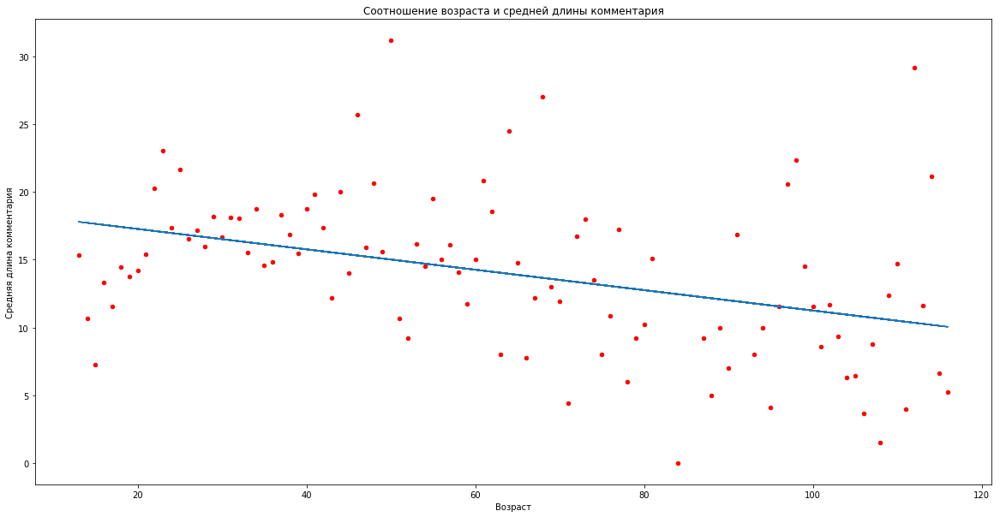

In [1011]:
# Чем старше, тем меньше длина комментария? Не интуитивно.
plt.figure(figsize=(20,10))
plt.scatter(ages_.keys(), ages_.values(), s=20, c='r')
plt.plot(keys, y_pred)
plt.title('Соотношение возраста и средней длины комментария')
plt.xlabel('Возраст')
plt.ylabel('Средняя длина комментария')
plt.savefig('ages.png')
plt.show()

In [991]:
cities_ = copy.deepcopy(cities) # чтобы сохранить предыдущий массив

In [992]:
for key, value in sorted(cities_.items()):
    cities_[key] = np.mean(cities_[key])

In [1012]:
len(cities_)

1215

In [1013]:
keys = cities_.keys()

Отобразим все имеющиеся города (можно было бы отсортировать по алфавиту, но не вижу пользы):

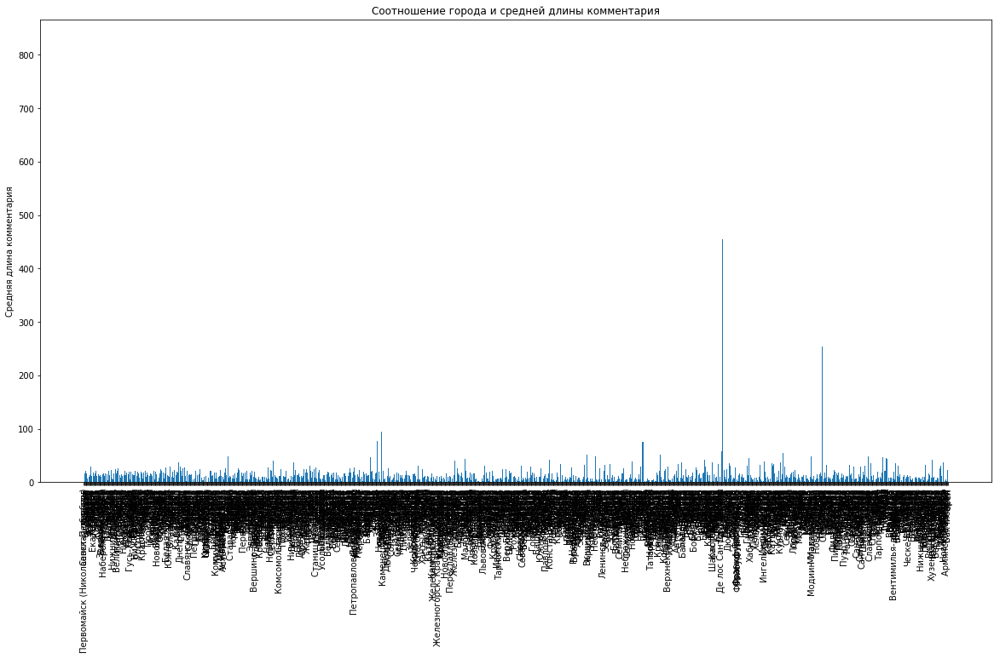

In [1014]:
plt.figure(figsize=(20,10))
plt.bar(range(len(keys)), cities_.values())
plt.title('Соотношение города и средней длины комментария')
# plt.xlabel('Город')
plt.xticks(range(len(keys)), list(keys), rotation=90)
plt.ylabel('Средняя длина комментария')
plt.savefig('cities_all.png')
plt.show()

Это не очень информативно, так что наложим ограничение: необходимо, чтобы из одного города было хотя бы 4 комментария (возможно, что от одного человека)

In [1015]:
cities__ = dict()
for key, value in cities.items():
    if len(value) > 3:
        cities__[key] = np.mean(value)

In [1016]:
len(cities__)

586

In [1017]:
keys = cities__.keys()

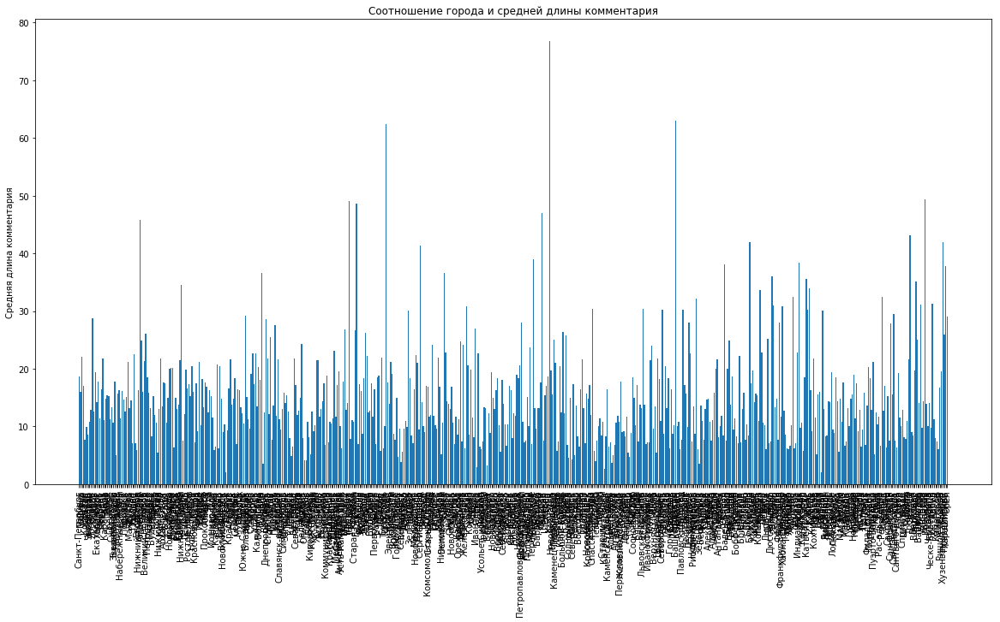

In [1018]:
plt.figure(figsize=(20,10))
plt.bar(range(len(keys)), cities__.values())
plt.title('Соотношение города и средней длины комментария')
# plt.xlabel('Город')
plt.xticks(range(len(keys)), list(keys), rotation=90)
plt.ylabel('Средняя длина комментария')
plt.savefig('cities_3.png')
plt.show()

Это тоже не очень информативно, так что увеличим порог до 15

In [1019]:
cities__ = dict()
for key, value in cities.items():
    if len(value) > 15:
        cities__[key] = np.mean(value)

In [1020]:
len(cities__)

248

In [1021]:
keys = cities__.keys()

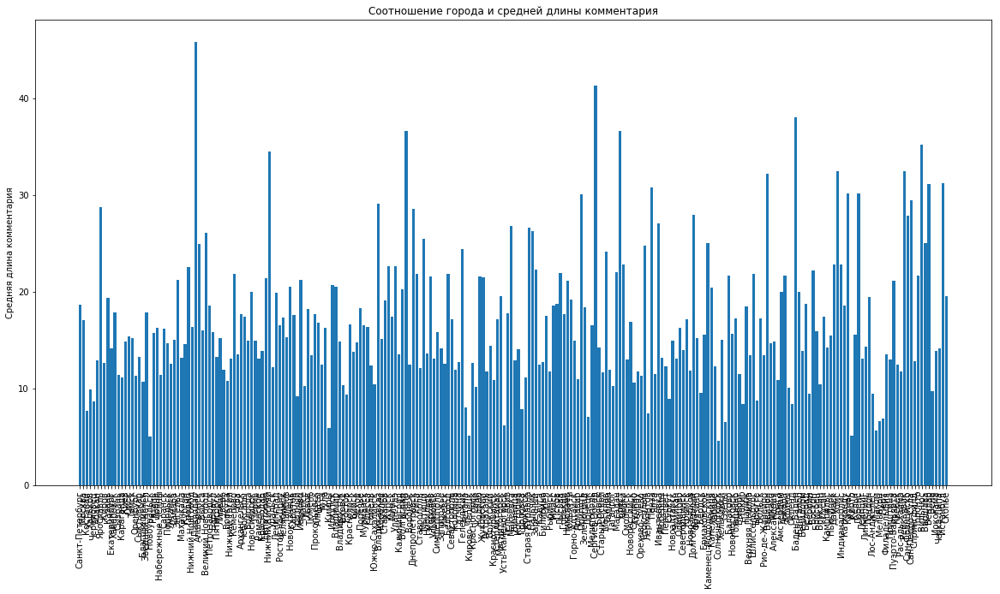

In [1022]:
plt.figure(figsize=(20,10))
plt.bar(range(len(keys)), cities__.values())
plt.title('Соотношение города и средней длины комментария')
# plt.xlabel('Город')
plt.xticks(range(len(keys)), list(keys), rotation=90)
plt.ylabel('Средняя длина комментария')
plt.savefig('cities_15.png')
plt.show()

Увеличим порог до 60

In [1023]:
cities__ = dict()
for key, value in cities.items():
    if len(value) > 60:
        cities__[key] = np.mean(value)

In [1024]:
len(cities__)

102

In [1025]:
keys = cities__.keys()

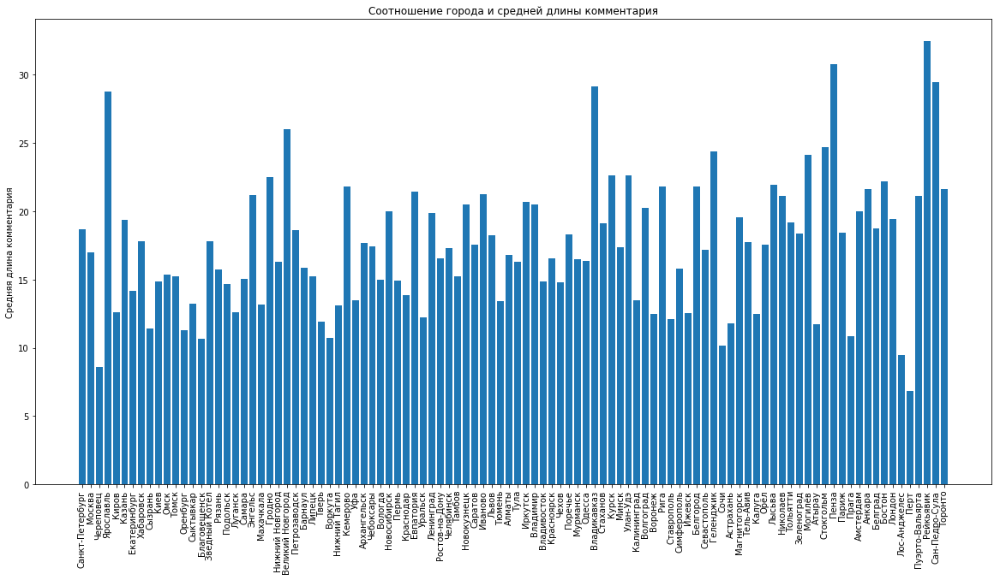

In [1026]:
plt.figure(figsize=(20,10))
plt.bar(range(len(keys)), cities__.values())
plt.title('Соотношение города и средней длины комментария')
# plt.xlabel('Город')
plt.xticks(range(len(keys)), list(keys), rotation=90)
plt.ylabel('Средняя длина комментария')
plt.savefig('cities_60.png')
plt.show()

На этом я остановлюсь

In [987]:
with open('posts.txt', 'w', encoding='utf-8') as f:
    for i, post in enumerate(posts):
        f.write(str(i+1) + '-й пост:\n' + post + '\n')

In [989]:
with open('comments.txt', 'w', encoding='utf-8') as f:
    for i, comments_ in enumerate(comments):
        f.write('Комментарии к ' + str(i+1) + '-му посту:\n')
        for j, comment in enumerate(comments_):
            f.write(str(j+1) + '-й комментарий:\n' + comment + '\n')
            f.write('\n')

In [990]:
with open('posts+comments.txt', 'w', encoding='utf-8') as f:
    for i, post in enumerate(posts):
        f.write(str(i+1) + '-й пост:\n' + post + '\n')
        f.write('Комментарии к ' + str(i+1) + '-му посту:\n')
        for j, comment in enumerate(comments[i]):
            f.write(str(j+1) + '-й комментарий:\n' + comment + '\n')
            f.write('\n')